<a href="https://colab.research.google.com/github/CRISTIANJULIOCESAR/DANN/blob/main/dann_cv_shaps_global_FINAL6sep2024.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
import os
import glob

def clear_previous_features(directory):
    # Eliminar todos los archivos .pkl en el directorio especificado
    files = glob.glob(os.path.join(directory, '*.pkl'))
    for f in files:
        try:
            os.remove(f)
            print(f'Eliminado: {f}')
        except Exception as e:
            print(f'No se pudo eliminar {f}. Error: {str(e)}')

# Directorio donde guardas las características
save_dir = "/content/drive/MyDrive/PANCANCER FINAL"

# Llamada a la función para limpiar los archivos previos
clear_previous_features(save_dir)


Eliminado: /content/drive/MyDrive/PANCANCER FINAL/feature_extractor_fc1_epoch0_iter64.pkl
Eliminado: /content/drive/MyDrive/PANCANCER FINAL/domain_classifier_fc2_epoch0_iter64.pkl
Eliminado: /content/drive/MyDrive/PANCANCER FINAL/label_predictor_fc2_epoch0_iter64.pkl
Eliminado: /content/drive/MyDrive/PANCANCER FINAL/feature_extractor_fc1_epoch1_iter64.pkl
Eliminado: /content/drive/MyDrive/PANCANCER FINAL/domain_classifier_fc2_epoch1_iter64.pkl
Eliminado: /content/drive/MyDrive/PANCANCER FINAL/label_predictor_fc2_epoch1_iter64.pkl
Eliminado: /content/drive/MyDrive/PANCANCER FINAL/feature_extractor_fc1_epoch2_iter64.pkl
Eliminado: /content/drive/MyDrive/PANCANCER FINAL/domain_classifier_fc2_epoch2_iter64.pkl
Eliminado: /content/drive/MyDrive/PANCANCER FINAL/label_predictor_fc2_epoch2_iter64.pkl
Eliminado: /content/drive/MyDrive/PANCANCER FINAL/feature_extractor_fc1_epoch3_iter64.pkl
Eliminado: /content/drive/MyDrive/PANCANCER FINAL/domain_classifier_fc2_epoch3_iter64.pkl
Eliminado: /cont

In [ ]:
import os

# Obtener el número de núcleos
num_cores = os.cpu_count()
print(f"Número de núcleos de CPU: {num_cores}")


Número de núcleos de CPU: 12


In [ ]:
import torch

if torch.cuda.is_available():
    gpu_name = torch.cuda.get_device_name(0)
    print(f"GPU en uso: {gpu_name}")
    print(f"Memoria total de la GPU: {torch.cuda.get_device_properties(0).total_memory / (1024 ** 3):.2f} GB")
else:
    print("No se encontró una GPU disponible.")


GPU en uso: NVIDIA L4
Memoria total de la GPU: 22.17 GB


In [ ]:
!pip install umap-learn shap
!pytorch-lamb

/bin/bash: line 1: pytorch-lamb: command not found


In [ ]:
import pandas as pd
clinicos = pd.read_pickle('/content/drive/MyDrive/pan_cancer_diner/final/Pan Cancer/Validados/picklesnuevos/meta_sinFPPP.pkl')
clinicos

,Unnamed: 0,data_type,updated_datetime,file_name,md5sum,data_category,experimental_strategy,project,sample_uuid,sample_barcode,...,panel,histology,tissue_site,stage,T,N,M,residual_tumor,new_tumor_events,follow_ups
file_id,,,,,,,,,,,,,,,,,,,,,
9fe7d0f4-866d-490f-b2cb-d9be7da889de,7001,Gene Expression Quantification,2016-05-26T20:51:28.753650-05:00,1db2cfc5-346d-4398-9dd4-8b92435059fd.htseq.cou...,bff9318f04ad067bccc0fbd2d31b45f1,Transcriptome Profiling,RNA-Seq,TCGA,9259e9ee-7279-4b62-8512-509cb705029c,TCGA-DD-AAVP-01A,...,LIHC,Hepatocellular Carcinoma,Liver,Stage I,T1,N0,M0,R0,2.0,1.0
dd74434f-300f-4798-8342-aad31b192e12,8001,Gene Expression Quantification,2016-05-26T21:04:47.187859-05:00,5f4cf592-e135-43ff-9c11-bcba462626d3.htseq.cou...,92cf7b5b7f0a0f5dfa02919c586b72c7,Transcriptome Profiling,RNA-Seq,TCGA,bccb7f9d-8dde-45b7-a50d-6c7233239ceb,TCGA-KK-A7B2-01A,...,PRAD,Prostate Adenocarcinoma Acinar Type,Prostate,NaN,T3a,N1,NaN,R0,2.0,1.0
07db9e9d-059d-4e6c-b483-81517a492b96,1001,Gene Expression Quantification,2016-05-26T21:04:48.015693-05:00,aa4a76e4-5348-479c-8beb-3e4e34e18ce9.htseq.cou...,503fa39eb3a770b869ab0c4297fd0d43,Transcriptome Profiling,RNA-Seq,TCGA,03877fe0-b0d6-4800-be46-b45c70350e48,TCGA-DC-6158-01A,...,READ,Rectal Adenocarcinoma,Rectum,Stage I,T2,N0,M0,R0,3.0,2.0
47ee860a-fd18-48f2-bfe7-4e19391950bd,2001,Gene Expression Quantification,2016-05-26T21:04:48.692729-05:00,0c172934-64ff-44dc-bdba-4c738f5692ea.htseq.cou...,c61b88a22488a1a0d2fb3e7739db0b32,Transcriptome Profiling,RNA-Seq,TCGA,8d3e521b-6df4-4633-bb44-7647ded94130,TCGA-DD-A4NP-01A,...,LIHC,Hepatocellular Carcinoma,Liver,Stage I,T1,N0,M0,R0,3.0,2.0
e322b0e5-458a-4cbf-a64f-9b348e413939,5001,Gene Expression Quantification,2016-05-26T21:04:49.266949-05:00,3025ad45-1d29-4c05-b90f-3d4a348c82c6.htseq.cou...,d279845ef0505630cf5a2ee4b1be5cac,Transcriptome Profiling,RNA-Seq,TCGA,8fef5013-4e57-4043-8770-a56135aeac9b,TCGA-HQ-A5ND-01A,...,BLCA,Muscle invasive urothelial carcinoma (pT2 or a...,Bladder,Stage IV,T3b,N1,M0,NaN,2.0,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
62cb41b1-8960-4fa2-8f74-38dd174af004,3999,Gene Expression Quantification,2016-06-01T23:31:30.205560-05:00,1ef78255-1b5c-42af-aa81-128c1b009114.htseq.cou...,4e139effd7c17a3b6f8c8a2dcf1ba2f5,Transcriptome Profiling,RNA-Seq,TCGA,f03d9b83-a4d7-4e77-abaa-5c3dbee0bcf3,TCGA-BP-4790-01A,...,KIRC,Kidney Clear Cell Renal Carcinoma,Kidney,Stage I,T1a,NX,M0,NaN,2.0,1.0
673a85f3-ba5e-448a-acee-dfec77b5238e,8000,Gene Expression Quantification,2016-06-01T23:31:30.867514-05:00,d07c7238-807f-48b1-bf06-deaa6200f4aa.htseq.cou...,b07dddd077d9db4f26b3e2ae066555c4,Transcriptome Profiling,RNA-Seq,TCGA,d90a2617-bf0b-453f-a483-ceac82781a6c,TCGA-N9-A4Q4-01A,...,UCS,Uterine Carcinosarcoma/ Malignant Mixed Muller...,Uterus,NaN,NaN,NaN,NaN,R0,1.0,0.0
3d93b2ae-7730-4914-af23-ff3554752922,9000,Gene Expression Quantification,2016-06-01T23:31:31.468195-05:00,3c5b65ad-998a-4124-814f-760de89f05d0.htseq.cou...,2046f591b06fa9eafb79d667f7942795,Transcriptome Profiling,RNA-Seq,TCGA,bf8e8426-dc44-40b0-8459-ad1dbaf9ba5a,TCGA-RY-A847-01A,...,LGG,Oligodendroglioma,Central nervous system,NaN,NaN,NaN,NaN,NaN,2.0,1.0


In [ ]:
df = pd.read_pickle('/content/drive/MyDrive/pan_cancer_diner/final/Pan Cancer/Validados/picklesnuevos/df_sinFPPP_2.pkl')
df

,5S_rRNA,5_8S_rRNA,7SK,A1BG,A1BG-AS1,A1CF,A2M,A2M-AS1,A2ML1,A2ML1-AS1,...,ZYG11A,ZYG11AP1,ZYG11B,ZYX,ZYXP1,ZZEF1,ZZZ3,hsa-mir-1253,hsa-mir-423,snoZ196
9fe7d0f4-866d-490f-b2cb-d9be7da889de,0,0,79,1055,12,3291,6614,11,0,0,...,5,0,557,3130,0,314,469,0,0,3
dd74434f-300f-4798-8342-aad31b192e12,1,0,1250,8,51,3,24510,55,120,0,...,73,0,963,10619,0,1656,1146,0,0,3
07db9e9d-059d-4e6c-b483-81517a492b96,0,0,41,2,35,1618,21227,29,1,0,...,5,0,2136,13793,0,3667,2641,0,0,3
47ee860a-fd18-48f2-bfe7-4e19391950bd,0,0,111,16482,328,10632,159168,124,1,0,...,66,0,3417,887,0,1822,1891,0,0,1
e322b0e5-458a-4cbf-a64f-9b348e413939,2,0,22,2,0,2,7488,18,1714,0,...,52,0,2155,13427,0,1404,2215,0,0,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
62cb41b1-8960-4fa2-8f74-38dd174af004,3,0,52,14,76,2971,111008,92,6,0,...,28,0,3969,11102,0,4381,2584,0,0,1
673a85f3-ba5e-448a-acee-dfec77b5238e,3,0,169,40,142,4,25243,27,277,0,...,172,0,2717,14657,0,1090,2165,0,0,3
3d93b2ae-7730-4914-af23-ff3554752922,0,1,3961,10,54,3,32550,26,289,1,...,2,0,2568,4216,0,3239,908,0,0,1
85a0b88f-2b89-4117-9e04-b81fad7f2e1b,9,1,1003,90,272,0,331,96,55,0,...,10,0,1611,19604,0,7247,3970,0,0,13


In [ ]:
clinicos = clinicos.dropna(subset=['vital'])
clinicos = clinicos.dropna(subset=['panel'])

In [ ]:
df['vital'] = clinicos['vital']
df['panel'] = clinicos['panel']

In [28]:
df = df.dropna(subset=['vital'])
df = df.dropna(subset=['panel'])

In [29]:
clinicos['panel'].unique()

array(['LIHC', 'PRAD', 'READ', 'BLCA', 'LGG', 'BRCA', 'UCEC', 'SARC',
       'KIRC', 'PCPG', 'DLBC', 'MESO', 'THYM', 'LUSC', 'LUAD', 'STAD',
       'GBM', 'LAML', 'THCA', 'CESC', 'COAD', 'HNSC', 'UVM', 'SKCM',
       'PAAD', 'OV', 'TGCT', 'KICH', 'ESCA', 'KIRP', 'ACC', 'CHOL', 'UCS'],
      dtype=object)

In [30]:
df

,5S_rRNA,5_8S_rRNA,7SK,A1BG,A1BG-AS1,A1CF,A2M,A2M-AS1,A2ML1,A2ML1-AS1,...,ZYG11B,ZYX,ZYXP1,ZZEF1,ZZZ3,hsa-mir-1253,hsa-mir-423,snoZ196,vital,panel
9fe7d0f4-866d-490f-b2cb-d9be7da889de,0,0,79,1055,12,3291,6614,11,0,0,...,557,3130,0,314,469,0,0,3,Alive,LIHC
dd74434f-300f-4798-8342-aad31b192e12,1,0,1250,8,51,3,24510,55,120,0,...,963,10619,0,1656,1146,0,0,3,Alive,PRAD
07db9e9d-059d-4e6c-b483-81517a492b96,0,0,41,2,35,1618,21227,29,1,0,...,2136,13793,0,3667,2641,0,0,3,Dead,READ
47ee860a-fd18-48f2-bfe7-4e19391950bd,0,0,111,16482,328,10632,159168,124,1,0,...,3417,887,0,1822,1891,0,0,1,Alive,LIHC
e322b0e5-458a-4cbf-a64f-9b348e413939,2,0,22,2,0,2,7488,18,1714,0,...,2155,13427,0,1404,2215,0,0,4,Dead,BLCA
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
62cb41b1-8960-4fa2-8f74-38dd174af004,3,0,52,14,76,2971,111008,92,6,0,...,3969,11102,0,4381,2584,0,0,1,Dead,KIRC
673a85f3-ba5e-448a-acee-dfec77b5238e,3,0,169,40,142,4,25243,27,277,0,...,2717,14657,0,1090,2165,0,0,3,Alive,UCS
3d93b2ae-7730-4914-af23-ff3554752922,0,1,3961,10,54,3,32550,26,289,1,...,2568,4216,0,3239,908,0,0,1,Alive,LGG
85a0b88f-2b89-4117-9e04-b81fad7f2e1b,9,1,1003,90,272,0,331,96,55,0,...,1611,19604,0,7247,3970,0,0,13,Alive,LAML


Usando dispositivo: cuda
----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Linear-1                 [-1, 1000]      39,980,000
       BatchNorm1d-2                 [-1, 1000]           2,000
           Dropout-3                 [-1, 1000]               0
  FeatureExtractor-4                 [-1, 1000]               0
            Linear-5                 [-1, 1000]       1,001,000
       BatchNorm1d-6                 [-1, 1000]           2,000
           Dropout-7                 [-1, 1000]               0
            Linear-8                 [-1, 1000]       1,001,000
       BatchNorm1d-9                 [-1, 1000]           2,000
          Dropout-10                 [-1, 1000]               0
           Linear-11                    [-1, 1]           1,001
   LabelPredictor-12                    [-1, 1]               0
           Linear-13                 [-1, 1000]       1,001,000
      BatchNor

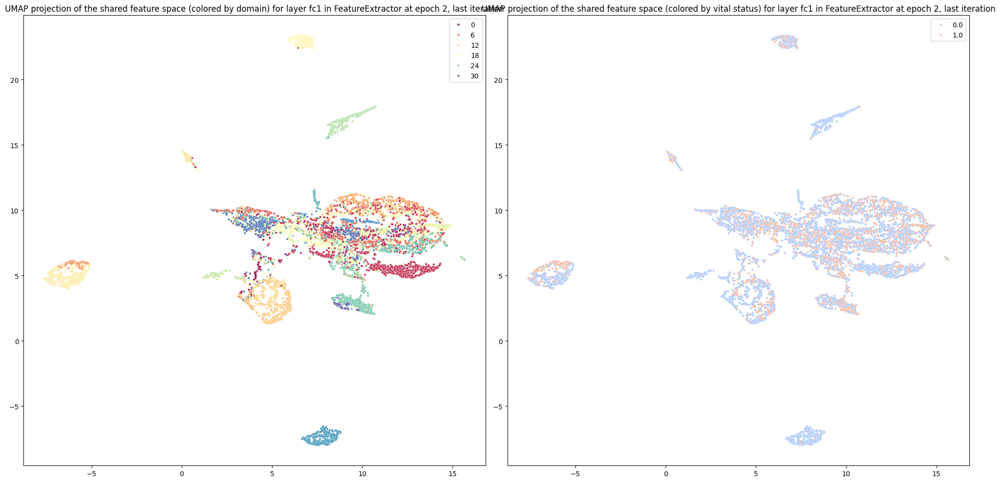

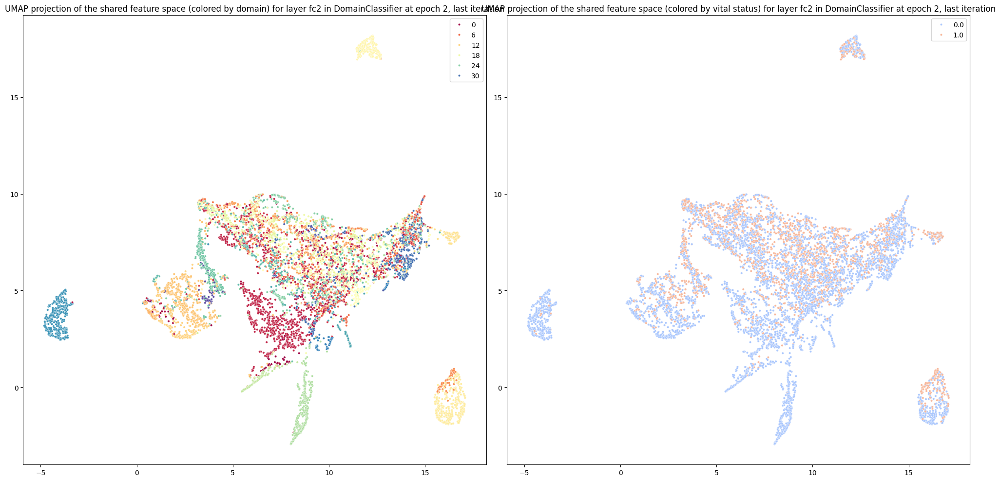

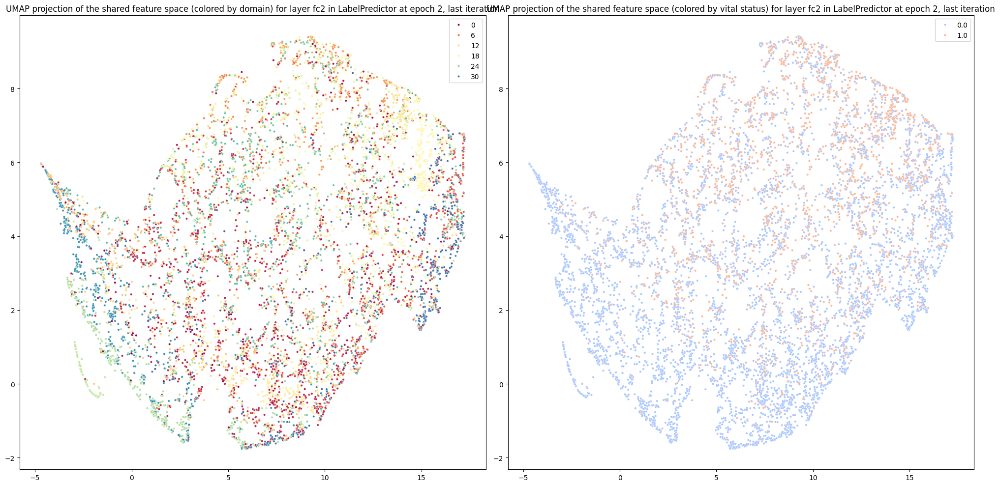

In [31]:
import os
import torch
import torch.nn as nn
import torch.optim as optim
import torch.nn.functional as F
from sklearn.preprocessing import LabelEncoder
from torch.utils.data import DataLoader, TensorDataset
import numpy as np
import umap
import seaborn as sns
import matplotlib.pyplot as plt
import pickle
from torchsummary import summary  # Importar torchsummary para imprimir el resumen del modelo

# Configurar el dispositivo para GPU si está disponible, de lo contrario, usar CPU
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Usando dispositivo: {device}")

# Preparar los datos
X = df.iloc[:, :-2].values  # Datos de miRNAs
Y = df['vital'].values  # Estado vital
panels = df['panel'].values  # Etiquetas del dominio (paneles)
from sklearn.model_selection import train_test_split

# Dividir los datos en conjuntos de entrenamiento (80%) y prueba (20%) de forma estratificada
X_train, X_test, Y_train, Y_test, panels_train, panels_test = train_test_split(
    X, Y, panels, test_size=0.2, stratify=Y, random_state=42
)

# Sobrescribir X y Y con los datos de entrenamiento
X = X_train
Y = Y_train
panels = panels_train


# Convertir el estado vital a valores numéricos
label_encoder_vital = LabelEncoder()
Y = label_encoder_vital.fit_transform(Y)

# Codificar las etiquetas de dominio (paneles)
label_encoder_panel = LabelEncoder()
panels = label_encoder_panel.fit_transform(panels)

# Convertir los datos a tensores y moverlos al dispositivo
X_tensor = torch.tensor(X, dtype=torch.float32).to(device)
Y_tensor = torch.tensor(Y, dtype=torch.float32).unsqueeze(1).to(device)
panels_tensor = torch.tensor(panels, dtype=torch.long).to(device)

# Crear datasets y dataloaders
batch_size = 128
dataset = TensorDataset(X_tensor, Y_tensor, panels_tensor)
loader = DataLoader(dataset, batch_size=batch_size, shuffle=True)

# Definición del modelo DANN mejorado
class FeatureExtractor(nn.Module):
    def __init__(self, input_dim):
        super(FeatureExtractor, self).__init__()
        self.fc1 = nn.Linear(input_dim, 1000)  # Capa única con 10,000 neuronas
        self.bn1 = nn.BatchNorm1d(1000)
        self.dropout1 = nn.Dropout(0.1)  # Dropout moderado

        # Aplicar inicialización He a la capa
        nn.init.kaiming_normal_(self.fc1.weight, nonlinearity='leaky_relu')

    def forward(self, x, lambda_=1.0):
        x = F.leaky_relu(self.bn1(self.fc1(x)))
        x = self.dropout1(x)
        return x

class LabelPredictor(nn.Module):
    def __init__(self, input_dim):
        super(LabelPredictor, self).__init__()
        self.fc1 = nn.Linear(input_dim, 1000)
        self.bn1 = nn.BatchNorm1d(1000)
        self.dropout1 = nn.Dropout(0.1)  # Dropout moderado
        self.fc2 = nn.Linear(1000, 1000)
        self.bn2 = nn.BatchNorm1d(1000)
        self.dropout2 = nn.Dropout(0.1)  # Dropout moderado
        self.fc3 = nn.Linear(1000, 1)

        # Aplicar inicialización He a las capas
        nn.init.kaiming_normal_(self.fc1.weight, nonlinearity='leaky_relu')
        nn.init.kaiming_normal_(self.fc2.weight, nonlinearity='leaky_relu')
        nn.init.kaiming_normal_(self.fc3.weight, nonlinearity='leaky_relu')

    def forward(self, x):
        x = F.leaky_relu(self.bn1(self.fc1(x)))
        x = self.dropout1(x)
        x = F.leaky_relu(self.bn2(self.fc2(x)))
        x = self.dropout2(x)
        x = torch.sigmoid(self.fc3(x))
        return x

class DomainClassifier(nn.Module):
    def __init__(self, input_dim, num_domains):
        super(DomainClassifier, self).__init__()
        self.fc1 = nn.Linear(input_dim, 1000)
        self.bn1 = nn.BatchNorm1d(1000)
        self.dropout1 = nn.Dropout(0.1)  # Dropout moderado
        self.fc2 = nn.Linear(1000, 1000)
        self.bn2 = nn.BatchNorm1d(1000)
        self.dropout2 = nn.Dropout(0.1)  # Dropout moderado
        self.fc3 = nn.Linear(1000, num_domains)

        # Aplicar inicialización He a las capas
        nn.init.kaiming_normal_(self.fc1.weight, nonlinearity='leaky_relu')
        nn.init.kaiming_normal_(self.fc2.weight, nonlinearity='leaky_relu')
        nn.init.kaiming_normal_(self.fc3.weight, nonlinearity='leaky_relu')

    def forward(self, x):
        x = F.leaky_relu(self.bn1(self.fc1(x)))
        x = self.dropout1(x)
        x = F.leaky_relu(self.bn2(self.fc2(x)))
        x = self.dropout2(x)
        x = self.fc3(x)
        return x

class DANN(nn.Module):
    def __init__(self, feature_dim, num_domains):
        super(DANN, self).__init__()
        self.feature_extractor = FeatureExtractor(feature_dim)
        self.label_predictor = LabelPredictor(1000)
        self.domain_classifier = DomainClassifier(1000, num_domains)

    def forward(self, x, lambda_=1.0):
        # Extracción de características
        features = self.feature_extractor(x)

        # Inversión de gradiente con lambda
        reverse_features = ReverseLayerF.apply(features, lambda_)

        # Predicción de etiquetas
        label_output = self.label_predictor(features)

        # Clasificación de dominio
        domain_output = self.domain_classifier(reverse_features)

        return label_output, domain_output, features

class ReverseLayerF(torch.autograd.Function):
    @staticmethod
    def forward(ctx, x, lambda_):
        ctx.lambda_ = lambda_  # Guardamos lambda para usarla en la retropropagación
        return x.view_as(x)  # Devolvemos las características sin cambios

    @staticmethod
    def backward(ctx, grad_output):
        # Invertimos los gradientes y los escalamos por lambda
        output = grad_output.neg() * ctx.lambda_
        return output, None  # Retornamos el gradiente invertido

# Función para listar las capas de un módulo
def list_module_layers(module, module_name):
    print(f"Capas disponibles en {module_name}:")
    for name, mod in module.named_children():
        print(f'Layer name: {name}, Module: {mod}')

# Función para extraer características de una capa específica de un módulo
def extract_layer_features(model, loader, module_name, layer_name, use_features=False):
    model.eval()
    features = []
    labels = []
    domains = []

    with torch.no_grad():
        for inputs, label, domain in loader:
            inputs, label, domain = inputs.to(device), label.to(device), domain.to(device)
            if use_features:
                x = model.feature_extractor(inputs)
            else:
                x = inputs
            module = getattr(model, module_name)
            for name, mod in module.named_children():
                x = mod(x)
                if name == layer_name:
                    break
            features.append(x.cpu().numpy())
            labels.append(label.cpu().numpy())
            domains.append(domain.cpu().numpy())

    features = np.concatenate(features, axis=0)
    labels = np.concatenate(labels, axis=0).flatten()
    domains = np.concatenate(domains, axis=0).flatten()
    return features, labels, domains

# Función para guardar características de una capa específica de un módulo en disco
def save_layer_features_to_disk(epoch_iter, model, loader, module_name, layer_name, use_features=False):
    features, labels, domains = extract_layer_features(model, loader, module_name, layer_name, use_features)

    # Crear un directorio para guardar las características si no existe
    save_dir = "/content/drive/MyDrive/PANCANCER FINAL"
    if not os.path.exists(save_dir):
        os.makedirs(save_dir)

    # Guardar las características en disco
    file_name = f"{save_dir}/{module_name}_{layer_name}_epoch{epoch_iter[0]}_iter{epoch_iter[1]}.pkl"
    with open(file_name, 'wb') as f:
        pickle.dump((features, labels, domains), f)

# Función para cargar características desde disco
def load_layer_features_from_disk(epoch, iteration, module_name, layer_name):
    file_name = f"/content/drive/MyDrive/PANCANCER FINAL/{module_name}_{layer_name}_epoch{epoch}_iter{iteration}.pkl"
    if os.path.exists(file_name):
        with open(file_name, 'rb') as f:
            features, labels, domains = pickle.load(f)
        return features, labels, domains
    else:
        print(f"No features found for epoch {epoch}, iteration {iteration}, module {module_name}, layer {layer_name}")
        return None, None, None

# Función para visualizar UMAP
def plot_umap(embedding, labels, domains, title_suffix=''):
    plt.figure(figsize=(20, 10))

    plt.subplot(1, 2, 1)
    sns.scatterplot(x=embedding[:, 0], y=embedding[:, 1], hue=domains, palette='Spectral', s=10)
    plt.title(f'UMAP projection of the shared feature space (colored by domain) {title_suffix}')

    plt.subplot(1, 2, 2)
    sns.scatterplot(x=embedding[:, 0], y=embedding[:, 1], hue=labels, palette='coolwarm', s=10)
    plt.title(f'UMAP projection of the shared feature space (colored by vital status) {title_suffix}')

    plt.tight_layout()
    torch.cuda.synchronize()
    plt.show()

# Función para visualizar UMAP de una capa específica en una época e iteración específica
def visualize_layer_umap(epoch, iteration, module_name, layer_name, title_suffix=''):
    features, labels, domains = load_layer_features_from_disk(epoch, iteration, module_name, layer_name)
    if features is not None:
        reducer = umap.UMAP(n_components=2)
        embedding = reducer.fit_transform(features)
        plot_umap(embedding, labels, domains, title_suffix)

# Parámetros
input_dim = X.shape[1]
num_domains = len(label_encoder_panel.classes_)
num_epochs = 10

# Crear el modelo
model = DANN(input_dim, num_domains).to(device)

# Imprimir el resumen de la arquitectura del modelo usando torchsummary
summary(model, input_size=(input_dim,))

# Después de llamar a summary, puedes ajustar el lambda_ durante el entrenamiento
lambda_ = 0.2 # Valor ajustado por el usuario

# Definir el optimizador AdamW
optimizer = optim.AdamW(
    model.parameters(),
    lr=0.01,  # Tasa de aprendizaje
    betas=(0.9, 0.99),  # Coeficientes beta
    eps=1e-8,  # Valor pequeño para estabilidad numérica
    weight_decay=0.01,  # Regularización L2
    amsgrad=False  # Si deseas usar la variante AMSGrad
)

# Definir las funciones de pérdida
criterion_label = nn.BCELoss().to(device)
criterion_domain = nn.CrossEntropyLoss().to(device)

# Listas para guardar las precisiones
label_accuracies = []
domain_accuracies = []


class ModelSaver:
    def __init__(self):
        self.models = []

    def save_model(self, model, iteration):
        # Hacer una copia del estado del modelo
        model_copy = {k: v.clone() for k, v in model.state_dict().items()}
        self.models.append((iteration, model_copy))

    def get_models(self):
        return self.models
# Crear instancia de ModelSaver
model_saver = ModelSaver()



# Entrenamiento y guardado de características
for epoch in range(num_epochs):
    model.train()
    correct_label = 0
    correct_domain = 0
    total = 0

    for i, (inputs, labels, domains) in enumerate(loader):
        inputs, labels, domains = inputs.to(device), labels.to(device), domains.to(device)

        # Forward pass: obtiene las predicciones para etiquetas y dominios
        label_preds, domain_preds, features = model(inputs, lambda_)  # El valor de lambda_ es proporcionado aquí

        # Cálculo de pérdidas
        loss_label = criterion_label(label_preds, labels)  # Pérdida de predicción de etiquetas (L_y)
        loss_domain = criterion_domain(domain_preds, domains)  # Pérdida de predicción de dominios (L_d)

        # Reseteo de gradientes acumulados
        optimizer.zero_grad()

        # Suma de las pérdidas de ambas tareas
        loss = loss_label + loss_domain

        # Retropropagación de gradientes (aquí es donde ocurren ambas retropropagaciones)
        loss.backward()

        # Clip gradients to prevent explosion
        torch.nn.utils.clip_grad_norm_(model.parameters(), max_norm=1.0)

        # Actualización de los parámetros del modelo
        optimizer.step()

        predicted_label = (label_preds > 0.5).float()
        correct_label += (predicted_label == labels).sum().item()

        _, predicted_domain = torch.max(domain_preds, 1)
        correct_domain += (predicted_domain == domains).sum().item()

        total += labels.size(0)

        # Guardar características solo para la última iteración dentro de cada época
        if i == len(loader) - 1:  # Solo para la última iteración
            save_layer_features_to_disk((epoch, i), model, loader, 'feature_extractor', 'fc1')
            save_layer_features_to_disk((epoch, i), model, loader, 'domain_classifier', 'fc2', use_features=True)
            save_layer_features_to_disk((epoch, i), model, loader, 'label_predictor', 'fc2', use_features=True)



            # Guardar el modelo después de cada iteración (en este caso la ulitima iteración)
            model_saver.save_model(model, (epoch, i))



    label_accuracy = correct_label / total
    domain_accuracy = correct_domain / total

    label_accuracies.append(label_accuracy)
    domain_accuracies.append(domain_accuracy)

    print(f'Epoch [{epoch+1}/{num_epochs}], Label Accuracy: {label_accuracy:.4f}, Domain Accuracy: {domain_accuracy:.4f}')

# Visualización de UMAP de la última iteración de la segunda época (indexada como epoch 1)
visualize_layer_umap(epoch=1, iteration=len(loader) - 1, module_name='feature_extractor', layer_name='fc1', title_suffix='for layer fc1 in FeatureExtractor at epoch 2, last iteration')
visualize_layer_umap(epoch=1, iteration=len(loader) - 1, module_name='domain_classifier', layer_name='fc2', title_suffix='for layer fc2 in DomainClassifier at epoch 2, last iteration')
visualize_layer_umap(epoch=1, iteration=len(loader) - 1, module_name='label_predictor', layer_name='fc2', title_suffix='for layer fc2 in LabelPredictor at epoch 2, last iteration')


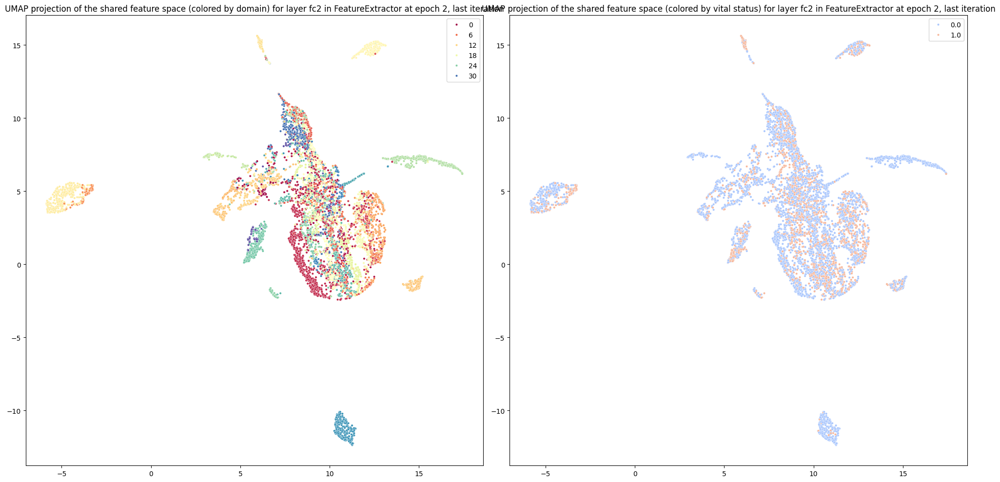

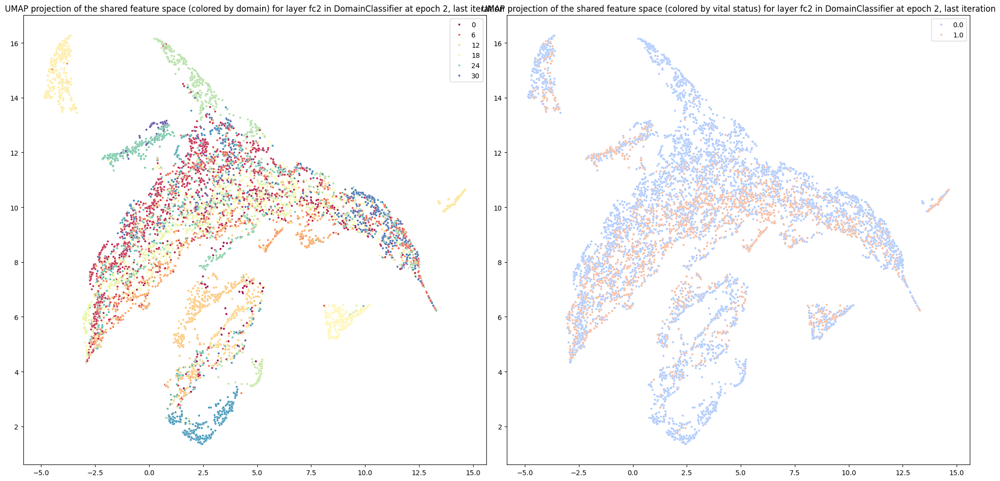

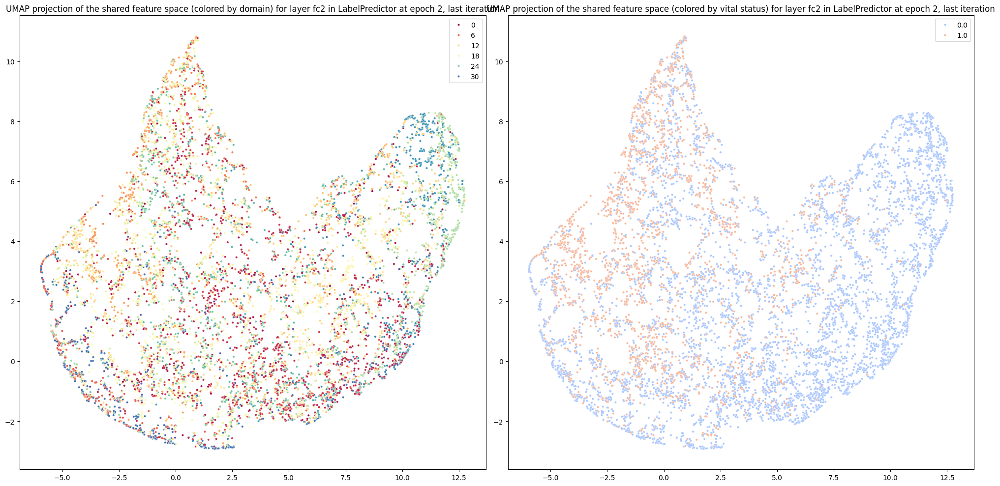

In [32]:
# Visualización de UMAP de la última iteración de la segunda época (indexada como epoch 1)
visualize_layer_umap(epoch=4, iteration=len(loader) - 1, module_name='feature_extractor', layer_name='fc1', title_suffix='for layer fc2 in FeatureExtractor at epoch 2, last iteration')
visualize_layer_umap(epoch=4, iteration=len(loader) - 1, module_name='domain_classifier', layer_name='fc2', title_suffix='for layer fc2 in DomainClassifier at epoch 2, last iteration')
visualize_layer_umap(epoch=4, iteration=len(loader) - 1, module_name='label_predictor', layer_name='fc2', title_suffix='for layer fc2 in LabelPredictor at epoch 2, last iteration')


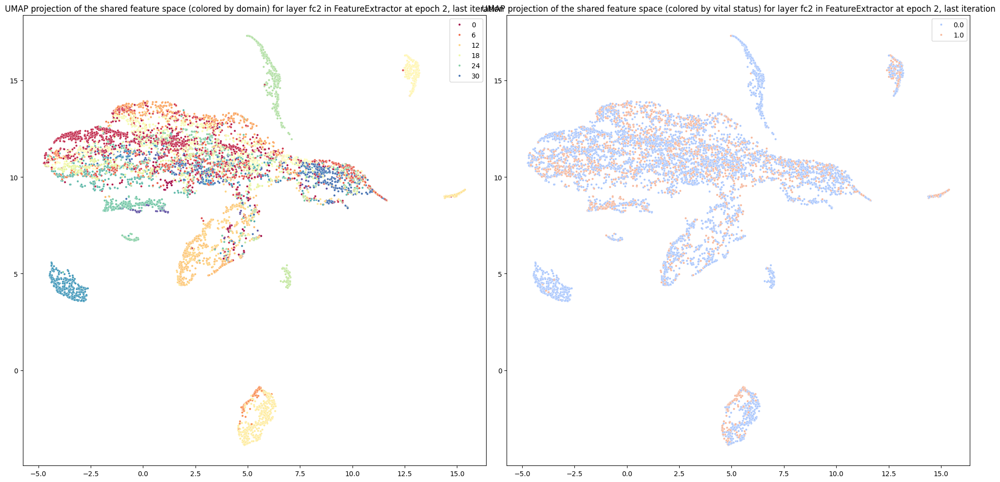

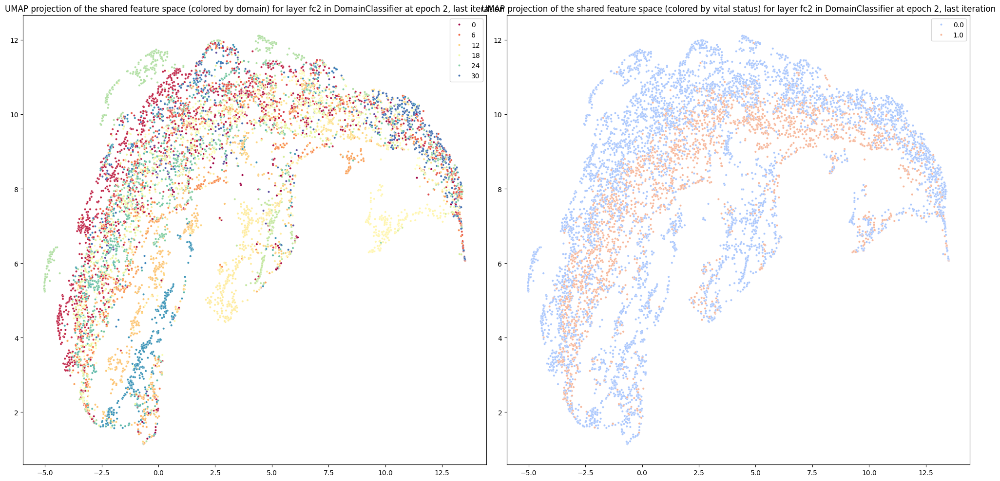

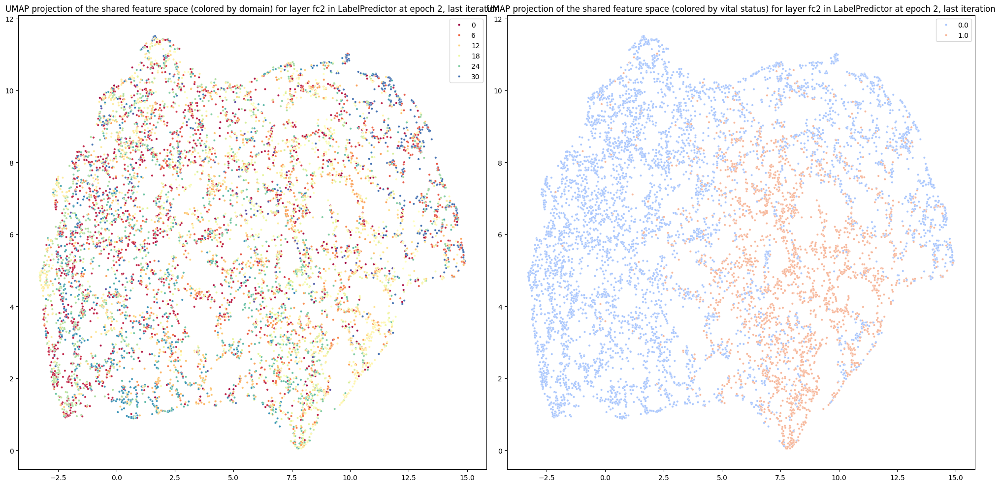

In [33]:
# Visualización de UMAP de la última iteración de la segunda época (indexada como epoch 1)
visualize_layer_umap(epoch=9, iteration=len(loader) - 1, module_name='feature_extractor', layer_name='fc1', title_suffix='for layer fc2 in FeatureExtractor at epoch 2, last iteration')
visualize_layer_umap(epoch=9, iteration=len(loader) - 1, module_name='domain_classifier', layer_name='fc2', title_suffix='for layer fc2 in DomainClassifier at epoch 2, last iteration')
visualize_layer_umap(epoch=9, iteration=len(loader) - 1, module_name='label_predictor', layer_name='fc2', title_suffix='for layer fc2 in LabelPredictor at epoch 2, last iteration')


In [34]:
# Supongamos que la época 5 es la que te interesa (indexada como 4 en Python)
epoch_of_interest = 9  # Indexada desde 0, por lo que la época 5 es epoch 4

# Obtener el modelo guardado al final de la época 5
iteration_info, model_state_dict = model_saver.get_models()[epoch_of_interest]
epoch, iteration = iteration_info

print(f"Modelo guardado al final de la época {epoch + 1}, iteración {iteration + 1}")
model.load_state_dict(model_state_dict)


Modelo guardado al final de la época 10, iteración 65


<All keys matched successfully>

In [ ]:
import torch
import shap
from tqdm import tqdm
import numpy as np

# Supongamos que la época 10 es la que te interesa (indexada como 9 en Python)
epoch_of_interest = 9  # Indexada desde 0, por lo que la época 10 es epoch 9

# Obtener el modelo guardado al final de la época 10
iteration_info, model_state_dict = model_saver.get_models()[epoch_of_interest]
epoch, iteration = iteration_info

print(f"Modelo guardado al final de la época {epoch + 1}, iteración {iteration + 1}")
model.load_state_dict(model_state_dict)

# Convertir los datos de miRNAs a un tensor, pero solo las primeras 100 muestras
X = df.iloc[:, :-2].values  # Usando las primeras 100 filas y todas las columnas excepto las dos últimas
X_tensor = torch.tensor(X, dtype=torch.float32).to(device)

# Asegúrate de que el modelo esté en modo de evaluación
model.eval()

# Crear un modelo combinado que incluya tanto el FeatureExtractor como el LabelPredictor
class CombinedModel(torch.nn.Module):
    def __init__(self, feature_extractor, label_predictor):
        super(CombinedModel, self).__init__()
        self.feature_extractor = feature_extractor
        self.label_predictor = label_predictor

    def forward(self, x):
        features = self.feature_extractor(x)
        output = self.label_predictor(features)
        return output

combined_model = CombinedModel(model.feature_extractor, model.label_predictor)

# Crear un objeto SHAP explainer utilizando GradientExplainer con el modelo combinado
explainer = shap.GradientExplainer(combined_model, X_tensor)

# Calcular los valores SHAP para la salida del LabelPredictor directamente sobre X_tensor
shap_values = []
try:
    for i in tqdm(range(X_tensor.shape[0]), desc="Calculando valores SHAP"):
        shap_value = explainer.shap_values(X_tensor[i:i+1])
        shap_values.append(shap_value)
        print(f"SHAP values for instance {i}: {shap_value}")

    # Convertir la lista de valores SHAP a un numpy array
    shap_values_np = np.vstack(shap_values).squeeze()  # Eliminar la tercera dimensión
    print("Final SHAP values numpy array (shape):", shap_values_np.shape)

    # Usar los nombres de características originales
    feature_names_original = df.iloc[:, :-2].columns

    # Visualización de los valores SHAP para las características originales
    print("Generating SHAP summary plot...")
    shap.summary_plot(shap_values_np, X, feature_names=feature_names_original)
    print("SHAP summary plot generated successfully.")

except Exception as e:
    print(f"An error occurred: {e}")
    print(f"SHAP values calculated so far: {shap_values}")


Modelo guardado al final de la época 10, iteración 65


Calculando valores SHAP:   0%|          | 2/10286 [00:00<31:55,  5.37it/s]

SHAP values for instance 0: [[[ 5.53079703e-08]
  [-6.00879803e-07]
  [ 6.06710885e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.14313654e-07]]]
SHAP values for instance 1: [[[ 9.74723829e-09]
  [-1.25945023e-06]
  [-2.80952704e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.79663205e-07]]]


Calculando valores SHAP:   0%|          | 4/10286 [00:00<29:41,  5.77it/s]

SHAP values for instance 2: [[[ 2.08083277e-08]
  [-5.63627416e-06]
  [ 5.27969581e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.68995259e-07]]]
SHAP values for instance 3: [[[ 1.82781285e-08]
  [-1.00979672e-07]
  [ 2.22015088e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.11293476e-07]]]


Calculando valores SHAP:   0%|          | 6/10286 [00:01<29:06,  5.89it/s]

SHAP values for instance 4: [[[-2.10524764e-08]
  [-1.81172819e-06]
  [ 4.27684621e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.60584826e-07]]]
SHAP values for instance 5: [[[-2.51278995e-08]
  [-2.81346350e-06]
  [ 3.79506520e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.28325481e-07]]]


Calculando valores SHAP:   0%|          | 8/10286 [00:01<28:48,  5.95it/s]

SHAP values for instance 6: [[[ 1.31509949e-08]
  [-1.39027458e-06]
  [ 9.76740393e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.75171369e-07]]]
SHAP values for instance 7: [[[ 4.11688259e-08]
  [-3.10977222e-06]
  [ 8.29554020e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.58484935e-07]]]


Calculando valores SHAP:   0%|          | 10/10286 [00:01<29:11,  5.87it/s]

SHAP values for instance 8: [[[ 3.53132361e-08]
  [-1.04806629e-06]
  [ 9.05232460e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.00679833e-07]]]
SHAP values for instance 9: [[[ 7.92382525e-08]
  [-6.10118211e-05]
  [ 3.46361604e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 8.65694732e-07]]]


Calculando valores SHAP:   0%|          | 12/10286 [00:02<29:12,  5.86it/s]

SHAP values for instance 10: [[[ 1.60168055e-08]
  [-7.25923499e-08]
  [ 1.03669079e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.55106228e-08]]]
SHAP values for instance 11: [[[ 4.81343694e-08]
  [-2.58463525e-07]
  [ 3.40199888e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.80611699e-07]]]


Calculando valores SHAP:   0%|          | 14/10286 [00:02<28:41,  5.97it/s]

SHAP values for instance 12: [[[-4.99125646e-08]
  [-1.51193369e-06]
  [ 1.45083293e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.72836548e-06]]]
SHAP values for instance 13: [[[ 5.78371199e-08]
  [-1.43134109e-05]
  [ 8.58405375e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.52117943e-07]]]


Calculando valores SHAP:   0%|          | 16/10286 [00:02<28:29,  6.01it/s]

SHAP values for instance 14: [[[ 2.99814182e-08]
  [-2.46547457e-06]
  [ 1.06667450e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.00916864e-07]]]
SHAP values for instance 15: [[[-2.46201189e-08]
  [-7.24814416e-07]
  [ 4.43085698e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.53355287e-08]]]


Calculando valores SHAP:   0%|          | 18/10286 [00:03<28:28,  6.01it/s]

SHAP values for instance 16: [[[ 8.57661495e-08]
  [-1.37144832e-06]
  [ 2.71762240e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.10266238e-07]]]
SHAP values for instance 17: [[[-1.72463751e-08]
  [-5.04856971e-07]
  [ 8.57303859e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.24496890e-07]]]


Calculando valores SHAP:   0%|          | 20/10286 [00:03<28:30,  6.00it/s]

SHAP values for instance 18: [[[-1.06679725e-07]
  [-1.09021424e-05]
  [ 2.75120784e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.63756029e-07]]]
SHAP values for instance 19: [[[ 4.09644747e-08]
  [-2.25073325e-05]
  [ 1.33010770e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 9.88483460e-07]]]


Calculando valores SHAP:   0%|          | 22/10286 [00:03<28:34,  5.99it/s]

SHAP values for instance 20: [[[-2.73996271e-08]
  [-2.25030210e-06]
  [ 4.27258670e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.27791317e-07]]]
SHAP values for instance 21: [[[-2.03626481e-08]
  [-1.42051460e-06]
  [ 5.45924156e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.06440569e-07]]]


Calculando valores SHAP:   0%|          | 24/10286 [00:04<28:34,  5.99it/s]

SHAP values for instance 22: [[[ 1.97601879e-08]
  [-3.61582509e-06]
  [ 2.93967266e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.63277456e-07]]]
SHAP values for instance 23: [[[ 2.77109786e-08]
  [-7.96325773e-07]
  [ 8.82462957e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.29909489e-07]]]


Calculando valores SHAP:   0%|          | 26/10286 [00:04<28:44,  5.95it/s]

SHAP values for instance 24: [[[ 1.72127518e-08]
  [-3.57789436e-06]
  [ 3.08858904e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.33611608e-07]]]
SHAP values for instance 25: [[[-2.18754440e-07]
  [-1.00873509e-06]
  [ 1.84912167e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.08065798e-06]]]


Calculando valores SHAP:   0%|          | 28/10286 [00:04<28:45,  5.95it/s]

SHAP values for instance 26: [[[ 3.18264704e-09]
  [-2.11988754e-06]
  [ 5.67206273e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.54620887e-07]]]
SHAP values for instance 27: [[[-8.80725618e-09]
  [-2.34445970e-05]
  [ 2.62354698e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.11172706e-07]]]


Calculando valores SHAP:   0%|          | 30/10286 [00:05<28:45,  5.94it/s]

SHAP values for instance 28: [[[-1.51300179e-08]
  [-1.13263795e-07]
  [ 1.88883006e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.87650311e-07]]]
SHAP values for instance 29: [[[-8.21013351e-08]
  [-1.06085428e-06]
  [ 7.67802624e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.62948831e-06]]]


Calculando valores SHAP:   0%|          | 32/10286 [00:05<28:26,  6.01it/s]

SHAP values for instance 30: [[[-4.24591880e-08]
  [-5.26350044e-06]
  [ 1.28424765e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.95808153e-07]]]
SHAP values for instance 31: [[[ 2.90354245e-08]
  [-3.51228683e-06]
  [ 3.90215310e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.87214381e-07]]]


Calculando valores SHAP:   0%|          | 34/10286 [00:05<28:51,  5.92it/s]

SHAP values for instance 32: [[[ 9.79879980e-09]
  [-4.59961665e-06]
  [ 1.83678140e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.35514221e-07]]]
SHAP values for instance 33: [[[ 1.10711752e-08]
  [-1.89415359e-06]
  [ 2.35767671e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.64896591e-07]]]


Calculando valores SHAP:   0%|          | 36/10286 [00:06<28:25,  6.01it/s]

SHAP values for instance 34: [[[-7.14265009e-08]
  [-1.26728148e-06]
  [ 2.48257222e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.74123524e-07]]]
SHAP values for instance 35: [[[-1.92137853e-08]
  [-1.23740093e-06]
  [ 1.00320943e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.61310231e-08]]]


Calculando valores SHAP:   0%|          | 38/10286 [00:06<28:13,  6.05it/s]

SHAP values for instance 36: [[[ 2.92370150e-08]
  [-9.71582979e-06]
  [ 1.28023333e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.94294191e-07]]]
SHAP values for instance 37: [[[ 5.38860670e-09]
  [-2.19141647e-06]
  [ 1.58246007e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.67188441e-07]]]


Calculando valores SHAP:   0%|          | 40/10286 [00:06<28:17,  6.04it/s]

SHAP values for instance 38: [[[-1.80392097e-08]
  [-1.36292546e-07]
  [ 3.53854471e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.47698112e-08]]]
SHAP values for instance 39: [[[ 4.03426942e-08]
  [-3.09953080e-06]
  [ 4.34095073e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.69645162e-07]]]


Calculando valores SHAP:   0%|          | 42/10286 [00:07<28:17,  6.03it/s]

SHAP values for instance 40: [[[-9.50878267e-08]
  [-1.58525881e-07]
  [-1.57684757e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.56860297e-08]]]
SHAP values for instance 41: [[[ 1.71706104e-08]
  [-4.63002114e-07]
  [ 4.38886710e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.78300325e-07]]]


Calculando valores SHAP:   0%|          | 44/10286 [00:07<28:26,  6.00it/s]

SHAP values for instance 42: [[[ 3.95840907e-08]
  [-1.23250022e-06]
  [ 2.31339227e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.90859189e-07]]]
SHAP values for instance 43: [[[-2.05183745e-08]
  [-8.46749248e-07]
  [ 3.26306405e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.58771524e-08]]]


Calculando valores SHAP:   0%|          | 46/10286 [00:07<28:56,  5.90it/s]

SHAP values for instance 44: [[[-2.57969235e-08]
  [-4.27839576e-06]
  [ 7.87605233e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.31055363e-07]]]
SHAP values for instance 45: [[[-3.36282717e-08]
  [-1.99683396e-06]
  [-1.85012120e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.91705481e-07]]]


Calculando valores SHAP:   0%|          | 48/10286 [00:08<28:48,  5.92it/s]

SHAP values for instance 46: [[[-3.01653721e-08]
  [-4.75647524e-07]
  [ 2.59320941e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.56443533e-07]]]
SHAP values for instance 47: [[[-2.22819395e-08]
  [-4.90785917e-07]
  [ 5.55139432e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.19416100e-07]]]


Calculando valores SHAP:   0%|          | 50/10286 [00:08<28:21,  6.01it/s]

SHAP values for instance 48: [[[ 3.50807402e-09]
  [-3.82093668e-07]
  [ 7.42289704e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.43398793e-07]]]
SHAP values for instance 49: [[[ 4.20484436e-08]
  [-4.33843473e-06]
  [ 8.27701243e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.86490046e-07]]]


Calculando valores SHAP:   1%|          | 52/10286 [00:08<28:09,  6.06it/s]

SHAP values for instance 50: [[[ 7.54192145e-08]
  [-1.83093630e-06]
  [ 2.50368202e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.14629405e-07]]]
SHAP values for instance 51: [[[-1.40666218e-08]
  [-1.92450317e-06]
  [ 4.02792981e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.06424810e-07]]]


Calculando valores SHAP:   1%|          | 54/10286 [00:09<28:03,  6.08it/s]

SHAP values for instance 52: [[[ 6.48353911e-09]
  [-6.94808112e-07]
  [ 3.82728090e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.87207162e-07]]]
SHAP values for instance 53: [[[-7.90436502e-09]
  [-5.38532735e-07]
  [ 1.25759474e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.48821238e-07]]]


Calculando valores SHAP:   1%|          | 56/10286 [00:09<27:52,  6.12it/s]

SHAP values for instance 54: [[[ 5.40460960e-08]
  [-1.00839497e-05]
  [ 1.18787208e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.16307217e-07]]]
SHAP values for instance 55: [[[ 5.94133412e-09]
  [-1.92538818e-06]
  [ 3.51064433e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.42167982e-07]]]


Calculando valores SHAP:   1%|          | 58/10286 [00:09<27:50,  6.12it/s]

SHAP values for instance 56: [[[ 4.65147379e-09]
  [ 2.23279078e-07]
  [ 3.70873615e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.19606223e-08]]]
SHAP values for instance 57: [[[ 1.53898879e-08]
  [-8.89061963e-07]
  [ 2.36476262e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.91169014e-07]]]


Calculando valores SHAP:   1%|          | 60/10286 [00:10<28:21,  6.01it/s]

SHAP values for instance 58: [[[-1.20572300e-08]
  [-3.51712633e-07]
  [ 1.65436081e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.24005403e-08]]]
SHAP values for instance 59: [[[ 1.20250710e-08]
  [-4.52266510e-06]
  [ 4.40944281e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.89230352e-07]]]


Calculando valores SHAP:   1%|          | 62/10286 [00:10<28:18,  6.02it/s]

SHAP values for instance 60: [[[ 1.95323788e-08]
  [-1.12627773e-07]
  [ 1.23180183e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 8.21157847e-08]]]
SHAP values for instance 61: [[[ 4.52847090e-08]
  [-1.49089559e-06]
  [ 1.73460239e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.56827408e-07]]]


Calculando valores SHAP:   1%|          | 64/10286 [00:10<28:01,  6.08it/s]

SHAP values for instance 62: [[[ 1.94063689e-08]
  [-5.72346660e-06]
  [ 6.35264426e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.19960407e-06]]]
SHAP values for instance 63: [[[-3.75466888e-08]
  [-8.33414989e-07]
  [ 8.65087148e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.28373785e-07]]]


Calculando valores SHAP:   1%|          | 66/10286 [00:11<28:09,  6.05it/s]

SHAP values for instance 64: [[[-2.53486103e-08]
  [-6.73025145e-06]
  [ 9.62380416e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.43986186e-08]]]
SHAP values for instance 65: [[[ 1.21874124e-08]
  [-4.24908352e-07]
  [ 4.11037313e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.83835209e-07]]]


Calculando valores SHAP:   1%|          | 68/10286 [00:11<28:03,  6.07it/s]

SHAP values for instance 66: [[[ 3.15441430e-09]
  [-2.64949591e-07]
  [ 1.14398180e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.27693340e-07]]]
SHAP values for instance 67: [[[-7.77511837e-09]
  [-1.35478114e-06]
  [ 1.70942579e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.43518980e-07]]]


Calculando valores SHAP:   1%|          | 70/10286 [00:11<27:58,  6.09it/s]

SHAP values for instance 68: [[[ 3.00003003e-08]
  [-3.05177840e-06]
  [ 2.97806308e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.21512986e-07]]]
SHAP values for instance 69: [[[-6.20235045e-08]
  [-8.61188814e-06]
  [ 1.38244823e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.31960578e-07]]]


Calculando valores SHAP:   1%|          | 72/10286 [00:12<27:52,  6.11it/s]

SHAP values for instance 70: [[[-8.45212490e-08]
  [-5.18728538e-06]
  [-1.95419704e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.78972129e-07]]]
SHAP values for instance 71: [[[ 1.22233703e-08]
  [-3.85070286e-06]
  [ 3.96696578e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.33182769e-07]]]


Calculando valores SHAP:   1%|          | 74/10286 [00:12<27:44,  6.13it/s]

SHAP values for instance 72: [[[ 2.36388599e-08]
  [-2.37406423e-06]
  [ 6.66186671e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.67332513e-07]]]
SHAP values for instance 73: [[[ 3.27456424e-08]
  [-7.90795573e-08]
  [ 1.50930510e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.91655785e-08]]]


Calculando valores SHAP:   1%|          | 76/10286 [00:12<27:41,  6.15it/s]

SHAP values for instance 74: [[[ 1.14563408e-08]
  [-5.66280738e-06]
  [ 8.69271319e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.98668233e-08]]]
SHAP values for instance 75: [[[ 7.04229079e-08]
  [-5.34526977e-07]
  [ 6.63764105e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.32858474e-08]]]


Calculando valores SHAP:   1%|          | 78/10286 [00:13<28:03,  6.06it/s]

SHAP values for instance 76: [[[-2.01771688e-08]
  [-2.73651042e-07]
  [ 9.45018707e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.52925304e-07]]]
SHAP values for instance 77: [[[ 2.40864323e-08]
  [-4.72325673e-06]
  [ 4.81931805e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.08467062e-07]]]


Calculando valores SHAP:   1%|          | 80/10286 [00:13<28:04,  6.06it/s]

SHAP values for instance 78: [[[-1.98274630e-08]
  [-3.73498810e-08]
  [ 1.11144426e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.66884779e-07]]]
SHAP values for instance 79: [[[ 4.73231719e-08]
  [-1.99939207e-06]
  [ 1.89435993e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.73430925e-08]]]


Calculando valores SHAP:   1%|          | 82/10286 [00:13<28:02,  6.07it/s]

SHAP values for instance 80: [[[ 1.23744815e-07]
  [-1.33078887e-06]
  [ 1.07896000e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.12414618e-07]]]
SHAP values for instance 81: [[[ 1.25373067e-08]
  [-4.61451601e-07]
  [ 3.55691811e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.45147908e-07]]]


Calculando valores SHAP:   1%|          | 83/10286 [00:13<28:00,  6.07it/s]

SHAP values for instance 82: [[[ 3.43420676e-08]
  [-1.79904524e-06]
  [ 1.54764392e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.04850655e-07]]]


Calculando valores SHAP:   1%|          | 85/10286 [00:14<29:38,  5.74it/s]

SHAP values for instance 83: [[[-1.63522873e-08]
  [-1.30482144e-06]
  [ 6.70197569e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.29429534e-07]]]
SHAP values for instance 84: [[[-2.70110059e-08]
  [-5.95397891e-06]
  [ 1.22360242e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.57951844e-07]]]


Calculando valores SHAP:   1%|          | 87/10286 [00:14<28:42,  5.92it/s]

SHAP values for instance 85: [[[-2.67102486e-08]
  [ 1.05144318e-05]
  [-1.81281405e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.76659008e-07]]]
SHAP values for instance 86: [[[ 5.41880786e-08]
  [-4.68493139e-07]
  [ 3.13656327e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.66068164e-07]]]


Calculando valores SHAP:   1%|          | 89/10286 [00:14<28:29,  5.96it/s]

SHAP values for instance 87: [[[-1.39179532e-07]
  [-1.26946924e-05]
  [ 3.86147901e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 8.82276343e-07]]]
SHAP values for instance 88: [[[ 1.57570774e-08]
  [-7.00140191e-07]
  [ 7.17596020e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 9.91975018e-07]]]


Calculando valores SHAP:   1%|          | 91/10286 [00:15<28:17,  6.01it/s]

SHAP values for instance 89: [[[ 4.55458557e-08]
  [-5.49180357e-06]
  [ 2.57223449e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.02924193e-07]]]
SHAP values for instance 90: [[[ 4.81349681e-09]
  [ 8.68265743e-08]
  [ 6.93127647e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.77622065e-07]]]


Calculando valores SHAP:   1%|          | 93/10286 [00:15<28:08,  6.04it/s]

SHAP values for instance 91: [[[ 3.20929870e-08]
  [-9.05266389e-07]
  [ 2.91581266e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.93073182e-07]]]
SHAP values for instance 92: [[[-1.92275845e-08]
  [-6.54955627e-06]
  [ 1.21618073e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.63130907e-08]]]


Calculando valores SHAP:   1%|          | 95/10286 [00:15<27:59,  6.07it/s]

SHAP values for instance 93: [[[-1.31325016e-09]
  [-3.64067037e-07]
  [ 1.23886796e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.55749128e-08]]]
SHAP values for instance 94: [[[-2.56503650e-08]
  [-8.22290560e-07]
  [ 4.70192434e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.38220617e-06]]]


Calculando valores SHAP:   1%|          | 97/10286 [00:16<28:01,  6.06it/s]

SHAP values for instance 95: [[[ 2.74809234e-08]
  [-6.24653748e-06]
  [ 2.74697630e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.79432442e-07]]]
SHAP values for instance 96: [[[ 3.26338814e-08]
  [-1.28893997e-06]
  [ 6.13754403e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.41449749e-07]]]


Calculando valores SHAP:   1%|          | 99/10286 [00:16<27:56,  6.08it/s]

SHAP values for instance 97: [[[-8.32564878e-09]
  [-8.81361176e-07]
  [ 5.48603920e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.43760325e-08]]]
SHAP values for instance 98: [[[ 2.94970462e-08]
  [-3.69924664e-07]
  [ 4.51395762e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.05890452e-07]]]


Calculando valores SHAP:   1%|          | 101/10286 [00:16<27:52,  6.09it/s]

SHAP values for instance 99: [[[-1.07062767e-08]
  [-5.27285112e-06]
  [ 1.23238026e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.03593376e-06]]]
SHAP values for instance 100: [[[-9.32733581e-09]
  [ 1.54303213e-05]
  [-1.67736844e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.85432205e-07]]]


Calculando valores SHAP:   1%|          | 103/10286 [00:17<29:32,  5.74it/s]

SHAP values for instance 101: [[[-2.44996986e-07]
  [ 5.33189116e-06]
  [ 1.84071699e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.68420779e-06]]]
SHAP values for instance 102: [[[ 2.90166579e-09]
  [-9.10364183e-06]
  [ 8.27681959e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.91845046e-08]]]


Calculando valores SHAP:   1%|          | 105/10286 [00:17<28:42,  5.91it/s]

SHAP values for instance 103: [[[-8.81373195e-08]
  [-2.71444705e-07]
  [ 7.37343765e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.19153234e-07]]]
SHAP values for instance 104: [[[ 1.23625754e-08]
  [-1.34206554e-06]
  [ 6.69422175e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.47133156e-07]]]


Calculando valores SHAP:   1%|          | 107/10286 [00:17<28:04,  6.04it/s]

SHAP values for instance 105: [[[ 2.99379633e-08]
  [-1.84386503e-07]
  [ 1.88062422e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.22893879e-07]]]
SHAP values for instance 106: [[[ 4.30695034e-08]
  [-3.17150417e-07]
  [ 6.99506122e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.00740394e-07]]]


Calculando valores SHAP:   1%|          | 109/10286 [00:18<27:50,  6.09it/s]

SHAP values for instance 107: [[[-2.31358346e-08]
  [ 6.00573008e-08]
  [-7.36790274e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 9.91035940e-08]]]
SHAP values for instance 108: [[[ 1.52300780e-08]
  [-7.04117487e-07]
  [ 7.51632706e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.36528601e-07]]]


Calculando valores SHAP:   1%|          | 111/10286 [00:18<27:39,  6.13it/s]

SHAP values for instance 109: [[[ 4.03987925e-08]
  [-1.32838380e-06]
  [ 1.33492253e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.29900296e-07]]]
SHAP values for instance 110: [[[ 1.03726216e-08]
  [-4.96758449e-05]
  [ 2.20254998e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.66720432e-07]]]


Calculando valores SHAP:   1%|          | 113/10286 [00:18<27:44,  6.11it/s]

SHAP values for instance 111: [[[ 1.26724650e-08]
  [-1.78142299e-06]
  [ 1.77936559e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.70172309e-07]]]
SHAP values for instance 112: [[[ 2.11995013e-08]
  [-2.30373903e-07]
  [ 2.97213678e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.45794028e-08]]]


Calculando valores SHAP:   1%|          | 115/10286 [00:19<27:52,  6.08it/s]

SHAP values for instance 113: [[[ 6.90263196e-09]
  [-1.13891029e-05]
  [ 9.21424637e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.23140288e-07]]]
SHAP values for instance 114: [[[ 3.89575162e-08]
  [-8.75694499e-07]
  [ 1.18290505e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.99573570e-07]]]


Calculando valores SHAP:   1%|          | 117/10286 [00:19<27:46,  6.10it/s]

SHAP values for instance 115: [[[-9.63627557e-11]
  [-1.01488880e-06]
  [ 2.33456918e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 8.70703916e-07]]]
SHAP values for instance 116: [[[ 5.17254869e-08]
  [-4.80560355e-06]
  [ 4.19486688e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.45304369e-07]]]


Calculando valores SHAP:   1%|          | 119/10286 [00:19<28:22,  5.97it/s]

SHAP values for instance 117: [[[ 8.17189673e-09]
  [-3.57149085e-06]
  [ 1.22387181e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.40562437e-08]]]
SHAP values for instance 118: [[[ 2.64309071e-08]
  [-6.56046382e-07]
  [ 8.11896503e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.37896889e-07]]]


Calculando valores SHAP:   1%|          | 121/10286 [00:20<28:07,  6.02it/s]

SHAP values for instance 119: [[[ 1.28201610e-08]
  [-9.37691109e-06]
  [ 1.01936825e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.68581740e-07]]]
SHAP values for instance 120: [[[ 5.68601747e-08]
  [-1.01261336e-05]
  [ 1.18085602e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.82248718e-07]]]


Calculando valores SHAP:   1%|          | 123/10286 [00:20<27:56,  6.06it/s]

SHAP values for instance 121: [[[ 3.81639064e-08]
  [-1.00772577e-06]
  [ 5.24281504e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.66136053e-07]]]
SHAP values for instance 122: [[[-1.39384448e-07]
  [-3.06527282e-07]
  [-7.79392033e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.24650360e-07]]]


Calculando valores SHAP:   1%|          | 125/10286 [00:20<27:54,  6.07it/s]

SHAP values for instance 123: [[[ 5.07511870e-08]
  [-2.10573903e-06]
  [ 8.78562032e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.07681194e-07]]]
SHAP values for instance 124: [[[-3.36595860e-08]
  [-1.02690539e-06]
  [ 2.73011440e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.00610972e-07]]]


Calculando valores SHAP:   1%|          | 127/10286 [00:21<27:54,  6.07it/s]

SHAP values for instance 125: [[[ 3.51876054e-09]
  [-9.96196490e-07]
  [ 3.67587534e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.69657032e-07]]]
SHAP values for instance 126: [[[ 1.32051807e-09]
  [-2.43131054e-06]
  [ 8.57601787e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.11598458e-07]]]


Calculando valores SHAP:   1%|▏         | 129/10286 [00:21<28:30,  5.94it/s]

SHAP values for instance 127: [[[ 8.02755078e-09]
  [-1.10231554e-08]
  [ 2.97485876e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.58241747e-10]]]
SHAP values for instance 128: [[[ 5.21988880e-08]
  [-9.83378810e-07]
  [ 2.54176273e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.94992032e-07]]]


Calculando valores SHAP:   1%|▏         | 131/10286 [00:21<28:09,  6.01it/s]

SHAP values for instance 129: [[[ 4.53727802e-08]
  [ 5.43721407e-07]
  [-1.26851445e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.01412852e-06]]]
SHAP values for instance 130: [[[-2.41258706e-08]
  [ 2.51183134e-05]
  [-8.34599973e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.02810042e-07]]]


Calculando valores SHAP:   1%|▏         | 133/10286 [00:22<27:59,  6.04it/s]

SHAP values for instance 131: [[[ 4.67315837e-08]
  [-1.35895387e-06]
  [ 9.36049578e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.92225771e-06]]]
SHAP values for instance 132: [[[ 7.25292414e-08]
  [-2.82144906e-06]
  [ 2.96192784e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.09816164e-07]]]


Calculando valores SHAP:   1%|▏         | 135/10286 [00:22<27:53,  6.07it/s]

SHAP values for instance 133: [[[-8.39045720e-07]
  [-2.50744669e-06]
  [ 2.20960596e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.23000010e-06]]]
SHAP values for instance 134: [[[ 6.10499011e-09]
  [-2.20348824e-07]
  [ 6.78554678e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.48371988e-08]]]


Calculando valores SHAP:   1%|▏         | 137/10286 [00:22<28:01,  6.04it/s]

SHAP values for instance 135: [[[-6.07857534e-09]
  [-1.89556742e-05]
  [ 4.79341605e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.60545252e-07]]]
SHAP values for instance 136: [[[ 5.09716828e-09]
  [-1.10923130e-06]
  [ 1.20349014e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.47128652e-08]]]


Calculando valores SHAP:   1%|▏         | 139/10286 [00:23<28:26,  5.95it/s]

SHAP values for instance 137: [[[ 3.44480673e-08]
  [-3.94231877e-07]
  [ 7.46665011e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.18541671e-07]]]
SHAP values for instance 138: [[[ 1.70167273e-08]
  [-1.45833099e-06]
  [ 3.64807845e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.52964082e-07]]]


Calculando valores SHAP:   1%|▏         | 141/10286 [00:23<27:55,  6.06it/s]

SHAP values for instance 139: [[[ 3.93209969e-08]
  [-3.63372484e-06]
  [ 1.39069035e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.07111210e-07]]]
SHAP values for instance 140: [[[-1.88717508e-08]
  [-3.55287085e-06]
  [ 3.53213213e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.89585261e-07]]]


Calculando valores SHAP:   1%|▏         | 143/10286 [00:23<27:37,  6.12it/s]

SHAP values for instance 141: [[[ 3.46731396e-08]
  [-3.89703013e-06]
  [ 2.34687348e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.21013276e-07]]]
SHAP values for instance 142: [[[ 3.77965608e-08]
  [-7.99547368e-07]
  [ 5.02662480e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.40791812e-08]]]


Calculando valores SHAP:   1%|▏         | 145/10286 [00:24<27:26,  6.16it/s]

SHAP values for instance 143: [[[ 3.65908132e-08]
  [-1.33328407e-06]
  [ 2.57114862e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.29825104e-07]]]
SHAP values for instance 144: [[[ 2.08317084e-10]
  [-4.25603821e-07]
  [ 9.81265480e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 9.73508618e-08]]]


Calculando valores SHAP:   1%|▏         | 147/10286 [00:24<27:25,  6.16it/s]

SHAP values for instance 145: [[[-2.75571990e-09]
  [-1.39492251e-06]
  [ 1.98141070e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.01564742e-08]]]
SHAP values for instance 146: [[[ 5.01135990e-08]
  [-7.82297191e-07]
  [ 1.77879117e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.81188655e-07]]]


Calculando valores SHAP:   1%|▏         | 149/10286 [00:24<27:29,  6.15it/s]

SHAP values for instance 147: [[[ 2.13604152e-08]
  [-7.90589592e-06]
  [ 1.64708337e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.33721989e-07]]]
SHAP values for instance 148: [[[ 3.78510957e-08]
  [-3.83456557e-07]
  [-9.32993312e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.22803657e-07]]]


Calculando valores SHAP:   1%|▏         | 151/10286 [00:25<27:23,  6.17it/s]

SHAP values for instance 149: [[[-1.28990795e-08]
  [-1.93948678e-06]
  [ 9.31520035e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.76161894e-07]]]
SHAP values for instance 150: [[[ 6.57623971e-09]
  [-1.05980299e-06]
  [ 1.77344452e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.00504913e-07]]]


Calculando valores SHAP:   1%|▏         | 153/10286 [00:25<27:17,  6.19it/s]

SHAP values for instance 151: [[[ 2.10728875e-09]
  [-1.72159341e-07]
  [ 1.56592863e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.51604226e-08]]]
SHAP values for instance 152: [[[ 3.24163437e-08]
  [-1.25724800e-06]
  [ 7.53486425e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.39947432e-07]]]


Calculando valores SHAP:   2%|▏         | 155/10286 [00:25<27:40,  6.10it/s]

SHAP values for instance 153: [[[ 7.39881133e-08]
  [-7.41167676e-06]
  [ 8.88751329e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.62942656e-09]]]
SHAP values for instance 154: [[[-5.31057073e-07]
  [-2.41132641e-06]
  [-8.20278756e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 8.10335651e-08]]]


Calculando valores SHAP:   2%|▏         | 157/10286 [00:26<27:42,  6.09it/s]

SHAP values for instance 155: [[[ 4.06763191e-08]
  [-5.78183297e-06]
  [ 5.08562026e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.04916564e-08]]]
SHAP values for instance 156: [[[ 1.72253090e-09]
  [-1.62028013e-06]
  [ 3.51925655e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.85436379e-07]]]


Calculando valores SHAP:   2%|▏         | 159/10286 [00:26<27:38,  6.11it/s]

SHAP values for instance 157: [[[-4.72638511e-08]
  [ 4.31047823e-07]
  [-4.70264507e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.35416639e-06]]]
SHAP values for instance 158: [[[ 1.83146859e-08]
  [-3.66646240e-06]
  [ 3.15963466e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.19372838e-07]]]


Calculando valores SHAP:   2%|▏         | 161/10286 [00:26<27:40,  6.10it/s]

SHAP values for instance 159: [[[ 2.71111609e-08]
  [-6.91792354e-07]
  [ 2.00124432e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.18529919e-07]]]
SHAP values for instance 160: [[[-6.54367536e-08]
  [-5.93670149e-06]
  [ 1.30323812e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.41792946e-07]]]


Calculando valores SHAP:   2%|▏         | 163/10286 [00:27<27:37,  6.11it/s]

SHAP values for instance 161: [[[ 3.99932305e-08]
  [-5.37973626e-07]
  [ 8.23892662e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.83675238e-07]]]
SHAP values for instance 162: [[[-1.69137254e-08]
  [-1.11688870e-06]
  [ 3.52395819e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.96163785e-07]]]


Calculando valores SHAP:   2%|▏         | 165/10286 [00:27<27:24,  6.15it/s]

SHAP values for instance 163: [[[ 1.55087995e-09]
  [-1.50036586e-07]
  [ 3.23242371e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.43906734e-07]]]
SHAP values for instance 164: [[[ 2.08514854e-08]
  [-1.08433190e-06]
  [ 2.58772491e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.52084268e-06]]]


Calculando valores SHAP:   2%|▏         | 167/10286 [00:27<27:54,  6.04it/s]

SHAP values for instance 165: [[[-3.16098690e-08]
  [-1.55345371e-06]
  [ 8.61273971e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.44543058e-07]]]
SHAP values for instance 166: [[[ 5.71763320e-10]
  [-5.10453718e-07]
  [-1.06372990e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.70382821e-07]]]


Calculando valores SHAP:   2%|▏         | 169/10286 [00:28<27:49,  6.06it/s]

SHAP values for instance 167: [[[ 3.22224479e-08]
  [-4.39481525e-06]
  [ 4.29346489e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.00243482e-07]]]
SHAP values for instance 168: [[[ 3.39618289e-08]
  [-6.02549349e-06]
  [ 1.02688969e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.24761711e-07]]]


Calculando valores SHAP:   2%|▏         | 171/10286 [00:28<27:40,  6.09it/s]

SHAP values for instance 169: [[[ 4.72476263e-08]
  [-2.45046956e-06]
  [ 1.00816591e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.49316760e-07]]]
SHAP values for instance 170: [[[ 1.41746319e-08]
  [-9.82900941e-07]
  [ 9.81060699e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.18439572e-06]]]


Calculando valores SHAP:   2%|▏         | 173/10286 [00:28<27:50,  6.05it/s]

SHAP values for instance 171: [[[-9.84701659e-08]
  [-1.19992667e-06]
  [ 1.34960097e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.93833664e-07]]]
SHAP values for instance 172: [[[ 1.47347471e-08]
  [-1.29182882e-07]
  [ 1.62610532e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.07335610e-07]]]


Calculando valores SHAP:   2%|▏         | 175/10286 [00:29<27:41,  6.09it/s]

SHAP values for instance 173: [[[ 5.16145951e-08]
  [-1.51422487e-06]
  [ 2.07263407e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.15868526e-07]]]
SHAP values for instance 174: [[[-1.02385312e-07]
  [-1.36251431e-06]
  [ 8.61760336e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.96980178e-07]]]


Calculando valores SHAP:   2%|▏         | 177/10286 [00:29<27:46,  6.07it/s]

SHAP values for instance 175: [[[ 2.41993561e-08]
  [-1.82752964e-06]
  [ 8.71622355e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.20297304e-08]]]
SHAP values for instance 176: [[[ 1.16599455e-08]
  [-3.78716589e-06]
  [ 3.58166579e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.32762152e-07]]]


Calculando valores SHAP:   2%|▏         | 179/10286 [00:29<27:59,  6.02it/s]

SHAP values for instance 177: [[[ 3.04883322e-09]
  [-2.91133380e-07]
  [ 3.50634431e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.78409257e-07]]]
SHAP values for instance 178: [[[ 1.46284194e-08]
  [-2.70374529e-06]
  [ 7.25742439e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.20529861e-07]]]


Calculando valores SHAP:   2%|▏         | 181/10286 [00:30<28:01,  6.01it/s]

SHAP values for instance 179: [[[ 4.28892195e-08]
  [-1.65865212e-06]
  [ 5.79930487e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.03955493e-07]]]
SHAP values for instance 180: [[[-1.36710952e-07]
  [-2.91968349e-06]
  [ 3.31633999e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.37996313e-07]]]


Calculando valores SHAP:   2%|▏         | 183/10286 [00:30<28:16,  5.96it/s]

SHAP values for instance 181: [[[ 6.41021167e-08]
  [-2.20907843e-06]
  [ 3.03812633e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.33976269e-07]]]
SHAP values for instance 182: [[[ 7.76675158e-09]
  [-1.10981181e-06]
  [ 2.94794842e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.40883221e-07]]]


Calculando valores SHAP:   2%|▏         | 185/10286 [00:30<28:07,  5.99it/s]

SHAP values for instance 183: [[[ 3.32248484e-08]
  [-1.76960518e-06]
  [ 6.36426453e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.44485372e-07]]]
SHAP values for instance 184: [[[ 5.05817706e-08]
  [-1.41994791e-06]
  [ 5.87471465e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.92569312e-07]]]


Calculando valores SHAP:   2%|▏         | 187/10286 [00:31<27:53,  6.03it/s]

SHAP values for instance 185: [[[ 4.01526146e-09]
  [-7.17473850e-06]
  [ 5.06622284e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.32849819e-07]]]
SHAP values for instance 186: [[[-1.89766790e-07]
  [-3.90504267e-06]
  [ 2.67070988e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.77468908e-07]]]


Calculando valores SHAP:   2%|▏         | 189/10286 [00:31<28:10,  5.97it/s]

SHAP values for instance 187: [[[ 6.58864808e-09]
  [-3.61853180e-06]
  [ 1.44254694e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.08585816e-07]]]
SHAP values for instance 188: [[[ 4.46146170e-08]
  [-7.33164553e-07]
  [ 2.93406591e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.19321427e-07]]]


Calculando valores SHAP:   2%|▏         | 191/10286 [00:31<28:02,  6.00it/s]

SHAP values for instance 189: [[[ 1.98973220e-08]
  [-2.35598535e-06]
  [ 4.85383656e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.38331717e-06]]]
SHAP values for instance 190: [[[ 4.88722175e-08]
  [-1.00895346e-06]
  [ 2.42934336e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.06121699e-08]]]


Calculando valores SHAP:   2%|▏         | 193/10286 [00:32<28:17,  5.95it/s]

SHAP values for instance 191: [[[ 7.17432252e-09]
  [-1.40544717e-06]
  [ 5.27684153e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.48611601e-07]]]
SHAP values for instance 192: [[[ 4.55862657e-08]
  [-1.88362421e-06]
  [ 7.26066869e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.05565117e-07]]]


Calculando valores SHAP:   2%|▏         | 195/10286 [00:32<28:06,  5.98it/s]

SHAP values for instance 193: [[[ 2.07447589e-08]
  [-3.48958180e-07]
  [ 2.53179473e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.63281464e-07]]]
SHAP values for instance 194: [[[-3.34568169e-08]
  [ 2.11539241e-07]
  [ 1.45346761e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.38810402e-07]]]


Calculando valores SHAP:   2%|▏         | 197/10286 [00:32<27:58,  6.01it/s]

SHAP values for instance 195: [[[ 2.82203398e-08]
  [-9.89987365e-06]
  [ 1.53869075e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.82361405e-07]]]
SHAP values for instance 196: [[[ 6.07244155e-08]
  [-3.02254016e-06]
  [-9.69896419e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.39416101e-08]]]


Calculando valores SHAP:   2%|▏         | 199/10286 [00:33<27:53,  6.03it/s]

SHAP values for instance 197: [[[-7.93882391e-09]
  [-2.71382489e-06]
  [ 2.90841223e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.60682918e-07]]]
SHAP values for instance 198: [[[ 1.44656466e-08]
  [-2.73880161e-05]
  [ 1.29000818e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.95453047e-08]]]


Calculando valores SHAP:   2%|▏         | 201/10286 [00:33<27:55,  6.02it/s]

SHAP values for instance 199: [[[-5.02589478e-08]
  [-3.28964120e-06]
  [ 7.86723210e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.12686861e-07]]]
SHAP values for instance 200: [[[-1.28558983e-08]
  [ 3.90626986e-07]
  [-7.04544496e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.69215738e-09]]]


Calculando valores SHAP:   2%|▏         | 203/10286 [00:33<27:48,  6.04it/s]

SHAP values for instance 201: [[[-2.32418770e-10]
  [-5.18954800e-07]
  [ 7.89579640e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.98922556e-07]]]
SHAP values for instance 202: [[[-6.75948522e-09]
  [-1.39798515e-07]
  [ 2.19186242e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.07857475e-07]]]


Calculando valores SHAP:   2%|▏         | 205/10286 [00:34<28:29,  5.90it/s]

SHAP values for instance 203: [[[-1.42035398e-08]
  [-3.78240639e-06]
  [ 8.66126774e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.34943387e-07]]]
SHAP values for instance 204: [[[ 3.30249320e-08]
  [-9.71176076e-07]
  [ 8.07978863e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.19101062e-07]]]


Calculando valores SHAP:   2%|▏         | 207/10286 [00:34<28:07,  5.97it/s]

SHAP values for instance 205: [[[-2.08814242e-08]
  [-1.96273715e-06]
  [ 1.23930243e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.40978179e-07]]]
SHAP values for instance 206: [[[ 1.86617184e-08]
  [-3.34666478e-06]
  [ 2.37016364e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.99908890e-07]]]


Calculando valores SHAP:   2%|▏         | 209/10286 [00:34<28:24,  5.91it/s]

SHAP values for instance 207: [[[-6.08812484e-08]
  [-1.54343252e-06]
  [ 6.37292362e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.62793180e-07]]]
SHAP values for instance 208: [[[ 1.55401639e-08]
  [-2.69135526e-07]
  [ 3.46755744e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.35080735e-08]]]


Calculando valores SHAP:   2%|▏         | 211/10286 [00:35<27:56,  6.01it/s]

SHAP values for instance 209: [[[-3.99514349e-08]
  [-1.12325623e-06]
  [ 7.56504571e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.17862948e-07]]]
SHAP values for instance 210: [[[-3.00988744e-07]
  [-1.93686225e-06]
  [ 6.66787027e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.69858405e-07]]]


Calculando valores SHAP:   2%|▏         | 213/10286 [00:35<27:38,  6.07it/s]

SHAP values for instance 211: [[[ 1.92267745e-08]
  [-1.05209326e-06]
  [ 2.15382101e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 9.19683513e-08]]]
SHAP values for instance 212: [[[-4.87824100e-08]
  [-1.50920616e-06]
  [ 9.45850782e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.59423561e-07]]]


Calculando valores SHAP:   2%|▏         | 215/10286 [00:35<27:34,  6.09it/s]

SHAP values for instance 213: [[[ 4.18248764e-08]
  [-3.07806244e-07]
  [ 5.52475418e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.18713919e-07]]]
SHAP values for instance 214: [[[ 1.21540884e-08]
  [-4.09097563e-06]
  [ 2.99884289e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.89511808e-07]]]


Calculando valores SHAP:   2%|▏         | 217/10286 [00:36<27:31,  6.10it/s]

SHAP values for instance 215: [[[-3.37686217e-08]
  [-7.11367282e-07]
  [ 1.17950692e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.00264692e-07]]]
SHAP values for instance 216: [[[ 3.05528908e-08]
  [-4.88350757e-07]
  [ 1.67386153e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.55874957e-07]]]


Calculando valores SHAP:   2%|▏         | 219/10286 [00:36<27:18,  6.14it/s]

SHAP values for instance 217: [[[ 6.95524007e-09]
  [-1.51062523e-06]
  [ 1.63096288e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.28619915e-07]]]
SHAP values for instance 218: [[[ 2.24732086e-08]
  [-4.61595895e-07]
  [ 1.89902985e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.08407593e-07]]]


Calculando valores SHAP:   2%|▏         | 221/10286 [00:36<27:58,  6.00it/s]

SHAP values for instance 219: [[[ 3.78987797e-09]
  [-7.87549732e-06]
  [ 4.95346505e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.35296110e-07]]]
SHAP values for instance 220: [[[ 2.60215011e-08]
  [ 6.19198882e-06]
  [-2.69943995e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.10531505e-07]]]


Calculando valores SHAP:   2%|▏         | 223/10286 [00:37<27:55,  6.01it/s]

SHAP values for instance 221: [[[-3.40114986e-08]
  [-4.03123701e-07]
  [ 3.01486766e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.76981086e-08]]]
SHAP values for instance 222: [[[-4.54297649e-09]
  [-6.64204034e-07]
  [ 3.24384130e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.66148703e-07]]]


Calculando valores SHAP:   2%|▏         | 225/10286 [00:37<27:44,  6.04it/s]

SHAP values for instance 223: [[[ 3.26922523e-08]
  [-6.29966929e-07]
  [ 3.93149460e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.21029225e-07]]]
SHAP values for instance 224: [[[ 3.45874262e-09]
  [-2.08279325e-06]
  [ 1.09906329e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.14843037e-07]]]


Calculando valores SHAP:   2%|▏         | 227/10286 [00:37<27:35,  6.08it/s]

SHAP values for instance 225: [[[ 7.36356857e-08]
  [-5.63707429e-06]
  [ 7.77800623e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.17167601e-07]]]
SHAP values for instance 226: [[[ 5.95445208e-08]
  [-2.42970099e-06]
  [ 3.54034439e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.19823764e-07]]]


Calculando valores SHAP:   2%|▏         | 229/10286 [00:38<27:37,  6.07it/s]

SHAP values for instance 227: [[[ 8.64614031e-09]
  [-5.20163914e-07]
  [ 2.16665567e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.14516026e-07]]]
SHAP values for instance 228: [[[ 4.07636544e-08]
  [ 3.54354212e-07]
  [-3.74370262e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.03333353e-07]]]


Calculando valores SHAP:   2%|▏         | 231/10286 [00:38<27:31,  6.09it/s]

SHAP values for instance 229: [[[ 1.56236779e-08]
  [-1.46936532e-06]
  [ 1.00822032e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.83346060e-07]]]
SHAP values for instance 230: [[[ 6.93417322e-09]
  [-1.44069341e-06]
  [ 3.61425529e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.93276052e-07]]]


Calculando valores SHAP:   2%|▏         | 233/10286 [00:38<27:33,  6.08it/s]

SHAP values for instance 231: [[[-2.19502369e-08]
  [-7.55899881e-07]
  [ 2.79237681e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.37158626e-07]]]
SHAP values for instance 232: [[[ 2.25428266e-08]
  [-8.13034783e-07]
  [ 1.82166090e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.82428915e-07]]]


Calculando valores SHAP:   2%|▏         | 235/10286 [00:39<27:50,  6.02it/s]

SHAP values for instance 233: [[[ 7.44522924e-08]
  [-6.04220869e-06]
  [ 9.70137127e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.12323547e-06]]]
SHAP values for instance 234: [[[-2.19674210e-08]
  [-3.27785725e-06]
  [ 1.16801113e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.67797513e-08]]]


Calculando valores SHAP:   2%|▏         | 237/10286 [00:39<27:37,  6.06it/s]

SHAP values for instance 235: [[[ 9.48541543e-09]
  [-2.64436170e-06]
  [ 1.38241202e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.49570910e-07]]]
SHAP values for instance 236: [[[ 1.99243907e-09]
  [-6.48218017e-07]
  [ 2.47189416e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.53613200e-08]]]


Calculando valores SHAP:   2%|▏         | 239/10286 [00:39<27:36,  6.07it/s]

SHAP values for instance 237: [[[ 3.98366191e-09]
  [-7.07061933e-07]
  [ 1.91674789e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.98877227e-07]]]
SHAP values for instance 238: [[[-1.14857676e-08]
  [-7.29064509e-08]
  [ 1.78593148e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.09502218e-07]]]


Calculando valores SHAP:   2%|▏         | 241/10286 [00:40<27:39,  6.05it/s]

SHAP values for instance 239: [[[ 7.92558085e-09]
  [-9.77529111e-06]
  [ 1.30016891e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.21225256e-07]]]
SHAP values for instance 240: [[[ 1.24096056e-08]
  [-1.50602368e-07]
  [ 7.81289722e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.68465148e-07]]]


Calculando valores SHAP:   2%|▏         | 243/10286 [00:40<27:14,  6.14it/s]

SHAP values for instance 241: [[[ 5.90533498e-09]
  [-3.91925255e-06]
  [ 1.99142281e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.72680495e-07]]]
SHAP values for instance 242: [[[-2.95919592e-07]
  [-4.65817037e-06]
  [ 1.10347728e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.06798642e-06]]]


Calculando valores SHAP:   2%|▏         | 245/10286 [00:40<27:09,  6.16it/s]

SHAP values for instance 243: [[[-5.84910762e-08]
  [-1.94029811e-06]
  [ 2.14257761e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.22844454e-07]]]
SHAP values for instance 244: [[[ 7.01111564e-08]
  [-5.07866576e-07]
  [ 1.57966156e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.40499366e-07]]]


Calculando valores SHAP:   2%|▏         | 247/10286 [00:40<27:05,  6.18it/s]

SHAP values for instance 245: [[[ 5.28222233e-08]
  [-5.24311175e-06]
  [ 4.07633396e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.99153210e-07]]]
SHAP values for instance 246: [[[ 1.69088655e-08]
  [-3.56781288e-07]
  [ 6.28619559e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.33954174e-08]]]


Calculando valores SHAP:   2%|▏         | 249/10286 [00:41<26:59,  6.20it/s]

SHAP values for instance 247: [[[ 1.55982448e-08]
  [-3.11297228e-06]
  [ 1.50905773e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.69241685e-07]]]
SHAP values for instance 248: [[[ 1.15745470e-08]
  [-1.61823892e-05]
  [-5.54833983e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.31990960e-07]]]


Calculando valores SHAP:   2%|▏         | 251/10286 [00:41<27:13,  6.14it/s]

SHAP values for instance 249: [[[-4.27932044e-08]
  [ 1.41111162e-06]
  [-2.38779981e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.90551944e-07]]]
SHAP values for instance 250: [[[-2.77833260e-08]
  [ 1.88287771e-06]
  [ 6.50871978e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.91062147e-07]]]


Calculando valores SHAP:   2%|▏         | 253/10286 [00:41<28:06,  5.95it/s]

SHAP values for instance 251: [[[-1.43505473e-08]
  [-1.20009856e-06]
  [ 5.02052217e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.33262246e-07]]]
SHAP values for instance 252: [[[ 1.37875246e-08]
  [-9.54311161e-06]
  [ 1.49685269e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 8.94306139e-07]]]


Calculando valores SHAP:   2%|▏         | 255/10286 [00:42<27:53,  5.99it/s]

SHAP values for instance 253: [[[ 5.77649032e-09]
  [-1.02429819e-07]
  [ 2.88590188e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.50261902e-07]]]
SHAP values for instance 254: [[[ 2.37461296e-09]
  [-2.38079757e-06]
  [ 1.11520043e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.63173493e-07]]]


Calculando valores SHAP:   2%|▏         | 257/10286 [00:42<27:49,  6.01it/s]

SHAP values for instance 255: [[[ 6.48932926e-08]
  [-2.08141041e-06]
  [ 1.22763662e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.90924968e-07]]]
SHAP values for instance 256: [[[ 6.46081511e-09]
  [-1.43300144e-06]
  [ 4.52796526e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.25497323e-07]]]


Calculando valores SHAP:   3%|▎         | 259/10286 [00:42<27:47,  6.01it/s]

SHAP values for instance 257: [[[ 5.21522395e-08]
  [-4.72290636e-07]
  [ 1.22963385e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.41746658e-07]]]
SHAP values for instance 258: [[[ 3.08736395e-08]
  [-3.87333424e-06]
  [ 5.59447891e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.69246132e-07]]]


Calculando valores SHAP:   3%|▎         | 261/10286 [00:43<28:30,  5.86it/s]

SHAP values for instance 259: [[[ 2.57666148e-09]
  [-3.70234530e-06]
  [ 7.61438126e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.55472603e-07]]]
SHAP values for instance 260: [[[ 2.17325940e-08]
  [-8.21703780e-07]
  [ 2.08044739e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.76340761e-07]]]


Calculando valores SHAP:   3%|▎         | 263/10286 [00:43<28:27,  5.87it/s]

SHAP values for instance 261: [[[-4.43096475e-08]
  [-6.16889039e-07]
  [ 8.87499273e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.93803913e-08]]]
SHAP values for instance 262: [[[ 3.96689973e-08]
  [-2.82395297e-06]
  [ 5.23718017e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.14448428e-07]]]


Calculando valores SHAP:   3%|▎         | 265/10286 [00:44<27:58,  5.97it/s]

SHAP values for instance 263: [[[ 1.46199582e-08]
  [-1.65368771e-06]
  [ 2.92297820e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.95723777e-07]]]
SHAP values for instance 264: [[[ 4.55789852e-08]
  [-2.96167382e-06]
  [ 1.80010259e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.89607923e-07]]]


Calculando valores SHAP:   3%|▎         | 267/10286 [00:44<27:48,  6.01it/s]

SHAP values for instance 265: [[[ 2.97925739e-09]
  [ 1.20072219e-05]
  [-1.64159294e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.75578348e-07]]]
SHAP values for instance 266: [[[ 2.55786202e-08]
  [-1.77591179e-07]
  [ 1.36433462e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.65220950e-07]]]


Calculando valores SHAP:   3%|▎         | 269/10286 [00:44<27:45,  6.01it/s]

SHAP values for instance 267: [[[ 2.39452590e-08]
  [-1.09095847e-07]
  [ 1.49122766e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.40872324e-07]]]
SHAP values for instance 268: [[[ 4.57921830e-08]
  [-6.74067381e-06]
  [ 3.36049506e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.79222702e-07]]]


Calculando valores SHAP:   3%|▎         | 271/10286 [00:44<27:30,  6.07it/s]

SHAP values for instance 269: [[[ 5.77928060e-09]
  [-2.52948535e-06]
  [ 6.67482239e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.85288637e-06]]]
SHAP values for instance 270: [[[ 3.38221020e-08]
  [-6.73958201e-06]
  [ 3.35372936e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.97284468e-07]]]


Calculando valores SHAP:   3%|▎         | 273/10286 [00:45<27:24,  6.09it/s]

SHAP values for instance 271: [[[ 7.51418894e-09]
  [-2.32616592e-06]
  [ 3.10378206e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.06979718e-06]]]
SHAP values for instance 272: [[[-2.38270442e-08]
  [-2.89572734e-06]
  [ 4.91797235e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.10132846e-07]]]


Calculando valores SHAP:   3%|▎         | 275/10286 [00:45<27:29,  6.07it/s]

SHAP values for instance 273: [[[ 1.42650108e-08]
  [-2.42952455e-06]
  [ 2.85126619e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.04363399e-07]]]
SHAP values for instance 274: [[[ 7.03205620e-09]
  [-1.26083424e-05]
  [ 2.30366401e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.99476417e-07]]]


Calculando valores SHAP:   3%|▎         | 277/10286 [00:45<27:50,  5.99it/s]

SHAP values for instance 275: [[[-9.41137041e-10]
  [-6.25797399e-06]
  [ 1.81204661e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.89291761e-07]]]
SHAP values for instance 276: [[[ 1.12789351e-08]
  [-1.28957407e-06]
  [ 1.42893734e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.56976768e-07]]]


Calculando valores SHAP:   3%|▎         | 279/10286 [00:46<27:35,  6.04it/s]

SHAP values for instance 277: [[[ 8.46496329e-09]
  [-1.22418290e-06]
  [ 7.81852273e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 9.24179026e-07]]]
SHAP values for instance 278: [[[-1.28198142e-07]
  [-2.13384878e-06]
  [-3.94061839e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.23973424e-06]]]


Calculando valores SHAP:   3%|▎         | 281/10286 [00:46<27:32,  6.05it/s]

SHAP values for instance 279: [[[-1.86925022e-07]
  [-4.92949776e-07]
  [ 7.31222259e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.73420378e-07]]]
SHAP values for instance 280: [[[-3.77482123e-09]
  [-2.33185054e-06]
  [ 9.03424874e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.71943357e-07]]]


Calculando valores SHAP:   3%|▎         | 283/10286 [00:46<27:29,  6.06it/s]

SHAP values for instance 281: [[[ 6.65340005e-08]
  [-1.04673077e-06]
  [ 2.92166976e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.06264193e-07]]]
SHAP values for instance 282: [[[ 3.60217160e-08]
  [-5.57713233e-07]
  [ 6.04826717e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.45255361e-06]]]


Calculando valores SHAP:   3%|▎         | 285/10286 [00:47<27:19,  6.10it/s]

SHAP values for instance 283: [[[ 4.95091158e-08]
  [-8.38289822e-06]
  [-3.84781752e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.54781295e-07]]]
SHAP values for instance 284: [[[ 7.63673366e-09]
  [-5.65750469e-07]
  [ 3.59413698e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.42676028e-07]]]


Calculando valores SHAP:   3%|▎         | 287/10286 [00:47<27:21,  6.09it/s]

SHAP values for instance 285: [[[ 8.03446912e-09]
  [-1.82329003e-06]
  [ 7.44594385e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.59871255e-07]]]
SHAP values for instance 286: [[[-3.59764672e-07]
  [-1.74300408e-06]
  [ 6.42329536e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.28362764e-06]]]


Calculando valores SHAP:   3%|▎         | 289/10286 [00:47<27:23,  6.08it/s]

SHAP values for instance 287: [[[ 3.27370970e-08]
  [-1.72016801e-05]
  [ 1.40377377e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.67872653e-07]]]
SHAP values for instance 288: [[[ 7.52562610e-08]
  [-6.67883256e-08]
  [ 1.30872643e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.11483134e-07]]]


Calculando valores SHAP:   3%|▎         | 291/10286 [00:48<27:15,  6.11it/s]

SHAP values for instance 289: [[[-1.39669412e-08]
  [-2.75241491e-06]
  [ 1.29177249e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.66351140e-07]]]
SHAP values for instance 290: [[[ 5.15393361e-08]
  [-1.25585928e-06]
  [ 2.04610263e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.48121586e-07]]]


Calculando valores SHAP:   3%|▎         | 293/10286 [00:48<27:11,  6.13it/s]

SHAP values for instance 291: [[[ 2.50786356e-08]
  [-4.27432496e-06]
  [ 3.42364136e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.11321164e-07]]]
SHAP values for instance 292: [[[ 6.78804794e-09]
  [-7.72911181e-06]
  [ 8.34819511e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.02433990e-07]]]


Calculando valores SHAP:   3%|▎         | 295/10286 [00:48<27:40,  6.02it/s]

SHAP values for instance 293: [[[-3.47468919e-08]
  [-2.24467462e-06]
  [ 7.58205781e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.09960994e-07]]]
SHAP values for instance 294: [[[-1.78337406e-07]
  [-1.90159994e-05]
  [ 3.07479617e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.17558805e-08]]]


Calculando valores SHAP:   3%|▎         | 297/10286 [00:49<27:22,  6.08it/s]

SHAP values for instance 295: [[[ 4.52895035e-08]
  [-1.55399159e-06]
  [ 2.59488491e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.39533803e-07]]]
SHAP values for instance 296: [[[ 1.18524230e-08]
  [-3.85140420e-07]
  [ 1.21860980e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.39213027e-07]]]


Calculando valores SHAP:   3%|▎         | 299/10286 [00:49<27:16,  6.10it/s]

SHAP values for instance 297: [[[ 2.21468285e-08]
  [-4.21038029e-07]
  [ 4.11702074e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.37793470e-07]]]
SHAP values for instance 298: [[[ 3.81687010e-08]
  [-9.92158014e-07]
  [ 3.10348804e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.47889918e-07]]]


Calculando valores SHAP:   3%|▎         | 301/10286 [00:49<27:13,  6.11it/s]

SHAP values for instance 299: [[[ 3.67070174e-08]
  [-4.46541264e-06]
  [ 1.03253314e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.61086141e-07]]]
SHAP values for instance 300: [[[ 5.15468823e-08]
  [-7.80140990e-07]
  [ 3.04628646e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.23976432e-07]]]


Calculando valores SHAP:   3%|▎         | 303/10286 [00:50<27:05,  6.14it/s]

SHAP values for instance 301: [[[-3.10154099e-08]
  [ 1.06116930e-05]
  [-1.13705133e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.39551446e-07]]]
SHAP values for instance 302: [[[ 6.22678587e-08]
  [-6.49899893e-06]
  [ 1.97443897e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.18191378e-07]]]


Calculando valores SHAP:   3%|▎         | 305/10286 [00:50<27:05,  6.14it/s]

SHAP values for instance 303: [[[ 1.09291588e-09]
  [-3.14163379e-07]
  [ 3.91101434e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.29636236e-07]]]
SHAP values for instance 304: [[[ 4.28351891e-08]
  [-1.10735604e-05]
  [ 7.89200093e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.66818939e-07]]]


Calculando valores SHAP:   3%|▎         | 307/10286 [00:50<27:30,  6.05it/s]

SHAP values for instance 305: [[[ 2.67270783e-09]
  [-7.11409894e-07]
  [ 4.66126805e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.68896302e-07]]]
SHAP values for instance 306: [[[ 3.47569798e-08]
  [-7.82256886e-06]
  [ 5.52393162e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.62470295e-07]]]


Calculando valores SHAP:   3%|▎         | 309/10286 [00:51<27:16,  6.10it/s]

SHAP values for instance 307: [[[-1.36662540e-08]
  [-5.59419958e-07]
  [ 2.96249646e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.07252051e-07]]]
SHAP values for instance 308: [[[ 2.85927667e-08]
  [-1.92213334e-06]
  [ 1.06082729e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.67062828e-07]]]


Calculando valores SHAP:   3%|▎         | 311/10286 [00:51<27:17,  6.09it/s]

SHAP values for instance 309: [[[ 8.74034926e-08]
  [-2.29125977e-06]
  [ 1.78925434e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.46025989e-07]]]
SHAP values for instance 310: [[[ 4.04161517e-08]
  [-8.72173922e-06]
  [ 1.64568188e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.07358698e-06]]]


Calculando valores SHAP:   3%|▎         | 313/10286 [00:51<27:25,  6.06it/s]

SHAP values for instance 311: [[[ 7.24004845e-09]
  [ 2.45725615e-04]
  [-5.55607783e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.00341564e-07]]]
SHAP values for instance 312: [[[ 4.96155988e-10]
  [-7.01541133e-07]
  [ 1.00603919e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.63639263e-08]]]


Calculando valores SHAP:   3%|▎         | 315/10286 [00:52<27:09,  6.12it/s]

SHAP values for instance 313: [[[ 1.46960696e-08]
  [-1.08456569e-06]
  [ 8.97561331e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.39698049e-08]]]
SHAP values for instance 314: [[[ 5.13886383e-08]
  [-3.38175578e-07]
  [ 4.83411223e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.79803121e-07]]]


Calculando valores SHAP:   3%|▎         | 317/10286 [00:52<27:03,  6.14it/s]

SHAP values for instance 315: [[[-3.24403166e-08]
  [-7.16782298e-08]
  [ 4.19237790e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.58831740e-08]]]
SHAP values for instance 316: [[[ 2.65729615e-08]
  [-2.36712510e-06]
  [ 3.28951418e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.04681280e-08]]]


Calculando valores SHAP:   3%|▎         | 319/10286 [00:52<27:21,  6.07it/s]

SHAP values for instance 317: [[[-4.43793246e-08]
  [-1.75610381e-06]
  [ 5.82593186e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.81000663e-07]]]
SHAP values for instance 318: [[[-5.36802993e-08]
  [-5.99352616e-06]
  [ 7.78433425e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.36788846e-07]]]


Calculando valores SHAP:   3%|▎         | 321/10286 [00:53<27:19,  6.08it/s]

SHAP values for instance 319: [[[ 1.13113934e-08]
  [-4.57908271e-07]
  [ 1.23669117e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.80491456e-06]]]
SHAP values for instance 320: [[[-2.70598986e-08]
  [-9.31883820e-07]
  [ 2.87299869e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.55855862e-07]]]


Calculando valores SHAP:   3%|▎         | 323/10286 [00:53<27:14,  6.09it/s]

SHAP values for instance 321: [[[-2.69639074e-09]
  [-2.70894717e-07]
  [ 1.22303488e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.49869624e-07]]]
SHAP values for instance 322: [[[-9.03960040e-08]
  [-1.23723542e-06]
  [ 1.04837880e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.27104792e-07]]]


Calculando valores SHAP:   3%|▎         | 325/10286 [00:53<27:25,  6.05it/s]

SHAP values for instance 323: [[[ 4.14302931e-08]
  [ 2.80539945e-05]
  [ 7.51281150e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.25688895e-07]]]
SHAP values for instance 324: [[[ 9.58322714e-11]
  [-2.33178001e-06]
  [ 4.24115267e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.77780435e-07]]]


Calculando valores SHAP:   3%|▎         | 327/10286 [00:54<27:18,  6.08it/s]

SHAP values for instance 325: [[[ 4.10202512e-08]
  [-9.60624511e-07]
  [ 1.08542047e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.08555296e-07]]]
SHAP values for instance 326: [[[-5.92245348e-08]
  [-3.94214783e-06]
  [ 3.41941093e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.47066819e-07]]]


Calculando valores SHAP:   3%|▎         | 329/10286 [00:54<27:23,  6.06it/s]

SHAP values for instance 327: [[[-2.89321093e-08]
  [-3.43418605e-06]
  [ 1.59643523e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 8.25823230e-07]]]
SHAP values for instance 328: [[[ 1.65260153e-08]
  [-6.87263526e-07]
  [ 3.41108564e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.58631451e-08]]]


Calculando valores SHAP:   3%|▎         | 331/10286 [00:54<27:26,  6.04it/s]

SHAP values for instance 329: [[[ 4.50818921e-08]
  [-7.14079960e-07]
  [ 5.10289025e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.82857818e-07]]]
SHAP values for instance 330: [[[-2.74552498e-08]
  [-1.60763568e-06]
  [ 1.87625404e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.27841009e-07]]]


Calculando valores SHAP:   3%|▎         | 333/10286 [00:55<27:30,  6.03it/s]

SHAP values for instance 331: [[[ 3.40487356e-09]
  [-2.98095423e-06]
  [ 6.55311238e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.76234362e-08]]]
SHAP values for instance 332: [[[-2.61258356e-08]
  [-6.19293283e-07]
  [ 1.08662701e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.16104128e-07]]]


Calculando valores SHAP:   3%|▎         | 335/10286 [00:55<27:24,  6.05it/s]

SHAP values for instance 333: [[[-5.86721413e-08]
  [-9.95703965e-06]
  [ 1.11782121e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.13520605e-07]]]
SHAP values for instance 334: [[[ 1.17456885e-08]
  [ 1.16335845e-05]
  [-2.28142032e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.71486171e-07]]]


Calculando valores SHAP:   3%|▎         | 337/10286 [00:55<27:36,  6.01it/s]

SHAP values for instance 335: [[[-1.00416954e-07]
  [-6.32243560e-06]
  [ 2.45331961e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.72847055e-07]]]
SHAP values for instance 336: [[[-1.00195569e-08]
  [-2.43006176e-07]
  [ 4.12933670e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.76228752e-08]]]


Calculando valores SHAP:   3%|▎         | 339/10286 [00:56<27:19,  6.07it/s]

SHAP values for instance 337: [[[ 6.02908817e-10]
  [-9.59488012e-07]
  [ 2.66709257e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.32637106e-07]]]
SHAP values for instance 338: [[[ 3.42020126e-08]
  [-6.00114824e-07]
  [-5.51393627e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 9.97350035e-07]]]


Calculando valores SHAP:   3%|▎         | 341/10286 [00:56<27:06,  6.11it/s]

SHAP values for instance 339: [[[ 2.81437905e-08]
  [-3.19796221e-06]
  [ 3.51766441e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.65397674e-07]]]
SHAP values for instance 340: [[[ 3.63343477e-08]
  [-4.55313303e-07]
  [ 9.42870103e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.58633933e-07]]]


Calculando valores SHAP:   3%|▎         | 343/10286 [00:56<27:22,  6.05it/s]

SHAP values for instance 341: [[[ 1.05548718e-08]
  [-7.96639683e-06]
  [ 1.55226487e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.44097976e-06]]]
SHAP values for instance 342: [[[ 2.13232500e-08]
  [-2.28808520e-06]
  [ 1.52535141e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.89938314e-08]]]


Calculando valores SHAP:   3%|▎         | 345/10286 [00:57<27:05,  6.12it/s]

SHAP values for instance 343: [[[ 5.24838334e-09]
  [-2.47177957e-06]
  [ 8.09086112e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.16302893e-07]]]
SHAP values for instance 344: [[[-8.89398911e-07]
  [-4.28250425e-07]
  [ 2.72740815e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.64384995e-06]]]


Calculando valores SHAP:   3%|▎         | 347/10286 [00:57<26:57,  6.14it/s]

SHAP values for instance 345: [[[ 4.27114075e-08]
  [-6.93168656e-07]
  [ 6.39165286e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.41106599e-07]]]
SHAP values for instance 346: [[[ 4.37469782e-09]
  [-3.93816037e-05]
  [ 7.34746963e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.51953478e-07]]]


Calculando valores SHAP:   3%|▎         | 349/10286 [00:57<27:05,  6.11it/s]

SHAP values for instance 347: [[[-1.85373299e-08]
  [-4.02930481e-06]
  [ 9.71669827e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.44665659e-07]]]
SHAP values for instance 348: [[[ 2.53345983e-08]
  [-2.69789297e-06]
  [ 3.65297642e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.68728348e-07]]]


Calculando valores SHAP:   3%|▎         | 351/10286 [00:58<27:00,  6.13it/s]

SHAP values for instance 349: [[[ 1.23004995e-08]
  [-3.39905778e-07]
  [ 5.97999977e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.26119351e-08]]]
SHAP values for instance 350: [[[ 6.71067166e-08]
  [-8.53953502e-06]
  [ 1.23363658e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.29237769e-07]]]


Calculando valores SHAP:   3%|▎         | 353/10286 [00:58<27:00,  6.13it/s]

SHAP values for instance 351: [[[ 1.07345285e-08]
  [-2.81635615e-06]
  [ 1.23989840e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.31067972e-07]]]
SHAP values for instance 352: [[[ 1.98865532e-09]
  [-7.40066674e-07]
  [ 1.18089551e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.39322765e-07]]]


Calculando valores SHAP:   3%|▎         | 355/10286 [00:58<26:52,  6.16it/s]

SHAP values for instance 353: [[[ 7.01903678e-08]
  [-2.15949033e-06]
  [ 2.12121104e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.75265766e-07]]]
SHAP values for instance 354: [[[ 8.27334143e-09]
  [-5.10982456e-06]
  [ 5.79322274e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.30764428e-07]]]


Calculando valores SHAP:   3%|▎         | 357/10286 [00:59<27:16,  6.07it/s]

SHAP values for instance 355: [[[-3.46554686e-08]
  [-9.12727194e-07]
  [ 3.45247318e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.51126158e-08]]]
SHAP values for instance 356: [[[ 3.77270055e-09]
  [-7.69299472e-06]
  [ 4.09319496e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.13836710e-07]]]


Calculando valores SHAP:   3%|▎         | 359/10286 [00:59<27:24,  6.03it/s]

SHAP values for instance 357: [[[ 6.63489176e-08]
  [-2.29186301e-06]
  [ 1.20158148e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.04629065e-07]]]
SHAP values for instance 358: [[[ 2.07349316e-09]
  [-4.84328515e-05]
  [ 5.26430507e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.98937667e-08]]]


Calculando valores SHAP:   4%|▎         | 361/10286 [00:59<28:26,  5.81it/s]

SHAP values for instance 359: [[[ 2.61938350e-08]
  [-1.95442425e-07]
  [ 1.65774094e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.63602212e-07]]]
SHAP values for instance 360: [[[ 1.40250520e-08]
  [-4.89022627e-06]
  [ 7.97508095e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.83971079e-07]]]


Calculando valores SHAP:   4%|▎         | 363/10286 [01:00<27:51,  5.93it/s]

SHAP values for instance 361: [[[ 5.85951920e-08]
  [-1.94641790e-06]
  [ 3.53992012e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.77303574e-07]]]
SHAP values for instance 362: [[[-3.84981982e-08]
  [-2.26497822e-06]
  [ 2.07176110e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.98636702e-07]]]


Calculando valores SHAP:   4%|▎         | 365/10286 [01:00<27:30,  6.01it/s]

SHAP values for instance 363: [[[-3.16827291e-07]
  [-4.01667333e-06]
  [ 3.14787322e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.69871827e-06]]]
SHAP values for instance 364: [[[ 6.29342442e-08]
  [-4.47442982e-06]
  [ 3.71221545e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.66708250e-08]]]


Calculando valores SHAP:   4%|▎         | 367/10286 [01:00<27:21,  6.04it/s]

SHAP values for instance 365: [[[ 5.47701553e-09]
  [-8.82318352e-07]
  [ 8.27100489e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.32409821e-07]]]
SHAP values for instance 366: [[[ 2.88636202e-08]
  [-2.69951282e-06]
  [ 1.00418246e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.00472669e-07]]]


Calculando valores SHAP:   4%|▎         | 369/10286 [01:01<27:35,  5.99it/s]

SHAP values for instance 367: [[[ 1.07652900e-08]
  [-5.11755507e-07]
  [-3.63357374e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.58375808e-06]]]
SHAP values for instance 368: [[[ 4.51660918e-08]
  [-2.21435353e-06]
  [-2.73804167e-02]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.49796729e-07]]]


Calculando valores SHAP:   4%|▎         | 371/10286 [01:01<27:27,  6.02it/s]

SHAP values for instance 369: [[[ 5.50770681e-08]
  [-2.00938223e-06]
  [ 3.16356478e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.62292602e-07]]]
SHAP values for instance 370: [[[ 2.16775121e-08]
  [-8.68884105e-07]
  [-1.54104366e-01]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.32940771e-07]]]


Calculando valores SHAP:   4%|▎         | 373/10286 [01:01<27:16,  6.06it/s]

SHAP values for instance 371: [[[ 2.71855759e-08]
  [-4.59679727e-07]
  [ 9.05219847e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 8.82840480e-08]]]
SHAP values for instance 372: [[[ 3.11816492e-08]
  [-4.75952509e-06]
  [ 5.80891497e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.00889140e-07]]]


Calculando valores SHAP:   4%|▎         | 375/10286 [01:02<27:08,  6.09it/s]

SHAP values for instance 373: [[[-1.92810871e-08]
  [-5.41597790e-06]
  [ 1.27042399e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.45062278e-08]]]
SHAP values for instance 374: [[[ 1.59289829e-08]
  [ 1.22765702e-04]
  [-1.05338550e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.02811850e-06]]]


Calculando valores SHAP:   4%|▎         | 377/10286 [01:02<26:57,  6.13it/s]

SHAP values for instance 375: [[[ 1.05586641e-08]
  [-5.13501763e-07]
  [ 2.33276215e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.92403961e-07]]]
SHAP values for instance 376: [[[ 1.38238763e-07]
  [-1.99044816e-05]
  [ 1.73744126e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.90463317e-07]]]


Calculando valores SHAP:   4%|▎         | 379/10286 [01:02<26:57,  6.13it/s]

SHAP values for instance 377: [[[ 6.42749131e-08]
  [-1.94779926e-06]
  [ 4.20823326e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.60020463e-07]]]
SHAP values for instance 378: [[[-3.23003923e-08]
  [-2.06758681e-06]
  [ 1.83547761e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.33117106e-06]]]


Calculando valores SHAP:   4%|▎         | 381/10286 [01:03<26:58,  6.12it/s]

SHAP values for instance 379: [[[ 5.86689110e-09]
  [-3.09769109e-06]
  [ 8.42941625e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.04648144e-07]]]
SHAP values for instance 380: [[[ 7.95641297e-08]
  [-3.20579992e-06]
  [ 9.69125471e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.44924911e-07]]]


Calculando valores SHAP:   4%|▎         | 383/10286 [01:03<26:47,  6.16it/s]

SHAP values for instance 381: [[[ 4.07320614e-08]
  [-1.89339858e-07]
  [ 2.71336092e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.51284686e-07]]]
SHAP values for instance 382: [[[ 1.14509871e-08]
  [-2.28411924e-06]
  [ 2.75199312e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.38181399e-07]]]


Calculando valores SHAP:   4%|▎         | 385/10286 [01:03<26:51,  6.14it/s]

SHAP values for instance 383: [[[ 2.32410976e-09]
  [-1.73422934e-06]
  [ 7.74348077e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.84127959e-07]]]
SHAP values for instance 384: [[[ 4.12585501e-08]
  [-1.19286275e-06]
  [ 3.67150816e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.30181128e-07]]]


Calculando valores SHAP:   4%|▍         | 387/10286 [01:04<27:04,  6.09it/s]

SHAP values for instance 385: [[[ 2.31065579e-08]
  [-1.32064536e-07]
  [ 4.53095474e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.30652774e-07]]]
SHAP values for instance 386: [[[ 5.57273384e-08]
  [-1.25423422e-06]
  [ 1.27479688e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.20473186e-07]]]


Calculando valores SHAP:   4%|▍         | 389/10286 [01:04<27:06,  6.09it/s]

SHAP values for instance 387: [[[ 2.15410379e-08]
  [-3.43711211e-07]
  [ 2.53360403e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.49586109e-08]]]
SHAP values for instance 388: [[[ 2.17134422e-10]
  [-1.08119308e-07]
  [-9.88965246e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.48687924e-07]]]


Calculando valores SHAP:   4%|▍         | 391/10286 [01:04<27:04,  6.09it/s]

SHAP values for instance 389: [[[ 6.74651471e-08]
  [-1.14919596e-05]
  [ 1.38212062e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.43298933e-08]]]
SHAP values for instance 390: [[[-1.68571680e-08]
  [-3.31343327e-06]
  [ 4.57733610e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.74477063e-07]]]


Calculando valores SHAP:   4%|▍         | 393/10286 [01:05<27:02,  6.10it/s]

SHAP values for instance 391: [[[-1.39152326e-08]
  [-8.09668050e-07]
  [ 2.29656117e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.07559835e-09]]]
SHAP values for instance 392: [[[ 2.64218924e-08]
  [-4.40708521e-06]
  [ 7.46000703e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.09444323e-06]]]


Calculando valores SHAP:   4%|▍         | 395/10286 [01:05<26:54,  6.13it/s]

SHAP values for instance 393: [[[ 2.80355708e-08]
  [-2.43686890e-06]
  [ 1.65113464e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.96713421e-07]]]
SHAP values for instance 394: [[[ 2.49316877e-08]
  [-8.29907787e-06]
  [ 4.38314387e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.04910758e-08]]]


Calculando valores SHAP:   4%|▍         | 397/10286 [01:05<26:56,  6.12it/s]

SHAP values for instance 395: [[[ 4.96849925e-09]
  [-2.01322444e-06]
  [ 1.54399797e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.48487772e-07]]]
SHAP values for instance 396: [[[ 2.02412962e-08]
  [-1.37520824e-05]
  [ 4.72419888e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.93103873e-07]]]


Calculando valores SHAP:   4%|▍         | 399/10286 [01:06<26:52,  6.13it/s]

SHAP values for instance 397: [[[ 2.07540236e-08]
  [-1.22054677e-06]
  [ 1.01000948e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.63738421e-07]]]
SHAP values for instance 398: [[[ 6.15729028e-11]
  [-2.82383512e-07]
  [ 5.94160741e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.41876589e-08]]]


Calculando valores SHAP:   4%|▍         | 401/10286 [01:06<26:50,  6.14it/s]

SHAP values for instance 399: [[[ 6.15566794e-08]
  [-8.61423227e-07]
  [-2.48660877e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.16319959e-07]]]
SHAP values for instance 400: [[[ 6.13573384e-08]
  [-1.05132884e-06]
  [ 3.94144051e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.88713575e-06]]]


Calculando valores SHAP:   4%|▍         | 403/10286 [01:06<26:55,  6.12it/s]

SHAP values for instance 401: [[[ 4.54918930e-09]
  [-1.12635278e-06]
  [ 4.09939453e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.54588583e-07]]]
SHAP values for instance 402: [[[ 3.33774083e-09]
  [-3.16640910e-07]
  [ 1.32122522e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.62502246e-07]]]


Calculando valores SHAP:   4%|▍         | 405/10286 [01:07<27:03,  6.08it/s]

SHAP values for instance 403: [[[-1.84696168e-08]
  [-2.55693240e-06]
  [ 9.58814975e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.74107090e-07]]]
SHAP values for instance 404: [[[ 3.49184863e-08]
  [-1.21791806e-06]
  [-8.36094661e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.63851835e-07]]]


Calculando valores SHAP:   4%|▍         | 407/10286 [01:07<27:04,  6.08it/s]

SHAP values for instance 405: [[[ 1.35221931e-08]
  [-2.40233883e-06]
  [ 6.08635157e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.99343286e-07]]]
SHAP values for instance 406: [[[ 2.98967996e-08]
  [ 5.06307692e-05]
  [-8.22374456e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.56473082e-07]]]


Calculando valores SHAP:   4%|▍         | 409/10286 [01:07<27:07,  6.07it/s]

SHAP values for instance 407: [[[-3.17058337e-11]
  [-2.45876560e-06]
  [ 5.94344905e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.87867873e-07]]]
SHAP values for instance 408: [[[ 1.30193309e-09]
  [-4.95397559e-08]
  [ 9.10781173e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 9.76918724e-08]]]


Calculando valores SHAP:   4%|▍         | 411/10286 [01:08<27:06,  6.07it/s]

SHAP values for instance 409: [[[-3.24381774e-08]
  [-1.15988178e-05]
  [ 4.50813925e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.94771269e-07]]]
SHAP values for instance 410: [[[ 5.38720819e-08]
  [-2.01579810e-06]
  [-2.84693117e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.66365288e-07]]]


Calculando valores SHAP:   4%|▍         | 413/10286 [01:08<27:13,  6.04it/s]

SHAP values for instance 411: [[[ 1.28565567e-08]
  [-7.82964967e-06]
  [ 1.64016711e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.21659728e-07]]]
SHAP values for instance 412: [[[-3.29345445e-08]
  [-2.78950077e-07]
  [ 2.14205692e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.77764192e-08]]]


Calculando valores SHAP:   4%|▍         | 415/10286 [01:08<27:16,  6.03it/s]

SHAP values for instance 413: [[[ 3.14392749e-08]
  [-1.70077505e-05]
  [ 5.95443474e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.68718267e-07]]]
SHAP values for instance 414: [[[ 5.96455664e-08]
  [-2.34874101e-07]
  [ 9.09556521e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.48850620e-07]]]


Calculando valores SHAP:   4%|▍         | 417/10286 [01:09<27:09,  6.06it/s]

SHAP values for instance 415: [[[ 7.74795761e-09]
  [-1.06055436e-06]
  [ 9.09171631e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.60949257e-07]]]
SHAP values for instance 416: [[[ 1.06599185e-08]
  [-1.20200982e-06]
  [ 6.38522996e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.21288953e-07]]]


Calculando valores SHAP:   4%|▍         | 419/10286 [01:09<27:06,  6.07it/s]

SHAP values for instance 417: [[[ 5.47226791e-09]
  [-4.75978464e-06]
  [ 1.06194174e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.03755219e-08]]]
SHAP values for instance 418: [[[-1.13177916e-07]
  [-3.49250283e-07]
  [ 2.38950633e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.61901933e-07]]]


Calculando valores SHAP:   4%|▍         | 421/10286 [01:09<27:04,  6.07it/s]

SHAP values for instance 419: [[[ 1.31119045e-08]
  [-2.91029326e-06]
  [-4.30939759e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.47091195e-08]]]
SHAP values for instance 420: [[[-1.72820134e-09]
  [-6.99668633e-06]
  [ 3.64713838e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.39001098e-08]]]


Calculando valores SHAP:   4%|▍         | 423/10286 [01:09<27:00,  6.09it/s]

SHAP values for instance 421: [[[-9.78119907e-09]
  [-1.40872851e-06]
  [ 3.29958543e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.09824709e-07]]]
SHAP values for instance 422: [[[-1.47747859e-08]
  [-4.57328525e-08]
  [-2.50100950e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.58411043e-09]]]


Calculando valores SHAP:   4%|▍         | 425/10286 [01:10<27:00,  6.09it/s]

SHAP values for instance 423: [[[ 2.70184781e-08]
  [-1.96111417e-06]
  [ 7.40773324e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.24620933e-07]]]
SHAP values for instance 424: [[[-2.17198914e-08]
  [-5.91047495e-07]
  [ 1.68161635e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.59654880e-08]]]


Calculando valores SHAP:   4%|▍         | 427/10286 [01:10<27:03,  6.07it/s]

SHAP values for instance 425: [[[-3.01142308e-08]
  [ 1.73707451e-05]
  [-4.74956955e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.31662752e-06]]]
SHAP values for instance 426: [[[ 5.86883053e-08]
  [-6.23605079e-07]
  [ 3.42709280e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.70131128e-07]]]


Calculando valores SHAP:   4%|▍         | 429/10286 [01:10<27:44,  5.92it/s]

SHAP values for instance 427: [[[ 7.97874577e-09]
  [-2.84295145e-06]
  [ 9.30900010e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.03742116e-08]]]
SHAP values for instance 428: [[[ 5.30747813e-08]
  [-6.45953999e-06]
  [ 2.43439888e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.27759725e-07]]]


Calculando valores SHAP:   4%|▍         | 431/10286 [01:11<27:29,  5.98it/s]

SHAP values for instance 429: [[[-1.66938197e-08]
  [ 1.27996982e-05]
  [ 2.04434774e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 8.67832204e-07]]]
SHAP values for instance 430: [[[ 5.40588513e-08]
  [ 1.14999301e-05]
  [-1.29205207e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.85057555e-07]]]


Calculando valores SHAP:   4%|▍         | 433/10286 [01:11<27:41,  5.93it/s]

SHAP values for instance 431: [[[ 4.17512872e-08]
  [-1.35620675e-06]
  [ 4.59316056e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.48202297e-07]]]
SHAP values for instance 432: [[[ 3.86891613e-08]
  [-1.92641137e-06]
  [ 5.98476303e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.49718099e-07]]]


Calculando valores SHAP:   4%|▍         | 435/10286 [01:11<27:13,  6.03it/s]

SHAP values for instance 433: [[[ 1.40119632e-08]
  [-7.64279763e-07]
  [ 4.41528146e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.36726175e-07]]]
SHAP values for instance 434: [[[ 3.39731070e-08]
  [-4.31327870e-06]
  [ 1.73825576e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.31525931e-07]]]


Calculando valores SHAP:   4%|▍         | 437/10286 [01:12<26:52,  6.11it/s]

SHAP values for instance 435: [[[-4.15325579e-08]
  [ 4.82239430e-08]
  [ 4.45272826e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.28004883e-09]]]
SHAP values for instance 436: [[[-2.59019779e-08]
  [-3.57674624e-07]
  [ 4.83525771e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.34150083e-07]]]


Calculando valores SHAP:   4%|▍         | 439/10286 [01:12<26:46,  6.13it/s]

SHAP values for instance 437: [[[ 2.32017219e-08]
  [-1.65725055e-05]
  [ 3.49414241e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.18709274e-07]]]
SHAP values for instance 438: [[[-4.62885917e-08]
  [-1.98646629e-06]
  [-1.69671562e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.06705492e-07]]]


Calculando valores SHAP:   4%|▍         | 441/10286 [01:12<26:49,  6.12it/s]

SHAP values for instance 439: [[[-2.54370474e-08]
  [-2.05359225e-07]
  [ 2.60196808e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.21208358e-07]]]
SHAP values for instance 440: [[[ 3.61950720e-08]
  [-2.98038568e-06]
  [ 3.45383188e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.19078620e-07]]]


Calculando valores SHAP:   4%|▍         | 443/10286 [01:13<26:47,  6.12it/s]

SHAP values for instance 441: [[[ 6.14906675e-08]
  [-3.68627947e-07]
  [ 5.64134244e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 8.88104145e-07]]]
SHAP values for instance 442: [[[ 5.18602929e-08]
  [-1.91259980e-06]
  [ 3.52050277e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.20872124e-07]]]


Calculando valores SHAP:   4%|▍         | 445/10286 [01:13<26:46,  6.13it/s]

SHAP values for instance 443: [[[ 1.10149816e-09]
  [ 3.32508773e-07]
  [ 1.07990559e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.44724288e-07]]]
SHAP values for instance 444: [[[ 6.02964861e-09]
  [-1.78811501e-06]
  [ 7.68396218e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.02530778e-07]]]


Calculando valores SHAP:   4%|▍         | 447/10286 [01:13<26:54,  6.09it/s]

SHAP values for instance 445: [[[ 2.05049603e-08]
  [-1.01103749e-06]
  [ 2.55267846e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.54742503e-07]]]
SHAP values for instance 446: [[[ 2.06278264e-08]
  [-1.31484129e-06]
  [ 1.12705993e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.06675978e-07]]]


Calculando valores SHAP:   4%|▍         | 449/10286 [01:14<26:52,  6.10it/s]

SHAP values for instance 447: [[[ 1.31633422e-08]
  [-7.37815653e-06]
  [ 9.48325177e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.76970291e-07]]]
SHAP values for instance 448: [[[ 6.59538503e-09]
  [-6.41110779e-07]
  [ 1.55756664e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.50105068e-07]]]


Calculando valores SHAP:   4%|▍         | 451/10286 [01:14<26:45,  6.12it/s]

SHAP values for instance 449: [[[-1.60780449e-08]
  [-1.34485273e-05]
  [ 2.40162694e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.46534781e-07]]]
SHAP values for instance 450: [[[-5.56032658e-08]
  [-1.53686129e-06]
  [ 1.83691938e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 9.90141522e-07]]]


Calculando valores SHAP:   4%|▍         | 453/10286 [01:14<26:47,  6.12it/s]

SHAP values for instance 451: [[[ 1.53009417e-10]
  [-1.85711599e-07]
  [ 6.43939598e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.77295820e-07]]]
SHAP values for instance 452: [[[ 8.19542913e-08]
  [-1.19612002e-06]
  [ 4.35529352e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.47513262e-07]]]


Calculando valores SHAP:   4%|▍         | 455/10286 [01:15<26:41,  6.14it/s]

SHAP values for instance 453: [[[ 4.52887057e-08]
  [-1.44204917e-06]
  [ 7.46094559e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.13850843e-07]]]
SHAP values for instance 454: [[[ 9.09355060e-09]
  [-1.33021020e-07]
  [ 1.06559332e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.52924106e-07]]]


Calculando valores SHAP:   4%|▍         | 457/10286 [01:15<27:52,  5.88it/s]

SHAP values for instance 455: [[[ 4.63842953e-08]
  [-2.60157844e-06]
  [ 4.02819341e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.12327778e-07]]]
SHAP values for instance 456: [[[ 2.82394926e-08]
  [-2.97133860e-06]
  [-2.72457897e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.37821341e-07]]]


Calculando valores SHAP:   4%|▍         | 459/10286 [01:15<27:23,  5.98it/s]

SHAP values for instance 457: [[[ 2.30715934e-08]
  [-6.85568050e-07]
  [ 5.57371687e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.22451204e-07]]]
SHAP values for instance 458: [[[-1.33499267e-08]
  [-3.91106266e-07]
  [ 2.24094730e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.12880864e-07]]]


Calculando valores SHAP:   4%|▍         | 461/10286 [01:16<27:12,  6.02it/s]

SHAP values for instance 459: [[[-2.63287627e-08]
  [-6.26653253e-06]
  [ 1.46456211e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.85426783e-07]]]
SHAP values for instance 460: [[[ 1.42839500e-09]
  [-3.55528275e-07]
  [ 2.91032039e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.17125038e-07]]]


Calculando valores SHAP:   5%|▍         | 463/10286 [01:16<27:02,  6.05it/s]

SHAP values for instance 461: [[[-1.78010787e-08]
  [-4.03157983e-07]
  [ 3.29300452e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.08172926e-07]]]
SHAP values for instance 462: [[[ 5.70838791e-08]
  [-1.47638059e-06]
  [ 1.82057188e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.83734392e-07]]]


Calculando valores SHAP:   5%|▍         | 465/10286 [01:16<27:02,  6.05it/s]

SHAP values for instance 463: [[[ 2.56884319e-08]
  [-3.46221208e-06]
  [ 6.23613504e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.94682267e-08]]]
SHAP values for instance 464: [[[-1.76096740e-08]
  [-2.79892923e-06]
  [ 2.31144361e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.29249678e-06]]]


Calculando valores SHAP:   5%|▍         | 467/10286 [01:17<27:08,  6.03it/s]

SHAP values for instance 465: [[[ 4.28907911e-08]
  [-4.22190918e-06]
  [ 8.57280930e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.51809285e-07]]]
SHAP values for instance 466: [[[ 5.17033647e-09]
  [-3.95580649e-07]
  [-9.78664978e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.81059112e-07]]]


Calculando valores SHAP:   5%|▍         | 469/10286 [01:17<27:01,  6.05it/s]

SHAP values for instance 467: [[[ 5.64368703e-08]
  [-7.51567530e-06]
  [-1.30916470e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.74830622e-07]]]
SHAP values for instance 468: [[[-1.38037356e-08]
  [-2.98655820e-05]
  [ 9.94000774e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.55602666e-07]]]


Calculando valores SHAP:   5%|▍         | 471/10286 [01:17<27:31,  5.94it/s]

SHAP values for instance 469: [[[ 4.41777882e-08]
  [-2.64709310e-06]
  [ 1.38552716e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.45263255e-07]]]
SHAP values for instance 470: [[[ 9.98324328e-08]
  [-7.67440377e-06]
  [ 6.52068464e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.95682714e-07]]]


Calculando valores SHAP:   5%|▍         | 473/10286 [01:18<28:47,  5.68it/s]

SHAP values for instance 471: [[[ 4.00985296e-08]
  [-2.37915723e-06]
  [ 1.94258372e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.19655766e-07]]]
SHAP values for instance 472: [[[ 4.26352263e-08]
  [-4.99771518e-07]
  [ 1.92015201e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.14587219e-07]]]


Calculando valores SHAP:   5%|▍         | 475/10286 [01:18<28:24,  5.76it/s]

SHAP values for instance 473: [[[ 1.26700728e-08]
  [-5.70359495e-06]
  [ 4.90668275e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.35077029e-07]]]
SHAP values for instance 474: [[[ 5.53075108e-08]
  [-3.89866908e-06]
  [ 5.11450027e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.03121135e-07]]]


Calculando valores SHAP:   5%|▍         | 477/10286 [01:18<27:36,  5.92it/s]

SHAP values for instance 475: [[[-7.45071167e-09]
  [-7.77051313e-06]
  [ 1.24424353e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.98774020e-07]]]
SHAP values for instance 476: [[[-2.60675631e-07]
  [-1.32245488e-06]
  [-3.28289781e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.33626588e-07]]]


Calculando valores SHAP:   5%|▍         | 479/10286 [01:19<27:12,  6.01it/s]

SHAP values for instance 477: [[[ 2.34474821e-08]
  [-4.50169944e-06]
  [ 9.74285563e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.82701068e-07]]]
SHAP values for instance 478: [[[ 2.91119222e-09]
  [-1.81602119e-06]
  [ 1.28895948e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.53377424e-07]]]


Calculando valores SHAP:   5%|▍         | 481/10286 [01:19<27:03,  6.04it/s]

SHAP values for instance 479: [[[ 8.57446076e-08]
  [-6.00763779e-06]
  [ 2.73967051e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.09343183e-07]]]
SHAP values for instance 480: [[[ 4.14663983e-08]
  [-1.33954551e-05]
  [ 1.59258007e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.62350163e-07]]]


Calculando valores SHAP:   5%|▍         | 483/10286 [01:19<26:58,  6.06it/s]

SHAP values for instance 481: [[[ 3.05013012e-08]
  [-8.27851639e-07]
  [ 5.79154930e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.65749198e-08]]]
SHAP values for instance 482: [[[ 1.36238813e-08]
  [-2.69217327e-06]
  [ 2.79661614e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.20422248e-08]]]


Calculando valores SHAP:   5%|▍         | 485/10286 [01:20<26:55,  6.07it/s]

SHAP values for instance 483: [[[-3.71306226e-08]
  [-1.03307874e-06]
  [-1.12536274e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.28291044e-08]]]
SHAP values for instance 484: [[[ 4.04864848e-08]
  [-1.77003286e-06]
  [ 9.90676489e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.90179516e-07]]]


Calculando valores SHAP:   5%|▍         | 487/10286 [01:20<26:52,  6.08it/s]

SHAP values for instance 485: [[[ 4.79301258e-08]
  [-1.04497507e-05]
  [ 1.78995926e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.94140005e-07]]]
SHAP values for instance 486: [[[ 3.36880683e-08]
  [-4.97148669e-06]
  [ 1.87826948e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.35215364e-07]]]


Calculando valores SHAP:   5%|▍         | 489/10286 [01:20<26:46,  6.10it/s]

SHAP values for instance 487: [[[ 2.08472404e-08]
  [-2.53162986e-06]
  [ 3.75491192e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.76896502e-07]]]
SHAP values for instance 488: [[[-3.13256412e-08]
  [-5.17762510e-07]
  [ 3.06770828e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.92185512e-07]]]


Calculando valores SHAP:   5%|▍         | 491/10286 [01:21<26:45,  6.10it/s]

SHAP values for instance 489: [[[ 1.58446797e-08]
  [-1.44765835e-06]
  [ 5.83801791e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.28877358e-07]]]
SHAP values for instance 490: [[[ 6.66059608e-09]
  [-4.18145174e-06]
  [ 1.99608567e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.17996671e-07]]]


Calculando valores SHAP:   5%|▍         | 493/10286 [01:21<26:40,  6.12it/s]

SHAP values for instance 491: [[[ 1.95036765e-08]
  [-1.62802768e-06]
  [ 4.01772260e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.67608362e-08]]]
SHAP values for instance 492: [[[-2.15154633e-08]
  [-1.09842771e-05]
  [ 2.95703056e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.66108011e-07]]]


Calculando valores SHAP:   5%|▍         | 495/10286 [01:21<26:40,  6.12it/s]

SHAP values for instance 493: [[[ 3.56035646e-08]
  [-3.51632950e-06]
  [-1.85231979e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.12629185e-07]]]
SHAP values for instance 494: [[[-9.65767302e-09]
  [-9.24508607e-07]
  [ 4.51849844e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.97025558e-07]]]


Calculando valores SHAP:   5%|▍         | 497/10286 [01:22<26:57,  6.05it/s]

SHAP values for instance 495: [[[ 1.87996519e-08]
  [-1.72220301e-06]
  [ 3.75130913e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.28449054e-07]]]
SHAP values for instance 496: [[[ 8.51070627e-09]
  [-1.49608728e-05]
  [ 2.85866959e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.93516339e-07]]]


Calculando valores SHAP:   5%|▍         | 499/10286 [01:22<26:50,  6.08it/s]

SHAP values for instance 497: [[[ 2.16022219e-08]
  [ 1.96097463e-04]
  [-4.33824595e-02]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.60897401e-08]]]
SHAP values for instance 498: [[[ 3.74844473e-08]
  [-4.22633580e-06]
  [-2.43180338e-02]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.78065659e-07]]]


Calculando valores SHAP:   5%|▍         | 501/10286 [01:22<27:01,  6.03it/s]

SHAP values for instance 499: [[[-5.44943329e-09]
  [-1.36916528e-07]
  [ 5.45678637e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.65493771e-07]]]
SHAP values for instance 500: [[[ 3.29624604e-08]
  [-2.45985392e-05]
  [ 2.82596521e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.18220602e-07]]]


Calculando valores SHAP:   5%|▍         | 503/10286 [01:23<27:20,  5.96it/s]

SHAP values for instance 501: [[[ 5.65353091e-08]
  [-6.72730193e-06]
  [ 3.30354786e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.28514381e-07]]]
SHAP values for instance 502: [[[ 2.10981958e-08]
  [-1.43326070e-07]
  [ 2.15865626e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.08110811e-08]]]


Calculando valores SHAP:   5%|▍         | 505/10286 [01:23<26:57,  6.05it/s]

SHAP values for instance 503: [[[ 1.32833244e-08]
  [-2.46865509e-06]
  [ 8.55634971e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.25774199e-08]]]
SHAP values for instance 504: [[[ 6.32161029e-08]
  [-9.19540709e-06]
  [-1.56482361e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.95955661e-07]]]


Calculando valores SHAP:   5%|▍         | 507/10286 [01:23<26:49,  6.07it/s]

SHAP values for instance 505: [[[ 9.33429821e-09]
  [-7.97623107e-06]
  [ 5.23248316e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.42813294e-07]]]
SHAP values for instance 506: [[[ 4.09568546e-09]
  [-8.72395489e-08]
  [ 5.98643095e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.10172683e-07]]]


Calculando valores SHAP:   5%|▍         | 509/10286 [01:24<26:37,  6.12it/s]

SHAP values for instance 507: [[[ 1.26128045e-08]
  [-3.91560057e-07]
  [ 5.10368238e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.30199124e-07]]]
SHAP values for instance 508: [[[ 4.44226369e-08]
  [-1.19609653e-05]
  [ 3.89205146e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.24484220e-07]]]


Calculando valores SHAP:   5%|▍         | 511/10286 [01:24<26:31,  6.14it/s]

SHAP values for instance 509: [[[-2.04603089e-08]
  [-1.24622220e-07]
  [ 3.78066787e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.57137601e-07]]]
SHAP values for instance 510: [[[-3.58780563e-08]
  [-4.16016962e-07]
  [ 1.80326124e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.41131367e-07]]]


Calculando valores SHAP:   5%|▍         | 513/10286 [01:24<26:27,  6.16it/s]

SHAP values for instance 511: [[[-1.71269014e-08]
  [-5.12788733e-05]
  [ 4.94406763e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.88038646e-08]]]
SHAP values for instance 512: [[[-3.53466307e-10]
  [-2.60943446e-06]
  [ 6.93520002e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.78403085e-07]]]


Calculando valores SHAP:   5%|▌         | 515/10286 [01:25<27:07,  6.00it/s]

SHAP values for instance 513: [[[-1.06184418e-09]
  [-2.97816409e-06]
  [ 1.49138394e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.21389095e-07]]]
SHAP values for instance 514: [[[-8.67110649e-09]
  [-2.73784875e-06]
  [ 5.48607147e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.94692457e-08]]]


Calculando valores SHAP:   5%|▌         | 517/10286 [01:25<26:50,  6.06it/s]

SHAP values for instance 515: [[[ 1.51749589e-08]
  [-2.35490487e-06]
  [ 4.35975250e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.49126587e-07]]]
SHAP values for instance 516: [[[ 1.18448255e-08]
  [-4.26006958e-07]
  [-3.74657472e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.54562943e-06]]]


Calculando valores SHAP:   5%|▌         | 519/10286 [01:25<26:44,  6.09it/s]

SHAP values for instance 517: [[[ 1.21757547e-08]
  [-1.04094576e-05]
  [ 2.41170785e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.18453202e-06]]]
SHAP values for instance 518: [[[-2.27963312e-07]
  [-2.91698540e-06]
  [ 1.34559710e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.98074399e-07]]]


Calculando valores SHAP:   5%|▌         | 521/10286 [01:26<26:32,  6.13it/s]

SHAP values for instance 519: [[[-2.01815076e-08]
  [-4.89281812e-06]
  [ 1.55945389e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.95319331e-07]]]
SHAP values for instance 520: [[[ 1.38829487e-08]
  [-1.28767362e-06]
  [ 5.17620569e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.04115761e-06]]]


Calculando valores SHAP:   5%|▌         | 523/10286 [01:26<26:25,  6.16it/s]

SHAP values for instance 521: [[[ 1.13612306e-08]
  [-1.01258330e-07]
  [ 1.63943537e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.31040739e-07]]]
SHAP values for instance 522: [[[ 3.34207775e-08]
  [-7.12367344e-07]
  [ 1.69512704e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.22865129e-07]]]


Calculando valores SHAP:   5%|▌         | 525/10286 [01:26<26:44,  6.08it/s]

SHAP values for instance 523: [[[ 4.62649156e-09]
  [-1.34356728e-06]
  [ 6.86295409e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.57006606e-07]]]
SHAP values for instance 524: [[[ 4.29563706e-08]
  [-1.16794585e-06]
  [ 4.77447352e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.76323956e-07]]]


Calculando valores SHAP:   5%|▌         | 527/10286 [01:27<26:39,  6.10it/s]

SHAP values for instance 525: [[[-1.35032037e-08]
  [-1.14306077e-06]
  [ 2.69398354e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.14253445e-07]]]
SHAP values for instance 526: [[[ 7.72532538e-08]
  [-1.62520182e-06]
  [ 1.42333070e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.69601989e-07]]]


Calculando valores SHAP:   5%|▌         | 529/10286 [01:27<26:38,  6.10it/s]

SHAP values for instance 527: [[[ 1.12277601e-08]
  [-1.17387581e-07]
  [ 1.35537902e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.10452632e-06]]]
SHAP values for instance 528: [[[ 9.32923240e-09]
  [-1.31509998e-06]
  [ 3.44127694e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.82388878e-07]]]


Calculando valores SHAP:   5%|▌         | 531/10286 [01:27<26:39,  6.10it/s]

SHAP values for instance 529: [[[ 2.92129753e-08]
  [-4.22473692e-06]
  [ 1.58285648e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.02472330e-07]]]
SHAP values for instance 530: [[[ 2.90239477e-08]
  [-1.80128969e-06]
  [ 9.12020102e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.01490914e-07]]]


Calculando valores SHAP:   5%|▌         | 533/10286 [01:28<26:37,  6.11it/s]

SHAP values for instance 531: [[[-1.74723963e-08]
  [-4.28728850e-07]
  [ 1.50284709e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.35686588e-07]]]
SHAP values for instance 532: [[[-2.17963608e-08]
  [-1.39379757e-06]
  [ 4.59846938e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.54287167e-07]]]


Calculando valores SHAP:   5%|▌         | 535/10286 [01:28<26:38,  6.10it/s]

SHAP values for instance 533: [[[ 2.30228539e-09]
  [-5.95596585e-07]
  [ 5.40453168e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.70147106e-07]]]
SHAP values for instance 534: [[[ 2.50085697e-08]
  [-3.35812574e-06]
  [ 4.94360701e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.12572678e-07]]]


Calculando valores SHAP:   5%|▌         | 537/10286 [01:28<26:29,  6.13it/s]

SHAP values for instance 535: [[[ 3.39932304e-08]
  [-3.94396278e-06]
  [ 3.87181735e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.82698802e-10]]]
SHAP values for instance 536: [[[-3.39660734e-08]
  [-4.94563531e-07]
  [ 3.15795602e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.01488383e-07]]]


Calculando valores SHAP:   5%|▌         | 539/10286 [01:29<26:20,  6.17it/s]

SHAP values for instance 537: [[[-1.15321166e-07]
  [-3.84074855e-05]
  [ 1.40860318e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 9.89890119e-09]]]
SHAP values for instance 538: [[[ 3.20721695e-08]
  [-5.99392308e-07]
  [ 4.00986744e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.04014278e-07]]]


Calculando valores SHAP:   5%|▌         | 541/10286 [01:29<26:15,  6.18it/s]

SHAP values for instance 539: [[[ 3.50705640e-08]
  [-1.11965067e-06]
  [ 1.74876076e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.40229145e-07]]]
SHAP values for instance 540: [[[ 5.58711555e-08]
  [-3.24901639e-07]
  [-2.57972954e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.45429463e-07]]]


Calculando valores SHAP:   5%|▌         | 543/10286 [01:29<26:12,  6.20it/s]

SHAP values for instance 541: [[[ 2.42306495e-08]
  [-4.32852349e-06]
  [ 1.22470736e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.52724253e-08]]]
SHAP values for instance 542: [[[-1.41352572e-07]
  [-1.03570791e-05]
  [ 7.45011705e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.97515468e-07]]]


Calculando valores SHAP:   5%|▌         | 545/10286 [01:30<26:21,  6.16it/s]

SHAP values for instance 543: [[[ 1.28934906e-10]
  [-3.68131131e-07]
  [-1.33876504e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.36279562e-07]]]
SHAP values for instance 544: [[[ 3.13928586e-09]
  [-1.29818985e-06]
  [ 1.24283232e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.83081241e-09]]]


Calculando valores SHAP:   5%|▌         | 547/10286 [01:30<26:28,  6.13it/s]

SHAP values for instance 545: [[[ 2.11107059e-08]
  [-5.77432726e-06]
  [ 3.52214039e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.55299423e-08]]]
SHAP values for instance 546: [[[ 1.66461694e-08]
  [-1.10070786e-06]
  [-4.93526690e-07]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.58855469e-07]]]


Calculando valores SHAP:   5%|▌         | 549/10286 [01:30<26:32,  6.12it/s]

SHAP values for instance 547: [[[ 4.65452333e-08]
  [-7.75174894e-07]
  [ 1.03999200e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.59647379e-07]]]
SHAP values for instance 548: [[[-4.18364464e-08]
  [-1.28236760e-06]
  [ 4.14137768e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.06305666e-07]]]


Calculando valores SHAP:   5%|▌         | 551/10286 [01:31<26:41,  6.08it/s]

SHAP values for instance 549: [[[-3.05063392e-08]
  [-7.93389484e-07]
  [ 1.04407636e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.58941119e-07]]]
SHAP values for instance 550: [[[ 3.59231058e-08]
  [-2.82000649e-06]
  [ 4.78017938e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.59166153e-08]]]


Calculando valores SHAP:   5%|▌         | 553/10286 [01:31<26:43,  6.07it/s]

SHAP values for instance 551: [[[ 9.03098780e-10]
  [-5.98290566e-06]
  [ 7.80750073e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.86961263e-07]]]
SHAP values for instance 552: [[[-4.09775057e-07]
  [-9.12144336e-07]
  [ 2.61074532e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.46679377e-07]]]


Calculando valores SHAP:   5%|▌         | 555/10286 [01:31<26:43,  6.07it/s]

SHAP values for instance 553: [[[ 1.14159144e-08]
  [-3.36951583e-07]
  [ 3.46827525e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.09628306e-07]]]
SHAP values for instance 554: [[[ 3.93990560e-08]
  [-3.19469791e-06]
  [ 7.19983208e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.38332331e-07]]]


Calculando valores SHAP:   5%|▌         | 557/10286 [01:32<26:38,  6.09it/s]

SHAP values for instance 555: [[[-3.71270787e-08]
  [-1.73777981e-06]
  [ 5.64818404e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.30949069e-06]]]
SHAP values for instance 556: [[[ 2.80686291e-08]
  [-6.26018891e-06]
  [ 5.75041063e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.72785342e-07]]]


Calculando valores SHAP:   5%|▌         | 559/10286 [01:32<26:31,  6.11it/s]

SHAP values for instance 557: [[[ 1.92982110e-08]
  [-2.31255295e-06]
  [ 5.09829940e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.78312085e-07]]]
SHAP values for instance 558: [[[ 1.37738896e-07]
  [-1.45992324e-05]
  [ 1.75140937e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.13540759e-06]]]


Calculando valores SHAP:   5%|▌         | 561/10286 [01:32<26:25,  6.13it/s]

SHAP values for instance 559: [[[ 5.10958699e-09]
  [-4.85963527e-06]
  [ 1.64926876e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.24898510e-07]]]
SHAP values for instance 560: [[[ 3.29321324e-08]
  [-3.27499399e-06]
  [ 2.38488484e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.93098730e-07]]]


Calculando valores SHAP:   5%|▌         | 563/10286 [01:33<27:01,  5.99it/s]

SHAP values for instance 561: [[[ 1.94664626e-09]
  [-1.21827822e-06]
  [ 3.35877709e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.29490316e-08]]]
SHAP values for instance 562: [[[ 5.27201759e-08]
  [-6.39785076e-07]
  [ 4.59014378e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.56267798e-07]]]


Calculando valores SHAP:   5%|▌         | 565/10286 [01:33<26:51,  6.03it/s]

SHAP values for instance 563: [[[ 3.76316387e-09]
  [-6.44928809e-07]
  [ 1.09907729e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.80615299e-07]]]
SHAP values for instance 564: [[[ 4.53123173e-09]
  [-4.25030068e-07]
  [ 3.12714816e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.44317439e-07]]]


Calculando valores SHAP:   6%|▌         | 567/10286 [01:33<26:51,  6.03it/s]

SHAP values for instance 565: [[[-5.45625509e-08]
  [-4.94732790e-07]
  [ 5.28019277e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.74739949e-07]]]
SHAP values for instance 566: [[[-8.05605646e-10]
  [-3.57536130e-06]
  [ 1.00509919e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.22585435e-07]]]


Calculando valores SHAP:   6%|▌         | 569/10286 [01:34<26:42,  6.06it/s]

SHAP values for instance 567: [[[ 3.14683362e-08]
  [-6.85729182e-06]
  [ 4.16110983e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.19996273e-08]]]
SHAP values for instance 568: [[[-2.27539041e-09]
  [ 4.33406010e-06]
  [-3.78171140e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.83599449e-08]]]


Calculando valores SHAP:   6%|▌         | 571/10286 [01:34<26:30,  6.11it/s]

SHAP values for instance 569: [[[ 3.68228644e-08]
  [-9.39832822e-07]
  [ 6.74956103e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.87640260e-07]]]
SHAP values for instance 570: [[[ 3.83907130e-08]
  [-1.64191702e-06]
  [ 1.00598155e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.98192287e-07]]]


Calculando valores SHAP:   6%|▌         | 573/10286 [01:34<26:22,  6.14it/s]

SHAP values for instance 571: [[[ 3.46908354e-08]
  [-4.64006740e-06]
  [ 3.16764411e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.18286846e-07]]]
SHAP values for instance 572: [[[-4.03090154e-08]
  [-3.17275613e-06]
  [-1.95002633e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.69183518e-07]]]


Calculando valores SHAP:   6%|▌         | 575/10286 [01:35<26:25,  6.13it/s]

SHAP values for instance 573: [[[-1.57289650e-08]
  [ 3.20247759e-07]
  [ 2.91093009e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.03118923e-07]]]
SHAP values for instance 574: [[[ 2.77011301e-08]
  [-5.44445499e-07]
  [ 3.09350219e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.44666828e-07]]]


Calculando valores SHAP:   6%|▌         | 577/10286 [01:35<26:27,  6.12it/s]

SHAP values for instance 575: [[[-2.29484837e-08]
  [-5.78891325e-07]
  [ 1.29776978e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.52339376e-06]]]
SHAP values for instance 576: [[[ 2.71864472e-08]
  [-2.51504711e-06]
  [ 1.26527414e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.01169295e-07]]]


Calculando valores SHAP:   6%|▌         | 579/10286 [01:35<26:34,  6.09it/s]

SHAP values for instance 577: [[[-1.02948024e-08]
  [-1.01238567e-06]
  [ 4.10314519e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.90910277e-07]]]
SHAP values for instance 578: [[[ 1.21724640e-08]
  [-3.31451257e-06]
  [ 6.44511347e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.01072169e-07]]]


Calculando valores SHAP:   6%|▌         | 581/10286 [01:36<26:25,  6.12it/s]

SHAP values for instance 579: [[[-4.70034005e-08]
  [-2.19500012e-06]
  [ 6.63057434e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.83975269e-07]]]
SHAP values for instance 580: [[[ 1.22837353e-08]
  [-6.67144732e-06]
  [ 9.96331660e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.42308647e-06]]]


Calculando valores SHAP:   6%|▌         | 583/10286 [01:36<26:17,  6.15it/s]

SHAP values for instance 581: [[[ 4.34456819e-09]
  [-1.36120404e-06]
  [ 2.59534855e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 8.86729030e-07]]]
SHAP values for instance 582: [[[ 1.97515715e-08]
  [-1.32917111e-06]
  [ 3.19649802e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 9.86352936e-08]]]


Calculando valores SHAP:   6%|▌         | 585/10286 [01:36<26:16,  6.15it/s]

SHAP values for instance 583: [[[-3.04903665e-08]
  [-6.21648741e-07]
  [ 2.06648337e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.89159309e-08]]]
SHAP values for instance 584: [[[-1.16091627e-09]
  [-6.05614676e-06]
  [ 1.07631081e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.04814914e-06]]]


Calculando valores SHAP:   6%|▌         | 587/10286 [01:37<26:48,  6.03it/s]

SHAP values for instance 585: [[[ 6.26240526e-08]
  [-2.27461031e-06]
  [ 1.81100595e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.89547614e-07]]]
SHAP values for instance 586: [[[ 4.98969486e-08]
  [-6.97959940e-06]
  [ 1.96923505e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.56416545e-07]]]


Calculando valores SHAP:   6%|▌         | 589/10286 [01:37<26:49,  6.03it/s]

SHAP values for instance 587: [[[ 6.59769257e-09]
  [-6.21949470e-06]
  [ 1.00642134e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.20252128e-07]]]
SHAP values for instance 588: [[[ 3.39193732e-08]
  [-2.37189412e-06]
  [ 1.77154867e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 9.92427234e-07]]]


Calculando valores SHAP:   6%|▌         | 591/10286 [01:37<26:51,  6.02it/s]

SHAP values for instance 589: [[[ 4.61879794e-08]
  [-1.49968979e-06]
  [ 2.99299280e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.59289818e-07]]]
SHAP values for instance 590: [[[ 4.85300421e-09]
  [-7.63020494e-07]
  [ 1.46335427e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.27839042e-07]]]


Calculando valores SHAP:   6%|▌         | 593/10286 [01:38<26:48,  6.02it/s]

SHAP values for instance 591: [[[ 9.48143333e-09]
  [-7.06782271e-06]
  [ 8.32068633e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.66395208e-07]]]
SHAP values for instance 592: [[[-7.24742473e-08]
  [-5.18913715e-06]
  [ 2.27295901e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.28578134e-07]]]


Calculando valores SHAP:   6%|▌         | 595/10286 [01:38<26:45,  6.04it/s]

SHAP values for instance 593: [[[ 4.40325079e-08]
  [-2.61978636e-06]
  [ 5.84271850e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.01062888e-07]]]
SHAP values for instance 594: [[[ 2.41427929e-08]
  [-9.75204471e-07]
  [ 5.68402428e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.30842943e-07]]]


Calculando valores SHAP:   6%|▌         | 597/10286 [01:38<26:31,  6.09it/s]

SHAP values for instance 595: [[[ 2.77792991e-08]
  [-3.53947488e-07]
  [ 3.35254432e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.07826870e-07]]]
SHAP values for instance 596: [[[ 3.46712340e-08]
  [-3.53904541e-06]
  [ 3.84441603e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.59325377e-07]]]


Calculando valores SHAP:   6%|▌         | 599/10286 [01:39<26:38,  6.06it/s]

SHAP values for instance 597: [[[ 2.13630726e-08]
  [-4.67653980e-06]
  [ 6.27324588e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.85742815e-07]]]
SHAP values for instance 598: [[[ 6.33257494e-08]
  [-2.88665942e-06]
  [ 7.12595649e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.74634252e-07]]]


Calculando valores SHAP:   6%|▌         | 601/10286 [01:39<26:33,  6.08it/s]

SHAP values for instance 599: [[[ 4.59557210e-09]
  [-5.87423681e-05]
  [ 1.65720429e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.73730579e-07]]]
SHAP values for instance 600: [[[ 2.59197541e-09]
  [ 4.62970924e-08]
  [-6.32415219e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.08926392e-09]]]


Calculando valores SHAP:   6%|▌         | 603/10286 [01:39<26:31,  6.08it/s]

SHAP values for instance 601: [[[ 2.96676383e-08]
  [-1.71924117e-06]
  [ 8.66969391e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.87942783e-07]]]
SHAP values for instance 602: [[[ 2.83280573e-09]
  [-2.79091332e-06]
  [ 3.39020588e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.73416391e-07]]]


Calculando valores SHAP:   6%|▌         | 605/10286 [01:39<26:32,  6.08it/s]

SHAP values for instance 603: [[[ 4.27819936e-08]
  [-2.45953158e-06]
  [ 1.59819022e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.29646879e-06]]]
SHAP values for instance 604: [[[ 3.42961993e-08]
  [-9.52937149e-06]
  [ 1.75709569e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.21128336e-07]]]


Calculando valores SHAP:   6%|▌         | 607/10286 [01:40<26:32,  6.08it/s]

SHAP values for instance 605: [[[ 2.46274337e-08]
  [-5.70985346e-07]
  [-2.86073358e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.39490018e-07]]]
SHAP values for instance 606: [[[-5.19295368e-09]
  [-1.25364543e-07]
  [ 1.02616750e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.66689097e-07]]]


Calculando valores SHAP:   6%|▌         | 609/10286 [01:40<26:31,  6.08it/s]

SHAP values for instance 607: [[[ 4.31257103e-08]
  [-6.02723870e-06]
  [ 6.64240563e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.26467596e-07]]]
SHAP values for instance 608: [[[ 1.93221698e-09]
  [-3.11406866e-07]
  [ 3.73812903e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.80692982e-08]]]


Calculando valores SHAP:   6%|▌         | 611/10286 [01:40<26:32,  6.08it/s]

SHAP values for instance 609: [[[ 5.89179343e-08]
  [-1.15069952e-06]
  [ 5.75375030e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.60876952e-07]]]
SHAP values for instance 610: [[[-2.93699773e-08]
  [-3.69091491e-06]
  [ 7.15460673e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.67557684e-08]]]


Calculando valores SHAP:   6%|▌         | 613/10286 [01:41<26:29,  6.08it/s]

SHAP values for instance 611: [[[ 2.17595198e-08]
  [ 2.84403917e-06]
  [-2.97565314e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 9.65515705e-08]]]
SHAP values for instance 612: [[[ 4.02240241e-08]
  [-2.12432423e-06]
  [ 1.18183006e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.83939244e-07]]]


Calculando valores SHAP:   6%|▌         | 615/10286 [01:41<26:41,  6.04it/s]

SHAP values for instance 613: [[[ 4.41664435e-08]
  [-1.32688978e-06]
  [ 9.83288045e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.39272802e-07]]]
SHAP values for instance 614: [[[ 3.84571818e-08]
  [-4.51178208e-06]
  [ 1.22013952e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.64832751e-07]]]


Calculando valores SHAP:   6%|▌         | 617/10286 [01:41<26:40,  6.04it/s]

SHAP values for instance 615: [[[-5.55576185e-09]
  [-2.05769880e-06]
  [ 3.38458888e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.88368970e-07]]]
SHAP values for instance 616: [[[-4.53499686e-10]
  [-4.62733525e-07]
  [ 4.40811279e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.48084142e-07]]]


Calculando valores SHAP:   6%|▌         | 619/10286 [01:42<26:33,  6.07it/s]

SHAP values for instance 617: [[[-4.00578440e-08]
  [ 1.25463650e-05]
  [-2.03712113e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.37893365e-07]]]
SHAP values for instance 618: [[[ 7.73511306e-09]
  [-8.24227407e-07]
  [ 1.55888039e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.24119598e-07]]]


Calculando valores SHAP:   6%|▌         | 621/10286 [01:42<26:31,  6.07it/s]

SHAP values for instance 619: [[[-1.16732383e-07]
  [-1.42365103e-06]
  [ 9.51003888e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.76171003e-08]]]
SHAP values for instance 620: [[[-4.35633645e-08]
  [ 1.23741390e-05]
  [ 3.00044129e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.43717919e-07]]]


Calculando valores SHAP:   6%|▌         | 623/10286 [01:42<27:11,  5.92it/s]

SHAP values for instance 621: [[[-1.22196135e-07]
  [-3.97668058e-07]
  [ 1.00857868e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.46244080e-07]]]
SHAP values for instance 622: [[[ 1.26586062e-08]
  [-4.02326315e-06]
  [ 1.41045143e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.75129612e-07]]]


Calculando valores SHAP:   6%|▌         | 625/10286 [01:43<26:48,  6.01it/s]

SHAP values for instance 623: [[[ 3.15448491e-09]
  [-8.38690359e-07]
  [ 3.52664692e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.99548581e-07]]]
SHAP values for instance 624: [[[-1.32592774e-08]
  [-7.01974022e-06]
  [ 1.41150959e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.57953251e-07]]]


Calculando valores SHAP:   6%|▌         | 627/10286 [01:43<26:45,  6.02it/s]

SHAP values for instance 625: [[[ 2.24718745e-08]
  [-1.53762482e-06]
  [ 3.47482762e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.17914779e-07]]]
SHAP values for instance 626: [[[ 2.56958605e-08]
  [-6.39432692e-06]
  [-9.35996324e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.57106468e-07]]]


Calculando valores SHAP:   6%|▌         | 629/10286 [01:43<26:45,  6.02it/s]

SHAP values for instance 627: [[[ 2.41571177e-08]
  [-5.22319972e-07]
  [ 2.97836602e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.55184302e-07]]]
SHAP values for instance 628: [[[ 2.77683288e-08]
  [-1.69305948e-06]
  [ 7.55520351e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.71475919e-07]]]


Calculando valores SHAP:   6%|▌         | 631/10286 [01:44<26:34,  6.05it/s]

SHAP values for instance 629: [[[-2.32456596e-09]
  [-5.51363511e-08]
  [ 7.24791869e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.76269800e-08]]]
SHAP values for instance 630: [[[-2.66090445e-08]
  [-7.37598537e-07]
  [ 1.76640107e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.93016006e-07]]]


Calculando valores SHAP:   6%|▌         | 633/10286 [01:44<26:29,  6.07it/s]

SHAP values for instance 631: [[[ 7.94186221e-09]
  [-1.85332825e-06]
  [ 1.39162403e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.24075393e-07]]]
SHAP values for instance 632: [[[ 4.40284377e-08]
  [-5.49992661e-06]
  [ 4.53565725e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.41096133e-07]]]


Calculando valores SHAP:   6%|▌         | 635/10286 [01:44<26:55,  5.97it/s]

SHAP values for instance 633: [[[ 1.07448042e-08]
  [-4.91226681e-06]
  [ 8.04356805e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.51421381e-07]]]
SHAP values for instance 634: [[[ 5.65938641e-08]
  [-3.22606664e-05]
  [ 2.90024246e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.09528031e-08]]]


Calculando valores SHAP:   6%|▌         | 637/10286 [01:45<26:40,  6.03it/s]

SHAP values for instance 635: [[[ 2.25007698e-09]
  [-5.70087204e-05]
  [ 1.06815215e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.16465346e-07]]]
SHAP values for instance 636: [[[ 4.54372120e-08]
  [-5.45708472e-06]
  [ 1.28375722e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.02831289e-07]]]


Calculando valores SHAP:   6%|▌         | 639/10286 [01:45<26:30,  6.06it/s]

SHAP values for instance 637: [[[ 6.66860826e-08]
  [-5.39187517e-06]
  [ 1.95025877e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.05031295e-06]]]
SHAP values for instance 638: [[[ 2.64457813e-08]
  [-6.62506501e-06]
  [ 2.54149278e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.51124893e-07]]]


Calculando valores SHAP:   6%|▌         | 641/10286 [01:45<26:28,  6.07it/s]

SHAP values for instance 639: [[[ 2.28271529e-08]
  [-7.17200393e-08]
  [ 1.04234073e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.49007860e-07]]]
SHAP values for instance 640: [[[-1.03026298e-07]
  [-7.46521069e-06]
  [ 1.21058885e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.29478453e-06]]]


Calculando valores SHAP:   6%|▋         | 643/10286 [01:46<26:23,  6.09it/s]

SHAP values for instance 641: [[[ 2.98578888e-09]
  [-2.73907553e-07]
  [ 4.06714903e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.37532658e-07]]]
SHAP values for instance 642: [[[-3.79323590e-08]
  [-1.80852845e-06]
  [ 6.94021638e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.70931407e-07]]]


Calculando valores SHAP:   6%|▋         | 645/10286 [01:46<26:21,  6.10it/s]

SHAP values for instance 643: [[[-4.85946930e-08]
  [-1.32371687e-06]
  [ 1.62710374e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.52498708e-07]]]
SHAP values for instance 644: [[[ 2.43653499e-08]
  [-3.90905929e-06]
  [ 3.98012333e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.03548809e-06]]]


Calculando valores SHAP:   6%|▋         | 647/10286 [01:46<27:10,  5.91it/s]

SHAP values for instance 645: [[[-1.95870224e-08]
  [-2.17128376e-06]
  [ 9.50367495e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.37966952e-07]]]
SHAP values for instance 646: [[[ 2.21935334e-08]
  [-3.16877510e-06]
  [ 2.05506785e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.76496512e-07]]]


Calculando valores SHAP:   6%|▋         | 649/10286 [01:47<26:46,  6.00it/s]

SHAP values for instance 647: [[[ 2.45910551e-08]
  [-5.43272225e-07]
  [ 8.44306584e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.95396216e-07]]]
SHAP values for instance 648: [[[-1.63757659e-07]
  [-1.29864505e-07]
  [ 2.75457699e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.87701872e-07]]]


Calculando valores SHAP:   6%|▋         | 651/10286 [01:47<26:32,  6.05it/s]

SHAP values for instance 649: [[[-8.66482886e-09]
  [-2.01151219e-07]
  [ 9.37969745e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.27725981e-08]]]
SHAP values for instance 650: [[[ 3.08430266e-08]
  [-2.91359220e-05]
  [ 9.29015754e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.03518987e-07]]]


Calculando valores SHAP:   6%|▋         | 653/10286 [01:47<26:36,  6.03it/s]

SHAP values for instance 651: [[[-1.45440791e-08]
  [-1.08816603e-06]
  [ 2.42306644e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.46153149e-07]]]
SHAP values for instance 652: [[[ 1.56922080e-08]
  [-3.50589307e-07]
  [ 2.75176450e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.98978827e-07]]]


Calculando valores SHAP:   6%|▋         | 655/10286 [01:48<26:27,  6.07it/s]

SHAP values for instance 653: [[[-3.02812351e-08]
  [-4.78167800e-07]
  [ 8.38925968e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.43632319e-07]]]
SHAP values for instance 654: [[[ 4.67707585e-08]
  [-2.14481849e-06]
  [ 1.04066659e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.01209476e-07]]]


Calculando valores SHAP:   6%|▋         | 657/10286 [01:48<26:28,  6.06it/s]

SHAP values for instance 655: [[[ 3.72579205e-08]
  [-8.60222328e-07]
  [ 1.70719056e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 9.65811924e-07]]]
SHAP values for instance 656: [[[ 6.90953338e-09]
  [-2.41026224e-07]
  [ 1.09332271e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.72336288e-07]]]


Calculando valores SHAP:   6%|▋         | 659/10286 [01:48<26:41,  6.01it/s]

SHAP values for instance 657: [[[ 7.54075565e-09]
  [-7.80353049e-07]
  [ 2.44597655e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 9.64444373e-08]]]
SHAP values for instance 658: [[[-1.31456632e-08]
  [-4.25934212e-07]
  [ 1.25146157e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.45898850e-06]]]


Calculando valores SHAP:   6%|▋         | 661/10286 [01:49<26:37,  6.03it/s]

SHAP values for instance 659: [[[ 1.59522167e-09]
  [-2.47125552e-06]
  [ 1.21055554e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.82487074e-07]]]
SHAP values for instance 660: [[[ 2.51903639e-08]
  [-3.40961471e-06]
  [ 1.74432699e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.27274395e-08]]]


Calculando valores SHAP:   6%|▋         | 663/10286 [01:49<26:37,  6.03it/s]

SHAP values for instance 661: [[[-3.74091936e-08]
  [-5.25779426e-07]
  [ 2.03857370e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.62189218e-07]]]
SHAP values for instance 662: [[[-9.85037977e-09]
  [-4.56044775e-07]
  [ 6.40663609e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.71452764e-07]]]


Calculando valores SHAP:   6%|▋         | 665/10286 [01:49<26:43,  6.00it/s]

SHAP values for instance 663: [[[ 2.98091658e-09]
  [-7.12930983e-07]
  [ 1.73832626e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.33047660e-08]]]
SHAP values for instance 664: [[[ 6.45261183e-08]
  [-1.28618213e-06]
  [ 1.54652818e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.09828236e-07]]]


Calculando valores SHAP:   6%|▋         | 667/10286 [01:50<26:30,  6.05it/s]

SHAP values for instance 665: [[[-3.45078110e-08]
  [-3.64092060e-07]
  [ 4.68824542e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 9.45259083e-08]]]
SHAP values for instance 666: [[[ 3.89047714e-08]
  [-3.42226027e-06]
  [ 1.23184526e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.60963824e-07]]]


Calculando valores SHAP:   7%|▋         | 669/10286 [01:50<26:39,  6.01it/s]

SHAP values for instance 667: [[[ 1.93821012e-09]
  [-6.91751298e-06]
  [ 2.18929932e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.32295904e-07]]]
SHAP values for instance 668: [[[-1.64302592e-07]
  [-4.78806512e-06]
  [ 5.89144147e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.48055070e-07]]]


Calculando valores SHAP:   7%|▋         | 671/10286 [01:50<26:49,  5.97it/s]

SHAP values for instance 669: [[[ 3.19008086e-08]
  [ 1.31630323e-06]
  [-3.00114649e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.30483811e-07]]]
SHAP values for instance 670: [[[-2.09033247e-08]
  [-8.22272705e-06]
  [ 4.60052758e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.49071162e-07]]]


Calculando valores SHAP:   7%|▋         | 673/10286 [01:51<26:29,  6.05it/s]

SHAP values for instance 671: [[[-2.47984529e-08]
  [-2.55955818e-05]
  [ 1.97274234e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.97291042e-07]]]
SHAP values for instance 672: [[[ 2.03344764e-08]
  [-5.23111968e-07]
  [ 7.99998783e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.29751757e-07]]]


Calculando valores SHAP:   7%|▋         | 675/10286 [01:51<26:40,  6.00it/s]

SHAP values for instance 673: [[[ 9.24192078e-08]
  [-1.04764042e-05]
  [ 2.07074335e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.13097287e-06]]]
SHAP values for instance 674: [[[ 1.50134178e-07]
  [-3.10195157e-06]
  [ 8.26969488e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.50278188e-06]]]


Calculando valores SHAP:   7%|▋         | 677/10286 [01:51<26:53,  5.96it/s]

SHAP values for instance 675: [[[ 2.96335942e-08]
  [-9.38612049e-06]
  [ 3.75822921e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.06207999e-07]]]
SHAP values for instance 676: [[[ 5.38277242e-09]
  [-6.73804807e-06]
  [ 1.02848745e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.88653219e-06]]]


Calculando valores SHAP:   7%|▋         | 679/10286 [01:52<27:10,  5.89it/s]

SHAP values for instance 677: [[[-3.93075567e-08]
  [-3.69591678e-06]
  [ 3.14241499e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.00174969e-06]]]
SHAP values for instance 678: [[[-1.28139135e-09]
  [-1.48266633e-05]
  [ 5.90132990e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.80962883e-07]]]


Calculando valores SHAP:   7%|▋         | 681/10286 [01:52<26:46,  5.98it/s]

SHAP values for instance 679: [[[ 4.89474433e-08]
  [-3.50020311e-06]
  [ 1.48726954e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.05224606e-07]]]
SHAP values for instance 680: [[[ 1.41628671e-08]
  [-9.11872595e-07]
  [ 3.10108401e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.78761654e-07]]]


Calculando valores SHAP:   7%|▋         | 683/10286 [01:52<28:32,  5.61it/s]

SHAP values for instance 681: [[[ 8.52553347e-09]
  [-1.38996111e-06]
  [ 2.70671595e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.86489756e-07]]]
SHAP values for instance 682: [[[-4.79623248e-08]
  [-1.39846322e-06]
  [ 1.16881142e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.99600356e-07]]]


Calculando valores SHAP:   7%|▋         | 685/10286 [01:53<27:10,  5.89it/s]

SHAP values for instance 683: [[[-4.77111408e-09]
  [-5.42227605e-07]
  [ 6.26292139e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.04371376e-07]]]
SHAP values for instance 684: [[[ 2.87843494e-09]
  [-1.29619036e-06]
  [ 1.80345706e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.04757357e-07]]]


Calculando valores SHAP:   7%|▋         | 687/10286 [01:53<26:39,  6.00it/s]

SHAP values for instance 685: [[[-2.44756981e-08]
  [-1.11620308e-07]
  [-1.91139743e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.69081877e-08]]]
SHAP values for instance 686: [[[ 3.53803812e-08]
  [-7.16675931e-07]
  [ 8.29008307e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.83928265e-08]]]


Calculando valores SHAP:   7%|▋         | 689/10286 [01:53<26:41,  5.99it/s]

SHAP values for instance 687: [[[ 5.24637698e-08]
  [-2.03748199e-05]
  [ 2.77222450e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.17209682e-08]]]
SHAP values for instance 688: [[[ 5.30751671e-09]
  [-2.02349404e-05]
  [ 2.57122402e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.06866687e-07]]]


Calculando valores SHAP:   7%|▋         | 691/10286 [01:54<26:20,  6.07it/s]

SHAP values for instance 689: [[[ 5.46247060e-09]
  [-3.61994809e-06]
  [ 1.01955419e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.31210097e-07]]]
SHAP values for instance 690: [[[ 1.16188430e-09]
  [-3.22328671e-06]
  [ 6.44144595e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.16738161e-07]]]


Calculando valores SHAP:   7%|▋         | 693/10286 [01:54<26:18,  6.08it/s]

SHAP values for instance 691: [[[ 9.82436679e-08]
  [-1.02552691e-06]
  [ 1.40315908e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.93250296e-07]]]
SHAP values for instance 692: [[[-2.49002083e-08]
  [-3.36519997e-07]
  [ 1.03838570e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.30001330e-07]]]


Calculando valores SHAP:   7%|▋         | 695/10286 [01:54<27:07,  5.89it/s]

SHAP values for instance 693: [[[ 3.42223877e-09]
  [-2.75663993e-06]
  [ 1.85758633e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.53477455e-08]]]
SHAP values for instance 694: [[[-4.92575720e-08]
  [-1.02189839e-06]
  [ 4.37481570e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.13859293e-07]]]


Calculando valores SHAP:   7%|▋         | 697/10286 [01:55<27:15,  5.86it/s]

SHAP values for instance 695: [[[ 3.54851348e-08]
  [-1.28727377e-05]
  [ 1.13014350e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.52632428e-07]]]
SHAP values for instance 696: [[[ 1.65002760e-08]
  [-1.81080344e-06]
  [ 6.43393158e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.32788347e-08]]]


Calculando valores SHAP:   7%|▋         | 699/10286 [01:55<26:38,  6.00it/s]

SHAP values for instance 697: [[[ 1.96071343e-09]
  [-4.99419170e-07]
  [ 4.57222942e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.67958599e-07]]]
SHAP values for instance 698: [[[ 1.86656273e-10]
  [-8.31922483e-06]
  [ 3.35982124e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.78259055e-07]]]


Calculando valores SHAP:   7%|▋         | 701/10286 [01:55<26:41,  5.99it/s]

SHAP values for instance 699: [[[-6.41964503e-10]
  [-1.20329283e-06]
  [ 1.23992673e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.31886617e-07]]]
SHAP values for instance 700: [[[ 1.55087738e-08]
  [-1.80738468e-06]
  [ 1.95195198e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.16551972e-07]]]


Calculando valores SHAP:   7%|▋         | 703/10286 [01:56<26:25,  6.05it/s]

SHAP values for instance 701: [[[-7.34369071e-08]
  [-9.34283593e-07]
  [ 1.49467360e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 9.27389882e-08]]]
SHAP values for instance 702: [[[ 5.64461066e-08]
  [-1.55616601e-05]
  [ 3.76265725e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.53927120e-07]]]


Calculando valores SHAP:   7%|▋         | 705/10286 [01:56<26:37,  6.00it/s]

SHAP values for instance 703: [[[ 1.72371031e-09]
  [-2.61897582e-06]
  [-2.13892900e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.59605774e-07]]]
SHAP values for instance 704: [[[ 2.76238680e-08]
  [-1.26163777e-06]
  [ 9.81476473e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.45202782e-07]]]


Calculando valores SHAP:   7%|▋         | 707/10286 [01:56<26:44,  5.97it/s]

SHAP values for instance 705: [[[ 4.31357147e-08]
  [-3.32601458e-06]
  [ 1.05089008e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.91402486e-07]]]
SHAP values for instance 706: [[[-4.79738065e-08]
  [-5.79013144e-07]
  [ 4.87363754e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.55464905e-06]]]


Calculando valores SHAP:   7%|▋         | 709/10286 [01:57<26:26,  6.04it/s]

SHAP values for instance 707: [[[ 3.37147420e-09]
  [-2.52019778e-06]
  [ 2.75894938e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.82084315e-07]]]
SHAP values for instance 708: [[[ 2.24559309e-08]
  [-2.67448900e-06]
  [ 2.66319110e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.40663043e-07]]]


Calculando valores SHAP:   7%|▋         | 711/10286 [01:57<26:42,  5.98it/s]

SHAP values for instance 709: [[[-1.58647332e-08]
  [-1.47209070e-06]
  [ 5.62671093e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.28251829e-07]]]
SHAP values for instance 710: [[[-2.66865421e-08]
  [-5.72265017e-08]
  [ 1.70044372e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.63532660e-07]]]


Calculando valores SHAP:   7%|▋         | 713/10286 [01:57<26:37,  5.99it/s]

SHAP values for instance 711: [[[-2.73567056e-10]
  [-1.80719678e-06]
  [ 5.01309480e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.04166490e-06]]]
SHAP values for instance 712: [[[ 1.39948831e-08]
  [-1.50659427e-06]
  [ 3.26319182e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.07773641e-08]]]


Calculando valores SHAP:   7%|▋         | 715/10286 [01:58<26:24,  6.04it/s]

SHAP values for instance 713: [[[ 3.32048792e-08]
  [-1.64627382e-06]
  [ 7.63383005e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.21718477e-07]]]
SHAP values for instance 714: [[[ 2.69828736e-08]
  [-7.72010166e-07]
  [ 1.90418306e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.67890799e-07]]]


Calculando valores SHAP:   7%|▋         | 717/10286 [01:58<26:15,  6.07it/s]

SHAP values for instance 715: [[[ 2.00232945e-09]
  [-2.73948373e-06]
  [ 2.59918153e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.09950775e-07]]]
SHAP values for instance 716: [[[-6.83896423e-08]
  [ 2.40776720e-06]
  [ 1.87429496e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.16068801e-06]]]


Calculando valores SHAP:   7%|▋         | 719/10286 [01:58<26:36,  5.99it/s]

SHAP values for instance 717: [[[ 4.83588495e-08]
  [-2.01058602e-06]
  [ 1.06505351e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.34406838e-07]]]
SHAP values for instance 718: [[[ 1.58765857e-08]
  [-7.00071351e-07]
  [ 9.95781876e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.60665145e-07]]]


Calculando valores SHAP:   7%|▋         | 721/10286 [01:59<26:27,  6.02it/s]

SHAP values for instance 719: [[[ 9.96284738e-09]
  [-1.84742453e-06]
  [ 3.12460539e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.24161643e-08]]]
SHAP values for instance 720: [[[ 6.85408987e-08]
  [-1.70362847e-06]
  [ 5.73484460e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.58516038e-07]]]


Calculando valores SHAP:   7%|▋         | 723/10286 [01:59<26:21,  6.05it/s]

SHAP values for instance 721: [[[ 3.48575604e-08]
  [-1.51980111e-06]
  [-5.30154902e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.26526499e-07]]]
SHAP values for instance 722: [[[-3.03693889e-08]
  [-6.65203383e-07]
  [ 5.47923684e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.34699793e-07]]]


Calculando valores SHAP:   7%|▋         | 725/10286 [01:59<26:55,  5.92it/s]

SHAP values for instance 723: [[[-6.24212451e-08]
  [-4.57903093e-06]
  [ 1.60830891e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.29096853e-07]]]
SHAP values for instance 724: [[[ 6.58206670e-08]
  [-2.03498605e-06]
  [ 2.64227757e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.00635547e-07]]]


Calculando valores SHAP:   7%|▋         | 727/10286 [02:00<26:31,  6.01it/s]

SHAP values for instance 725: [[[-1.38785289e-08]
  [-1.75925630e-06]
  [ 4.77882258e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.20093940e-07]]]
SHAP values for instance 726: [[[ 4.05144721e-08]
  [-8.57014654e-07]
  [ 4.22672999e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.99227464e-08]]]


Calculando valores SHAP:   7%|▋         | 729/10286 [02:00<26:14,  6.07it/s]

SHAP values for instance 727: [[[ 2.89867525e-09]
  [-8.32892689e-06]
  [ 9.81595101e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.09698382e-06]]]
SHAP values for instance 728: [[[-6.99901605e-07]
  [-4.25895762e-06]
  [ 1.89314333e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.22484323e-06]]]


Calculando valores SHAP:   7%|▋         | 731/10286 [02:00<26:16,  6.06it/s]

SHAP values for instance 729: [[[ 1.93920556e-08]
  [-3.16773289e-07]
  [ 8.93936093e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.53159786e-07]]]
SHAP values for instance 730: [[[ 9.07453247e-08]
  [-1.05417092e-06]
  [ 6.63080557e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.52189943e-07]]]


Calculando valores SHAP:   7%|▋         | 733/10286 [02:01<26:03,  6.11it/s]

SHAP values for instance 731: [[[ 7.02502401e-08]
  [-2.67484989e-06]
  [ 3.94442411e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.73117768e-07]]]
SHAP values for instance 732: [[[ 7.75890690e-08]
  [-3.68442673e-06]
  [ 6.40158979e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.21069699e-07]]]


Calculando valores SHAP:   7%|▋         | 735/10286 [02:01<25:54,  6.14it/s]

SHAP values for instance 733: [[[-3.61201581e-11]
  [-4.47814032e-07]
  [ 8.76892894e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.09247610e-07]]]
SHAP values for instance 734: [[[-1.27894784e-08]
  [-5.13353422e-06]
  [ 9.53349035e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.45207915e-08]]]


Calculando valores SHAP:   7%|▋         | 737/10286 [02:01<26:02,  6.11it/s]

SHAP values for instance 735: [[[ 4.50742427e-08]
  [-2.11898781e-06]
  [ 1.24691966e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.75035079e-07]]]
SHAP values for instance 736: [[[-2.67289657e-08]
  [-1.75025562e-06]
  [ 8.23191806e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.47670277e-07]]]


Calculando valores SHAP:   7%|▋         | 739/10286 [02:02<25:51,  6.15it/s]

SHAP values for instance 737: [[[ 3.79236451e-08]
  [-4.41178706e-07]
  [ 3.09742716e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.00542792e-07]]]
SHAP values for instance 738: [[[ 3.34425925e-08]
  [-3.63832281e-06]
  [ 7.30367592e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.59518638e-07]]]


Calculando valores SHAP:   7%|▋         | 741/10286 [02:02<25:46,  6.17it/s]

SHAP values for instance 739: [[[-4.37915783e-10]
  [-4.56991693e-08]
  [ 7.36260293e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.08216118e-07]]]
SHAP values for instance 740: [[[ 1.21947055e-08]
  [-1.03313347e-05]
  [ 3.59947032e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.96399892e-09]]]


Calculando valores SHAP:   7%|▋         | 743/10286 [02:02<26:03,  6.10it/s]

SHAP values for instance 741: [[[-2.99862387e-08]
  [-6.97338501e-07]
  [ 2.26827153e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.28520345e-08]]]
SHAP values for instance 742: [[[-1.71191250e-08]
  [-2.02049528e-06]
  [ 2.73212843e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.51001599e-07]]]


Calculando valores SHAP:   7%|▋         | 745/10286 [02:03<26:04,  6.10it/s]

SHAP values for instance 743: [[[ 6.01364530e-08]
  [-1.64565636e-06]
  [ 8.57628693e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.78213412e-08]]]
SHAP values for instance 744: [[[ 1.95373893e-08]
  [-2.42340059e-06]
  [ 7.17427003e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.42624725e-07]]]


Calculando valores SHAP:   7%|▋         | 747/10286 [02:03<26:15,  6.06it/s]

SHAP values for instance 745: [[[ 2.32437903e-08]
  [-8.94084366e-07]
  [ 4.15912118e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.94577173e-07]]]
SHAP values for instance 746: [[[ 2.24157323e-08]
  [-2.20673031e-05]
  [ 5.37281673e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.90408782e-07]]]


Calculando valores SHAP:   7%|▋         | 749/10286 [02:03<26:58,  5.89it/s]

SHAP values for instance 747: [[[-1.50618453e-08]
  [-2.07849347e-06]
  [ 2.01757954e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.60341644e-07]]]
SHAP values for instance 748: [[[ 4.43800004e-10]
  [-1.00212792e-06]
  [ 3.62684257e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.91088035e-07]]]


Calculando valores SHAP:   7%|▋         | 751/10286 [02:04<26:34,  5.98it/s]

SHAP values for instance 749: [[[ 3.14837236e-08]
  [-1.72917309e-07]
  [ 1.50489981e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.61155526e-07]]]
SHAP values for instance 750: [[[ 5.33702488e-08]
  [-7.13114467e-06]
  [ 9.03701022e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.71341621e-07]]]


Calculando valores SHAP:   7%|▋         | 753/10286 [02:04<26:28,  6.00it/s]

SHAP values for instance 751: [[[ 3.74359016e-08]
  [-1.93101570e-06]
  [-6.53955245e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.82464440e-07]]]
SHAP values for instance 752: [[[-1.62851848e-08]
  [-9.09477488e-08]
  [ 4.96841119e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.15197756e-06]]]


Calculando valores SHAP:   7%|▋         | 755/10286 [02:04<26:58,  5.89it/s]

SHAP values for instance 753: [[[-8.77919420e-08]
  [-1.10043726e-06]
  [ 4.89298882e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 9.78362955e-07]]]
SHAP values for instance 754: [[[ 2.61650610e-09]
  [-5.41498820e-07]
  [ 4.20012939e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.41915876e-07]]]


Calculando valores SHAP:   7%|▋         | 757/10286 [02:05<26:31,  5.99it/s]

SHAP values for instance 755: [[[ 1.01026669e-08]
  [-3.06433015e-06]
  [ 2.52480258e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.83798796e-07]]]
SHAP values for instance 756: [[[ 7.45126552e-09]
  [-1.47053882e-05]
  [ 8.65473672e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.84888720e-07]]]


Calculando valores SHAP:   7%|▋         | 759/10286 [02:05<26:19,  6.03it/s]

SHAP values for instance 757: [[[-9.87281416e-08]
  [-3.35220160e-06]
  [-4.17148149e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.37048632e-07]]]
SHAP values for instance 758: [[[ 1.21273155e-08]
  [-2.80480692e-06]
  [ 2.05882191e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.61774299e-07]]]


Calculando valores SHAP:   7%|▋         | 761/10286 [02:05<26:20,  6.03it/s]

SHAP values for instance 759: [[[ 2.98793858e-08]
  [-5.49447239e-06]
  [ 4.40065524e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.55310818e-07]]]
SHAP values for instance 760: [[[ 5.38449461e-08]
  [-1.83189269e-05]
  [ 8.58395344e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.72954504e-06]]]


Calculando valores SHAP:   7%|▋         | 763/10286 [02:06<26:20,  6.02it/s]

SHAP values for instance 761: [[[-2.05070969e-08]
  [-1.31934887e-06]
  [ 1.14528499e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.75245141e-07]]]
SHAP values for instance 762: [[[ 5.99211654e-08]
  [-2.72725527e-06]
  [ 4.93502902e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.07123930e-07]]]


Calculando valores SHAP:   7%|▋         | 765/10286 [02:06<26:24,  6.01it/s]

SHAP values for instance 763: [[[ 1.81959833e-08]
  [-2.97858153e-06]
  [ 4.09016130e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.66185452e-08]]]
SHAP values for instance 764: [[[ 1.74719726e-08]
  [-2.75574266e-07]
  [ 3.62485652e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.63344585e-07]]]


Calculando valores SHAP:   7%|▋         | 767/10286 [02:06<26:19,  6.03it/s]

SHAP values for instance 765: [[[ 3.75351244e-08]
  [-1.41093381e-06]
  [ 8.25278134e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.56743538e-07]]]
SHAP values for instance 766: [[[ 6.88545219e-09]
  [-7.97585248e-07]
  [ 6.14686230e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.62374260e-07]]]


Calculando valores SHAP:   7%|▋         | 769/10286 [02:07<26:13,  6.05it/s]

SHAP values for instance 767: [[[-3.09762318e-08]
  [-2.60864741e-07]
  [ 2.68706043e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.08271772e-07]]]
SHAP values for instance 768: [[[ 7.53836492e-09]
  [-3.58536019e-06]
  [ 7.18185909e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.56664839e-07]]]


Calculando valores SHAP:   7%|▋         | 771/10286 [02:07<26:15,  6.04it/s]

SHAP values for instance 769: [[[ 5.29577865e-09]
  [-2.36070218e-06]
  [ 1.21673884e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.12632158e-07]]]
SHAP values for instance 770: [[[ 1.28908262e-08]
  [-1.43381801e-07]
  [ 1.88195229e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.35219296e-07]]]


Calculando valores SHAP:   8%|▊         | 773/10286 [02:07<26:22,  6.01it/s]

SHAP values for instance 771: [[[ 1.55450490e-08]
  [-6.95611886e-06]
  [ 1.04451717e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.33412528e-07]]]
SHAP values for instance 772: [[[ 1.78290817e-08]
  [-2.57495915e-06]
  [ 6.01882079e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.37456828e-07]]]


Calculando valores SHAP:   8%|▊         | 775/10286 [02:08<26:07,  6.07it/s]

SHAP values for instance 773: [[[ 2.52285136e-08]
  [-2.29110695e-05]
  [ 2.93905961e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.39714296e-07]]]
SHAP values for instance 774: [[[-8.70245601e-09]
  [-6.20674532e-07]
  [ 4.30805874e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.43045031e-08]]]


Calculando valores SHAP:   8%|▊         | 777/10286 [02:08<26:07,  6.06it/s]

SHAP values for instance 775: [[[ 5.19275610e-09]
  [-2.09283505e-06]
  [ 1.16485072e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 8.62217973e-07]]]
SHAP values for instance 776: [[[-1.52203702e-08]
  [-2.39290081e-06]
  [ 7.74452930e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.77470301e-07]]]


Calculando valores SHAP:   8%|▊         | 779/10286 [02:08<26:17,  6.03it/s]

SHAP values for instance 777: [[[ 5.94223280e-08]
  [-1.61170993e-06]
  [ 5.64418204e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.70019677e-07]]]
SHAP values for instance 778: [[[ 7.05138872e-09]
  [-1.10933217e-05]
  [ 3.65312950e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.87244656e-07]]]


Calculando valores SHAP:   8%|▊         | 781/10286 [02:09<26:03,  6.08it/s]

SHAP values for instance 779: [[[-2.46817005e-08]
  [ 9.06106656e-05]
  [-5.94137243e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.99228368e-07]]]
SHAP values for instance 780: [[[-2.48595643e-08]
  [-2.51774065e-07]
  [ 3.25136359e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.62191425e-07]]]


Calculando valores SHAP:   8%|▊         | 783/10286 [02:09<26:04,  6.07it/s]

SHAP values for instance 781: [[[ 5.59742831e-08]
  [-1.66343148e-06]
  [ 1.16666541e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.18133139e-08]]]
SHAP values for instance 782: [[[-4.95143475e-08]
  [-5.18908301e-06]
  [ 2.80216403e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.25259786e-07]]]


Calculando valores SHAP:   8%|▊         | 785/10286 [02:09<26:00,  6.09it/s]

SHAP values for instance 783: [[[ 7.25965500e-09]
  [-9.36802421e-07]
  [ 1.06928782e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.50199037e-07]]]
SHAP values for instance 784: [[[ 5.70641435e-08]
  [-4.43029767e-07]
  [ 1.12689871e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.42342988e-07]]]


Calculando valores SHAP:   8%|▊         | 787/10286 [02:10<25:56,  6.10it/s]

SHAP values for instance 785: [[[-5.57740799e-08]
  [-1.06742018e-06]
  [-1.08633268e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.34208234e-07]]]
SHAP values for instance 786: [[[ 4.48011337e-08]
  [-7.95328626e-06]
  [ 6.72337627e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.19607855e-08]]]


Calculando valores SHAP:   8%|▊         | 789/10286 [02:10<25:55,  6.11it/s]

SHAP values for instance 787: [[[-3.62633337e-07]
  [-8.65900093e-07]
  [-2.75725892e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.34943037e-07]]]
SHAP values for instance 788: [[[ 9.90401660e-09]
  [-7.58433158e-06]
  [ 2.10279344e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.93653204e-07]]]


Calculando valores SHAP:   8%|▊         | 791/10286 [02:10<25:51,  6.12it/s]

SHAP values for instance 789: [[[ 5.13985477e-08]
  [-4.14019430e-06]
  [ 1.44751238e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.09251247e-07]]]
SHAP values for instance 790: [[[ 6.12319733e-09]
  [-4.46757952e-07]
  [ 7.79003152e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.22584785e-07]]]


Calculando valores SHAP:   8%|▊         | 793/10286 [02:11<26:27,  5.98it/s]

SHAP values for instance 791: [[[ 2.16921361e-08]
  [-8.20539621e-07]
  [ 5.66650651e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.77959431e-07]]]
SHAP values for instance 792: [[[-1.40690742e-09]
  [-3.32561099e-07]
  [ 1.49672190e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.26787673e-07]]]


Calculando valores SHAP:   8%|▊         | 795/10286 [02:11<26:57,  5.87it/s]

SHAP values for instance 793: [[[ 4.82670562e-09]
  [-1.14272217e-06]
  [ 1.69544683e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.71291250e-11]]]
SHAP values for instance 794: [[[ 4.05184122e-08]
  [-1.57008880e-06]
  [ 1.95441896e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.83979090e-07]]]


Calculando valores SHAP:   8%|▊         | 797/10286 [02:11<27:12,  5.81it/s]

SHAP values for instance 795: [[[-3.83975961e-08]
  [-1.36473577e-06]
  [ 2.35588699e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.96125435e-07]]]
SHAP values for instance 796: [[[-7.31884975e-09]
  [-1.52134240e-05]
  [ 2.74291252e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.44688674e-08]]]


Calculando valores SHAP:   8%|▊         | 799/10286 [02:12<28:10,  5.61it/s]

SHAP values for instance 797: [[[ 2.69288253e-08]
  [-1.12393109e-05]
  [ 3.78265731e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.43404343e-07]]]
SHAP values for instance 798: [[[ 3.10392671e-09]
  [-9.93786384e-07]
  [ 5.36396934e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.67289540e-08]]]


Calculando valores SHAP:   8%|▊         | 801/10286 [02:12<27:19,  5.78it/s]

SHAP values for instance 799: [[[ 2.96053204e-09]
  [-2.31104401e-06]
  [ 9.37936998e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.66116506e-07]]]
SHAP values for instance 800: [[[-2.40021398e-09]
  [-1.05915244e-06]
  [ 4.39913975e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.18335238e-07]]]


Calculando valores SHAP:   8%|▊         | 803/10286 [02:12<26:45,  5.91it/s]

SHAP values for instance 801: [[[-1.96353426e-08]
  [-2.99457213e-06]
  [ 1.08801681e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.60295664e-08]]]
SHAP values for instance 802: [[[ 6.52082015e-08]
  [-6.08163988e-06]
  [ 1.97392474e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.02012688e-07]]]


Calculando valores SHAP:   8%|▊         | 805/10286 [02:13<26:18,  6.01it/s]

SHAP values for instance 803: [[[ 4.80228175e-08]
  [-7.96907976e-07]
  [ 3.62183012e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.78578343e-07]]]
SHAP values for instance 804: [[[-1.52688141e-09]
  [ 7.70261994e-06]
  [-2.46077530e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.78561934e-08]]]


Calculando valores SHAP:   8%|▊         | 807/10286 [02:13<26:05,  6.06it/s]

SHAP values for instance 805: [[[ 5.57931068e-08]
  [-1.58201245e-05]
  [ 5.31980886e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.49286788e-07]]]
SHAP values for instance 806: [[[-3.26382893e-09]
  [-1.11072367e-05]
  [ 4.81433610e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 9.51851444e-07]]]


Calculando valores SHAP:   8%|▊         | 809/10286 [02:13<26:07,  6.05it/s]

SHAP values for instance 807: [[[ 5.12371514e-08]
  [-5.03892138e-06]
  [ 1.55588188e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.96394943e-07]]]
SHAP values for instance 808: [[[ 1.88461016e-08]
  [ 2.14370124e-04]
  [-1.06005719e-02]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.81989677e-07]]]


Calculando valores SHAP:   8%|▊         | 811/10286 [02:14<25:53,  6.10it/s]

SHAP values for instance 809: [[[-1.49387018e-07]
  [-3.77151259e-06]
  [ 2.26509031e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.15771726e-07]]]
SHAP values for instance 810: [[[ 9.26809214e-09]
  [-9.69125226e-06]
  [ 2.21696677e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.60121980e-08]]]


Calculando valores SHAP:   8%|▊         | 813/10286 [02:14<25:46,  6.12it/s]

SHAP values for instance 811: [[[ 3.93246779e-09]
  [-2.48123690e-06]
  [ 3.67999417e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.06641725e-07]]]
SHAP values for instance 812: [[[ 2.64949055e-09]
  [-5.88406012e-07]
  [ 1.47329874e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.81227479e-07]]]


Calculando valores SHAP:   8%|▊         | 815/10286 [02:14<25:50,  6.11it/s]

SHAP values for instance 813: [[[-9.37860002e-08]
  [-7.83192544e-07]
  [ 7.29251984e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.65441837e-07]]]
SHAP values for instance 814: [[[ 2.86985279e-08]
  [-1.30486374e-05]
  [ 1.35663833e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.54727069e-07]]]


Calculando valores SHAP:   8%|▊         | 817/10286 [02:15<25:52,  6.10it/s]

SHAP values for instance 815: [[[ 9.44275816e-09]
  [ 1.86847494e-05]
  [-4.47214204e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.60088568e-07]]]
SHAP values for instance 816: [[[ 8.66494653e-09]
  [-7.08020031e-06]
  [ 3.04382650e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.20103279e-08]]]


Calculando valores SHAP:   8%|▊         | 819/10286 [02:15<25:55,  6.09it/s]

SHAP values for instance 817: [[[ 5.88490362e-08]
  [-1.13216172e-05]
  [ 1.54451310e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.10773572e-06]]]
SHAP values for instance 818: [[[ 2.62767074e-08]
  [-5.55926720e-06]
  [ 2.84420539e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.22826912e-07]]]


Calculando valores SHAP:   8%|▊         | 821/10286 [02:15<26:14,  6.01it/s]

SHAP values for instance 819: [[[ 8.33074100e-09]
  [-1.17278308e-06]
  [ 4.72506243e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.30461442e-08]]]
SHAP values for instance 820: [[[-3.45581445e-08]
  [-4.81546204e-07]
  [ 6.02776392e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.47804498e-07]]]


Calculando valores SHAP:   8%|▊         | 823/10286 [02:16<26:40,  5.91it/s]

SHAP values for instance 821: [[[ 4.42098376e-09]
  [-8.96370665e-07]
  [ 3.86307451e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.84619962e-07]]]
SHAP values for instance 822: [[[ 5.29189614e-08]
  [-1.28517276e-06]
  [ 2.47892475e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.09680287e-07]]]


Calculando valores SHAP:   8%|▊         | 825/10286 [02:16<26:12,  6.02it/s]

SHAP values for instance 823: [[[-3.87295715e-08]
  [-3.35015013e-06]
  [ 2.00962639e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.79342003e-06]]]
SHAP values for instance 824: [[[ 4.46721078e-09]
  [-3.51631598e-06]
  [ 5.13251281e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.71105746e-06]]]


Calculando valores SHAP:   8%|▊         | 826/10286 [02:16<26:05,  6.04it/s]

SHAP values for instance 825: [[[ 8.60283184e-08]
  [-6.79506231e-07]
  [ 1.15969030e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.48359439e-07]]]


Calculando valores SHAP:   8%|▊         | 828/10286 [02:17<27:48,  5.67it/s]

SHAP values for instance 826: [[[-2.08312717e-08]
  [-1.48940301e-06]
  [ 4.00176476e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.22291895e-08]]]
SHAP values for instance 827: [[[-2.86321498e-08]
  [-2.03458661e-07]
  [ 2.05975329e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.73820290e-08]]]


Calculando valores SHAP:   8%|▊         | 830/10286 [02:17<26:48,  5.88it/s]

SHAP values for instance 828: [[[-1.05982946e-07]
  [-2.41380407e-05]
  [ 2.04957686e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.48487264e-07]]]
SHAP values for instance 829: [[[ 6.56446617e-08]
  [-1.10127332e-06]
  [ 4.17047354e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.20792115e-07]]]


Calculando valores SHAP:   8%|▊         | 832/10286 [02:17<27:39,  5.70it/s]

SHAP values for instance 830: [[[-3.39361137e-08]
  [-2.66861201e-06]
  [ 9.89375279e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.25660451e-07]]]
SHAP values for instance 831: [[[ 5.58434766e-09]
  [-1.74240842e-05]
  [ 6.10451886e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.56688974e-07]]]


Calculando valores SHAP:   8%|▊         | 834/10286 [02:18<26:52,  5.86it/s]

SHAP values for instance 832: [[[ 4.39172285e-08]
  [-7.90796360e-07]
  [ 1.26424601e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.66274691e-07]]]
SHAP values for instance 833: [[[ 3.18695381e-09]
  [-2.01979587e-06]
  [ 3.95765200e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.69390436e-07]]]


Calculando valores SHAP:   8%|▊         | 836/10286 [02:18<26:20,  5.98it/s]

SHAP values for instance 834: [[[ 1.63969709e-08]
  [-8.55153694e-07]
  [ 2.80545489e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.65091115e-07]]]
SHAP values for instance 835: [[[ 1.18874210e-08]
  [-1.68849711e-06]
  [-1.27605174e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.18860042e-06]]]


Calculando valores SHAP:   8%|▊         | 838/10286 [02:18<26:05,  6.04it/s]

SHAP values for instance 836: [[[ 1.17702525e-08]
  [-8.30306152e-07]
  [ 2.77864451e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.24494222e-07]]]
SHAP values for instance 837: [[[ 1.78587449e-08]
  [-3.57004005e-07]
  [ 1.72143264e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.56862608e-08]]]


Calculando valores SHAP:   8%|▊         | 840/10286 [02:19<26:00,  6.06it/s]

SHAP values for instance 838: [[[-7.33227980e-09]
  [-3.27879600e-07]
  [ 1.57938786e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.71869791e-07]]]
SHAP values for instance 839: [[[ 3.68232892e-08]
  [-3.74833452e-07]
  [ 5.02601671e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.61545235e-07]]]


Calculando valores SHAP:   8%|▊         | 842/10286 [02:19<25:52,  6.08it/s]

SHAP values for instance 840: [[[-3.72645347e-08]
  [-3.43758524e-06]
  [ 2.63488723e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.18704651e-07]]]
SHAP values for instance 841: [[[-1.08356217e-08]
  [-7.25169591e-07]
  [ 2.68349546e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.43728592e-08]]]


Calculando valores SHAP:   8%|▊         | 844/10286 [02:19<25:49,  6.09it/s]

SHAP values for instance 842: [[[ 7.16408107e-08]
  [ 1.91093239e-05]
  [-2.57310989e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.88819338e-06]]]
SHAP values for instance 843: [[[-5.93471484e-08]
  [-4.28311997e-06]
  [ 1.27719360e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.12171796e-07]]]


Calculando valores SHAP:   8%|▊         | 846/10286 [02:20<25:51,  6.08it/s]

SHAP values for instance 844: [[[ 6.95492930e-09]
  [-5.76347537e-06]
  [ 3.18628336e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.26363450e-07]]]
SHAP values for instance 845: [[[ 3.75960907e-09]
  [-4.50100624e-06]
  [ 1.04557880e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.92536964e-08]]]


Calculando valores SHAP:   8%|▊         | 848/10286 [02:20<26:13,  6.00it/s]

SHAP values for instance 846: [[[-9.63007480e-09]
  [-2.79500600e-06]
  [ 1.52649389e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.57816841e-07]]]
SHAP values for instance 847: [[[-1.61152509e-08]
  [-9.11265603e-07]
  [ 6.13417952e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.63096695e-07]]]


Calculando valores SHAP:   8%|▊         | 850/10286 [02:20<26:09,  6.01it/s]

SHAP values for instance 848: [[[ 4.35561033e-08]
  [-6.19473295e-06]
  [ 2.71097640e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.94686123e-07]]]
SHAP values for instance 849: [[[-6.84626395e-08]
  [-3.10923013e-06]
  [ 1.42292044e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.64787377e-07]]]


Calculando valores SHAP:   8%|▊         | 852/10286 [02:21<27:32,  5.71it/s]

SHAP values for instance 850: [[[-4.77903674e-09]
  [ 3.67183194e-04]
  [ 8.76912346e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.07460948e-07]]]
SHAP values for instance 851: [[[ 5.43063968e-08]
  [-1.06113520e-07]
  [ 5.37104742e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.40135952e-07]]]


Calculando valores SHAP:   8%|▊         | 854/10286 [02:21<27:22,  5.74it/s]

SHAP values for instance 852: [[[-7.05604300e-08]
  [-9.43634642e-05]
  [ 9.89965956e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.10638117e-07]]]
SHAP values for instance 853: [[[ 5.16411441e-09]
  [-3.04094357e-06]
  [ 1.88636654e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.58425304e-07]]]


Calculando valores SHAP:   8%|▊         | 856/10286 [02:21<27:27,  5.73it/s]

SHAP values for instance 854: [[[-4.25747879e-08]
  [ 1.69628587e-05]
  [-4.15262166e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.86468032e-07]]]
SHAP values for instance 855: [[[-4.47351811e-08]
  [-7.02007653e-07]
  [ 8.46580186e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.38637857e-08]]]


Calculando valores SHAP:   8%|▊         | 858/10286 [02:22<26:48,  5.86it/s]

SHAP values for instance 856: [[[-4.62711777e-08]
  [-2.55284152e-06]
  [ 1.33142495e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.54414898e-07]]]
SHAP values for instance 857: [[[ 3.35308483e-08]
  [-1.61887910e-06]
  [ 4.77586767e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.45093497e-07]]]


Calculando valores SHAP:   8%|▊         | 860/10286 [02:22<26:22,  5.95it/s]

SHAP values for instance 858: [[[ 2.35757997e-08]
  [-3.61184789e-07]
  [ 1.39766831e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.16286336e-07]]]
SHAP values for instance 859: [[[-3.64535564e-07]
  [-4.55790254e-06]
  [ 4.90408826e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.44306718e-07]]]


Calculando valores SHAP:   8%|▊         | 862/10286 [02:22<26:15,  5.98it/s]

SHAP values for instance 860: [[[ 1.54120500e-08]
  [-6.02137917e-06]
  [ 1.17730296e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.94187401e-07]]]
SHAP values for instance 861: [[[ 4.92095906e-08]
  [-9.81863182e-06]
  [ 1.22154171e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.19052276e-07]]]


Calculando valores SHAP:   8%|▊         | 864/10286 [02:23<25:50,  6.08it/s]

SHAP values for instance 862: [[[-2.66276359e-08]
  [-7.30609784e-07]
  [ 2.68365493e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.03022584e-08]]]
SHAP values for instance 863: [[[ 9.23205791e-09]
  [-1.91669181e-06]
  [ 7.36603440e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.05886683e-07]]]


Calculando valores SHAP:   8%|▊         | 866/10286 [02:23<25:37,  6.13it/s]

SHAP values for instance 864: [[[-1.09593319e-08]
  [-1.72603119e-06]
  [ 7.55311843e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.01047345e-07]]]
SHAP values for instance 865: [[[-4.92442054e-08]
  [-1.31590462e-05]
  [-1.75022000e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.89309797e-07]]]


Calculando valores SHAP:   8%|▊         | 868/10286 [02:23<26:32,  5.91it/s]

SHAP values for instance 866: [[[-9.62673538e-09]
  [-3.22191173e-06]
  [ 8.94213333e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.15112898e-08]]]
SHAP values for instance 867: [[[-1.97134461e-08]
  [-2.46900952e-06]
  [ 5.87067718e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.67502775e-07]]]


Calculando valores SHAP:   8%|▊         | 870/10286 [02:24<25:58,  6.04it/s]

SHAP values for instance 868: [[[ 4.78778919e-08]
  [-1.06072399e-06]
  [ 4.26215846e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.41206153e-07]]]
SHAP values for instance 869: [[[ 1.00870636e-08]
  [-9.81806189e-07]
  [ 7.19730581e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.35867379e-07]]]


Calculando valores SHAP:   8%|▊         | 872/10286 [02:24<25:42,  6.10it/s]

SHAP values for instance 870: [[[ 1.02485972e-07]
  [-8.64019963e-07]
  [ 1.43139059e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.89818567e-07]]]
SHAP values for instance 871: [[[ 3.19235339e-08]
  [-4.42731428e-06]
  [ 1.75732800e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.17406827e-07]]]


Calculando valores SHAP:   8%|▊         | 874/10286 [02:24<25:39,  6.11it/s]

SHAP values for instance 872: [[[-1.19101547e-08]
  [-7.22756309e-07]
  [ 5.55919578e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.54941648e-08]]]
SHAP values for instance 873: [[[ 3.86219270e-08]
  [-7.22407376e-06]
  [ 1.55344190e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.93062565e-07]]]


Calculando valores SHAP:   9%|▊         | 876/10286 [02:25<25:46,  6.08it/s]

SHAP values for instance 874: [[[-1.06431557e-08]
  [-8.42707531e-08]
  [ 1.20269330e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.80451203e-08]]]
SHAP values for instance 875: [[[-2.55006689e-08]
  [-4.49647375e-07]
  [ 1.44011070e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.20677586e-07]]]


Calculando valores SHAP:   9%|▊         | 878/10286 [02:25<26:45,  5.86it/s]

SHAP values for instance 876: [[[ 7.51553501e-08]
  [-2.90641186e-06]
  [ 9.34418694e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.77134759e-06]]]
SHAP values for instance 877: [[[ 2.19396174e-08]
  [-1.66560418e-06]
  [ 4.49168620e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.83288018e-07]]]


Calculando valores SHAP:   9%|▊         | 880/10286 [02:25<27:10,  5.77it/s]

SHAP values for instance 878: [[[ 6.25997929e-09]
  [-3.25374647e-06]
  [ 2.70762123e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.19150213e-07]]]
SHAP values for instance 879: [[[-1.35144591e-08]
  [-4.03511101e-07]
  [ 2.54217659e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.41408901e-06]]]


Calculando valores SHAP:   9%|▊         | 882/10286 [02:26<26:25,  5.93it/s]

SHAP values for instance 880: [[[ 3.55348393e-08]
  [-1.36092437e-06]
  [ 4.07317698e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.56933305e-07]]]
SHAP values for instance 881: [[[-5.68589866e-08]
  [-1.37091778e-07]
  [ 2.44459654e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.93753922e-07]]]


Calculando valores SHAP:   9%|▊         | 884/10286 [02:26<26:04,  6.01it/s]

SHAP values for instance 882: [[[ 1.29756179e-08]
  [-5.55363564e-06]
  [ 1.99964981e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 9.78994395e-08]]]
SHAP values for instance 883: [[[ 1.91782855e-08]
  [-2.05568460e-06]
  [ 6.56157306e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.78994880e-07]]]


Calculando valores SHAP:   9%|▊         | 886/10286 [02:26<25:58,  6.03it/s]

SHAP values for instance 884: [[[-1.61972881e-07]
  [ 2.85669262e-07]
  [-3.53152990e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.15017237e-06]]]
SHAP values for instance 885: [[[ 4.35577558e-08]
  [-1.58732204e-06]
  [ 1.99461382e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.70913592e-07]]]


Calculando valores SHAP:   9%|▊         | 888/10286 [02:27<25:49,  6.07it/s]

SHAP values for instance 886: [[[ 5.24110110e-08]
  [-2.17348503e-06]
  [ 7.83481903e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.48109475e-07]]]
SHAP values for instance 887: [[[ 3.94232463e-09]
  [-8.03943826e-06]
  [-3.23716576e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.34253176e-07]]]


Calculando valores SHAP:   9%|▊         | 890/10286 [02:27<25:45,  6.08it/s]

SHAP values for instance 888: [[[ 2.20451892e-08]
  [-2.36720720e-06]
  [ 5.68918561e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.77693508e-08]]]
SHAP values for instance 889: [[[ 1.94673652e-08]
  [-4.09539103e-06]
  [ 2.18611572e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.33299808e-08]]]


Calculando valores SHAP:   9%|▊         | 892/10286 [02:27<25:43,  6.08it/s]

SHAP values for instance 890: [[[ 4.53429959e-08]
  [-1.81259987e-06]
  [ 1.86667565e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.82797028e-07]]]
SHAP values for instance 891: [[[-2.78365816e-09]
  [-1.90869350e-06]
  [ 6.35131510e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.85349768e-07]]]


Calculando valores SHAP:   9%|▊         | 894/10286 [02:28<26:59,  5.80it/s]

SHAP values for instance 892: [[[ 9.62682245e-08]
  [-6.58170418e-06]
  [ 2.05689088e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.90020810e-07]]]
SHAP values for instance 893: [[[-6.34152780e-08]
  [ 1.52108377e-05]
  [-2.18629064e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.05060805e-07]]]


Calculando valores SHAP:   9%|▊         | 896/10286 [02:28<27:42,  5.65it/s]

SHAP values for instance 894: [[[ 5.66247760e-08]
  [-2.53271269e-05]
  [ 2.06181941e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.65729888e-07]]]
SHAP values for instance 895: [[[-7.92335752e-09]
  [ 3.37259523e-08]
  [ 1.09082796e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 9.29871081e-09]]]


Calculando valores SHAP:   9%|▊         | 898/10286 [02:28<26:38,  5.87it/s]

SHAP values for instance 896: [[[-7.17802507e-09]
  [-1.22926111e-06]
  [ 7.22195399e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.94966885e-07]]]
SHAP values for instance 897: [[[ 1.98800287e-08]
  [-3.99491800e-06]
  [ 6.82767110e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.59357867e-07]]]


Calculando valores SHAP:   9%|▊         | 900/10286 [02:29<26:27,  5.91it/s]

SHAP values for instance 898: [[[-6.21138015e-10]
  [-1.11020905e-06]
  [ 9.78343049e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.96752863e-08]]]
SHAP values for instance 899: [[[ 7.35495594e-09]
  [-6.75038541e-07]
  [ 7.55838130e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.78630141e-08]]]


Calculando valores SHAP:   9%|▉         | 902/10286 [02:29<26:00,  6.01it/s]

SHAP values for instance 900: [[[-1.24462156e-08]
  [-2.19096976e-06]
  [ 2.29993313e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.41366095e-07]]]
SHAP values for instance 901: [[[ 9.28682505e-09]
  [-2.12123379e-07]
  [ 3.14657736e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.82663443e-07]]]


Calculando valores SHAP:   9%|▉         | 904/10286 [02:29<25:51,  6.05it/s]

SHAP values for instance 902: [[[-1.01273505e-08]
  [-4.25145939e-07]
  [ 1.83980769e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.70322411e-07]]]
SHAP values for instance 903: [[[-3.17940909e-08]
  [-1.34065840e-05]
  [ 8.13373523e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.12721510e-07]]]


Calculando valores SHAP:   9%|▉         | 906/10286 [02:30<25:45,  6.07it/s]

SHAP values for instance 904: [[[-6.23529953e-08]
  [-2.02590600e-06]
  [ 2.79180946e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.51738735e-07]]]
SHAP values for instance 905: [[[ 6.53047551e-10]
  [-1.34561730e-04]
  [ 3.30591555e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.11428525e-07]]]


Calculando valores SHAP:   9%|▉         | 908/10286 [02:30<25:43,  6.07it/s]

SHAP values for instance 906: [[[ 2.94306776e-08]
  [-1.17657100e-05]
  [ 4.64226528e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.12150795e-07]]]
SHAP values for instance 907: [[[-1.22209997e-09]
  [-1.53537680e-05]
  [ 4.81151930e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.01499210e-07]]]


Calculando valores SHAP:   9%|▉         | 910/10286 [02:30<25:55,  6.03it/s]

SHAP values for instance 908: [[[ 2.14236783e-08]
  [ 1.31587675e-05]
  [-4.13704692e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.51943521e-07]]]
SHAP values for instance 909: [[[ 5.87363142e-08]
  [-9.10541981e-06]
  [ 2.82119786e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.24273777e-08]]]


Calculando valores SHAP:   9%|▉         | 912/10286 [02:31<25:58,  6.01it/s]

SHAP values for instance 910: [[[-3.15822590e-08]
  [-5.31862681e-06]
  [ 1.03628294e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.41931901e-06]]]
SHAP values for instance 911: [[[-1.19750774e-08]
  [-1.21733178e-06]
  [ 8.80875468e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.15626748e-08]]]


Calculando valores SHAP:   9%|▉         | 914/10286 [02:31<25:59,  6.01it/s]

SHAP values for instance 912: [[[ 2.25150942e-08]
  [-1.17907619e-05]
  [ 4.31100591e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.49774449e-07]]]
SHAP values for instance 913: [[[ 6.56786988e-09]
  [-3.62308904e-07]
  [ 2.33878112e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.85388437e-07]]]


Calculando valores SHAP:   9%|▉         | 916/10286 [02:31<25:53,  6.03it/s]

SHAP values for instance 914: [[[-9.84413308e-09]
  [-5.78268418e-06]
  [ 1.53867786e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.95534826e-07]]]
SHAP values for instance 915: [[[ 2.38990447e-08]
  [-4.82090862e-06]
  [ 3.67850989e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.95805362e-07]]]


Calculando valores SHAP:   9%|▉         | 918/10286 [02:32<27:06,  5.76it/s]

SHAP values for instance 916: [[[ 5.13217017e-08]
  [-4.30854194e-05]
  [ 5.57202847e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.43065379e-07]]]
SHAP values for instance 917: [[[ 2.96257450e-08]
  [-3.69320824e-06]
  [ 2.70801016e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.90934345e-07]]]


Calculando valores SHAP:   9%|▉         | 920/10286 [02:32<26:13,  5.95it/s]

SHAP values for instance 918: [[[ 6.82069247e-08]
  [-5.77457957e-07]
  [ 1.97385890e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.88520350e-07]]]
SHAP values for instance 919: [[[ 2.31842130e-08]
  [-5.51634791e-06]
  [-5.70734070e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.86541403e-07]]]


Calculando valores SHAP:   9%|▉         | 922/10286 [02:32<26:02,  5.99it/s]

SHAP values for instance 920: [[[ 2.04126225e-08]
  [-1.57457258e-05]
  [ 8.35336975e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.47871864e-07]]]
SHAP values for instance 921: [[[ 1.01268911e-08]
  [-1.46287603e-06]
  [ 5.00115067e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 8.18651133e-07]]]


Calculando valores SHAP:   9%|▉         | 924/10286 [02:33<25:49,  6.04it/s]

SHAP values for instance 922: [[[ 1.79677280e-08]
  [-4.52668155e-06]
  [ 9.18052661e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.39837028e-07]]]
SHAP values for instance 923: [[[ 1.07778659e-08]
  [-1.43739163e-07]
  [ 4.32108512e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.00085101e-07]]]


Calculando valores SHAP:   9%|▉         | 926/10286 [02:33<25:44,  6.06it/s]

SHAP values for instance 924: [[[ 3.72265905e-09]
  [-8.56272918e-06]
  [ 1.54336784e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.98815372e-07]]]
SHAP values for instance 925: [[[ 4.95314777e-08]
  [-7.24888697e-06]
  [ 4.16162835e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.79187944e-07]]]


Calculando valores SHAP:   9%|▉         | 928/10286 [02:33<25:48,  6.04it/s]

SHAP values for instance 926: [[[-2.54719114e-08]
  [-2.95512863e-06]
  [ 3.43742931e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.07537373e-07]]]
SHAP values for instance 927: [[[ 6.79130838e-08]
  [-2.65274059e-06]
  [ 1.06169181e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.11841548e-07]]]


Calculando valores SHAP:   9%|▉         | 930/10286 [02:34<25:42,  6.07it/s]

SHAP values for instance 928: [[[-7.94233161e-08]
  [-1.03523729e-05]
  [ 1.61601049e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 9.10296481e-07]]]
SHAP values for instance 929: [[[ 8.52600481e-08]
  [ 2.16652484e-05]
  [-1.86887649e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.27874254e-07]]]


Calculando valores SHAP:   9%|▉         | 932/10286 [02:34<25:43,  6.06it/s]

SHAP values for instance 930: [[[ 8.69005340e-09]
  [-5.00554195e-06]
  [ 2.05489326e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 9.22113031e-07]]]
SHAP values for instance 931: [[[ 5.25820911e-08]
  [-6.93802669e-06]
  [ 1.87559725e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.08273510e-07]]]


Calculando valores SHAP:   9%|▉         | 934/10286 [02:34<26:29,  5.88it/s]

SHAP values for instance 932: [[[ 1.99734204e-08]
  [-2.21866767e-07]
  [ 6.61469256e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.43176413e-07]]]
SHAP values for instance 933: [[[ 6.97200274e-09]
  [-5.27134160e-07]
  [ 6.36587702e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.98776025e-07]]]


Calculando valores SHAP:   9%|▉         | 936/10286 [02:35<26:13,  5.94it/s]

SHAP values for instance 934: [[[ 6.71224517e-08]
  [-2.18214362e-06]
  [ 2.94566572e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 9.11778332e-08]]]
SHAP values for instance 935: [[[-9.59102831e-09]
  [-9.52151250e-07]
  [ 4.98260928e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.04742964e-07]]]


Calculando valores SHAP:   9%|▉         | 938/10286 [02:35<25:50,  6.03it/s]

SHAP values for instance 936: [[[ 2.88038409e-08]
  [-4.06997058e-06]
  [ 1.20725097e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.66301432e-07]]]
SHAP values for instance 937: [[[ 4.13189071e-08]
  [-1.86576593e-06]
  [ 4.02355852e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.52606303e-07]]]


Calculando valores SHAP:   9%|▉         | 940/10286 [02:35<25:47,  6.04it/s]

SHAP values for instance 938: [[[ 2.36057363e-08]
  [-8.87903154e-07]
  [ 6.88522065e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.37723010e-07]]]
SHAP values for instance 939: [[[ 4.86003815e-08]
  [-1.84962759e-06]
  [ 1.19148962e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.78609326e-07]]]


Calculando valores SHAP:   9%|▉         | 942/10286 [02:36<25:38,  6.07it/s]

SHAP values for instance 940: [[[ 3.70099212e-08]
  [-1.29417569e-06]
  [-2.17520741e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.16584239e-07]]]
SHAP values for instance 941: [[[-1.11278838e-08]
  [-7.93515279e-06]
  [ 2.46412803e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.94304276e-07]]]


Calculando valores SHAP:   9%|▉         | 944/10286 [02:36<25:32,  6.10it/s]

SHAP values for instance 942: [[[-1.71713632e-09]
  [ 1.09490373e-07]
  [-6.80761256e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.61630534e-08]]]
SHAP values for instance 943: [[[-3.07729240e-08]
  [-6.32798171e-06]
  [ 2.66758190e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.99792996e-08]]]


Calculando valores SHAP:   9%|▉         | 946/10286 [02:36<25:39,  6.07it/s]

SHAP values for instance 944: [[[ 1.08133097e-08]
  [-1.91635766e-06]
  [ 1.25746921e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.22881781e-07]]]
SHAP values for instance 945: [[[ 8.80194113e-09]
  [-1.33657913e-06]
  [ 7.02806194e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.27752662e-07]]]


Calculando valores SHAP:   9%|▉         | 948/10286 [02:37<25:44,  6.05it/s]

SHAP values for instance 946: [[[ 3.25543339e-08]
  [-9.11233283e-07]
  [ 3.15598548e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.04590086e-07]]]
SHAP values for instance 947: [[[ 4.42705530e-08]
  [-4.51751512e-07]
  [ 7.43617840e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.30852906e-07]]]


Calculando valores SHAP:   9%|▉         | 950/10286 [02:37<25:46,  6.04it/s]

SHAP values for instance 948: [[[ 5.39134610e-08]
  [-6.57113519e-07]
  [ 4.87103620e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.53275612e-07]]]
SHAP values for instance 949: [[[ 4.45228823e-08]
  [-1.75654573e-06]
  [ 2.22581114e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.38411349e-07]]]


Calculando valores SHAP:   9%|▉         | 952/10286 [02:37<25:46,  6.04it/s]

SHAP values for instance 950: [[[ 1.41351381e-08]
  [-6.00147382e-06]
  [ 8.75243893e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.75748305e-07]]]
SHAP values for instance 951: [[[-4.70238299e-08]
  [-1.33907509e-06]
  [ 1.02074593e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.90664513e-07]]]


Calculando valores SHAP:   9%|▉         | 954/10286 [02:38<25:46,  6.03it/s]

SHAP values for instance 952: [[[ 8.50865756e-09]
  [-9.99132452e-06]
  [ 2.84465289e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.02867971e-06]]]
SHAP values for instance 953: [[[ 3.57333257e-09]
  [-1.78044214e-06]
  [ 1.13752673e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.20206161e-08]]]


Calculando valores SHAP:   9%|▉         | 956/10286 [02:38<25:40,  6.06it/s]

SHAP values for instance 954: [[[ 1.99968955e-08]
  [-3.39195011e-06]
  [ 2.69340623e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.45320456e-07]]]
SHAP values for instance 955: [[[-2.34630699e-08]
  [-8.82717215e-08]
  [ 1.17535947e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.09633101e-07]]]


Calculando valores SHAP:   9%|▉         | 958/10286 [02:38<26:27,  5.88it/s]

SHAP values for instance 956: [[[-4.63667174e-08]
  [-5.76737508e-09]
  [ 8.90132633e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.55448449e-08]]]
SHAP values for instance 957: [[[ 2.36118700e-08]
  [-2.88358714e-06]
  [ 3.25932101e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.23391439e-07]]]


Calculando valores SHAP:   9%|▉         | 960/10286 [02:39<25:59,  5.98it/s]

SHAP values for instance 958: [[[-2.88512121e-08]
  [-1.23005158e-06]
  [ 1.14914474e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.09013313e-07]]]
SHAP values for instance 959: [[[ 2.23471795e-08]
  [-2.54297700e-07]
  [ 2.09899484e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.94179232e-07]]]


Calculando valores SHAP:   9%|▉         | 962/10286 [02:39<25:47,  6.03it/s]

SHAP values for instance 960: [[[ 2.54044357e-08]
  [-5.50224556e-07]
  [ 9.06516783e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.28921359e-07]]]
SHAP values for instance 961: [[[ 1.11469101e-08]
  [-8.45265791e-06]
  [ 9.56214117e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.34068429e-07]]]


Calculando valores SHAP:   9%|▉         | 964/10286 [02:39<25:41,  6.05it/s]

SHAP values for instance 962: [[[ 4.03788847e-10]
  [-2.48725669e-06]
  [ 4.35642930e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.85584489e-07]]]
SHAP values for instance 963: [[[ 5.89138053e-08]
  [-3.09410052e-06]
  [ 8.00012223e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.29486397e-07]]]


Calculando valores SHAP:   9%|▉         | 966/10286 [02:40<25:41,  6.04it/s]

SHAP values for instance 964: [[[ 4.01430758e-08]
  [-1.44178788e-06]
  [ 2.23539658e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.56875443e-07]]]
SHAP values for instance 965: [[[ 7.62903336e-08]
  [-7.00794402e-06]
  [ 5.37427358e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.09423123e-07]]]


Calculando valores SHAP:   9%|▉         | 968/10286 [02:40<25:38,  6.06it/s]

SHAP values for instance 966: [[[ 2.51172550e-08]
  [-1.67210845e-06]
  [ 7.78297793e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.04440331e-08]]]
SHAP values for instance 967: [[[-2.06261495e-08]
  [-2.60657388e-07]
  [ 6.43181454e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.25154169e-07]]]


Calculando valores SHAP:   9%|▉         | 970/10286 [02:40<25:40,  6.05it/s]

SHAP values for instance 968: [[[-2.62561201e-08]
  [-1.86600207e-06]
  [ 7.30206629e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.00453556e-07]]]
SHAP values for instance 969: [[[ 8.43113399e-09]
  [-3.16346838e-06]
  [ 5.80707013e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 8.62560791e-07]]]


Calculando valores SHAP:   9%|▉         | 972/10286 [02:41<25:26,  6.10it/s]

SHAP values for instance 970: [[[ 6.59907992e-08]
  [-2.11201274e-06]
  [ 6.55921136e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.01103117e-07]]]
SHAP values for instance 971: [[[ 4.73951280e-08]
  [-2.42825123e-06]
  [ 1.61524213e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.04519022e-07]]]


Calculando valores SHAP:   9%|▉         | 974/10286 [02:41<25:22,  6.11it/s]

SHAP values for instance 972: [[[ 2.93750264e-09]
  [-2.30538412e-06]
  [ 8.63890247e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.11547609e-07]]]
SHAP values for instance 973: [[[ 3.18389088e-09]
  [-1.45129564e-06]
  [ 1.59040631e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 9.69982379e-07]]]


Calculando valores SHAP:   9%|▉         | 976/10286 [02:41<25:27,  6.10it/s]

SHAP values for instance 974: [[[ 8.26268149e-09]
  [-1.06638577e-05]
  [ 3.92180915e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.98489454e-08]]]
SHAP values for instance 975: [[[ 4.69630015e-08]
  [-1.10165035e-06]
  [-7.14673419e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.64305407e-07]]]


Calculando valores SHAP:  10%|▉         | 978/10286 [02:42<25:26,  6.10it/s]

SHAP values for instance 976: [[[ 5.58447264e-08]
  [-1.53714581e-06]
  [ 6.89172733e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.20086015e-07]]]
SHAP values for instance 977: [[[-2.39942222e-09]
  [-1.39461002e-06]
  [ 2.63538294e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.77117746e-08]]]


Calculando valores SHAP:  10%|▉         | 980/10286 [02:42<25:14,  6.14it/s]

SHAP values for instance 978: [[[-3.85777817e-08]
  [-7.44545142e-06]
  [ 5.23315437e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.01629288e-07]]]
SHAP values for instance 979: [[[ 3.28786212e-08]
  [-6.15209781e-06]
  [ 3.84383082e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.39869435e-07]]]


Calculando valores SHAP:  10%|▉         | 982/10286 [02:42<25:10,  6.16it/s]

SHAP values for instance 980: [[[ 8.43500540e-09]
  [-5.77688467e-07]
  [ 9.71333938e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.95717337e-07]]]
SHAP values for instance 981: [[[-3.34614603e-08]
  [-1.33521361e-06]
  [ 9.36665073e-08]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.66690537e-07]]]


Calculando valores SHAP:  10%|▉         | 984/10286 [02:43<25:12,  6.15it/s]

SHAP values for instance 982: [[[ 4.20829617e-08]
  [-5.23784368e-06]
  [ 1.73814385e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.38859880e-08]]]
SHAP values for instance 983: [[[ 1.29383338e-08]
  [ 5.62984144e-05]
  [-6.58965965e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.52313260e-07]]]


Calculando valores SHAP:  10%|▉         | 986/10286 [02:43<25:09,  6.16it/s]

SHAP values for instance 984: [[[ 1.09207435e-08]
  [-1.91716319e-06]
  [ 5.34029415e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.44121831e-07]]]
SHAP values for instance 985: [[[ 2.90080912e-08]
  [-2.31429557e-06]
  [ 2.91565966e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.30637721e-07]]]


Calculando valores SHAP:  10%|▉         | 988/10286 [02:43<25:20,  6.12it/s]

SHAP values for instance 986: [[[ 3.19408823e-09]
  [ 3.50947243e-06]
  [-4.18022819e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.67956772e-07]]]
SHAP values for instance 987: [[[-2.53557694e-08]
  [-4.05067728e-07]
  [ 1.55773736e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.55459590e-07]]]


Calculando valores SHAP:  10%|▉         | 990/10286 [02:44<25:26,  6.09it/s]

SHAP values for instance 988: [[[-4.46521735e-08]
  [-1.27663463e-06]
  [ 7.24310349e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.39398658e-07]]]
SHAP values for instance 989: [[[ 3.17027272e-08]
  [-3.42354382e-06]
  [ 3.43686616e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.87238083e-07]]]


Calculando valores SHAP:  10%|▉         | 992/10286 [02:44<25:17,  6.13it/s]

SHAP values for instance 990: [[[ 3.55356262e-08]
  [-8.01641457e-07]
  [ 2.31977313e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.20113457e-08]]]
SHAP values for instance 991: [[[ 2.69990520e-08]
  [-7.01881426e-07]
  [ 1.05828940e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.99842519e-07]]]


Calculando valores SHAP:  10%|▉         | 994/10286 [02:44<25:27,  6.08it/s]

SHAP values for instance 992: [[[-3.65652071e-08]
  [-6.95724262e-05]
  [ 2.12968898e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.99107742e-07]]]
SHAP values for instance 993: [[[ 2.89371810e-08]
  [-2.44807313e-07]
  [-5.35316966e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.02633906e-07]]]


Calculando valores SHAP:  10%|▉         | 996/10286 [02:45<25:30,  6.07it/s]

SHAP values for instance 994: [[[-2.69676337e-08]
  [-1.55375185e-07]
  [ 1.77347133e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.31033274e-07]]]
SHAP values for instance 995: [[[-1.38449049e-08]
  [-5.09992859e-07]
  [ 6.07082438e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.90080203e-07]]]


Calculando valores SHAP:  10%|▉         | 998/10286 [02:45<25:23,  6.10it/s]

SHAP values for instance 996: [[[ 2.73267226e-08]
  [-3.04857957e-06]
  [ 2.36645967e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.18510859e-08]]]
SHAP values for instance 997: [[[ 5.67329196e-09]
  [-2.83444511e-06]
  [ 4.52326802e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.44784555e-09]]]


Calculando valores SHAP:  10%|▉         | 1000/10286 [02:45<25:47,  6.00it/s]

SHAP values for instance 998: [[[-4.79444705e-08]
  [-1.71743275e-07]
  [ 3.70014653e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.80520181e-08]]]
SHAP values for instance 999: [[[ 3.22096299e-09]
  [-3.11897165e-07]
  [ 2.80619181e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.62063104e-07]]]


Calculando valores SHAP:  10%|▉         | 1002/10286 [02:46<25:40,  6.02it/s]

SHAP values for instance 1000: [[[ 5.58988528e-08]
  [-2.42746721e-06]
  [ 1.91717580e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.81244649e-08]]]
SHAP values for instance 1001: [[[ 3.51973687e-09]
  [ 1.85618611e-05]
  [-1.73865232e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.53727529e-07]]]


Calculando valores SHAP:  10%|▉         | 1004/10286 [02:46<25:29,  6.07it/s]

SHAP values for instance 1002: [[[ 7.34541314e-08]
  [-8.08032175e-07]
  [ 2.28114677e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.80728099e-07]]]
SHAP values for instance 1003: [[[ 4.41150708e-09]
  [-2.57501956e-07]
  [ 2.40356044e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.62874629e-07]]]


Calculando valores SHAP:  10%|▉         | 1006/10286 [02:46<25:26,  6.08it/s]

SHAP values for instance 1004: [[[-4.57394588e-08]
  [-1.08915974e-06]
  [ 3.43547707e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.42709542e-08]]]
SHAP values for instance 1005: [[[-1.18498720e-08]
  [-4.19835827e-06]
  [ 2.45707739e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.06962130e-08]]]


Calculando valores SHAP:  10%|▉         | 1008/10286 [02:47<25:20,  6.10it/s]

SHAP values for instance 1006: [[[ 9.21682606e-08]
  [ 1.87850298e-05]
  [-8.84519548e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.44246528e-06]]]
SHAP values for instance 1007: [[[ 1.83337949e-08]
  [-1.08874340e-06]
  [ 7.75874970e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.62285072e-08]]]


Calculando valores SHAP:  10%|▉         | 1010/10286 [02:47<25:17,  6.11it/s]

SHAP values for instance 1008: [[[ 4.18408588e-08]
  [-4.25943783e-07]
  [ 1.08085296e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.09785656e-06]]]
SHAP values for instance 1009: [[[ 1.54781308e-08]
  [-1.79652699e-07]
  [ 1.45302774e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.49420347e-07]]]


Calculando valores SHAP:  10%|▉         | 1012/10286 [02:47<25:20,  6.10it/s]

SHAP values for instance 1010: [[[ 4.77888474e-09]
  [-2.39953497e-07]
  [ 6.49655591e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.09398253e-08]]]
SHAP values for instance 1011: [[[-1.62876464e-08]
  [-2.91651841e-06]
  [ 9.25216469e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.62435420e-07]]]


Calculando valores SHAP:  10%|▉         | 1014/10286 [02:48<25:29,  6.06it/s]

SHAP values for instance 1012: [[[ 5.85479026e-09]
  [-7.85652513e-07]
  [ 8.21774577e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.36905627e-06]]]
SHAP values for instance 1013: [[[-3.21193996e-08]
  [-2.09828221e-07]
  [ 2.02533874e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.71284449e-08]]]


Calculando valores SHAP:  10%|▉         | 1016/10286 [02:48<25:14,  6.12it/s]

SHAP values for instance 1014: [[[ 2.85993956e-08]
  [-3.30451160e-06]
  [ 6.45405534e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.19826935e-07]]]
SHAP values for instance 1015: [[[ 1.79018411e-08]
  [-6.72551638e-06]
  [ 7.73924425e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.71240630e-08]]]


Calculando valores SHAP:  10%|▉         | 1018/10286 [02:48<25:07,  6.15it/s]

SHAP values for instance 1016: [[[ 4.95347731e-08]
  [-1.33465011e-06]
  [ 7.46992214e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.62740269e-07]]]
SHAP values for instance 1017: [[[ 2.79498281e-08]
  [-2.46834992e-06]
  [ 6.14190422e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.50943158e-07]]]


Calculando valores SHAP:  10%|▉         | 1020/10286 [02:49<25:05,  6.16it/s]

SHAP values for instance 1018: [[[ 2.09674953e-09]
  [-8.54659999e-07]
  [ 8.09460554e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.31253680e-08]]]
SHAP values for instance 1019: [[[-8.66297824e-08]
  [-1.66400467e-08]
  [-2.64577138e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.80169842e-07]]]


Calculando valores SHAP:  10%|▉         | 1022/10286 [02:49<25:04,  6.16it/s]

SHAP values for instance 1020: [[[ 8.65200137e-09]
  [-2.66479678e-05]
  [ 3.08127378e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.35860694e-07]]]
SHAP values for instance 1021: [[[-7.06868024e-08]
  [ 4.67975208e-07]
  [-3.32941413e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.80548427e-07]]]


Calculando valores SHAP:  10%|▉         | 1024/10286 [02:49<25:05,  6.15it/s]

SHAP values for instance 1022: [[[ 5.95997269e-08]
  [-2.81393584e-06]
  [ 9.72333554e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.04643311e-07]]]
SHAP values for instance 1023: [[[ 1.89637497e-08]
  [-1.60518160e-06]
  [ 4.47279908e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.88037019e-07]]]


Calculando valores SHAP:  10%|▉         | 1026/10286 [02:50<25:47,  5.98it/s]

SHAP values for instance 1024: [[[-3.65902760e-08]
  [-1.41010505e-05]
  [ 4.35962665e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.05432041e-07]]]
SHAP values for instance 1025: [[[ 2.11094692e-08]
  [-1.67355753e-06]
  [ 2.24754472e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.91187769e-07]]]


Calculando valores SHAP:  10%|▉         | 1028/10286 [02:50<27:04,  5.70it/s]

SHAP values for instance 1026: [[[ 3.33128126e-08]
  [-3.60699846e-06]
  [ 7.10738553e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.78409703e-07]]]
SHAP values for instance 1027: [[[ 1.37372035e-08]
  [-3.26854156e-05]
  [ 6.01139227e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.85975274e-07]]]


Calculando valores SHAP:  10%|█         | 1030/10286 [02:50<26:33,  5.81it/s]

SHAP values for instance 1028: [[[-3.66771915e-08]
  [-3.10121642e-06]
  [ 3.35292460e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.84530177e-07]]]
SHAP values for instance 1029: [[[-1.33979541e-09]
  [-1.21998726e-06]
  [ 2.18711731e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.25189109e-07]]]


Calculando valores SHAP:  10%|█         | 1032/10286 [02:51<25:57,  5.94it/s]

SHAP values for instance 1030: [[[ 5.66644833e-09]
  [ 2.73829552e-06]
  [-7.78550403e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.73803757e-07]]]
SHAP values for instance 1031: [[[-4.78664873e-07]
  [ 2.06487890e-06]
  [-1.79450680e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.58232271e-07]]]


Calculando valores SHAP:  10%|█         | 1034/10286 [02:51<25:34,  6.03it/s]

SHAP values for instance 1032: [[[-1.68271134e-08]
  [-1.01176862e-06]
  [ 1.05531223e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.91141255e-09]]]
SHAP values for instance 1033: [[[ 6.45848379e-09]
  [-1.60984317e-07]
  [-8.88452401e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.96329610e-07]]]


Calculando valores SHAP:  10%|█         | 1036/10286 [02:51<25:33,  6.03it/s]

SHAP values for instance 1034: [[[-4.88192302e-08]
  [-1.79496925e-06]
  [ 2.88901460e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.08214840e-07]]]
SHAP values for instance 1035: [[[-1.73226682e-07]
  [-1.28122687e-06]
  [ 8.09815103e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.86202641e-07]]]


Calculando valores SHAP:  10%|█         | 1038/10286 [02:52<25:22,  6.07it/s]

SHAP values for instance 1036: [[[ 1.79945155e-08]
  [ 1.00265420e-06]
  [-1.22911020e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.43739804e-07]]]
SHAP values for instance 1037: [[[ 3.95046968e-08]
  [-3.82013321e-06]
  [ 3.73422191e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.86550743e-07]]]


Calculando valores SHAP:  10%|█         | 1040/10286 [02:52<25:12,  6.11it/s]

SHAP values for instance 1038: [[[ 7.29166787e-08]
  [-2.92669853e-06]
  [ 4.88679391e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.81152108e-07]]]
SHAP values for instance 1039: [[[ 4.34140707e-08]
  [-1.62401189e-06]
  [ 8.52198776e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.27187043e-07]]]


Calculando valores SHAP:  10%|█         | 1042/10286 [02:52<25:07,  6.13it/s]

SHAP values for instance 1040: [[[ 4.07012237e-08]
  [-8.53795168e-07]
  [ 5.87084065e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.28626917e-08]]]
SHAP values for instance 1041: [[[ 3.01111597e-08]
  [-2.25179504e-07]
  [ 8.21763186e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.54662918e-07]]]


Calculando valores SHAP:  10%|█         | 1044/10286 [02:53<25:08,  6.13it/s]

SHAP values for instance 1042: [[[ 9.44423247e-09]
  [-2.05317807e-07]
  [ 2.33342813e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.24600578e-07]]]
SHAP values for instance 1043: [[[-2.44821848e-08]
  [-8.45604409e-06]
  [ 4.65344570e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.30474253e-06]]]


Calculando valores SHAP:  10%|█         | 1046/10286 [02:53<24:59,  6.16it/s]

SHAP values for instance 1044: [[[ 5.77564630e-08]
  [-1.13038954e-06]
  [ 2.23537199e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.16320970e-07]]]
SHAP values for instance 1045: [[[ 1.31430929e-08]
  [-8.72687015e-06]
  [ 1.01831787e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.52796603e-07]]]


Calculando valores SHAP:  10%|█         | 1048/10286 [02:53<25:01,  6.15it/s]

SHAP values for instance 1046: [[[-1.16934060e-07]
  [-2.55874903e-06]
  [ 3.37492461e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.14263071e-06]]]
SHAP values for instance 1047: [[[ 7.86598659e-08]
  [-5.41950191e-07]
  [ 1.02103440e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.81054602e-07]]]


Calculando valores SHAP:  10%|█         | 1050/10286 [02:54<25:42,  5.99it/s]

SHAP values for instance 1048: [[[ 9.78521705e-09]
  [-5.83694288e-07]
  [ 1.05979979e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.34344693e-07]]]
SHAP values for instance 1049: [[[ 1.23441982e-08]
  [-6.38674793e-06]
  [ 3.13361687e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.03501709e-06]]]


Calculando valores SHAP:  10%|█         | 1052/10286 [02:54<25:20,  6.07it/s]

SHAP values for instance 1050: [[[-3.04684020e-08]
  [-5.40803298e-07]
  [ 1.51071498e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.76945728e-08]]]
SHAP values for instance 1051: [[[ 4.21121815e-08]
  [-1.50833293e-05]
  [ 3.70817470e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.08325096e-07]]]


Calculando valores SHAP:  10%|█         | 1054/10286 [02:54<25:11,  6.11it/s]

SHAP values for instance 1052: [[[ 4.72665609e-08]
  [-1.84987947e-06]
  [ 6.63161586e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.74236475e-07]]]
SHAP values for instance 1053: [[[ 5.04010467e-08]
  [-8.45502661e-07]
  [ 4.49914459e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.33909377e-07]]]


Calculando valores SHAP:  10%|█         | 1056/10286 [02:55<25:48,  5.96it/s]

SHAP values for instance 1054: [[[ 1.08494049e-08]
  [-3.68917005e-06]
  [ 9.31109029e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.50492038e-07]]]
SHAP values for instance 1055: [[[ 6.24405628e-09]
  [ 2.53039694e-06]
  [ 2.85219981e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.89128705e-09]]]


Calculando valores SHAP:  10%|█         | 1058/10286 [02:55<25:29,  6.04it/s]

SHAP values for instance 1056: [[[ 1.28474687e-08]
  [-5.81880060e-06]
  [ 3.43195605e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.94634859e-07]]]
SHAP values for instance 1057: [[[-2.22764833e-08]
  [-1.05139391e-06]
  [ 1.80779640e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.54763777e-07]]]


Calculando valores SHAP:  10%|█         | 1060/10286 [02:55<25:13,  6.09it/s]

SHAP values for instance 1058: [[[-9.26001760e-08]
  [-3.96990975e-07]
  [ 1.58694174e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.00467654e-07]]]
SHAP values for instance 1059: [[[ 1.48388007e-08]
  [-3.24798218e-06]
  [ 5.49764150e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.08562565e-07]]]


Calculando valores SHAP:  10%|█         | 1062/10286 [02:56<25:47,  5.96it/s]

SHAP values for instance 1060: [[[ 5.78640513e-10]
  [-2.09819382e-05]
  [ 4.53717005e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.64138482e-07]]]
SHAP values for instance 1061: [[[-1.54502446e-08]
  [-2.20876688e-06]
  [ 5.23375250e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.52391755e-07]]]


Calculando valores SHAP:  10%|█         | 1064/10286 [02:56<25:24,  6.05it/s]

SHAP values for instance 1062: [[[-4.78403475e-08]
  [-4.68953250e-06]
  [ 2.42409838e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.70816705e-07]]]
SHAP values for instance 1063: [[[ 2.05106765e-09]
  [-2.03433321e-06]
  [ 1.07228238e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.15937477e-07]]]


Calculando valores SHAP:  10%|█         | 1066/10286 [02:56<25:10,  6.10it/s]

SHAP values for instance 1064: [[[-1.54824508e-08]
  [-6.02510259e-07]
  [-1.16495929e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.45022707e-07]]]
SHAP values for instance 1065: [[[ 1.33622647e-07]
  [-5.76484984e-06]
  [ 3.59514840e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.13724403e-06]]]


Calculando valores SHAP:  10%|█         | 1068/10286 [02:56<25:06,  6.12it/s]

SHAP values for instance 1066: [[[ 2.19006115e-09]
  [-2.47626890e-06]
  [ 1.28749266e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.27296614e-07]]]
SHAP values for instance 1067: [[[ 8.10296716e-09]
  [-6.53999247e-08]
  [ 1.27927585e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.41195176e-07]]]


Calculando valores SHAP:  10%|█         | 1070/10286 [02:57<25:09,  6.10it/s]

SHAP values for instance 1068: [[[ 2.47662827e-08]
  [-1.84297647e-07]
  [ 8.06398131e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.06728489e-07]]]
SHAP values for instance 1069: [[[ 8.75562889e-09]
  [-1.44940741e-07]
  [ 5.29509949e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.32199832e-07]]]


Calculando valores SHAP:  10%|█         | 1072/10286 [02:57<25:22,  6.05it/s]

SHAP values for instance 1070: [[[-1.03600243e-07]
  [-2.52061687e-06]
  [ 1.49282529e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.55110411e-07]]]
SHAP values for instance 1071: [[[-6.30637747e-08]
  [-1.45203797e-05]
  [ 7.43371229e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.68109316e-07]]]


Calculando valores SHAP:  10%|█         | 1074/10286 [02:57<25:46,  5.96it/s]

SHAP values for instance 1072: [[[ 4.87269191e-08]
  [-4.31135473e-06]
  [ 3.30902147e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.88070744e-07]]]
SHAP values for instance 1073: [[[-3.34908933e-08]
  [-7.80851538e-06]
  [ 1.27880894e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.74167208e-07]]]


Calculando valores SHAP:  10%|█         | 1076/10286 [02:58<25:29,  6.02it/s]

SHAP values for instance 1074: [[[ 4.59537103e-08]
  [-2.71657564e-06]
  [ 2.14680061e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 8.21044143e-07]]]
SHAP values for instance 1075: [[[ 2.22758350e-08]
  [-4.67944894e-06]
  [ 2.06371033e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.46024884e-07]]]


Calculando valores SHAP:  10%|█         | 1078/10286 [02:58<25:26,  6.03it/s]

SHAP values for instance 1076: [[[-7.43634738e-10]
  [-2.18391743e-05]
  [ 2.90367642e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.21823439e-07]]]
SHAP values for instance 1077: [[[-3.03797336e-08]
  [-1.54575083e-06]
  [ 6.22270034e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.49164436e-08]]]


Calculando valores SHAP:  10%|█         | 1080/10286 [02:59<26:22,  5.82it/s]

SHAP values for instance 1078: [[[ 4.96450351e-08]
  [-1.49636649e-06]
  [ 1.95775930e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.61769134e-07]]]
SHAP values for instance 1079: [[[-2.08292159e-08]
  [-7.72047756e-06]
  [ 2.20878876e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.04602538e-07]]]


Calculando valores SHAP:  11%|█         | 1082/10286 [02:59<26:12,  5.85it/s]

SHAP values for instance 1080: [[[ 7.35512206e-08]
  [-2.13223045e-05]
  [ 8.23105434e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.06907450e-07]]]
SHAP values for instance 1081: [[[-1.65259343e-07]
  [-2.91900649e-06]
  [-4.45789540e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.40172287e-07]]]


Calculando valores SHAP:  11%|█         | 1084/10286 [02:59<25:46,  5.95it/s]

SHAP values for instance 1082: [[[-4.30227807e-08]
  [-5.76611784e-07]
  [ 1.43436132e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.55727028e-07]]]
SHAP values for instance 1083: [[[-5.60616228e-08]
  [-6.25182451e-07]
  [ 5.55631063e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.42299820e-07]]]


Calculando valores SHAP:  11%|█         | 1086/10286 [03:00<26:14,  5.84it/s]

SHAP values for instance 1084: [[[ 4.94685875e-08]
  [-5.61156464e-07]
  [ 1.27057242e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.73130271e-07]]]
SHAP values for instance 1085: [[[-6.67977851e-08]
  [-5.44268481e-06]
  [ 1.17567205e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.99749019e-06]]]


Calculando valores SHAP:  11%|█         | 1088/10286 [03:00<25:43,  5.96it/s]

SHAP values for instance 1086: [[[-3.27430406e-08]
  [-1.51873353e-06]
  [ 8.64917795e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.23763268e-07]]]
SHAP values for instance 1087: [[[ 2.83089253e-08]
  [-1.51191150e-06]
  [ 8.28367535e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.58830267e-08]]]


Calculando valores SHAP:  11%|█         | 1090/10286 [03:00<25:29,  6.01it/s]

SHAP values for instance 1088: [[[-2.42389143e-08]
  [-6.72692540e-07]
  [ 5.80115724e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 9.94232949e-07]]]
SHAP values for instance 1089: [[[-2.12930444e-08]
  [-8.20820411e-06]
  [ 2.58468194e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.44282007e-06]]]


Calculando valores SHAP:  11%|█         | 1092/10286 [03:01<26:16,  5.83it/s]

SHAP values for instance 1090: [[[-5.27125832e-08]
  [-1.17650355e-06]
  [ 2.98849962e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.49008531e-07]]]
SHAP values for instance 1091: [[[ 9.38041681e-09]
  [-1.51411580e-05]
  [ 9.19715684e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.49526034e-07]]]


Calculando valores SHAP:  11%|█         | 1094/10286 [03:01<26:15,  5.83it/s]

SHAP values for instance 1092: [[[ 3.17155034e-08]
  [-1.09536617e-06]
  [ 2.94259024e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.57984075e-07]]]
SHAP values for instance 1093: [[[ 2.02959299e-08]
  [-3.61702291e-07]
  [ 1.00604792e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.98929187e-07]]]


Calculando valores SHAP:  11%|█         | 1096/10286 [03:01<25:43,  5.95it/s]

SHAP values for instance 1094: [[[-3.14525119e-08]
  [-1.34017163e-06]
  [ 3.47785291e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.29149181e-07]]]
SHAP values for instance 1095: [[[ 1.87994320e-08]
  [-8.17922193e-08]
  [ 4.59004652e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.75893599e-08]]]


Calculando valores SHAP:  11%|█         | 1098/10286 [03:02<25:29,  6.01it/s]

SHAP values for instance 1096: [[[-3.96861240e-08]
  [-7.73726276e-06]
  [ 1.88203405e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.32002216e-07]]]
SHAP values for instance 1097: [[[-2.05313017e-08]
  [-2.22395575e-06]
  [ 2.10856805e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.04770881e-06]]]


Calculando valores SHAP:  11%|█         | 1100/10286 [03:02<25:18,  6.05it/s]

SHAP values for instance 1098: [[[ 1.13539678e-08]
  [-2.15202660e-06]
  [ 7.36279164e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.85150376e-09]]]
SHAP values for instance 1099: [[[ 4.59599235e-09]
  [-5.77117647e-07]
  [ 9.88077507e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.92795628e-07]]]


Calculando valores SHAP:  11%|█         | 1102/10286 [03:02<25:19,  6.05it/s]

SHAP values for instance 1100: [[[-7.55597908e-08]
  [-3.70499647e-06]
  [ 5.50410217e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.32703386e-07]]]
SHAP values for instance 1101: [[[-1.08678407e-08]
  [-4.93676234e-07]
  [ 3.76839527e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.02053981e-07]]]


Calculando valores SHAP:  11%|█         | 1104/10286 [03:03<25:20,  6.04it/s]

SHAP values for instance 1102: [[[ 1.85151857e-08]
  [-5.43883508e-07]
  [ 5.64997928e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.82329247e-07]]]
SHAP values for instance 1103: [[[ 1.29078571e-08]
  [-2.97738527e-06]
  [ 2.41272890e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.29778550e-06]]]


Calculando valores SHAP:  11%|█         | 1106/10286 [03:03<25:10,  6.08it/s]

SHAP values for instance 1104: [[[ 6.76370442e-08]
  [-1.33077227e-06]
  [ 7.36495782e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.26944468e-07]]]
SHAP values for instance 1105: [[[ 1.69242020e-08]
  [-2.45904380e-06]
  [ 1.63717915e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.54729207e-08]]]


Calculando valores SHAP:  11%|█         | 1108/10286 [03:03<25:09,  6.08it/s]

SHAP values for instance 1106: [[[-4.23788136e-08]
  [-4.54013350e-07]
  [ 3.42282863e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.49477864e-07]]]
SHAP values for instance 1107: [[[ 7.04691753e-09]
  [-2.89013880e-07]
  [ 2.73296328e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.41411088e-07]]]


Calculando valores SHAP:  11%|█         | 1110/10286 [03:04<25:09,  6.08it/s]

SHAP values for instance 1108: [[[-7.40865619e-08]
  [-1.42330986e-06]
  [-2.27406527e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.21110837e-07]]]
SHAP values for instance 1109: [[[-1.58175686e-08]
  [-2.12441734e-06]
  [ 1.21286031e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.64230750e-06]]]


Calculando valores SHAP:  11%|█         | 1112/10286 [03:04<25:07,  6.08it/s]

SHAP values for instance 1110: [[[-2.36321655e-07]
  [-1.63462756e-06]
  [-9.41057904e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.21028685e-07]]]
SHAP values for instance 1111: [[[ 4.23097102e-08]
  [-6.71894275e-06]
  [ 2.33862920e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.31376202e-07]]]


Calculando valores SHAP:  11%|█         | 1114/10286 [03:04<25:07,  6.09it/s]

SHAP values for instance 1112: [[[ 4.58021113e-08]
  [-2.36391601e-06]
  [ 1.28070722e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.39563969e-07]]]
SHAP values for instance 1113: [[[ 3.32055404e-09]
  [-4.77381953e-06]
  [ 1.15399002e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.62341283e-07]]]


Calculando valores SHAP:  11%|█         | 1116/10286 [03:05<25:10,  6.07it/s]

SHAP values for instance 1114: [[[ 1.73752692e-08]
  [-1.50887582e-06]
  [ 4.72625520e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.80103783e-07]]]
SHAP values for instance 1115: [[[-3.02328839e-08]
  [-1.07355787e-06]
  [ 1.31083188e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.98124636e-07]]]


Calculando valores SHAP:  11%|█         | 1118/10286 [03:05<25:17,  6.04it/s]

SHAP values for instance 1116: [[[ 1.79822346e-08]
  [-8.95106498e-06]
  [ 2.59900548e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.35077313e-07]]]
SHAP values for instance 1117: [[[ 1.88667835e-08]
  [ 4.09424279e-08]
  [ 1.08680848e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.22149344e-07]]]


Calculando valores SHAP:  11%|█         | 1120/10286 [03:05<25:18,  6.04it/s]

SHAP values for instance 1118: [[[ 5.05710354e-09]
  [-1.36150749e-06]
  [ 9.00905467e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.98706048e-08]]]
SHAP values for instance 1119: [[[ 8.38565349e-08]
  [ 2.64174560e-05]
  [-1.61490583e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.29526329e-06]]]


Calculando valores SHAP:  11%|█         | 1122/10286 [03:06<25:20,  6.03it/s]

SHAP values for instance 1120: [[[-5.37791647e-08]
  [-7.22198869e-06]
  [ 2.38427864e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.63176545e-07]]]
SHAP values for instance 1121: [[[ 2.98691720e-08]
  [-9.43442564e-06]
  [ 6.60205644e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.80629841e-07]]]


Calculando valores SHAP:  11%|█         | 1124/10286 [03:06<25:18,  6.03it/s]

SHAP values for instance 1122: [[[ 4.07970118e-08]
  [-5.61751630e-06]
  [ 5.98265953e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.34714588e-07]]]
SHAP values for instance 1123: [[[-1.01107270e-08]
  [-7.79004080e-06]
  [ 6.85529050e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.52732674e-08]]]


Calculando valores SHAP:  11%|█         | 1126/10286 [03:06<25:18,  6.03it/s]

SHAP values for instance 1124: [[[ 4.42381639e-08]
  [-1.03166060e-06]
  [ 1.07427102e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.12651394e-08]]]
SHAP values for instance 1125: [[[ 4.73637227e-08]
  [-2.33106023e-05]
  [ 2.65930894e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.66659630e-07]]]


Calculando valores SHAP:  11%|█         | 1128/10286 [03:07<25:17,  6.03it/s]

SHAP values for instance 1126: [[[ 1.64493221e-08]
  [-4.68665174e-06]
  [ 5.53933036e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.69653786e-07]]]
SHAP values for instance 1127: [[[ 5.68790382e-08]
  [-3.00954716e-06]
  [ 7.89565313e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.49300177e-07]]]


Calculando valores SHAP:  11%|█         | 1130/10286 [03:07<25:11,  6.06it/s]

SHAP values for instance 1128: [[[-1.61715382e-09]
  [ 8.52267095e-07]
  [ 2.07165512e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.16701907e-07]]]
SHAP values for instance 1129: [[[ 2.44250341e-08]
  [-7.96918756e-06]
  [ 1.07050569e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.46507877e-07]]]


Calculando valores SHAP:  11%|█         | 1132/10286 [03:07<25:12,  6.05it/s]

SHAP values for instance 1130: [[[ 4.24438939e-08]
  [-1.41778424e-05]
  [ 1.60682319e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.85421881e-07]]]
SHAP values for instance 1131: [[[ 1.70711860e-08]
  [-2.04325279e-07]
  [-1.10491882e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.19226084e-07]]]


Calculando valores SHAP:  11%|█         | 1134/10286 [03:08<25:02,  6.09it/s]

SHAP values for instance 1132: [[[ 8.86027419e-09]
  [-3.64887717e-07]
  [ 1.77196751e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.43738292e-07]]]
SHAP values for instance 1133: [[[ 7.46253973e-08]
  [-2.40202700e-07]
  [ 9.26665874e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.43775066e-06]]]


Calculando valores SHAP:  11%|█         | 1136/10286 [03:08<24:48,  6.15it/s]

SHAP values for instance 1134: [[[ 3.21630884e-09]
  [-1.53303743e-06]
  [ 4.17369041e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.28452932e-08]]]
SHAP values for instance 1135: [[[ 9.31301624e-08]
  [-1.49440764e-06]
  [ 5.93887671e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.37957116e-07]]]


Calculando valores SHAP:  11%|█         | 1138/10286 [03:08<24:50,  6.14it/s]

SHAP values for instance 1136: [[[ 3.54936242e-08]
  [-1.01694712e-06]
  [ 4.59762713e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.57434755e-08]]]
SHAP values for instance 1137: [[[ 4.63102833e-08]
  [-2.26752855e-05]
  [ 1.93441385e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.11708113e-08]]]


Calculando valores SHAP:  11%|█         | 1140/10286 [03:09<25:53,  5.89it/s]

SHAP values for instance 1138: [[[ 4.73265788e-08]
  [-2.54148671e-06]
  [ 4.36829005e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.46420101e-06]]]
SHAP values for instance 1139: [[[ 1.25327989e-08]
  [-9.53196433e-07]
  [ 4.01219612e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.58153501e-07]]]


Calculando valores SHAP:  11%|█         | 1142/10286 [03:09<25:33,  5.96it/s]

SHAP values for instance 1140: [[[ 9.46559805e-09]
  [-3.35626616e-06]
  [ 3.96828140e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.77154433e-07]]]
SHAP values for instance 1141: [[[ 2.13313113e-08]
  [-1.24087928e-06]
  [ 1.02020022e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.21549443e-08]]]


Calculando valores SHAP:  11%|█         | 1144/10286 [03:09<25:34,  5.96it/s]

SHAP values for instance 1142: [[[-4.48020932e-08]
  [-4.95717462e-07]
  [-3.88860014e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.35471922e-08]]]
SHAP values for instance 1143: [[[-1.30314250e-09]
  [-9.11642988e-06]
  [ 2.84110596e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.75724320e-08]]]


Calculando valores SHAP:  11%|█         | 1146/10286 [03:10<25:21,  6.01it/s]

SHAP values for instance 1144: [[[-2.28615917e-08]
  [-3.42487704e-06]
  [ 1.72593218e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.38004254e-07]]]
SHAP values for instance 1145: [[[-3.93882568e-08]
  [-1.45621503e-06]
  [-1.30563953e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.30118262e-07]]]


Calculando valores SHAP:  11%|█         | 1148/10286 [03:10<25:10,  6.05it/s]

SHAP values for instance 1146: [[[ 7.03063300e-08]
  [-3.94833777e-06]
  [ 4.54483360e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.34440672e-07]]]
SHAP values for instance 1147: [[[ 1.37042929e-08]
  [-5.55225677e-06]
  [ 1.55678609e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.20404765e-07]]]


Calculando valores SHAP:  11%|█         | 1150/10286 [03:10<25:15,  6.03it/s]

SHAP values for instance 1148: [[[ 1.24942369e-08]
  [-5.25641156e-06]
  [ 5.41511148e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.33054753e-08]]]
SHAP values for instance 1149: [[[ 3.04984555e-08]
  [-1.16936592e-06]
  [ 1.58968564e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.26143834e-07]]]


Calculando valores SHAP:  11%|█         | 1152/10286 [03:11<25:55,  5.87it/s]

SHAP values for instance 1150: [[[-1.15170166e-08]
  [-6.10746991e-05]
  [ 4.44007969e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.44022235e-07]]]
SHAP values for instance 1151: [[[ 3.08983474e-08]
  [-3.63740748e-06]
  [ 1.66978129e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.33235633e-08]]]


Calculando valores SHAP:  11%|█         | 1154/10286 [03:11<25:34,  5.95it/s]

SHAP values for instance 1152: [[[ 4.57042195e-08]
  [ 1.45540022e-05]
  [-2.68472078e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.99606250e-07]]]
SHAP values for instance 1153: [[[-1.76263953e-09]
  [-2.36206751e-07]
  [ 2.76648909e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.93933718e-07]]]


Calculando valores SHAP:  11%|█         | 1156/10286 [03:11<25:20,  6.00it/s]

SHAP values for instance 1154: [[[ 2.45781462e-08]
  [-5.73884966e-05]
  [ 2.38294620e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.49863504e-08]]]
SHAP values for instance 1155: [[[ 1.12856666e-08]
  [-5.17710136e-07]
  [ 6.28081310e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.55531372e-08]]]


Calculando valores SHAP:  11%|█▏        | 1158/10286 [03:12<25:07,  6.06it/s]

SHAP values for instance 1156: [[[-1.37207532e-07]
  [-1.42608654e-06]
  [ 3.27623294e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.07372271e-07]]]
SHAP values for instance 1157: [[[ 2.56022662e-08]
  [-9.79045173e-07]
  [ 9.73741991e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.86694285e-07]]]


Calculando valores SHAP:  11%|█▏        | 1160/10286 [03:12<24:50,  6.12it/s]

SHAP values for instance 1158: [[[ 4.72552259e-08]
  [ 2.37195425e-06]
  [-6.74829691e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.94214919e-07]]]
SHAP values for instance 1159: [[[ 1.02827352e-08]
  [-1.58707522e-06]
  [ 1.57031941e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.00754933e-08]]]


Calculando valores SHAP:  11%|█▏        | 1162/10286 [03:12<24:45,  6.14it/s]

SHAP values for instance 1160: [[[-3.79765110e-08]
  [-1.63591097e-07]
  [ 2.38255791e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.93781358e-07]]]
SHAP values for instance 1161: [[[-1.87782954e-10]
  [-4.36776140e-07]
  [ 1.19531846e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.19245482e-06]]]


Calculando valores SHAP:  11%|█▏        | 1164/10286 [03:12<24:58,  6.09it/s]

SHAP values for instance 1162: [[[-5.49390328e-08]
  [-2.21010855e-06]
  [ 4.36889470e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.04605408e-06]]]
SHAP values for instance 1163: [[[ 5.63078493e-08]
  [ 1.24300673e-04]
  [ 3.02658074e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.86825546e-07]]]


Calculando valores SHAP:  11%|█▏        | 1166/10286 [03:13<24:59,  6.08it/s]

SHAP values for instance 1164: [[[ 1.67285263e-08]
  [-1.20562437e-06]
  [ 5.78307692e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.67178052e-07]]]
SHAP values for instance 1165: [[[ 6.68197825e-08]
  [-1.42443557e-06]
  [ 5.83448357e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.40591370e-07]]]


Calculando valores SHAP:  11%|█▏        | 1168/10286 [03:13<25:02,  6.07it/s]

SHAP values for instance 1166: [[[ 1.44872581e-08]
  [-1.42792513e-06]
  [ 1.45337769e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.82581800e-07]]]
SHAP values for instance 1167: [[[ 5.06475786e-08]
  [-2.66273786e-07]
  [ 7.83365296e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.75531374e-06]]]


Calculando valores SHAP:  11%|█▏        | 1170/10286 [03:13<25:01,  6.07it/s]

SHAP values for instance 1168: [[[-1.79534951e-08]
  [-4.56716924e-07]
  [ 6.23495401e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.76690906e-08]]]
SHAP values for instance 1169: [[[ 1.36065917e-08]
  [-3.10513188e-06]
  [ 2.66752532e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.93120071e-07]]]


Calculando valores SHAP:  11%|█▏        | 1172/10286 [03:14<24:58,  6.08it/s]

SHAP values for instance 1170: [[[ 2.47186866e-08]
  [-1.22761521e-05]
  [ 2.78751233e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.97633149e-08]]]
SHAP values for instance 1171: [[[-2.27080040e-08]
  [-6.49539039e-07]
  [-6.24577771e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.32474357e-07]]]


Calculando valores SHAP:  11%|█▏        | 1174/10286 [03:14<24:58,  6.08it/s]

SHAP values for instance 1172: [[[ 1.91470076e-08]
  [-4.24041053e-06]
  [-2.31769457e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.58106886e-07]]]
SHAP values for instance 1173: [[[ 5.93739666e-08]
  [-1.75282604e-06]
  [ 6.49916119e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.11742430e-08]]]


Calculando valores SHAP:  11%|█▏        | 1176/10286 [03:14<24:55,  6.09it/s]

SHAP values for instance 1174: [[[ 4.10085329e-08]
  [-1.43092242e-06]
  [ 9.73463292e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.30607005e-07]]]
SHAP values for instance 1175: [[[ 1.83363290e-08]
  [-1.93935941e-06]
  [ 1.07967206e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.54810145e-07]]]


Calculando valores SHAP:  11%|█▏        | 1178/10286 [03:15<24:55,  6.09it/s]

SHAP values for instance 1176: [[[ 1.49608359e-08]
  [-3.90989853e-07]
  [ 2.87940333e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.00518254e-08]]]
SHAP values for instance 1177: [[[-3.57530345e-08]
  [-4.67197429e-06]
  [ 2.85120396e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.60383820e-07]]]


Calculando valores SHAP:  11%|█▏        | 1180/10286 [03:15<24:53,  6.10it/s]

SHAP values for instance 1178: [[[ 5.25310203e-08]
  [-1.99459293e-06]
  [ 6.77929222e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.80180635e-07]]]
SHAP values for instance 1179: [[[ 5.93666949e-09]
  [-1.20671882e-07]
  [ 9.94442278e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.49787753e-07]]]


Calculando valores SHAP:  11%|█▏        | 1182/10286 [03:15<24:53,  6.10it/s]

SHAP values for instance 1180: [[[-1.93590169e-08]
  [-1.77434271e-05]
  [ 5.07604078e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.00689110e-07]]]
SHAP values for instance 1181: [[[-3.61876100e-08]
  [ 1.58454869e-05]
  [ 1.04004480e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.01594073e-07]]]


Calculando valores SHAP:  12%|█▏        | 1184/10286 [03:16<24:53,  6.10it/s]

SHAP values for instance 1182: [[[ 2.96119279e-08]
  [-3.22356432e-06]
  [ 1.88488820e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.64901791e-07]]]
SHAP values for instance 1183: [[[ 5.10724847e-08]
  [-1.59033551e-06]
  [ 5.46901052e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.25800940e-07]]]


Calculando valores SHAP:  12%|█▏        | 1186/10286 [03:16<25:01,  6.06it/s]

SHAP values for instance 1184: [[[-3.17023160e-07]
  [-9.13013321e-06]
  [ 3.80488824e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.30283132e-06]]]
SHAP values for instance 1185: [[[-3.71413150e-08]
  [-1.32266612e-05]
  [ 3.77268213e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.78684838e-07]]]


Calculando valores SHAP:  12%|█▏        | 1188/10286 [03:16<25:11,  6.02it/s]

SHAP values for instance 1186: [[[-1.00745998e-08]
  [-1.20296680e-06]
  [ 1.62460010e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.02330484e-07]]]
SHAP values for instance 1187: [[[-3.38222204e-08]
  [-1.06772219e-06]
  [ 3.40836883e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.82560905e-07]]]


Calculando valores SHAP:  12%|█▏        | 1190/10286 [03:17<25:09,  6.03it/s]

SHAP values for instance 1188: [[[ 4.71773263e-08]
  [-2.37716297e-06]
  [ 9.82256721e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.76885017e-07]]]
SHAP values for instance 1189: [[[ 4.99668909e-09]
  [-3.11621256e-06]
  [ 1.00513051e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.23628666e-07]]]


Calculando valores SHAP:  12%|█▏        | 1192/10286 [03:17<25:01,  6.06it/s]

SHAP values for instance 1190: [[[4.96064485e-08]
  [6.33739849e-06]
  [2.18609239e-04]
  ...
  [0.00000000e+00]
  [0.00000000e+00]
  [6.24992060e-07]]]
SHAP values for instance 1191: [[[ 1.46913838e-08]
  [-8.60849195e-08]
  [-1.43886682e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.78312146e-07]]]


Calculando valores SHAP:  12%|█▏        | 1194/10286 [03:17<25:24,  5.97it/s]

SHAP values for instance 1192: [[[ 5.59481677e-08]
  [-6.68948243e-06]
  [ 1.10005359e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.54003361e-07]]]
SHAP values for instance 1193: [[[ 3.06469752e-08]
  [-2.46120785e-06]
  [ 8.61680062e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.31806110e-07]]]


Calculando valores SHAP:  12%|█▏        | 1196/10286 [03:18<25:30,  5.94it/s]

SHAP values for instance 1194: [[[ 7.41772156e-09]
  [-3.27028472e-07]
  [ 2.86436939e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.48922464e-07]]]
SHAP values for instance 1195: [[[ 1.69642107e-08]
  [-2.52096780e-06]
  [ 1.22315288e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.19658671e-07]]]


Calculando valores SHAP:  12%|█▏        | 1198/10286 [03:18<25:17,  5.99it/s]

SHAP values for instance 1196: [[[ 3.99067566e-08]
  [-1.32697374e-07]
  [ 2.28436990e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.87518400e-08]]]
SHAP values for instance 1197: [[[ 4.31399493e-09]
  [-1.93405267e-06]
  [ 3.57945033e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.44743484e-07]]]


Calculando valores SHAP:  12%|█▏        | 1200/10286 [03:18<25:24,  5.96it/s]

SHAP values for instance 1198: [[[ 5.72613387e-08]
  [-3.70624211e-07]
  [ 3.82913029e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.32374477e-07]]]
SHAP values for instance 1199: [[[-8.47964073e-08]
  [-4.83985810e-06]
  [ 5.58310068e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.56577095e-06]]]


Calculando valores SHAP:  12%|█▏        | 1202/10286 [03:19<25:07,  6.03it/s]

SHAP values for instance 1200: [[[ 4.48373473e-08]
  [ 4.42928408e-04]
  [-1.47993708e-02]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.06382875e-07]]]
SHAP values for instance 1201: [[[ 1.11176087e-08]
  [-2.24371278e-07]
  [ 1.82704469e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.15557609e-07]]]


Calculando valores SHAP:  12%|█▏        | 1204/10286 [03:19<24:55,  6.07it/s]

SHAP values for instance 1202: [[[-1.07559027e-08]
  [ 1.19311069e-07]
  [-9.47299116e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.98010683e-07]]]
SHAP values for instance 1203: [[[ 4.16232398e-08]
  [-1.34215110e-06]
  [ 3.38473947e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.36307298e-08]]]


Calculando valores SHAP:  12%|█▏        | 1206/10286 [03:19<25:28,  5.94it/s]

SHAP values for instance 1204: [[[ 7.13424942e-09]
  [-1.09807600e-06]
  [ 4.71614174e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.23396814e-07]]]
SHAP values for instance 1205: [[[ 3.37812697e-09]
  [-2.23189952e-06]
  [ 1.31359982e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.39107408e-07]]]


Calculando valores SHAP:  12%|█▏        | 1208/10286 [03:20<25:06,  6.03it/s]

SHAP values for instance 1206: [[[-3.72825927e-08]
  [-2.40336127e-06]
  [ 4.91806396e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.41857154e-07]]]
SHAP values for instance 1207: [[[-5.59084151e-08]
  [-2.27956041e-06]
  [ 1.20734032e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.92017058e-07]]]


Calculando valores SHAP:  12%|█▏        | 1210/10286 [03:20<24:57,  6.06it/s]

SHAP values for instance 1208: [[[ 1.09360299e-08]
  [-1.49011022e-06]
  [ 8.43096018e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.06272416e-06]]]
SHAP values for instance 1209: [[[ 4.02979218e-08]
  [-8.91044809e-06]
  [ 5.56936564e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.36477016e-07]]]


Calculando valores SHAP:  12%|█▏        | 1212/10286 [03:20<25:11,  6.00it/s]

SHAP values for instance 1210: [[[ 1.62939062e-08]
  [-5.35000838e-07]
  [ 2.38078669e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.71250910e-07]]]
SHAP values for instance 1211: [[[ 2.75192225e-09]
  [-6.32941865e-06]
  [ 2.13658728e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.70263885e-07]]]


Calculando valores SHAP:  12%|█▏        | 1214/10286 [03:21<25:01,  6.04it/s]

SHAP values for instance 1212: [[[ 4.38941713e-09]
  [-3.25080546e-06]
  [-1.46176719e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.99717061e-07]]]
SHAP values for instance 1213: [[[ 1.92083053e-08]
  [-4.43296682e-07]
  [ 5.56500127e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.00701214e-07]]]


Calculando valores SHAP:  12%|█▏        | 1216/10286 [03:21<24:57,  6.06it/s]

SHAP values for instance 1214: [[[ 6.64156113e-09]
  [-2.71792415e-06]
  [ 2.64331682e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.20304436e-07]]]
SHAP values for instance 1215: [[[-1.41449327e-08]
  [-1.30805621e-05]
  [ 1.19837264e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.24384878e-07]]]


Calculando valores SHAP:  12%|█▏        | 1218/10286 [03:21<25:15,  5.98it/s]

SHAP values for instance 1216: [[[-3.52358363e-08]
  [-4.73466157e-07]
  [ 1.77650966e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.23845233e-08]]]
SHAP values for instance 1217: [[[ 1.11025784e-08]
  [-2.01138644e-06]
  [ 4.95239023e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.28247851e-06]]]


Calculando valores SHAP:  12%|█▏        | 1220/10286 [03:22<25:05,  6.02it/s]

SHAP values for instance 1218: [[[-1.59494465e-08]
  [-9.71259783e-07]
  [ 1.34048161e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.17325309e-08]]]
SHAP values for instance 1219: [[[-7.74523462e-09]
  [-1.97783675e-06]
  [ 1.88783142e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.02682088e-08]]]


Calculando valores SHAP:  12%|█▏        | 1222/10286 [03:22<25:04,  6.02it/s]

SHAP values for instance 1220: [[[ 5.37013320e-08]
  [-5.12809629e-05]
  [ 7.29265225e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.88555590e-08]]]
SHAP values for instance 1221: [[[ 3.40053415e-08]
  [-1.14828094e-05]
  [-2.19572646e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.90666386e-08]]]


Calculando valores SHAP:  12%|█▏        | 1224/10286 [03:22<25:28,  5.93it/s]

SHAP values for instance 1222: [[[ 1.61825417e-09]
  [-3.98108723e-08]
  [ 9.65422503e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.39558415e-08]]]
SHAP values for instance 1223: [[[-8.57956818e-09]
  [-7.82464583e-08]
  [ 1.22610225e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.31127285e-07]]]


Calculando valores SHAP:  12%|█▏        | 1226/10286 [03:23<25:01,  6.03it/s]

SHAP values for instance 1224: [[[-9.48623474e-11]
  [-1.29627527e-05]
  [ 2.27977503e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.53034058e-07]]]
SHAP values for instance 1225: [[[ 3.41458438e-08]
  [-1.54101918e-05]
  [ 3.97297937e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.28190883e-07]]]


Calculando valores SHAP:  12%|█▏        | 1228/10286 [03:23<24:59,  6.04it/s]

SHAP values for instance 1226: [[[ 4.12578384e-10]
  [-7.91927303e-07]
  [ 2.94685272e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.51405698e-07]]]
SHAP values for instance 1227: [[[ 3.38013017e-08]
  [-2.04512499e-06]
  [ 2.12057358e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.69003108e-07]]]


Calculando valores SHAP:  12%|█▏        | 1230/10286 [03:23<24:47,  6.09it/s]

SHAP values for instance 1228: [[[ 4.55362404e-10]
  [-7.31244941e-07]
  [ 5.86644704e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.79101285e-07]]]
SHAP values for instance 1229: [[[-6.13494143e-08]
  [-8.94749859e-07]
  [ 6.25550895e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.42924536e-07]]]


Calculando valores SHAP:  12%|█▏        | 1232/10286 [03:24<24:38,  6.12it/s]

SHAP values for instance 1230: [[[ 2.82523623e-08]
  [-8.53970081e-07]
  [ 7.43403361e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 8.32614249e-07]]]
SHAP values for instance 1231: [[[ 8.54156625e-09]
  [-7.24166815e-06]
  [ 5.71620585e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.45916143e-07]]]


Calculando valores SHAP:  12%|█▏        | 1234/10286 [03:24<24:35,  6.13it/s]

SHAP values for instance 1232: [[[ 3.37340349e-08]
  [-1.13105932e-06]
  [ 1.31731937e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.27149441e-07]]]
SHAP values for instance 1233: [[[ 3.40852526e-08]
  [-9.73976206e-07]
  [ 1.58016785e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.19494368e-07]]]


Calculando valores SHAP:  12%|█▏        | 1236/10286 [03:24<24:37,  6.12it/s]

SHAP values for instance 1234: [[[-5.99226934e-08]
  [-1.84604440e-06]
  [ 3.63379863e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.57797884e-07]]]
SHAP values for instance 1235: [[[ 2.72834157e-09]
  [-3.93874172e-06]
  [ 7.55341417e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.31486649e-07]]]


Calculando valores SHAP:  12%|█▏        | 1238/10286 [03:25<24:36,  6.13it/s]

SHAP values for instance 1236: [[[-3.51138682e-08]
  [-1.28549135e-06]
  [ 3.79574897e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.53183504e-07]]]
SHAP values for instance 1237: [[[-3.08073890e-08]
  [-1.80210353e-07]
  [ 1.46569292e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.84989664e-08]]]


Calculando valores SHAP:  12%|█▏        | 1240/10286 [03:25<24:40,  6.11it/s]

SHAP values for instance 1238: [[[ 1.09179888e-08]
  [-1.81047739e-05]
  [ 1.39440210e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.74265747e-07]]]
SHAP values for instance 1239: [[[ 3.32491730e-08]
  [-1.91783756e-06]
  [ 8.93851167e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.51949020e-07]]]


Calculando valores SHAP:  12%|█▏        | 1242/10286 [03:25<24:47,  6.08it/s]

SHAP values for instance 1240: [[[-8.39749455e-09]
  [-9.49882819e-08]
  [ 1.56829478e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.82805839e-07]]]
SHAP values for instance 1241: [[[-2.43637545e-08]
  [-1.13503607e-06]
  [ 3.45230963e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.67909910e-07]]]


Calculando valores SHAP:  12%|█▏        | 1244/10286 [03:26<24:43,  6.10it/s]

SHAP values for instance 1242: [[[-3.30010674e-08]
  [-1.04103834e-06]
  [ 5.58725535e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.41416770e-07]]]
SHAP values for instance 1243: [[[-6.95457905e-08]
  [-1.44737216e-06]
  [ 5.73731883e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.98191877e-09]]]


Calculando valores SHAP:  12%|█▏        | 1246/10286 [03:26<24:40,  6.11it/s]

SHAP values for instance 1244: [[[ 4.65063596e-08]
  [-5.86871762e-06]
  [ 2.77595214e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.00335018e-07]]]
SHAP values for instance 1245: [[[ 4.82064713e-08]
  [-7.46437977e-07]
  [ 2.86425031e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.93506954e-07]]]


Calculando valores SHAP:  12%|█▏        | 1248/10286 [03:26<25:41,  5.86it/s]

SHAP values for instance 1246: [[[ 1.22575420e-08]
  [-2.86288612e-06]
  [ 9.27520869e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.98998973e-06]]]
SHAP values for instance 1247: [[[ 2.95661552e-08]
  [-3.93786401e-07]
  [ 4.14350005e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.11118210e-07]]]


Calculando valores SHAP:  12%|█▏        | 1250/10286 [03:27<25:11,  5.98it/s]

SHAP values for instance 1248: [[[-7.06227191e-09]
  [-6.82204892e-08]
  [ 2.08547279e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.72805090e-08]]]
SHAP values for instance 1249: [[[-8.67223864e-08]
  [-3.54507791e-06]
  [ 5.83323455e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.33485230e-08]]]


Calculando valores SHAP:  12%|█▏        | 1252/10286 [03:27<24:56,  6.04it/s]

SHAP values for instance 1250: [[[ 1.28586976e-08]
  [-4.41297265e-06]
  [ 7.65154497e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.73876990e-07]]]
SHAP values for instance 1251: [[[ 8.25025012e-09]
  [-4.37996327e-06]
  [ 3.92433011e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.00946344e-06]]]


Calculando valores SHAP:  12%|█▏        | 1254/10286 [03:27<24:46,  6.08it/s]

SHAP values for instance 1252: [[[-4.02010029e-08]
  [-2.63666978e-06]
  [ 2.54211304e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.45181849e-08]]]
SHAP values for instance 1253: [[[ 7.47799439e-09]
  [-6.18172510e-06]
  [ 4.85285708e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.39783680e-07]]]


Calculando valores SHAP:  12%|█▏        | 1256/10286 [03:28<24:45,  6.08it/s]

SHAP values for instance 1254: [[[-1.27024234e-07]
  [-2.11900785e-05]
  [ 5.02645443e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.47936307e-07]]]
SHAP values for instance 1255: [[[ 4.53077953e-08]
  [-3.54695364e-07]
  [ 2.45755659e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.39164644e-07]]]


Calculando valores SHAP:  12%|█▏        | 1258/10286 [03:28<24:42,  6.09it/s]

SHAP values for instance 1256: [[[ 2.80881129e-08]
  [-2.20782914e-06]
  [ 2.12228290e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.00958122e-07]]]
SHAP values for instance 1257: [[[ 2.75442920e-08]
  [-5.02325886e-07]
  [ 1.49750158e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.27105162e-07]]]


Calculando valores SHAP:  12%|█▏        | 1260/10286 [03:28<24:39,  6.10it/s]

SHAP values for instance 1258: [[[-3.99527588e-08]
  [-1.10089503e-06]
  [ 6.84081395e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.79192184e-06]]]
SHAP values for instance 1259: [[[ 2.73739255e-09]
  [-1.74428841e-06]
  [ 1.36091224e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.52051762e-07]]]


Calculando valores SHAP:  12%|█▏        | 1262/10286 [03:29<24:40,  6.10it/s]

SHAP values for instance 1260: [[[ 5.05232447e-08]
  [-5.96209719e-06]
  [ 3.04077010e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.38334543e-07]]]
SHAP values for instance 1261: [[[ 2.45284040e-08]
  [-1.66077494e-06]
  [ 4.06025713e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.32534997e-07]]]


Calculando valores SHAP:  12%|█▏        | 1264/10286 [03:29<25:00,  6.01it/s]

SHAP values for instance 1262: [[[ 1.12720896e-07]
  [ 4.01575113e-05]
  [-2.43208400e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.00411075e-06]]]
SHAP values for instance 1263: [[[ 5.22265610e-08]
  [-7.06748352e-07]
  [ 1.56056708e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.04434109e-07]]]


Calculando valores SHAP:  12%|█▏        | 1266/10286 [03:29<24:51,  6.05it/s]

SHAP values for instance 1264: [[[-5.28247215e-08]
  [-2.60635095e-05]
  [ 3.41769063e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.02191389e-06]]]
SHAP values for instance 1265: [[[-5.52537490e-09]
  [-1.15506565e-06]
  [ 3.18994112e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.20230231e-07]]]


Calculando valores SHAP:  12%|█▏        | 1268/10286 [03:30<24:42,  6.08it/s]

SHAP values for instance 1266: [[[ 3.31311456e-08]
  [-3.87065721e-07]
  [ 3.03637330e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.29446849e-08]]]
SHAP values for instance 1267: [[[ 1.17897457e-08]
  [-7.71347504e-06]
  [ 2.11084924e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.96832850e-07]]]


Calculando valores SHAP:  12%|█▏        | 1270/10286 [03:30<24:38,  6.10it/s]

SHAP values for instance 1268: [[[ 4.63475653e-08]
  [-1.12083943e-05]
  [ 2.16614149e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.20704835e-07]]]
SHAP values for instance 1269: [[[ 3.33430509e-09]
  [-6.27187739e-06]
  [ 3.57434751e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.99402414e-07]]]


Calculando valores SHAP:  12%|█▏        | 1272/10286 [03:30<24:36,  6.10it/s]

SHAP values for instance 1270: [[[-2.83295555e-08]
  [ 1.98298288e-05]
  [-6.76944797e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.83563240e-07]]]
SHAP values for instance 1271: [[[-6.26459707e-09]
  [-4.98347303e-06]
  [ 1.17372021e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.51925942e-07]]]


Calculando valores SHAP:  12%|█▏        | 1274/10286 [03:31<24:34,  6.11it/s]

SHAP values for instance 1272: [[[ 3.39665017e-08]
  [-1.18096427e-07]
  [ 7.81253503e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.44735772e-07]]]
SHAP values for instance 1273: [[[-5.44064870e-08]
  [-1.81481017e-06]
  [ 1.21592332e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.61192469e-08]]]


Calculando valores SHAP:  12%|█▏        | 1276/10286 [03:31<24:31,  6.12it/s]

SHAP values for instance 1274: [[[ 1.86959314e-08]
  [-3.48386888e-07]
  [ 7.28097118e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.06143152e-07]]]
SHAP values for instance 1275: [[[ 4.06006962e-08]
  [-5.92316099e-06]
  [ 2.24061904e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.53585314e-07]]]


Calculando valores SHAP:  12%|█▏        | 1278/10286 [03:31<24:29,  6.13it/s]

SHAP values for instance 1276: [[[-2.02177005e-08]
  [ 4.67697784e-06]
  [-2.09771209e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.04754761e-06]]]
SHAP values for instance 1277: [[[ 1.55131546e-08]
  [ 1.93385738e-06]
  [-3.83247012e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.49791428e-07]]]


Calculando valores SHAP:  12%|█▏        | 1280/10286 [03:32<24:33,  6.11it/s]

SHAP values for instance 1278: [[[-1.67471533e-08]
  [-1.56355334e-06]
  [ 8.01585735e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.24273647e-07]]]
SHAP values for instance 1279: [[[ 1.46155385e-08]
  [-1.80610047e-05]
  [ 7.39105337e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.15375791e-07]]]


Calculando valores SHAP:  12%|█▏        | 1282/10286 [03:32<24:34,  6.11it/s]

SHAP values for instance 1280: [[[ 1.75924776e-08]
  [-2.76966724e-05]
  [ 2.49710424e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.25254248e-06]]]
SHAP values for instance 1281: [[[ 5.41987139e-08]
  [ 1.78766333e-04]
  [-8.85402846e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.43640829e-07]]]


Calculando valores SHAP:  12%|█▏        | 1284/10286 [03:32<24:28,  6.13it/s]

SHAP values for instance 1282: [[[ 7.09322189e-09]
  [-1.60188672e-06]
  [ 1.00727762e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.53598247e-06]]]
SHAP values for instance 1283: [[[ 5.52789848e-10]
  [-1.15963635e-06]
  [ 4.45388905e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.13086006e-06]]]


Calculando valores SHAP:  13%|█▎        | 1286/10286 [03:33<24:26,  6.14it/s]

SHAP values for instance 1284: [[[ 4.52322517e-08]
  [-5.63625944e-07]
  [ 6.22034260e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.38968493e-07]]]
SHAP values for instance 1285: [[[ 3.12656422e-10]
  [-2.16723825e-06]
  [ 1.45138476e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.49825261e-07]]]


Calculando valores SHAP:  13%|█▎        | 1288/10286 [03:33<24:19,  6.16it/s]

SHAP values for instance 1286: [[[-2.43549101e-10]
  [-2.79771175e-07]
  [ 2.45931848e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.06923254e-07]]]
SHAP values for instance 1287: [[[2.38530919e-09]
  [2.88334505e-07]
  [1.79534232e-05]
  ...
  [0.00000000e+00]
  [0.00000000e+00]
  [4.63716675e-07]]]


Calculando valores SHAP:  13%|█▎        | 1290/10286 [03:33<24:18,  6.17it/s]

SHAP values for instance 1288: [[[ 3.77673870e-08]
  [-5.36703588e-06]
  [ 2.52645726e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.60657515e-07]]]
SHAP values for instance 1289: [[[ 1.36073134e-08]
  [-5.22473329e-07]
  [ 7.95127805e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.76939765e-07]]]


Calculando valores SHAP:  13%|█▎        | 1292/10286 [03:34<24:31,  6.11it/s]

SHAP values for instance 1290: [[[ 4.83791522e-08]
  [ 1.70926757e-04]
  [-5.33559638e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.88910106e-07]]]
SHAP values for instance 1291: [[[ 6.94180201e-08]
  [-4.86311369e-06]
  [ 1.40635824e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.40439369e-07]]]


Calculando valores SHAP:  13%|█▎        | 1294/10286 [03:34<24:30,  6.12it/s]

SHAP values for instance 1292: [[[ 2.38992113e-08]
  [-2.18950324e-05]
  [ 2.21217210e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.93210308e-08]]]
SHAP values for instance 1293: [[[ 1.74858069e-08]
  [-1.48501982e-06]
  [ 1.20504280e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.23477094e-08]]]


Calculando valores SHAP:  13%|█▎        | 1296/10286 [03:34<24:45,  6.05it/s]

SHAP values for instance 1294: [[[-4.25984729e-08]
  [ 1.51723125e-07]
  [-4.03756801e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.89716356e-07]]]
SHAP values for instance 1295: [[[-2.49992221e-08]
  [-3.26264418e-06]
  [ 3.79892627e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.87590139e-07]]]


Calculando valores SHAP:  13%|█▎        | 1298/10286 [03:35<24:37,  6.08it/s]

SHAP values for instance 1296: [[[ 4.12137304e-08]
  [-4.45033450e-06]
  [-5.03877275e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.37809708e-07]]]
SHAP values for instance 1297: [[[ 7.31015926e-09]
  [-5.17636395e-06]
  [ 4.15978367e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.15225832e-07]]]


Calculando valores SHAP:  13%|█▎        | 1300/10286 [03:35<24:40,  6.07it/s]

SHAP values for instance 1298: [[[ 4.46705723e-08]
  [-1.25226904e-06]
  [ 7.87769533e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.44130014e-07]]]
SHAP values for instance 1299: [[[ 2.42840774e-08]
  [-3.82874233e-05]
  [ 4.01609979e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.91007839e-07]]]


Calculando valores SHAP:  13%|█▎        | 1302/10286 [03:35<24:40,  6.07it/s]

SHAP values for instance 1300: [[[ 5.24660143e-08]
  [-1.36698351e-06]
  [ 3.58315175e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.74187315e-07]]]
SHAP values for instance 1301: [[[ 7.78587483e-09]
  [-7.94467341e-07]
  [ 6.96347419e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.38029802e-07]]]


Calculando valores SHAP:  13%|█▎        | 1304/10286 [03:36<24:39,  6.07it/s]

SHAP values for instance 1302: [[[ 2.87656018e-08]
  [-2.52996545e-06]
  [ 8.58654839e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.20361234e-07]]]
SHAP values for instance 1303: [[[ 2.42070590e-08]
  [-1.29876178e-06]
  [ 3.99200936e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.44425493e-07]]]


Calculando valores SHAP:  13%|█▎        | 1306/10286 [03:36<25:23,  5.89it/s]

SHAP values for instance 1304: [[[ 2.56373978e-08]
  [-5.25724707e-07]
  [ 2.88689278e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.50262084e-07]]]
SHAP values for instance 1305: [[[-6.65610290e-08]
  [-1.23002862e-05]
  [ 4.87107186e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.47541294e-07]]]


Calculando valores SHAP:  13%|█▎        | 1308/10286 [03:36<24:57,  5.99it/s]

SHAP values for instance 1306: [[[ 7.32355820e-09]
  [-1.61518814e-06]
  [ 1.61967439e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.18366363e-07]]]
SHAP values for instance 1307: [[[ 8.98464328e-08]
  [-7.54323678e-06]
  [ 3.07200288e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.78504110e-08]]]


Calculando valores SHAP:  13%|█▎        | 1310/10286 [03:37<24:48,  6.03it/s]

SHAP values for instance 1308: [[[ 1.10674402e-08]
  [-2.12968813e-06]
  [ 6.71525113e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.11941266e-08]]]
SHAP values for instance 1309: [[[ 1.88043281e-08]
  [-2.87468682e-06]
  [ 2.20890850e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.90228765e-07]]]


Calculando valores SHAP:  13%|█▎        | 1312/10286 [03:37<24:37,  6.07it/s]

SHAP values for instance 1310: [[[-2.06037283e-08]
  [-1.23510434e-07]
  [-3.27500002e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.82387572e-07]]]
SHAP values for instance 1311: [[[-7.69725098e-08]
  [-8.42677668e-06]
  [ 1.03556142e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.27556882e-06]]]


Calculando valores SHAP:  13%|█▎        | 1314/10286 [03:37<24:37,  6.07it/s]

SHAP values for instance 1312: [[[-4.55098800e-08]
  [-3.23391744e-06]
  [ 6.69553726e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.69324747e-07]]]
SHAP values for instance 1313: [[[ 3.99290531e-08]
  [-7.97711270e-06]
  [ 2.46535727e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.45567383e-08]]]


Calculando valores SHAP:  13%|█▎        | 1316/10286 [03:38<25:08,  5.95it/s]

SHAP values for instance 1314: [[[-2.89737520e-08]
  [-4.11273397e-07]
  [ 1.65525872e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.76787394e-07]]]
SHAP values for instance 1315: [[[-1.92294472e-08]
  [-2.69473410e-07]
  [ 3.31916693e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.74725394e-07]]]


Calculando valores SHAP:  13%|█▎        | 1318/10286 [03:38<24:45,  6.04it/s]

SHAP values for instance 1316: [[[ 5.82344497e-09]
  [-6.38959589e-07]
  [ 3.50992111e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.47883878e-09]]]
SHAP values for instance 1317: [[[ 4.87500558e-08]
  [-3.43244005e-06]
  [ 2.11068664e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.39376373e-07]]]


Calculando valores SHAP:  13%|█▎        | 1320/10286 [03:38<24:35,  6.08it/s]

SHAP values for instance 1318: [[[ 3.54546036e-08]
  [-3.51160446e-05]
  [ 3.06450965e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.70027097e-07]]]
SHAP values for instance 1319: [[[ 1.35021320e-08]
  [-4.40866885e-06]
  [ 3.91038055e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.13116748e-07]]]


Calculando valores SHAP:  13%|█▎        | 1322/10286 [03:39<24:30,  6.10it/s]

SHAP values for instance 1320: [[[ 1.17479556e-08]
  [-3.55280933e-05]
  [ 6.58295889e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.59133031e-09]]]
SHAP values for instance 1321: [[[ 3.00823189e-08]
  [-9.00883747e-07]
  [ 1.45411398e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.81217324e-07]]]


Calculando valores SHAP:  13%|█▎        | 1324/10286 [03:39<24:25,  6.12it/s]

SHAP values for instance 1322: [[[ 4.18582082e-08]
  [-7.19208754e-07]
  [ 1.60833534e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.40569165e-07]]]
SHAP values for instance 1323: [[[-2.01615654e-08]
  [-1.49216252e-06]
  [ 7.44880745e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.60666446e-07]]]


Calculando valores SHAP:  13%|█▎        | 1326/10286 [03:39<24:27,  6.11it/s]

SHAP values for instance 1324: [[[ 1.54259211e-08]
  [-8.82962182e-07]
  [ 1.48920459e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.35887398e-07]]]
SHAP values for instance 1325: [[[ 3.77658032e-08]
  [ 1.45244123e-05]
  [ 6.31756869e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.32409992e-07]]]


Calculando valores SHAP:  13%|█▎        | 1328/10286 [03:40<24:29,  6.10it/s]

SHAP values for instance 1326: [[[-5.32453842e-08]
  [-4.67434511e-06]
  [ 2.45403437e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.09652591e-07]]]
SHAP values for instance 1327: [[[ 6.63363447e-09]
  [-3.16450689e-07]
  [ 3.87894654e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.32344421e-07]]]


Calculando valores SHAP:  13%|█▎        | 1330/10286 [03:40<25:21,  5.89it/s]

SHAP values for instance 1328: [[[ 5.84313471e-08]
  [-2.06695301e-05]
  [-5.02444372e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.07986547e-07]]]
SHAP values for instance 1329: [[[ 1.27858694e-08]
  [-2.33158875e-07]
  [ 1.57560081e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.83234869e-07]]]


Calculando valores SHAP:  13%|█▎        | 1332/10286 [03:40<25:41,  5.81it/s]

SHAP values for instance 1330: [[[ 7.40165652e-09]
  [-8.62296268e-07]
  [ 1.79975414e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.21437579e-07]]]
SHAP values for instance 1331: [[[-3.29712546e-07]
  [-6.32475140e-07]
  [-2.42939701e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.26713679e-06]]]


Calculando valores SHAP:  13%|█▎        | 1334/10286 [03:41<25:07,  5.94it/s]

SHAP values for instance 1332: [[[ 4.81566253e-08]
  [-2.57236300e-06]
  [ 2.74187840e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.91700404e-07]]]
SHAP values for instance 1333: [[[-1.80471976e-08]
  [-7.04843580e-07]
  [ 2.87526650e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.28124879e-07]]]


Calculando valores SHAP:  13%|█▎        | 1336/10286 [03:41<24:46,  6.02it/s]

SHAP values for instance 1334: [[[ 1.48807066e-08]
  [-3.12357458e-06]
  [ 3.92008410e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.15427095e-06]]]
SHAP values for instance 1335: [[[ 2.92336949e-08]
  [-2.35344762e-06]
  [ 2.10247569e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.41380345e-07]]]


Calculando valores SHAP:  13%|█▎        | 1338/10286 [03:41<25:32,  5.84it/s]

SHAP values for instance 1336: [[[ 8.36232544e-09]
  [-2.49672021e-06]
  [ 2.53707056e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.81109308e-07]]]
SHAP values for instance 1337: [[[-1.18866475e-08]
  [-2.60630901e-07]
  [ 2.38720236e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.18137753e-07]]]


Calculando valores SHAP:  13%|█▎        | 1340/10286 [03:42<26:30,  5.62it/s]

SHAP values for instance 1338: [[[ 8.01959593e-09]
  [ 1.32150454e-06]
  [-5.94190214e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.30035768e-07]]]
SHAP values for instance 1339: [[[ 1.44579730e-08]
  [-1.51951501e-06]
  [-1.63210541e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.29645768e-07]]]


Calculando valores SHAP:  13%|█▎        | 1342/10286 [03:42<26:26,  5.64it/s]

SHAP values for instance 1340: [[[ 2.00689252e-08]
  [-3.27014276e-06]
  [ 7.53781455e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.55568958e-07]]]
SHAP values for instance 1341: [[[ 5.34233843e-08]
  [-5.81451588e-06]
  [ 6.34800655e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.99077715e-07]]]


Calculando valores SHAP:  13%|█▎        | 1344/10286 [03:42<25:48,  5.77it/s]

SHAP values for instance 1342: [[[ 5.03824668e-08]
  [-6.10055181e-07]
  [ 1.45221195e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.43665152e-06]]]
SHAP values for instance 1343: [[[ 1.30046192e-09]
  [-1.26052912e-06]
  [ 1.62934512e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.12503709e-06]]]


Calculando valores SHAP:  13%|█▎        | 1346/10286 [03:43<26:34,  5.61it/s]

SHAP values for instance 1344: [[[ 5.68293310e-08]
  [-3.59242358e-06]
  [ 6.19589181e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.47259838e-07]]]
SHAP values for instance 1345: [[[ 4.73714587e-08]
  [-5.17587714e-06]
  [ 1.67937219e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.43560421e-06]]]


Calculando valores SHAP:  13%|█▎        | 1348/10286 [03:43<26:29,  5.62it/s]

SHAP values for instance 1346: [[[-9.59052254e-08]
  [-3.24993176e-06]
  [ 2.93172835e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 8.91921403e-07]]]
SHAP values for instance 1347: [[[ 1.59203666e-08]
  [ 8.10943214e-05]
  [-3.47155157e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.40905807e-07]]]


Calculando valores SHAP:  13%|█▎        | 1350/10286 [03:43<25:46,  5.78it/s]

SHAP values for instance 1348: [[[-3.57766637e-08]
  [-1.51527133e-06]
  [ 4.27684070e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.24625447e-07]]]
SHAP values for instance 1349: [[[ 7.39939169e-08]
  [-5.77441862e-07]
  [ 3.29133683e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.13705334e-07]]]


Calculando valores SHAP:  13%|█▎        | 1352/10286 [03:44<25:03,  5.94it/s]

SHAP values for instance 1350: [[[-1.28604422e-08]
  [-1.05696227e-06]
  [ 3.75966724e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.54595891e-08]]]
SHAP values for instance 1351: [[[-2.81588783e-08]
  [-5.76082673e-06]
  [ 1.18370350e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.71700724e-07]]]


Calculando valores SHAP:  13%|█▎        | 1354/10286 [03:44<24:40,  6.03it/s]

SHAP values for instance 1352: [[[-3.17294811e-08]
  [-2.26522039e-06]
  [ 2.49777173e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.67888088e-07]]]
SHAP values for instance 1353: [[[ 1.06602298e-08]
  [-8.20265267e-07]
  [ 3.44549463e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.62640920e-07]]]


Calculando valores SHAP:  13%|█▎        | 1356/10286 [03:44<24:33,  6.06it/s]

SHAP values for instance 1354: [[[ 3.28676346e-08]
  [-2.09375197e-06]
  [ 2.67923354e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.12211760e-07]]]
SHAP values for instance 1355: [[[ 5.02757130e-08]
  [-1.26048080e-06]
  [ 6.96341369e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.85646855e-06]]]


Calculando valores SHAP:  13%|█▎        | 1358/10286 [03:45<24:25,  6.09it/s]

SHAP values for instance 1356: [[[ 3.46723565e-08]
  [-1.08403366e-06]
  [ 4.81062458e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.48347711e-07]]]
SHAP values for instance 1357: [[[ 5.19867269e-09]
  [-6.65676644e-06]
  [ 2.07927427e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.65822280e-08]]]


Calculando valores SHAP:  13%|█▎        | 1360/10286 [03:45<24:27,  6.08it/s]

SHAP values for instance 1358: [[[ 4.30872370e-08]
  [-2.99730988e-06]
  [ 1.28094755e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.31697239e-07]]]
SHAP values for instance 1359: [[[ 2.19836078e-08]
  [-1.23395853e-06]
  [ 3.16988424e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.28671055e-08]]]


Calculando valores SHAP:  13%|█▎        | 1362/10286 [03:45<24:30,  6.07it/s]

SHAP values for instance 1360: [[[ 3.91985666e-08]
  [-2.88040077e-06]
  [ 3.32509926e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.44147716e-07]]]
SHAP values for instance 1361: [[[ 7.29752619e-08]
  [-8.93360219e-06]
  [ 1.85183459e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 8.56441242e-07]]]


Calculando valores SHAP:  13%|█▎        | 1364/10286 [03:46<24:37,  6.04it/s]

SHAP values for instance 1362: [[[ 1.35302813e-08]
  [-2.81829349e-06]
  [ 4.50166700e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.29414755e-08]]]
SHAP values for instance 1363: [[[ 4.76353736e-08]
  [-1.23438896e-06]
  [ 2.47367526e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.12628431e-07]]]


Calculando valores SHAP:  13%|█▎        | 1366/10286 [03:46<24:34,  6.05it/s]

SHAP values for instance 1364: [[[-2.07269719e-08]
  [-4.38792759e-05]
  [ 5.35761090e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.21245703e-08]]]
SHAP values for instance 1365: [[[ 2.58001888e-08]
  [-2.13137637e-06]
  [ 1.11386371e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.90117058e-07]]]


Calculando valores SHAP:  13%|█▎        | 1368/10286 [03:46<24:24,  6.09it/s]

SHAP values for instance 1366: [[[-5.43526540e-08]
  [-8.02699480e-07]
  [ 3.84328521e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.06492451e-07]]]
SHAP values for instance 1367: [[[ 1.89894047e-09]
  [-6.21010773e-07]
  [ 6.03065191e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.87302894e-07]]]


Calculando valores SHAP:  13%|█▎        | 1370/10286 [03:47<24:28,  6.07it/s]

SHAP values for instance 1368: [[[ 3.94597496e-08]
  [-4.09302032e-05]
  [ 2.93879950e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.72620348e-08]]]
SHAP values for instance 1369: [[[ 4.56743297e-08]
  [-5.51391913e-07]
  [ 7.14288115e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.57490100e-07]]]


Calculando valores SHAP:  13%|█▎        | 1372/10286 [03:47<24:35,  6.04it/s]

SHAP values for instance 1370: [[[-8.83699598e-09]
  [ 2.41666952e-04]
  [-4.00673982e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.46766495e-07]]]
SHAP values for instance 1371: [[[-3.41376227e-08]
  [-1.18834598e-06]
  [ 1.07104094e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.29558189e-07]]]


Calculando valores SHAP:  13%|█▎        | 1374/10286 [03:47<24:42,  6.01it/s]

SHAP values for instance 1372: [[[ 1.20506469e-08]
  [-2.06872983e-06]
  [ 1.75008379e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.93078783e-07]]]
SHAP values for instance 1373: [[[ 1.92715119e-08]
  [-9.01464621e-07]
  [ 1.95095202e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.35819065e-07]]]


Calculando valores SHAP:  13%|█▎        | 1376/10286 [03:48<24:51,  5.97it/s]

SHAP values for instance 1374: [[[-5.25604565e-09]
  [-4.35892383e-07]
  [ 2.40138799e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.03389716e-07]]]
SHAP values for instance 1375: [[[-3.24775715e-08]
  [-4.55979080e-07]
  [ 4.61593825e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.97739935e-07]]]


Calculando valores SHAP:  13%|█▎        | 1378/10286 [03:48<24:31,  6.05it/s]

SHAP values for instance 1376: [[[ 6.36033558e-08]
  [-2.06826132e-06]
  [ 5.81322243e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.30373281e-07]]]
SHAP values for instance 1377: [[[ 2.31227946e-08]
  [-1.48326598e-05]
  [ 5.04703896e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.00519900e-06]]]


Calculando valores SHAP:  13%|█▎        | 1380/10286 [03:48<24:47,  5.99it/s]

SHAP values for instance 1378: [[[-3.97464064e-08]
  [-1.54320588e-06]
  [ 2.43954050e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.02551411e-09]]]
SHAP values for instance 1379: [[[-1.34297304e-07]
  [-1.07952089e-06]
  [ 1.46162818e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.75759002e-07]]]


Calculando valores SHAP:  13%|█▎        | 1382/10286 [03:49<24:29,  6.06it/s]

SHAP values for instance 1380: [[[ 9.99465435e-09]
  [-2.06060394e-06]
  [ 8.23389143e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.31637552e-07]]]
SHAP values for instance 1381: [[[ 2.09320827e-09]
  [-2.04408253e-07]
  [ 1.53939633e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.34124157e-07]]]


Calculando valores SHAP:  13%|█▎        | 1384/10286 [03:49<24:16,  6.11it/s]

SHAP values for instance 1382: [[[ 2.78549158e-08]
  [ 3.57833493e-08]
  [ 6.95694323e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.49315124e-07]]]
SHAP values for instance 1383: [[[ 2.41629098e-08]
  [-5.91836261e-06]
  [ 3.65065956e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.85201655e-07]]]


Calculando valores SHAP:  13%|█▎        | 1386/10286 [03:49<25:12,  5.88it/s]

SHAP values for instance 1384: [[[ 6.90634391e-08]
  [-9.60989643e-06]
  [-4.14173321e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.84712503e-07]]]
SHAP values for instance 1385: [[[-1.82657129e-08]
  [-3.52454667e-06]
  [ 8.24472619e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.37220536e-07]]]


Calculando valores SHAP:  13%|█▎        | 1388/10286 [03:50<24:44,  5.99it/s]

SHAP values for instance 1386: [[[ 1.28041616e-08]
  [-1.08184872e-06]
  [ 4.74784287e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.34174364e-07]]]
SHAP values for instance 1387: [[[-9.09626354e-09]
  [-1.69817130e-06]
  [ 3.33923835e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.03699770e-07]]]


Calculando valores SHAP:  14%|█▎        | 1390/10286 [03:50<24:24,  6.07it/s]

SHAP values for instance 1388: [[[ 3.41443403e-08]
  [-1.93492992e-06]
  [ 1.24773537e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.04386399e-07]]]
SHAP values for instance 1389: [[[ 4.65095279e-08]
  [-5.20908256e-06]
  [ 4.27480704e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.67022187e-07]]]


Calculando valores SHAP:  14%|█▎        | 1392/10286 [03:50<24:18,  6.10it/s]

SHAP values for instance 1390: [[[ 2.59477958e-08]
  [-3.81630609e-07]
  [ 8.44213659e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.94882825e-07]]]
SHAP values for instance 1391: [[[-2.14438351e-08]
  [-4.45242011e-06]
  [ 1.19165777e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.72011863e-07]]]


Calculando valores SHAP:  14%|█▎        | 1394/10286 [03:51<24:51,  5.96it/s]

SHAP values for instance 1392: [[[-7.12583321e-08]
  [ 7.17336585e-08]
  [-3.70093228e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.11593108e-06]]]
SHAP values for instance 1393: [[[ 4.68370603e-08]
  [-9.35340098e-07]
  [ 6.63378317e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.12412693e-08]]]


Calculando valores SHAP:  14%|█▎        | 1396/10286 [03:51<24:37,  6.02it/s]

SHAP values for instance 1394: [[[-2.33579927e-08]
  [-7.43282720e-06]
  [ 3.46836607e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.70069851e-07]]]
SHAP values for instance 1395: [[[ 1.92291938e-08]
  [-3.30860421e-06]
  [ 1.58766469e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.95970721e-07]]]


Calculando valores SHAP:  14%|█▎        | 1398/10286 [03:51<24:19,  6.09it/s]

SHAP values for instance 1396: [[[ 1.41655080e-08]
  [-1.92750594e-06]
  [ 1.98071042e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.96133897e-07]]]
SHAP values for instance 1397: [[[-6.56333765e-08]
  [-7.36955429e-07]
  [-1.62058467e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.95074999e-07]]]


Calculando valores SHAP:  14%|█▎        | 1400/10286 [03:52<24:13,  6.11it/s]

SHAP values for instance 1398: [[[ 4.45978762e-08]
  [-1.77061595e-06]
  [ 3.52737085e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.46710770e-07]]]
SHAP values for instance 1399: [[[ 7.59028438e-08]
  [-6.58607766e-06]
  [ 3.61543734e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.96764890e-07]]]


Calculando valores SHAP:  14%|█▎        | 1402/10286 [03:52<24:11,  6.12it/s]

SHAP values for instance 1400: [[[ 4.88704545e-09]
  [-1.15149243e-06]
  [ 1.39388639e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.89369014e-07]]]
SHAP values for instance 1401: [[[-4.77605667e-08]
  [-5.82902364e-07]
  [ 3.57013113e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 9.70355006e-08]]]


Calculando valores SHAP:  14%|█▎        | 1404/10286 [03:52<24:43,  5.99it/s]

SHAP values for instance 1402: [[[-4.37754245e-08]
  [-1.67195814e-06]
  [ 3.35773919e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.31562368e-07]]]
SHAP values for instance 1403: [[[-8.95249927e-08]
  [-4.65215861e-06]
  [ 1.67639599e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.01795508e-07]]]


Calculando valores SHAP:  14%|█▎        | 1406/10286 [03:53<24:25,  6.06it/s]

SHAP values for instance 1404: [[[-1.83005056e-08]
  [-1.46102473e-06]
  [ 1.47105583e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.82820187e-07]]]
SHAP values for instance 1405: [[[ 5.26046009e-08]
  [-9.81842721e-07]
  [ 8.02917659e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.33541526e-06]]]


Calculando valores SHAP:  14%|█▎        | 1408/10286 [03:53<24:20,  6.08it/s]

SHAP values for instance 1406: [[[ 1.52273062e-08]
  [-2.51712984e-06]
  [ 1.29922721e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.67827942e-08]]]
SHAP values for instance 1407: [[[ 4.27801673e-09]
  [-3.68885921e-07]
  [ 1.26762621e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.61184493e-08]]]


Calculando valores SHAP:  14%|█▎        | 1410/10286 [03:53<24:16,  6.09it/s]

SHAP values for instance 1408: [[[ 6.00852702e-08]
  [-1.01840317e-06]
  [ 3.84948451e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.37888604e-07]]]
SHAP values for instance 1409: [[[-6.47943869e-08]
  [-7.31904372e-07]
  [ 4.27983155e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.05745931e-07]]]


Calculando valores SHAP:  14%|█▎        | 1412/10286 [03:54<24:14,  6.10it/s]

SHAP values for instance 1410: [[[-1.98178181e-08]
  [-1.48399293e-07]
  [ 2.57348113e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.99056450e-07]]]
SHAP values for instance 1411: [[[-1.62346802e-08]
  [-1.44630758e-06]
  [ 4.99418124e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.62328979e-07]]]


Calculando valores SHAP:  14%|█▎        | 1414/10286 [03:54<24:10,  6.12it/s]

SHAP values for instance 1412: [[[-5.06647093e-08]
  [-2.04375688e-07]
  [ 2.15211072e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.75734566e-07]]]
SHAP values for instance 1413: [[[ 5.66387718e-08]
  [-2.82001350e-06]
  [ 2.28411343e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.27962297e-06]]]


Calculando valores SHAP:  14%|█▍        | 1416/10286 [03:54<24:28,  6.04it/s]

SHAP values for instance 1414: [[[ 4.50570206e-08]
  [-1.22384488e-06]
  [ 1.76027126e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.54622739e-07]]]
SHAP values for instance 1415: [[[-1.60240997e-08]
  [-4.16956630e-07]
  [ 2.56900815e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.86611813e-07]]]


Calculando valores SHAP:  14%|█▍        | 1418/10286 [03:55<24:20,  6.07it/s]

SHAP values for instance 1416: [[[-1.53597138e-08]
  [-1.71365284e-07]
  [ 3.32332269e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.29329697e-07]]]
SHAP values for instance 1417: [[[ 2.78240829e-08]
  [ 4.02501225e-06]
  [-1.16904552e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.26843879e-07]]]


Calculando valores SHAP:  14%|█▍        | 1420/10286 [03:55<24:14,  6.09it/s]

SHAP values for instance 1418: [[[ 1.29428115e-08]
  [-7.17262276e-07]
  [ 4.68425835e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.80682505e-07]]]
SHAP values for instance 1419: [[[ 2.53501262e-10]
  [-1.24311919e-06]
  [ 7.25111723e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.02290696e-07]]]


Calculando valores SHAP:  14%|█▍        | 1422/10286 [03:55<25:08,  5.88it/s]

SHAP values for instance 1420: [[[-2.17556440e-08]
  [-8.89745724e-07]
  [ 1.55501379e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.21654197e-07]]]
SHAP values for instance 1421: [[[ 3.17003622e-09]
  [-2.74101114e-06]
  [ 1.50440584e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 9.90943853e-08]]]


Calculando valores SHAP:  14%|█▍        | 1424/10286 [03:56<24:45,  5.96it/s]

SHAP values for instance 1422: [[[ 8.18102802e-09]
  [-1.44349352e-06]
  [ 5.36461707e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.28244935e-06]]]
SHAP values for instance 1423: [[[ 9.84304406e-09]
  [-8.37641054e-06]
  [ 3.45679980e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.24117800e-08]]]


Calculando valores SHAP:  14%|█▍        | 1426/10286 [03:56<24:24,  6.05it/s]

SHAP values for instance 1424: [[[-4.05274704e-07]
  [-1.82373893e-06]
  [-1.18677412e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.67905225e-06]]]
SHAP values for instance 1425: [[[-6.03017753e-08]
  [-3.32601085e-06]
  [ 1.44310233e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.46407080e-07]]]


Calculando valores SHAP:  14%|█▍        | 1428/10286 [03:56<24:26,  6.04it/s]

SHAP values for instance 1426: [[[-5.45663468e-08]
  [-6.24310573e-06]
  [ 1.76494841e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.06842269e-07]]]
SHAP values for instance 1427: [[[-2.22205107e-08]
  [-4.72162524e-07]
  [ 6.63795559e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.32017048e-06]]]


Calculando valores SHAP:  14%|█▍        | 1430/10286 [03:57<24:30,  6.02it/s]

SHAP values for instance 1428: [[[-1.77313132e-08]
  [-1.71059380e-06]
  [ 1.90925702e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.06024210e-07]]]
SHAP values for instance 1429: [[[ 3.79999283e-09]
  [-1.52726335e-05]
  [ 6.35236355e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.78633710e-08]]]


Calculando valores SHAP:  14%|█▍        | 1432/10286 [03:57<24:11,  6.10it/s]

SHAP values for instance 1430: [[[-7.33480119e-10]
  [-1.06980406e-06]
  [ 7.54046649e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.95732956e-07]]]
SHAP values for instance 1431: [[[ 1.25563346e-09]
  [-2.14325285e-06]
  [ 3.66906137e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.78932408e-07]]]


Calculando valores SHAP:  14%|█▍        | 1434/10286 [03:57<24:10,  6.10it/s]

SHAP values for instance 1432: [[[ 5.98024779e-08]
  [-3.14568172e-06]
  [ 1.53822882e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.50771707e-07]]]
SHAP values for instance 1433: [[[ 4.23030445e-08]
  [-6.14111406e-06]
  [ 7.02832734e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.41232604e-07]]]


Calculando valores SHAP:  14%|█▍        | 1436/10286 [03:58<24:12,  6.09it/s]

SHAP values for instance 1434: [[[ 4.87826083e-08]
  [-1.77935347e-05]
  [ 3.21619997e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.37702858e-07]]]
SHAP values for instance 1435: [[[ 4.42740818e-08]
  [-2.15705393e-05]
  [ 3.47166651e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.74390470e-07]]]


Calculando valores SHAP:  14%|█▍        | 1438/10286 [03:58<24:17,  6.07it/s]

SHAP values for instance 1436: [[[ 2.93604329e-08]
  [-1.18845294e-07]
  [ 1.80643035e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.61656778e-07]]]
SHAP values for instance 1437: [[[ 3.98276245e-08]
  [-1.20916836e-07]
  [ 2.82079479e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.01085810e-07]]]


Calculando valores SHAP:  14%|█▍        | 1440/10286 [03:58<24:47,  5.95it/s]

SHAP values for instance 1438: [[[ 2.76417726e-10]
  [ 7.51607318e-05]
  [-1.01952977e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.12475225e-07]]]
SHAP values for instance 1439: [[[ 5.09621849e-08]
  [-1.14244950e-05]
  [ 1.81120693e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.79218580e-07]]]


Calculando valores SHAP:  14%|█▍        | 1442/10286 [03:59<24:33,  6.00it/s]

SHAP values for instance 1440: [[[ 5.85406095e-09]
  [ 1.70816061e-04]
  [-1.68087314e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 8.00845096e-07]]]
SHAP values for instance 1441: [[[ 8.34952722e-08]
  [-3.96015449e-06]
  [ 2.14359525e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.83598209e-07]]]


Calculando valores SHAP:  14%|█▍        | 1444/10286 [03:59<24:23,  6.04it/s]

SHAP values for instance 1442: [[[ 1.09437638e-08]
  [-3.70946781e-07]
  [ 2.96729676e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.22502175e-07]]]
SHAP values for instance 1443: [[[ 4.76393680e-08]
  [-3.33093156e-06]
  [ 6.68481586e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.58332788e-07]]]


Calculando valores SHAP:  14%|█▍        | 1446/10286 [03:59<24:20,  6.05it/s]

SHAP values for instance 1444: [[[ 9.29729689e-09]
  [-7.98320134e-07]
  [ 6.40094129e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.62191480e-07]]]
SHAP values for instance 1445: [[[ 1.75559457e-08]
  [-4.50817469e-06]
  [ 1.56805615e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.84671986e-08]]]


Calculando valores SHAP:  14%|█▍        | 1448/10286 [04:00<25:10,  5.85it/s]

SHAP values for instance 1446: [[[-1.18558832e-08]
  [-7.58983684e-07]
  [ 7.04104084e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.72935568e-07]]]
SHAP values for instance 1447: [[[ 3.73621256e-08]
  [-1.07840367e-06]
  [ 1.57774379e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.79641119e-07]]]


Calculando valores SHAP:  14%|█▍        | 1450/10286 [04:00<24:30,  6.01it/s]

SHAP values for instance 1448: [[[-4.50217199e-08]
  [-6.75364969e-07]
  [ 8.06753091e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.33561145e-07]]]
SHAP values for instance 1449: [[[-2.73579277e-08]
  [-1.93140588e-05]
  [ 6.70758217e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.73053124e-07]]]


Calculando valores SHAP:  14%|█▍        | 1452/10286 [04:00<24:14,  6.07it/s]

SHAP values for instance 1450: [[[-1.24370444e-07]
  [-1.71260640e-06]
  [ 9.81571377e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.91417033e-07]]]
SHAP values for instance 1451: [[[ 1.01370480e-08]
  [-7.39532354e-08]
  [ 8.43650515e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.40838696e-08]]]


Calculando valores SHAP:  14%|█▍        | 1454/10286 [04:01<24:18,  6.06it/s]

SHAP values for instance 1452: [[[ 3.04901530e-09]
  [-4.24760222e-06]
  [ 1.33563190e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.01252999e-07]]]
SHAP values for instance 1453: [[[-1.74101292e-08]
  [-9.38007641e-07]
  [ 1.23078630e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.46183026e-07]]]


Calculando valores SHAP:  14%|█▍        | 1456/10286 [04:01<24:21,  6.04it/s]

SHAP values for instance 1454: [[[ 1.04086621e-08]
  [-1.52887899e-06]
  [ 9.71015580e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.81191893e-07]]]
SHAP values for instance 1455: [[[ 4.99910193e-08]
  [-1.49007948e-06]
  [ 3.06166430e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 9.88924074e-07]]]


Calculando valores SHAP:  14%|█▍        | 1458/10286 [04:01<24:38,  5.97it/s]

SHAP values for instance 1456: [[[-1.10349708e-09]
  [-1.89614641e-07]
  [-9.64199297e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.05909927e-07]]]
SHAP values for instance 1457: [[[ 1.20663178e-08]
  [-1.74466358e-06]
  [ 5.81247536e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.80565855e-07]]]


Calculando valores SHAP:  14%|█▍        | 1460/10286 [04:02<24:08,  6.09it/s]

SHAP values for instance 1458: [[[ 4.90001636e-08]
  [-5.65811338e-06]
  [ 2.43972486e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.53273060e-07]]]
SHAP values for instance 1459: [[[ 3.53728373e-10]
  [-1.29223825e-06]
  [ 1.64634530e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.76976623e-08]]]


Calculando valores SHAP:  14%|█▍        | 1462/10286 [04:02<23:52,  6.16it/s]

SHAP values for instance 1460: [[[ 2.60771799e-08]
  [-1.24319930e-06]
  [ 6.49557650e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.05645970e-07]]]
SHAP values for instance 1461: [[[-2.26371189e-08]
  [-1.78212839e-06]
  [ 4.08331846e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.84544639e-08]]]


Calculando valores SHAP:  14%|█▍        | 1464/10286 [04:02<24:53,  5.91it/s]

SHAP values for instance 1462: [[[ 3.60317075e-09]
  [-3.75922327e-07]
  [ 1.05468140e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.06404503e-07]]]
SHAP values for instance 1463: [[[ 9.15852989e-09]
  [-1.31712674e-06]
  [ 1.37287717e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.84916515e-07]]]


Calculando valores SHAP:  14%|█▍        | 1466/10286 [04:03<25:35,  5.74it/s]

SHAP values for instance 1464: [[[ 6.12713237e-08]
  [-5.55842556e-06]
  [ 1.72677580e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.34799148e-07]]]
SHAP values for instance 1465: [[[ 4.23974681e-08]
  [-5.08702984e-06]
  [ 1.12092029e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.05847147e-07]]]


Calculando valores SHAP:  14%|█▍        | 1468/10286 [04:03<24:47,  5.93it/s]

SHAP values for instance 1466: [[[-6.50360665e-09]
  [-2.34212326e-06]
  [ 2.81849630e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.07373438e-07]]]
SHAP values for instance 1467: [[[ 1.05242687e-08]
  [-3.73980209e-06]
  [ 2.77739521e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.81623275e-07]]]


Calculando valores SHAP:  14%|█▍        | 1470/10286 [04:03<24:19,  6.04it/s]

SHAP values for instance 1468: [[[-4.38695576e-08]
  [-2.08920713e-05]
  [ 2.71486432e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.93562207e-09]]]
SHAP values for instance 1469: [[[-2.81002833e-08]
  [-4.30369238e-07]
  [ 7.52160755e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.29283878e-08]]]


Calculando valores SHAP:  14%|█▍        | 1472/10286 [04:04<24:02,  6.11it/s]

SHAP values for instance 1470: [[[ 2.10882342e-08]
  [-3.11686073e-06]
  [-7.29524155e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.47332923e-07]]]
SHAP values for instance 1471: [[[ 1.66056492e-08]
  [-2.61164943e-07]
  [ 1.89523976e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.03820232e-07]]]


Calculando valores SHAP:  14%|█▍        | 1474/10286 [04:04<23:55,  6.14it/s]

SHAP values for instance 1472: [[[ 3.31078253e-09]
  [-2.29077696e-07]
  [ 2.77026567e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.33974778e-06]]]
SHAP values for instance 1473: [[[ 4.87068985e-08]
  [-1.25483972e-05]
  [ 3.78539191e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.69269304e-07]]]


Calculando valores SHAP:  14%|█▍        | 1476/10286 [04:04<24:56,  5.89it/s]

SHAP values for instance 1474: [[[ 8.27456898e-09]
  [-3.42040866e-06]
  [ 1.04190760e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.98845332e-08]]]
SHAP values for instance 1475: [[[-3.03609468e-08]
  [-5.83703946e-07]
  [ 2.06463051e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.14149860e-07]]]


Calculando valores SHAP:  14%|█▍        | 1478/10286 [04:05<24:24,  6.01it/s]

SHAP values for instance 1476: [[[ 1.80271663e-08]
  [-1.02485184e-07]
  [ 5.72241509e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.87393987e-08]]]
SHAP values for instance 1477: [[[-2.99991059e-07]
  [-5.74397595e-07]
  [ 7.08107742e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.77574422e-07]]]


Calculando valores SHAP:  14%|█▍        | 1480/10286 [04:05<24:08,  6.08it/s]

SHAP values for instance 1478: [[[ 9.13387453e-09]
  [-2.62867758e-05]
  [ 4.06110217e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.83684458e-08]]]
SHAP values for instance 1479: [[[-4.27685679e-08]
  [-2.56423615e-06]
  [ 9.32632769e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.10195834e-06]]]


Calculando valores SHAP:  14%|█▍        | 1482/10286 [04:05<24:06,  6.09it/s]

SHAP values for instance 1480: [[[1.24120560e-08]
  [3.36120713e-07]
  [1.13392293e-04]
  ...
  [0.00000000e+00]
  [0.00000000e+00]
  [1.28781675e-07]]]
SHAP values for instance 1481: [[[-5.78246062e-09]
  [-8.69946036e-06]
  [ 1.82788890e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.04966433e-07]]]


Calculando valores SHAP:  14%|█▍        | 1484/10286 [04:06<24:06,  6.09it/s]

SHAP values for instance 1482: [[[ 9.16447412e-08]
  [-9.62475840e-06]
  [ 2.35569863e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.48649787e-08]]]
SHAP values for instance 1483: [[[ 1.44841761e-09]
  [-1.39726192e-05]
  [ 5.69777388e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.90660286e-08]]]


Calculando valores SHAP:  14%|█▍        | 1486/10286 [04:06<24:00,  6.11it/s]

SHAP values for instance 1484: [[[ 2.31433111e-08]
  [-8.16081404e-06]
  [ 3.64455530e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.27340066e-08]]]
SHAP values for instance 1485: [[[ 3.61721320e-08]
  [-5.92112549e-06]
  [ 5.71347868e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.97258766e-08]]]


Calculando valores SHAP:  14%|█▍        | 1488/10286 [04:06<24:53,  5.89it/s]

SHAP values for instance 1486: [[[ 1.25237620e-08]
  [-2.58149934e-07]
  [-1.54151124e-07]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.14969893e-06]]]
SHAP values for instance 1487: [[[-1.29720759e-07]
  [-1.27828502e-06]
  [ 6.85352426e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.57351263e-07]]]


Calculando valores SHAP:  14%|█▍        | 1490/10286 [04:07<24:22,  6.01it/s]

SHAP values for instance 1488: [[[-7.22176697e-08]
  [-2.45946757e-07]
  [ 2.96601965e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.27945448e-08]]]
SHAP values for instance 1489: [[[ 1.45459562e-08]
  [-4.80381770e-06]
  [ 2.19095710e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.49187010e-07]]]


Calculando valores SHAP:  15%|█▍        | 1492/10286 [04:07<24:06,  6.08it/s]

SHAP values for instance 1490: [[[ 4.98471587e-08]
  [-2.42657568e-06]
  [ 2.86499333e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.41435533e-07]]]
SHAP values for instance 1491: [[[ 4.65653223e-08]
  [-1.05689747e-05]
  [ 1.62954124e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.98134231e-07]]]


Calculando valores SHAP:  15%|█▍        | 1494/10286 [04:07<24:00,  6.10it/s]

SHAP values for instance 1492: [[[-1.38668840e-08]
  [-1.68118448e-06]
  [ 7.04546982e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.09478880e-07]]]
SHAP values for instance 1493: [[[-2.17037411e-08]
  [-2.26726153e-05]
  [ 5.47005105e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.93187350e-07]]]


Calculando valores SHAP:  15%|█▍        | 1496/10286 [04:08<23:53,  6.13it/s]

SHAP values for instance 1494: [[[ 2.10303920e-08]
  [-3.17249197e-06]
  [-6.83455873e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.16479083e-08]]]
SHAP values for instance 1495: [[[ 4.80836684e-09]
  [-2.46102195e-06]
  [ 6.76048571e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.88095036e-07]]]


Calculando valores SHAP:  15%|█▍        | 1498/10286 [04:08<23:50,  6.14it/s]

SHAP values for instance 1496: [[[ 4.43204717e-09]
  [-6.46186364e-07]
  [ 2.37600899e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.91127932e-07]]]
SHAP values for instance 1497: [[[-2.23313319e-08]
  [-1.31168976e-06]
  [-3.61886541e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.32675546e-07]]]


Calculando valores SHAP:  15%|█▍        | 1500/10286 [04:08<23:51,  6.14it/s]

SHAP values for instance 1498: [[[-4.14767770e-08]
  [-4.99040890e-07]
  [ 2.10163185e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.89620759e-07]]]
SHAP values for instance 1499: [[[ 4.95608550e-08]
  [-2.20015124e-06]
  [ 1.14762458e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.02949378e-06]]]


Calculando valores SHAP:  15%|█▍        | 1502/10286 [04:09<24:23,  6.00it/s]

SHAP values for instance 1500: [[[ 8.95033043e-08]
  [-3.27576998e-06]
  [ 1.36476610e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.33138542e-07]]]
SHAP values for instance 1501: [[[-2.48854915e-07]
  [-1.74800989e-06]
  [ 1.04673775e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.42920824e-07]]]


Calculando valores SHAP:  15%|█▍        | 1504/10286 [04:09<24:11,  6.05it/s]

SHAP values for instance 1502: [[[ 1.80404472e-08]
  [-1.33844436e-06]
  [ 2.19299440e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.73634384e-07]]]
SHAP values for instance 1503: [[[ 2.73633630e-08]
  [ 1.85409144e-07]
  [ 2.71335393e-07]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.06662111e-07]]]


Calculando valores SHAP:  15%|█▍        | 1506/10286 [04:09<24:07,  6.07it/s]

SHAP values for instance 1504: [[[7.89707599e-09]
  [2.50173716e-06]
  [7.80479999e-04]
  ...
  [0.00000000e+00]
  [0.00000000e+00]
  [1.00316693e-06]]]
SHAP values for instance 1505: [[[ 7.48570002e-08]
  [-2.98799272e-06]
  [ 1.01831457e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.31134467e-07]]]


Calculando valores SHAP:  15%|█▍        | 1508/10286 [04:10<24:01,  6.09it/s]

SHAP values for instance 1506: [[[ 1.55015085e-08]
  [-1.23956435e-05]
  [ 1.45345600e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.35594102e-08]]]
SHAP values for instance 1507: [[[ 7.32813631e-09]
  [-5.21531363e-06]
  [ 2.37753394e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.74533390e-06]]]


Calculando valores SHAP:  15%|█▍        | 1510/10286 [04:10<23:55,  6.11it/s]

SHAP values for instance 1508: [[[-3.21407159e-08]
  [ 4.63887687e-07]
  [ 3.88612123e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.15478419e-07]]]
SHAP values for instance 1509: [[[ 3.26544505e-08]
  [-8.16528212e-06]
  [ 4.61343210e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 8.57391284e-07]]]


Calculando valores SHAP:  15%|█▍        | 1512/10286 [04:10<24:07,  6.06it/s]

SHAP values for instance 1510: [[[ 1.72378982e-08]
  [-1.07016665e-05]
  [ 1.22677546e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.77538027e-06]]]
SHAP values for instance 1511: [[[ 4.85273528e-08]
  [ 4.54372325e-05]
  [-1.01647616e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.83825002e-06]]]


Calculando valores SHAP:  15%|█▍        | 1514/10286 [04:11<24:01,  6.08it/s]

SHAP values for instance 1512: [[[-3.15210310e-08]
  [-1.01905831e-06]
  [ 2.85461403e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.73414960e-07]]]
SHAP values for instance 1513: [[[-8.23714000e-08]
  [-3.23140886e-05]
  [ 7.01551053e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.89166190e-08]]]


Calculando valores SHAP:  15%|█▍        | 1516/10286 [04:11<23:56,  6.11it/s]

SHAP values for instance 1514: [[[ 3.96074537e-08]
  [-1.45642629e-06]
  [ 3.35568139e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.12979702e-07]]]
SHAP values for instance 1515: [[[-1.11675405e-07]
  [-7.39319213e-07]
  [ 6.46668503e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.31834680e-07]]]


Calculando valores SHAP:  15%|█▍        | 1518/10286 [04:11<23:53,  6.11it/s]

SHAP values for instance 1516: [[[ 3.40427852e-08]
  [-2.25167158e-06]
  [-1.04711128e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.98946847e-07]]]
SHAP values for instance 1517: [[[-1.81627518e-08]
  [-4.58894308e-06]
  [ 1.63581459e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.22038115e-07]]]


Calculando valores SHAP:  15%|█▍        | 1520/10286 [04:12<23:59,  6.09it/s]

SHAP values for instance 1518: [[[ 5.53660119e-09]
  [-3.06220422e-06]
  [ 6.16297194e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.00927792e-07]]]
SHAP values for instance 1519: [[[ 2.37378707e-09]
  [-6.68083031e-06]
  [ 4.25801695e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.49881225e-07]]]


Calculando valores SHAP:  15%|█▍        | 1522/10286 [04:12<24:00,  6.08it/s]

SHAP values for instance 1520: [[[ 2.11316903e-08]
  [-1.51357230e-06]
  [ 4.05193004e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.93225171e-07]]]
SHAP values for instance 1521: [[[-2.11256639e-07]
  [-7.54430231e-06]
  [-5.34508360e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.85642119e-07]]]


Calculando valores SHAP:  15%|█▍        | 1524/10286 [04:12<24:10,  6.04it/s]

SHAP values for instance 1522: [[[-2.72507489e-09]
  [-5.68365866e-06]
  [ 1.82716158e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.38968653e-07]]]
SHAP values for instance 1523: [[[ 5.91650811e-08]
  [-3.59967544e-06]
  [ 2.28154777e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.43100941e-08]]]


Calculando valores SHAP:  15%|█▍        | 1526/10286 [04:13<24:11,  6.04it/s]

SHAP values for instance 1524: [[[ 2.85627270e-08]
  [-6.82368405e-07]
  [ 1.47385196e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.59209912e-07]]]
SHAP values for instance 1525: [[[-1.35954181e-08]
  [-7.58874753e-06]
  [ 9.92012902e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.62662631e-07]]]


Calculando valores SHAP:  15%|█▍        | 1528/10286 [04:13<23:57,  6.09it/s]

SHAP values for instance 1526: [[[ 2.04378758e-08]
  [-1.97394192e-06]
  [ 4.25740308e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.28163266e-06]]]
SHAP values for instance 1527: [[[ 1.67003705e-08]
  [-7.59946631e-06]
  [-1.96097276e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.21921546e-07]]]


Calculando valores SHAP:  15%|█▍        | 1530/10286 [04:13<23:50,  6.12it/s]

SHAP values for instance 1528: [[[ 1.23095563e-09]
  [-2.55782900e-07]
  [ 9.68569461e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 8.40001257e-08]]]
SHAP values for instance 1529: [[[ 9.88625655e-08]
  [-8.10587531e-07]
  [ 1.41475673e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 9.65346089e-07]]]


Calculando valores SHAP:  15%|█▍        | 1532/10286 [04:14<23:45,  6.14it/s]

SHAP values for instance 1530: [[[-4.17402036e-08]
  [-7.15782910e-07]
  [-4.22583617e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.97321522e-07]]]
SHAP values for instance 1531: [[[-9.89323441e-08]
  [-8.92736171e-06]
  [ 3.91293317e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.04341456e-06]]]


Calculando valores SHAP:  15%|█▍        | 1534/10286 [04:14<23:41,  6.16it/s]

SHAP values for instance 1532: [[[-7.56138541e-08]
  [-1.56369813e-05]
  [ 3.16591234e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.70478005e-07]]]
SHAP values for instance 1533: [[[ 6.46535277e-08]
  [-5.19539714e-06]
  [ 7.28686653e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.08511612e-07]]]


Calculando valores SHAP:  15%|█▍        | 1536/10286 [04:14<23:40,  6.16it/s]

SHAP values for instance 1534: [[[ 2.51501787e-08]
  [-1.24713984e-05]
  [ 1.98113446e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.90435596e-07]]]
SHAP values for instance 1535: [[[-1.65170854e-08]
  [-4.97973910e-07]
  [ 2.52494840e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.07851713e-07]]]


Calculando valores SHAP:  15%|█▍        | 1538/10286 [04:15<23:45,  6.14it/s]

SHAP values for instance 1536: [[[-8.93841204e-08]
  [ 3.74612276e-07]
  [-2.96463569e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.26297913e-07]]]
SHAP values for instance 1537: [[[-2.71636624e-08]
  [-8.99513924e-07]
  [ 4.98864302e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.82405728e-07]]]


Calculando valores SHAP:  15%|█▍        | 1540/10286 [04:15<23:47,  6.13it/s]

SHAP values for instance 1538: [[[-1.89504446e-08]
  [-8.32642252e-07]
  [ 2.22361926e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.52670032e-07]]]
SHAP values for instance 1539: [[[ 3.22328761e-08]
  [-9.18402328e-08]
  [ 2.46790554e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.60676503e-07]]]


Calculando valores SHAP:  15%|█▍        | 1542/10286 [04:15<23:54,  6.09it/s]

SHAP values for instance 1540: [[[ 1.15546062e-08]
  [-8.23521984e-07]
  [ 3.79560768e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.05335487e-07]]]
SHAP values for instance 1541: [[[ 3.58081532e-08]
  [-1.21244116e-06]
  [ 4.15646501e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.96818623e-07]]]


Calculando valores SHAP:  15%|█▌        | 1544/10286 [04:15<23:48,  6.12it/s]

SHAP values for instance 1542: [[[ 6.33623208e-09]
  [-2.37541711e-06]
  [ 4.24093037e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.36090002e-08]]]
SHAP values for instance 1543: [[[ 4.87951273e-09]
  [-1.68687594e-07]
  [ 1.91698647e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.09874590e-07]]]


Calculando valores SHAP:  15%|█▌        | 1546/10286 [04:16<23:48,  6.12it/s]

SHAP values for instance 1544: [[[ 3.65866248e-08]
  [-3.56649239e-06]
  [ 6.45728647e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.13060551e-06]]]
SHAP values for instance 1545: [[[ 1.15511156e-08]
  [-1.29865539e-06]
  [ 7.27450681e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.40639201e-06]]]


Calculando valores SHAP:  15%|█▌        | 1548/10286 [04:16<23:48,  6.12it/s]

SHAP values for instance 1546: [[[ 7.86367483e-09]
  [-2.59146684e-06]
  [ 2.53954404e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.82126358e-07]]]
SHAP values for instance 1547: [[[ 3.96821204e-08]
  [-1.25634435e-06]
  [ 8.69358740e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.57655069e-07]]]


Calculando valores SHAP:  15%|█▌        | 1550/10286 [04:16<24:37,  5.91it/s]

SHAP values for instance 1548: [[[-5.16344284e-08]
  [-3.64081522e-06]
  [ 8.69850305e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.37035420e-07]]]
SHAP values for instance 1549: [[[ 6.76607871e-08]
  [-2.04272914e-06]
  [ 1.94200289e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.14233474e-07]]]


Calculando valores SHAP:  15%|█▌        | 1552/10286 [04:17<24:11,  6.02it/s]

SHAP values for instance 1550: [[[ 7.56318588e-08]
  [-1.56117903e-06]
  [ 2.08999343e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.68797972e-07]]]
SHAP values for instance 1551: [[[ 6.73945653e-09]
  [-3.45911841e-07]
  [ 2.39164827e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.47060275e-07]]]


Calculando valores SHAP:  15%|█▌        | 1554/10286 [04:17<24:00,  6.06it/s]

SHAP values for instance 1552: [[[ 5.88550100e-08]
  [-4.80745822e-07]
  [ 3.06311734e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.26168347e-07]]]
SHAP values for instance 1553: [[[-1.41356784e-08]
  [-1.10833876e-06]
  [ 6.71593335e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.31127397e-07]]]


Calculando valores SHAP:  15%|█▌        | 1556/10286 [04:17<23:53,  6.09it/s]

SHAP values for instance 1554: [[[-9.91833622e-08]
  [-6.92211306e-06]
  [ 2.14664792e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.25812343e-07]]]
SHAP values for instance 1555: [[[-1.63260530e-08]
  [-2.25052371e-06]
  [ 2.95211334e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.64177192e-07]]]


Calculando valores SHAP:  15%|█▌        | 1558/10286 [04:18<23:52,  6.09it/s]

SHAP values for instance 1556: [[[ 1.71675218e-09]
  [-1.57281324e-07]
  [ 8.73920704e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.38510220e-07]]]
SHAP values for instance 1557: [[[-9.03163802e-10]
  [-7.23455343e-07]
  [ 1.47197430e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.90679086e-08]]]


Calculando valores SHAP:  15%|█▌        | 1560/10286 [04:18<23:47,  6.11it/s]

SHAP values for instance 1558: [[[-9.07222663e-10]
  [ 7.04153271e-07]
  [ 1.67252704e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.14814162e-07]]]
SHAP values for instance 1559: [[[ 2.10276889e-08]
  [-3.80158678e-06]
  [ 1.39905293e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.69764123e-07]]]


Calculando valores SHAP:  15%|█▌        | 1562/10286 [04:18<23:43,  6.13it/s]

SHAP values for instance 1560: [[[ 1.96769523e-08]
  [-7.82983711e-07]
  [ 8.29897672e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.36092597e-07]]]
SHAP values for instance 1561: [[[ 1.49102782e-08]
  [-1.20337177e-07]
  [ 2.12137584e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.67932387e-07]]]


Calculando valores SHAP:  15%|█▌        | 1564/10286 [04:19<23:40,  6.14it/s]

SHAP values for instance 1562: [[[ 3.61378384e-08]
  [-1.69143693e-06]
  [ 1.51124537e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.49807914e-07]]]
SHAP values for instance 1563: [[[-2.61528546e-07]
  [-4.10701397e-06]
  [ 3.63895249e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.39056298e-06]]]


Calculando valores SHAP:  15%|█▌        | 1566/10286 [04:19<23:40,  6.14it/s]

SHAP values for instance 1564: [[[ 5.25914584e-09]
  [-5.75481574e-07]
  [ 1.72492319e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.17380288e-08]]]
SHAP values for instance 1565: [[[-2.04942556e-08]
  [-2.47492967e-06]
  [ 6.61282740e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.43133480e-08]]]


Calculando valores SHAP:  15%|█▌        | 1568/10286 [04:19<24:55,  5.83it/s]

SHAP values for instance 1566: [[[-3.02242395e-08]
  [-1.77803545e-06]
  [ 2.16246797e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.44574122e-07]]]
SHAP values for instance 1567: [[[ 1.91284240e-09]
  [-6.99267119e-07]
  [ 2.05348000e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.17598600e-07]]]


Calculando valores SHAP:  15%|█▌        | 1570/10286 [04:20<24:07,  6.02it/s]

SHAP values for instance 1568: [[[-4.62025618e-08]
  [-3.14168781e-06]
  [ 3.93954218e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.66824616e-07]]]
SHAP values for instance 1569: [[[ 1.80897495e-08]
  [-7.01944726e-07]
  [ 7.50988181e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.36516059e-07]]]


Calculando valores SHAP:  15%|█▌        | 1572/10286 [04:20<23:46,  6.11it/s]

SHAP values for instance 1570: [[[-3.08053473e-08]
  [-2.57161910e-07]
  [ 2.34772915e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.03245791e-07]]]
SHAP values for instance 1571: [[[-1.25326735e-08]
  [-1.01769971e-05]
  [ 3.10916545e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.28756962e-08]]]


Calculando valores SHAP:  15%|█▌        | 1574/10286 [04:20<23:51,  6.09it/s]

SHAP values for instance 1572: [[[ 3.38548674e-08]
  [-3.07413148e-06]
  [ 2.20372746e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.06771566e-07]]]
SHAP values for instance 1573: [[[ 5.09113449e-09]
  [-1.53261079e-06]
  [ 7.54426607e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.06870779e-07]]]


Calculando valores SHAP:  15%|█▌        | 1576/10286 [04:21<23:51,  6.08it/s]

SHAP values for instance 1574: [[[-3.45630444e-08]
  [-6.14603716e-06]
  [ 5.01265583e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.67216821e-08]]]
SHAP values for instance 1575: [[[ 4.33773285e-08]
  [-4.01596214e-06]
  [ 1.54489330e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.12757663e-07]]]


Calculando valores SHAP:  15%|█▌        | 1578/10286 [04:21<23:52,  6.08it/s]

SHAP values for instance 1576: [[[ 5.78133541e-08]
  [-7.81500737e-06]
  [ 5.37029418e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.17299213e-07]]]
SHAP values for instance 1577: [[[ 1.03968011e-08]
  [-1.47883019e-06]
  [ 2.99492614e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.72325160e-07]]]


Calculando valores SHAP:  15%|█▌        | 1580/10286 [04:21<23:56,  6.06it/s]

SHAP values for instance 1578: [[[-8.71480840e-09]
  [-2.95939551e-06]
  [ 2.54792356e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.68959641e-07]]]
SHAP values for instance 1579: [[[ 3.16848738e-08]
  [-2.12017378e-06]
  [ 1.83177454e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.55748465e-07]]]


Calculando valores SHAP:  15%|█▌        | 1582/10286 [04:22<23:50,  6.09it/s]

SHAP values for instance 1580: [[[ 7.30007645e-08]
  [-1.22040117e-06]
  [ 4.39429945e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.12456421e-06]]]
SHAP values for instance 1581: [[[ 7.47436657e-09]
  [-1.35698503e-06]
  [-1.36202159e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.93874182e-08]]]


Calculando valores SHAP:  15%|█▌        | 1584/10286 [04:22<23:51,  6.08it/s]

SHAP values for instance 1582: [[[ 3.91581490e-08]
  [-2.65408516e-05]
  [ 2.94946410e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.49521521e-08]]]
SHAP values for instance 1583: [[[ 3.26668817e-08]
  [-4.65065477e-07]
  [ 5.40409295e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.73854094e-09]]]


Calculando valores SHAP:  15%|█▌        | 1586/10286 [04:22<23:53,  6.07it/s]

SHAP values for instance 1584: [[[ 3.11321710e-08]
  [-1.30683405e-06]
  [ 2.86180709e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.34533888e-07]]]
SHAP values for instance 1585: [[[ 9.55274627e-09]
  [-1.69420374e-07]
  [ 2.79845655e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.73106859e-07]]]


Calculando valores SHAP:  15%|█▌        | 1588/10286 [04:23<23:49,  6.08it/s]

SHAP values for instance 1586: [[[ 5.76347230e-08]
  [-7.07974411e-06]
  [ 3.28608062e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 8.81726721e-08]]]
SHAP values for instance 1587: [[[ 4.04576995e-08]
  [-9.52845780e-07]
  [ 3.53576724e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.78067582e-07]]]


Calculando valores SHAP:  15%|█▌        | 1590/10286 [04:23<23:46,  6.10it/s]

SHAP values for instance 1588: [[[ 3.71409791e-08]
  [-5.94284049e-07]
  [ 3.38193302e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.16643915e-07]]]
SHAP values for instance 1589: [[[-3.72807564e-08]
  [-4.68120747e-07]
  [ 7.72185246e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.25859359e-07]]]


Calculando valores SHAP:  15%|█▌        | 1592/10286 [04:23<23:42,  6.11it/s]

SHAP values for instance 1590: [[[ 6.39492444e-10]
  [-1.11047962e-06]
  [ 1.07550463e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.22119335e-07]]]
SHAP values for instance 1591: [[[ 4.36853534e-08]
  [-8.29885392e-06]
  [ 5.85665732e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.04273924e-07]]]


Calculando valores SHAP:  15%|█▌        | 1594/10286 [04:24<23:42,  6.11it/s]

SHAP values for instance 1592: [[[-3.32581882e-09]
  [-1.74451723e-06]
  [ 7.10585967e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.72789494e-07]]]
SHAP values for instance 1593: [[[ 1.15743432e-08]
  [-8.18299646e-07]
  [ 2.07449606e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.15922818e-07]]]


Calculando valores SHAP:  16%|█▌        | 1596/10286 [04:24<23:39,  6.12it/s]

SHAP values for instance 1594: [[[-2.05514409e-08]
  [-8.24752559e-07]
  [ 8.53941308e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.14648123e-07]]]
SHAP values for instance 1595: [[[ 3.97335953e-08]
  [-9.19660377e-07]
  [ 1.27226664e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.40004027e-07]]]


Calculando valores SHAP:  16%|█▌        | 1598/10286 [04:24<24:00,  6.03it/s]

SHAP values for instance 1596: [[[ 1.49566654e-08]
  [-4.58694833e-07]
  [ 3.64441490e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.24836160e-07]]]
SHAP values for instance 1597: [[[-1.00583095e-10]
  [-4.62070255e-06]
  [ 2.34811062e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.10257319e-07]]]


Calculando valores SHAP:  16%|█▌        | 1600/10286 [04:25<23:48,  6.08it/s]

SHAP values for instance 1598: [[[ 1.25576539e-08]
  [-1.08899059e-05]
  [-2.87966100e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.12644875e-07]]]
SHAP values for instance 1599: [[[ 1.80148902e-08]
  [-4.28784761e-06]
  [ 2.14165453e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.25746482e-06]]]


Calculando valores SHAP:  16%|█▌        | 1602/10286 [04:25<23:40,  6.11it/s]

SHAP values for instance 1600: [[[ 1.67387654e-08]
  [-8.62114735e-07]
  [ 3.14532259e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.75443673e-07]]]
SHAP values for instance 1601: [[[ 1.07155039e-08]
  [-3.54430203e-06]
  [ 4.59353919e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.73476916e-07]]]


Calculando valores SHAP:  16%|█▌        | 1604/10286 [04:25<23:34,  6.14it/s]

SHAP values for instance 1602: [[[ 6.15947466e-09]
  [-1.62455532e-06]
  [ 2.21534201e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.25853385e-07]]]
SHAP values for instance 1603: [[[-2.65028710e-09]
  [-2.79812937e-06]
  [-3.87604104e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.11289121e-07]]]


Calculando valores SHAP:  16%|█▌        | 1606/10286 [04:26<23:34,  6.14it/s]

SHAP values for instance 1604: [[[-5.53487412e-07]
  [-1.34110791e-07]
  [-3.79022001e-07]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.25116488e-07]]]
SHAP values for instance 1605: [[[ 2.62448006e-08]
  [-7.13885887e-06]
  [ 4.04639944e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.53601335e-07]]]


Calculando valores SHAP:  16%|█▌        | 1608/10286 [04:26<23:36,  6.13it/s]

SHAP values for instance 1606: [[[-2.64835073e-08]
  [-1.76658933e-06]
  [ 9.22814050e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.42450203e-07]]]
SHAP values for instance 1607: [[[-9.80788767e-09]
  [-9.36535729e-07]
  [ 9.09545439e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.32602355e-07]]]


Calculando valores SHAP:  16%|█▌        | 1610/10286 [04:26<24:27,  5.91it/s]

SHAP values for instance 1608: [[[-1.59827503e-07]
  [-1.66290604e-05]
  [ 5.34558587e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.38617399e-07]]]
SHAP values for instance 1609: [[[ 6.73442337e-09]
  [-2.77288242e-06]
  [ 9.99722644e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.35640799e-07]]]


Calculando valores SHAP:  16%|█▌        | 1612/10286 [04:27<25:25,  5.68it/s]

SHAP values for instance 1610: [[[ 6.75673756e-08]
  [-2.48683301e-06]
  [ 1.96084634e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.95919827e-08]]]
SHAP values for instance 1611: [[[-1.72738300e-08]
  [-1.96575141e-06]
  [ 2.74850738e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.01303233e-07]]]


Calculando valores SHAP:  16%|█▌        | 1614/10286 [04:27<24:56,  5.80it/s]

SHAP values for instance 1612: [[[ 1.77445315e-08]
  [-6.87111780e-06]
  [-4.36939949e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.96949437e-07]]]
SHAP values for instance 1613: [[[-1.42836775e-09]
  [-2.28736832e-05]
  [ 5.05972436e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.69117676e-07]]]


Calculando valores SHAP:  16%|█▌        | 1616/10286 [04:27<24:07,  5.99it/s]

SHAP values for instance 1614: [[[ 1.41387646e-08]
  [-1.07123569e-06]
  [-7.90001888e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.43955633e-07]]]
SHAP values for instance 1615: [[[1.51173073e-08]
  [5.42262497e-05]
  [3.16148657e-04]
  ...
  [0.00000000e+00]
  [0.00000000e+00]
  [3.56801056e-07]]]


Calculando valores SHAP:  16%|█▌        | 1618/10286 [04:28<24:28,  5.90it/s]

SHAP values for instance 1616: [[[ 6.72966707e-08]
  [-1.82728218e-06]
  [ 9.56642202e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.78967035e-06]]]
SHAP values for instance 1617: [[[-8.16585366e-09]
  [-4.67037643e-07]
  [ 6.43582977e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.28562709e-07]]]


Calculando valores SHAP:  16%|█▌        | 1620/10286 [04:28<24:02,  6.01it/s]

SHAP values for instance 1618: [[[ 7.56526329e-09]
  [-2.96606094e-07]
  [ 8.70903128e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.23045928e-07]]]
SHAP values for instance 1619: [[[-5.37874908e-08]
  [-4.73105299e-07]
  [ 4.55861733e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.73574672e-07]]]


Calculando valores SHAP:  16%|█▌        | 1622/10286 [04:28<23:45,  6.08it/s]

SHAP values for instance 1620: [[[ 1.76108470e-08]
  [-5.51420552e-06]
  [ 5.35876770e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.52971408e-07]]]
SHAP values for instance 1621: [[[ 4.81360150e-08]
  [-3.01463489e-06]
  [ 1.15418209e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.38142217e-07]]]


Calculando valores SHAP:  16%|█▌        | 1624/10286 [04:29<23:39,  6.10it/s]

SHAP values for instance 1622: [[[-1.19993072e-08]
  [-4.24231147e-07]
  [ 3.87604401e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.02421127e-07]]]
SHAP values for instance 1623: [[[ 9.75834988e-08]
  [-1.86612429e-06]
  [-3.90097368e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.90238444e-07]]]


Calculando valores SHAP:  16%|█▌        | 1626/10286 [04:29<23:39,  6.10it/s]

SHAP values for instance 1624: [[[ 2.92006674e-08]
  [-4.01127031e-06]
  [ 5.58786298e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.48800508e-07]]]
SHAP values for instance 1625: [[[ 2.65942455e-09]
  [-7.21962215e-07]
  [ 4.68700733e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.74302966e-08]]]


Calculando valores SHAP:  16%|█▌        | 1628/10286 [04:29<23:36,  6.11it/s]

SHAP values for instance 1626: [[[ 4.41615755e-08]
  [-5.31272809e-07]
  [ 4.52736012e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.64144331e-07]]]
SHAP values for instance 1627: [[[-1.22502679e-08]
  [-8.13812263e-07]
  [ 7.96358537e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.30617773e-08]]]


Calculando valores SHAP:  16%|█▌        | 1630/10286 [04:30<23:39,  6.10it/s]

SHAP values for instance 1628: [[[-2.72208021e-08]
  [-9.31664731e-07]
  [ 5.58394278e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.12512596e-07]]]
SHAP values for instance 1629: [[[ 4.60134006e-09]
  [-8.73471659e-07]
  [-6.92834425e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.75713404e-07]]]


Calculando valores SHAP:  16%|█▌        | 1632/10286 [04:30<23:36,  6.11it/s]

SHAP values for instance 1630: [[[-2.14637527e-08]
  [-7.24198931e-07]
  [ 4.50658792e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.00539432e-07]]]
SHAP values for instance 1631: [[[ 3.09986454e-08]
  [-3.73268772e-06]
  [ 4.90914508e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.86309433e-07]]]


Calculando valores SHAP:  16%|█▌        | 1634/10286 [04:30<24:06,  5.98it/s]

SHAP values for instance 1632: [[[ 5.81117770e-08]
  [-1.65604926e-06]
  [ 6.94482965e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.17609753e-06]]]
SHAP values for instance 1633: [[[ 3.88106568e-08]
  [-3.15361646e-06]
  [ 2.10563896e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.15524796e-07]]]


Calculando valores SHAP:  16%|█▌        | 1636/10286 [04:31<23:51,  6.04it/s]

SHAP values for instance 1634: [[[-3.88268313e-08]
  [-9.19152869e-08]
  [ 1.66459830e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.47488111e-08]]]
SHAP values for instance 1635: [[[ 1.92068508e-08]
  [-2.96634617e-06]
  [ 2.24144069e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.27445910e-07]]]


Calculando valores SHAP:  16%|█▌        | 1638/10286 [04:31<23:40,  6.09it/s]

SHAP values for instance 1636: [[[ 2.80339706e-08]
  [-1.16870609e-06]
  [ 4.69623096e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.84211391e-07]]]
SHAP values for instance 1637: [[[ 8.53865176e-09]
  [-4.59196268e-06]
  [ 5.04226048e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.72574771e-07]]]


Calculando valores SHAP:  16%|█▌        | 1640/10286 [04:31<23:34,  6.11it/s]

SHAP values for instance 1638: [[[-2.65223277e-08]
  [-1.90679666e-06]
  [ 1.13282528e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.32137898e-07]]]
SHAP values for instance 1639: [[[ 1.46109802e-08]
  [-2.26792990e-06]
  [ 9.84436828e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.65582704e-08]]]


Calculando valores SHAP:  16%|█▌        | 1642/10286 [04:32<23:29,  6.13it/s]

SHAP values for instance 1640: [[[-3.62554789e-08]
  [-3.15629620e-06]
  [ 2.42968727e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.66897131e-07]]]
SHAP values for instance 1641: [[[ 1.29857397e-08]
  [-2.56878133e-07]
  [ 4.80806871e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.32773715e-08]]]


Calculando valores SHAP:  16%|█▌        | 1644/10286 [04:32<23:31,  6.12it/s]

SHAP values for instance 1642: [[[-7.50837720e-09]
  [-1.08266079e-06]
  [ 3.12753287e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.52105585e-07]]]
SHAP values for instance 1643: [[[ 1.61137890e-09]
  [-3.99512203e-05]
  [-2.46379717e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.94192664e-07]]]


Calculando valores SHAP:  16%|█▌        | 1646/10286 [04:32<24:23,  5.90it/s]

SHAP values for instance 1644: [[[ 1.95873233e-08]
  [-8.13502372e-07]
  [ 1.25639200e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.90574881e-08]]]
SHAP values for instance 1645: [[[ 9.19998143e-09]
  [-4.25347755e-06]
  [ 3.01432699e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.44698548e-06]]]


Calculando valores SHAP:  16%|█▌        | 1648/10286 [04:33<23:56,  6.01it/s]

SHAP values for instance 1646: [[[ 2.21122340e-08]
  [-1.75767629e-06]
  [ 6.71213004e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.04228699e-07]]]
SHAP values for instance 1647: [[[-3.05061985e-08]
  [-2.50461974e-06]
  [ 3.92647017e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.45469757e-07]]]


Calculando valores SHAP:  16%|█▌        | 1650/10286 [04:33<23:47,  6.05it/s]

SHAP values for instance 1648: [[[-8.02789617e-08]
  [-4.18637721e-05]
  [ 4.91602878e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.69952673e-07]]]
SHAP values for instance 1649: [[[-2.85796312e-08]
  [-1.50892975e-05]
  [ 1.68394255e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.22926162e-06]]]


Calculando valores SHAP:  16%|█▌        | 1652/10286 [04:33<23:41,  6.07it/s]

SHAP values for instance 1650: [[[ 1.23047799e-08]
  [-8.06074584e-08]
  [ 1.04545130e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.18754515e-07]]]
SHAP values for instance 1651: [[[-1.25258548e-08]
  [-1.42320302e-07]
  [ 1.36111135e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.32234974e-07]]]


Calculando valores SHAP:  16%|█▌        | 1654/10286 [04:34<23:37,  6.09it/s]

SHAP values for instance 1652: [[[ 9.98264458e-10]
  [-1.08769008e-05]
  [ 7.26082543e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.61173729e-07]]]
SHAP values for instance 1653: [[[ 9.23499613e-09]
  [-9.63442899e-06]
  [ 2.48193077e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.54243913e-07]]]


Calculando valores SHAP:  16%|█▌        | 1656/10286 [04:34<23:37,  6.09it/s]

SHAP values for instance 1654: [[[ 5.85514496e-09]
  [-2.85802385e-06]
  [-4.11043661e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.33193699e-07]]]
SHAP values for instance 1655: [[[ 3.16517010e-08]
  [ 3.30499197e-05]
  [ 2.42266685e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.47392667e-07]]]


Calculando valores SHAP:  16%|█▌        | 1658/10286 [04:34<23:47,  6.04it/s]

SHAP values for instance 1656: [[[-1.09513129e-08]
  [-7.21150466e-08]
  [-2.65199527e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.23602457e-07]]]
SHAP values for instance 1657: [[[ 2.09596176e-08]
  [-7.41426946e-07]
  [ 2.06632178e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.49053157e-08]]]


Calculando valores SHAP:  16%|█▌        | 1660/10286 [04:35<23:41,  6.07it/s]

SHAP values for instance 1658: [[[-1.09961858e-08]
  [-6.41490264e-07]
  [ 3.92760072e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.24139124e-07]]]
SHAP values for instance 1659: [[[ 7.28850479e-08]
  [-1.02062897e-05]
  [ 3.60468719e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.85550018e-07]]]


Calculando valores SHAP:  16%|█▌        | 1662/10286 [04:35<23:32,  6.11it/s]

SHAP values for instance 1660: [[[ 6.20211659e-08]
  [-9.56718534e-07]
  [ 1.70888654e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.52783563e-06]]]
SHAP values for instance 1661: [[[ 3.67803038e-09]
  [-1.40533969e-07]
  [ 2.27164220e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.48170817e-07]]]


Calculando valores SHAP:  16%|█▌        | 1664/10286 [04:35<24:24,  5.89it/s]

SHAP values for instance 1662: [[[ 4.95021827e-09]
  [-7.79631182e-07]
  [ 2.07304212e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.57028206e-07]]]
SHAP values for instance 1663: [[[ 3.53909339e-08]
  [-2.26514883e-05]
  [ 8.44907703e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.57262021e-06]]]


Calculando valores SHAP:  16%|█▌        | 1666/10286 [04:36<24:07,  5.95it/s]

SHAP values for instance 1664: [[[-1.44168785e-08]
  [-1.05191969e-06]
  [ 1.77979995e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.67310991e-07]]]
SHAP values for instance 1665: [[[-1.13673057e-08]
  [-9.17415880e-08]
  [ 3.65815258e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.26886176e-08]]]


Calculando valores SHAP:  16%|█▌        | 1668/10286 [04:36<24:01,  5.98it/s]

SHAP values for instance 1666: [[[ 7.33924570e-09]
  [-7.63857007e-06]
  [ 1.27683096e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.20421424e-07]]]
SHAP values for instance 1667: [[[ 3.08091884e-08]
  [-1.91058041e-06]
  [ 1.24189057e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.53433254e-07]]]


Calculando valores SHAP:  16%|█▌        | 1670/10286 [04:36<24:01,  5.98it/s]

SHAP values for instance 1668: [[[-2.91016067e-08]
  [-2.75766455e-07]
  [ 2.33819775e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.57325794e-09]]]
SHAP values for instance 1669: [[[-3.72509848e-08]
  [-5.20350254e-07]
  [ 2.63496970e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.61644375e-07]]]


Calculando valores SHAP:  16%|█▋        | 1672/10286 [04:37<25:18,  5.67it/s]

SHAP values for instance 1670: [[[ 2.09800281e-08]
  [-3.79271884e-06]
  [ 1.41524826e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.78492075e-07]]]
SHAP values for instance 1671: [[[ 4.71910058e-08]
  [-2.36922609e-06]
  [ 1.70106986e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.79225854e-07]]]


Calculando valores SHAP:  16%|█▋        | 1674/10286 [04:37<24:27,  5.87it/s]

SHAP values for instance 1672: [[[ 3.14261912e-08]
  [-5.89109712e-06]
  [ 3.06688838e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.34932023e-07]]]
SHAP values for instance 1673: [[[ 5.72243273e-09]
  [-8.11805408e-07]
  [ 2.62360950e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.64316912e-07]]]


Calculando valores SHAP:  16%|█▋        | 1676/10286 [04:37<24:15,  5.92it/s]

SHAP values for instance 1674: [[[ 2.52180024e-08]
  [-2.87184859e-06]
  [ 6.77613533e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.07374192e-07]]]
SHAP values for instance 1675: [[[-3.24819144e-08]
  [-5.79850657e-06]
  [ 1.11747692e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.78862798e-07]]]


Calculando valores SHAP:  16%|█▋        | 1678/10286 [04:38<23:54,  6.00it/s]

SHAP values for instance 1676: [[[ 4.88446313e-08]
  [-3.12105167e-07]
  [ 1.40248597e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.78195380e-06]]]
SHAP values for instance 1677: [[[ 7.11622516e-08]
  [-3.19235082e-06]
  [ 4.82740061e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.29306088e-07]]]


Calculando valores SHAP:  16%|█▋        | 1680/10286 [04:38<23:41,  6.05it/s]

SHAP values for instance 1678: [[[ 5.62872014e-08]
  [-6.86868645e-06]
  [ 2.68828551e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.64462787e-07]]]
SHAP values for instance 1679: [[[ 3.61634222e-08]
  [-3.92363518e-06]
  [ 5.21232419e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.06395724e-07]]]


Calculando valores SHAP:  16%|█▋        | 1682/10286 [04:38<23:37,  6.07it/s]

SHAP values for instance 1680: [[[-1.21139679e-07]
  [-1.01772160e-06]
  [-2.16525230e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.33372256e-07]]]
SHAP values for instance 1681: [[[ 1.19377849e-08]
  [-6.67630525e-06]
  [ 6.97584763e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.66679275e-08]]]


Calculando valores SHAP:  16%|█▋        | 1684/10286 [04:39<23:28,  6.11it/s]

SHAP values for instance 1682: [[[-2.75268485e-08]
  [-1.88084954e-05]
  [ 1.09155697e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.88605231e-07]]]
SHAP values for instance 1683: [[[ 8.60704728e-08]
  [-6.76939223e-07]
  [ 7.29810688e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.13861011e-07]]]


Calculando valores SHAP:  16%|█▋        | 1686/10286 [04:39<23:25,  6.12it/s]

SHAP values for instance 1684: [[[ 1.65355947e-08]
  [-1.12905321e-06]
  [ 1.25462144e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.48417893e-07]]]
SHAP values for instance 1685: [[[-5.95826549e-08]
  [ 7.87158722e-04]
  [-1.18137673e-02]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.52116586e-07]]]


Calculando valores SHAP:  16%|█▋        | 1688/10286 [04:39<23:23,  6.13it/s]

SHAP values for instance 1686: [[[ 3.46334739e-08]
  [-5.76651201e-07]
  [ 6.69853917e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.78924582e-07]]]
SHAP values for instance 1687: [[[ 2.42661245e-08]
  [-2.45207530e-06]
  [ 2.67333815e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.76499746e-09]]]


Calculando valores SHAP:  16%|█▋        | 1690/10286 [04:40<23:20,  6.14it/s]

SHAP values for instance 1688: [[[-2.11530976e-08]
  [-4.79390137e-06]
  [ 6.03664391e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 8.26399546e-07]]]
SHAP values for instance 1689: [[[ 3.12673915e-08]
  [-8.39813272e-07]
  [ 5.91691158e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.06511467e-08]]]


Calculando valores SHAP:  16%|█▋        | 1692/10286 [04:40<23:19,  6.14it/s]

SHAP values for instance 1690: [[[ 1.12058659e-08]
  [-4.37695192e-07]
  [ 2.14890233e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.20797217e-07]]]
SHAP values for instance 1691: [[[-5.02128109e-08]
  [-9.68103117e-07]
  [ 8.97027411e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.24820546e-06]]]


Calculando valores SHAP:  16%|█▋        | 1694/10286 [04:40<23:20,  6.13it/s]

SHAP values for instance 1692: [[[ 1.40477445e-08]
  [-2.49449054e-05]
  [ 3.09047791e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.31501078e-08]]]
SHAP values for instance 1693: [[[-5.53796436e-08]
  [ 5.18360954e-05]
  [ 1.35076307e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.37687067e-06]]]


Calculando valores SHAP:  16%|█▋        | 1696/10286 [04:41<23:20,  6.14it/s]

SHAP values for instance 1694: [[[-9.88731282e-08]
  [-3.41697668e-07]
  [ 2.23845630e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.02369616e-06]]]
SHAP values for instance 1695: [[[ 3.43009930e-08]
  [ 4.90430212e-05]
  [-4.35644473e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.39072168e-07]]]


Calculando valores SHAP:  17%|█▋        | 1698/10286 [04:41<23:21,  6.13it/s]

SHAP values for instance 1696: [[[ 3.58769103e-08]
  [-2.54192991e-06]
  [-1.32753098e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.45804262e-07]]]
SHAP values for instance 1697: [[[ 3.02627403e-08]
  [-1.34598421e-05]
  [ 6.19940012e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.31329164e-06]]]


Calculando valores SHAP:  17%|█▋        | 1700/10286 [04:41<23:20,  6.13it/s]

SHAP values for instance 1698: [[[ 3.21618174e-08]
  [-2.99048717e-06]
  [ 1.41266962e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.20369750e-07]]]
SHAP values for instance 1699: [[[ 6.04470807e-08]
  [ 2.12993352e-05]
  [ 1.01219063e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.74145084e-07]]]


Calculando valores SHAP:  17%|█▋        | 1702/10286 [04:42<23:21,  6.12it/s]

SHAP values for instance 1700: [[[ 2.28958748e-08]
  [-6.57077624e-08]
  [-3.40906934e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.35060249e-08]]]
SHAP values for instance 1701: [[[-1.98217719e-08]
  [-5.56159217e-07]
  [ 6.93473800e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.57712337e-06]]]


Calculando valores SHAP:  17%|█▋        | 1704/10286 [04:42<23:25,  6.11it/s]

SHAP values for instance 1702: [[[ 3.73228726e-09]
  [ 1.59538201e-04]
  [ 3.03470204e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.48684009e-07]]]
SHAP values for instance 1703: [[[ 2.35618327e-08]
  [-3.21600336e-06]
  [ 1.30389598e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 8.02545783e-07]]]


Calculando valores SHAP:  17%|█▋        | 1706/10286 [04:42<23:21,  6.12it/s]

SHAP values for instance 1704: [[[-6.29171039e-09]
  [-2.74162028e-06]
  [ 1.01831897e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.23157638e-08]]]
SHAP values for instance 1705: [[[-1.32899707e-08]
  [-1.27309911e-05]
  [ 7.62582343e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.43253464e-07]]]


Calculando valores SHAP:  17%|█▋        | 1708/10286 [04:43<23:16,  6.14it/s]

SHAP values for instance 1706: [[[ 5.06970271e-08]
  [-1.52100924e-06]
  [ 5.97404492e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.96438160e-07]]]
SHAP values for instance 1707: [[[-6.80221481e-09]
  [-3.68817063e-06]
  [ 1.50309427e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.75804291e-07]]]


Calculando valores SHAP:  17%|█▋        | 1710/10286 [04:43<23:16,  6.14it/s]

SHAP values for instance 1708: [[[ 6.19469179e-08]
  [-2.47295860e-05]
  [ 2.04335953e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.27154711e-07]]]
SHAP values for instance 1709: [[[ 4.49944151e-08]
  [-1.41510962e-06]
  [ 2.10584434e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.83883556e-07]]]


Calculando valores SHAP:  17%|█▋        | 1712/10286 [04:43<23:18,  6.13it/s]

SHAP values for instance 1710: [[[ 2.63321964e-08]
  [-9.08421407e-07]
  [-9.21499279e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 8.69160459e-07]]]
SHAP values for instance 1711: [[[ 1.91785438e-08]
  [-2.42441675e-06]
  [ 4.57123847e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.88029603e-07]]]


Calculando valores SHAP:  17%|█▋        | 1714/10286 [04:44<23:11,  6.16it/s]

SHAP values for instance 1712: [[[ 4.11896112e-08]
  [-5.92483831e-07]
  [ 5.73895476e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.13186988e-07]]]
SHAP values for instance 1713: [[[ 3.22256982e-09]
  [-3.35109735e-06]
  [ 6.13436706e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.55564149e-09]]]


Calculando valores SHAP:  17%|█▋        | 1716/10286 [04:44<23:08,  6.17it/s]

SHAP values for instance 1714: [[[-1.13112707e-07]
  [-2.91639575e-06]
  [ 4.81439337e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.69199226e-07]]]
SHAP values for instance 1715: [[[-1.15936089e-07]
  [-2.14115880e-06]
  [ 2.76520317e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.77417186e-07]]]


Calculando valores SHAP:  17%|█▋        | 1718/10286 [04:44<23:33,  6.06it/s]

SHAP values for instance 1716: [[[-4.41233702e-08]
  [-6.03199887e-06]
  [ 2.60050078e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.43082825e-07]]]
SHAP values for instance 1717: [[[ 5.12483744e-08]
  [-3.98719354e-07]
  [ 9.27531613e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.36247121e-07]]]


Calculando valores SHAP:  17%|█▋        | 1720/10286 [04:45<24:18,  5.87it/s]

SHAP values for instance 1718: [[[ 1.55995803e-08]
  [-1.66875597e-07]
  [ 7.84380824e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.32958561e-07]]]
SHAP values for instance 1719: [[[ 5.74572423e-08]
  [-1.90860413e-06]
  [ 9.02410379e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.15468688e-07]]]


Calculando valores SHAP:  17%|█▋        | 1722/10286 [04:45<23:37,  6.04it/s]

SHAP values for instance 1720: [[[ 2.40888162e-08]
  [-4.59900324e-06]
  [-1.33046468e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.37508681e-07]]]
SHAP values for instance 1721: [[[-1.91246470e-08]
  [-3.81512847e-06]
  [ 9.89330544e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.86520233e-07]]]


Calculando valores SHAP:  17%|█▋        | 1724/10286 [04:45<23:17,  6.13it/s]

SHAP values for instance 1722: [[[ 3.23850615e-08]
  [-1.31491743e-06]
  [ 9.26219006e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.51204185e-07]]]
SHAP values for instance 1723: [[[ 7.10504232e-09]
  [-2.31870251e-06]
  [-3.50011091e-02]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.23292905e-07]]]


Calculando valores SHAP:  17%|█▋        | 1726/10286 [04:46<23:11,  6.15it/s]

SHAP values for instance 1724: [[[ 4.14454311e-08]
  [-6.65436210e-06]
  [ 1.61902107e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.44397717e-07]]]
SHAP values for instance 1725: [[[-9.63062749e-09]
  [ 2.92102669e-05]
  [-7.85743446e-02]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.53332669e-08]]]


Calculando valores SHAP:  17%|█▋        | 1728/10286 [04:46<23:06,  6.17it/s]

SHAP values for instance 1726: [[[-1.63872730e-08]
  [-1.10723649e-06]
  [ 3.56949039e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.22359413e-06]]]
SHAP values for instance 1727: [[[-6.83715912e-08]
  [-2.15580776e-05]
  [ 3.53769941e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.04992353e-07]]]


Calculando valores SHAP:  17%|█▋        | 1730/10286 [04:46<23:06,  6.17it/s]

SHAP values for instance 1728: [[[-1.39705556e-08]
  [-8.94140230e-07]
  [ 2.86154557e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.00526716e-07]]]
SHAP values for instance 1729: [[[ 1.34351290e-09]
  [-5.77294409e-07]
  [ 3.18734437e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.30721736e-07]]]


Calculando valores SHAP:  17%|█▋        | 1732/10286 [04:47<24:16,  5.87it/s]

SHAP values for instance 1730: [[[-1.82562567e-10]
  [-5.60730561e-07]
  [ 2.44072064e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.22310135e-07]]]
SHAP values for instance 1731: [[[ 4.21195561e-08]
  [-2.65370402e-06]
  [ 7.96607390e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.39906213e-07]]]


Calculando valores SHAP:  17%|█▋        | 1734/10286 [04:47<25:18,  5.63it/s]

SHAP values for instance 1732: [[[-3.62369383e-08]
  [-2.21805765e-06]
  [ 5.51715142e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.52684257e-08]]]
SHAP values for instance 1733: [[[ 4.42708375e-09]
  [-1.15508990e-05]
  [ 5.73806475e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.32847471e-07]]]


Calculando valores SHAP:  17%|█▋        | 1736/10286 [04:47<24:29,  5.82it/s]

SHAP values for instance 1734: [[[ 2.90035445e-08]
  [-1.83306308e-06]
  [ 2.37311080e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.54530622e-07]]]
SHAP values for instance 1735: [[[-8.67412204e-08]
  [-1.02150158e-05]
  [ 3.12140308e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.99942075e-07]]]


Calculando valores SHAP:  17%|█▋        | 1738/10286 [04:48<24:01,  5.93it/s]

SHAP values for instance 1736: [[[ 1.07148098e-08]
  [-1.81352900e-06]
  [ 9.64416439e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.39942073e-07]]]
SHAP values for instance 1737: [[[-4.23073744e-08]
  [-2.90544169e-06]
  [ 2.31761533e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.81332549e-08]]]


Calculando valores SHAP:  17%|█▋        | 1740/10286 [04:48<23:44,  6.00it/s]

SHAP values for instance 1738: [[[-4.50080111e-08]
  [-3.21139485e-06]
  [ 2.82261532e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.59538273e-07]]]
SHAP values for instance 1739: [[[ 5.62628351e-08]
  [-3.43473062e-06]
  [ 1.80578114e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.46902332e-07]]]


Calculando valores SHAP:  17%|█▋        | 1742/10286 [04:48<23:38,  6.02it/s]

SHAP values for instance 1740: [[[-2.59036311e-08]
  [-5.52939967e-07]
  [ 1.09977562e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.55801591e-07]]]
SHAP values for instance 1741: [[[ 1.77066669e-08]
  [-7.22800987e-06]
  [ 2.21247354e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.49075183e-07]]]


Calculando valores SHAP:  17%|█▋        | 1744/10286 [04:49<23:21,  6.09it/s]

SHAP values for instance 1742: [[[-3.81148467e-09]
  [-8.05085181e-07]
  [ 3.59953053e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.77309260e-07]]]
SHAP values for instance 1743: [[[ 1.63940185e-08]
  [ 1.63160956e-07]
  [ 1.65053157e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.27820312e-08]]]


Calculando valores SHAP:  17%|█▋        | 1746/10286 [04:49<23:19,  6.10it/s]

SHAP values for instance 1744: [[[ 3.11797085e-08]
  [-1.37787209e-06]
  [ 2.61935363e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.78650609e-07]]]
SHAP values for instance 1745: [[[ 4.83284745e-08]
  [-5.64248933e-06]
  [ 3.70081697e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.73193911e-07]]]


Calculando valores SHAP:  17%|█▋        | 1748/10286 [04:49<23:18,  6.11it/s]

SHAP values for instance 1746: [[[ 2.25847343e-08]
  [-1.21409537e-05]
  [ 3.38386473e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.12382982e-08]]]
SHAP values for instance 1747: [[[ 2.41890371e-08]
  [-4.96701874e-06]
  [ 5.41751093e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.37597821e-07]]]


Calculando valores SHAP:  17%|█▋        | 1750/10286 [04:50<23:09,  6.14it/s]

SHAP values for instance 1748: [[[ 2.89422297e-08]
  [-1.31847946e-05]
  [ 1.99719071e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.54930853e-07]]]
SHAP values for instance 1749: [[[ 3.35193571e-08]
  [-3.18654578e-06]
  [ 2.59963579e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.14804905e-07]]]


Calculando valores SHAP:  17%|█▋        | 1752/10286 [04:50<23:02,  6.17it/s]

SHAP values for instance 1750: [[[ 2.77309509e-08]
  [-1.45291648e-06]
  [ 3.81524131e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.74324194e-07]]]
SHAP values for instance 1751: [[[-1.74975081e-08]
  [-1.86170585e-06]
  [ 5.10185665e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.64542437e-07]]]


Calculando valores SHAP:  17%|█▋        | 1754/10286 [04:50<23:10,  6.14it/s]

SHAP values for instance 1752: [[[-3.54326168e-08]
  [-1.48976034e-06]
  [ 3.56297474e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.30489208e-07]]]
SHAP values for instance 1753: [[[-3.76351444e-08]
  [-2.78931791e-07]
  [ 1.66330015e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 8.83373180e-07]]]


Calculando valores SHAP:  17%|█▋        | 1756/10286 [04:51<24:03,  5.91it/s]

SHAP values for instance 1754: [[[-4.48173869e-10]
  [-1.04961543e-06]
  [ 7.90445952e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.15125813e-07]]]
SHAP values for instance 1755: [[[-7.75138049e-08]
  [-6.71933301e-07]
  [ 2.92991718e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.23256393e-07]]]


Calculando valores SHAP:  17%|█▋        | 1758/10286 [04:51<25:10,  5.65it/s]

SHAP values for instance 1756: [[[-8.47660192e-09]
  [-2.02804807e-06]
  [ 1.48147141e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.02558611e-08]]]
SHAP values for instance 1757: [[[ 3.89759934e-08]
  [-1.47879265e-06]
  [ 2.74491322e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.34250773e-06]]]


Calculando valores SHAP:  17%|█▋        | 1760/10286 [04:51<24:24,  5.82it/s]

SHAP values for instance 1758: [[[ 4.15417226e-08]
  [-3.19679884e-06]
  [ 1.22035952e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.29278777e-07]]]
SHAP values for instance 1759: [[[ 1.94297503e-08]
  [-1.40042299e-06]
  [ 5.88649356e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 8.07667311e-08]]]


Calculando valores SHAP:  17%|█▋        | 1762/10286 [04:52<23:45,  5.98it/s]

SHAP values for instance 1760: [[[ 4.30404592e-08]
  [-8.43961531e-06]
  [ 8.67780009e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.01414644e-06]]]
SHAP values for instance 1761: [[[-3.66671755e-08]
  [-1.26390661e-06]
  [ 8.95062511e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.83420544e-07]]]


Calculando valores SHAP:  17%|█▋        | 1764/10286 [04:52<23:27,  6.05it/s]

SHAP values for instance 1762: [[[ 2.67288621e-08]
  [-4.79340360e-06]
  [ 1.46342666e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.33989103e-07]]]
SHAP values for instance 1763: [[[-2.13638216e-08]
  [-1.62276634e-06]
  [ 3.71916870e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.90020374e-07]]]


Calculando valores SHAP:  17%|█▋        | 1766/10286 [04:52<23:16,  6.10it/s]

SHAP values for instance 1764: [[[-1.67452879e-08]
  [-2.78158820e-06]
  [ 2.71999465e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.82004347e-07]]]
SHAP values for instance 1765: [[[ 2.63976427e-08]
  [-5.74918067e-07]
  [ 8.60961842e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.02374455e-07]]]


Calculando valores SHAP:  17%|█▋        | 1768/10286 [04:53<23:04,  6.15it/s]

SHAP values for instance 1766: [[[ 4.55398314e-08]
  [-3.97248742e-07]
  [ 1.14491321e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.40381221e-07]]]
SHAP values for instance 1767: [[[ 4.60510219e-08]
  [-1.04387362e-06]
  [ 1.00100152e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.12832483e-07]]]


Calculando valores SHAP:  17%|█▋        | 1770/10286 [04:53<23:00,  6.17it/s]

SHAP values for instance 1768: [[[ 5.05601487e-08]
  [-6.56975391e-06]
  [ 5.35278551e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.97989448e-07]]]
SHAP values for instance 1769: [[[-1.12714087e-08]
  [-1.34552954e-06]
  [ 2.69520742e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.38133931e-08]]]


Calculando valores SHAP:  17%|█▋        | 1772/10286 [04:53<23:05,  6.14it/s]

SHAP values for instance 1770: [[[ 6.58047958e-09]
  [-4.15364577e-07]
  [ 5.10710913e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.89350249e-08]]]
SHAP values for instance 1771: [[[ 5.77175340e-08]
  [-1.33664739e-06]
  [ 1.70419735e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.38182852e-06]]]


Calculando valores SHAP:  17%|█▋        | 1774/10286 [04:54<23:04,  6.15it/s]

SHAP values for instance 1772: [[[-8.50945644e-08]
  [-5.41097553e-06]
  [ 4.51841199e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.26829647e-07]]]
SHAP values for instance 1773: [[[-1.55148747e-08]
  [-2.76356561e-06]
  [ 7.47560993e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.57100055e-08]]]


Calculando valores SHAP:  17%|█▋        | 1776/10286 [04:54<23:02,  6.16it/s]

SHAP values for instance 1774: [[[-1.94676760e-08]
  [-9.77910530e-07]
  [-4.33089917e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.45731654e-07]]]
SHAP values for instance 1775: [[[-6.14906956e-09]
  [ 3.88904251e-05]
  [-5.15430064e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.50824573e-07]]]


Calculando valores SHAP:  17%|█▋        | 1778/10286 [04:54<23:02,  6.16it/s]

SHAP values for instance 1776: [[[-4.42350260e-08]
  [ 5.24529884e-05]
  [ 8.17305225e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.60950166e-07]]]
SHAP values for instance 1777: [[[ 1.35350927e-08]
  [-4.82552494e-07]
  [ 3.19570428e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.19568636e-07]]]


Calculando valores SHAP:  17%|█▋        | 1780/10286 [04:55<22:56,  6.18it/s]

SHAP values for instance 1778: [[[-1.28568093e-08]
  [-4.24007111e-07]
  [ 1.80786669e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.44484280e-07]]]
SHAP values for instance 1779: [[[ 1.20029953e-08]
  [-2.58388365e-05]
  [ 1.99752064e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.89844632e-07]]]


Calculando valores SHAP:  17%|█▋        | 1782/10286 [04:55<22:58,  6.17it/s]

SHAP values for instance 1780: [[[ 3.01599653e-08]
  [-3.23306393e-06]
  [ 4.79516382e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.17447367e-08]]]
SHAP values for instance 1781: [[[-3.75523438e-08]
  [-4.89681779e-07]
  [ 9.83156386e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.97218212e-07]]]


Calculando valores SHAP:  17%|█▋        | 1784/10286 [04:55<23:01,  6.15it/s]

SHAP values for instance 1782: [[[ 7.08127690e-09]
  [-1.53914670e-06]
  [ 9.25445923e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.95092971e-07]]]
SHAP values for instance 1783: [[[ 2.57090420e-08]
  [-5.13456558e-07]
  [ 4.22661578e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.61280079e-08]]]


Calculando valores SHAP:  17%|█▋        | 1786/10286 [04:56<23:07,  6.13it/s]

SHAP values for instance 1784: [[[ 2.58219573e-08]
  [-1.13441941e-06]
  [ 3.99121337e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.38881614e-07]]]
SHAP values for instance 1785: [[[ 6.74387859e-08]
  [-7.90351771e-06]
  [ 4.33971563e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.37599585e-07]]]


Calculando valores SHAP:  17%|█▋        | 1788/10286 [04:56<23:18,  6.08it/s]

SHAP values for instance 1786: [[[ 2.11272993e-08]
  [-2.95340909e-06]
  [ 1.73436587e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.91333466e-07]]]
SHAP values for instance 1787: [[[ 7.69450243e-09]
  [-9.62952627e-07]
  [ 9.80189051e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.75071573e-07]]]


Calculando valores SHAP:  17%|█▋        | 1790/10286 [04:56<23:21,  6.06it/s]

SHAP values for instance 1788: [[[-1.04271937e-07]
  [-1.67133679e-06]
  [ 3.02301139e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.72186852e-07]]]
SHAP values for instance 1789: [[[ 1.84364940e-08]
  [-5.31888399e-06]
  [ 2.29919508e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.05146849e-06]]]


Calculando valores SHAP:  17%|█▋        | 1792/10286 [04:57<23:22,  6.06it/s]

SHAP values for instance 1790: [[[ 6.42621234e-08]
  [-2.96285486e-06]
  [ 5.15201124e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.86316064e-07]]]
SHAP values for instance 1791: [[[ 4.47690459e-08]
  [-1.51728930e-06]
  [ 2.46049041e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.14847597e-07]]]


Calculando valores SHAP:  17%|█▋        | 1794/10286 [04:57<23:24,  6.05it/s]

SHAP values for instance 1792: [[[ 2.32847840e-09]
  [-1.17820240e-05]
  [ 8.34599432e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.25038029e-07]]]
SHAP values for instance 1793: [[[-1.28769728e-08]
  [-2.18359130e-06]
  [ 1.33990462e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.67887834e-07]]]


Calculando valores SHAP:  17%|█▋        | 1796/10286 [04:57<23:35,  6.00it/s]

SHAP values for instance 1794: [[[ 1.76707182e-09]
  [-1.58294441e-06]
  [ 2.09948924e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.15290178e-07]]]
SHAP values for instance 1795: [[[ 7.74230493e-09]
  [-9.58975173e-07]
  [ 1.24459360e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.94150900e-07]]]


Calculando valores SHAP:  17%|█▋        | 1798/10286 [04:58<23:27,  6.03it/s]

SHAP values for instance 1796: [[[-3.50887206e-10]
  [-1.29694738e-05]
  [ 2.15961109e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.84717899e-08]]]
SHAP values for instance 1797: [[[ 1.99518573e-08]
  [-4.00988322e-07]
  [ 6.94938014e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.96533841e-09]]]


Calculando valores SHAP:  17%|█▋        | 1800/10286 [04:58<23:21,  6.05it/s]

SHAP values for instance 1798: [[[-5.98988763e-09]
  [-6.74644465e-07]
  [ 2.61783078e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.26153522e-07]]]
SHAP values for instance 1799: [[[ 4.69276682e-08]
  [-1.31534350e-06]
  [ 8.29170185e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.16206373e-07]]]


Calculando valores SHAP:  18%|█▊        | 1802/10286 [04:58<23:26,  6.03it/s]

SHAP values for instance 1800: [[[ 3.39435223e-08]
  [-7.54846749e-06]
  [ 4.13839167e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.05159691e-07]]]
SHAP values for instance 1801: [[[ 3.31005543e-08]
  [-1.18978708e-06]
  [ 2.15113455e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.09017483e-07]]]


Calculando valores SHAP:  18%|█▊        | 1804/10286 [04:59<23:33,  6.00it/s]

SHAP values for instance 1802: [[[ 2.58680015e-08]
  [-4.23496958e-07]
  [ 3.04347751e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.73804038e-07]]]
SHAP values for instance 1803: [[[ 4.37762510e-08]
  [-4.81684003e-07]
  [ 1.39844488e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.35844491e-07]]]


Calculando valores SHAP:  18%|█▊        | 1806/10286 [04:59<23:25,  6.03it/s]

SHAP values for instance 1804: [[[ 8.08798592e-08]
  [-5.03698732e-07]
  [ 4.42516622e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.37499572e-07]]]
SHAP values for instance 1805: [[[-2.15663271e-08]
  [-1.07151034e-05]
  [ 9.82522363e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.96349685e-07]]]


Calculando valores SHAP:  18%|█▊        | 1808/10286 [04:59<23:23,  6.04it/s]

SHAP values for instance 1806: [[[ 4.31209807e-08]
  [-2.07627385e-06]
  [ 2.75390710e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.24296607e-07]]]
SHAP values for instance 1807: [[[ 6.89482477e-08]
  [-7.58861076e-07]
  [ 3.22612586e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.07545612e-07]]]


Calculando valores SHAP:  18%|█▊        | 1810/10286 [05:00<23:17,  6.06it/s]

SHAP values for instance 1808: [[[-2.47758094e-09]
  [-1.80062233e-07]
  [ 1.59103389e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.14599477e-09]]]
SHAP values for instance 1809: [[[ 3.35375099e-09]
  [-1.23547267e-06]
  [ 1.30714600e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.13003491e-06]]]


Calculando valores SHAP:  18%|█▊        | 1812/10286 [05:00<23:20,  6.05it/s]

SHAP values for instance 1810: [[[ 8.61625879e-09]
  [-6.38053985e-07]
  [ 8.56678748e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.38714983e-07]]]
SHAP values for instance 1811: [[[ 3.67794538e-08]
  [-3.86232811e-06]
  [ 2.90463259e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.99140465e-07]]]


Calculando valores SHAP:  18%|█▊        | 1814/10286 [05:00<23:17,  6.06it/s]

SHAP values for instance 1812: [[[ 1.77734576e-08]
  [-1.05545503e-05]
  [ 2.98363254e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.92214683e-08]]]
SHAP values for instance 1813: [[[ 8.63757806e-09]
  [-1.41772342e-06]
  [ 8.64625507e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.92451999e-07]]]


Calculando valores SHAP:  18%|█▊        | 1816/10286 [05:00<23:10,  6.09it/s]

SHAP values for instance 1814: [[[ 5.48330375e-08]
  [-2.06855663e-06]
  [ 4.88345549e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.87325097e-07]]]
SHAP values for instance 1815: [[[ 1.38536161e-08]
  [-2.07121401e-06]
  [ 5.48503631e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.80982789e-07]]]


Calculando valores SHAP:  18%|█▊        | 1818/10286 [05:01<23:04,  6.11it/s]

SHAP values for instance 1816: [[[-1.29841175e-08]
  [-1.64016446e-06]
  [ 7.78302831e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.42078159e-07]]]
SHAP values for instance 1817: [[[ 7.13102590e-08]
  [-8.52003641e-06]
  [ 1.84829200e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.71842600e-07]]]


Calculando valores SHAP:  18%|█▊        | 1820/10286 [05:01<23:00,  6.13it/s]

SHAP values for instance 1818: [[[ 3.04513915e-08]
  [-6.53589787e-07]
  [ 1.92091062e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.69057959e-07]]]
SHAP values for instance 1819: [[[ 3.30444686e-09]
  [-3.41035518e-06]
  [ 8.64022437e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.66716619e-07]]]


Calculando valores SHAP:  18%|█▊        | 1822/10286 [05:01<23:57,  5.89it/s]

SHAP values for instance 1820: [[[ 3.99847779e-08]
  [-2.01228093e-06]
  [ 5.67100082e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.80293383e-07]]]
SHAP values for instance 1821: [[[-1.64435124e-08]
  [-1.21749772e-06]
  [ 8.66400635e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.89306385e-07]]]


Calculando valores SHAP:  18%|█▊        | 1824/10286 [05:02<23:53,  5.90it/s]

SHAP values for instance 1822: [[[ 4.14480083e-08]
  [-8.40933339e-05]
  [ 7.60238021e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.66445683e-06]]]
SHAP values for instance 1823: [[[ 8.40510718e-09]
  [-1.30326443e-06]
  [ 2.21334437e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.87400312e-07]]]


Calculando valores SHAP:  18%|█▊        | 1826/10286 [05:02<23:27,  6.01it/s]

SHAP values for instance 1824: [[[-1.91508273e-08]
  [-1.09944582e-06]
  [ 3.29796103e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.00601727e-07]]]
SHAP values for instance 1825: [[[ 5.05367003e-08]
  [-2.45058570e-06]
  [ 7.39485335e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.69808899e-07]]]


Calculando valores SHAP:  18%|█▊        | 1828/10286 [05:02<23:17,  6.05it/s]

SHAP values for instance 1826: [[[ 4.27650374e-09]
  [-6.14906543e-06]
  [ 3.03837866e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.58792555e-07]]]
SHAP values for instance 1827: [[[-2.13444668e-10]
  [-2.04287033e-05]
  [-2.63467848e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.02037950e-06]]]


Calculando valores SHAP:  18%|█▊        | 1830/10286 [05:03<23:11,  6.08it/s]

SHAP values for instance 1828: [[[ 6.37819281e-08]
  [-1.33893832e-06]
  [ 1.71527739e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.96559380e-07]]]
SHAP values for instance 1829: [[[-9.32643373e-09]
  [-1.07484548e-06]
  [ 7.94338844e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.41295412e-09]]]


Calculando valores SHAP:  18%|█▊        | 1832/10286 [05:03<23:03,  6.11it/s]

SHAP values for instance 1830: [[[-1.91425434e-08]
  [-4.80820773e-07]
  [ 3.46361371e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.18078319e-08]]]
SHAP values for instance 1831: [[[-5.58672931e-09]
  [-9.80272516e-07]
  [ 5.11530030e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.09425971e-07]]]


Calculando valores SHAP:  18%|█▊        | 1834/10286 [05:03<23:32,  5.98it/s]

SHAP values for instance 1832: [[[ 2.89092824e-08]
  [ 7.20454075e-06]
  [-4.61335849e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.46671883e-07]]]
SHAP values for instance 1833: [[[ 1.94334180e-09]
  [-3.12514556e-07]
  [ 2.16752022e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.09664993e-09]]]


Calculando valores SHAP:  18%|█▊        | 1836/10286 [05:04<23:08,  6.09it/s]

SHAP values for instance 1834: [[[-2.79531279e-08]
  [-3.56055139e-06]
  [ 8.54108479e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.86795251e-07]]]
SHAP values for instance 1835: [[[-1.50223446e-08]
  [-2.19004225e-06]
  [ 3.41657819e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.21986444e-07]]]


Calculando valores SHAP:  18%|█▊        | 1838/10286 [05:04<23:05,  6.10it/s]

SHAP values for instance 1836: [[[-2.88022409e-08]
  [-1.50250168e-06]
  [ 5.21436836e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.65607401e-07]]]
SHAP values for instance 1837: [[[-2.79888019e-07]
  [-3.14291321e-06]
  [ 1.74577452e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.50274491e-07]]]


Calculando valores SHAP:  18%|█▊        | 1840/10286 [05:04<23:13,  6.06it/s]

SHAP values for instance 1838: [[[ 5.12694835e-08]
  [-9.97231693e-07]
  [ 1.26472624e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.28405121e-08]]]
SHAP values for instance 1839: [[[ 2.22449090e-08]
  [-5.77457430e-06]
  [ 1.42341784e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.44892029e-07]]]


Calculando valores SHAP:  18%|█▊        | 1842/10286 [05:05<23:08,  6.08it/s]

SHAP values for instance 1840: [[[-2.79822369e-08]
  [-7.60355301e-08]
  [ 1.11015884e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.69482240e-09]]]
SHAP values for instance 1841: [[[ 9.22218400e-09]
  [-3.68570111e-07]
  [ 2.04880796e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.12277062e-08]]]


Calculando valores SHAP:  18%|█▊        | 1844/10286 [05:05<22:59,  6.12it/s]

SHAP values for instance 1842: [[[-4.33497042e-08]
  [-1.02223745e-06]
  [ 1.06200494e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.17392068e-07]]]
SHAP values for instance 1843: [[[ 4.25055316e-08]
  [-1.25013987e-06]
  [ 6.84987794e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.45000224e-07]]]


Calculando valores SHAP:  18%|█▊        | 1846/10286 [05:05<23:01,  6.11it/s]

SHAP values for instance 1844: [[[ 2.42302779e-08]
  [-9.83594772e-07]
  [ 5.49092902e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.52744039e-07]]]
SHAP values for instance 1845: [[[ 9.60866172e-09]
  [-2.86724531e-06]
  [ 3.41190042e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.94138984e-07]]]


Calculando valores SHAP:  18%|█▊        | 1848/10286 [05:06<22:49,  6.16it/s]

SHAP values for instance 1846: [[[ 1.08614122e-08]
  [-2.51390216e-07]
  [-1.23934304e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.45555857e-07]]]
SHAP values for instance 1847: [[[ 3.93133894e-08]
  [-3.13443383e-06]
  [ 6.42763984e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.80286661e-07]]]


Calculando valores SHAP:  18%|█▊        | 1850/10286 [05:06<22:56,  6.13it/s]

SHAP values for instance 1848: [[[-8.39366870e-08]
  [-7.54948911e-06]
  [ 1.17489908e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.90787781e-08]]]
SHAP values for instance 1849: [[[-5.19337901e-08]
  [-4.52030594e-06]
  [ 2.32926603e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.73895683e-07]]]


Calculando valores SHAP:  18%|█▊        | 1852/10286 [05:06<23:14,  6.05it/s]

SHAP values for instance 1850: [[[-3.74197311e-08]
  [-1.12240687e-06]
  [-4.74454616e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.69877370e-07]]]
SHAP values for instance 1851: [[[-5.03416401e-08]
  [-3.55063386e-06]
  [ 3.49595035e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.51830686e-07]]]


Calculando valores SHAP:  18%|█▊        | 1854/10286 [05:07<23:16,  6.04it/s]

SHAP values for instance 1852: [[[ 3.34489832e-08]
  [-1.33789633e-06]
  [ 1.14205972e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.13560529e-08]]]
SHAP values for instance 1853: [[[ 7.71179081e-09]
  [-5.48325888e-06]
  [ 2.14510759e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.26720231e-07]]]


Calculando valores SHAP:  18%|█▊        | 1856/10286 [05:07<23:07,  6.08it/s]

SHAP values for instance 1854: [[[ 1.97714159e-09]
  [-5.01850762e-06]
  [ 3.00228593e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.45125796e-07]]]
SHAP values for instance 1855: [[[ 1.88128779e-08]
  [-2.32729581e-07]
  [ 4.91738132e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.81319420e-08]]]


Calculando valores SHAP:  18%|█▊        | 1858/10286 [05:07<23:05,  6.08it/s]

SHAP values for instance 1856: [[[ 4.13690372e-08]
  [-3.27515388e-06]
  [ 3.44472449e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.52078097e-09]]]
SHAP values for instance 1857: [[[ 9.63212855e-09]
  [-2.67116097e-05]
  [-2.29685062e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.84392782e-07]]]


Calculando valores SHAP:  18%|█▊        | 1860/10286 [05:08<23:06,  6.08it/s]

SHAP values for instance 1858: [[[ 6.69572515e-08]
  [-5.46023706e-07]
  [ 1.17425799e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.03092496e-06]]]
SHAP values for instance 1859: [[[ 3.90975413e-09]
  [-1.41226241e-06]
  [ 1.95041621e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.82888646e-08]]]


Calculando valores SHAP:  18%|█▊        | 1862/10286 [05:08<23:05,  6.08it/s]

SHAP values for instance 1860: [[[ 1.14015876e-08]
  [ 6.75594443e-05]
  [-5.40988247e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.08591829e-07]]]
SHAP values for instance 1861: [[[ 5.74974769e-09]
  [-2.22697105e-06]
  [ 2.56208491e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.82758199e-07]]]


Calculando valores SHAP:  18%|█▊        | 1864/10286 [05:08<23:14,  6.04it/s]

SHAP values for instance 1862: [[[-2.89652883e-08]
  [-7.53988672e-05]
  [ 1.05629044e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.50200209e-07]]]
SHAP values for instance 1863: [[[ 3.34717820e-08]
  [-2.37089698e-05]
  [ 2.63633198e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.07705571e-07]]]


Calculando valores SHAP:  18%|█▊        | 1866/10286 [05:09<22:58,  6.11it/s]

SHAP values for instance 1864: [[[ 2.51185620e-08]
  [-1.65922816e-07]
  [-3.23543422e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.59928096e-07]]]
SHAP values for instance 1865: [[[ 2.63721305e-08]
  [ 1.60747822e-05]
  [-4.10914301e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.00470020e-07]]]


Calculando valores SHAP:  18%|█▊        | 1868/10286 [05:09<22:51,  6.14it/s]

SHAP values for instance 1866: [[[ 1.13502622e-08]
  [-2.77320325e-06]
  [ 2.58418941e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.06684801e-08]]]
SHAP values for instance 1867: [[[ 5.51126123e-09]
  [-2.75600964e-06]
  [ 5.24867287e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.56495213e-07]]]


Calculando valores SHAP:  18%|█▊        | 1870/10286 [05:09<22:52,  6.13it/s]

SHAP values for instance 1868: [[[ 1.32299087e-08]
  [-1.33677803e-06]
  [ 1.23788686e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.38538560e-07]]]
SHAP values for instance 1869: [[[ 1.15356667e-08]
  [-1.82671578e-07]
  [ 1.33524231e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.57519797e-08]]]


Calculando valores SHAP:  18%|█▊        | 1872/10286 [05:10<22:52,  6.13it/s]

SHAP values for instance 1870: [[[ 1.51316053e-08]
  [-9.00428197e-07]
  [-4.10486821e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.72308113e-07]]]
SHAP values for instance 1871: [[[-5.55080770e-08]
  [-2.57746339e-06]
  [ 1.02164349e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.32348489e-07]]]


Calculando valores SHAP:  18%|█▊        | 1874/10286 [05:10<22:53,  6.13it/s]

SHAP values for instance 1872: [[[ 3.85266635e-08]
  [-1.30210754e-06]
  [ 1.06746720e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.05133356e-07]]]
SHAP values for instance 1873: [[[-4.84124143e-09]
  [-2.31695989e-05]
  [ 2.69052448e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.82576868e-07]]]


Calculando valores SHAP:  18%|█▊        | 1876/10286 [05:10<23:02,  6.08it/s]

SHAP values for instance 1874: [[[ 1.62031963e-08]
  [-1.57138987e-06]
  [ 2.21316029e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.49649658e-08]]]
SHAP values for instance 1875: [[[-3.23591951e-08]
  [-6.81619261e-07]
  [ 1.66019332e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.43331942e-07]]]


Calculando valores SHAP:  18%|█▊        | 1878/10286 [05:11<22:55,  6.11it/s]

SHAP values for instance 1876: [[[-5.27785919e-08]
  [-2.18775340e-06]
  [ 7.46059816e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.75166575e-07]]]
SHAP values for instance 1877: [[[ 1.90575013e-08]
  [-9.12502860e-06]
  [ 1.40308705e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.13184020e-07]]]


Calculando valores SHAP:  18%|█▊        | 1880/10286 [05:11<22:48,  6.14it/s]

SHAP values for instance 1878: [[[-7.79520437e-09]
  [-2.65439981e-06]
  [ 1.07745703e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.19768543e-07]]]
SHAP values for instance 1879: [[[ 8.28082527e-10]
  [-1.63083473e-07]
  [ 1.41175210e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.22035066e-07]]]


Calculando valores SHAP:  18%|█▊        | 1882/10286 [05:11<23:00,  6.09it/s]

SHAP values for instance 1880: [[[ 3.98070730e-08]
  [-1.61227910e-05]
  [ 1.73807143e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.38752621e-08]]]
SHAP values for instance 1881: [[[-2.94388273e-10]
  [-5.47797235e-06]
  [ 5.36383410e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.98307898e-07]]]


Calculando valores SHAP:  18%|█▊        | 1884/10286 [05:12<23:07,  6.05it/s]

SHAP values for instance 1882: [[[ 3.98452290e-08]
  [-2.55847666e-06]
  [ 2.21694331e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.14350441e-07]]]
SHAP values for instance 1883: [[[ 2.54251977e-08]
  [-5.57945579e-07]
  [ 3.67338244e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.34127791e-07]]]


Calculando valores SHAP:  18%|█▊        | 1886/10286 [05:12<23:10,  6.04it/s]

SHAP values for instance 1884: [[[ 2.72919513e-08]
  [-5.69850399e-06]
  [ 1.74179739e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.42302391e-07]]]
SHAP values for instance 1885: [[[ 2.35461857e-08]
  [-6.28536510e-07]
  [-2.87704019e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.38663902e-06]]]


Calculando valores SHAP:  18%|█▊        | 1888/10286 [05:12<23:44,  5.90it/s]

SHAP values for instance 1886: [[[ 3.20375848e-08]
  [-5.59898576e-06]
  [ 7.86750764e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.72318309e-07]]]
SHAP values for instance 1887: [[[-1.52640350e-08]
  [-7.19771271e-07]
  [ 2.70723785e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.51297406e-07]]]


Calculando valores SHAP:  18%|█▊        | 1890/10286 [05:13<23:25,  5.97it/s]

SHAP values for instance 1888: [[[ 1.81773796e-08]
  [-2.38625688e-06]
  [ 1.03813014e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.07104358e-06]]]
SHAP values for instance 1889: [[[ 6.00722851e-08]
  [-4.78543732e-06]
  [ 1.19607091e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.77436303e-07]]]


Calculando valores SHAP:  18%|█▊        | 1892/10286 [05:13<23:14,  6.02it/s]

SHAP values for instance 1890: [[[ 2.83448207e-08]
  [-2.21402575e-07]
  [ 6.67500755e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.04133449e-07]]]
SHAP values for instance 1891: [[[ 6.04177884e-09]
  [-1.96201363e-06]
  [ 2.13419917e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.08809254e-07]]]


Calculando valores SHAP:  18%|█▊        | 1894/10286 [05:13<23:14,  6.02it/s]

SHAP values for instance 1892: [[[ 3.68993658e-08]
  [-6.29242990e-06]
  [ 3.04492614e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.58906388e-07]]]
SHAP values for instance 1893: [[[-1.05544385e-07]
  [-3.00161969e-06]
  [ 8.53011729e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.40426699e-07]]]


Calculando valores SHAP:  18%|█▊        | 1896/10286 [05:14<23:00,  6.08it/s]

SHAP values for instance 1894: [[[ 3.84666861e-08]
  [-2.25726739e-06]
  [ 3.04191788e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.19464728e-07]]]
SHAP values for instance 1895: [[[ 9.97900768e-09]
  [-9.40807894e-06]
  [ 7.70847605e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.53025937e-07]]]


Calculando valores SHAP:  18%|█▊        | 1898/10286 [05:14<22:52,  6.11it/s]

SHAP values for instance 1896: [[[ 2.53054956e-08]
  [-2.21500634e-05]
  [ 2.22930759e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.90610261e-08]]]
SHAP values for instance 1897: [[[-2.70099778e-08]
  [-2.87517864e-08]
  [ 1.24203921e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.37623620e-07]]]


Calculando valores SHAP:  18%|█▊        | 1900/10286 [05:14<23:04,  6.06it/s]

SHAP values for instance 1898: [[[-1.45681678e-08]
  [-2.17042265e-06]
  [ 1.39235689e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.55530973e-07]]]
SHAP values for instance 1899: [[[-2.67841165e-08]
  [-1.74533828e-07]
  [ 5.48644557e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.16752204e-07]]]


Calculando valores SHAP:  18%|█▊        | 1902/10286 [05:15<23:05,  6.05it/s]

SHAP values for instance 1900: [[[ 3.44738290e-08]
  [-1.30882704e-06]
  [ 3.42164522e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.25948333e-06]]]
SHAP values for instance 1901: [[[ 2.04173949e-08]
  [-8.62183639e-06]
  [ 2.12729969e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.97485074e-07]]]


Calculando valores SHAP:  19%|█▊        | 1904/10286 [05:15<23:21,  5.98it/s]

SHAP values for instance 1902: [[[-2.14405491e-08]
  [-3.96918501e-06]
  [ 9.69966701e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.92063303e-07]]]
SHAP values for instance 1903: [[[ 2.51274033e-08]
  [-7.97631662e-07]
  [ 2.88544330e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.31709083e-08]]]


Calculando valores SHAP:  19%|█▊        | 1906/10286 [05:15<23:25,  5.96it/s]

SHAP values for instance 1904: [[[ 3.39942412e-08]
  [-5.24597436e-07]
  [ 9.53916225e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.50113433e-07]]]
SHAP values for instance 1905: [[[ 3.78607143e-08]
  [-6.42918493e-07]
  [ 8.23284044e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.06707645e-07]]]


Calculando valores SHAP:  19%|█▊        | 1908/10286 [05:16<23:06,  6.04it/s]

SHAP values for instance 1906: [[[ 7.84840172e-08]
  [-2.87312599e-05]
  [ 4.19413778e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.22071408e-08]]]
SHAP values for instance 1907: [[[ 3.73505414e-08]
  [-2.00013738e-06]
  [ 6.54826661e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.03657245e-07]]]


Calculando valores SHAP:  19%|█▊        | 1910/10286 [05:16<23:05,  6.05it/s]

SHAP values for instance 1908: [[[ 5.02321176e-11]
  [-1.49050825e-07]
  [ 1.70955676e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.17085206e-07]]]
SHAP values for instance 1909: [[[-2.21117155e-08]
  [-8.58394415e-06]
  [ 2.43759325e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.73324306e-07]]]


Calculando valores SHAP:  19%|█▊        | 1912/10286 [05:16<23:05,  6.05it/s]

SHAP values for instance 1910: [[[-2.19738577e-09]
  [-7.85834165e-06]
  [ 1.00875151e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.80191869e-07]]]
SHAP values for instance 1911: [[[ 2.67481753e-08]
  [-1.44491532e-05]
  [ 7.33299931e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.85207673e-09]]]


Calculando valores SHAP:  19%|█▊        | 1914/10286 [05:17<23:02,  6.06it/s]

SHAP values for instance 1912: [[[-7.77026279e-09]
  [-6.36898001e-06]
  [ 4.14406660e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.44864573e-07]]]
SHAP values for instance 1913: [[[ 6.34242031e-08]
  [-7.18951583e-06]
  [ 9.77239844e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.34791307e-07]]]


Calculando valores SHAP:  19%|█▊        | 1916/10286 [05:17<23:03,  6.05it/s]

SHAP values for instance 1914: [[[-4.53851602e-08]
  [-2.25070526e-07]
  [ 2.78721004e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.01978643e-07]]]
SHAP values for instance 1915: [[[ 2.24590496e-08]
  [-1.25223285e-06]
  [ 3.97700529e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.77641633e-07]]]


Calculando valores SHAP:  19%|█▊        | 1918/10286 [05:17<23:03,  6.05it/s]

SHAP values for instance 1916: [[[ 1.99806134e-09]
  [-1.00320258e-06]
  [ 8.54221330e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.01924591e-07]]]
SHAP values for instance 1917: [[[ 8.78868309e-09]
  [-2.20105481e-06]
  [ 1.14560924e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.42571352e-08]]]


Calculando valores SHAP:  19%|█▊        | 1920/10286 [05:18<22:55,  6.08it/s]

SHAP values for instance 1918: [[[ 3.36099182e-08]
  [-7.00694505e-06]
  [ 4.41743929e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.17850219e-07]]]
SHAP values for instance 1919: [[[-1.66289687e-07]
  [-1.81548606e-05]
  [ 4.04124850e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.04140470e-08]]]


Calculando valores SHAP:  19%|█▊        | 1922/10286 [05:18<22:51,  6.10it/s]

SHAP values for instance 1920: [[[-1.06778041e-08]
  [-1.72652217e-06]
  [ 5.79909122e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.31085115e-06]]]
SHAP values for instance 1921: [[[ 7.76037468e-08]
  [ 6.71429448e-05]
  [-7.30616240e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.46173158e-08]]]


Calculando valores SHAP:  19%|█▊        | 1924/10286 [05:18<23:00,  6.06it/s]

SHAP values for instance 1922: [[[ 1.28542668e-08]
  [-2.24628929e-05]
  [ 2.60763818e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.67925187e-07]]]
SHAP values for instance 1923: [[[ 1.90475034e-09]
  [-8.56339428e-07]
  [ 3.76160729e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.86305298e-07]]]


Calculando valores SHAP:  19%|█▊        | 1926/10286 [05:19<22:55,  6.08it/s]

SHAP values for instance 1924: [[[ 5.23115152e-09]
  [-2.18415649e-06]
  [ 1.15617860e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.48423366e-07]]]
SHAP values for instance 1925: [[[ 1.19214281e-08]
  [-2.03752878e-06]
  [-2.69311978e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.97792115e-07]]]


Calculando valores SHAP:  19%|█▊        | 1928/10286 [05:19<22:55,  6.08it/s]

SHAP values for instance 1926: [[[ 3.64553871e-08]
  [-4.72387788e-07]
  [ 2.37053152e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.63645244e-07]]]
SHAP values for instance 1927: [[[ 1.11682835e-08]
  [-1.36209954e-06]
  [ 8.84979276e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.54888630e-07]]]


Calculando valores SHAP:  19%|█▉        | 1930/10286 [05:19<22:56,  6.07it/s]

SHAP values for instance 1928: [[[ 2.54140136e-09]
  [-8.74514443e-07]
  [ 1.25302485e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.09121492e-07]]]
SHAP values for instance 1929: [[[-3.54559569e-08]
  [-7.70816791e-07]
  [-2.24749045e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.42885601e-07]]]


Calculando valores SHAP:  19%|█▉        | 1932/10286 [05:20<22:57,  6.07it/s]

SHAP values for instance 1930: [[[ 3.10048219e-08]
  [-2.22907629e-06]
  [ 3.83034797e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.41687401e-07]]]
SHAP values for instance 1931: [[[ 6.68607950e-08]
  [-8.70888371e-07]
  [ 6.49409076e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.19877897e-07]]]


Calculando valores SHAP:  19%|█▉        | 1934/10286 [05:20<23:00,  6.05it/s]

SHAP values for instance 1932: [[[ 5.15120020e-08]
  [-1.08127045e-07]
  [ 6.41559744e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.85610745e-07]]]
SHAP values for instance 1933: [[[-1.95424762e-08]
  [-1.28649395e-06]
  [ 1.60945393e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.33580739e-07]]]


Calculando valores SHAP:  19%|█▉        | 1936/10286 [05:20<22:57,  6.06it/s]

SHAP values for instance 1934: [[[-1.97600025e-08]
  [-2.63387831e-05]
  [ 1.15244966e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 9.11243206e-08]]]
SHAP values for instance 1935: [[[ 1.02809851e-08]
  [-4.56043307e-06]
  [ 9.73584422e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.44671263e-07]]]


Calculando valores SHAP:  19%|█▉        | 1938/10286 [05:21<24:19,  5.72it/s]

SHAP values for instance 1936: [[[ 3.81764073e-08]
  [-2.58383520e-06]
  [ 1.42913662e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.74207937e-07]]]
SHAP values for instance 1937: [[[-5.39334679e-08]
  [-7.70763578e-07]
  [ 1.01651981e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.84473797e-07]]]


Calculando valores SHAP:  19%|█▉        | 1940/10286 [05:21<23:39,  5.88it/s]

SHAP values for instance 1938: [[[-2.88340939e-08]
  [-2.15371972e-06]
  [-5.36328100e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.65672160e-07]]]
SHAP values for instance 1939: [[[ 2.42804801e-08]
  [-2.38253422e-06]
  [ 8.90139588e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.05818293e-07]]]


Calculando valores SHAP:  19%|█▉        | 1942/10286 [05:21<23:23,  5.94it/s]

SHAP values for instance 1940: [[[ 1.40491506e-08]
  [-9.47953342e-07]
  [ 9.54848061e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.49131443e-07]]]
SHAP values for instance 1941: [[[ 3.29624300e-08]
  [-2.57764199e-05]
  [ 5.83277189e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.97982940e-07]]]


Calculando valores SHAP:  19%|█▉        | 1944/10286 [05:22<23:16,  5.97it/s]

SHAP values for instance 1942: [[[ 3.02839881e-08]
  [-5.89786235e-07]
  [ 6.41376074e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.55874691e-07]]]
SHAP values for instance 1943: [[[-6.59196518e-08]
  [-9.93101301e-07]
  [ 1.76589828e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.49720946e-07]]]


Calculando valores SHAP:  19%|█▉        | 1946/10286 [05:22<23:07,  6.01it/s]

SHAP values for instance 1944: [[[ 3.64742445e-11]
  [-1.79829528e-06]
  [-5.70008541e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.02490939e-08]]]
SHAP values for instance 1945: [[[-2.64960305e-08]
  [-4.71470352e-06]
  [ 1.03046925e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.81824455e-07]]]


Calculando valores SHAP:  19%|█▉        | 1948/10286 [05:22<23:04,  6.02it/s]

SHAP values for instance 1946: [[[ 3.45770747e-08]
  [-2.32867573e-06]
  [ 4.57388840e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.26076692e-07]]]
SHAP values for instance 1947: [[[ 2.75571967e-08]
  [-1.46784077e-05]
  [ 4.88331416e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.66108428e-07]]]


Calculando valores SHAP:  19%|█▉        | 1950/10286 [05:23<23:07,  6.01it/s]

SHAP values for instance 1948: [[[ 2.94730323e-08]
  [-2.26666648e-06]
  [ 1.99878089e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.22289127e-08]]]
SHAP values for instance 1949: [[[ 2.66300225e-08]
  [-6.99402649e-06]
  [ 2.42010059e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.79913777e-07]]]


Calculando valores SHAP:  19%|█▉        | 1952/10286 [05:23<23:13,  5.98it/s]

SHAP values for instance 1950: [[[ 2.49404979e-08]
  [-6.44502068e-06]
  [ 1.69530036e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.77722853e-07]]]
SHAP values for instance 1951: [[[ 8.42836802e-08]
  [-2.69594238e-06]
  [ 2.86228899e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.50064386e-07]]]


Calculando valores SHAP:  19%|█▉        | 1954/10286 [05:23<23:12,  5.98it/s]

SHAP values for instance 1952: [[[-4.29284715e-08]
  [-3.30061558e-06]
  [ 5.52743428e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.20764101e-07]]]
SHAP values for instance 1953: [[[-9.68421168e-08]
  [-6.93699248e-06]
  [ 1.75552637e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 8.93685256e-07]]]


Calculando valores SHAP:  19%|█▉        | 1956/10286 [05:24<23:12,  5.98it/s]

SHAP values for instance 1954: [[[ 5.24588271e-09]
  [-1.43179457e-06]
  [ 3.03129587e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.00462073e-07]]]
SHAP values for instance 1955: [[[ 4.29134288e-08]
  [-8.58709479e-06]
  [ 2.52441647e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.25247538e-07]]]


Calculando valores SHAP:  19%|█▉        | 1958/10286 [05:24<23:12,  5.98it/s]

SHAP values for instance 1956: [[[-2.77230225e-09]
  [-6.34423431e-07]
  [ 3.71775982e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.68242303e-07]]]
SHAP values for instance 1957: [[[-2.13666750e-08]
  [-3.17567570e-07]
  [ 4.69611513e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.43644384e-07]]]


Calculando valores SHAP:  19%|█▉        | 1960/10286 [05:24<22:57,  6.04it/s]

SHAP values for instance 1958: [[[ 3.55493107e-08]
  [-1.08319159e-06]
  [ 2.26743012e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.54055032e-07]]]
SHAP values for instance 1959: [[[ 9.35044925e-09]
  [-5.12199927e-06]
  [ 2.70050627e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.29147775e-07]]]


Calculando valores SHAP:  19%|█▉        | 1962/10286 [05:25<23:23,  5.93it/s]

SHAP values for instance 1960: [[[-3.29386787e-08]
  [-2.80563697e-05]
  [ 3.56939953e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.95655554e-07]]]
SHAP values for instance 1961: [[[ 5.07925396e-09]
  [-3.10582426e-06]
  [ 4.43081267e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.11738648e-08]]]


Calculando valores SHAP:  19%|█▉        | 1964/10286 [05:25<23:15,  5.96it/s]

SHAP values for instance 1962: [[[-1.17092669e-07]
  [-6.94193106e-05]
  [ 5.86509083e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 8.46396756e-07]]]
SHAP values for instance 1963: [[[-1.12026531e-08]
  [-1.12981887e-06]
  [ 4.34594659e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.61610962e-07]]]


Calculando valores SHAP:  19%|█▉        | 1966/10286 [05:25<23:12,  5.98it/s]

SHAP values for instance 1964: [[[ 1.80392120e-08]
  [-4.15859941e-07]
  [ 1.89506546e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.91714777e-07]]]
SHAP values for instance 1965: [[[ 1.25558367e-08]
  [-1.63773592e-06]
  [ 3.09124623e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.31233845e-07]]]


Calculando valores SHAP:  19%|█▉        | 1968/10286 [05:26<22:58,  6.03it/s]

SHAP values for instance 1966: [[[ 1.81235073e-08]
  [-1.08180407e-06]
  [ 1.30937996e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.37466232e-07]]]
SHAP values for instance 1967: [[[ 4.28436189e-09]
  [ 5.78117716e-07]
  [ 9.90890528e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.22222849e-07]]]


Calculando valores SHAP:  19%|█▉        | 1970/10286 [05:26<22:52,  6.06it/s]

SHAP values for instance 1968: [[[-1.62156509e-08]
  [-2.23011044e-06]
  [-5.59374308e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.78887402e-08]]]
SHAP values for instance 1969: [[[ 2.78748467e-08]
  [-6.57746696e-07]
  [ 2.28764497e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.72284215e-07]]]


Calculando valores SHAP:  19%|█▉        | 1972/10286 [05:26<22:44,  6.09it/s]

SHAP values for instance 1970: [[[ 4.02215355e-09]
  [-3.16119848e-06]
  [ 2.80914104e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.91394269e-07]]]
SHAP values for instance 1971: [[[-1.72676322e-08]
  [-1.42109761e-06]
  [ 3.28249175e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.35935684e-07]]]


Calculando valores SHAP:  19%|█▉        | 1974/10286 [05:27<22:30,  6.15it/s]

SHAP values for instance 1972: [[[ 2.45445313e-09]
  [-3.54163740e-07]
  [ 1.24041737e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.50294242e-08]]]
SHAP values for instance 1973: [[[ 6.25595270e-09]
  [-9.05651589e-07]
  [ 7.96970371e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.97946003e-07]]]


Calculando valores SHAP:  19%|█▉        | 1976/10286 [05:27<22:29,  6.16it/s]

SHAP values for instance 1974: [[[-1.36310275e-08]
  [-3.27792362e-06]
  [ 2.31537854e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.93461279e-08]]]
SHAP values for instance 1975: [[[ 5.68749269e-08]
  [-1.77577710e-06]
  [ 6.59796810e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.11750909e-08]]]


Calculando valores SHAP:  19%|█▉        | 1978/10286 [05:27<23:12,  5.97it/s]

SHAP values for instance 1976: [[[ 8.93836400e-08]
  [-3.93072975e-06]
  [-6.40514083e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.26757675e-07]]]
SHAP values for instance 1977: [[[ 1.26423053e-08]
  [-1.68655053e-06]
  [ 2.52146810e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.83176239e-07]]]


Calculando valores SHAP:  19%|█▉        | 1980/10286 [05:28<22:45,  6.08it/s]

SHAP values for instance 1978: [[[-4.57296273e-08]
  [-1.40141283e-06]
  [ 1.75248485e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.16880669e-10]]]
SHAP values for instance 1979: [[[ 5.09624393e-08]
  [-8.01715902e-07]
  [ 3.83707179e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.45795711e-07]]]


Calculando valores SHAP:  19%|█▉        | 1982/10286 [05:28<22:44,  6.09it/s]

SHAP values for instance 1980: [[[ 2.94551862e-08]
  [-4.96709607e-07]
  [ 1.00421276e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.68030118e-06]]]
SHAP values for instance 1981: [[[ 6.08087883e-09]
  [-1.06277826e-06]
  [ 6.40948678e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.83690995e-07]]]


Calculando valores SHAP:  19%|█▉        | 1984/10286 [05:28<22:56,  6.03it/s]

SHAP values for instance 1982: [[[ 4.50515542e-08]
  [-2.78369180e-06]
  [ 1.69082739e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.23866989e-07]]]
SHAP values for instance 1983: [[[ 2.94625696e-08]
  [-7.58469707e-06]
  [ 5.02502419e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.88319931e-07]]]


Calculando valores SHAP:  19%|█▉        | 1986/10286 [05:29<22:36,  6.12it/s]

SHAP values for instance 1984: [[[-3.19687854e-07]
  [-3.14857173e-07]
  [ 1.84571594e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.36843194e-10]]]
SHAP values for instance 1985: [[[ 3.63207003e-09]
  [-1.16746672e-06]
  [ 1.81888114e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.96586057e-07]]]


Calculando valores SHAP:  19%|█▉        | 1988/10286 [05:29<22:24,  6.17it/s]

SHAP values for instance 1986: [[[-1.14656161e-07]
  [-3.36084300e-06]
  [ 3.87477322e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.72933372e-07]]]
SHAP values for instance 1987: [[[ 3.28371026e-08]
  [-4.99710477e-06]
  [ 2.14224443e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.16876774e-07]]]


Calculando valores SHAP:  19%|█▉        | 1990/10286 [05:29<22:20,  6.19it/s]

SHAP values for instance 1988: [[[ 3.73235709e-08]
  [-2.20187297e-06]
  [ 3.21719540e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.41002174e-07]]]
SHAP values for instance 1989: [[[-4.26581084e-08]
  [-6.73356947e-07]
  [ 4.35794860e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.22293417e-07]]]


Calculando valores SHAP:  19%|█▉        | 1992/10286 [05:30<22:27,  6.15it/s]

SHAP values for instance 1990: [[[ 3.60190609e-08]
  [-1.51534237e-06]
  [ 1.12215461e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.67804627e-07]]]
SHAP values for instance 1991: [[[ 8.77738440e-09]
  [-5.44315657e-07]
  [ 1.54316686e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.02536253e-06]]]


Calculando valores SHAP:  19%|█▉        | 1994/10286 [05:30<22:34,  6.12it/s]

SHAP values for instance 1992: [[[ 9.77627947e-09]
  [-4.44584120e-07]
  [ 4.58450541e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.95772799e-06]]]
SHAP values for instance 1993: [[[ 5.45907832e-08]
  [-1.13016059e-05]
  [ 2.19769528e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.06052563e-06]]]


Calculando valores SHAP:  19%|█▉        | 1996/10286 [05:30<22:47,  6.06it/s]

SHAP values for instance 1994: [[[-4.88162211e-09]
  [-2.75325649e-06]
  [ 2.83002605e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.55111219e-08]]]
SHAP values for instance 1995: [[[-1.67046466e-08]
  [-6.52244024e-07]
  [ 4.29692049e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.27756850e-07]]]


Calculando valores SHAP:  19%|█▉        | 1998/10286 [05:31<22:39,  6.10it/s]

SHAP values for instance 1996: [[[-1.66591247e-08]
  [-5.96867432e-06]
  [ 6.73639718e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.11569759e-07]]]
SHAP values for instance 1997: [[[ 5.39682363e-09]
  [-1.64029173e-06]
  [ 9.09023222e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.09863485e-07]]]


Calculando valores SHAP:  19%|█▉        | 2000/10286 [05:31<22:38,  6.10it/s]

SHAP values for instance 1998: [[[ 5.28664754e-09]
  [-1.48620829e-06]
  [ 3.09768721e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.22000011e-07]]]
SHAP values for instance 1999: [[[ 3.15082466e-08]
  [-7.68172244e-06]
  [ 3.83766951e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.80451845e-07]]]


Calculando valores SHAP:  19%|█▉        | 2002/10286 [05:31<22:43,  6.07it/s]

SHAP values for instance 2000: [[[ 2.84140534e-08]
  [-3.81321078e-06]
  [ 3.57229753e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.02232529e-07]]]
SHAP values for instance 2001: [[[-1.61070334e-08]
  [-1.14350092e-06]
  [ 3.38384546e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.80184706e-07]]]


Calculando valores SHAP:  19%|█▉        | 2004/10286 [05:32<22:40,  6.09it/s]

SHAP values for instance 2002: [[[ 2.07787593e-09]
  [-3.67993288e-06]
  [ 8.03417420e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.58775577e-07]]]
SHAP values for instance 2003: [[[ 2.46583600e-08]
  [-4.34703915e-06]
  [ 1.65648335e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.61662108e-07]]]


Calculando valores SHAP:  20%|█▉        | 2006/10286 [05:32<22:41,  6.08it/s]

SHAP values for instance 2004: [[[ 3.62185939e-08]
  [-2.42217533e-06]
  [ 4.25897942e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.46470552e-08]]]
SHAP values for instance 2005: [[[ 3.31473572e-08]
  [-1.46378466e-06]
  [ 2.72738951e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.94975050e-08]]]


Calculando valores SHAP:  20%|█▉        | 2008/10286 [05:32<22:41,  6.08it/s]

SHAP values for instance 2006: [[[ 5.14791050e-08]
  [-3.79038854e-05]
  [ 5.40076749e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.00957848e-08]]]
SHAP values for instance 2007: [[[ 4.66981364e-09]
  [-1.08757948e-06]
  [ 1.11468355e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.64102332e-07]]]


Calculando valores SHAP:  20%|█▉        | 2010/10286 [05:33<22:37,  6.09it/s]

SHAP values for instance 2008: [[[ 4.79910536e-08]
  [-1.71583485e-06]
  [ 3.66838200e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.35579343e-07]]]
SHAP values for instance 2009: [[[-7.43028154e-10]
  [-3.49770682e-07]
  [ 4.80478206e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.04203572e-07]]]


Calculando valores SHAP:  20%|█▉        | 2012/10286 [05:33<22:37,  6.09it/s]

SHAP values for instance 2010: [[[ 2.19157527e-08]
  [-7.30555857e-05]
  [ 1.62694351e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.12586386e-07]]]
SHAP values for instance 2011: [[[-4.16219600e-09]
  [-1.08993566e-07]
  [ 3.25449330e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.41564470e-08]]]


Calculando valores SHAP:  20%|█▉        | 2014/10286 [05:33<22:43,  6.06it/s]

SHAP values for instance 2012: [[[ 7.34734859e-09]
  [-5.71422620e-07]
  [ 2.27341276e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 8.19737817e-08]]]
SHAP values for instance 2013: [[[ 1.20924103e-08]
  [-7.93297730e-07]
  [ 9.21432559e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 9.29792387e-07]]]


Calculando valores SHAP:  20%|█▉        | 2016/10286 [05:34<22:47,  6.05it/s]

SHAP values for instance 2014: [[[ 3.55448843e-08]
  [-6.29946578e-06]
  [ 3.61477306e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.82139649e-07]]]
SHAP values for instance 2015: [[[-1.41088289e-07]
  [-1.41457364e-06]
  [ 2.22024694e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.21310906e-07]]]


Calculando valores SHAP:  20%|█▉        | 2018/10286 [05:34<22:39,  6.08it/s]

SHAP values for instance 2016: [[[ 2.23895498e-08]
  [-5.14327169e-07]
  [ 4.57104273e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.30497712e-07]]]
SHAP values for instance 2017: [[[ 1.31067330e-09]
  [-6.63692928e-08]
  [ 3.24259015e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.82600711e-07]]]


Calculando valores SHAP:  20%|█▉        | 2020/10286 [05:34<23:05,  5.96it/s]

SHAP values for instance 2018: [[[-1.61761733e-08]
  [-1.20320619e-06]
  [ 7.98719323e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.58599719e-07]]]
SHAP values for instance 2019: [[[-3.45370172e-08]
  [-1.17258280e-05]
  [ 1.85077293e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.35658767e-08]]]


Calculando valores SHAP:  20%|█▉        | 2022/10286 [05:35<22:50,  6.03it/s]

SHAP values for instance 2020: [[[ 9.11238185e-10]
  [-1.06362842e-06]
  [ 4.06301835e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.70735793e-07]]]
SHAP values for instance 2021: [[[-2.77081788e-08]
  [-4.46754694e-07]
  [ 1.17845478e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.91816956e-07]]]


Calculando valores SHAP:  20%|█▉        | 2024/10286 [05:35<22:43,  6.06it/s]

SHAP values for instance 2022: [[[-6.44579642e-08]
  [-2.33816102e-07]
  [ 8.48266317e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.60792127e-08]]]
SHAP values for instance 2023: [[[ 6.58123148e-08]
  [ 6.05810725e-05]
  [-1.06539544e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.64764320e-07]]]


Calculando valores SHAP:  20%|█▉        | 2026/10286 [05:35<22:41,  6.07it/s]

SHAP values for instance 2024: [[[ 7.60140614e-09]
  [-6.33311161e-07]
  [ 8.53572662e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.10388928e-07]]]
SHAP values for instance 2025: [[[-9.09413551e-08]
  [-4.85651438e-06]
  [ 4.92002951e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.84103411e-07]]]


Calculando valores SHAP:  20%|█▉        | 2028/10286 [05:36<22:45,  6.05it/s]

SHAP values for instance 2026: [[[ 9.41992580e-08]
  [-9.86979255e-06]
  [ 9.53821233e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.93729762e-07]]]
SHAP values for instance 2027: [[[ 5.82894642e-08]
  [-5.08582362e-06]
  [ 2.73381263e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.17651239e-07]]]


Calculando valores SHAP:  20%|█▉        | 2030/10286 [05:36<22:51,  6.02it/s]

SHAP values for instance 2028: [[[ 4.22243665e-09]
  [-2.18202631e-06]
  [ 5.34578319e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.99965520e-09]]]
SHAP values for instance 2029: [[[ 1.19127474e-08]
  [-6.78908796e-07]
  [ 1.19914290e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.12911769e-08]]]


Calculando valores SHAP:  20%|█▉        | 2032/10286 [05:36<22:51,  6.02it/s]

SHAP values for instance 2030: [[[ 4.56167264e-08]
  [-2.13495896e-06]
  [ 3.35854476e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.56909130e-07]]]
SHAP values for instance 2031: [[[ 4.77209217e-09]
  [-1.26144765e-05]
  [ 8.22293129e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.18594114e-06]]]


Calculando valores SHAP:  20%|█▉        | 2034/10286 [05:37<22:45,  6.04it/s]

SHAP values for instance 2032: [[[ 7.43878132e-08]
  [-2.71293489e-07]
  [ 1.76483562e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.22722978e-07]]]
SHAP values for instance 2033: [[[ 3.50742888e-09]
  [-1.06630516e-05]
  [ 3.37263833e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.02818384e-06]]]


Calculando valores SHAP:  20%|█▉        | 2036/10286 [05:37<22:50,  6.02it/s]

SHAP values for instance 2034: [[[ 6.40480266e-09]
  [-1.18902735e-06]
  [ 4.90375419e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.69420626e-07]]]
SHAP values for instance 2035: [[[ 2.36460826e-08]
  [ 2.48279155e-05]
  [-1.25642731e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.83982399e-07]]]


Calculando valores SHAP:  20%|█▉        | 2038/10286 [05:37<22:54,  6.00it/s]

SHAP values for instance 2036: [[[-3.18857583e-08]
  [-3.84423827e-05]
  [ 9.10240398e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.41341864e-07]]]
SHAP values for instance 2037: [[[ 5.02188697e-08]
  [-3.72201260e-06]
  [ 1.77729188e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.73616801e-07]]]


Calculando valores SHAP:  20%|█▉        | 2040/10286 [05:38<22:56,  5.99it/s]

SHAP values for instance 2038: [[[ 2.93561811e-10]
  [-1.80064675e-06]
  [ 1.10600164e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.20670554e-07]]]
SHAP values for instance 2039: [[[ 2.28536613e-08]
  [-1.94228236e-06]
  [ 6.42013131e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.51514213e-07]]]


Calculando valores SHAP:  20%|█▉        | 2042/10286 [05:38<22:42,  6.05it/s]

SHAP values for instance 2040: [[[ 3.44360349e-08]
  [-8.15525776e-06]
  [ 7.03318739e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.90339640e-08]]]
SHAP values for instance 2041: [[[ 2.05516706e-08]
  [-3.81153845e-06]
  [ 8.33647005e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.47881053e-07]]]


Calculando valores SHAP:  20%|█▉        | 2044/10286 [05:38<22:50,  6.01it/s]

SHAP values for instance 2042: [[[ 1.21694794e-08]
  [-1.00386908e-06]
  [ 1.52613138e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.30043132e-08]]]
SHAP values for instance 2043: [[[-2.77724858e-08]
  [-1.61056685e-06]
  [ 3.62448925e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.46515801e-06]]]


Calculando valores SHAP:  20%|█▉        | 2046/10286 [05:39<22:39,  6.06it/s]

SHAP values for instance 2044: [[[-3.85150978e-08]
  [-2.97065397e-07]
  [ 2.04938298e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.70175231e-08]]]
SHAP values for instance 2045: [[[-2.09453471e-08]
  [-8.74170551e-07]
  [ 5.95969943e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.29432358e-07]]]


Calculando valores SHAP:  20%|█▉        | 2048/10286 [05:39<22:36,  6.07it/s]

SHAP values for instance 2046: [[[ 1.05227526e-08]
  [-4.08610186e-07]
  [ 1.01615752e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.55751546e-07]]]
SHAP values for instance 2047: [[[ 7.31181667e-09]
  [-4.46410432e-08]
  [ 1.40030714e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.53794284e-07]]]


Calculando valores SHAP:  20%|█▉        | 2050/10286 [05:39<22:33,  6.08it/s]

SHAP values for instance 2048: [[[ 5.70438293e-08]
  [-6.03439538e-06]
  [ 1.24944421e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.94452299e-07]]]
SHAP values for instance 2049: [[[-4.44709079e-08]
  [-1.19347265e-06]
  [ 7.02153972e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.49281043e-06]]]


Calculando valores SHAP:  20%|█▉        | 2052/10286 [05:40<23:20,  5.88it/s]

SHAP values for instance 2050: [[[ 2.07977550e-08]
  [-1.16444259e-06]
  [ 1.03527810e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.28675510e-07]]]
SHAP values for instance 2051: [[[ 4.00186355e-08]
  [-4.03563786e-06]
  [ 2.16134961e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.01406948e-07]]]


Calculando valores SHAP:  20%|█▉        | 2054/10286 [05:40<23:24,  5.86it/s]

SHAP values for instance 2052: [[[ 5.10121811e-08]
  [-2.44902458e-07]
  [ 7.41503421e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.10413023e-07]]]
SHAP values for instance 2053: [[[-5.64639207e-08]
  [-1.74762611e-06]
  [ 8.66913579e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.50915735e-07]]]


Calculando valores SHAP:  20%|█▉        | 2056/10286 [05:40<22:53,  5.99it/s]

SHAP values for instance 2054: [[[ 6.19861515e-08]
  [-5.68656689e-07]
  [ 7.64886872e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.39943161e-07]]]
SHAP values for instance 2055: [[[ 1.35321070e-08]
  [-6.38440528e-07]
  [ 3.57593889e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.65340742e-08]]]


Calculando valores SHAP:  20%|██        | 2058/10286 [05:41<23:55,  5.73it/s]

SHAP values for instance 2056: [[[-1.18548755e-08]
  [-9.98891019e-07]
  [ 6.43663115e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.25028130e-08]]]
SHAP values for instance 2057: [[[ 2.35441884e-08]
  [-7.24675034e-07]
  [ 2.18272888e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.60034246e-07]]]


Calculando valores SHAP:  20%|██        | 2060/10286 [05:41<23:30,  5.83it/s]

SHAP values for instance 2058: [[[ 3.05493339e-08]
  [-3.78789829e-07]
  [ 1.12895390e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.37901039e-07]]]
SHAP values for instance 2059: [[[ 1.53433787e-08]
  [-2.62140505e-06]
  [ 3.45419710e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.35210225e-07]]]


Calculando valores SHAP:  20%|██        | 2062/10286 [05:41<22:58,  5.97it/s]

SHAP values for instance 2060: [[[ 6.68613071e-08]
  [-1.93164252e-06]
  [ 1.51704511e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.79759329e-07]]]
SHAP values for instance 2061: [[[ 2.08847845e-08]
  [-3.42589943e-06]
  [ 2.18507031e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.06414830e-07]]]


Calculando valores SHAP:  20%|██        | 2064/10286 [05:42<22:41,  6.04it/s]

SHAP values for instance 2062: [[[ 2.47339577e-08]
  [-5.89959018e-07]
  [ 4.12578872e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.07086489e-07]]]
SHAP values for instance 2063: [[[ 6.35587562e-08]
  [-3.51166652e-06]
  [-3.15920955e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.80218094e-07]]]


Calculando valores SHAP:  20%|██        | 2066/10286 [05:42<22:33,  6.07it/s]

SHAP values for instance 2064: [[[ 1.18374310e-08]
  [-8.83278851e-07]
  [-3.45581092e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.20222103e-07]]]
SHAP values for instance 2065: [[[ 1.17208154e-08]
  [-8.86987378e-06]
  [ 5.08038553e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.11735600e-07]]]


Calculando valores SHAP:  20%|██        | 2068/10286 [05:42<22:24,  6.11it/s]

SHAP values for instance 2066: [[[ 3.17386297e-08]
  [-1.35025022e-06]
  [ 9.28343279e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.66951979e-07]]]
SHAP values for instance 2067: [[[ 1.73166405e-08]
  [-6.68145385e-06]
  [ 3.34631783e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.03528001e-06]]]


Calculando valores SHAP:  20%|██        | 2070/10286 [05:43<22:40,  6.04it/s]

SHAP values for instance 2068: [[[ 2.38771222e-09]
  [-5.46982838e-06]
  [ 2.83145693e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.28645220e-07]]]
SHAP values for instance 2069: [[[ 1.20013883e-08]
  [-4.25318953e-07]
  [ 4.73868894e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.79544063e-07]]]


Calculando valores SHAP:  20%|██        | 2072/10286 [05:43<22:46,  6.01it/s]

SHAP values for instance 2070: [[[ 7.78380053e-09]
  [-1.70371345e-06]
  [ 2.60941116e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.33704993e-08]]]
SHAP values for instance 2071: [[[-2.68621689e-08]
  [-2.46599977e-05]
  [ 2.74207401e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.44609275e-07]]]


Calculando valores SHAP:  20%|██        | 2074/10286 [05:43<22:43,  6.02it/s]

SHAP values for instance 2072: [[[ 7.06413237e-09]
  [-6.73143219e-07]
  [ 9.06026732e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.35700982e-07]]]
SHAP values for instance 2073: [[[ 6.96596242e-09]
  [-2.69805686e-06]
  [ 2.14181281e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 8.00254159e-08]]]


Calculando valores SHAP:  20%|██        | 2076/10286 [05:44<22:40,  6.03it/s]

SHAP values for instance 2074: [[[-8.91433345e-09]
  [-2.71860395e-06]
  [ 9.08785571e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.17554854e-07]]]
SHAP values for instance 2075: [[[-1.71301579e-07]
  [-8.62201844e-06]
  [ 1.03371242e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.94201541e-07]]]


Calculando valores SHAP:  20%|██        | 2078/10286 [05:44<22:40,  6.03it/s]

SHAP values for instance 2076: [[[ 1.13268370e-08]
  [-1.53090184e-06]
  [ 5.69522644e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.02691170e-07]]]
SHAP values for instance 2077: [[[-2.63740844e-08]
  [-2.49293022e-05]
  [ 9.49629670e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.38919950e-07]]]


Calculando valores SHAP:  20%|██        | 2080/10286 [05:44<22:35,  6.05it/s]

SHAP values for instance 2078: [[[-1.40480065e-07]
  [-1.39531216e-06]
  [ 3.24762488e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 8.81789067e-07]]]
SHAP values for instance 2079: [[[-1.86455122e-08]
  [-7.82914022e-08]
  [ 3.44676998e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.71419531e-07]]]


Calculando valores SHAP:  20%|██        | 2082/10286 [05:45<23:37,  5.79it/s]

SHAP values for instance 2080: [[[ 2.92506005e-08]
  [-1.20505064e-05]
  [ 9.19090864e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.39256346e-07]]]
SHAP values for instance 2081: [[[ 7.69427664e-08]
  [-1.57295310e-05]
  [ 1.48867315e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.07786271e-06]]]


Calculando valores SHAP:  20%|██        | 2084/10286 [05:45<23:00,  5.94it/s]

SHAP values for instance 2082: [[[ 1.11647923e-09]
  [-2.48629762e-06]
  [ 8.10904235e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.70599697e-07]]]
SHAP values for instance 2083: [[[ 3.09779210e-08]
  [-4.51083473e-06]
  [ 6.77914382e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.99867681e-07]]]


Calculando valores SHAP:  20%|██        | 2086/10286 [05:45<22:42,  6.02it/s]

SHAP values for instance 2084: [[[-4.76040246e-08]
  [ 5.11125464e-07]
  [-9.18114908e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.33852235e-07]]]
SHAP values for instance 2085: [[[ 1.92483316e-08]
  [-1.89747454e-06]
  [ 7.77156871e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.57709664e-09]]]


Calculando valores SHAP:  20%|██        | 2088/10286 [05:46<22:35,  6.05it/s]

SHAP values for instance 2086: [[[-4.82631836e-08]
  [ 1.00687377e-05]
  [-5.21535713e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.81732383e-08]]]
SHAP values for instance 2087: [[[ 1.85622515e-08]
  [-1.79565862e-05]
  [ 2.27477517e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.54073592e-07]]]


Calculando valores SHAP:  20%|██        | 2090/10286 [05:46<22:30,  6.07it/s]

SHAP values for instance 2088: [[[ 3.04428566e-08]
  [-9.42831768e-07]
  [ 7.45030888e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.15847924e-08]]]
SHAP values for instance 2089: [[[ 4.37819939e-08]
  [-6.04040665e-07]
  [ 1.55736967e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.50898038e-07]]]


Calculando valores SHAP:  20%|██        | 2092/10286 [05:46<22:27,  6.08it/s]

SHAP values for instance 2090: [[[ 2.89347727e-10]
  [-2.00039532e-06]
  [ 9.12943441e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.94030242e-07]]]
SHAP values for instance 2091: [[[ 1.00054340e-08]
  [-1.54754090e-05]
  [ 1.27408344e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.86728376e-07]]]


Calculando valores SHAP:  20%|██        | 2094/10286 [05:47<22:26,  6.08it/s]

SHAP values for instance 2092: [[[ 7.76091542e-09]
  [-1.36081399e-06]
  [ 9.25583661e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.66231890e-07]]]
SHAP values for instance 2093: [[[ 4.59067686e-08]
  [-6.47851118e-07]
  [ 1.40685989e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.34319489e-07]]]


Calculando valores SHAP:  20%|██        | 2096/10286 [05:47<22:26,  6.08it/s]

SHAP values for instance 2094: [[[-1.40461160e-08]
  [-1.90970095e-05]
  [ 6.99934654e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.29488179e-07]]]
SHAP values for instance 2095: [[[-2.41298345e-08]
  [-2.80206858e-06]
  [ 1.17097816e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.68330939e-07]]]


Calculando valores SHAP:  20%|██        | 2098/10286 [05:47<22:26,  6.08it/s]

SHAP values for instance 2096: [[[ 2.88895435e-08]
  [-4.82311003e-07]
  [ 4.93945574e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.36095027e-07]]]
SHAP values for instance 2097: [[[-2.70236576e-09]
  [-1.81527518e-07]
  [ 1.82012589e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.92002867e-07]]]


Calculando valores SHAP:  20%|██        | 2100/10286 [05:48<22:32,  6.05it/s]

SHAP values for instance 2098: [[[ 1.51324075e-08]
  [-2.28343090e-06]
  [ 1.12763063e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.41103125e-07]]]
SHAP values for instance 2099: [[[-1.79057446e-08]
  [-1.47178604e-06]
  [ 7.72221271e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.74698905e-07]]]


Calculando valores SHAP:  20%|██        | 2102/10286 [05:48<22:37,  6.03it/s]

SHAP values for instance 2100: [[[-1.18121671e-08]
  [-5.99940442e-06]
  [ 2.66844127e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.38186281e-07]]]
SHAP values for instance 2101: [[[-1.77710810e-08]
  [-6.00717947e-07]
  [ 2.51591802e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.30107593e-07]]]


Calculando valores SHAP:  20%|██        | 2104/10286 [05:48<22:39,  6.02it/s]

SHAP values for instance 2102: [[[-1.10390009e-08]
  [-2.43557070e-06]
  [ 5.51069194e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.26568460e-07]]]
SHAP values for instance 2103: [[[ 8.13894851e-09]
  [-1.81993148e-06]
  [ 4.68106761e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.99441320e-07]]]


Calculando valores SHAP:  20%|██        | 2106/10286 [05:49<22:46,  5.98it/s]

SHAP values for instance 2104: [[[ 3.69769056e-09]
  [-3.67332657e-07]
  [ 5.33740026e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.86002734e-07]]]
SHAP values for instance 2105: [[[ 6.01180313e-09]
  [-1.63285175e-06]
  [ 9.86460501e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.46176705e-07]]]


Calculando valores SHAP:  20%|██        | 2108/10286 [05:49<22:44,  6.00it/s]

SHAP values for instance 2106: [[[ 9.95919625e-09]
  [-3.68143394e-06]
  [ 8.21859176e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.35534887e-06]]]
SHAP values for instance 2107: [[[ 4.57313806e-08]
  [-4.57664166e-06]
  [ 1.74603162e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.76259383e-07]]]


Calculando valores SHAP:  21%|██        | 2110/10286 [05:49<23:20,  5.84it/s]

SHAP values for instance 2108: [[[ 5.42833385e-08]
  [-3.80023183e-06]
  [ 3.77437675e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.45138370e-07]]]
SHAP values for instance 2109: [[[ 3.00849342e-08]
  [ 3.16734076e-05]
  [ 6.63959997e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.05879216e-07]]]


Calculando valores SHAP:  21%|██        | 2112/10286 [05:50<22:54,  5.95it/s]

SHAP values for instance 2110: [[[ 1.60492808e-08]
  [-8.60640800e-06]
  [ 6.82516663e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.96835196e-07]]]
SHAP values for instance 2111: [[[ 3.77279123e-08]
  [-3.93085035e-07]
  [ 1.53331706e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.53785757e-07]]]


Calculando valores SHAP:  21%|██        | 2114/10286 [05:50<22:38,  6.02it/s]

SHAP values for instance 2112: [[[ 5.89883376e-09]
  [-1.97573457e-06]
  [ 2.20582449e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.74129322e-07]]]
SHAP values for instance 2113: [[[ 4.24800396e-09]
  [-1.92272893e-07]
  [ 3.42450970e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.04134092e-08]]]


Calculando valores SHAP:  21%|██        | 2116/10286 [05:50<22:43,  5.99it/s]

SHAP values for instance 2114: [[[-1.21453603e-06]
  [-9.05620707e-07]
  [-2.67761987e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.41222416e-06]]]
SHAP values for instance 2115: [[[ 1.81041662e-08]
  [-2.51646293e-06]
  [ 2.53241286e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.76475483e-08]]]


Calculando valores SHAP:  21%|██        | 2118/10286 [05:51<22:39,  6.01it/s]

SHAP values for instance 2116: [[[ 3.55684585e-08]
  [-4.50272360e-06]
  [ 1.45699719e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.94046827e-07]]]
SHAP values for instance 2117: [[[-1.38184421e-07]
  [-5.56039630e-07]
  [ 4.18909446e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.59895419e-07]]]


Calculando valores SHAP:  21%|██        | 2120/10286 [05:51<22:31,  6.04it/s]

SHAP values for instance 2118: [[[ 3.25624286e-08]
  [-1.44045021e-07]
  [ 4.07965379e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.89790354e-07]]]
SHAP values for instance 2119: [[[ 5.23822600e-08]
  [-1.20051508e-06]
  [ 2.15459962e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.48571316e-07]]]


Calculando valores SHAP:  21%|██        | 2122/10286 [05:51<22:31,  6.04it/s]

SHAP values for instance 2120: [[[ 2.22833597e-10]
  [-2.51387411e-05]
  [ 4.12711226e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.94000090e-07]]]
SHAP values for instance 2121: [[[ 5.52518970e-08]
  [-2.55676688e-06]
  [ 6.15689565e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.15280461e-07]]]


Calculando valores SHAP:  21%|██        | 2124/10286 [05:52<23:36,  5.76it/s]

SHAP values for instance 2122: [[[ 9.28439341e-09]
  [-9.15501707e-08]
  [ 6.99417360e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.76189513e-07]]]
SHAP values for instance 2123: [[[ 7.00516775e-08]
  [-5.67057014e-06]
  [ 1.90291314e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.34587107e-07]]]


Calculando valores SHAP:  21%|██        | 2126/10286 [05:52<24:15,  5.61it/s]

SHAP values for instance 2124: [[[-1.31897846e-08]
  [-1.23637214e-05]
  [ 1.24722473e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.39251728e-07]]]
SHAP values for instance 2125: [[[ 1.90631372e-08]
  [-8.75185449e-06]
  [ 5.32689182e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.27485662e-06]]]


Calculando valores SHAP:  21%|██        | 2128/10286 [05:52<23:12,  5.86it/s]

SHAP values for instance 2126: [[[-3.82490986e-08]
  [-3.36475911e-06]
  [ 5.25600671e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.22017777e-07]]]
SHAP values for instance 2127: [[[ 7.64313439e-09]
  [-3.95921384e-06]
  [ 4.17483939e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.60579090e-08]]]


Calculando valores SHAP:  21%|██        | 2130/10286 [05:53<23:03,  5.90it/s]

SHAP values for instance 2128: [[[ 1.69051813e-08]
  [-5.61477129e-08]
  [ 3.59225599e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.79660912e-07]]]
SHAP values for instance 2129: [[[ 3.11628780e-08]
  [-1.12610853e-06]
  [ 2.90798173e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.83001278e-07]]]


Calculando valores SHAP:  21%|██        | 2132/10286 [05:53<22:31,  6.03it/s]

SHAP values for instance 2130: [[[ 3.47729387e-09]
  [-9.16494395e-07]
  [ 9.60871823e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.36829530e-07]]]
SHAP values for instance 2131: [[[ 2.77486290e-08]
  [-3.51030726e-06]
  [ 1.56064209e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.43502344e-07]]]


Calculando valores SHAP:  21%|██        | 2134/10286 [05:53<23:13,  5.85it/s]

SHAP values for instance 2132: [[[ 1.50146825e-08]
  [-2.83933345e-06]
  [ 3.25725229e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.13628284e-07]]]
SHAP values for instance 2133: [[[ 1.79523116e-08]
  [-1.38367406e-05]
  [ 1.05298306e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.02720418e-06]]]


Calculando valores SHAP:  21%|██        | 2136/10286 [05:54<22:44,  5.97it/s]

SHAP values for instance 2134: [[[-3.90316831e-08]
  [ 1.07726659e-05]
  [ 4.87401168e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.46961993e-07]]]
SHAP values for instance 2135: [[[ 3.62665727e-08]
  [-3.21417608e-05]
  [ 9.55868791e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.35791311e-09]]]


Calculando valores SHAP:  21%|██        | 2138/10286 [05:54<22:26,  6.05it/s]

SHAP values for instance 2136: [[[-1.44431182e-08]
  [-5.45412418e-06]
  [ 1.12368190e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.86886339e-08]]]
SHAP values for instance 2137: [[[-6.37690230e-08]
  [-1.05229966e-06]
  [ 1.75172097e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.41276052e-07]]]


Calculando valores SHAP:  21%|██        | 2140/10286 [05:54<22:16,  6.09it/s]

SHAP values for instance 2138: [[[ 3.20229118e-08]
  [-1.27223383e-06]
  [ 1.50876213e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.93968003e-07]]]
SHAP values for instance 2139: [[[ 8.11566444e-09]
  [-1.20162187e-06]
  [ 9.95071306e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.87725982e-07]]]


Calculando valores SHAP:  21%|██        | 2142/10286 [05:55<22:38,  6.00it/s]

SHAP values for instance 2140: [[[ 3.32948428e-08]
  [-5.92830742e-07]
  [-1.60851071e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.07979795e-07]]]
SHAP values for instance 2141: [[[ 7.50636461e-08]
  [-1.79270800e-06]
  [ 6.40835657e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.12333465e-07]]]


Calculando valores SHAP:  21%|██        | 2144/10286 [05:55<23:10,  5.85it/s]

SHAP values for instance 2142: [[[ 5.44452210e-08]
  [-1.66023318e-06]
  [ 1.19165937e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.52357910e-07]]]
SHAP values for instance 2143: [[[-1.02095992e-08]
  [-2.02669523e-06]
  [ 1.52633400e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.29996362e-07]]]


Calculando valores SHAP:  21%|██        | 2146/10286 [05:55<22:46,  5.96it/s]

SHAP values for instance 2144: [[[ 4.29266757e-09]
  [-4.49772104e-06]
  [ 8.00709373e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.93779572e-07]]]
SHAP values for instance 2145: [[[-7.33615661e-09]
  [-2.24983804e-07]
  [ 2.62413921e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.90487938e-08]]]


Calculando valores SHAP:  21%|██        | 2148/10286 [05:56<22:35,  6.00it/s]

SHAP values for instance 2146: [[[ 8.72365715e-09]
  [-1.34673041e-07]
  [ 3.25594268e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.96512999e-06]]]
SHAP values for instance 2147: [[[ 3.91576948e-08]
  [-4.21973553e-06]
  [ 1.22992437e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.90642384e-07]]]


Calculando valores SHAP:  21%|██        | 2150/10286 [05:56<22:29,  6.03it/s]

SHAP values for instance 2148: [[[-5.46736482e-08]
  [-7.81147597e-06]
  [ 7.08755584e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.08622913e-08]]]
SHAP values for instance 2149: [[[ 3.17942483e-08]
  [-4.16670804e-06]
  [ 1.31931766e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.94299624e-07]]]


Calculando valores SHAP:  21%|██        | 2152/10286 [05:56<22:21,  6.06it/s]

SHAP values for instance 2150: [[[ 6.41497569e-08]
  [-1.99495465e-06]
  [ 1.36282437e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.00231223e-07]]]
SHAP values for instance 2151: [[[ 5.16875964e-08]
  [-3.22924080e-06]
  [ 4.27614019e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.17744190e-07]]]


Calculando valores SHAP:  21%|██        | 2154/10286 [05:57<22:09,  6.12it/s]

SHAP values for instance 2152: [[[ 2.29297489e-08]
  [-3.43884961e-06]
  [ 1.26818455e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.97407373e-07]]]
SHAP values for instance 2153: [[[-1.96528125e-07]
  [-2.38732107e-06]
  [ 4.19358614e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.82606314e-07]]]


Calculando valores SHAP:  21%|██        | 2156/10286 [05:57<22:03,  6.14it/s]

SHAP values for instance 2154: [[[-4.90489883e-08]
  [-1.07861541e-06]
  [ 5.48280306e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.07142390e-08]]]
SHAP values for instance 2155: [[[ 5.36049271e-08]
  [-1.87077594e-05]
  [ 4.94782445e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.50782838e-08]]]


Calculando valores SHAP:  21%|██        | 2158/10286 [05:57<22:06,  6.13it/s]

SHAP values for instance 2156: [[[ 3.90389374e-08]
  [-1.44075351e-06]
  [ 3.48760802e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.18041519e-07]]]
SHAP values for instance 2157: [[[ 2.71247511e-09]
  [-1.74733791e-06]
  [ 6.17719582e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.02703921e-07]]]


Calculando valores SHAP:  21%|██        | 2160/10286 [05:58<22:07,  6.12it/s]

SHAP values for instance 2158: [[[ 1.52060308e-08]
  [-1.65789176e-06]
  [ 2.97406269e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.35014476e-07]]]
SHAP values for instance 2159: [[[ 1.04277636e-07]
  [-1.95406328e-06]
  [ 8.27999398e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.13939607e-07]]]


Calculando valores SHAP:  21%|██        | 2162/10286 [05:58<22:09,  6.11it/s]

SHAP values for instance 2160: [[[ 3.58493129e-08]
  [-2.08049406e-06]
  [ 3.21168773e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.46786379e-07]]]
SHAP values for instance 2161: [[[ 6.05587505e-09]
  [-7.17205141e-06]
  [ 5.56744031e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.37050328e-08]]]


Calculando valores SHAP:  21%|██        | 2164/10286 [05:58<22:52,  5.92it/s]

SHAP values for instance 2162: [[[ 2.78411892e-08]
  [-2.84820109e-06]
  [ 2.61464717e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.99229226e-07]]]
SHAP values for instance 2163: [[[ 1.71456429e-08]
  [-2.79550747e-06]
  [ 1.31877523e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.05100153e-07]]]


Calculando valores SHAP:  21%|██        | 2166/10286 [05:59<22:33,  6.00it/s]

SHAP values for instance 2164: [[[ 3.49827364e-08]
  [-8.86747163e-06]
  [ 3.73840383e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.16577787e-08]]]
SHAP values for instance 2165: [[[-4.08642616e-08]
  [-3.05543061e-06]
  [ 2.53192243e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.39233097e-07]]]


Calculando valores SHAP:  21%|██        | 2168/10286 [05:59<22:22,  6.05it/s]

SHAP values for instance 2166: [[[-6.49021516e-08]
  [-2.38932045e-06]
  [ 3.45065892e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.30581328e-06]]]
SHAP values for instance 2167: [[[-4.81415130e-09]
  [-5.41116537e-06]
  [ 1.22156933e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.10607215e-07]]]


Calculando valores SHAP:  21%|██        | 2170/10286 [05:59<22:22,  6.04it/s]

SHAP values for instance 2168: [[[ 9.26453462e-09]
  [-2.94802593e-06]
  [ 8.97986972e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.11956600e-08]]]
SHAP values for instance 2169: [[[ 2.62577314e-08]
  [-6.37917308e-06]
  [ 2.13936171e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.19526484e-07]]]


Calculando valores SHAP:  21%|██        | 2172/10286 [06:00<22:16,  6.07it/s]

SHAP values for instance 2170: [[[ 7.83137213e-09]
  [-1.78024340e-07]
  [ 9.48251767e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.57672405e-07]]]
SHAP values for instance 2171: [[[ 3.46152688e-09]
  [-2.24691459e-07]
  [ 3.70486341e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.89809039e-08]]]


Calculando valores SHAP:  21%|██        | 2174/10286 [06:00<22:08,  6.10it/s]

SHAP values for instance 2172: [[[ 2.00382926e-08]
  [-1.32773750e-06]
  [ 4.94029224e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.95755175e-06]]]
SHAP values for instance 2173: [[[ 5.52655258e-11]
  [-3.11040269e-06]
  [ 1.03466917e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.09492449e-07]]]


Calculando valores SHAP:  21%|██        | 2176/10286 [06:00<22:07,  6.11it/s]

SHAP values for instance 2174: [[[-4.10165697e-08]
  [-9.78312944e-06]
  [ 1.74240844e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.54625999e-09]]]
SHAP values for instance 2175: [[[-1.47521028e-07]
  [-4.13876753e-06]
  [-2.63366967e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.34101626e-07]]]


Calculando valores SHAP:  21%|██        | 2178/10286 [06:01<22:15,  6.07it/s]

SHAP values for instance 2176: [[[ 2.96068087e-10]
  [-3.38561029e-05]
  [ 7.48956804e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.15311415e-07]]]
SHAP values for instance 2177: [[[ 3.58015816e-08]
  [-1.89093576e-06]
  [ 2.32655823e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.31038883e-07]]]


Calculando valores SHAP:  21%|██        | 2180/10286 [06:01<22:12,  6.08it/s]

SHAP values for instance 2178: [[[-1.53500549e-09]
  [ 3.02669442e-05]
  [-5.25005752e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.06486995e-07]]]
SHAP values for instance 2179: [[[ 4.55787702e-09]
  [-1.41725950e-06]
  [ 6.25908061e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.82484899e-08]]]


Calculando valores SHAP:  21%|██        | 2182/10286 [06:01<22:19,  6.05it/s]

SHAP values for instance 2180: [[[ 4.81992976e-09]
  [-1.28189836e-06]
  [ 2.02048946e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.98430618e-07]]]
SHAP values for instance 2181: [[[ 6.29050721e-09]
  [-6.02154337e-08]
  [ 1.87553057e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.90222210e-08]]]


Calculando valores SHAP:  21%|██        | 2184/10286 [06:02<22:29,  6.01it/s]

SHAP values for instance 2182: [[[-9.36216857e-10]
  [-4.09795277e-06]
  [ 2.16244719e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.00785847e-08]]]
SHAP values for instance 2183: [[[ 2.23055314e-10]
  [-6.91918745e-07]
  [ 1.05850417e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.07493607e-07]]]


Calculando valores SHAP:  21%|██▏       | 2186/10286 [06:02<22:26,  6.01it/s]

SHAP values for instance 2184: [[[ 5.14874278e-08]
  [-1.22174823e-05]
  [ 7.78801885e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.86844183e-07]]]
SHAP values for instance 2185: [[[ 3.87345195e-08]
  [-1.98162580e-06]
  [ 3.15588573e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.38893344e-07]]]


Calculando valores SHAP:  21%|██▏       | 2188/10286 [06:02<23:11,  5.82it/s]

SHAP values for instance 2186: [[[ 2.17074072e-08]
  [-9.33643825e-07]
  [ 1.69067711e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.22533394e-08]]]
SHAP values for instance 2187: [[[ 3.25715327e-08]
  [-8.07186598e-07]
  [ 8.76332597e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.40698146e-07]]]


Calculando valores SHAP:  21%|██▏       | 2190/10286 [06:03<22:47,  5.92it/s]

SHAP values for instance 2188: [[[ 5.07827012e-08]
  [-6.46455534e-06]
  [ 6.43684906e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.33645086e-06]]]
SHAP values for instance 2189: [[[ 5.81252826e-08]
  [-8.26764164e-07]
  [ 5.05351471e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.02181350e-07]]]


Calculando valores SHAP:  21%|██▏       | 2192/10286 [06:03<22:31,  5.99it/s]

SHAP values for instance 2190: [[[ 1.46170022e-08]
  [-6.45387758e-06]
  [ 1.93523003e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.69669283e-07]]]
SHAP values for instance 2191: [[[-8.07496397e-09]
  [-1.49832602e-06]
  [ 1.54046162e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.52693108e-08]]]


Calculando valores SHAP:  21%|██▏       | 2194/10286 [06:03<22:22,  6.03it/s]

SHAP values for instance 2192: [[[ 9.60928923e-08]
  [-1.49385031e-06]
  [ 1.51898234e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.87339866e-07]]]
SHAP values for instance 2193: [[[ 5.26058136e-08]
  [-1.21933519e-06]
  [ 5.57546332e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.78698250e-07]]]


Calculando valores SHAP:  21%|██▏       | 2196/10286 [06:04<22:31,  5.99it/s]

SHAP values for instance 2194: [[[ 7.78973598e-09]
  [-1.96573896e-07]
  [-8.90848576e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.47369663e-08]]]
SHAP values for instance 2195: [[[ 4.85326440e-08]
  [-2.15956720e-06]
  [ 1.99861267e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.71574537e-07]]]


Calculando valores SHAP:  21%|██▏       | 2198/10286 [06:04<22:16,  6.05it/s]

SHAP values for instance 2196: [[[ 4.35672929e-08]
  [-3.33366650e-06]
  [ 2.70659778e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.64163499e-07]]]
SHAP values for instance 2197: [[[ 2.01890548e-08]
  [-2.23609631e-06]
  [ 6.48751703e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.57560294e-07]]]


Calculando valores SHAP:  21%|██▏       | 2200/10286 [06:04<22:22,  6.02it/s]

SHAP values for instance 2198: [[[ 6.86434574e-09]
  [-1.15148863e-07]
  [ 1.45909261e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.81776426e-07]]]
SHAP values for instance 2199: [[[ 3.53924118e-08]
  [-1.37881691e-06]
  [ 1.17486089e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.20360211e-07]]]


Calculando valores SHAP:  21%|██▏       | 2202/10286 [06:05<22:41,  5.94it/s]

SHAP values for instance 2200: [[[ 1.05083763e-08]
  [-1.68936084e-07]
  [ 2.11281048e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.12264402e-07]]]
SHAP values for instance 2201: [[[-6.28363137e-08]
  [-2.11644154e-06]
  [-1.47478181e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.22806438e-07]]]


Calculando valores SHAP:  21%|██▏       | 2204/10286 [06:05<22:18,  6.04it/s]

SHAP values for instance 2202: [[[ 3.24375777e-08]
  [-6.70816538e-07]
  [ 1.65523397e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.03370921e-07]]]
SHAP values for instance 2203: [[[ 5.28716294e-08]
  [-2.52837408e-06]
  [ 3.05535398e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.41947711e-07]]]


Calculando valores SHAP:  21%|██▏       | 2206/10286 [06:05<22:20,  6.03it/s]

SHAP values for instance 2204: [[[ 4.66414548e-08]
  [-1.59090584e-06]
  [ 1.96357721e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.90571982e-08]]]
SHAP values for instance 2205: [[[-5.92270464e-08]
  [-9.96196118e-07]
  [ 2.75859199e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.16197858e-07]]]


Calculando valores SHAP:  21%|██▏       | 2208/10286 [06:06<22:15,  6.05it/s]

SHAP values for instance 2206: [[[ 2.54756791e-08]
  [-1.21082185e-06]
  [ 4.15425691e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.49708634e-07]]]
SHAP values for instance 2207: [[[ 9.58268622e-09]
  [-2.16965359e-06]
  [ 3.57508349e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.62329734e-07]]]


Calculando valores SHAP:  21%|██▏       | 2210/10286 [06:06<22:08,  6.08it/s]

SHAP values for instance 2208: [[[-9.92043769e-08]
  [-2.56395272e-06]
  [ 2.30599938e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.99241888e-07]]]
SHAP values for instance 2209: [[[-5.04171785e-08]
  [-5.83583823e-07]
  [ 9.73570509e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.12993820e-07]]]


Calculando valores SHAP:  22%|██▏       | 2212/10286 [06:06<22:06,  6.09it/s]

SHAP values for instance 2210: [[[ 2.99709649e-08]
  [-1.54191441e-06]
  [ 3.01531713e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.10494880e-07]]]
SHAP values for instance 2211: [[[ 7.31419904e-08]
  [ 8.70955284e-05]
  [-1.20447005e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.90237160e-07]]]


Calculando valores SHAP:  22%|██▏       | 2214/10286 [06:07<22:08,  6.07it/s]

SHAP values for instance 2212: [[[-4.10520405e-09]
  [-1.73147352e-06]
  [ 8.20733568e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.74744229e-06]]]
SHAP values for instance 2213: [[[ 4.39513951e-08]
  [-1.12669550e-05]
  [ 4.03629526e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.12847220e-07]]]


Calculando valores SHAP:  22%|██▏       | 2216/10286 [06:07<22:06,  6.08it/s]

SHAP values for instance 2214: [[[-1.44737409e-08]
  [-2.83479365e-06]
  [ 2.23920781e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.25523991e-07]]]
SHAP values for instance 2215: [[[ 5.17738030e-08]
  [-1.26045750e-06]
  [-4.60170430e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 9.11682621e-08]]]


Calculando valores SHAP:  22%|██▏       | 2218/10286 [06:07<22:17,  6.03it/s]

SHAP values for instance 2216: [[[ 3.39058241e-08]
  [-4.11435719e-06]
  [-3.49170804e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.98525752e-08]]]
SHAP values for instance 2217: [[[-2.33927625e-08]
  [-9.06425413e-06]
  [ 1.62254826e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.98944181e-07]]]


Calculando valores SHAP:  22%|██▏       | 2220/10286 [06:08<22:38,  5.94it/s]

SHAP values for instance 2218: [[[-4.86654032e-08]
  [-6.29028646e-06]
  [ 4.82845010e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.15577091e-07]]]
SHAP values for instance 2219: [[[ 1.87554359e-08]
  [-2.22558451e-06]
  [ 2.16777274e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.88243418e-07]]]


Calculando valores SHAP:  22%|██▏       | 2222/10286 [06:08<22:19,  6.02it/s]

SHAP values for instance 2220: [[[-1.99874980e-08]
  [-3.13138041e-05]
  [ 5.26270098e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.27305049e-07]]]
SHAP values for instance 2221: [[[ 4.71098470e-08]
  [-5.99994414e-06]
  [ 2.23431436e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.06687940e-06]]]


Calculando valores SHAP:  22%|██▏       | 2224/10286 [06:08<22:24,  6.00it/s]

SHAP values for instance 2222: [[[ 4.21638719e-08]
  [ 2.26217023e-06]
  [ 2.05468182e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.43401390e-06]]]
SHAP values for instance 2223: [[[-1.60287846e-10]
  [-6.76977682e-07]
  [ 3.85281898e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.63558968e-07]]]


Calculando valores SHAP:  22%|██▏       | 2226/10286 [06:09<22:13,  6.04it/s]

SHAP values for instance 2224: [[[ 4.99767984e-08]
  [-2.93321912e-05]
  [ 3.19868212e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.70626524e-08]]]
SHAP values for instance 2225: [[[ 5.14902783e-09]
  [-6.22107590e-07]
  [ 1.49287784e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.06567433e-06]]]


Calculando valores SHAP:  22%|██▏       | 2228/10286 [06:09<22:09,  6.06it/s]

SHAP values for instance 2226: [[[ 7.69979637e-09]
  [-8.12734940e-07]
  [ 2.81069700e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.11564844e-07]]]
SHAP values for instance 2227: [[[-3.85793261e-08]
  [-1.27979675e-06]
  [ 4.80410137e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 9.91490348e-08]]]


Calculando valores SHAP:  22%|██▏       | 2230/10286 [06:09<22:10,  6.05it/s]

SHAP values for instance 2228: [[[ 2.06175403e-08]
  [-6.35693295e-06]
  [ 4.03079471e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.17141764e-07]]]
SHAP values for instance 2229: [[[ 4.53590068e-08]
  [-1.91803804e-06]
  [ 2.27713223e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.33486570e-08]]]


Calculando valores SHAP:  22%|██▏       | 2232/10286 [06:10<22:15,  6.03it/s]

SHAP values for instance 2230: [[[ 2.97381918e-08]
  [-8.19614241e-07]
  [ 2.81940255e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.02854254e-07]]]
SHAP values for instance 2231: [[[ 9.12922001e-09]
  [-2.91058538e-07]
  [ 3.32492052e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.60688835e-07]]]


Calculando valores SHAP:  22%|██▏       | 2234/10286 [06:10<22:10,  6.05it/s]

SHAP values for instance 2232: [[[ 5.90832338e-08]
  [-1.51327087e-06]
  [ 9.90203568e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.97578408e-07]]]
SHAP values for instance 2233: [[[ 4.04352730e-08]
  [-1.83601501e-05]
  [ 7.39375576e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.90644560e-07]]]


Calculando valores SHAP:  22%|██▏       | 2236/10286 [06:10<22:49,  5.88it/s]

SHAP values for instance 2234: [[[-1.39238991e-08]
  [-2.80201084e-06]
  [ 2.54475211e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.06190886e-08]]]
SHAP values for instance 2235: [[[ 5.10816365e-08]
  [-5.47242941e-07]
  [ 1.19268517e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.63828663e-07]]]


Calculando valores SHAP:  22%|██▏       | 2238/10286 [06:11<22:31,  5.95it/s]

SHAP values for instance 2236: [[[ 9.59577073e-08]
  [-2.77053543e-06]
  [ 3.65048102e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.56468297e-07]]]
SHAP values for instance 2237: [[[ 9.91297429e-09]
  [-1.47385314e-07]
  [ 4.00317236e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.57242687e-07]]]


Calculando valores SHAP:  22%|██▏       | 2240/10286 [06:11<22:15,  6.02it/s]

SHAP values for instance 2238: [[[ 3.71942197e-08]
  [-2.87971608e-07]
  [-2.36230609e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.77463848e-06]]]
SHAP values for instance 2239: [[[-1.10205168e-07]
  [-3.37514043e-06]
  [ 9.78827822e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.40417198e-08]]]


Calculando valores SHAP:  22%|██▏       | 2242/10286 [06:11<22:11,  6.04it/s]

SHAP values for instance 2240: [[[ 5.43240742e-08]
  [-9.88267426e-06]
  [ 6.60228826e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.67528276e-07]]]
SHAP values for instance 2241: [[[ 1.23540616e-08]
  [-3.39915107e-06]
  [ 1.15911919e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.26375940e-06]]]


Calculando valores SHAP:  22%|██▏       | 2244/10286 [06:12<22:09,  6.05it/s]

SHAP values for instance 2242: [[[-1.93394083e-07]
  [-2.37537817e-06]
  [ 6.19856616e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.12442030e-07]]]
SHAP values for instance 2243: [[[ 4.46219093e-08]
  [-3.76629834e-06]
  [ 6.25278717e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.25607371e-07]]]


Calculando valores SHAP:  22%|██▏       | 2246/10286 [06:12<22:17,  6.01it/s]

SHAP values for instance 2244: [[[ 3.20158521e-08]
  [-1.84313059e-06]
  [ 1.27408506e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.16387653e-06]]]
SHAP values for instance 2245: [[[-2.28185639e-09]
  [-4.15525675e-06]
  [ 1.33771894e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.11957452e-08]]]


Calculando valores SHAP:  22%|██▏       | 2248/10286 [06:12<22:07,  6.06it/s]

SHAP values for instance 2246: [[[ 1.80480517e-08]
  [-1.81508889e-06]
  [ 5.10896547e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.27274039e-07]]]
SHAP values for instance 2247: [[[ 7.27396743e-08]
  [-5.94110613e-06]
  [ 5.88716707e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.38708114e-07]]]


Calculando valores SHAP:  22%|██▏       | 2250/10286 [06:13<22:15,  6.02it/s]

SHAP values for instance 2248: [[[ 4.28359244e-08]
  [-1.60016455e-06]
  [ 7.77467941e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.87989102e-07]]]
SHAP values for instance 2249: [[[-3.00740754e-08]
  [-1.92071112e-06]
  [ 1.74422036e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.74584787e-07]]]


Calculando valores SHAP:  22%|██▏       | 2252/10286 [06:13<22:08,  6.05it/s]

SHAP values for instance 2250: [[[-5.03998752e-08]
  [-5.39860857e-05]
  [ 1.20968882e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.30871327e-07]]]
SHAP values for instance 2251: [[[ 6.84970589e-08]
  [-1.17049034e-06]
  [ 5.18839884e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.31724520e-08]]]


Calculando valores SHAP:  22%|██▏       | 2254/10286 [06:13<22:05,  6.06it/s]

SHAP values for instance 2252: [[[ 3.95895060e-08]
  [-3.38454337e-06]
  [ 2.36053297e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.35425686e-07]]]
SHAP values for instance 2253: [[[ 3.47656313e-08]
  [-2.60526902e-06]
  [ 6.07313436e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.17835533e-07]]]


Calculando valores SHAP:  22%|██▏       | 2256/10286 [06:14<22:02,  6.07it/s]

SHAP values for instance 2254: [[[ 1.52140256e-09]
  [-2.11155348e-06]
  [ 3.53815336e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.17040054e-07]]]
SHAP values for instance 2255: [[[ 2.30545766e-08]
  [-4.36083815e-06]
  [-4.16031087e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.85017609e-07]]]


Calculando valores SHAP:  22%|██▏       | 2258/10286 [06:14<22:06,  6.05it/s]

SHAP values for instance 2256: [[[-3.35058930e-08]
  [-1.29281446e-06]
  [ 1.70747954e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.43741929e-07]]]
SHAP values for instance 2257: [[[ 5.07055889e-08]
  [-8.25236709e-07]
  [ 3.33802565e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.56204039e-07]]]


Calculando valores SHAP:  22%|██▏       | 2260/10286 [06:14<22:30,  5.94it/s]

SHAP values for instance 2258: [[[ 8.83133648e-09]
  [-1.13593362e-06]
  [ 1.28824891e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.13183516e-07]]]
SHAP values for instance 2259: [[[ 2.15386081e-09]
  [-4.53458381e-07]
  [ 2.50523452e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.92323363e-09]]]


Calculando valores SHAP:  22%|██▏       | 2262/10286 [06:15<22:08,  6.04it/s]

SHAP values for instance 2260: [[[ 1.71593718e-08]
  [-3.38151760e-07]
  [ 3.04991710e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.63265921e-08]]]
SHAP values for instance 2261: [[[ 1.94625081e-08]
  [ 7.40498561e-07]
  [-2.11633770e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.05382788e-07]]]


Calculando valores SHAP:  22%|██▏       | 2264/10286 [06:15<21:52,  6.11it/s]

SHAP values for instance 2262: [[[ 3.40659934e-08]
  [-4.07931502e-06]
  [ 9.59689926e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 9.12820823e-07]]]
SHAP values for instance 2263: [[[ 1.69180063e-09]
  [-2.98992881e-06]
  [ 1.16805973e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 8.78848918e-07]]]


Calculando valores SHAP:  22%|██▏       | 2266/10286 [06:15<21:56,  6.09it/s]

SHAP values for instance 2264: [[[ 2.28413903e-08]
  [-2.85450783e-07]
  [ 2.27676422e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.57338899e-07]]]
SHAP values for instance 2265: [[[ 4.44457263e-08]
  [ 2.75934292e-06]
  [ 2.96573695e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.59548584e-07]]]


Calculando valores SHAP:  22%|██▏       | 2268/10286 [06:16<21:50,  6.12it/s]

SHAP values for instance 2266: [[[ 4.15176124e-08]
  [-4.01832284e-07]
  [ 6.73587628e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 8.08109345e-08]]]
SHAP values for instance 2267: [[[ 3.25490277e-08]
  [-5.40714684e-06]
  [ 4.05630035e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.33901270e-07]]]


Calculando valores SHAP:  22%|██▏       | 2270/10286 [06:16<21:46,  6.14it/s]

SHAP values for instance 2268: [[[ 1.31644259e-08]
  [-1.32787195e-07]
  [ 1.09857152e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.06562268e-07]]]
SHAP values for instance 2269: [[[ 4.95887775e-08]
  [-3.16265635e-06]
  [ 3.44854270e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.21943238e-07]]]


Calculando valores SHAP:  22%|██▏       | 2272/10286 [06:16<22:27,  5.95it/s]

SHAP values for instance 2270: [[[ 4.32539908e-08]
  [-1.25135440e-06]
  [ 6.04907869e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.73015857e-07]]]
SHAP values for instance 2271: [[[-4.32481472e-08]
  [-2.61338826e-07]
  [ 1.42754539e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.00042074e-08]]]


Calculando valores SHAP:  22%|██▏       | 2274/10286 [06:17<22:17,  5.99it/s]

SHAP values for instance 2272: [[[ 3.48952004e-09]
  [-4.55388117e-07]
  [ 7.33073036e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.29922599e-07]]]
SHAP values for instance 2273: [[[ 2.09958189e-08]
  [-2.11515501e-06]
  [ 2.96453766e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.67167854e-07]]]


Calculando valores SHAP:  22%|██▏       | 2276/10286 [06:17<22:02,  6.05it/s]

SHAP values for instance 2274: [[[ 2.11076643e-08]
  [-2.85196876e-07]
  [ 1.37938194e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.69682018e-08]]]
SHAP values for instance 2275: [[[ 2.35237452e-08]
  [-1.70171747e-06]
  [ 9.36479937e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.96256135e-07]]]


Calculando valores SHAP:  22%|██▏       | 2278/10286 [06:17<21:56,  6.08it/s]

SHAP values for instance 2276: [[[ 4.80205230e-08]
  [-6.73640953e-06]
  [ 3.11078992e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.18624470e-07]]]
SHAP values for instance 2277: [[[-1.80370507e-08]
  [-3.17466131e-06]
  [ 2.18081839e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.65199641e-07]]]


Calculando valores SHAP:  22%|██▏       | 2280/10286 [06:18<21:50,  6.11it/s]

SHAP values for instance 2278: [[[ 2.51499107e-08]
  [-5.34686470e-07]
  [ 4.88444450e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.88163827e-07]]]
SHAP values for instance 2279: [[[ 4.16242982e-08]
  [-7.10511520e-06]
  [ 6.13960492e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.88905238e-08]]]


Calculando valores SHAP:  22%|██▏       | 2282/10286 [06:18<21:44,  6.14it/s]

SHAP values for instance 2280: [[[ 1.47850534e-08]
  [ 6.54011896e-06]
  [-2.43727187e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.19756259e-06]]]
SHAP values for instance 2281: [[[ 9.37302784e-09]
  [-5.59481429e-06]
  [ 1.31610740e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.25659734e-07]]]


Calculando valores SHAP:  22%|██▏       | 2284/10286 [06:18<21:40,  6.15it/s]

SHAP values for instance 2282: [[[-3.55531233e-08]
  [-2.54652704e-06]
  [ 2.23723457e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.05437050e-07]]]
SHAP values for instance 2283: [[[-5.75409871e-09]
  [-1.55215961e-07]
  [ 3.59889718e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.15548889e-07]]]


Calculando valores SHAP:  22%|██▏       | 2286/10286 [06:19<21:55,  6.08it/s]

SHAP values for instance 2284: [[[ 1.01276001e-09]
  [-8.69206363e-08]
  [ 8.72036946e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.75079063e-07]]]
SHAP values for instance 2285: [[[ 1.25406205e-08]
  [-2.84486356e-05]
  [ 9.75947168e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.87207077e-07]]]


Calculando valores SHAP:  22%|██▏       | 2288/10286 [06:19<21:51,  6.10it/s]

SHAP values for instance 2286: [[[-1.54275560e-08]
  [-5.80889297e-07]
  [ 1.07279073e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.60452358e-07]]]
SHAP values for instance 2287: [[[-3.30974864e-08]
  [-2.35590064e-06]
  [ 1.30569346e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.57385858e-08]]]


Calculando valores SHAP:  22%|██▏       | 2290/10286 [06:19<21:52,  6.09it/s]

SHAP values for instance 2288: [[[-4.26633906e-09]
  [-2.77502893e-06]
  [ 2.31278113e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.46305595e-07]]]
SHAP values for instance 2289: [[[ 3.02921434e-08]
  [-3.29304439e-06]
  [ 1.53705821e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.28816852e-08]]]


Calculando valores SHAP:  22%|██▏       | 2292/10286 [06:20<21:56,  6.07it/s]

SHAP values for instance 2290: [[[ 4.57476288e-08]
  [-2.35439994e-05]
  [ 3.51687680e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.96461922e-07]]]
SHAP values for instance 2291: [[[ 2.78745404e-08]
  [-1.81645182e-05]
  [ 9.51294403e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.28500461e-08]]]


Calculando valores SHAP:  22%|██▏       | 2294/10286 [06:20<21:52,  6.09it/s]

SHAP values for instance 2292: [[[ 5.84948049e-09]
  [-1.13012757e-06]
  [ 9.73752321e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.64128231e-07]]]
SHAP values for instance 2293: [[[ 1.58288776e-08]
  [-1.46005946e-07]
  [-1.03481867e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.90884653e-07]]]


Calculando valores SHAP:  22%|██▏       | 2296/10286 [06:20<21:50,  6.10it/s]

SHAP values for instance 2294: [[[ 3.99136615e-08]
  [-5.43824827e-06]
  [ 1.83533467e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.38852562e-07]]]
SHAP values for instance 2295: [[[ 4.98525157e-10]
  [-2.16920058e-08]
  [-1.45722553e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.29281116e-07]]]


Calculando valores SHAP:  22%|██▏       | 2298/10286 [06:21<21:55,  6.07it/s]

SHAP values for instance 2296: [[[-5.80165734e-08]
  [-2.17522632e-06]
  [-4.17568816e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.52870423e-07]]]
SHAP values for instance 2297: [[[ 5.50743588e-08]
  [-4.22712221e-06]
  [ 2.17677899e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.62036562e-07]]]


Calculando valores SHAP:  22%|██▏       | 2300/10286 [06:21<21:49,  6.10it/s]

SHAP values for instance 2298: [[[-2.51612216e-08]
  [-7.37806292e-08]
  [-1.66601530e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 9.32703382e-07]]]
SHAP values for instance 2299: [[[ 4.69030829e-08]
  [-3.76579818e-06]
  [ 2.27317450e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.17562594e-07]]]


Calculando valores SHAP:  22%|██▏       | 2302/10286 [06:21<21:47,  6.10it/s]

SHAP values for instance 2300: [[[ 3.29136032e-08]
  [-1.51002586e-06]
  [ 9.85070087e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.41244878e-06]]]
SHAP values for instance 2301: [[[ 4.03218149e-08]
  [-5.02481050e-06]
  [ 2.27601885e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.19722373e-08]]]


Calculando valores SHAP:  22%|██▏       | 2304/10286 [06:21<21:51,  6.09it/s]

SHAP values for instance 2302: [[[ 4.03618200e-08]
  [-1.54861575e-06]
  [ 1.10487212e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.16827490e-07]]]
SHAP values for instance 2303: [[[-2.48944986e-08]
  [-3.27899596e-07]
  [ 3.96463979e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.22445628e-08]]]


Calculando valores SHAP:  22%|██▏       | 2306/10286 [06:22<21:49,  6.10it/s]

SHAP values for instance 2304: [[[-5.74213905e-07]
  [-7.63837774e-07]
  [ 1.10490009e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.94440331e-08]]]
SHAP values for instance 2305: [[[ 5.04016290e-09]
  [-2.12062474e-05]
  [ 5.34108918e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.28712772e-07]]]


Calculando valores SHAP:  22%|██▏       | 2307/10286 [06:22<21:50,  6.09it/s]

SHAP values for instance 2306: [[[-4.20863590e-09]
  [-1.06044800e-06]
  [ 5.09623119e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.03072072e-07]]]


Calculando valores SHAP:  22%|██▏       | 2309/10286 [06:22<22:56,  5.80it/s]

SHAP values for instance 2307: [[[-1.12347995e-08]
  [-9.17267715e-08]
  [ 7.89799334e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.25811332e-07]]]
SHAP values for instance 2308: [[[ 1.68854586e-08]
  [-5.73895930e-06]
  [ 1.26020134e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.17596291e-07]]]


Calculando valores SHAP:  22%|██▏       | 2311/10286 [06:23<22:23,  5.93it/s]

SHAP values for instance 2309: [[[ 1.32334988e-09]
  [-2.09622487e-06]
  [ 1.35680176e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.54363982e-07]]]
SHAP values for instance 2310: [[[-2.02254698e-08]
  [-7.43093166e-07]
  [ 4.43895671e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.38959839e-07]]]


Calculando valores SHAP:  22%|██▏       | 2313/10286 [06:23<22:07,  6.01it/s]

SHAP values for instance 2311: [[[-1.49782535e-07]
  [ 1.04784632e-07]
  [-2.77686233e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.06958232e-07]]]
SHAP values for instance 2312: [[[-4.60777115e-10]
  [-1.91253443e-06]
  [ 8.61644935e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.14051112e-09]]]


Calculando valores SHAP:  23%|██▎       | 2315/10286 [06:23<22:01,  6.03it/s]

SHAP values for instance 2313: [[[-1.40439211e-07]
  [-1.14142470e-06]
  [ 8.02440708e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.55149600e-07]]]
SHAP values for instance 2314: [[[ 2.39723778e-08]
  [-5.88150250e-06]
  [ 1.42445530e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.07402372e-07]]]


Calculando valores SHAP:  23%|██▎       | 2317/10286 [06:24<22:02,  6.03it/s]

SHAP values for instance 2315: [[[ 3.04635415e-08]
  [-5.95732841e-07]
  [ 3.12367283e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.31870504e-07]]]
SHAP values for instance 2316: [[[-1.32418501e-07]
  [-1.15844957e-06]
  [ 4.40906461e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.43320850e-07]]]


Calculando valores SHAP:  23%|██▎       | 2319/10286 [06:24<21:55,  6.05it/s]

SHAP values for instance 2317: [[[ 1.40375665e-08]
  [-1.14563775e-07]
  [ 1.62013230e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.76014355e-08]]]
SHAP values for instance 2318: [[[ 1.52029384e-08]
  [-9.88611702e-08]
  [ 3.76070598e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.09123242e-09]]]


Calculando valores SHAP:  23%|██▎       | 2321/10286 [06:24<21:56,  6.05it/s]

SHAP values for instance 2319: [[[ 4.65272210e-08]
  [-3.52242273e-06]
  [ 6.87353280e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.59181868e-07]]]
SHAP values for instance 2320: [[[ 3.31594758e-08]
  [-1.90602735e-06]
  [ 7.91697838e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.29011196e-07]]]


Calculando valores SHAP:  23%|██▎       | 2323/10286 [06:25<21:52,  6.07it/s]

SHAP values for instance 2321: [[[ 1.39913869e-09]
  [-1.54711546e-06]
  [ 5.83413056e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.46802952e-08]]]
SHAP values for instance 2322: [[[-1.34182593e-08]
  [-3.91825209e-06]
  [ 3.84557533e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.91610743e-07]]]


Calculando valores SHAP:  23%|██▎       | 2325/10286 [06:25<22:11,  5.98it/s]

SHAP values for instance 2323: [[[ 7.87591614e-08]
  [-6.49011575e-06]
  [ 9.28555472e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.69356823e-07]]]
SHAP values for instance 2324: [[[-8.89580879e-10]
  [-1.94628577e-05]
  [ 1.69332549e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.21483631e-07]]]


Calculando valores SHAP:  23%|██▎       | 2327/10286 [06:25<22:05,  6.01it/s]

SHAP values for instance 2325: [[[ 2.35372219e-08]
  [-3.35370927e-07]
  [ 2.83252819e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.68407158e-07]]]
SHAP values for instance 2326: [[[-1.51998113e-08]
  [-1.43402278e-06]
  [ 1.12407510e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.56527437e-07]]]


Calculando valores SHAP:  23%|██▎       | 2329/10286 [06:26<23:41,  5.60it/s]

SHAP values for instance 2327: [[[ 5.79658850e-08]
  [-1.27447265e-06]
  [ 2.24691558e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.29358732e-07]]]
SHAP values for instance 2328: [[[ 3.92910672e-08]
  [-3.65615607e-07]
  [ 1.03250600e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.28186402e-07]]]


Calculando valores SHAP:  23%|██▎       | 2331/10286 [06:26<23:28,  5.65it/s]

SHAP values for instance 2329: [[[ 3.75386722e-08]
  [-4.94819101e-06]
  [ 6.92849585e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.42604796e-07]]]
SHAP values for instance 2330: [[[ 2.06224709e-08]
  [-2.97750840e-06]
  [ 5.07055197e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.27752534e-07]]]


Calculando valores SHAP:  23%|██▎       | 2333/10286 [06:26<22:54,  5.78it/s]

SHAP values for instance 2331: [[[-1.47540518e-08]
  [ 5.86469410e-06]
  [ 3.70255227e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.00609456e-07]]]
SHAP values for instance 2332: [[[-2.30596742e-08]
  [-3.48609973e-07]
  [ 2.78115947e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.17960585e-07]]]


Calculando valores SHAP:  23%|██▎       | 2335/10286 [06:27<22:15,  5.95it/s]

SHAP values for instance 2333: [[[ 9.03960725e-09]
  [-5.72276102e-07]
  [ 4.90207638e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.36969107e-07]]]
SHAP values for instance 2334: [[[ 2.09964517e-08]
  [-2.60563935e-05]
  [ 4.76254342e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.08353369e-08]]]


Calculando valores SHAP:  23%|██▎       | 2337/10286 [06:27<21:55,  6.04it/s]

SHAP values for instance 2335: [[[-5.92827784e-09]
  [-2.64012416e-06]
  [ 2.50649591e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.10831810e-08]]]
SHAP values for instance 2336: [[[ 9.28757208e-09]
  [-5.60517202e-08]
  [-3.34297662e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.82541537e-08]]]


Calculando valores SHAP:  23%|██▎       | 2339/10286 [06:27<21:50,  6.06it/s]

SHAP values for instance 2337: [[[ 4.38546235e-08]
  [-1.01071727e-05]
  [ 2.20946245e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.95682149e-07]]]
SHAP values for instance 2338: [[[ 2.21164683e-09]
  [-1.93096986e-06]
  [ 3.02947501e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.64334345e-07]]]


Calculando valores SHAP:  23%|██▎       | 2341/10286 [06:28<21:43,  6.09it/s]

SHAP values for instance 2339: [[[ 4.18523187e-08]
  [-1.25503768e-05]
  [ 8.90366064e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.88362263e-07]]]
SHAP values for instance 2340: [[[ 6.86623559e-08]
  [-3.56092314e-06]
  [ 2.50119281e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.50356955e-07]]]


Calculando valores SHAP:  23%|██▎       | 2343/10286 [06:28<21:39,  6.11it/s]

SHAP values for instance 2341: [[[ 3.88343459e-08]
  [-4.30275671e-06]
  [ 1.97555328e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.62362980e-07]]]
SHAP values for instance 2342: [[[-9.72242660e-09]
  [-9.17064836e-08]
  [ 1.37835446e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.37978766e-07]]]


Calculando valores SHAP:  23%|██▎       | 2345/10286 [06:28<21:55,  6.04it/s]

SHAP values for instance 2343: [[[ 5.34858701e-08]
  [-1.54518003e-06]
  [ 9.73030444e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.28670556e-07]]]
SHAP values for instance 2344: [[[-8.44457970e-08]
  [-2.09275541e-06]
  [ 6.47424953e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.97988516e-07]]]


Calculando valores SHAP:  23%|██▎       | 2347/10286 [06:29<23:12,  5.70it/s]

SHAP values for instance 2345: [[[ 4.45594973e-08]
  [-5.25610727e-06]
  [ 1.95486015e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.16787418e-07]]]
SHAP values for instance 2346: [[[ 3.58166385e-08]
  [-3.67288208e-06]
  [ 3.74829561e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.14955446e-08]]]


Calculando valores SHAP:  23%|██▎       | 2349/10286 [06:29<23:47,  5.56it/s]

SHAP values for instance 2347: [[[ 5.26391394e-09]
  [-5.09986442e-06]
  [ 5.19082996e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 8.12746297e-08]]]
SHAP values for instance 2348: [[[ 9.74733720e-09]
  [-2.47530734e-06]
  [ 1.00740825e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.29810009e-07]]]


Calculando valores SHAP:  23%|██▎       | 2351/10286 [06:29<22:46,  5.81it/s]

SHAP values for instance 2349: [[[-1.95774933e-08]
  [-4.45010906e-06]
  [ 3.32880213e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.61958751e-09]]]
SHAP values for instance 2350: [[[-2.63618826e-08]
  [-6.68018869e-06]
  [ 6.19796102e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.25771394e-06]]]


Calculando valores SHAP:  23%|██▎       | 2353/10286 [06:30<22:17,  5.93it/s]

SHAP values for instance 2351: [[[ 3.26808057e-08]
  [-1.84132724e-06]
  [ 5.30195676e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.28563605e-07]]]
SHAP values for instance 2352: [[[-6.53039109e-09]
  [-4.01538119e-07]
  [ 2.12265210e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.31829007e-07]]]


Calculando valores SHAP:  23%|██▎       | 2355/10286 [06:30<21:56,  6.02it/s]

SHAP values for instance 2353: [[[-2.29763954e-09]
  [-1.47699375e-06]
  [ 2.74414582e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.96836828e-07]]]
SHAP values for instance 2354: [[[ 4.33394479e-09]
  [-1.86162908e-07]
  [-4.91878961e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.68146126e-07]]]


Calculando valores SHAP:  23%|██▎       | 2357/10286 [06:30<21:51,  6.05it/s]

SHAP values for instance 2355: [[[ 2.05439985e-08]
  [-1.51771956e-06]
  [ 6.26391007e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 8.14126324e-08]]]
SHAP values for instance 2356: [[[-5.37113017e-08]
  [-2.40265174e-06]
  [ 1.56316284e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.92448776e-07]]]


Calculando valores SHAP:  23%|██▎       | 2359/10286 [06:31<21:47,  6.06it/s]

SHAP values for instance 2357: [[[ 2.35501521e-08]
  [-2.03227603e-06]
  [ 1.60826544e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.22040550e-09]]]
SHAP values for instance 2358: [[[ 3.14039380e-08]
  [-4.73126947e-06]
  [ 2.71228049e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.65941330e-07]]]


Calculando valores SHAP:  23%|██▎       | 2361/10286 [06:31<21:41,  6.09it/s]

SHAP values for instance 2359: [[[ 1.56002807e-08]
  [-6.66823032e-07]
  [ 2.79744400e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.92986327e-06]]]
SHAP values for instance 2360: [[[ 6.51222170e-08]
  [-1.03399870e-07]
  [ 7.59767014e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.84406770e-07]]]


Calculando valores SHAP:  23%|██▎       | 2363/10286 [06:31<21:54,  6.03it/s]

SHAP values for instance 2361: [[[ 3.77333198e-08]
  [-1.69533445e-06]
  [ 2.49756930e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.53200950e-07]]]
SHAP values for instance 2362: [[[ 5.05612024e-08]
  [-2.16929597e-05]
  [ 1.66983114e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.12209778e-07]]]


Calculando valores SHAP:  23%|██▎       | 2365/10286 [06:32<21:37,  6.10it/s]

SHAP values for instance 2363: [[[ 3.56142012e-09]
  [ 3.74167871e-04]
  [-5.45309499e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.18462127e-07]]]
SHAP values for instance 2364: [[[ 8.85109862e-09]
  [-1.43437338e-06]
  [-4.30793621e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.82062366e-08]]]


Calculando valores SHAP:  23%|██▎       | 2367/10286 [06:32<21:28,  6.15it/s]

SHAP values for instance 2365: [[[-1.37120785e-08]
  [-1.10107092e-06]
  [ 8.00329635e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.48657570e-06]]]
SHAP values for instance 2366: [[[ 1.00146561e-08]
  [-1.45645513e-07]
  [ 1.08973159e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 9.38760471e-08]]]


Calculando valores SHAP:  23%|██▎       | 2369/10286 [06:32<22:03,  5.98it/s]

SHAP values for instance 2367: [[[ 4.19065422e-08]
  [-3.44345144e-06]
  [ 2.98449214e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.88873457e-07]]]
SHAP values for instance 2368: [[[ 7.55759580e-08]
  [-8.84646241e-07]
  [ 3.49889743e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.74555451e-07]]]


Calculando valores SHAP:  23%|██▎       | 2371/10286 [06:33<21:47,  6.06it/s]

SHAP values for instance 2369: [[[-3.69078246e-08]
  [-3.24977965e-05]
  [ 5.62278802e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.92470221e-07]]]
SHAP values for instance 2370: [[[-1.40101242e-07]
  [-1.54480773e-06]
  [ 6.34247660e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.03231217e-06]]]


Calculando valores SHAP:  23%|██▎       | 2373/10286 [06:33<21:39,  6.09it/s]

SHAP values for instance 2371: [[[ 5.59944712e-08]
  [-1.73447173e-06]
  [ 4.59400039e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.81310908e-06]]]
SHAP values for instance 2372: [[[-4.75286050e-08]
  [-1.29446449e-06]
  [ 5.74212136e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.76954402e-07]]]


Calculando valores SHAP:  23%|██▎       | 2375/10286 [06:33<21:42,  6.08it/s]

SHAP values for instance 2373: [[[ 2.29752606e-08]
  [-1.75797988e-06]
  [ 4.11137578e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.40575258e-07]]]
SHAP values for instance 2374: [[[ 2.09095716e-08]
  [-1.22933249e-06]
  [ 3.08617084e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.62322531e-09]]]


Calculando valores SHAP:  23%|██▎       | 2377/10286 [06:34<22:00,  5.99it/s]

SHAP values for instance 2375: [[[-1.18632805e-08]
  [-1.09630308e-05]
  [ 4.91060986e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.47619974e-07]]]
SHAP values for instance 2376: [[[-5.50676701e-08]
  [-9.83157610e-07]
  [ 2.35426591e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.85739253e-07]]]


Calculando valores SHAP:  23%|██▎       | 2379/10286 [06:34<21:57,  6.00it/s]

SHAP values for instance 2377: [[[-3.34718751e-09]
  [-6.67815666e-07]
  [ 3.39808032e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.13579605e-08]]]
SHAP values for instance 2378: [[[-3.67993310e-09]
  [-1.98679030e-06]
  [ 1.22687661e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.62135130e-07]]]


Calculando valores SHAP:  23%|██▎       | 2381/10286 [06:34<22:05,  5.96it/s]

SHAP values for instance 2379: [[[ 3.52495233e-08]
  [-1.49023009e-06]
  [ 9.33001549e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.69516261e-07]]]
SHAP values for instance 2380: [[[ 2.26306534e-08]
  [-3.07785262e-06]
  [ 2.94590996e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.31155054e-07]]]


Calculando valores SHAP:  23%|██▎       | 2383/10286 [06:35<21:48,  6.04it/s]

SHAP values for instance 2381: [[[ 4.68573696e-08]
  [-1.28793172e-06]
  [-4.46467506e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.75035966e-07]]]
SHAP values for instance 2382: [[[-4.73318598e-08]
  [-2.61130011e-06]
  [ 1.07710497e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.86119568e-07]]]


Calculando valores SHAP:  23%|██▎       | 2385/10286 [06:35<21:50,  6.03it/s]

SHAP values for instance 2383: [[[-5.65731051e-08]
  [-8.30991704e-06]
  [-3.60744407e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.00643029e-07]]]
SHAP values for instance 2384: [[[ 1.23774911e-08]
  [-1.66455463e-07]
  [ 7.61003126e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.41181917e-07]]]


Calculando valores SHAP:  23%|██▎       | 2387/10286 [06:35<21:42,  6.06it/s]

SHAP values for instance 2385: [[[-1.29853197e-08]
  [-1.21440777e-07]
  [ 1.52167204e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.56633115e-07]]]
SHAP values for instance 2386: [[[ 5.30567365e-08]
  [-1.07298662e-06]
  [ 2.42141559e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.85259743e-07]]]


Calculando valores SHAP:  23%|██▎       | 2389/10286 [06:36<21:34,  6.10it/s]

SHAP values for instance 2387: [[[ 5.10635933e-08]
  [-3.42867820e-06]
  [ 1.55130722e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.45197760e-07]]]
SHAP values for instance 2388: [[[-9.72285232e-09]
  [-3.73581016e-05]
  [ 4.49076303e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.22804298e-07]]]


Calculando valores SHAP:  23%|██▎       | 2391/10286 [06:36<21:32,  6.11it/s]

SHAP values for instance 2389: [[[ 2.96365764e-08]
  [-3.03318968e-06]
  [ 3.47473167e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 8.60705607e-07]]]
SHAP values for instance 2390: [[[ 2.53390791e-09]
  [-3.16460580e-05]
  [ 1.06238151e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.15875287e-07]]]


Calculando valores SHAP:  23%|██▎       | 2393/10286 [06:36<21:35,  6.09it/s]

SHAP values for instance 2391: [[[-1.62468736e-08]
  [-1.60435356e-06]
  [ 1.47683609e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.40665826e-07]]]
SHAP values for instance 2392: [[[ 8.04574834e-09]
  [-6.53898984e-07]
  [ 3.12194115e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.11548259e-07]]]


Calculando valores SHAP:  23%|██▎       | 2395/10286 [06:37<21:30,  6.11it/s]

SHAP values for instance 2393: [[[ 4.77500222e-08]
  [-4.52210858e-07]
  [-9.25318649e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.13120425e-07]]]
SHAP values for instance 2394: [[[-1.81954926e-08]
  [-9.90121888e-07]
  [ 1.34261429e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.44496480e-07]]]


Calculando valores SHAP:  23%|██▎       | 2397/10286 [06:37<21:35,  6.09it/s]

SHAP values for instance 2395: [[[-1.35052458e-07]
  [-1.44134742e-07]
  [ 5.05747687e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 9.43908313e-07]]]
SHAP values for instance 2396: [[[-4.28984878e-08]
  [-2.85169089e-06]
  [-2.05609778e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.71300606e-07]]]


Calculando valores SHAP:  23%|██▎       | 2399/10286 [06:37<21:38,  6.07it/s]

SHAP values for instance 2397: [[[ 9.87361630e-09]
  [-1.54441572e-07]
  [ 2.37334317e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.40635015e-08]]]
SHAP values for instance 2398: [[[ 3.05894557e-08]
  [-1.86410928e-06]
  [ 5.62502622e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.85906422e-08]]]


Calculando valores SHAP:  23%|██▎       | 2401/10286 [06:38<21:34,  6.09it/s]

SHAP values for instance 2399: [[[ 9.68204978e-08]
  [-9.38907296e-07]
  [ 3.39854571e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.34560930e-07]]]
SHAP values for instance 2400: [[[ 5.83878374e-09]
  [-7.41678598e-07]
  [ 3.02247484e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.03862557e-07]]]


Calculando valores SHAP:  23%|██▎       | 2403/10286 [06:38<21:56,  5.99it/s]

SHAP values for instance 2401: [[[-1.44665667e-08]
  [ 5.16643371e-07]
  [-5.92868520e-02]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.18544473e-07]]]
SHAP values for instance 2402: [[[ 5.63086028e-08]
  [ 2.68146298e-05]
  [-2.09875138e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.58855380e-07]]]


Calculando valores SHAP:  23%|██▎       | 2405/10286 [06:38<22:15,  5.90it/s]

SHAP values for instance 2403: [[[ 3.41963699e-08]
  [-1.65162589e-06]
  [ 6.04122023e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.37714349e-07]]]
SHAP values for instance 2404: [[[ 7.11238093e-09]
  [-5.38613816e-06]
  [ 8.10111864e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.19788572e-07]]]


Calculando valores SHAP:  23%|██▎       | 2407/10286 [06:39<21:56,  5.98it/s]

SHAP values for instance 2405: [[[ 2.07668870e-08]
  [-1.03904779e-06]
  [ 1.65710957e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.71258423e-07]]]
SHAP values for instance 2406: [[[ 3.00423714e-08]
  [-8.43216358e-07]
  [ 1.72530488e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.89531445e-07]]]


Calculando valores SHAP:  23%|██▎       | 2409/10286 [06:39<22:07,  5.93it/s]

SHAP values for instance 2407: [[[ 1.26072093e-08]
  [-9.89955915e-07]
  [ 2.57477409e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.14595464e-07]]]
SHAP values for instance 2408: [[[ 5.89630400e-08]
  [-5.81427393e-07]
  [ 3.93650160e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.36963583e-07]]]


Calculando valores SHAP:  23%|██▎       | 2411/10286 [06:39<22:03,  5.95it/s]

SHAP values for instance 2409: [[[ 1.54777869e-08]
  [-3.99669972e-07]
  [-1.70560121e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.01067931e-07]]]
SHAP values for instance 2410: [[[ 4.20190205e-08]
  [-3.55267736e-07]
  [ 1.35027797e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.60316434e-08]]]


Calculando valores SHAP:  23%|██▎       | 2413/10286 [06:40<21:52,  6.00it/s]

SHAP values for instance 2411: [[[ 1.07640207e-07]
  [-2.76378219e-06]
  [-1.26506512e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.12896380e-07]]]
SHAP values for instance 2412: [[[ 3.99156203e-08]
  [-2.29124976e-07]
  [ 2.30673680e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.61407389e-07]]]


Calculando valores SHAP:  23%|██▎       | 2415/10286 [06:40<21:46,  6.03it/s]

SHAP values for instance 2413: [[[-1.54405221e-08]
  [-6.48175386e-07]
  [ 1.61539367e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.40091613e-07]]]
SHAP values for instance 2414: [[[-3.47909248e-08]
  [-1.68464312e-06]
  [ 1.66573917e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.21309007e-07]]]


Calculando valores SHAP:  23%|██▎       | 2417/10286 [06:40<21:46,  6.02it/s]

SHAP values for instance 2415: [[[ 6.12668071e-08]
  [-6.04505763e-06]
  [ 3.84967902e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.97644912e-07]]]
SHAP values for instance 2416: [[[-4.96810918e-08]
  [-1.46054899e-06]
  [ 1.36971990e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.12319813e-06]]]


Calculando valores SHAP:  24%|██▎       | 2419/10286 [06:41<21:40,  6.05it/s]

SHAP values for instance 2417: [[[ 4.48470178e-08]
  [-1.61334710e-06]
  [ 2.32431866e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.34626060e-07]]]
SHAP values for instance 2418: [[[ 4.22152522e-08]
  [-1.52956355e-06]
  [ 2.01657736e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.72477769e-08]]]


Calculando valores SHAP:  24%|██▎       | 2421/10286 [06:41<21:36,  6.07it/s]

SHAP values for instance 2419: [[[ 3.83747667e-08]
  [-1.02242752e-06]
  [ 2.73668119e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.08135374e-09]]]
SHAP values for instance 2420: [[[ 2.34542690e-08]
  [-7.10461588e-07]
  [ 4.80812567e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.16366689e-07]]]


Calculando valores SHAP:  24%|██▎       | 2423/10286 [06:41<21:35,  6.07it/s]

SHAP values for instance 2421: [[[-7.73821706e-08]
  [-1.94269693e-05]
  [-3.22267448e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.50828761e-07]]]
SHAP values for instance 2422: [[[-3.73628566e-08]
  [-3.93274304e-07]
  [ 2.12757543e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.53613418e-08]]]


Calculando valores SHAP:  24%|██▎       | 2425/10286 [06:42<21:37,  6.06it/s]

SHAP values for instance 2423: [[[-2.06568721e-07]
  [-7.16444572e-07]
  [ 1.35091178e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.93142647e-07]]]
SHAP values for instance 2424: [[[ 1.55818560e-08]
  [-3.49717082e-06]
  [ 3.94328491e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.39184950e-06]]]


Calculando valores SHAP:  24%|██▎       | 2427/10286 [06:42<21:33,  6.08it/s]

SHAP values for instance 2425: [[[-2.39950517e-07]
  [-1.25991215e-06]
  [-2.07517007e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.11855692e-07]]]
SHAP values for instance 2426: [[[ 3.26711284e-08]
  [-4.93832780e-07]
  [ 5.31280095e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.49745452e-07]]]


Calculando valores SHAP:  24%|██▎       | 2429/10286 [06:42<22:27,  5.83it/s]

SHAP values for instance 2427: [[[-6.39204777e-08]
  [-2.91751048e-06]
  [ 6.38302678e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.06805603e-06]]]
SHAP values for instance 2428: [[[ 1.06420613e-08]
  [-2.09761640e-06]
  [ 6.12581681e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.80167581e-07]]]


Calculando valores SHAP:  24%|██▎       | 2431/10286 [06:43<21:56,  5.97it/s]

SHAP values for instance 2429: [[[ 4.86719177e-09]
  [-9.84465912e-07]
  [ 4.69126432e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.89438463e-07]]]
SHAP values for instance 2430: [[[-5.89083207e-08]
  [-1.82784483e-06]
  [ 4.17955303e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.23570203e-07]]]


Calculando valores SHAP:  24%|██▎       | 2433/10286 [06:43<21:36,  6.06it/s]

SHAP values for instance 2431: [[[-1.41250376e-07]
  [-1.00964645e-05]
  [-2.96407164e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.09099836e-06]]]
SHAP values for instance 2432: [[[ 5.91370126e-09]
  [-6.81313540e-06]
  [ 5.30326425e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.19745114e-07]]]


Calculando valores SHAP:  24%|██▎       | 2435/10286 [06:43<21:31,  6.08it/s]

SHAP values for instance 2433: [[[-1.37881768e-08]
  [ 9.44110128e-05]
  [-4.07120154e-02]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.55410876e-07]]]
SHAP values for instance 2434: [[[ 1.40667048e-08]
  [-3.64221093e-05]
  [-1.51410116e-02]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.46335043e-07]]]


Calculando valores SHAP:  24%|██▎       | 2437/10286 [06:44<21:39,  6.04it/s]

SHAP values for instance 2435: [[[ 1.90844829e-08]
  [-3.81033084e-06]
  [ 1.70428115e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.87957879e-08]]]
SHAP values for instance 2436: [[[ 1.61557674e-08]
  [-1.65175654e-06]
  [ 4.47593931e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.15212955e-06]]]


Calculando valores SHAP:  24%|██▎       | 2439/10286 [06:44<21:37,  6.05it/s]

SHAP values for instance 2437: [[[ 1.68565162e-08]
  [ 4.10441558e-07]
  [-8.32847205e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.62086254e-07]]]
SHAP values for instance 2438: [[[ 5.18840754e-10]
  [-6.59496705e-05]
  [ 2.17723014e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.72459705e-07]]]


Calculando valores SHAP:  24%|██▎       | 2441/10286 [06:44<21:31,  6.07it/s]

SHAP values for instance 2439: [[[-2.01399616e-08]
  [-1.63383508e-07]
  [ 1.98691184e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.52633456e-08]]]
SHAP values for instance 2440: [[[-1.93479883e-08]
  [-4.68251688e-07]
  [ 2.63358965e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.31536426e-07]]]


Calculando valores SHAP:  24%|██▍       | 2443/10286 [06:45<21:29,  6.08it/s]

SHAP values for instance 2441: [[[-4.66698764e-09]
  [-8.10262355e-07]
  [ 7.08787762e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.06139997e-07]]]
SHAP values for instance 2442: [[[ 5.05399753e-09]
  [-5.03331634e-07]
  [ 2.04305264e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.69094313e-07]]]


Calculando valores SHAP:  24%|██▍       | 2445/10286 [06:45<21:27,  6.09it/s]

SHAP values for instance 2443: [[[-2.53289218e-08]
  [-1.39935973e-06]
  [ 1.98579779e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.69749180e-08]]]
SHAP values for instance 2444: [[[-3.32246600e-09]
  [-3.88208451e-07]
  [ 5.76285027e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.55924119e-07]]]


Calculando valores SHAP:  24%|██▍       | 2447/10286 [06:45<21:29,  6.08it/s]

SHAP values for instance 2445: [[[ 5.71137062e-08]
  [-3.86158233e-07]
  [ 9.20813034e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.90397512e-07]]]
SHAP values for instance 2446: [[[-3.34194415e-09]
  [-1.87374828e-06]
  [ 2.70799010e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.91571529e-07]]]


Calculando valores SHAP:  24%|██▍       | 2449/10286 [06:46<22:33,  5.79it/s]

SHAP values for instance 2447: [[[ 3.02701070e-08]
  [-1.33909323e-05]
  [ 3.39593212e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.71758931e-07]]]
SHAP values for instance 2448: [[[ 4.97152279e-08]
  [-7.84450257e-07]
  [ 2.94325390e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.93946839e-07]]]


Calculando valores SHAP:  24%|██▍       | 2451/10286 [06:46<22:24,  5.83it/s]

SHAP values for instance 2449: [[[ 5.39727299e-08]
  [-9.96322201e-07]
  [ 3.53701695e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.22290268e-07]]]
SHAP values for instance 2450: [[[-1.61954292e-08]
  [-1.01859794e-06]
  [ 2.62791763e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.97586475e-07]]]


Calculando valores SHAP:  24%|██▍       | 2453/10286 [06:46<21:47,  5.99it/s]

SHAP values for instance 2451: [[[ 5.89083539e-08]
  [-2.40691770e-06]
  [ 7.57098792e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.76312536e-07]]]
SHAP values for instance 2452: [[[ 1.05083207e-08]
  [-6.89870604e-07]
  [ 8.82997736e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.71385767e-07]]]


Calculando valores SHAP:  24%|██▍       | 2455/10286 [06:47<21:30,  6.07it/s]

SHAP values for instance 2453: [[[ 2.57212077e-08]
  [-6.31884221e-06]
  [ 3.60437119e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.46602512e-06]]]
SHAP values for instance 2454: [[[ 1.40096199e-08]
  [-1.00792027e-05]
  [ 6.91722007e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.66866533e-08]]]


Calculando valores SHAP:  24%|██▍       | 2457/10286 [06:47<21:34,  6.05it/s]

SHAP values for instance 2455: [[[ 4.49547685e-09]
  [-2.01930388e-06]
  [ 4.68347613e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.33055774e-07]]]
SHAP values for instance 2456: [[[ 5.28899369e-08]
  [-3.40576213e-06]
  [ 5.44390150e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.63614566e-06]]]


Calculando valores SHAP:  24%|██▍       | 2459/10286 [06:47<21:32,  6.06it/s]

SHAP values for instance 2457: [[[-8.79129801e-09]
  [-1.33868153e-06]
  [ 2.50350896e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.36110158e-08]]]
SHAP values for instance 2458: [[[ 2.30768816e-08]
  [-1.50639905e-06]
  [ 7.65680303e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.83375407e-08]]]


Calculando valores SHAP:  24%|██▍       | 2461/10286 [06:48<22:40,  5.75it/s]

SHAP values for instance 2459: [[[ 3.47005060e-08]
  [-1.00479283e-05]
  [ 1.31455446e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.32374588e-06]]]
SHAP values for instance 2460: [[[ 2.56353627e-08]
  [-7.64307422e-07]
  [ 2.53039947e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.01806762e-07]]]


Calculando valores SHAP:  24%|██▍       | 2463/10286 [06:48<21:56,  5.94it/s]

SHAP values for instance 2461: [[[ 1.99970852e-09]
  [-7.31223021e-06]
  [ 5.46122431e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.67419459e-07]]]
SHAP values for instance 2462: [[[ 1.28631570e-08]
  [-3.11555834e-07]
  [ 1.27920587e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.95351791e-08]]]


Calculando valores SHAP:  24%|██▍       | 2465/10286 [06:48<21:36,  6.03it/s]

SHAP values for instance 2463: [[[ 5.29772882e-08]
  [-5.55918688e-07]
  [ 6.95153339e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.50653509e-07]]]
SHAP values for instance 2464: [[[-1.23162721e-07]
  [-1.59455523e-05]
  [ 1.67563811e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.88894461e-07]]]


Calculando valores SHAP:  24%|██▍       | 2467/10286 [06:49<21:42,  6.00it/s]

SHAP values for instance 2465: [[[ 5.79864121e-08]
  [-3.28529081e-06]
  [ 1.91951395e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.16566077e-07]]]
SHAP values for instance 2466: [[[ 6.33841776e-08]
  [-2.89386486e-06]
  [ 1.61690147e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.12556288e-06]]]


Calculando valores SHAP:  24%|██▍       | 2469/10286 [06:49<21:38,  6.02it/s]

SHAP values for instance 2467: [[[ 5.01689772e-08]
  [-2.73657632e-06]
  [ 8.09323875e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.45805223e-07]]]
SHAP values for instance 2468: [[[-2.13691708e-08]
  [-2.25132710e-06]
  [ 1.94155930e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.92697789e-08]]]


Calculando valores SHAP:  24%|██▍       | 2471/10286 [06:49<22:06,  5.89it/s]

SHAP values for instance 2469: [[[-2.73171470e-09]
  [-1.61468150e-05]
  [ 6.25504724e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.92925268e-07]]]
SHAP values for instance 2470: [[[ 2.36881055e-08]
  [-1.29499751e-06]
  [ 1.60924603e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.22292945e-07]]]


Calculando valores SHAP:  24%|██▍       | 2473/10286 [06:50<21:40,  6.01it/s]

SHAP values for instance 2471: [[[ 2.63633833e-09]
  [-1.63459722e-06]
  [ 2.95208756e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.18865473e-07]]]
SHAP values for instance 2472: [[[ 2.82364233e-08]
  [-2.33000823e-06]
  [ 8.69658894e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.14120620e-06]]]


Calculando valores SHAP:  24%|██▍       | 2475/10286 [06:50<21:38,  6.02it/s]

SHAP values for instance 2473: [[[-3.55487184e-08]
  [-1.79163357e-06]
  [ 4.91751024e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.55259190e-07]]]
SHAP values for instance 2474: [[[ 6.54848049e-10]
  [-1.62346170e-07]
  [ 1.07845279e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.52602016e-08]]]


Calculando valores SHAP:  24%|██▍       | 2477/10286 [06:50<21:45,  5.98it/s]

SHAP values for instance 2475: [[[ 2.00609723e-08]
  [-1.16295807e-06]
  [ 3.33841670e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.12403449e-06]]]
SHAP values for instance 2476: [[[-1.19053644e-08]
  [-4.94151639e-06]
  [ 7.31888434e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.86245546e-08]]]


Calculando valores SHAP:  24%|██▍       | 2479/10286 [06:51<21:38,  6.01it/s]

SHAP values for instance 2477: [[[ 6.88544925e-09]
  [-2.69226040e-06]
  [ 1.43603042e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.34899904e-08]]]
SHAP values for instance 2478: [[[-1.17566986e-08]
  [-4.54634414e-07]
  [ 4.69759414e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.79879991e-09]]]


Calculando valores SHAP:  24%|██▍       | 2481/10286 [06:51<21:28,  6.06it/s]

SHAP values for instance 2479: [[[ 4.04258463e-08]
  [-3.88944424e-06]
  [ 1.77610937e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.08373798e-07]]]
SHAP values for instance 2480: [[[ 6.61439916e-08]
  [-1.45792884e-06]
  [ 1.87319010e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.67287977e-07]]]


Calculando valores SHAP:  24%|██▍       | 2483/10286 [06:51<21:25,  6.07it/s]

SHAP values for instance 2481: [[[ 1.48792651e-08]
  [-7.71232754e-07]
  [ 4.44777250e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.11454644e-08]]]
SHAP values for instance 2482: [[[-1.48681340e-08]
  [-1.02800249e-07]
  [ 1.28834612e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.31534155e-07]]]


Calculando valores SHAP:  24%|██▍       | 2485/10286 [06:52<21:31,  6.04it/s]

SHAP values for instance 2483: [[[ 2.58756026e-09]
  [-2.37440738e-06]
  [ 2.04374028e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.85945586e-07]]]
SHAP values for instance 2484: [[[ 6.89420516e-09]
  [-1.23702814e-06]
  [ 1.25230926e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.14215055e-07]]]


Calculando valores SHAP:  24%|██▍       | 2487/10286 [06:52<21:27,  6.06it/s]

SHAP values for instance 2485: [[[ 6.06794684e-08]
  [-1.76467171e-06]
  [ 1.43651647e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.26000516e-07]]]
SHAP values for instance 2486: [[[ 2.05675253e-10]
  [-5.26071572e-07]
  [ 6.43312881e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 9.33553499e-07]]]


Calculando valores SHAP:  24%|██▍       | 2489/10286 [06:52<21:19,  6.09it/s]

SHAP values for instance 2487: [[[ 1.66451055e-08]
  [-2.64945153e-06]
  [ 3.68599278e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.08092446e-07]]]
SHAP values for instance 2488: [[[-5.11609554e-08]
  [-2.16275297e-06]
  [ 1.48404886e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.31965022e-07]]]


Calculando valores SHAP:  24%|██▍       | 2491/10286 [06:53<21:13,  6.12it/s]

SHAP values for instance 2489: [[[-4.92627432e-08]
  [-2.06801557e-06]
  [ 1.22201856e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.65775253e-07]]]
SHAP values for instance 2490: [[[ 3.23720824e-08]
  [-6.41061505e-07]
  [ 4.21646181e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.60857095e-07]]]


Calculando valores SHAP:  24%|██▍       | 2493/10286 [06:53<21:06,  6.16it/s]

SHAP values for instance 2491: [[[ 2.19128854e-08]
  [-2.19592188e-06]
  [ 1.71822493e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.61964500e-07]]]
SHAP values for instance 2492: [[[ 1.06421206e-08]
  [-9.72988398e-07]
  [ 5.13960164e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.16116127e-06]]]


Calculando valores SHAP:  24%|██▍       | 2495/10286 [06:53<21:01,  6.18it/s]

SHAP values for instance 2493: [[[-8.76641081e-08]
  [-7.17241928e-06]
  [ 4.59941520e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.62843509e-07]]]
SHAP values for instance 2494: [[[ 6.07253962e-08]
  [-1.29412928e-06]
  [ 1.61403184e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.46850885e-07]]]


Calculando valores SHAP:  24%|██▍       | 2497/10286 [06:54<21:17,  6.10it/s]

SHAP values for instance 2495: [[[ 2.23330123e-08]
  [-2.88526294e-06]
  [ 1.08365074e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.63972066e-08]]]
SHAP values for instance 2496: [[[ 1.64613242e-08]
  [-3.26315655e-06]
  [ 2.00301539e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.83787532e-08]]]


Calculando valores SHAP:  24%|██▍       | 2499/10286 [06:54<21:20,  6.08it/s]

SHAP values for instance 2497: [[[1.18653498e-08]
  [3.24531600e-06]
  [9.02357848e-04]
  ...
  [0.00000000e+00]
  [0.00000000e+00]
  [8.48497090e-08]]]
SHAP values for instance 2498: [[[ 7.60985029e-09]
  [-9.55047889e-07]
  [ 7.20746521e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.19048061e-07]]]


Calculando valores SHAP:  24%|██▍       | 2501/10286 [06:54<21:25,  6.06it/s]

SHAP values for instance 2499: [[[-1.01289808e-07]
  [-6.13944513e-05]
  [ 5.11619086e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.88048998e-07]]]
SHAP values for instance 2500: [[[ 7.57345818e-08]
  [-6.95735235e-07]
  [ 2.36838227e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.63201457e-08]]]


Calculando valores SHAP:  24%|██▍       | 2503/10286 [06:55<21:22,  6.07it/s]

SHAP values for instance 2501: [[[ 4.23807048e-09]
  [-3.77338343e-06]
  [ 3.43921756e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.19805361e-07]]]
SHAP values for instance 2502: [[[ 2.57489986e-08]
  [-1.25052341e-06]
  [ 4.72649680e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.63156361e-08]]]


Calculando valores SHAP:  24%|██▍       | 2505/10286 [06:55<21:19,  6.08it/s]

SHAP values for instance 2503: [[[ 4.61326218e-08]
  [-3.90297346e-06]
  [ 1.04276277e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.97326436e-07]]]
SHAP values for instance 2504: [[[ 1.58380704e-08]
  [-2.49149785e-05]
  [ 1.64571130e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.37903716e-07]]]


Calculando valores SHAP:  24%|██▍       | 2507/10286 [06:55<21:17,  6.09it/s]

SHAP values for instance 2505: [[[-4.40929721e-08]
  [-2.97203535e-05]
  [ 2.35485494e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.78805700e-07]]]
SHAP values for instance 2506: [[[ 2.82020286e-08]
  [-2.96458554e-07]
  [ 3.02607093e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.19865373e-07]]]


Calculando valores SHAP:  24%|██▍       | 2509/10286 [06:56<21:50,  5.94it/s]

SHAP values for instance 2507: [[[ 3.77038994e-08]
  [ 1.33845461e-06]
  [-7.60901583e-02]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.96688098e-07]]]
SHAP values for instance 2508: [[[-1.48471588e-09]
  [-1.05328303e-05]
  [ 1.65025479e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.75896863e-07]]]


Calculando valores SHAP:  24%|██▍       | 2511/10286 [06:56<21:34,  6.01it/s]

SHAP values for instance 2509: [[[-1.52455562e-08]
  [-6.14437792e-06]
  [ 2.61109292e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.17361049e-08]]]
SHAP values for instance 2510: [[[ 4.20572349e-09]
  [-2.91449547e-06]
  [ 1.42895996e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.49497904e-07]]]


Calculando valores SHAP:  24%|██▍       | 2513/10286 [06:56<21:43,  5.96it/s]

SHAP values for instance 2511: [[[ 7.24780971e-08]
  [-3.84916375e-06]
  [ 2.07208659e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.04212436e-07]]]
SHAP values for instance 2512: [[[ 6.21598039e-09]
  [-3.38648346e-07]
  [ 2.90141462e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.22687282e-08]]]


Calculando valores SHAP:  24%|██▍       | 2515/10286 [06:57<21:52,  5.92it/s]

SHAP values for instance 2513: [[[ 5.81648183e-08]
  [-1.91072598e-06]
  [ 1.30144278e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.65906199e-07]]]
SHAP values for instance 2514: [[[ 9.63063709e-09]
  [-9.75156727e-07]
  [ 1.02130055e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.10435654e-07]]]


Calculando valores SHAP:  24%|██▍       | 2517/10286 [06:57<21:30,  6.02it/s]

SHAP values for instance 2515: [[[-5.57852553e-08]
  [-7.92881135e-06]
  [ 3.43831713e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.49510249e-07]]]
SHAP values for instance 2516: [[[ 1.82640886e-08]
  [-1.04803439e-06]
  [ 2.41879232e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.36668294e-06]]]


Calculando valores SHAP:  24%|██▍       | 2519/10286 [06:57<21:23,  6.05it/s]

SHAP values for instance 2517: [[[ 8.81286012e-08]
  [-9.02902602e-07]
  [ 1.94838188e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.64123540e-07]]]
SHAP values for instance 2518: [[[ 5.35547051e-09]
  [-1.33902380e-06]
  [ 7.72200278e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.19540170e-07]]]


Calculando valores SHAP:  25%|██▍       | 2521/10286 [06:58<21:11,  6.11it/s]

SHAP values for instance 2519: [[[-3.54215380e-07]
  [-1.89347718e-05]
  [ 5.31276370e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.08077812e-06]]]
SHAP values for instance 2520: [[[ 1.22246897e-08]
  [-1.56430108e-06]
  [ 4.33024222e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.83739383e-07]]]


Calculando valores SHAP:  25%|██▍       | 2523/10286 [06:58<21:05,  6.13it/s]

SHAP values for instance 2521: [[[-2.56210518e-09]
  [-8.55511548e-08]
  [ 5.87303386e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.28917458e-07]]]
SHAP values for instance 2522: [[[ 7.05941934e-09]
  [-9.99256321e-07]
  [-4.17258997e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.21906202e-07]]]


Calculando valores SHAP:  25%|██▍       | 2525/10286 [06:58<21:16,  6.08it/s]

SHAP values for instance 2523: [[[ 4.53060824e-08]
  [ 4.03122436e-07]
  [ 5.57375161e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.24570212e-07]]]
SHAP values for instance 2524: [[[ 4.15971355e-08]
  [-3.29880949e-06]
  [ 1.08734670e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.66580034e-06]]]


Calculando valores SHAP:  25%|██▍       | 2527/10286 [06:59<21:23,  6.04it/s]

SHAP values for instance 2525: [[[ 2.67221648e-09]
  [-8.75820162e-07]
  [ 2.51258271e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.98719671e-08]]]
SHAP values for instance 2526: [[[-3.94890709e-08]
  [-8.18159107e-06]
  [ 3.98474690e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.45875899e-07]]]


Calculando valores SHAP:  25%|██▍       | 2529/10286 [06:59<21:16,  6.07it/s]

SHAP values for instance 2527: [[[ 2.25252127e-09]
  [-1.62610607e-06]
  [ 4.98825315e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.74268010e-07]]]
SHAP values for instance 2528: [[[-2.35724074e-08]
  [-5.73953817e-06]
  [ 7.45119275e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.55909801e-08]]]


Calculando valores SHAP:  25%|██▍       | 2531/10286 [06:59<21:18,  6.07it/s]

SHAP values for instance 2529: [[[-2.19453245e-08]
  [-1.02455364e-06]
  [ 4.14049804e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.73809055e-07]]]
SHAP values for instance 2530: [[[ 3.45767712e-08]
  [-1.95534782e-06]
  [ 8.02665850e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.79988135e-07]]]


Calculando valores SHAP:  25%|██▍       | 2533/10286 [07:00<21:13,  6.09it/s]

SHAP values for instance 2531: [[[ 8.35808055e-09]
  [-3.61754920e-06]
  [ 8.53483565e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.97929057e-07]]]
SHAP values for instance 2532: [[[ 3.16738319e-08]
  [ 1.85835848e-05]
  [ 1.16448385e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.03678278e-07]]]


Calculando valores SHAP:  25%|██▍       | 2535/10286 [07:00<21:17,  6.07it/s]

SHAP values for instance 2533: [[[ 1.77859588e-08]
  [-2.12271997e-06]
  [ 3.13995675e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.27368295e-07]]]
SHAP values for instance 2534: [[[ 1.09346751e-08]
  [-3.85306963e-06]
  [ 1.09704157e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.67425378e-07]]]


Calculando valores SHAP:  25%|██▍       | 2537/10286 [07:00<21:12,  6.09it/s]

SHAP values for instance 2535: [[[ 3.31290943e-08]
  [-3.93674114e-06]
  [ 5.07155191e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.24713615e-07]]]
SHAP values for instance 2536: [[[-1.30632787e-07]
  [-3.43520712e-06]
  [ 4.02867124e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 9.84053871e-07]]]


Calculando valores SHAP:  25%|██▍       | 2539/10286 [07:01<21:07,  6.11it/s]

SHAP values for instance 2537: [[[ 6.73570531e-09]
  [-4.72625903e-06]
  [ 3.83000566e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.36000278e-07]]]
SHAP values for instance 2538: [[[-3.03198842e-08]
  [-2.07909020e-05]
  [ 5.31669840e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.94490669e-07]]]


Calculando valores SHAP:  25%|██▍       | 2541/10286 [07:01<21:04,  6.12it/s]

SHAP values for instance 2539: [[[ 1.06001285e-07]
  [-8.29193924e-07]
  [ 4.28033689e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.50925659e-07]]]
SHAP values for instance 2540: [[[ 9.37144675e-09]
  [-1.85210018e-06]
  [ 2.44431801e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.85578761e-08]]]


Calculando valores SHAP:  25%|██▍       | 2543/10286 [07:01<21:28,  6.01it/s]

SHAP values for instance 2541: [[[ 3.33392448e-08]
  [-1.83770683e-06]
  [ 2.87222471e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.46511134e-07]]]
SHAP values for instance 2542: [[[ 3.87473223e-08]
  [-1.13076003e-06]
  [ 9.04444584e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.84411397e-08]]]


Calculando valores SHAP:  25%|██▍       | 2545/10286 [07:02<21:35,  5.98it/s]

SHAP values for instance 2543: [[[-1.29633417e-08]
  [-2.66051118e-06]
  [ 1.15974426e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.82058072e-07]]]
SHAP values for instance 2544: [[[-2.04815625e-08]
  [-3.50423853e-06]
  [ 8.81783097e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.66869199e-07]]]


Calculando valores SHAP:  25%|██▍       | 2547/10286 [07:02<21:28,  6.01it/s]

SHAP values for instance 2545: [[[-2.09963294e-08]
  [-8.35961096e-08]
  [ 3.29703823e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.28136754e-07]]]
SHAP values for instance 2546: [[[-6.16724632e-08]
  [-1.57899726e-07]
  [ 3.58248627e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.43628191e-06]]]


Calculando valores SHAP:  25%|██▍       | 2549/10286 [07:02<21:42,  5.94it/s]

SHAP values for instance 2547: [[[ 5.83934559e-08]
  [-7.48996128e-07]
  [ 4.66022470e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.02165912e-07]]]
SHAP values for instance 2548: [[[ 4.01244583e-08]
  [-2.57009040e-05]
  [ 3.92133574e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.57540444e-07]]]


Calculando valores SHAP:  25%|██▍       | 2551/10286 [07:03<21:39,  5.95it/s]

SHAP values for instance 2549: [[[ 4.63068653e-08]
  [-2.23852388e-06]
  [ 9.00449327e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.62842906e-07]]]
SHAP values for instance 2550: [[[ 2.34582748e-08]
  [-2.99198219e-07]
  [ 1.96662987e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.43463491e-07]]]


Calculando valores SHAP:  25%|██▍       | 2553/10286 [07:03<21:30,  5.99it/s]

SHAP values for instance 2551: [[[-3.16923759e-08]
  [-7.98727199e-06]
  [ 1.74062526e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.06251342e-07]]]
SHAP values for instance 2552: [[[ 2.19369898e-08]
  [-7.17715221e-06]
  [ 4.58873141e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.79931444e-07]]]


Calculando valores SHAP:  25%|██▍       | 2555/10286 [07:03<21:34,  5.97it/s]

SHAP values for instance 2553: [[[-1.45457577e-08]
  [-9.12596779e-06]
  [ 2.03859799e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.92036560e-07]]]
SHAP values for instance 2554: [[[-9.67427779e-08]
  [-5.27509948e-06]
  [ 1.35332970e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.41223240e-07]]]


Calculando valores SHAP:  25%|██▍       | 2557/10286 [07:04<21:21,  6.03it/s]

SHAP values for instance 2555: [[[ 2.74028170e-08]
  [-3.61165658e-06]
  [ 3.49456499e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.29766360e-07]]]
SHAP values for instance 2556: [[[-4.42781546e-08]
  [-2.94169741e-07]
  [ 2.49004503e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.97633221e-07]]]


Calculando valores SHAP:  25%|██▍       | 2559/10286 [07:04<21:08,  6.09it/s]

SHAP values for instance 2557: [[[ 7.32897162e-08]
  [-1.63327121e-06]
  [ 1.09512613e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 9.05911953e-07]]]
SHAP values for instance 2558: [[[-1.26694065e-08]
  [-7.20122039e-08]
  [ 3.19577767e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.96528025e-08]]]


Calculando valores SHAP:  25%|██▍       | 2561/10286 [07:04<21:05,  6.11it/s]

SHAP values for instance 2559: [[[ 7.16090610e-09]
  [-3.26993741e-06]
  [ 1.73731238e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.18705277e-07]]]
SHAP values for instance 2560: [[[ 6.91134904e-09]
  [-2.50764558e-06]
  [ 1.53942515e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.30140454e-08]]]


Calculando valores SHAP:  25%|██▍       | 2563/10286 [07:05<21:17,  6.04it/s]

SHAP values for instance 2561: [[[ 6.46425007e-08]
  [-1.69618483e-05]
  [ 1.91756923e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.26332303e-07]]]
SHAP values for instance 2562: [[[ 6.21643286e-08]
  [-2.07765625e-06]
  [ 9.00083977e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.88529664e-07]]]


Calculando valores SHAP:  25%|██▍       | 2565/10286 [07:05<21:09,  6.08it/s]

SHAP values for instance 2563: [[[-3.44533310e-08]
  [-2.01601696e-05]
  [ 3.60331880e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.16094227e-07]]]
SHAP values for instance 2564: [[[ 3.90731670e-08]
  [-2.69169287e-05]
  [ 2.14015766e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.12058290e-06]]]


Calculando valores SHAP:  25%|██▍       | 2567/10286 [07:05<21:17,  6.04it/s]

SHAP values for instance 2565: [[[-1.33227449e-07]
  [-2.18787984e-06]
  [ 1.02607955e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 9.45711609e-07]]]
SHAP values for instance 2566: [[[ 6.11458362e-09]
  [-1.32954133e-07]
  [ 7.10124172e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.77544782e-08]]]


Calculando valores SHAP:  25%|██▍       | 2569/10286 [07:06<21:11,  6.07it/s]

SHAP values for instance 2567: [[[-1.61981053e-07]
  [-2.08664099e-06]
  [ 5.28695556e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.80849078e-07]]]
SHAP values for instance 2568: [[[-2.82327935e-07]
  [-5.05145165e-07]
  [-8.79760833e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.38713600e-06]]]


Calculando valores SHAP:  25%|██▍       | 2571/10286 [07:06<21:04,  6.10it/s]

SHAP values for instance 2569: [[[ 5.79877118e-09]
  [-1.66674433e-06]
  [ 6.07061805e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.94656048e-08]]]
SHAP values for instance 2570: [[[ 3.24855816e-08]
  [-1.14234782e-06]
  [ 1.01848607e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.79503678e-07]]]


Calculando valores SHAP:  25%|██▌       | 2573/10286 [07:06<21:06,  6.09it/s]

SHAP values for instance 2571: [[[ 3.34134987e-09]
  [-1.59133088e-06]
  [ 7.14747173e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.77321747e-08]]]
SHAP values for instance 2572: [[[-1.28635467e-08]
  [-4.30314380e-06]
  [ 3.14718161e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.87401069e-07]]]


Calculando valores SHAP:  25%|██▌       | 2575/10286 [07:07<21:17,  6.03it/s]

SHAP values for instance 2573: [[[-5.67435640e-08]
  [-3.02768536e-07]
  [ 5.44221844e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.14579826e-07]]]
SHAP values for instance 2574: [[[ 2.54408862e-08]
  [-7.97254880e-08]
  [ 2.03548772e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.27189063e-07]]]


Calculando valores SHAP:  25%|██▌       | 2577/10286 [07:07<21:06,  6.09it/s]

SHAP values for instance 2575: [[[ 1.15623409e-07]
  [-3.99812229e-06]
  [ 1.72303637e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.55309325e-07]]]
SHAP values for instance 2576: [[[ 3.41389680e-08]
  [-2.29187666e-05]
  [-1.03737098e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 8.47515646e-08]]]


Calculando valores SHAP:  25%|██▌       | 2579/10286 [07:07<21:16,  6.04it/s]

SHAP values for instance 2577: [[[-1.13318327e-08]
  [-3.27162957e-06]
  [ 6.05238975e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.59231820e-07]]]
SHAP values for instance 2578: [[[-1.24551390e-07]
  [-2.98669397e-06]
  [ 6.20382238e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.83581252e-07]]]


Calculando valores SHAP:  25%|██▌       | 2581/10286 [07:08<21:33,  5.96it/s]

SHAP values for instance 2579: [[[ 2.58807617e-08]
  [-1.76762198e-06]
  [ 1.95679509e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.17087067e-07]]]
SHAP values for instance 2580: [[[ 5.66973401e-09]
  [-4.41253925e-06]
  [ 1.21129963e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.50191312e-08]]]


Calculando valores SHAP:  25%|██▌       | 2583/10286 [07:08<21:18,  6.02it/s]

SHAP values for instance 2581: [[[ 1.56218792e-08]
  [-3.99757778e-06]
  [ 1.76613196e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.86664509e-07]]]
SHAP values for instance 2582: [[[ 4.07177501e-08]
  [-9.62400604e-07]
  [ 3.02065526e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.90064776e-07]]]


Calculando valores SHAP:  25%|██▌       | 2585/10286 [07:08<21:09,  6.07it/s]

SHAP values for instance 2583: [[[ 1.23982475e-08]
  [-4.51317259e-05]
  [ 7.32393353e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.36601327e-06]]]
SHAP values for instance 2584: [[[ 2.29760582e-08]
  [-5.34765350e-07]
  [ 7.29325200e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.61114553e-09]]]


Calculando valores SHAP:  25%|██▌       | 2587/10286 [07:09<21:07,  6.08it/s]

SHAP values for instance 2585: [[[-1.07100250e-08]
  [-5.12812363e-07]
  [ 2.54226165e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.41825618e-07]]]
SHAP values for instance 2586: [[[ 3.18216198e-08]
  [-1.14194649e-06]
  [ 3.80019162e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.18801828e-07]]]


Calculando valores SHAP:  25%|██▌       | 2589/10286 [07:09<22:01,  5.82it/s]

SHAP values for instance 2587: [[[ 2.39470947e-08]
  [-4.06825077e-07]
  [ 9.71725929e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.42760561e-07]]]
SHAP values for instance 2588: [[[-1.67326201e-08]
  [-9.26301133e-07]
  [ 4.02930476e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.65221345e-07]]]


Calculando valores SHAP:  25%|██▌       | 2591/10286 [07:09<21:32,  5.95it/s]

SHAP values for instance 2589: [[[-2.87472146e-08]
  [-1.50363985e-05]
  [ 6.65550657e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.44042478e-08]]]
SHAP values for instance 2590: [[[ 7.28719153e-09]
  [-1.66874261e-06]
  [ 8.65424165e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.10099576e-07]]]


Calculando valores SHAP:  25%|██▌       | 2593/10286 [07:10<21:41,  5.91it/s]

SHAP values for instance 2591: [[[-1.18893632e-08]
  [-3.93562792e-06]
  [ 1.46057137e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 9.41442120e-07]]]
SHAP values for instance 2592: [[[ 4.47531039e-08]
  [-1.35823406e-05]
  [ 4.56532194e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.12921090e-06]]]


Calculando valores SHAP:  25%|██▌       | 2595/10286 [07:10<21:22,  6.00it/s]

SHAP values for instance 2593: [[[-1.23745816e-08]
  [-2.33190926e-06]
  [ 2.20439179e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.01706977e-07]]]
SHAP values for instance 2594: [[[-1.05664464e-07]
  [-2.13233425e-06]
  [ 3.09827677e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.59706438e-08]]]


Calculando valores SHAP:  25%|██▌       | 2597/10286 [07:10<21:13,  6.04it/s]

SHAP values for instance 2595: [[[ 4.84245365e-08]
  [-9.57377393e-06]
  [ 9.97741739e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.07193232e-07]]]
SHAP values for instance 2596: [[[ 4.28914507e-08]
  [-3.22154749e-06]
  [ 6.04319593e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.83943501e-07]]]


Calculando valores SHAP:  25%|██▌       | 2599/10286 [07:11<21:20,  6.00it/s]

SHAP values for instance 2597: [[[-1.71671366e-08]
  [-8.64502864e-06]
  [ 2.79267168e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.71751073e-06]]]
SHAP values for instance 2598: [[[-4.35249073e-09]
  [-5.13881315e-07]
  [ 1.62073368e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.51998268e-07]]]


Calculando valores SHAP:  25%|██▌       | 2601/10286 [07:11<21:10,  6.05it/s]

SHAP values for instance 2599: [[[ 5.16367261e-08]
  [-5.81666962e-07]
  [ 7.98243769e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.00855514e-07]]]
SHAP values for instance 2600: [[[-1.47110400e-08]
  [-7.43192360e-07]
  [-5.09256787e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.14586941e-07]]]


Calculando valores SHAP:  25%|██▌       | 2603/10286 [07:11<21:09,  6.05it/s]

SHAP values for instance 2601: [[[ 1.23311168e-08]
  [-9.07246226e-06]
  [ 2.46193845e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.47509501e-10]]]
SHAP values for instance 2602: [[[ 6.94219837e-08]
  [-3.60188591e-05]
  [ 4.34841022e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.65193936e-07]]]


Calculando valores SHAP:  25%|██▌       | 2605/10286 [07:12<21:05,  6.07it/s]

SHAP values for instance 2603: [[[-1.78885092e-08]
  [-4.37431547e-06]
  [ 6.36024918e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.28124003e-07]]]
SHAP values for instance 2604: [[[-1.59638965e-08]
  [-4.41835442e-05]
  [ 7.33559512e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.39797885e-07]]]


Calculando valores SHAP:  25%|██▌       | 2607/10286 [07:12<21:02,  6.08it/s]

SHAP values for instance 2605: [[[ 3.45953504e-09]
  [-2.13227386e-06]
  [ 3.45655753e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.09759319e-06]]]
SHAP values for instance 2606: [[[ 1.96493074e-08]
  [-2.48279061e-07]
  [ 5.50942517e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.51060274e-07]]]


Calculando valores SHAP:  25%|██▌       | 2609/10286 [07:12<21:01,  6.09it/s]

SHAP values for instance 2607: [[[-4.40404943e-09]
  [-9.08602947e-07]
  [ 3.84285684e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.73971552e-07]]]
SHAP values for instance 2608: [[[-1.07025553e-07]
  [-8.57478586e-07]
  [ 1.97700677e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.52356199e-06]]]


Calculando valores SHAP:  25%|██▌       | 2611/10286 [07:13<21:30,  5.95it/s]

SHAP values for instance 2609: [[[-7.41000841e-08]
  [-3.03787267e-07]
  [ 1.84511676e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.23906020e-07]]]
SHAP values for instance 2610: [[[ 2.66748624e-08]
  [-3.25807416e-06]
  [ 2.43757237e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.94447977e-07]]]


Calculando valores SHAP:  25%|██▌       | 2613/10286 [07:13<21:18,  6.00it/s]

SHAP values for instance 2611: [[[-7.47549904e-08]
  [ 7.50601039e-08]
  [ 3.24818622e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.25072047e-07]]]
SHAP values for instance 2612: [[[ 4.15068140e-08]
  [-5.47279249e-06]
  [ 5.46639858e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.07489544e-07]]]


Calculando valores SHAP:  25%|██▌       | 2615/10286 [07:13<21:12,  6.03it/s]

SHAP values for instance 2613: [[[ 6.62535388e-08]
  [ 1.30456510e-06]
  [-9.34099190e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.70870675e-08]]]
SHAP values for instance 2614: [[[ 4.61444950e-08]
  [-2.46648956e-06]
  [ 5.08111658e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.03360122e-07]]]


Calculando valores SHAP:  25%|██▌       | 2617/10286 [07:14<21:01,  6.08it/s]

SHAP values for instance 2615: [[[ 1.79034889e-08]
  [-1.45437370e-06]
  [ 8.59486289e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.26095767e-07]]]
SHAP values for instance 2616: [[[ 1.12007215e-07]
  [-7.38476845e-06]
  [ 7.35124155e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.56643155e-07]]]


Calculando valores SHAP:  25%|██▌       | 2619/10286 [07:14<20:55,  6.11it/s]

SHAP values for instance 2617: [[[ 5.02994672e-09]
  [-1.17125941e-06]
  [ 6.76953312e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.92626710e-07]]]
SHAP values for instance 2618: [[[ 1.75524411e-08]
  [-6.08505318e-06]
  [ 1.79077984e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.35572436e-07]]]


Calculando valores SHAP:  25%|██▌       | 2621/10286 [07:14<20:56,  6.10it/s]

SHAP values for instance 2619: [[[ 2.87919084e-08]
  [-1.30303311e-06]
  [ 1.46435517e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.84963917e-07]]]
SHAP values for instance 2620: [[[ 5.08414539e-08]
  [-4.31905423e-07]
  [ 2.15435339e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.30962077e-07]]]


Calculando valores SHAP:  26%|██▌       | 2623/10286 [07:15<21:11,  6.03it/s]

SHAP values for instance 2621: [[[ 8.50615099e-09]
  [-5.64753775e-07]
  [ 3.41003085e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.12779874e-07]]]
SHAP values for instance 2622: [[[ 2.71817428e-08]
  [-4.99974655e-07]
  [ 3.09688795e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.47732122e-07]]]


Calculando valores SHAP:  26%|██▌       | 2625/10286 [07:15<21:14,  6.01it/s]

SHAP values for instance 2623: [[[ 5.29708036e-08]
  [-1.96645860e-06]
  [ 1.39324408e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.90254084e-07]]]
SHAP values for instance 2624: [[[ 7.96954359e-08]
  [-8.00912232e-06]
  [ 6.23011365e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.27369065e-08]]]


Calculando valores SHAP:  26%|██▌       | 2627/10286 [07:15<21:09,  6.04it/s]

SHAP values for instance 2625: [[[ 3.16158172e-08]
  [-4.95879597e-06]
  [ 4.34305493e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.54505147e-07]]]
SHAP values for instance 2626: [[[ 6.66800980e-08]
  [-3.96227154e-07]
  [ 7.54761244e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.10819278e-09]]]


Calculando valores SHAP:  26%|██▌       | 2629/10286 [07:16<21:18,  5.99it/s]

SHAP values for instance 2627: [[[-1.23901455e-08]
  [-8.89280428e-07]
  [ 1.50255816e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.40527173e-07]]]
SHAP values for instance 2628: [[[ 3.09263511e-08]
  [-2.93251763e-06]
  [ 2.47452230e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.39597846e-07]]]


Calculando valores SHAP:  26%|██▌       | 2631/10286 [07:16<21:10,  6.03it/s]

SHAP values for instance 2629: [[[ 1.99612989e-08]
  [-1.68349272e-06]
  [ 8.97029631e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.15007904e-08]]]
SHAP values for instance 2630: [[[ 2.97884352e-09]
  [-1.27920860e-06]
  [ 1.21679891e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.11915499e-07]]]


Calculando valores SHAP:  26%|██▌       | 2633/10286 [07:16<21:40,  5.88it/s]

SHAP values for instance 2631: [[[-2.29457214e-08]
  [-9.92063125e-07]
  [ 2.78102072e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.66225244e-07]]]
SHAP values for instance 2632: [[[ 5.49967800e-08]
  [-1.73721095e-06]
  [ 5.37744521e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.47163732e-06]]]


Calculando valores SHAP:  26%|██▌       | 2635/10286 [07:17<21:42,  5.88it/s]

SHAP values for instance 2633: [[[ 1.39826888e-08]
  [-4.35934794e-07]
  [ 3.57581489e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.62797195e-07]]]
SHAP values for instance 2634: [[[ 2.85731813e-09]
  [-6.32778279e-07]
  [ 2.31291401e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.50011859e-07]]]


Calculando valores SHAP:  26%|██▌       | 2637/10286 [07:17<21:29,  5.93it/s]

SHAP values for instance 2635: [[[ 4.50881909e-08]
  [-4.69343135e-06]
  [ 7.28573440e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.71037625e-07]]]
SHAP values for instance 2636: [[[ 2.17247487e-08]
  [-2.08334950e-06]
  [ 3.78460309e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.01695120e-07]]]


Calculando valores SHAP:  26%|██▌       | 2639/10286 [07:17<21:12,  6.01it/s]

SHAP values for instance 2637: [[[ 6.91895025e-09]
  [-8.97546904e-07]
  [ 1.16050202e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.11356614e-06]]]
SHAP values for instance 2638: [[[ 2.98104111e-08]
  [-5.14351673e-06]
  [ 3.37042122e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.52930771e-07]]]


Calculando valores SHAP:  26%|██▌       | 2641/10286 [07:18<21:10,  6.02it/s]

SHAP values for instance 2639: [[[ 2.15452536e-08]
  [-1.04337029e-06]
  [ 1.06223650e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.23362846e-07]]]
SHAP values for instance 2640: [[[-2.05418914e-08]
  [ 1.84396655e-06]
  [-1.05459603e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.93487274e-08]]]


Calculando valores SHAP:  26%|██▌       | 2643/10286 [07:18<20:55,  6.09it/s]

SHAP values for instance 2641: [[[ 3.02421929e-08]
  [-9.17628731e-06]
  [ 3.46320360e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.25502659e-08]]]
SHAP values for instance 2642: [[[-2.75694403e-07]
  [-3.30380368e-06]
  [ 2.50261055e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.44718225e-07]]]


Calculando valores SHAP:  26%|██▌       | 2645/10286 [07:18<20:48,  6.12it/s]

SHAP values for instance 2643: [[[ 1.85570478e-08]
  [-8.95494364e-07]
  [ 3.26120427e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.50856661e-08]]]
SHAP values for instance 2644: [[[ 8.97928905e-10]
  [-1.42130839e-06]
  [ 3.15963042e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.54723731e-09]]]


Calculando valores SHAP:  26%|██▌       | 2647/10286 [07:19<20:58,  6.07it/s]

SHAP values for instance 2645: [[[-1.31833406e-07]
  [ 1.49844090e-04]
  [-4.95943730e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.90499161e-06]]]
SHAP values for instance 2646: [[[-8.58643757e-08]
  [-1.80169426e-06]
  [ 3.22089174e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.31965880e-07]]]


Calculando valores SHAP:  26%|██▌       | 2649/10286 [07:19<20:49,  6.11it/s]

SHAP values for instance 2647: [[[ 2.74787052e-08]
  [-2.01546221e-06]
  [ 2.07155436e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.65924310e-08]]]
SHAP values for instance 2648: [[[-1.05419835e-07]
  [-5.06035818e-05]
  [ 2.55912138e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.82387905e-07]]]


Calculando valores SHAP:  26%|██▌       | 2651/10286 [07:19<20:47,  6.12it/s]

SHAP values for instance 2649: [[[-2.32098318e-08]
  [-2.59731422e-06]
  [ 1.58447166e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.34319442e-07]]]
SHAP values for instance 2650: [[[-2.48610122e-08]
  [-1.18786340e-06]
  [ 2.52109675e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.71657916e-07]]]


Calculando valores SHAP:  26%|██▌       | 2653/10286 [07:19<21:13,  6.00it/s]

SHAP values for instance 2651: [[[-4.23527124e-08]
  [-4.53755228e-07]
  [ 5.21439207e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.57407973e-07]]]
SHAP values for instance 2652: [[[ 2.49331848e-08]
  [-4.82119857e-05]
  [ 2.57436258e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.47264338e-07]]]


Calculando valores SHAP:  26%|██▌       | 2655/10286 [07:20<20:48,  6.11it/s]

SHAP values for instance 2653: [[[ 2.07857633e-08]
  [-8.18677135e-07]
  [ 4.39704830e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.12351579e-07]]]
SHAP values for instance 2654: [[[ 3.11152897e-08]
  [-7.21470296e-07]
  [ 2.58315290e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.36220820e-07]]]


Calculando valores SHAP:  26%|██▌       | 2657/10286 [07:20<20:41,  6.15it/s]

SHAP values for instance 2655: [[[ 5.49006972e-08]
  [-1.04021216e-06]
  [ 1.15689083e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.79149619e-07]]]
SHAP values for instance 2656: [[[ 4.51562980e-08]
  [-3.19857275e-06]
  [ 3.15119440e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.35575854e-07]]]


Calculando valores SHAP:  26%|██▌       | 2659/10286 [07:20<21:11,  6.00it/s]

SHAP values for instance 2657: [[[ 4.82324129e-08]
  [-1.72308249e-06]
  [ 2.47274488e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.24173084e-07]]]
SHAP values for instance 2658: [[[ 5.85679171e-09]
  [ 2.01533878e-06]
  [ 1.94580549e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.80324525e-07]]]


Calculando valores SHAP:  26%|██▌       | 2661/10286 [07:21<21:01,  6.05it/s]

SHAP values for instance 2659: [[[ 3.28925472e-08]
  [-4.58905192e-07]
  [ 4.63789147e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.86836154e-07]]]
SHAP values for instance 2660: [[[ 4.53247165e-08]
  [-1.27054482e-06]
  [ 4.11978061e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.47086229e-08]]]


Calculando valores SHAP:  26%|██▌       | 2663/10286 [07:21<20:55,  6.07it/s]

SHAP values for instance 2661: [[[ 4.05125482e-08]
  [-1.72558046e-05]
  [ 9.81424567e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.28279121e-07]]]
SHAP values for instance 2662: [[[ 5.03372116e-08]
  [-2.50731278e-06]
  [ 6.51295162e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.98607573e-07]]]


Calculando valores SHAP:  26%|██▌       | 2665/10286 [07:21<21:47,  5.83it/s]

SHAP values for instance 2663: [[[ 2.20039067e-08]
  [-1.04521496e-06]
  [ 3.16563091e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.19983361e-07]]]
SHAP values for instance 2664: [[[ 8.28694333e-09]
  [-8.68130593e-08]
  [ 2.97754798e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.51054133e-07]]]


Calculando valores SHAP:  26%|██▌       | 2667/10286 [07:22<21:13,  5.98it/s]

SHAP values for instance 2665: [[[ 5.13549918e-08]
  [-2.28370913e-06]
  [ 6.67623673e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.35065603e-08]]]
SHAP values for instance 2666: [[[ 4.87346171e-08]
  [-6.19877632e-07]
  [ 7.42865545e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.57602337e-07]]]


Calculando valores SHAP:  26%|██▌       | 2669/10286 [07:22<21:00,  6.04it/s]

SHAP values for instance 2667: [[[-2.86751687e-08]
  [-4.01668839e-06]
  [ 2.11316606e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.12945507e-06]]]
SHAP values for instance 2668: [[[ 2.47006586e-08]
  [-1.08986142e-05]
  [ 5.95359794e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.34068973e-06]]]


Calculando valores SHAP:  26%|██▌       | 2671/10286 [07:22<20:50,  6.09it/s]

SHAP values for instance 2669: [[[-7.92333789e-08]
  [-9.61264922e-07]
  [ 1.88268143e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.24097942e-07]]]
SHAP values for instance 2670: [[[ 9.70682047e-10]
  [-1.67563820e-06]
  [ 3.09117512e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.68625707e-07]]]


Calculando valores SHAP:  26%|██▌       | 2673/10286 [07:23<20:40,  6.14it/s]

SHAP values for instance 2671: [[[-8.85819055e-09]
  [-1.92610003e-06]
  [ 2.36158098e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.08885788e-07]]]
SHAP values for instance 2672: [[[ 5.03663616e-08]
  [-2.11535839e-06]
  [ 3.16811399e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.36724108e-07]]]


Calculando valores SHAP:  26%|██▌       | 2675/10286 [07:23<20:34,  6.16it/s]

SHAP values for instance 2673: [[[ 4.01525886e-08]
  [-8.22437834e-06]
  [ 7.10258559e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.42524103e-07]]]
SHAP values for instance 2674: [[[ 5.62325804e-08]
  [-1.43941461e-07]
  [ 1.47007306e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.87323711e-07]]]


Calculando valores SHAP:  26%|██▌       | 2677/10286 [07:23<20:45,  6.11it/s]

SHAP values for instance 2675: [[[-1.24884140e-07]
  [-3.81119281e-06]
  [ 1.66154471e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.10272851e-07]]]
SHAP values for instance 2676: [[[-1.07720114e-08]
  [-1.28858272e-06]
  [ 4.14732697e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.55444589e-07]]]


Calculando valores SHAP:  26%|██▌       | 2679/10286 [07:24<21:07,  6.00it/s]

SHAP values for instance 2677: [[[ 8.74156585e-09]
  [-4.01990097e-07]
  [ 2.80414571e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.19335791e-06]]]
SHAP values for instance 2678: [[[-1.93548883e-08]
  [-1.43240707e-05]
  [ 5.23454440e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.70504966e-07]]]


Calculando valores SHAP:  26%|██▌       | 2681/10286 [07:24<20:58,  6.04it/s]

SHAP values for instance 2679: [[[ 2.36623356e-08]
  [-1.69597139e-06]
  [ 7.57853886e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.03617677e-07]]]
SHAP values for instance 2680: [[[ 8.34729768e-09]
  [-1.03223754e-06]
  [ 4.17516684e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.99312362e-08]]]


Calculando valores SHAP:  26%|██▌       | 2683/10286 [07:24<20:48,  6.09it/s]

SHAP values for instance 2681: [[[ 5.50523130e-08]
  [-3.15668613e-06]
  [ 1.01652959e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.36423577e-07]]]
SHAP values for instance 2682: [[[ 1.66985342e-09]
  [-2.86105725e-06]
  [ 3.74640884e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.15917020e-07]]]


Calculando valores SHAP:  26%|██▌       | 2685/10286 [07:25<20:49,  6.08it/s]

SHAP values for instance 2683: [[[-5.31224906e-08]
  [-2.19528247e-05]
  [ 6.07348124e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.65424327e-07]]]
SHAP values for instance 2684: [[[ 3.71655449e-08]
  [-1.93034499e-06]
  [ 1.89570005e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.34602024e-07]]]


Calculando valores SHAP:  26%|██▌       | 2687/10286 [07:25<20:46,  6.09it/s]

SHAP values for instance 2685: [[[ 4.42146132e-08]
  [-1.23939963e-06]
  [ 2.30511792e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.32592663e-07]]]
SHAP values for instance 2686: [[[ 1.53413650e-08]
  [-2.04895105e-06]
  [ 5.29892410e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.82500569e-07]]]


Calculando valores SHAP:  26%|██▌       | 2689/10286 [07:25<20:58,  6.04it/s]

SHAP values for instance 2687: [[[ 4.80857964e-09]
  [-1.33651305e-06]
  [ 8.07870777e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.64425365e-07]]]
SHAP values for instance 2688: [[[-1.22068770e-08]
  [ 1.29818725e-04]
  [-8.05964436e-02]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.51267279e-07]]]


Calculando valores SHAP:  26%|██▌       | 2691/10286 [07:26<21:00,  6.03it/s]

SHAP values for instance 2689: [[[-1.71441226e-10]
  [-8.73601612e-08]
  [ 1.10576907e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.44001109e-07]]]
SHAP values for instance 2690: [[[-7.54142682e-08]
  [-1.98380426e-06]
  [-3.50557657e-02]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.19918528e-07]]]


Calculando valores SHAP:  26%|██▌       | 2693/10286 [07:26<21:09,  5.98it/s]

SHAP values for instance 2691: [[[ 1.35880630e-08]
  [-2.97312222e-06]
  [ 2.51632451e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.29528465e-07]]]
SHAP values for instance 2692: [[[-9.97147690e-09]
  [-2.70630098e-07]
  [ 2.42675201e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.18696465e-07]]]


Calculando valores SHAP:  26%|██▌       | 2695/10286 [07:26<21:02,  6.01it/s]

SHAP values for instance 2693: [[[ 3.59921141e-08]
  [ 1.17515085e-07]
  [-6.44471628e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.57608794e-07]]]
SHAP values for instance 2694: [[[ 5.29988642e-08]
  [-3.48490265e-06]
  [ 2.31372309e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.31206905e-07]]]


Calculando valores SHAP:  26%|██▌       | 2697/10286 [07:27<21:04,  6.00it/s]

SHAP values for instance 2695: [[[ 5.68173471e-09]
  [-3.61432560e-06]
  [ 1.22500795e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.21521211e-07]]]
SHAP values for instance 2696: [[[ 7.60612791e-08]
  [-3.16547997e-07]
  [ 4.01016798e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.33508311e-07]]]


Calculando valores SHAP:  26%|██▌       | 2699/10286 [07:27<21:03,  6.01it/s]

SHAP values for instance 2697: [[[ 2.39104141e-08]
  [-1.22960025e-06]
  [ 6.55950715e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.34813889e-07]]]
SHAP values for instance 2698: [[[ 3.58730371e-08]
  [-1.27104766e-06]
  [ 7.77474223e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.24109998e-08]]]


Calculando valores SHAP:  26%|██▋       | 2701/10286 [07:27<21:06,  5.99it/s]

SHAP values for instance 2699: [[[ 3.14245765e-09]
  [-9.31015674e-07]
  [ 2.01952098e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.70313784e-07]]]
SHAP values for instance 2700: [[[ 3.31498536e-08]
  [-7.60067499e-07]
  [ 5.26831241e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.33039436e-07]]]


Calculando valores SHAP:  26%|██▋       | 2703/10286 [07:28<20:59,  6.02it/s]

SHAP values for instance 2701: [[[ 1.24765673e-08]
  [-3.71930808e-06]
  [ 8.10549043e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.96588572e-07]]]
SHAP values for instance 2702: [[[ 3.41774439e-08]
  [-2.30577288e-06]
  [ 1.28700183e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.32972851e-07]]]


Calculando valores SHAP:  26%|██▋       | 2705/10286 [07:28<21:08,  5.98it/s]

SHAP values for instance 2703: [[[ 5.84046314e-09]
  [-2.99460830e-06]
  [ 1.90572853e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.05745634e-07]]]
SHAP values for instance 2704: [[[ 1.83616451e-08]
  [-4.65721453e-06]
  [ 5.74626859e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.11345088e-06]]]


Calculando valores SHAP:  26%|██▋       | 2707/10286 [07:28<21:23,  5.91it/s]

SHAP values for instance 2705: [[[ 7.66552919e-08]
  [ 3.00259545e-03]
  [-2.37833107e-02]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.04735597e-07]]]
SHAP values for instance 2706: [[[-7.28305008e-09]
  [-8.72382600e-07]
  [ 2.10207452e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.37728247e-07]]]


Calculando valores SHAP:  26%|██▋       | 2709/10286 [07:29<21:44,  5.81it/s]

SHAP values for instance 2707: [[[ 1.59733665e-08]
  [-7.40646128e-06]
  [ 3.08206284e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.08550456e-07]]]
SHAP values for instance 2708: [[[-1.90409830e-07]
  [-2.31722458e-06]
  [ 1.46740047e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.69062908e-07]]]


Calculando valores SHAP:  26%|██▋       | 2711/10286 [07:29<21:38,  5.83it/s]

SHAP values for instance 2709: [[[ 3.45094479e-08]
  [-2.85464781e-06]
  [ 1.81372867e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.12417227e-06]]]
SHAP values for instance 2710: [[[ 2.28019428e-09]
  [-3.78253034e-06]
  [-7.21261184e-02]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 9.93433006e-08]]]


Calculando valores SHAP:  26%|██▋       | 2713/10286 [07:29<21:54,  5.76it/s]

SHAP values for instance 2711: [[[ 1.00993998e-08]
  [ 8.76114189e-06]
  [-2.64824266e-02]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.51097152e-07]]]
SHAP values for instance 2712: [[[ 6.09861118e-08]
  [-2.83248374e-06]
  [ 2.61143254e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.25837466e-07]]]


Calculando valores SHAP:  26%|██▋       | 2715/10286 [07:30<21:46,  5.80it/s]

SHAP values for instance 2713: [[[ 2.19646907e-08]
  [-3.11239553e-05]
  [ 2.12218253e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.83030883e-08]]]
SHAP values for instance 2714: [[[-1.26166193e-07]
  [-7.69029460e-07]
  [ 1.52979818e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.08802923e-07]]]


Calculando valores SHAP:  26%|██▋       | 2717/10286 [07:30<21:40,  5.82it/s]

SHAP values for instance 2715: [[[ 5.37465695e-08]
  [-2.22448792e-06]
  [ 6.13831439e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.34018406e-08]]]
SHAP values for instance 2716: [[[-6.88753582e-09]
  [-1.16362129e-06]
  [ 2.13071951e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.76920054e-08]]]


Calculando valores SHAP:  26%|██▋       | 2719/10286 [07:31<21:34,  5.85it/s]

SHAP values for instance 2717: [[[-1.13628054e-06]
  [-1.62762642e-06]
  [ 1.19880308e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.91586426e-06]]]
SHAP values for instance 2718: [[[ 8.05564399e-10]
  [-6.87154425e-07]
  [ 9.51681001e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.68001291e-07]]]


Calculando valores SHAP:  26%|██▋       | 2721/10286 [07:31<21:28,  5.87it/s]

SHAP values for instance 2719: [[[ 3.42064229e-09]
  [ 7.35945951e-05]
  [-7.64671021e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.14686147e-07]]]
SHAP values for instance 2720: [[[ 2.97317355e-08]
  [-1.14559393e-07]
  [ 6.99007549e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.06934478e-07]]]


Calculando valores SHAP:  26%|██▋       | 2723/10286 [07:31<21:24,  5.89it/s]

SHAP values for instance 2721: [[[ 3.31265268e-08]
  [-1.64448282e-07]
  [ 4.44718364e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.17619051e-07]]]
SHAP values for instance 2722: [[[ 8.63729027e-09]
  [-5.35901380e-06]
  [ 9.23012153e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.36622486e-09]]]


Calculando valores SHAP:  26%|██▋       | 2725/10286 [07:32<21:50,  5.77it/s]

SHAP values for instance 2723: [[[ 2.53013270e-08]
  [-1.61370546e-05]
  [ 4.02766998e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.01014356e-06]]]
SHAP values for instance 2724: [[[ 9.12681885e-09]
  [-8.35277354e-07]
  [ 3.33123803e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.96302743e-08]]]


Calculando valores SHAP:  27%|██▋       | 2727/10286 [07:32<21:50,  5.77it/s]

SHAP values for instance 2725: [[[ 1.31055883e-08]
  [-5.42616937e-07]
  [ 1.41066441e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.31002578e-07]]]
SHAP values for instance 2726: [[[-5.26459567e-08]
  [-4.68556690e-07]
  [ 2.78188947e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.13823861e-07]]]


Calculando valores SHAP:  27%|██▋       | 2729/10286 [07:32<21:59,  5.73it/s]

SHAP values for instance 2727: [[[-1.87002026e-09]
  [-5.36639949e-07]
  [ 4.67546362e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.82106968e-07]]]
SHAP values for instance 2728: [[[-8.38775544e-09]
  [-2.55651319e-07]
  [ 2.98442551e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.95673255e-08]]]


Calculando valores SHAP:  27%|██▋       | 2731/10286 [07:33<21:41,  5.81it/s]

SHAP values for instance 2729: [[[ 1.02978133e-08]
  [-4.92263595e-06]
  [ 3.70925780e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.25032810e-08]]]
SHAP values for instance 2730: [[[ 8.52866547e-08]
  [-7.12002797e-07]
  [ 3.19467795e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.34613084e-06]]]


Calculando valores SHAP:  27%|██▋       | 2733/10286 [07:33<21:32,  5.84it/s]

SHAP values for instance 2731: [[[ 9.83347358e-08]
  [-1.25652269e-06]
  [ 2.97336791e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.76641884e-07]]]
SHAP values for instance 2732: [[[ 1.71890351e-08]
  [-1.17558007e-06]
  [ 1.22688379e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 8.13155567e-07]]]


Calculando valores SHAP:  27%|██▋       | 2735/10286 [07:33<21:32,  5.84it/s]

SHAP values for instance 2733: [[[ 2.32269698e-09]
  [-2.59160967e-05]
  [ 5.91286247e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.45838701e-07]]]
SHAP values for instance 2734: [[[ 1.88359644e-08]
  [-6.83751035e-07]
  [ 1.18016203e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.20025397e-07]]]


Calculando valores SHAP:  27%|██▋       | 2737/10286 [07:34<21:42,  5.80it/s]

SHAP values for instance 2735: [[[ 6.10030561e-09]
  [-7.18660863e-08]
  [ 1.12871774e-07]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.90438344e-07]]]
SHAP values for instance 2736: [[[ 4.86583878e-08]
  [-1.35582236e-05]
  [ 9.61978083e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.32853463e-07]]]


Calculando valores SHAP:  27%|██▋       | 2739/10286 [07:34<21:37,  5.82it/s]

SHAP values for instance 2737: [[[ 9.96679277e-09]
  [-4.88360432e-07]
  [ 4.10195093e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 9.44596672e-08]]]
SHAP values for instance 2738: [[[ 2.51409513e-08]
  [-5.04267187e-07]
  [ 3.76291925e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.03795942e-07]]]


Calculando valores SHAP:  27%|██▋       | 2741/10286 [07:34<21:34,  5.83it/s]

SHAP values for instance 2739: [[[ 9.22698713e-09]
  [-5.42616949e-07]
  [-3.88038777e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.80747178e-07]]]
SHAP values for instance 2740: [[[-1.73078866e-07]
  [-4.47854560e-06]
  [ 1.57217669e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 9.13104800e-07]]]


Calculando valores SHAP:  27%|██▋       | 2743/10286 [07:35<21:29,  5.85it/s]

SHAP values for instance 2741: [[[ 1.27588791e-08]
  [-1.82536808e-06]
  [ 5.22395787e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.07449213e-07]]]
SHAP values for instance 2742: [[[ 5.10575585e-08]
  [-5.82651356e-06]
  [ 3.40892159e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.19407615e-08]]]


Calculando valores SHAP:  27%|██▋       | 2745/10286 [07:35<21:32,  5.84it/s]

SHAP values for instance 2743: [[[ 9.12856978e-09]
  [-4.99592350e-07]
  [ 2.38234790e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.80313229e-07]]]
SHAP values for instance 2744: [[[ 6.42878257e-09]
  [-1.02790036e-06]
  [-1.72264474e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.13360219e-07]]]


Calculando valores SHAP:  27%|██▋       | 2747/10286 [07:35<21:22,  5.88it/s]

SHAP values for instance 2745: [[[ 7.09365602e-09]
  [-3.62116562e-06]
  [ 3.64731901e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.55410082e-07]]]
SHAP values for instance 2746: [[[-1.03093725e-08]
  [-1.52918791e-07]
  [ 5.54032704e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.56921198e-07]]]


Calculando valores SHAP:  27%|██▋       | 2749/10286 [07:36<21:31,  5.84it/s]

SHAP values for instance 2747: [[[ 1.00332411e-08]
  [-2.35103888e-06]
  [ 4.97713086e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.02952581e-07]]]
SHAP values for instance 2748: [[[-5.01954829e-08]
  [-7.80921127e-06]
  [ 3.00653878e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.33887991e-07]]]


Calculando valores SHAP:  27%|██▋       | 2751/10286 [07:36<21:30,  5.84it/s]

SHAP values for instance 2749: [[[-5.88145719e-08]
  [-3.62234742e-06]
  [ 9.76659525e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 9.44444864e-08]]]
SHAP values for instance 2750: [[[ 1.46025171e-08]
  [-3.05374220e-06]
  [ 3.29996002e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.43000141e-07]]]


Calculando valores SHAP:  27%|██▋       | 2753/10286 [07:36<21:36,  5.81it/s]

SHAP values for instance 2751: [[[ 7.51265323e-09]
  [-5.94993335e-06]
  [ 6.35542098e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.71853168e-07]]]
SHAP values for instance 2752: [[[ 2.80670461e-08]
  [-2.24808564e-05]
  [ 2.72174727e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.02392901e-07]]]


Calculando valores SHAP:  27%|██▋       | 2755/10286 [07:37<21:19,  5.89it/s]

SHAP values for instance 2753: [[[ 2.61301704e-08]
  [-6.93097349e-07]
  [ 3.94441568e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.38279555e-08]]]
SHAP values for instance 2754: [[[ 3.38059780e-08]
  [-1.06305952e-06]
  [ 1.87850446e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.88475847e-07]]]


Calculando valores SHAP:  27%|██▋       | 2757/10286 [07:37<21:18,  5.89it/s]

SHAP values for instance 2755: [[[ 4.15492155e-09]
  [-8.95719700e-07]
  [ 7.07083358e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.07321037e-07]]]
SHAP values for instance 2756: [[[ 2.83596591e-08]
  [-2.09143769e-07]
  [ 3.70365609e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.88536316e-07]]]


Calculando valores SHAP:  27%|██▋       | 2759/10286 [07:37<21:12,  5.91it/s]

SHAP values for instance 2757: [[[ 3.99811573e-09]
  [-7.48343344e-06]
  [ 1.88826808e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.09379704e-07]]]
SHAP values for instance 2758: [[[-2.13931096e-08]
  [-4.48889189e-06]
  [ 1.20295718e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.07098468e-07]]]


Calculando valores SHAP:  27%|██▋       | 2761/10286 [07:38<21:15,  5.90it/s]

SHAP values for instance 2759: [[[ 7.89612774e-09]
  [-5.49832587e-07]
  [ 2.39347113e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.90725970e-07]]]
SHAP values for instance 2760: [[[ 5.15164976e-08]
  [ 5.61491144e-08]
  [ 1.55964200e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.26896938e-07]]]


Calculando valores SHAP:  27%|██▋       | 2763/10286 [07:38<21:21,  5.87it/s]

SHAP values for instance 2761: [[[ 2.76998804e-08]
  [ 1.28372316e-07]
  [-5.72119780e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.91668512e-08]]]
SHAP values for instance 2762: [[[ 7.36785016e-09]
  [-2.49194171e-05]
  [ 3.71126208e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.74143678e-07]]]


Calculando valores SHAP:  27%|██▋       | 2765/10286 [07:38<22:06,  5.67it/s]

SHAP values for instance 2763: [[[ 3.07314935e-08]
  [ 7.83297233e-06]
  [ 4.45186863e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.84053670e-07]]]
SHAP values for instance 2764: [[[-3.49878852e-08]
  [-1.87855982e-07]
  [ 1.54537511e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.04121739e-06]]]


Calculando valores SHAP:  27%|██▋       | 2767/10286 [07:39<21:42,  5.77it/s]

SHAP values for instance 2765: [[[ 5.53684783e-08]
  [-7.10185371e-06]
  [ 2.41409561e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.78991609e-08]]]
SHAP values for instance 2766: [[[ 2.83153419e-08]
  [-7.54390529e-06]
  [ 5.23408782e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.54609946e-08]]]


Calculando valores SHAP:  27%|██▋       | 2769/10286 [07:39<21:46,  5.75it/s]

SHAP values for instance 2767: [[[-1.06883262e-07]
  [-1.36887434e-05]
  [ 5.41645683e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.60369771e-07]]]
SHAP values for instance 2768: [[[-7.80082008e-08]
  [-3.37040104e-06]
  [ 1.82790483e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 9.46076174e-08]]]


Calculando valores SHAP:  27%|██▋       | 2771/10286 [07:39<21:43,  5.77it/s]

SHAP values for instance 2769: [[[ 2.84921247e-08]
  [-4.93661323e-06]
  [ 1.62246181e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.47018559e-08]]]
SHAP values for instance 2770: [[[ 7.26481223e-09]
  [-1.12379770e-07]
  [ 1.59490802e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.38972710e-07]]]


Calculando valores SHAP:  27%|██▋       | 2773/10286 [07:40<21:45,  5.75it/s]

SHAP values for instance 2771: [[[ 7.30162465e-08]
  [-1.90349793e-06]
  [ 1.21596760e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.92401948e-06]]]
SHAP values for instance 2772: [[[-1.26598874e-08]
  [-1.27070017e-07]
  [ 1.21149386e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.48666703e-08]]]


Calculando valores SHAP:  27%|██▋       | 2775/10286 [07:40<21:44,  5.76it/s]

SHAP values for instance 2773: [[[ 1.03592302e-08]
  [-2.99040812e-06]
  [ 1.48322578e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.73311854e-08]]]
SHAP values for instance 2774: [[[-2.31754162e-08]
  [-2.59629281e-06]
  [ 1.87320072e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.22381010e-07]]]


Calculando valores SHAP:  27%|██▋       | 2777/10286 [07:40<21:43,  5.76it/s]

SHAP values for instance 2775: [[[ 1.44305301e-08]
  [-2.49284151e-06]
  [ 5.20117533e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.71067430e-07]]]
SHAP values for instance 2776: [[[-7.57251680e-08]
  [-1.78041274e-06]
  [ 5.45497498e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.85993101e-07]]]


Calculando valores SHAP:  27%|██▋       | 2779/10286 [07:41<21:54,  5.71it/s]

SHAP values for instance 2777: [[[ 4.01266536e-08]
  [-9.13752970e-06]
  [ 6.74291959e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.26381855e-07]]]
SHAP values for instance 2778: [[[ 1.10223648e-08]
  [-2.32381637e-07]
  [ 4.18502572e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.26453978e-08]]]


Calculando valores SHAP:  27%|██▋       | 2781/10286 [07:41<22:03,  5.67it/s]

SHAP values for instance 2779: [[[ 1.56042725e-08]
  [-3.85352345e-07]
  [ 6.13558364e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.37010040e-07]]]
SHAP values for instance 2780: [[[-1.03021865e-07]
  [-1.63359321e-06]
  [-3.21286780e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.40552341e-07]]]


Calculando valores SHAP:  27%|██▋       | 2783/10286 [07:42<21:51,  5.72it/s]

SHAP values for instance 2781: [[[-8.08570068e-08]
  [-3.02673472e-06]
  [ 5.15331671e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.52211132e-07]]]
SHAP values for instance 2782: [[[ 5.46536642e-08]
  [-5.15592432e-07]
  [ 3.01769367e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.61753258e-07]]]


Calculando valores SHAP:  27%|██▋       | 2785/10286 [07:42<21:54,  5.71it/s]

SHAP values for instance 2783: [[[-3.62986565e-09]
  [ 6.88069649e-04]
  [-4.35177540e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.21681803e-07]]]
SHAP values for instance 2784: [[[ 2.96654514e-08]
  [-7.97799947e-07]
  [ 4.79118454e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.28006085e-07]]]


Calculando valores SHAP:  27%|██▋       | 2787/10286 [07:42<21:40,  5.76it/s]

SHAP values for instance 2785: [[[ 1.20119649e-08]
  [-1.74201481e-06]
  [ 9.87713305e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.78680953e-08]]]
SHAP values for instance 2786: [[[ 4.02704663e-08]
  [-6.43250154e-06]
  [ 7.47002704e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.01602850e-07]]]


Calculando valores SHAP:  27%|██▋       | 2789/10286 [07:43<21:38,  5.78it/s]

SHAP values for instance 2787: [[[-9.58904993e-09]
  [-8.26749208e-07]
  [ 6.77042370e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.89048430e-07]]]
SHAP values for instance 2788: [[[ 6.39804997e-09]
  [-1.08979902e-07]
  [ 4.48467606e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.93466503e-07]]]


Calculando valores SHAP:  27%|██▋       | 2791/10286 [07:43<21:37,  5.78it/s]

SHAP values for instance 2789: [[[-6.24811534e-09]
  [-4.07595744e-06]
  [ 8.13404110e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.92246877e-07]]]
SHAP values for instance 2790: [[[ 9.60088907e-09]
  [-1.71610261e-05]
  [ 3.14963884e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.74977698e-07]]]


Calculando valores SHAP:  27%|██▋       | 2793/10286 [07:43<21:30,  5.81it/s]

SHAP values for instance 2791: [[[-4.18233798e-08]
  [-9.74641705e-06]
  [ 1.47240402e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.90437759e-07]]]
SHAP values for instance 2792: [[[ 3.09780422e-09]
  [-8.63494113e-07]
  [ 9.45494492e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.03662751e-08]]]


Calculando valores SHAP:  27%|██▋       | 2795/10286 [07:44<21:18,  5.86it/s]

SHAP values for instance 2793: [[[-1.24246776e-07]
  [-6.65943011e-06]
  [ 2.56101008e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.90636240e-07]]]
SHAP values for instance 2794: [[[-1.05494604e-07]
  [-2.16061922e-06]
  [ 5.32697422e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.12127660e-07]]]


Calculando valores SHAP:  27%|██▋       | 2797/10286 [07:44<21:13,  5.88it/s]

SHAP values for instance 2795: [[[ 5.10010551e-08]
  [-1.79016698e-06]
  [ 5.95572714e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.13686252e-06]]]
SHAP values for instance 2796: [[[-1.60028153e-08]
  [-1.08624472e-06]
  [ 3.64385762e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.19812484e-07]]]


Calculando valores SHAP:  27%|██▋       | 2799/10286 [07:44<21:30,  5.80it/s]

SHAP values for instance 2797: [[[ 3.63648069e-08]
  [-2.79031492e-05]
  [ 3.97250630e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.39124442e-07]]]
SHAP values for instance 2798: [[[ 5.23678111e-08]
  [-1.21685274e-06]
  [ 3.98476624e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.22534100e-07]]]


Calculando valores SHAP:  27%|██▋       | 2801/10286 [07:45<21:32,  5.79it/s]

SHAP values for instance 2799: [[[ 2.45753146e-08]
  [ 5.82310336e-07]
  [ 5.15177998e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.44452445e-07]]]
SHAP values for instance 2800: [[[ 4.14675233e-08]
  [-2.37033978e-06]
  [ 6.67292905e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.12245972e-06]]]


Calculando valores SHAP:  27%|██▋       | 2803/10286 [07:45<21:22,  5.83it/s]

SHAP values for instance 2801: [[[ 1.77019357e-08]
  [-5.51863455e-06]
  [ 2.98804961e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.56946610e-07]]]
SHAP values for instance 2802: [[[ 2.18776976e-08]
  [-1.19071544e-06]
  [ 2.81827903e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.42231912e-07]]]


Calculando valores SHAP:  27%|██▋       | 2805/10286 [07:45<21:25,  5.82it/s]

SHAP values for instance 2803: [[[ 4.04954030e-08]
  [-1.92318151e-05]
  [ 5.78184588e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.29373250e-07]]]
SHAP values for instance 2804: [[[-8.96885998e-09]
  [-1.09122144e-06]
  [ 9.01711864e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.86032653e-07]]]


Calculando valores SHAP:  27%|██▋       | 2807/10286 [07:46<21:17,  5.86it/s]

SHAP values for instance 2805: [[[ 4.16043603e-08]
  [-7.29965971e-06]
  [ 2.13481709e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.00851382e-07]]]
SHAP values for instance 2806: [[[ 1.53389108e-09]
  [-1.25121853e-05]
  [ 3.21965921e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.07643138e-06]]]


Calculando valores SHAP:  27%|██▋       | 2809/10286 [07:46<21:14,  5.87it/s]

SHAP values for instance 2807: [[[ 2.13208062e-08]
  [-1.54075511e-06]
  [ 3.55150609e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.07029359e-07]]]
SHAP values for instance 2808: [[[ 6.89020141e-09]
  [-6.72699679e-06]
  [ 1.15295097e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.96107760e-07]]]


Calculando valores SHAP:  27%|██▋       | 2811/10286 [07:46<21:14,  5.87it/s]

SHAP values for instance 2809: [[[ 1.08452862e-10]
  [-3.45139220e-06]
  [ 1.54028662e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 8.57477795e-07]]]
SHAP values for instance 2810: [[[ 3.54534653e-09]
  [-8.24483966e-07]
  [ 1.44744004e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.15197258e-07]]]


Calculando valores SHAP:  27%|██▋       | 2813/10286 [07:47<21:14,  5.86it/s]

SHAP values for instance 2811: [[[-3.41920775e-08]
  [-5.55695854e-06]
  [-1.06466375e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.63629868e-07]]]
SHAP values for instance 2812: [[[-1.09169995e-08]
  [-5.75777596e-08]
  [ 6.01518429e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.13400729e-07]]]


Calculando valores SHAP:  27%|██▋       | 2815/10286 [07:47<21:17,  5.85it/s]

SHAP values for instance 2813: [[[ 5.21783993e-08]
  [-8.32666994e-07]
  [ 1.31998016e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.09292028e-07]]]
SHAP values for instance 2814: [[[-5.87821322e-08]
  [-1.17756340e-06]
  [ 1.23430393e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.90216594e-07]]]


Calculando valores SHAP:  27%|██▋       | 2817/10286 [07:47<21:25,  5.81it/s]

SHAP values for instance 2815: [[[ 6.14685070e-08]
  [-3.80156903e-06]
  [ 1.74713652e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.94502517e-07]]]
SHAP values for instance 2816: [[[ 3.75510750e-08]
  [-2.79636767e-05]
  [ 4.56924084e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.05697612e-07]]]


Calculando valores SHAP:  27%|██▋       | 2819/10286 [07:48<21:20,  5.83it/s]

SHAP values for instance 2817: [[[ 1.63769874e-08]
  [-3.87994975e-06]
  [ 8.32635429e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.74431041e-07]]]
SHAP values for instance 2818: [[[ 1.12176755e-09]
  [-4.19962296e-05]
  [ 8.07007138e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.17482361e-07]]]


Calculando valores SHAP:  27%|██▋       | 2821/10286 [07:48<21:24,  5.81it/s]

SHAP values for instance 2819: [[[-6.15275148e-08]
  [-2.33850646e-06]
  [ 1.60015733e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.97618584e-07]]]
SHAP values for instance 2820: [[[ 6.64534705e-08]
  [-1.40291816e-06]
  [ 5.41762264e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.58001813e-07]]]


Calculando valores SHAP:  27%|██▋       | 2823/10286 [07:48<21:23,  5.81it/s]

SHAP values for instance 2821: [[[-1.66769303e-08]
  [-7.90396329e-07]
  [ 6.31369172e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.72949240e-07]]]
SHAP values for instance 2822: [[[-2.53568339e-08]
  [-1.07514324e-06]
  [ 3.29122282e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.81007989e-07]]]


Calculando valores SHAP:  27%|██▋       | 2825/10286 [07:49<21:12,  5.86it/s]

SHAP values for instance 2823: [[[-8.05973654e-09]
  [-1.50372193e-07]
  [ 6.16077577e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.94949398e-07]]]
SHAP values for instance 2824: [[[ 1.94144135e-08]
  [-1.22933949e-06]
  [ 9.38134037e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.31332621e-07]]]


Calculando valores SHAP:  27%|██▋       | 2827/10286 [07:49<21:12,  5.86it/s]

SHAP values for instance 2825: [[[ 2.07357726e-09]
  [-4.52815142e-07]
  [ 3.68403737e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.99424686e-08]]]
SHAP values for instance 2826: [[[-1.56051470e-08]
  [-9.73843661e-06]
  [ 8.88330166e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.93434018e-07]]]


Calculando valores SHAP:  28%|██▊       | 2829/10286 [07:49<21:28,  5.79it/s]

SHAP values for instance 2827: [[[ 4.80974184e-08]
  [-1.02421251e-06]
  [ 2.11277932e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.11125398e-07]]]
SHAP values for instance 2828: [[[ 9.06566892e-09]
  [-8.02550199e-07]
  [ 2.09413780e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.24926625e-07]]]


Calculando valores SHAP:  28%|██▊       | 2831/10286 [07:50<21:34,  5.76it/s]

SHAP values for instance 2829: [[[-1.66598064e-07]
  [-1.55738492e-06]
  [ 8.31563775e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.42448094e-07]]]
SHAP values for instance 2830: [[[-2.18386140e-08]
  [-5.40159117e-06]
  [ 7.57031045e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.48190033e-07]]]


Calculando valores SHAP:  28%|██▊       | 2833/10286 [07:50<21:35,  5.75it/s]

SHAP values for instance 2831: [[[ 3.08487942e-08]
  [-1.03917770e-06]
  [ 5.74704667e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.57798627e-07]]]
SHAP values for instance 2832: [[[ 4.61784925e-08]
  [-5.03748455e-07]
  [ 2.73749081e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.88303354e-08]]]


Calculando valores SHAP:  28%|██▊       | 2835/10286 [07:50<21:39,  5.73it/s]

SHAP values for instance 2833: [[[ 8.88149420e-08]
  [-1.19955105e-06]
  [ 4.02149899e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.79049622e-07]]]
SHAP values for instance 2834: [[[ 2.37549361e-08]
  [-1.17574063e-06]
  [ 1.83944698e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.45215576e-07]]]


Calculando valores SHAP:  28%|██▊       | 2837/10286 [07:51<21:30,  5.77it/s]

SHAP values for instance 2835: [[[ 3.10160854e-08]
  [-8.80345222e-07]
  [ 4.50779556e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 8.10749649e-07]]]
SHAP values for instance 2836: [[[ 5.26640625e-08]
  [-8.67119657e-07]
  [ 3.58048736e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 8.28161236e-07]]]


Calculando valores SHAP:  28%|██▊       | 2839/10286 [07:51<21:29,  5.78it/s]

SHAP values for instance 2837: [[[ 8.49002287e-09]
  [-6.38779701e-07]
  [ 2.39119559e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.42917938e-07]]]
SHAP values for instance 2838: [[[ 4.82132806e-08]
  [-7.63261467e-06]
  [ 2.60247209e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.82884864e-06]]]


Calculando valores SHAP:  28%|██▊       | 2841/10286 [07:52<21:26,  5.79it/s]

SHAP values for instance 2839: [[[ 5.27608685e-08]
  [-5.01174552e-06]
  [ 1.05463434e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.88855482e-07]]]
SHAP values for instance 2840: [[[ 7.13184463e-08]
  [-5.31975912e-07]
  [ 1.47658713e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.66884963e-07]]]


Calculando valores SHAP:  28%|██▊       | 2843/10286 [07:52<21:21,  5.81it/s]

SHAP values for instance 2841: [[[ 4.71988229e-08]
  [-2.38795254e-06]
  [ 2.01861533e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.46142159e-06]]]
SHAP values for instance 2842: [[[ 2.02315434e-08]
  [-4.27411875e-06]
  [ 4.95361699e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.44474209e-09]]]


Calculando valores SHAP:  28%|██▊       | 2845/10286 [07:52<21:18,  5.82it/s]

SHAP values for instance 2843: [[[-2.85585471e-08]
  [-2.20799987e-06]
  [ 4.47134478e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.78226195e-07]]]
SHAP values for instance 2844: [[[ 9.43004394e-10]
  [-8.00518665e-07]
  [ 2.61340586e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.50318683e-07]]]


Calculando valores SHAP:  28%|██▊       | 2847/10286 [07:53<21:21,  5.80it/s]

SHAP values for instance 2845: [[[ 4.39970578e-08]
  [-1.08495842e-06]
  [ 1.79018851e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.32470944e-07]]]
SHAP values for instance 2846: [[[-9.91354262e-09]
  [-1.51882745e-06]
  [ 5.85828353e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.42857223e-07]]]


Calculando valores SHAP:  28%|██▊       | 2849/10286 [07:53<22:00,  5.63it/s]

SHAP values for instance 2847: [[[ 1.24759016e-07]
  [ 7.80849651e-06]
  [-1.49033659e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.05895680e-07]]]
SHAP values for instance 2848: [[[-1.10040126e-07]
  [-1.06001671e-06]
  [-6.64800885e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.91375694e-07]]]


Calculando valores SHAP:  28%|██▊       | 2851/10286 [07:53<21:33,  5.75it/s]

SHAP values for instance 2849: [[[ 1.02329965e-08]
  [-2.55814973e-06]
  [ 5.94000082e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.77680391e-07]]]
SHAP values for instance 2850: [[[ 2.91152081e-08]
  [-1.50985397e-06]
  [ 2.23946288e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.51884221e-07]]]


Calculando valores SHAP:  28%|██▊       | 2853/10286 [07:54<21:24,  5.79it/s]

SHAP values for instance 2851: [[[-1.23505881e-07]
  [-8.41914419e-07]
  [ 1.26735262e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.80707325e-07]]]
SHAP values for instance 2852: [[[ 4.84434595e-08]
  [-4.52187793e-06]
  [ 2.98485985e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.50068831e-07]]]


Calculando valores SHAP:  28%|██▊       | 2855/10286 [07:54<21:15,  5.82it/s]

SHAP values for instance 2853: [[[ 9.93350199e-08]
  [-1.01734437e-06]
  [ 1.43930219e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.69990517e-07]]]
SHAP values for instance 2854: [[[ 3.80107547e-08]
  [-7.81141229e-07]
  [ 6.26347679e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 9.04072325e-08]]]


Calculando valores SHAP:  28%|██▊       | 2857/10286 [07:54<21:09,  5.85it/s]

SHAP values for instance 2855: [[[-2.20409122e-08]
  [-6.65949829e-06]
  [ 5.20057999e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.12112324e-07]]]
SHAP values for instance 2856: [[[ 4.50732135e-09]
  [-1.51478873e-06]
  [ 4.21073364e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.71554275e-07]]]


Calculando valores SHAP:  28%|██▊       | 2859/10286 [07:55<21:01,  5.89it/s]

SHAP values for instance 2857: [[[ 4.58694712e-08]
  [-1.72696252e-06]
  [ 7.51663215e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.44443702e-07]]]
SHAP values for instance 2858: [[[ 2.97743057e-08]
  [-4.53349665e-06]
  [ 5.48197647e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.27245019e-07]]]


Calculando valores SHAP:  28%|██▊       | 2861/10286 [07:55<21:32,  5.75it/s]

SHAP values for instance 2859: [[[ 4.16248660e-08]
  [-4.55488249e-06]
  [ 1.21421370e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.93814034e-07]]]
SHAP values for instance 2860: [[[ 1.29378632e-08]
  [ 3.77187673e-06]
  [-3.24881445e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.33728839e-07]]]


Calculando valores SHAP:  28%|██▊       | 2863/10286 [07:55<21:40,  5.71it/s]

SHAP values for instance 2861: [[[ 4.27308581e-08]
  [-1.04247624e-06]
  [ 1.48734105e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.10327299e-07]]]
SHAP values for instance 2862: [[[ 1.35520275e-08]
  [-9.35833796e-05]
  [ 7.79382911e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 9.94441454e-08]]]


Calculando valores SHAP:  28%|██▊       | 2865/10286 [07:56<21:20,  5.80it/s]

SHAP values for instance 2863: [[[ 2.61729842e-08]
  [-2.20753039e-06]
  [ 2.61988594e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.86547714e-07]]]
SHAP values for instance 2864: [[[-2.88221954e-08]
  [-2.00017978e-06]
  [ 2.70456575e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.59203457e-07]]]


Calculando valores SHAP:  28%|██▊       | 2867/10286 [07:56<21:12,  5.83it/s]

SHAP values for instance 2865: [[[ 5.17744135e-08]
  [-1.01261288e-06]
  [ 6.65857913e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.57238358e-07]]]
SHAP values for instance 2866: [[[-2.98427807e-08]
  [-3.55097907e-05]
  [ 2.12754189e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.18338927e-07]]]


Calculando valores SHAP:  28%|██▊       | 2869/10286 [07:56<21:08,  5.85it/s]

SHAP values for instance 2867: [[[ 3.25283104e-08]
  [-2.41303156e-07]
  [ 4.31924880e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.55629878e-07]]]
SHAP values for instance 2868: [[[4.48093178e-08]
  [1.80013500e-05]
  [2.24847790e-04]
  ...
  [0.00000000e+00]
  [0.00000000e+00]
  [3.12676639e-07]]]


Calculando valores SHAP:  28%|██▊       | 2871/10286 [07:57<21:03,  5.87it/s]

SHAP values for instance 2869: [[[ 1.64977375e-08]
  [-1.29162030e-06]
  [ 1.11044748e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.13001379e-07]]]
SHAP values for instance 2870: [[[-1.19178555e-08]
  [-9.14919336e-06]
  [ 4.48091674e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.94577732e-07]]]


Calculando valores SHAP:  28%|██▊       | 2873/10286 [07:57<21:02,  5.87it/s]

SHAP values for instance 2871: [[[ 5.28498159e-09]
  [-9.29337472e-07]
  [ 1.83026807e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.59410573e-07]]]
SHAP values for instance 2872: [[[ 3.23110550e-08]
  [-3.59697292e-07]
  [ 2.55838860e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.63795477e-08]]]


Calculando valores SHAP:  28%|██▊       | 2875/10286 [07:57<21:07,  5.85it/s]

SHAP values for instance 2873: [[[ 4.74476935e-09]
  [-9.38061929e-08]
  [ 6.74950977e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.84692701e-07]]]
SHAP values for instance 2874: [[[ 1.49311799e-08]
  [-1.09037404e-06]
  [ 1.12141806e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.98203633e-07]]]


Calculando valores SHAP:  28%|██▊       | 2877/10286 [07:58<20:57,  5.89it/s]

SHAP values for instance 2875: [[[-3.46454652e-07]
  [-1.65457255e-05]
  [ 5.15865955e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.28776365e-06]]]
SHAP values for instance 2876: [[[ 4.11928051e-08]
  [-1.95750609e-06]
  [ 2.93209281e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.85577894e-07]]]


Calculando valores SHAP:  28%|██▊       | 2879/10286 [07:58<20:51,  5.92it/s]

SHAP values for instance 2877: [[[ 6.72913182e-09]
  [-6.67884215e-07]
  [ 6.08643312e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.07644030e-09]]]
SHAP values for instance 2878: [[[ 1.75154276e-08]
  [-4.60018886e-07]
  [-4.82103302e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.51133127e-07]]]


Calculando valores SHAP:  28%|██▊       | 2881/10286 [07:58<21:29,  5.74it/s]

SHAP values for instance 2879: [[[-2.19546986e-08]
  [-8.42082943e-07]
  [ 3.23025913e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.77826328e-07]]]
SHAP values for instance 2880: [[[ 4.20413821e-08]
  [-3.62921289e-07]
  [ 7.18109368e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 9.64836258e-07]]]


Calculando valores SHAP:  28%|██▊       | 2883/10286 [07:59<21:15,  5.80it/s]

SHAP values for instance 2881: [[[ 1.02965581e-09]
  [-2.03368657e-06]
  [ 7.53081585e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.72442133e-07]]]
SHAP values for instance 2882: [[[-7.55059051e-08]
  [-1.08855648e-05]
  [ 8.77399178e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.26825671e-08]]]


Calculando valores SHAP:  28%|██▊       | 2885/10286 [07:59<21:10,  5.83it/s]

SHAP values for instance 2883: [[[-2.01521305e-08]
  [-2.16619065e-06]
  [ 3.15534809e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.21493168e-07]]]
SHAP values for instance 2884: [[[-1.96912256e-08]
  [-1.67333314e-06]
  [ 5.03224356e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.00064559e-07]]]


Calculando valores SHAP:  28%|██▊       | 2887/10286 [07:59<21:00,  5.87it/s]

SHAP values for instance 2885: [[[-1.21565549e-08]
  [-1.17056679e-06]
  [ 1.59835373e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.13123516e-07]]]
SHAP values for instance 2886: [[[-1.58986829e-08]
  [-1.90313943e-06]
  [ 5.48206202e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.29301134e-07]]]


Calculando valores SHAP:  28%|██▊       | 2889/10286 [08:00<20:58,  5.88it/s]

SHAP values for instance 2887: [[[ 1.65956099e-09]
  [-7.32911258e-06]
  [ 9.61549339e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.95680449e-08]]]
SHAP values for instance 2888: [[[ 5.13280780e-08]
  [-1.48759561e-06]
  [ 7.92357921e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.44677680e-07]]]


Calculando valores SHAP:  28%|██▊       | 2891/10286 [08:00<20:56,  5.89it/s]

SHAP values for instance 2889: [[[ 1.03796580e-08]
  [-2.35292223e-06]
  [ 1.20408335e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.63832668e-07]]]
SHAP values for instance 2890: [[[ 1.18362880e-08]
  [-2.92172411e-06]
  [ 6.75688074e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.10790199e-07]]]


Calculando valores SHAP:  28%|██▊       | 2893/10286 [08:00<21:05,  5.84it/s]

SHAP values for instance 2891: [[[ 2.47086798e-08]
  [-3.11613940e-06]
  [ 1.47966252e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.31535327e-09]]]
SHAP values for instance 2892: [[[-1.16728776e-07]
  [-7.06543086e-05]
  [ 1.16302564e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.27608368e-07]]]


Calculando valores SHAP:  28%|██▊       | 2895/10286 [08:01<21:04,  5.85it/s]

SHAP values for instance 2893: [[[-3.30642138e-08]
  [-1.57740529e-06]
  [ 1.86304285e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.33344709e-07]]]
SHAP values for instance 2894: [[[-3.14697613e-08]
  [-1.75268642e-06]
  [ 7.02797655e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.82705644e-07]]]


Calculando valores SHAP:  28%|██▊       | 2897/10286 [08:01<21:09,  5.82it/s]

SHAP values for instance 2895: [[[ 1.62346083e-08]
  [-3.68894604e-06]
  [ 6.36508338e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.37921298e-07]]]
SHAP values for instance 2896: [[[ 5.45777305e-09]
  [-4.46509491e-06]
  [ 5.37471322e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.52855371e-07]]]


Calculando valores SHAP:  28%|██▊       | 2899/10286 [08:01<21:11,  5.81it/s]

SHAP values for instance 2897: [[[-2.58243002e-08]
  [-1.38928455e-05]
  [-3.14290859e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.45790769e-09]]]
SHAP values for instance 2898: [[[ 5.06546815e-08]
  [-1.42284814e-06]
  [ 1.83628542e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.17441513e-08]]]


Calculando valores SHAP:  28%|██▊       | 2901/10286 [08:02<21:07,  5.83it/s]

SHAP values for instance 2899: [[[-7.72529525e-08]
  [-9.74107892e-07]
  [ 2.33989292e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.49203639e-07]]]
SHAP values for instance 2900: [[[-1.57352027e-08]
  [-7.42290934e-07]
  [ 2.52290721e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.75152348e-07]]]


Calculando valores SHAP:  28%|██▊       | 2903/10286 [08:02<21:17,  5.78it/s]

SHAP values for instance 2901: [[[-1.60039959e-08]
  [-2.00801697e-06]
  [ 1.21167550e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.29151806e-07]]]
SHAP values for instance 2902: [[[ 7.22551868e-09]
  [-2.10195185e-07]
  [-9.21235498e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.36992958e-07]]]


Calculando valores SHAP:  28%|██▊       | 2905/10286 [08:03<21:13,  5.80it/s]

SHAP values for instance 2903: [[[ 6.10710108e-08]
  [-5.10429188e-07]
  [ 4.51010604e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 9.53675351e-07]]]
SHAP values for instance 2904: [[[ 6.20108509e-08]
  [-4.95014858e-06]
  [-2.33101148e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.47597733e-07]]]


Calculando valores SHAP:  28%|██▊       | 2907/10286 [08:03<21:25,  5.74it/s]

SHAP values for instance 2905: [[[ 1.75336881e-08]
  [-1.12768598e-06]
  [ 1.04681593e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.38898392e-07]]]
SHAP values for instance 2906: [[[ 2.68395592e-08]
  [-5.00500953e-07]
  [ 3.59543114e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.02646519e-07]]]


Calculando valores SHAP:  28%|██▊       | 2909/10286 [08:03<21:24,  5.74it/s]

SHAP values for instance 2907: [[[-3.80112583e-08]
  [-8.19589063e-07]
  [ 3.20257477e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.44963887e-07]]]
SHAP values for instance 2908: [[[ 6.33080749e-08]
  [-3.26025690e-06]
  [ 4.71763924e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 9.15416166e-07]]]


Calculando valores SHAP:  28%|██▊       | 2911/10286 [08:04<21:30,  5.71it/s]

SHAP values for instance 2909: [[[ 1.33781939e-08]
  [-4.66023763e-06]
  [ 3.85991805e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 8.85497601e-08]]]
SHAP values for instance 2910: [[[ 1.86858627e-10]
  [-5.07226343e-07]
  [ 2.90711512e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.15559665e-07]]]


Calculando valores SHAP:  28%|██▊       | 2913/10286 [08:04<21:32,  5.70it/s]

SHAP values for instance 2911: [[[ 2.13479931e-08]
  [-2.13301555e-06]
  [ 2.56754556e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.20589166e-07]]]
SHAP values for instance 2912: [[[ 4.89248986e-08]
  [-1.29951529e-06]
  [ 1.15087905e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.75125331e-07]]]


Calculando valores SHAP:  28%|██▊       | 2915/10286 [08:04<21:37,  5.68it/s]

SHAP values for instance 2913: [[[-7.32199896e-08]
  [-1.23523742e-06]
  [ 4.35938977e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.00850715e-07]]]
SHAP values for instance 2914: [[[ 4.47576917e-08]
  [-6.93020316e-07]
  [ 7.94629589e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.89524124e-08]]]


Calculando valores SHAP:  28%|██▊       | 2917/10286 [08:05<21:25,  5.73it/s]

SHAP values for instance 2915: [[[ 2.01829740e-08]
  [-4.04753855e-06]
  [ 4.61810486e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.05256289e-06]]]
SHAP values for instance 2916: [[[ 1.49072871e-08]
  [-1.48279646e-06]
  [-1.56392428e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.10817213e-06]]]


Calculando valores SHAP:  28%|██▊       | 2919/10286 [08:05<21:17,  5.77it/s]

SHAP values for instance 2917: [[[ 2.32442812e-09]
  [-2.90568964e-06]
  [ 2.01357853e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.25248878e-07]]]
SHAP values for instance 2918: [[[ 5.91976027e-08]
  [-8.57364153e-06]
  [ 2.18858137e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.04149584e-06]]]


Calculando valores SHAP:  28%|██▊       | 2921/10286 [08:05<21:10,  5.80it/s]

SHAP values for instance 2919: [[[-4.47103803e-07]
  [-3.25702606e-06]
  [ 1.25269913e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.29268772e-06]]]
SHAP values for instance 2920: [[[ 1.26212750e-08]
  [-6.41611913e-07]
  [ 3.21974135e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.02354630e-07]]]


Calculando valores SHAP:  28%|██▊       | 2923/10286 [08:06<21:19,  5.76it/s]

SHAP values for instance 2921: [[[ 5.02933979e-09]
  [-3.49166237e-06]
  [ 2.80565412e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.45047405e-07]]]
SHAP values for instance 2922: [[[-7.36421954e-08]
  [-1.70272813e-06]
  [ 1.12926318e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.88014490e-07]]]


Calculando valores SHAP:  28%|██▊       | 2925/10286 [08:06<21:18,  5.76it/s]

SHAP values for instance 2923: [[[-6.06136880e-08]
  [-1.13269372e-05]
  [ 1.05997606e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.51378166e-08]]]
SHAP values for instance 2924: [[[-2.58733075e-08]
  [-4.71836255e-06]
  [ 2.07165919e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.66122102e-07]]]


Calculando valores SHAP:  28%|██▊       | 2927/10286 [08:06<21:13,  5.78it/s]

SHAP values for instance 2925: [[[ 1.38145681e-08]
  [-4.98380023e-07]
  [ 9.65447366e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.94054878e-07]]]
SHAP values for instance 2926: [[[ 5.55019903e-08]
  [-2.33116235e-06]
  [-5.80501197e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.25876578e-07]]]


Calculando valores SHAP:  28%|██▊       | 2929/10286 [08:07<21:00,  5.83it/s]

SHAP values for instance 2927: [[[ 1.28348577e-09]
  [-5.19685216e-05]
  [ 1.99503375e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.01929965e-08]]]
SHAP values for instance 2928: [[[ 2.18932543e-08]
  [-4.92124590e-07]
  [ 1.38810849e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.37737233e-07]]]


Calculando valores SHAP:  28%|██▊       | 2931/10286 [08:07<20:48,  5.89it/s]

SHAP values for instance 2929: [[[ 1.60176599e-09]
  [-4.28085187e-06]
  [ 2.80259715e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.54495585e-07]]]
SHAP values for instance 2930: [[[ 1.06345200e-08]
  [-2.13315669e-06]
  [ 1.88167381e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.56838201e-07]]]


Calculando valores SHAP:  29%|██▊       | 2933/10286 [08:07<21:04,  5.82it/s]

SHAP values for instance 2931: [[[-3.82808248e-08]
  [-9.87561061e-07]
  [ 9.53990974e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.46396909e-08]]]
SHAP values for instance 2932: [[[ 4.42855815e-08]
  [-5.28920763e-05]
  [ 5.88048913e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.56555732e-07]]]


Calculando valores SHAP:  29%|██▊       | 2935/10286 [08:08<21:39,  5.66it/s]

SHAP values for instance 2933: [[[ 1.52799215e-09]
  [-2.58882210e-05]
  [ 2.94870844e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.53019324e-07]]]
SHAP values for instance 2934: [[[ 7.48293397e-09]
  [-4.27787815e-07]
  [ 4.06755472e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.97271916e-07]]]


Calculando valores SHAP:  29%|██▊       | 2937/10286 [08:08<21:25,  5.72it/s]

SHAP values for instance 2935: [[[ 8.27566217e-08]
  [-3.44224397e-07]
  [ 3.44765965e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.11734283e-06]]]
SHAP values for instance 2936: [[[-3.55904819e-08]
  [-6.84345509e-06]
  [ 8.33310914e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.96721393e-07]]]


Calculando valores SHAP:  29%|██▊       | 2939/10286 [08:08<22:32,  5.43it/s]

SHAP values for instance 2937: [[[-3.75927402e-08]
  [-5.73694506e-06]
  [ 5.05291139e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.53399237e-07]]]
SHAP values for instance 2938: [[[ 2.13385560e-08]
  [-1.54500071e-06]
  [-1.62846300e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.30156192e-07]]]


Calculando valores SHAP:  29%|██▊       | 2941/10286 [08:09<22:12,  5.51it/s]

SHAP values for instance 2939: [[[ 4.41679848e-08]
  [-3.75086445e-06]
  [ 5.66770256e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.74414218e-07]]]
SHAP values for instance 2940: [[[ 7.13984798e-08]
  [-5.05581326e-07]
  [ 6.54606919e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.14673838e-07]]]


Calculando valores SHAP:  29%|██▊       | 2943/10286 [08:09<21:43,  5.63it/s]

SHAP values for instance 2941: [[[ 1.41921069e-09]
  [-1.30500536e-06]
  [ 3.73327265e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.35878465e-07]]]
SHAP values for instance 2942: [[[ 1.45046177e-08]
  [-5.98103301e-07]
  [ 3.38131944e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.01051541e-09]]]


Calculando valores SHAP:  29%|██▊       | 2945/10286 [08:10<21:22,  5.72it/s]

SHAP values for instance 2943: [[[ 2.36984889e-08]
  [-1.88621260e-05]
  [ 2.32252342e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.04435692e-07]]]
SHAP values for instance 2944: [[[ 4.94956139e-09]
  [-3.63312538e-07]
  [ 1.87504408e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.69423986e-08]]]


Calculando valores SHAP:  29%|██▊       | 2947/10286 [08:10<20:59,  5.83it/s]

SHAP values for instance 2945: [[[ 8.08174335e-08]
  [-4.38925211e-07]
  [ 4.67632151e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.53983465e-07]]]
SHAP values for instance 2946: [[[ 1.33250078e-08]
  [-6.39844190e-07]
  [ 5.50591110e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.81923122e-07]]]


Calculando valores SHAP:  29%|██▊       | 2949/10286 [08:10<20:52,  5.86it/s]

SHAP values for instance 2947: [[[ 3.36954969e-09]
  [-3.14720543e-05]
  [ 4.46077082e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.42935262e-07]]]
SHAP values for instance 2948: [[[ 1.84202667e-08]
  [-2.60979395e-06]
  [ 2.42100509e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.10194832e-06]]]


Calculando valores SHAP:  29%|██▊       | 2951/10286 [08:11<20:58,  5.83it/s]

SHAP values for instance 2949: [[[ 2.14748372e-08]
  [-2.47605292e-07]
  [ 2.31658677e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.55937564e-07]]]
SHAP values for instance 2950: [[[-1.42714913e-08]
  [-5.37540457e-06]
  [ 1.10075469e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.77157995e-07]]]


Calculando valores SHAP:  29%|██▊       | 2953/10286 [08:11<21:02,  5.81it/s]

SHAP values for instance 2951: [[[ 4.36055761e-08]
  [-4.01019881e-06]
  [ 1.36467075e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.93423514e-07]]]
SHAP values for instance 2952: [[[ 9.84619442e-09]
  [-4.90646659e-07]
  [ 4.88471859e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.57713335e-07]]]


Calculando valores SHAP:  29%|██▊       | 2955/10286 [08:11<21:02,  5.81it/s]

SHAP values for instance 2953: [[[ 4.95159582e-09]
  [-7.12577475e-07]
  [ 2.15896023e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.85835186e-07]]]
SHAP values for instance 2954: [[[ 3.25602020e-09]
  [-5.27035866e-06]
  [-1.22047526e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.51666249e-07]]]


Calculando valores SHAP:  29%|██▊       | 2957/10286 [08:12<20:58,  5.82it/s]

SHAP values for instance 2955: [[[-9.88781817e-08]
  [-1.30382723e-06]
  [-1.13759609e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.68098155e-06]]]
SHAP values for instance 2956: [[[ 6.03904474e-10]
  [-5.88212451e-06]
  [ 1.03255000e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.53287595e-08]]]


Calculando valores SHAP:  29%|██▉       | 2959/10286 [08:12<20:57,  5.83it/s]

SHAP values for instance 2957: [[[ 4.74094571e-08]
  [-1.09235217e-06]
  [ 3.83954472e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.03965594e-07]]]
SHAP values for instance 2958: [[[-1.63348787e-08]
  [-2.51316349e-06]
  [ 5.36304385e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.59967794e-06]]]


Calculando valores SHAP:  29%|██▉       | 2961/10286 [08:12<20:54,  5.84it/s]

SHAP values for instance 2959: [[[ 5.20662162e-09]
  [-2.83550981e-07]
  [ 5.52817589e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.28096856e-07]]]
SHAP values for instance 2960: [[[ 4.68363741e-08]
  [-3.83738513e-07]
  [ 6.17042667e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.40725070e-07]]]


Calculando valores SHAP:  29%|██▉       | 2963/10286 [08:13<21:47,  5.60it/s]

SHAP values for instance 2961: [[[-6.29848938e-08]
  [-3.01142919e-06]
  [ 9.66575152e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.30951742e-07]]]
SHAP values for instance 2962: [[[ 2.08214648e-08]
  [-5.75301788e-07]
  [ 1.35374126e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.95888013e-07]]]


Calculando valores SHAP:  29%|██▉       | 2965/10286 [08:13<21:28,  5.68it/s]

SHAP values for instance 2963: [[[ 2.78062056e-09]
  [-4.25918069e-06]
  [ 1.21624980e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.00065412e-07]]]
SHAP values for instance 2964: [[[-7.25885926e-08]
  [ 1.91413926e-05]
  [ 3.14739433e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.35667595e-07]]]


Calculando valores SHAP:  29%|██▉       | 2967/10286 [08:13<21:23,  5.70it/s]

SHAP values for instance 2965: [[[-3.65113108e-09]
  [-1.62483511e-06]
  [ 3.20435926e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.91180600e-08]]]
SHAP values for instance 2966: [[[ 3.59250072e-09]
  [-2.03457321e-05]
  [ 5.53401898e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.38269780e-07]]]


Calculando valores SHAP:  29%|██▉       | 2969/10286 [08:14<21:01,  5.80it/s]

SHAP values for instance 2967: [[[-1.04631203e-07]
  [-2.65349606e-07]
  [ 1.09037160e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.50620033e-06]]]
SHAP values for instance 2968: [[[ 2.55188711e-08]
  [ 3.82309504e-05]
  [ 1.81889441e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.04605961e-07]]]


Calculando valores SHAP:  29%|██▉       | 2971/10286 [08:14<20:49,  5.85it/s]

SHAP values for instance 2969: [[[-7.82230603e-09]
  [-2.07441098e-07]
  [ 4.00729022e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.44315122e-07]]]
SHAP values for instance 2970: [[[ 4.42172981e-08]
  [-4.58221685e-07]
  [ 4.02843987e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.21874082e-07]]]


Calculando valores SHAP:  29%|██▉       | 2973/10286 [08:14<21:00,  5.80it/s]

SHAP values for instance 2971: [[[ 5.47838688e-08]
  [-4.46955069e-06]
  [ 1.44259272e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.46434457e-07]]]
SHAP values for instance 2972: [[[-6.36487432e-08]
  [-3.04888442e-06]
  [ 8.33651974e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.66254521e-07]]]


Calculando valores SHAP:  29%|██▉       | 2975/10286 [08:15<21:06,  5.77it/s]

SHAP values for instance 2973: [[[ 1.69590120e-08]
  [-1.25186893e-06]
  [ 5.98740736e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.36966355e-06]]]
SHAP values for instance 2974: [[[ 1.73173340e-08]
  [-1.38430527e-07]
  [ 5.96228219e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.09055444e-07]]]


Calculando valores SHAP:  29%|██▉       | 2977/10286 [08:15<21:01,  5.79it/s]

SHAP values for instance 2975: [[[ 1.12003507e-08]
  [-6.51710038e-07]
  [ 5.82155745e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.79232851e-07]]]
SHAP values for instance 2976: [[[ 1.74342301e-09]
  [-2.33107610e-05]
  [ 2.96422280e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.39878940e-07]]]


Calculando valores SHAP:  29%|██▉       | 2979/10286 [08:15<20:59,  5.80it/s]

SHAP values for instance 2977: [[[ 2.75360284e-08]
  [-1.73517267e-06]
  [ 3.49975137e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.94126152e-07]]]
SHAP values for instance 2978: [[[ 9.63416493e-09]
  [ 1.96067516e-09]
  [ 3.59607677e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.13071412e-07]]]


Calculando valores SHAP:  29%|██▉       | 2981/10286 [08:16<21:10,  5.75it/s]

SHAP values for instance 2979: [[[-2.57298808e-08]
  [-5.94163806e-06]
  [ 1.48143837e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.04016491e-07]]]
SHAP values for instance 2980: [[[-2.95658872e-08]
  [-9.65093510e-06]
  [ 1.98697905e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.78402357e-07]]]


Calculando valores SHAP:  29%|██▉       | 2983/10286 [08:16<21:03,  5.78it/s]

SHAP values for instance 2981: [[[ 1.89577479e-08]
  [-6.33622623e-06]
  [ 8.87944219e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.36304136e-07]]]
SHAP values for instance 2982: [[[ 5.43200832e-08]
  [-5.88104005e-06]
  [ 4.22367379e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.74797757e-07]]]


Calculando valores SHAP:  29%|██▉       | 2985/10286 [08:16<21:09,  5.75it/s]

SHAP values for instance 2983: [[[ 1.53791104e-08]
  [-4.55065997e-06]
  [ 1.22385423e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.09118472e-07]]]
SHAP values for instance 2984: [[[-1.95452506e-08]
  [ 2.47253024e-06]
  [-1.76113640e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.98301111e-07]]]


Calculando valores SHAP:  29%|██▉       | 2987/10286 [08:17<22:19,  5.45it/s]

SHAP values for instance 2985: [[[ 1.70923370e-08]
  [-1.40432619e-06]
  [ 3.87139151e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.46954326e-07]]]
SHAP values for instance 2986: [[[1.04342098e-09]
  [2.40995592e-09]
  [3.20698581e-06]
  ...
  [0.00000000e+00]
  [0.00000000e+00]
  [3.95979622e-07]]]


Calculando valores SHAP:  29%|██▉       | 2989/10286 [08:17<21:37,  5.62it/s]

SHAP values for instance 2987: [[[ 2.03466614e-08]
  [-4.68070003e-06]
  [ 1.83473118e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.91829159e-07]]]
SHAP values for instance 2988: [[[-1.88983041e-08]
  [-5.86255891e-06]
  [ 1.69778403e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.81505105e-07]]]


Calculando valores SHAP:  29%|██▉       | 2991/10286 [08:18<21:32,  5.65it/s]

SHAP values for instance 2989: [[[-9.90451407e-08]
  [-1.22730852e-05]
  [ 4.41825704e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.56541493e-07]]]
SHAP values for instance 2990: [[[ 5.57784187e-08]
  [-2.37552126e-06]
  [ 9.05363803e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.06393205e-07]]]


Calculando valores SHAP:  29%|██▉       | 2993/10286 [08:18<21:09,  5.75it/s]

SHAP values for instance 2991: [[[-5.06860850e-10]
  [-1.55146472e-05]
  [ 3.64885220e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.90671487e-08]]]
SHAP values for instance 2992: [[[ 3.37126076e-08]
  [-2.11659055e-05]
  [ 1.19552055e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.02696939e-06]]]


Calculando valores SHAP:  29%|██▉       | 2995/10286 [08:18<21:05,  5.76it/s]

SHAP values for instance 2993: [[[-2.70348793e-07]
  [ 1.94805197e-05]
  [ 2.21673152e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.12166233e-06]]]
SHAP values for instance 2994: [[[-1.34043425e-08]
  [-6.34498363e-07]
  [ 1.34953101e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.18578312e-07]]]


Calculando valores SHAP:  29%|██▉       | 2997/10286 [08:19<21:31,  5.64it/s]

SHAP values for instance 2995: [[[-4.10942518e-10]
  [-1.27496051e-06]
  [-7.95690026e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.01312960e-07]]]
SHAP values for instance 2996: [[[ 3.36590660e-09]
  [-1.21548223e-07]
  [ 1.59841117e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.55617492e-07]]]


Calculando valores SHAP:  29%|██▉       | 2999/10286 [08:19<21:20,  5.69it/s]

SHAP values for instance 2997: [[[-7.90425128e-08]
  [-2.71342538e-06]
  [ 1.71001471e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.80630052e-07]]]
SHAP values for instance 2998: [[[-1.32498977e-08]
  [-2.50086570e-07]
  [ 9.68505627e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.28363703e-08]]]


Calculando valores SHAP:  29%|██▉       | 3001/10286 [08:19<20:57,  5.79it/s]

SHAP values for instance 2999: [[[ 4.41778534e-08]
  [-2.14491527e-06]
  [ 1.07146204e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.11280652e-07]]]
SHAP values for instance 3000: [[[-2.70917075e-08]
  [-6.04921368e-06]
  [ 6.25324611e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.71077910e-07]]]


Calculando valores SHAP:  29%|██▉       | 3003/10286 [08:20<21:02,  5.77it/s]

SHAP values for instance 3001: [[[ 7.84702756e-08]
  [ 5.58520616e-07]
  [-5.04556050e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.88931555e-07]]]
SHAP values for instance 3002: [[[ 4.58265034e-09]
  [ 1.04966892e-05]
  [ 2.72303213e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.62710770e-07]]]


Calculando valores SHAP:  29%|██▉       | 3005/10286 [08:20<21:02,  5.77it/s]

SHAP values for instance 3003: [[[ 6.57684637e-10]
  [-1.05425905e-06]
  [ 2.34784294e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.61453351e-07]]]
SHAP values for instance 3004: [[[-1.65171347e-08]
  [-1.99058452e-05]
  [ 3.59208137e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.03050793e-07]]]


Calculando valores SHAP:  29%|██▉       | 3007/10286 [08:20<21:45,  5.58it/s]

SHAP values for instance 3005: [[[ 1.18667973e-08]
  [-1.46343473e-06]
  [ 2.45431289e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.15824403e-07]]]
SHAP values for instance 3006: [[[ 2.97669025e-11]
  [-9.76237809e-07]
  [ 8.62897359e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.08844059e-07]]]


Calculando valores SHAP:  29%|██▉       | 3009/10286 [08:21<21:39,  5.60it/s]

SHAP values for instance 3007: [[[ 6.15567345e-08]
  [-2.91141065e-06]
  [ 3.36144036e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.73032264e-07]]]
SHAP values for instance 3008: [[[ 1.32801654e-08]
  [-8.76688938e-06]
  [ 1.42105116e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.40346487e-06]]]


Calculando valores SHAP:  29%|██▉       | 3011/10286 [08:21<21:01,  5.77it/s]

SHAP values for instance 3009: [[[ 6.72853774e-08]
  [-3.72649266e-06]
  [ 2.67721402e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.05769578e-07]]]
SHAP values for instance 3010: [[[-1.02010528e-08]
  [-9.60894143e-07]
  [ 2.31980216e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.20599007e-07]]]


Calculando valores SHAP:  29%|██▉       | 3013/10286 [08:21<20:49,  5.82it/s]

SHAP values for instance 3011: [[[-9.30799651e-08]
  [-5.62738001e-05]
  [ 4.31315357e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.22284977e-07]]]
SHAP values for instance 3012: [[[-1.47006242e-09]
  [-5.31353046e-07]
  [ 3.26271507e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.62400405e-08]]]


Calculando valores SHAP:  29%|██▉       | 3015/10286 [08:22<20:39,  5.87it/s]

SHAP values for instance 3013: [[[ 8.44290647e-09]
  [-5.55658973e-07]
  [ 2.05263726e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.49063630e-07]]]
SHAP values for instance 3014: [[[ 2.72845530e-08]
  [-1.57097064e-06]
  [ 1.01536916e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.23060205e-07]]]


Calculando valores SHAP:  29%|██▉       | 3017/10286 [08:22<20:37,  5.87it/s]

SHAP values for instance 3015: [[[-8.15672291e-09]
  [-1.41556639e-06]
  [ 3.38709675e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.18998753e-08]]]
SHAP values for instance 3016: [[[ 5.66441944e-08]
  [ 2.36010372e-04]
  [-3.09453385e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.19377764e-06]]]


Calculando valores SHAP:  29%|██▉       | 3019/10286 [08:22<21:20,  5.67it/s]

SHAP values for instance 3017: [[[-1.65358183e-08]
  [-1.20640179e-05]
  [ 5.51750427e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.02570557e-07]]]
SHAP values for instance 3018: [[[-1.56938062e-08]
  [-2.19047025e-06]
  [ 1.20804004e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.07691929e-09]]]


Calculando valores SHAP:  29%|██▉       | 3021/10286 [08:23<20:54,  5.79it/s]

SHAP values for instance 3019: [[[ 2.11202833e-08]
  [-2.74499497e-06]
  [ 2.22990212e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.14837044e-07]]]
SHAP values for instance 3020: [[[-1.80462016e-08]
  [-3.53341306e-06]
  [ 1.08856934e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.13830367e-07]]]


Calculando valores SHAP:  29%|██▉       | 3023/10286 [08:23<20:50,  5.81it/s]

SHAP values for instance 3021: [[[ 1.17595602e-08]
  [-3.94756699e-06]
  [ 1.52374134e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.18049860e-07]]]
SHAP values for instance 3022: [[[ 1.35947992e-08]
  [-1.00813114e-06]
  [ 1.70124064e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.74675449e-07]]]


Calculando valores SHAP:  29%|██▉       | 3025/10286 [08:23<20:42,  5.84it/s]

SHAP values for instance 3023: [[[ 4.73778277e-09]
  [-8.35023895e-06]
  [ 2.80606329e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.15169851e-06]]]
SHAP values for instance 3024: [[[ 5.52482900e-08]
  [-3.03941109e-06]
  [ 9.57023049e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.58788281e-08]]]


Calculando valores SHAP:  29%|██▉       | 3027/10286 [08:24<20:37,  5.86it/s]

SHAP values for instance 3025: [[[ 1.25701368e-08]
  [-7.85535972e-06]
  [ 2.31365110e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.80637011e-07]]]
SHAP values for instance 3026: [[[ 1.05285547e-08]
  [-1.54089558e-06]
  [ 9.55776965e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.73265309e-06]]]


Calculando valores SHAP:  29%|██▉       | 3029/10286 [08:24<20:36,  5.87it/s]

SHAP values for instance 3027: [[[ 1.36718691e-07]
  [-1.30761184e-06]
  [ 6.99465236e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.25140014e-06]]]
SHAP values for instance 3028: [[[ 4.23966801e-08]
  [-1.69851713e-06]
  [ 7.59462271e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.17757435e-06]]]


Calculando valores SHAP:  29%|██▉       | 3031/10286 [08:24<21:00,  5.76it/s]

SHAP values for instance 3029: [[[ 5.17980278e-08]
  [-5.02976188e-06]
  [ 1.17274914e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.78724555e-07]]]
SHAP values for instance 3030: [[[ 2.21507536e-08]
  [-2.97384163e-05]
  [ 4.65894534e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.54554909e-07]]]


Calculando valores SHAP:  29%|██▉       | 3033/10286 [08:25<20:59,  5.76it/s]

SHAP values for instance 3031: [[[-4.45992236e-08]
  [-5.26608772e-06]
  [ 1.05830388e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.79770886e-07]]]
SHAP values for instance 3032: [[[ 8.07708413e-09]
  [-4.36689413e-05]
  [ 1.04526818e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.27784325e-09]]]


Calculando valores SHAP:  30%|██▉       | 3035/10286 [08:25<21:56,  5.51it/s]

SHAP values for instance 3033: [[[-2.04292784e-08]
  [-9.39278226e-07]
  [ 1.33195287e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.58344940e-07]]]
SHAP values for instance 3034: [[[ 1.92116824e-09]
  [-5.73003958e-07]
  [ 1.20388847e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.22202667e-07]]]


Calculando valores SHAP:  30%|██▉       | 3037/10286 [08:26<21:39,  5.58it/s]

SHAP values for instance 3035: [[[ 3.27067268e-08]
  [-2.24939690e-06]
  [ 1.17628225e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.41783635e-07]]]
SHAP values for instance 3036: [[[ 5.97896885e-08]
  [-2.01043351e-06]
  [ 2.60250818e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.43966070e-07]]]


Calculando valores SHAP:  30%|██▉       | 3039/10286 [08:26<21:14,  5.68it/s]

SHAP values for instance 3037: [[[ 2.48454733e-08]
  [-2.04622264e-07]
  [ 1.38446479e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.66244290e-07]]]
SHAP values for instance 3038: [[[ 3.01517213e-08]
  [-2.79761434e-06]
  [ 1.77075043e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.27389495e-08]]]


Calculando valores SHAP:  30%|██▉       | 3041/10286 [08:26<20:54,  5.77it/s]

SHAP values for instance 3039: [[[-4.02863244e-08]
  [-3.82836442e-07]
  [ 1.32525972e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.59956468e-07]]]
SHAP values for instance 3040: [[[ 2.51312708e-08]
  [-1.49988371e-06]
  [ 2.75416941e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.73551636e-08]]]


Calculando valores SHAP:  30%|██▉       | 3043/10286 [08:27<20:57,  5.76it/s]

SHAP values for instance 3041: [[[ 5.45680741e-08]
  [-7.10114564e-07]
  [ 1.13239500e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.31113704e-07]]]
SHAP values for instance 3042: [[[-7.99114955e-09]
  [-9.23593136e-07]
  [ 4.63399796e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.82470610e-07]]]


Calculando valores SHAP:  30%|██▉       | 3045/10286 [08:27<20:45,  5.81it/s]

SHAP values for instance 3043: [[[ 8.72455965e-08]
  [-1.70983965e-06]
  [ 8.56245734e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.02452436e-06]]]
SHAP values for instance 3044: [[[-5.36754103e-07]
  [-5.40013993e-06]
  [ 9.27570370e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.71923933e-07]]]


Calculando valores SHAP:  30%|██▉       | 3047/10286 [08:27<20:54,  5.77it/s]

SHAP values for instance 3045: [[[ 5.72787826e-09]
  [-9.87132350e-07]
  [ 7.45510488e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.20002498e-07]]]
SHAP values for instance 3046: [[[ 8.10377836e-09]
  [-5.84860608e-06]
  [ 2.32138981e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.71961080e-07]]]


Calculando valores SHAP:  30%|██▉       | 3049/10286 [08:28<20:50,  5.79it/s]

SHAP values for instance 3047: [[[-1.74478259e-08]
  [-8.60298411e-07]
  [ 4.22920005e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.53005593e-07]]]
SHAP values for instance 3048: [[[ 6.08180060e-08]
  [-2.63680435e-06]
  [-1.49790782e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.16885405e-07]]]


Calculando valores SHAP:  30%|██▉       | 3051/10286 [08:28<20:41,  5.83it/s]

SHAP values for instance 3049: [[[ 9.87782610e-09]
  [-6.33918913e-07]
  [-1.47852909e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.07581943e-07]]]
SHAP values for instance 3050: [[[ 4.26599143e-08]
  [-4.64119161e-07]
  [-3.42313384e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.39394105e-07]]]


Calculando valores SHAP:  30%|██▉       | 3053/10286 [08:28<20:44,  5.81it/s]

SHAP values for instance 3051: [[[-3.41055794e-08]
  [-1.81650313e-06]
  [ 2.14416686e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.62150963e-07]]]
SHAP values for instance 3052: [[[ 2.36585283e-08]
  [-4.53066318e-06]
  [ 5.87624707e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.24109170e-06]]]


Calculando valores SHAP:  30%|██▉       | 3055/10286 [08:29<20:58,  5.74it/s]

SHAP values for instance 3053: [[[ 1.88555972e-08]
  [-5.91744808e-06]
  [ 3.80902798e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.66081466e-06]]]
SHAP values for instance 3054: [[[ 5.47263354e-08]
  [-5.29126383e-07]
  [ 2.04291621e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.86230180e-07]]]


Calculando valores SHAP:  30%|██▉       | 3057/10286 [08:29<20:46,  5.80it/s]

SHAP values for instance 3055: [[[ 2.41303499e-08]
  [-1.79245782e-06]
  [ 1.77918458e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.62648071e-07]]]
SHAP values for instance 3056: [[[ 1.14675896e-08]
  [-2.32331019e-06]
  [ 3.17017877e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.06652218e-07]]]


Calculando valores SHAP:  30%|██▉       | 3059/10286 [08:29<21:26,  5.62it/s]

SHAP values for instance 3057: [[[ 2.00470952e-08]
  [-3.19721131e-06]
  [ 1.19443710e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.01129111e-08]]]
SHAP values for instance 3058: [[[ 8.18156665e-08]
  [-2.98186978e-06]
  [ 3.22686016e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.48245872e-07]]]


Calculando valores SHAP:  30%|██▉       | 3061/10286 [08:30<20:59,  5.74it/s]

SHAP values for instance 3059: [[[ 7.44334516e-09]
  [-7.59959504e-07]
  [-4.38457331e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.38794099e-07]]]
SHAP values for instance 3060: [[[ 2.39089026e-08]
  [-1.38700421e-06]
  [ 4.30668814e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.76618472e-07]]]


Calculando valores SHAP:  30%|██▉       | 3063/10286 [08:30<20:49,  5.78it/s]

SHAP values for instance 3061: [[[-1.00736254e-07]
  [-5.65885275e-07]
  [ 1.59385713e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.46610875e-07]]]
SHAP values for instance 3062: [[[-3.13039855e-07]
  [-1.73495627e-06]
  [-1.99315039e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.06173694e-06]]]


Calculando valores SHAP:  30%|██▉       | 3065/10286 [08:30<20:50,  5.77it/s]

SHAP values for instance 3063: [[[-1.58650552e-08]
  [-5.54571953e-06]
  [ 9.74720809e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.51689441e-07]]]
SHAP values for instance 3064: [[[-2.66247406e-08]
  [-2.47905548e-06]
  [ 2.84130687e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.23985375e-07]]]


Calculando valores SHAP:  30%|██▉       | 3067/10286 [08:31<20:47,  5.78it/s]

SHAP values for instance 3065: [[[ 9.85534485e-10]
  [-5.78493364e-07]
  [ 4.77235235e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.41404639e-08]]]
SHAP values for instance 3066: [[[-1.96536540e-07]
  [-3.30393371e-06]
  [ 6.65866574e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.47417378e-06]]]


Calculando valores SHAP:  30%|██▉       | 3069/10286 [08:31<20:52,  5.76it/s]

SHAP values for instance 3067: [[[ 7.62533627e-09]
  [-8.75453064e-07]
  [ 7.61386385e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.95471362e-07]]]
SHAP values for instance 3068: [[[ 9.88188022e-09]
  [-3.67475787e-08]
  [ 8.93324767e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.18953551e-08]]]


Calculando valores SHAP:  30%|██▉       | 3071/10286 [08:31<21:13,  5.66it/s]

SHAP values for instance 3069: [[[ 4.33897540e-08]
  [-1.03174360e-05]
  [ 4.35947230e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.28739551e-07]]]
SHAP values for instance 3070: [[[-1.17287430e-07]
  [-3.16387353e-06]
  [ 2.07620762e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.76539347e-07]]]


Calculando valores SHAP:  30%|██▉       | 3073/10286 [08:32<21:05,  5.70it/s]

SHAP values for instance 3071: [[[ 9.74583548e-09]
  [ 4.49113286e-06]
  [-5.79767485e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.38945526e-07]]]
SHAP values for instance 3072: [[[-1.06826634e-08]
  [-1.10661269e-06]
  [ 2.21445761e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.05601173e-08]]]


Calculando valores SHAP:  30%|██▉       | 3075/10286 [08:32<20:48,  5.78it/s]

SHAP values for instance 3073: [[[ 2.06141680e-08]
  [-2.28822755e-06]
  [ 7.05006144e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.92784617e-07]]]
SHAP values for instance 3074: [[[-5.96951729e-08]
  [-1.81682874e-06]
  [-3.95953126e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.93134738e-07]]]


Calculando valores SHAP:  30%|██▉       | 3077/10286 [08:32<20:50,  5.77it/s]

SHAP values for instance 3075: [[[ 4.63142979e-08]
  [-1.37583911e-06]
  [ 2.26378396e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.20235522e-07]]]
SHAP values for instance 3076: [[[-2.52589567e-08]
  [-4.36977761e-05]
  [ 3.51947260e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.17320485e-07]]]


Calculando valores SHAP:  30%|██▉       | 3079/10286 [08:33<20:40,  5.81it/s]

SHAP values for instance 3077: [[[ 7.95596047e-08]
  [-3.56966835e-06]
  [ 2.42006510e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.80345699e-07]]]
SHAP values for instance 3078: [[[ 1.78497035e-08]
  [-1.71820816e-06]
  [ 3.78274310e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.22711428e-07]]]


Calculando valores SHAP:  30%|██▉       | 3081/10286 [08:33<20:45,  5.78it/s]

SHAP values for instance 3079: [[[ 1.07157436e-08]
  [-8.73803213e-08]
  [-4.64310930e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.63641409e-07]]]
SHAP values for instance 3080: [[[-2.27471971e-10]
  [-7.04572334e-05]
  [ 1.97890059e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.17420214e-07]]]


Calculando valores SHAP:  30%|██▉       | 3083/10286 [08:34<20:51,  5.76it/s]

SHAP values for instance 3081: [[[ 6.81483052e-09]
  [-7.50366492e-07]
  [ 8.11830941e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.67052392e-07]]]
SHAP values for instance 3082: [[[-4.86740507e-08]
  [-9.24257192e-07]
  [ 1.19173144e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.18766196e-07]]]


Calculando valores SHAP:  30%|██▉       | 3085/10286 [08:34<20:44,  5.79it/s]

SHAP values for instance 3083: [[[-1.37739759e-09]
  [-8.79660281e-08]
  [ 1.72705870e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.71856001e-08]]]
SHAP values for instance 3084: [[[ 4.58018670e-08]
  [-3.68997802e-06]
  [ 3.64715934e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.25842580e-07]]]


Calculando valores SHAP:  30%|███       | 3087/10286 [08:34<20:47,  5.77it/s]

SHAP values for instance 3085: [[[ 4.45427788e-08]
  [ 5.17647625e-05]
  [-1.58843188e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.31961213e-07]]]
SHAP values for instance 3086: [[[-2.78369673e-08]
  [-3.88602962e-07]
  [ 2.51156369e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.85090837e-07]]]


Calculando valores SHAP:  30%|███       | 3089/10286 [08:35<20:47,  5.77it/s]

SHAP values for instance 3087: [[[-1.52557257e-08]
  [-1.75486418e-07]
  [ 2.51533287e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.16076057e-07]]]
SHAP values for instance 3088: [[[ 1.25609922e-08]
  [-1.09039817e-06]
  [ 6.27951293e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.20350112e-08]]]


Calculando valores SHAP:  30%|███       | 3091/10286 [08:35<20:31,  5.84it/s]

SHAP values for instance 3089: [[[ 1.95777283e-09]
  [-1.31722215e-05]
  [ 1.10550073e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.33377274e-08]]]
SHAP values for instance 3090: [[[ 2.18991180e-08]
  [-2.23591154e-06]
  [ 2.69916708e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.60287337e-07]]]


Calculando valores SHAP:  30%|███       | 3093/10286 [08:35<20:32,  5.84it/s]

SHAP values for instance 3091: [[[ 1.88671037e-08]
  [-1.83613492e-06]
  [ 5.31008351e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.12092797e-06]]]
SHAP values for instance 3092: [[[-2.43140304e-08]
  [-2.47815708e-06]
  [ 8.64505769e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.19057561e-07]]]


Calculando valores SHAP:  30%|███       | 3095/10286 [08:36<20:51,  5.74it/s]

SHAP values for instance 3093: [[[ 6.63549510e-09]
  [-2.93904289e-07]
  [ 1.68864317e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.44802621e-07]]]
SHAP values for instance 3094: [[[ 1.60254239e-08]
  [-5.62131946e-07]
  [ 4.42658799e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.64324380e-07]]]


Calculando valores SHAP:  30%|███       | 3097/10286 [08:36<20:39,  5.80it/s]

SHAP values for instance 3095: [[[-8.41058988e-08]
  [-3.46138129e-06]
  [ 1.76523027e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.11058606e-07]]]
SHAP values for instance 3096: [[[ 2.20140553e-08]
  [-1.48681622e-05]
  [ 3.34573862e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.04083418e-07]]]


Calculando valores SHAP:  30%|███       | 3099/10286 [08:36<20:41,  5.79it/s]

SHAP values for instance 3097: [[[ 1.26934263e-08]
  [-6.80964319e-06]
  [-3.00370526e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.86999729e-07]]]
SHAP values for instance 3098: [[[-4.10451846e-08]
  [-1.12833005e-06]
  [ 4.39442085e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.30803134e-07]]]


Calculando valores SHAP:  30%|███       | 3101/10286 [08:37<20:34,  5.82it/s]

SHAP values for instance 3099: [[[ 1.53518849e-08]
  [-2.41498848e-06]
  [-1.06462970e-02]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.52002435e-07]]]
SHAP values for instance 3100: [[[-1.02549061e-08]
  [-8.69149288e-07]
  [ 7.19091495e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.64529787e-07]]]


Calculando valores SHAP:  30%|███       | 3103/10286 [08:37<20:28,  5.85it/s]

SHAP values for instance 3101: [[[ 3.46592819e-08]
  [-7.29625050e-06]
  [ 4.99753209e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.02658268e-06]]]
SHAP values for instance 3102: [[[ 5.97634922e-08]
  [-1.23641109e-06]
  [ 7.67254815e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.34402745e-07]]]


Calculando valores SHAP:  30%|███       | 3105/10286 [08:37<20:51,  5.74it/s]

SHAP values for instance 3103: [[[ 4.39585247e-09]
  [-3.32043006e-06]
  [ 1.16791681e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.84161661e-07]]]
SHAP values for instance 3104: [[[ 1.37830375e-08]
  [-2.01981232e-06]
  [ 6.26867892e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.80269335e-07]]]


Calculando valores SHAP:  30%|███       | 3107/10286 [08:38<21:09,  5.66it/s]

SHAP values for instance 3105: [[[ 1.50396737e-08]
  [-2.31650264e-07]
  [-7.59622774e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.79387580e-08]]]
SHAP values for instance 3106: [[[-5.96599968e-08]
  [-1.50861428e-05]
  [ 3.16738202e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.47347968e-07]]]


Calculando valores SHAP:  30%|███       | 3109/10286 [08:38<21:16,  5.62it/s]

SHAP values for instance 3107: [[[ 4.32753429e-08]
  [-2.32304055e-06]
  [ 2.55862729e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.73971463e-07]]]
SHAP values for instance 3108: [[[ 3.06653982e-08]
  [-1.90947571e-06]
  [ 1.27682360e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.91193940e-08]]]


Calculando valores SHAP:  30%|███       | 3110/10286 [08:38<21:26,  5.58it/s]

SHAP values for instance 3109: [[[ 6.59714465e-09]
  [-1.03639206e-06]
  [-9.26215360e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.19834065e-08]]]


Calculando valores SHAP:  30%|███       | 3112/10286 [08:39<22:03,  5.42it/s]

SHAP values for instance 3110: [[[ 4.76443878e-09]
  [-5.31704454e-06]
  [ 7.29445080e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.74564949e-07]]]
SHAP values for instance 3111: [[[ 4.97800277e-08]
  [-7.76088380e-06]
  [-6.52166896e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.00392222e-06]]]


Calculando valores SHAP:  30%|███       | 3114/10286 [08:39<21:49,  5.48it/s]

SHAP values for instance 3112: [[[-9.61121614e-08]
  [-2.15588547e-06]
  [ 2.02214533e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.83923639e-07]]]
SHAP values for instance 3113: [[[ 5.53970142e-08]
  [-1.37318584e-06]
  [ 2.64480529e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.58304994e-07]]]


Calculando valores SHAP:  30%|███       | 3116/10286 [08:39<21:38,  5.52it/s]

SHAP values for instance 3114: [[[-1.99294810e-09]
  [-8.21159298e-07]
  [ 3.31461567e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.38894619e-07]]]
SHAP values for instance 3115: [[[-5.46508763e-07]
  [-7.79125426e-07]
  [-6.46547337e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.48383308e-07]]]


Calculando valores SHAP:  30%|███       | 3118/10286 [08:40<21:32,  5.55it/s]

SHAP values for instance 3116: [[[ 7.47804935e-09]
  [-9.72045962e-07]
  [ 3.97199159e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.78003236e-07]]]
SHAP values for instance 3117: [[[ 6.95084639e-08]
  [-3.81171501e-07]
  [ 3.50159218e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.07121056e-07]]]


Calculando valores SHAP:  30%|███       | 3120/10286 [08:40<21:36,  5.53it/s]

SHAP values for instance 3118: [[[ 1.84844026e-08]
  [-4.41506687e-06]
  [ 9.03465509e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.37935418e-07]]]
SHAP values for instance 3119: [[[ 1.17116391e-08]
  [-1.49695660e-06]
  [ 2.85762367e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.07091609e-07]]]


Calculando valores SHAP:  30%|███       | 3121/10286 [08:40<21:41,  5.50it/s]

SHAP values for instance 3120: [[[ 2.49594831e-08]
  [-1.39405920e-06]
  [ 3.23883296e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.01654472e-07]]]


Calculando valores SHAP:  30%|███       | 3123/10286 [08:41<22:41,  5.26it/s]

SHAP values for instance 3121: [[[-2.96565534e-09]
  [-4.79650903e-06]
  [ 1.39793355e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.01795054e-07]]]
SHAP values for instance 3122: [[[ 3.13221794e-08]
  [-1.66899105e-07]
  [ 5.56356613e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.49611414e-07]]]


Calculando valores SHAP:  30%|███       | 3125/10286 [08:41<21:53,  5.45it/s]

SHAP values for instance 3123: [[[-4.35888420e-10]
  [-4.40433257e-07]
  [ 3.99410476e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.27304039e-07]]]
SHAP values for instance 3124: [[[ 4.14343344e-08]
  [-6.11799559e-07]
  [ 5.25807252e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.70915038e-06]]]


Calculando valores SHAP:  30%|███       | 3127/10286 [08:41<21:47,  5.48it/s]

SHAP values for instance 3125: [[[ 1.69487961e-08]
  [-1.22346382e-06]
  [ 2.75031097e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.37018390e-08]]]
SHAP values for instance 3126: [[[ 2.23448004e-09]
  [-1.05707499e-06]
  [ 9.16935453e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.17857978e-07]]]


Calculando valores SHAP:  30%|███       | 3129/10286 [08:42<21:54,  5.44it/s]

SHAP values for instance 3127: [[[ 4.98434132e-09]
  [-9.22962052e-07]
  [ 4.54973752e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.39493824e-07]]]
SHAP values for instance 3128: [[[-1.28047014e-08]
  [-1.60869589e-07]
  [ 3.45752441e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.81347444e-07]]]


Calculando valores SHAP:  30%|███       | 3131/10286 [08:42<21:41,  5.50it/s]

SHAP values for instance 3129: [[[ 2.59234963e-08]
  [-5.79959191e-06]
  [ 7.28647413e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.74166969e-06]]]
SHAP values for instance 3130: [[[ 3.83667268e-08]
  [-1.77781838e-06]
  [ 1.02354329e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.02790017e-07]]]


Calculando valores SHAP:  30%|███       | 3133/10286 [08:42<21:33,  5.53it/s]

SHAP values for instance 3131: [[[-1.02007659e-08]
  [-1.69089008e-06]
  [ 9.20881979e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.29400165e-07]]]
SHAP values for instance 3132: [[[ 5.66414642e-08]
  [-5.57996443e-06]
  [-1.06522164e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.18012964e-07]]]


Calculando valores SHAP:  30%|███       | 3135/10286 [08:43<21:33,  5.53it/s]

SHAP values for instance 3133: [[[ 2.00236429e-08]
  [-3.77669047e-06]
  [ 2.28678626e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.24413907e-07]]]
SHAP values for instance 3134: [[[ 2.25524707e-08]
  [-2.58193270e-07]
  [-8.35280783e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.26143870e-07]]]


Calculando valores SHAP:  30%|███       | 3137/10286 [08:43<21:33,  5.53it/s]

SHAP values for instance 3135: [[[ 2.15339615e-09]
  [-2.67590996e-06]
  [ 2.03451002e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 8.79549325e-08]]]
SHAP values for instance 3136: [[[-2.65314843e-08]
  [ 5.97436570e-07]
  [ 6.32322640e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.36711832e-07]]]


Calculando valores SHAP:  31%|███       | 3139/10286 [08:44<21:37,  5.51it/s]

SHAP values for instance 3137: [[[ 3.72602430e-08]
  [-8.56161463e-06]
  [ 1.77553917e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.00810033e-06]]]
SHAP values for instance 3138: [[[-3.78218162e-08]
  [-4.89374680e-06]
  [ 2.69627485e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 8.43631716e-08]]]


Calculando valores SHAP:  31%|███       | 3141/10286 [08:44<21:32,  5.53it/s]

SHAP values for instance 3139: [[[ 6.82419451e-09]
  [-2.65639735e-07]
  [ 4.21961239e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.58651943e-07]]]
SHAP values for instance 3140: [[[ 3.50596091e-08]
  [-1.61165048e-06]
  [ 2.01851792e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.59930201e-07]]]


Calculando valores SHAP:  31%|███       | 3143/10286 [08:44<21:32,  5.53it/s]

SHAP values for instance 3141: [[[ 2.77553449e-08]
  [-2.68725377e-05]
  [ 2.95798234e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.12242649e-06]]]
SHAP values for instance 3142: [[[-5.30206856e-08]
  [-6.31521600e-07]
  [ 7.92460060e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.79148660e-07]]]


Calculando valores SHAP:  31%|███       | 3145/10286 [08:45<21:34,  5.52it/s]

SHAP values for instance 3143: [[[-5.19263448e-08]
  [-3.38124639e-06]
  [ 3.35923398e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 9.94591688e-08]]]
SHAP values for instance 3144: [[[ 1.94805970e-08]
  [-1.49929422e-06]
  [ 6.46932235e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.75371405e-07]]]


Calculando valores SHAP:  31%|███       | 3147/10286 [08:45<21:21,  5.57it/s]

SHAP values for instance 3145: [[[-8.25992266e-09]
  [-3.17281763e-07]
  [ 7.41995754e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.26032365e-07]]]
SHAP values for instance 3146: [[[ 1.15697852e-08]
  [-1.02934899e-06]
  [ 1.68972814e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.24538048e-07]]]


Calculando valores SHAP:  31%|███       | 3149/10286 [08:45<21:25,  5.55it/s]

SHAP values for instance 3147: [[[ 4.93334433e-08]
  [-8.94711949e-06]
  [ 4.96536269e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.43342168e-08]]]
SHAP values for instance 3148: [[[-1.17530159e-07]
  [-7.76608537e-08]
  [ 1.38389728e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.28489108e-06]]]


Calculando valores SHAP:  31%|███       | 3151/10286 [08:46<21:16,  5.59it/s]

SHAP values for instance 3149: [[[-4.01902085e-08]
  [-1.65896254e-07]
  [ 1.53935725e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.54186748e-07]]]
SHAP values for instance 3150: [[[-2.42427503e-09]
  [-5.11590655e-06]
  [ 1.48685552e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.27447541e-07]]]


Calculando valores SHAP:  31%|███       | 3153/10286 [08:46<21:10,  5.61it/s]

SHAP values for instance 3151: [[[ 4.29766065e-08]
  [-1.74965477e-05]
  [ 1.91430919e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 8.56187880e-07]]]
SHAP values for instance 3152: [[[ 2.96264250e-08]
  [-1.15658416e-06]
  [ 4.44697195e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.86282292e-08]]]


Calculando valores SHAP:  31%|███       | 3155/10286 [08:46<21:12,  5.60it/s]

SHAP values for instance 3153: [[[ 6.31648523e-08]
  [-3.97754001e-06]
  [ 2.22492694e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.58980784e-07]]]
SHAP values for instance 3154: [[[-1.39938880e-08]
  [-1.06349888e-06]
  [ 4.22576350e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.84896821e-07]]]


Calculando valores SHAP:  31%|███       | 3157/10286 [08:47<21:16,  5.59it/s]

SHAP values for instance 3155: [[[ 4.21898367e-09]
  [-2.00280078e-06]
  [ 7.70914097e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.89771172e-07]]]
SHAP values for instance 3156: [[[ 2.52761165e-09]
  [-6.77523767e-07]
  [ 7.18530370e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.80896144e-07]]]


Calculando valores SHAP:  31%|███       | 3159/10286 [08:47<21:10,  5.61it/s]

SHAP values for instance 3157: [[[ 4.75349519e-08]
  [-1.48917538e-05]
  [ 3.00495283e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.07709490e-07]]]
SHAP values for instance 3158: [[[ 2.17634892e-08]
  [-1.34872038e-06]
  [ 1.62182069e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.02972746e-07]]]


Calculando valores SHAP:  31%|███       | 3161/10286 [08:47<21:22,  5.56it/s]

SHAP values for instance 3159: [[[ 1.40526352e-08]
  [-5.59248292e-07]
  [-8.51344356e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.52427164e-07]]]
SHAP values for instance 3160: [[[ 2.16571882e-08]
  [-1.18722789e-06]
  [ 6.67091783e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.30950240e-08]]]


Calculando valores SHAP:  31%|███       | 3163/10286 [08:48<21:24,  5.54it/s]

SHAP values for instance 3161: [[[-6.48324103e-08]
  [-1.92744246e-05]
  [ 7.85954209e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.86626462e-07]]]
SHAP values for instance 3162: [[[ 2.38988180e-08]
  [-2.23244488e-06]
  [ 7.20681226e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.84344217e-07]]]


Calculando valores SHAP:  31%|███       | 3165/10286 [08:48<21:31,  5.51it/s]

SHAP values for instance 3163: [[[ 4.20986651e-08]
  [-8.49750241e-07]
  [-2.68954044e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 8.34782140e-07]]]
SHAP values for instance 3164: [[[-8.17164849e-09]
  [-6.33229662e-06]
  [ 7.98507954e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.22063146e-08]]]


Calculando valores SHAP:  31%|███       | 3167/10286 [08:49<21:15,  5.58it/s]

SHAP values for instance 3165: [[[ 3.64842486e-08]
  [-2.43562110e-06]
  [ 6.65579160e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.92977603e-07]]]
SHAP values for instance 3166: [[[ 8.11179360e-09]
  [-1.63946443e-06]
  [ 4.49933329e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.40770229e-07]]]


Calculando valores SHAP:  31%|███       | 3169/10286 [08:49<21:19,  5.56it/s]

SHAP values for instance 3167: [[[ 3.67416578e-08]
  [-9.71093644e-07]
  [ 3.46010244e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.72519943e-08]]]
SHAP values for instance 3168: [[[ 5.00711700e-08]
  [-6.70561180e-06]
  [ 4.04158135e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.46195858e-07]]]


Calculando valores SHAP:  31%|███       | 3171/10286 [08:49<21:15,  5.58it/s]

SHAP values for instance 3169: [[[-1.74366547e-07]
  [-1.93346051e-06]
  [ 1.49176267e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.00980242e-07]]]
SHAP values for instance 3170: [[[-1.27586188e-08]
  [-5.90372691e-06]
  [ 2.75176052e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.74648573e-07]]]


Calculando valores SHAP:  31%|███       | 3173/10286 [08:50<21:14,  5.58it/s]

SHAP values for instance 3171: [[[ 9.72076448e-09]
  [-7.23258223e-07]
  [ 3.10157443e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.36019683e-07]]]
SHAP values for instance 3172: [[[ 2.38595554e-08]
  [-2.13966887e-06]
  [ 8.02847113e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.79859963e-08]]]


Calculando valores SHAP:  31%|███       | 3175/10286 [08:50<21:14,  5.58it/s]

SHAP values for instance 3173: [[[ 1.80535655e-09]
  [-4.72010522e-07]
  [ 1.66235848e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.93344878e-07]]]
SHAP values for instance 3174: [[[ 2.65409743e-08]
  [-1.00638129e-07]
  [ 1.89346727e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.06686230e-07]]]


Calculando valores SHAP:  31%|███       | 3177/10286 [08:50<21:07,  5.61it/s]

SHAP values for instance 3175: [[[ 5.27932021e-09]
  [-1.10795195e-06]
  [ 7.78799866e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.78179041e-08]]]
SHAP values for instance 3176: [[[-4.80746669e-08]
  [-8.43147731e-06]
  [ 3.52264765e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.04764404e-06]]]


Calculando valores SHAP:  31%|███       | 3179/10286 [08:51<21:14,  5.58it/s]

SHAP values for instance 3177: [[[ 4.46049607e-09]
  [-5.23720878e-06]
  [ 1.03907954e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.14007009e-06]]]
SHAP values for instance 3178: [[[ 1.48009365e-08]
  [-2.86216015e-06]
  [ 2.33831692e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.57947029e-07]]]


Calculando valores SHAP:  31%|███       | 3181/10286 [08:51<21:21,  5.55it/s]

SHAP values for instance 3179: [[[ 1.03415447e-08]
  [-1.00871905e-05]
  [ 9.87317075e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.53862429e-07]]]
SHAP values for instance 3180: [[[ 1.22424887e-09]
  [-4.29438492e-05]
  [ 2.70381993e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.07630741e-07]]]


Calculando valores SHAP:  31%|███       | 3183/10286 [08:51<21:23,  5.53it/s]

SHAP values for instance 3181: [[[ 2.80242858e-08]
  [-5.91980157e-07]
  [ 6.61289740e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.92280995e-08]]]
SHAP values for instance 3182: [[[ 3.60096161e-09]
  [-1.17523703e-06]
  [ 1.32330370e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.50845042e-07]]]


Calculando valores SHAP:  31%|███       | 3185/10286 [08:52<22:10,  5.34it/s]

SHAP values for instance 3183: [[[-8.64868484e-08]
  [ 3.08651222e-07]
  [ 6.32312700e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.36147998e-07]]]
SHAP values for instance 3184: [[[-3.89352545e-08]
  [-2.77345373e-07]
  [-3.54460572e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.66490874e-08]]]


Calculando valores SHAP:  31%|███       | 3187/10286 [08:52<21:38,  5.47it/s]

SHAP values for instance 3185: [[[ 1.33350144e-08]
  [-8.61111629e-06]
  [ 1.37074996e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.17220535e-07]]]
SHAP values for instance 3186: [[[-1.63877731e-07]
  [-1.72607532e-06]
  [-3.09465483e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.48260507e-07]]]


Calculando valores SHAP:  31%|███       | 3189/10286 [08:53<21:31,  5.49it/s]

SHAP values for instance 3187: [[[ 6.44931735e-09]
  [-5.11654469e-07]
  [ 2.53578900e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.66379537e-07]]]
SHAP values for instance 3188: [[[ 4.57951503e-08]
  [-2.22846010e-07]
  [ 3.89616322e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.31998999e-08]]]


Calculando valores SHAP:  31%|███       | 3191/10286 [08:53<21:25,  5.52it/s]

SHAP values for instance 3189: [[[ 6.28059807e-08]
  [ 6.69325450e-05]
  [-1.69572389e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.28092676e-07]]]
SHAP values for instance 3190: [[[ 3.12213690e-08]
  [-2.69599774e-05]
  [ 3.62612105e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.93333819e-07]]]


Calculando valores SHAP:  31%|███       | 3193/10286 [08:53<21:13,  5.57it/s]

SHAP values for instance 3191: [[[ 3.40281575e-08]
  [-2.20288020e-06]
  [ 1.24333165e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.74072069e-07]]]
SHAP values for instance 3192: [[[ 1.24398991e-08]
  [-3.63558546e-07]
  [ 3.70381504e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.80336983e-07]]]


Calculando valores SHAP:  31%|███       | 3195/10286 [08:54<21:13,  5.57it/s]

SHAP values for instance 3193: [[[-6.77106535e-09]
  [-9.75566567e-06]
  [ 1.78750278e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.03566299e-06]]]
SHAP values for instance 3194: [[[ 5.29181451e-08]
  [-1.09512890e-05]
  [ 1.89802078e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.97735891e-07]]]


Calculando valores SHAP:  31%|███       | 3197/10286 [08:54<21:13,  5.57it/s]

SHAP values for instance 3195: [[[-2.25090091e-08]
  [-1.70463155e-05]
  [ 9.30619794e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.13283824e-07]]]
SHAP values for instance 3196: [[[ 2.01386975e-08]
  [-2.11498404e-06]
  [ 1.36797889e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.89941330e-07]]]


Calculando valores SHAP:  31%|███       | 3199/10286 [08:54<21:15,  5.56it/s]

SHAP values for instance 3197: [[[ 3.40206395e-08]
  [-5.75889867e-06]
  [ 1.77421507e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.95604006e-07]]]
SHAP values for instance 3198: [[[ 1.77915334e-08]
  [-2.93080522e-07]
  [ 5.18741845e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.00976613e-07]]]


Calculando valores SHAP:  31%|███       | 3201/10286 [08:55<21:07,  5.59it/s]

SHAP values for instance 3199: [[[-3.10546111e-08]
  [ 2.14172874e-07]
  [-1.67462175e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.76563808e-07]]]
SHAP values for instance 3200: [[[ 8.18354140e-09]
  [-1.76234758e-06]
  [ 4.66942482e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.17561170e-07]]]


Calculando valores SHAP:  31%|███       | 3203/10286 [08:55<21:00,  5.62it/s]

SHAP values for instance 3201: [[[ 1.25024245e-08]
  [-2.90664638e-06]
  [ 1.28361002e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.49250942e-08]]]
SHAP values for instance 3202: [[[ 9.53792004e-09]
  [-4.08360659e-06]
  [ 3.91201479e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.17276423e-07]]]


Calculando valores SHAP:  31%|███       | 3205/10286 [08:55<21:31,  5.48it/s]

SHAP values for instance 3203: [[[ 7.15616931e-08]
  [-1.30151898e-05]
  [ 1.70729371e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.73819180e-07]]]
SHAP values for instance 3204: [[[-1.03127251e-08]
  [-1.49861422e-06]
  [ 5.63437964e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.83022739e-07]]]


Calculando valores SHAP:  31%|███       | 3207/10286 [08:56<21:17,  5.54it/s]

SHAP values for instance 3205: [[[ 9.71391469e-09]
  [-1.84922621e-05]
  [ 4.86375169e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.15158203e-08]]]
SHAP values for instance 3206: [[[ 2.56232137e-08]
  [-1.13932944e-05]
  [ 1.11095463e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.40403377e-07]]]


Calculando valores SHAP:  31%|███       | 3209/10286 [08:56<21:13,  5.56it/s]

SHAP values for instance 3207: [[[ 4.20503167e-08]
  [-1.36367615e-06]
  [ 6.73390495e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.44440744e-07]]]
SHAP values for instance 3208: [[[-4.64111347e-08]
  [-1.43046892e-06]
  [ 6.55894087e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.01497264e-06]]]


Calculando valores SHAP:  31%|███       | 3211/10286 [08:57<21:10,  5.57it/s]

SHAP values for instance 3209: [[[ 4.88522473e-10]
  [-2.08793876e-06]
  [ 2.83907625e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.09365870e-07]]]
SHAP values for instance 3210: [[[ 2.03690210e-08]
  [-3.18916954e-07]
  [ 2.13060620e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.42568374e-07]]]


Calculando valores SHAP:  31%|███       | 3213/10286 [08:57<21:11,  5.56it/s]

SHAP values for instance 3211: [[[ 3.36954486e-08]
  [-1.30373651e-06]
  [ 6.63051170e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.94549218e-07]]]
SHAP values for instance 3212: [[[ 6.08351055e-09]
  [-2.21619038e-06]
  [ 1.09005866e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.81973827e-07]]]


Calculando valores SHAP:  31%|███▏      | 3215/10286 [08:57<21:09,  5.57it/s]

SHAP values for instance 3213: [[[ 4.50827355e-08]
  [-1.22377938e-06]
  [ 5.30640554e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.00430562e-06]]]
SHAP values for instance 3214: [[[ 2.71817765e-08]
  [-4.19057272e-06]
  [ 3.09545862e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.21100275e-07]]]


Calculando valores SHAP:  31%|███▏      | 3217/10286 [08:58<21:02,  5.60it/s]

SHAP values for instance 3215: [[[ 2.88543057e-08]
  [-4.72891422e-07]
  [-6.81772770e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.56837912e-08]]]
SHAP values for instance 3216: [[[ 3.96169613e-08]
  [-1.02825847e-07]
  [ 9.04964400e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.49442389e-07]]]


Calculando valores SHAP:  31%|███▏      | 3219/10286 [08:58<20:57,  5.62it/s]

SHAP values for instance 3217: [[[ 3.36390242e-08]
  [-5.01156632e-06]
  [ 9.81858892e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.31640261e-06]]]
SHAP values for instance 3218: [[[ 2.88815851e-09]
  [-1.76808688e-05]
  [ 1.11321130e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 9.28564626e-08]]]


Calculando valores SHAP:  31%|███▏      | 3221/10286 [08:58<21:07,  5.58it/s]

SHAP values for instance 3219: [[[ 5.40922619e-08]
  [-5.32802998e-06]
  [ 1.94428239e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.42718970e-07]]]
SHAP values for instance 3220: [[[ 5.34301506e-08]
  [-2.45014671e-06]
  [ 1.69399150e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.34995781e-07]]]


Calculando valores SHAP:  31%|███▏      | 3223/10286 [08:59<21:06,  5.58it/s]

SHAP values for instance 3221: [[[ 2.90507128e-08]
  [-2.80281018e-06]
  [ 2.86714733e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.28557201e-07]]]
SHAP values for instance 3222: [[[ 4.13678051e-08]
  [-7.76366328e-06]
  [ 1.47330556e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.71149196e-07]]]


Calculando valores SHAP:  31%|███▏      | 3225/10286 [08:59<21:08,  5.57it/s]

SHAP values for instance 3223: [[[-2.75596955e-08]
  [-4.12840639e-06]
  [ 3.87625914e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.56810982e-07]]]
SHAP values for instance 3224: [[[ 4.45755328e-08]
  [-1.20881083e-06]
  [ 6.96805387e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.87363012e-07]]]


Calculando valores SHAP:  31%|███▏      | 3227/10286 [08:59<21:07,  5.57it/s]

SHAP values for instance 3225: [[[ 1.74960770e-08]
  [-7.35756433e-05]
  [ 3.03551504e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.45683944e-07]]]
SHAP values for instance 3226: [[[ 7.16345345e-08]
  [-1.54868457e-06]
  [ 7.37014148e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.61082756e-07]]]


Calculando valores SHAP:  31%|███▏      | 3229/10286 [09:00<21:06,  5.57it/s]

SHAP values for instance 3227: [[[-1.95024943e-08]
  [-8.32222982e-07]
  [ 1.25281675e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.22532946e-07]]]
SHAP values for instance 3228: [[[-5.66566595e-08]
  [-1.07167866e-06]
  [-3.33026816e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.45756950e-08]]]


Calculando valores SHAP:  31%|███▏      | 3231/10286 [09:00<21:02,  5.59it/s]

SHAP values for instance 3229: [[[ 3.85104471e-08]
  [-7.57457106e-07]
  [ 3.45590317e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.22215213e-08]]]
SHAP values for instance 3230: [[[ 2.46757041e-09]
  [-6.24652530e-07]
  [ 2.95389396e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.76873368e-07]]]


Calculando valores SHAP:  31%|███▏      | 3233/10286 [09:00<21:00,  5.59it/s]

SHAP values for instance 3231: [[[-1.01294233e-07]
  [-1.91882066e-05]
  [ 6.23099081e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 8.58769504e-07]]]
SHAP values for instance 3232: [[[-7.33087635e-09]
  [-8.63496356e-07]
  [ 5.99668915e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.67068508e-07]]]


Calculando valores SHAP:  31%|███▏      | 3235/10286 [09:01<20:51,  5.63it/s]

SHAP values for instance 3233: [[[ 3.13334741e-08]
  [-1.61018184e-06]
  [ 7.37984947e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.65978363e-06]]]
SHAP values for instance 3234: [[[ 2.83239672e-08]
  [-4.24533858e-06]
  [ 1.84913399e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 8.66659963e-08]]]


Calculando valores SHAP:  31%|███▏      | 3237/10286 [09:01<20:44,  5.67it/s]

SHAP values for instance 3235: [[[ 3.96823453e-08]
  [-3.41447295e-06]
  [ 1.78753264e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.11993382e-08]]]
SHAP values for instance 3236: [[[ 4.56884452e-08]
  [-1.60160504e-06]
  [ 2.73948907e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.24273778e-07]]]


Calculando valores SHAP:  31%|███▏      | 3239/10286 [09:02<21:03,  5.58it/s]

SHAP values for instance 3237: [[[ 6.84936400e-08]
  [-8.58604204e-06]
  [ 6.63308066e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.71565255e-07]]]
SHAP values for instance 3238: [[[-9.65551568e-09]
  [-7.75365588e-07]
  [-1.10487564e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.14797366e-08]]]


Calculando valores SHAP:  32%|███▏      | 3241/10286 [09:02<21:00,  5.59it/s]

SHAP values for instance 3239: [[[-5.57896239e-09]
  [-5.16140847e-06]
  [ 7.49199846e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.28574306e-07]]]
SHAP values for instance 3240: [[[-4.62401402e-08]
  [-3.70735727e-07]
  [ 8.12292232e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.95349131e-08]]]


Calculando valores SHAP:  32%|███▏      | 3243/10286 [09:02<21:00,  5.59it/s]

SHAP values for instance 3241: [[[-2.09827558e-07]
  [-7.81983928e-07]
  [ 3.65269977e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.28585653e-07]]]
SHAP values for instance 3242: [[[ 4.63707665e-08]
  [-8.39718935e-07]
  [ 7.66547939e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 9.91274225e-07]]]


Calculando valores SHAP:  32%|███▏      | 3245/10286 [09:03<21:17,  5.51it/s]

SHAP values for instance 3243: [[[ 7.47801963e-08]
  [-6.04033530e-06]
  [ 3.25391028e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.58525242e-07]]]
SHAP values for instance 3244: [[[ 2.02206394e-08]
  [-1.63486487e-05]
  [ 3.96653865e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.08972769e-07]]]


Calculando valores SHAP:  32%|███▏      | 3247/10286 [09:03<21:07,  5.55it/s]

SHAP values for instance 3245: [[[ 4.21235440e-08]
  [-4.68617060e-06]
  [-7.86187964e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.37693590e-07]]]
SHAP values for instance 3246: [[[ 2.35431150e-09]
  [-3.30857494e-05]
  [ 1.02600917e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.62646534e-07]]]


Calculando valores SHAP:  32%|███▏      | 3249/10286 [09:03<21:05,  5.56it/s]

SHAP values for instance 3247: [[[-4.15848985e-08]
  [-1.13010599e-06]
  [ 8.14141254e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.15509812e-07]]]
SHAP values for instance 3248: [[[ 1.04903962e-09]
  [-3.01087155e-07]
  [ 2.07027693e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.57363866e-07]]]


Calculando valores SHAP:  32%|███▏      | 3251/10286 [09:04<20:59,  5.58it/s]

SHAP values for instance 3249: [[[-2.42457094e-08]
  [-2.59950920e-06]
  [ 1.32002582e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.43786824e-07]]]
SHAP values for instance 3250: [[[ 5.63789933e-08]
  [-2.43361616e-06]
  [ 2.61669899e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.74282299e-07]]]


Calculando valores SHAP:  32%|███▏      | 3253/10286 [09:04<21:05,  5.56it/s]

SHAP values for instance 3251: [[[ 9.69230465e-09]
  [-1.44477896e-07]
  [ 7.28888015e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.03870378e-08]]]
SHAP values for instance 3252: [[[-6.50061754e-08]
  [-3.54449135e-06]
  [-3.56764388e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.85030659e-07]]]


Calculando valores SHAP:  32%|███▏      | 3255/10286 [09:04<21:02,  5.57it/s]

SHAP values for instance 3253: [[[ 2.43496973e-09]
  [ 6.41565529e-05]
  [-5.14041638e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.17433610e-06]]]
SHAP values for instance 3254: [[[ 4.98712765e-09]
  [-3.51676485e-07]
  [-5.21889789e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.04723409e-08]]]


Calculando valores SHAP:  32%|███▏      | 3257/10286 [09:05<21:05,  5.55it/s]

SHAP values for instance 3255: [[[-2.15089098e-08]
  [-1.92426442e-06]
  [ 3.44014152e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.53259731e-07]]]
SHAP values for instance 3256: [[[ 2.14299114e-08]
  [-7.33078906e-07]
  [ 2.28872547e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 8.22756258e-08]]]


Calculando valores SHAP:  32%|███▏      | 3259/10286 [09:05<21:02,  5.57it/s]

SHAP values for instance 3257: [[[-2.29235911e-08]
  [-1.24973135e-06]
  [ 7.27795175e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.98378674e-08]]]
SHAP values for instance 3258: [[[-1.35984837e-08]
  [-6.55275578e-06]
  [ 3.03684928e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.49284184e-07]]]


Calculando valores SHAP:  32%|███▏      | 3261/10286 [09:05<20:59,  5.58it/s]

SHAP values for instance 3259: [[[ 1.08993328e-08]
  [-6.43867678e-07]
  [ 6.51661972e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 9.58853742e-07]]]
SHAP values for instance 3260: [[[ 9.01268416e-09]
  [-4.69615128e-06]
  [ 2.64291154e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.09285557e-07]]]


Calculando valores SHAP:  32%|███▏      | 3263/10286 [09:06<20:44,  5.64it/s]

SHAP values for instance 3261: [[[-3.11593732e-08]
  [-2.08265367e-06]
  [ 3.23281866e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.82447247e-07]]]
SHAP values for instance 3262: [[[ 9.00672303e-08]
  [-2.16720312e-06]
  [ 1.41989026e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.78482692e-07]]]


Calculando valores SHAP:  32%|███▏      | 3265/10286 [09:06<20:51,  5.61it/s]

SHAP values for instance 3263: [[[-1.40887624e-08]
  [-8.90260026e-07]
  [ 2.66500859e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.93089856e-07]]]
SHAP values for instance 3264: [[[ 4.90543156e-08]
  [-7.02982229e-07]
  [ 4.84865163e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.82352840e-08]]]


Calculando valores SHAP:  32%|███▏      | 3267/10286 [09:07<20:48,  5.62it/s]

SHAP values for instance 3265: [[[-3.15395326e-08]
  [-4.06590559e-07]
  [ 3.91845698e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.66687411e-07]]]
SHAP values for instance 3266: [[[-5.57547653e-07]
  [-7.01233457e-06]
  [ 5.78665445e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.26027378e-06]]]


Calculando valores SHAP:  32%|███▏      | 3269/10286 [09:07<20:56,  5.58it/s]

SHAP values for instance 3267: [[[-1.38114216e-08]
  [-5.17975779e-06]
  [ 6.15688533e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.51453980e-07]]]
SHAP values for instance 3268: [[[ 6.01013986e-08]
  [-6.85638553e-07]
  [ 2.45193183e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.15012489e-07]]]


Calculando valores SHAP:  32%|███▏      | 3271/10286 [09:07<20:51,  5.60it/s]

SHAP values for instance 3269: [[[ 5.05903599e-08]
  [-2.11674826e-06]
  [ 1.97341675e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 8.32980038e-07]]]
SHAP values for instance 3270: [[[-2.24447194e-08]
  [-6.90499234e-07]
  [ 3.07851329e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.82807026e-07]]]


Calculando valores SHAP:  32%|███▏      | 3273/10286 [09:08<20:44,  5.64it/s]

SHAP values for instance 3271: [[[ 4.36400574e-08]
  [-5.97141467e-06]
  [ 1.10301444e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.31775227e-06]]]
SHAP values for instance 3272: [[[-7.24629105e-08]
  [-6.31114055e-07]
  [-1.66548784e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.22208683e-07]]]


Calculando valores SHAP:  32%|███▏      | 3275/10286 [09:08<20:41,  5.65it/s]

SHAP values for instance 3273: [[[ 8.05985749e-08]
  [-2.77131367e-06]
  [ 3.18033914e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.56892765e-07]]]
SHAP values for instance 3274: [[[-1.77383376e-08]
  [-1.31509963e-06]
  [ 1.80743665e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.07365759e-06]]]


Calculando valores SHAP:  32%|███▏      | 3277/10286 [09:08<20:53,  5.59it/s]

SHAP values for instance 3275: [[[ 1.26402056e-09]
  [-1.05540235e-07]
  [ 1.19014946e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.12047310e-08]]]
SHAP values for instance 3276: [[[ 6.67324831e-08]
  [-1.01111449e-06]
  [ 5.15629871e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.11554604e-07]]]


Calculando valores SHAP:  32%|███▏      | 3279/10286 [09:09<21:01,  5.56it/s]

SHAP values for instance 3277: [[[ 6.75343054e-09]
  [-4.42419021e-06]
  [-5.40507838e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.19374697e-08]]]
SHAP values for instance 3278: [[[-8.35046957e-08]
  [-2.48688182e-06]
  [ 3.15478035e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.80769330e-07]]]


Calculando valores SHAP:  32%|███▏      | 3281/10286 [09:09<20:58,  5.57it/s]

SHAP values for instance 3279: [[[ 1.32790500e-09]
  [-5.37172541e-07]
  [ 4.32514849e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.78902064e-07]]]
SHAP values for instance 3280: [[[ 2.57110453e-08]
  [-1.31611185e-06]
  [ 4.44115527e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.61856617e-07]]]


Calculando valores SHAP:  32%|███▏      | 3283/10286 [09:09<20:56,  5.57it/s]

SHAP values for instance 3281: [[[ 6.10451495e-08]
  [-1.02390155e-06]
  [ 1.18769683e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.86768991e-07]]]
SHAP values for instance 3282: [[[ 1.47170992e-08]
  [-6.96671630e-08]
  [-1.14521446e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.92871953e-08]]]


Calculando valores SHAP:  32%|███▏      | 3285/10286 [09:10<20:58,  5.56it/s]

SHAP values for instance 3283: [[[-1.14224288e-07]
  [-1.14349860e-05]
  [ 2.29310434e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.29057274e-07]]]
SHAP values for instance 3284: [[[ 2.19148414e-08]
  [-3.16177930e-06]
  [ 1.86548234e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.94128327e-07]]]


Calculando valores SHAP:  32%|███▏      | 3287/10286 [09:10<20:55,  5.58it/s]

SHAP values for instance 3285: [[[-4.83212347e-08]
  [-8.56165666e-07]
  [ 4.52685234e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.00861466e-08]]]
SHAP values for instance 3286: [[[ 8.77689038e-10]
  [-4.80685978e-06]
  [ 5.75066933e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.51523857e-06]]]


Calculando valores SHAP:  32%|███▏      | 3289/10286 [09:10<21:03,  5.54it/s]

SHAP values for instance 3287: [[[-1.89602288e-08]
  [-6.21298086e-06]
  [ 1.35563164e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 8.50614876e-07]]]
SHAP values for instance 3288: [[[ 5.50413743e-08]
  [-3.46396003e-06]
  [ 4.33754926e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.58359688e-07]]]


Calculando valores SHAP:  32%|███▏      | 3291/10286 [09:11<21:00,  5.55it/s]

SHAP values for instance 3289: [[[ 4.83574870e-08]
  [-1.95040780e-06]
  [ 2.62216181e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.65703764e-07]]]
SHAP values for instance 3290: [[[-2.53921401e-08]
  [-8.53480849e-05]
  [ 5.56567483e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.65677338e-07]]]


Calculando valores SHAP:  32%|███▏      | 3293/10286 [09:11<20:52,  5.59it/s]

SHAP values for instance 3291: [[[-3.35174212e-08]
  [-9.88783405e-07]
  [ 1.36716082e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.04548794e-07]]]
SHAP values for instance 3292: [[[ 2.96235019e-08]
  [-1.61974228e-06]
  [ 3.03496722e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.49251588e-07]]]


Calculando valores SHAP:  32%|███▏      | 3295/10286 [09:12<20:40,  5.64it/s]

SHAP values for instance 3293: [[[ 2.48505640e-08]
  [-5.29200449e-07]
  [ 3.19898160e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 8.73113943e-08]]]
SHAP values for instance 3294: [[[ 2.02124805e-08]
  [-4.71315910e-05]
  [ 2.24893487e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.21405041e-08]]]


Calculando valores SHAP:  32%|███▏      | 3297/10286 [09:12<20:37,  5.65it/s]

SHAP values for instance 3295: [[[-1.89936521e-09]
  [-2.27048528e-07]
  [ 2.44764035e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.84128293e-07]]]
SHAP values for instance 3296: [[[ 7.40808361e-08]
  [-9.03639436e-07]
  [ 2.88585571e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.56937500e-07]]]


Calculando valores SHAP:  32%|███▏      | 3299/10286 [09:12<20:39,  5.64it/s]

SHAP values for instance 3297: [[[ 4.05821288e-08]
  [-3.36363418e-07]
  [-1.95076360e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 8.71356815e-07]]]
SHAP values for instance 3298: [[[ 4.39417824e-08]
  [-2.98949659e-06]
  [ 4.15230349e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 8.85236511e-08]]]


Calculando valores SHAP:  32%|███▏      | 3301/10286 [09:13<20:47,  5.60it/s]

SHAP values for instance 3299: [[[ 3.88998921e-08]
  [-1.15875474e-06]
  [ 2.03698426e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.16426779e-08]]]
SHAP values for instance 3300: [[[-2.59314173e-08]
  [-1.87484976e-07]
  [ 3.97476613e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.60538990e-07]]]


Calculando valores SHAP:  32%|███▏      | 3303/10286 [09:13<20:39,  5.63it/s]

SHAP values for instance 3301: [[[-6.18875063e-08]
  [-4.40023136e-07]
  [ 6.72651400e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.34516960e-07]]]
SHAP values for instance 3302: [[[ 2.92249183e-08]
  [-2.32953316e-06]
  [ 8.68045365e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.39967568e-07]]]


Calculando valores SHAP:  32%|███▏      | 3305/10286 [09:13<20:53,  5.57it/s]

SHAP values for instance 3303: [[[ 4.67637997e-09]
  [-1.97599447e-05]
  [ 5.20315894e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.80178728e-07]]]
SHAP values for instance 3304: [[[ 3.88155036e-08]
  [-2.20337337e-06]
  [ 1.61641737e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.38611856e-08]]]


Calculando valores SHAP:  32%|███▏      | 3307/10286 [09:14<21:17,  5.46it/s]

SHAP values for instance 3305: [[[ 2.69871017e-08]
  [-5.46482562e-07]
  [ 1.03245030e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.75369687e-07]]]
SHAP values for instance 3306: [[[ 3.25984472e-08]
  [-1.23651905e-06]
  [ 9.12648006e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.09385959e-07]]]


Calculando valores SHAP:  32%|███▏      | 3309/10286 [09:14<21:39,  5.37it/s]

SHAP values for instance 3307: [[[ 5.31383287e-08]
  [-1.46138038e-06]
  [ 5.27752416e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.96744683e-07]]]
SHAP values for instance 3308: [[[ 8.12831928e-09]
  [-2.35960025e-07]
  [ 4.25986021e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 8.37763275e-07]]]


Calculando valores SHAP:  32%|███▏      | 3311/10286 [09:14<21:20,  5.45it/s]

SHAP values for instance 3309: [[[-4.81376794e-08]
  [ 1.19401300e-06]
  [-3.05622813e-02]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.14798663e-08]]]
SHAP values for instance 3310: [[[ 5.11929063e-08]
  [-1.05141168e-05]
  [ 3.77893021e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.99110451e-07]]]


Calculando valores SHAP:  32%|███▏      | 3313/10286 [09:15<21:03,  5.52it/s]

SHAP values for instance 3311: [[[-1.13269654e-08]
  [ 4.49347224e-05]
  [-4.23002801e-02]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.63376909e-07]]]
SHAP values for instance 3312: [[[2.95271756e-08]
  [1.95997292e-06]
  [4.19266208e-04]
  ...
  [0.00000000e+00]
  [0.00000000e+00]
  [1.27934345e-07]]]


Calculando valores SHAP:  32%|███▏      | 3315/10286 [09:15<20:57,  5.54it/s]

SHAP values for instance 3313: [[[ 5.27147992e-08]
  [-3.15978731e-06]
  [ 6.78506049e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.12498340e-07]]]
SHAP values for instance 3314: [[[-8.20097817e-08]
  [-1.96888935e-06]
  [ 1.07539759e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.19054416e-06]]]


Calculando valores SHAP:  32%|███▏      | 3317/10286 [09:16<21:00,  5.53it/s]

SHAP values for instance 3315: [[[ 3.74082711e-08]
  [-6.50696808e-06]
  [ 1.31891729e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.48579714e-07]]]
SHAP values for instance 3316: [[[ 2.88894525e-08]
  [-2.05848107e-06]
  [ 2.71620575e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.05228892e-07]]]


Calculando valores SHAP:  32%|███▏      | 3319/10286 [09:16<20:49,  5.58it/s]

SHAP values for instance 3317: [[[ 4.76116769e-09]
  [-5.52542461e-06]
  [ 2.96138801e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.36706153e-07]]]
SHAP values for instance 3318: [[[-1.29265517e-07]
  [-2.14361476e-06]
  [ 6.03536024e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.77191686e-07]]]


Calculando valores SHAP:  32%|███▏      | 3321/10286 [09:16<20:52,  5.56it/s]

SHAP values for instance 3319: [[[-8.05815614e-09]
  [-4.60065891e-07]
  [ 4.74350276e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.60264081e-07]]]
SHAP values for instance 3320: [[[ 4.74422150e-09]
  [-1.10271738e-05]
  [ 1.47390035e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.49933032e-07]]]


Calculando valores SHAP:  32%|███▏      | 3323/10286 [09:17<20:56,  5.54it/s]

SHAP values for instance 3321: [[[ 8.32234450e-09]
  [-3.39358426e-06]
  [ 2.92610703e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.97630637e-07]]]
SHAP values for instance 3322: [[[ 5.01803557e-08]
  [-2.68379059e-06]
  [ 1.94142140e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.53063547e-07]]]


Calculando valores SHAP:  32%|███▏      | 3325/10286 [09:17<20:51,  5.56it/s]

SHAP values for instance 3323: [[[ 1.31058183e-08]
  [-2.67507729e-06]
  [ 7.27912098e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.97532025e-07]]]
SHAP values for instance 3324: [[[ 5.14220862e-08]
  [-7.58312487e-06]
  [ 2.99447735e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.35462579e-07]]]


Calculando valores SHAP:  32%|███▏      | 3327/10286 [09:17<20:55,  5.54it/s]

SHAP values for instance 3325: [[[-3.72564734e-08]
  [-1.23291157e-05]
  [-1.83545999e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.51098019e-07]]]
SHAP values for instance 3326: [[[ 4.67513617e-08]
  [-1.76486868e-06]
  [ 1.77206007e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.60129713e-07]]]


Calculando valores SHAP:  32%|███▏      | 3329/10286 [09:18<21:01,  5.52it/s]

SHAP values for instance 3327: [[[-4.07776517e-10]
  [-9.23422211e-07]
  [ 1.35835539e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.14852388e-07]]]
SHAP values for instance 3328: [[[-8.92024500e-09]
  [-1.36612864e-06]
  [ 1.35592709e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.68131996e-07]]]


Calculando valores SHAP:  32%|███▏      | 3331/10286 [09:18<20:52,  5.55it/s]

SHAP values for instance 3329: [[[ 2.57379752e-08]
  [-2.39335019e-06]
  [ 4.80142054e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.79964241e-07]]]
SHAP values for instance 3330: [[[ 3.63813523e-08]
  [-2.46121312e-07]
  [ 9.09971750e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.31892116e-07]]]


Calculando valores SHAP:  32%|███▏      | 3333/10286 [09:18<20:50,  5.56it/s]

SHAP values for instance 3331: [[[-1.01905283e-07]
  [-1.00138006e-06]
  [ 5.12881758e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.20065879e-06]]]
SHAP values for instance 3332: [[[ 4.43681854e-08]
  [-3.91387918e-06]
  [ 5.42933739e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.35859410e-07]]]


Calculando valores SHAP:  32%|███▏      | 3335/10286 [09:19<20:56,  5.53it/s]

SHAP values for instance 3333: [[[-2.58104344e-08]
  [ 9.38422046e-05]
  [ 3.24166614e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.46583571e-07]]]
SHAP values for instance 3334: [[[ 2.99307219e-08]
  [-4.80119942e-07]
  [ 3.70848364e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.92543927e-07]]]


Calculando valores SHAP:  32%|███▏      | 3337/10286 [09:19<20:59,  5.52it/s]

SHAP values for instance 3335: [[[ 9.23768770e-09]
  [-2.21615469e-06]
  [ 5.43911586e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.08214862e-07]]]
SHAP values for instance 3336: [[[ 1.43059168e-07]
  [-2.46331927e-06]
  [ 2.46556571e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.52843913e-07]]]


Calculando valores SHAP:  32%|███▏      | 3339/10286 [09:20<20:54,  5.54it/s]

SHAP values for instance 3337: [[[ 6.08849405e-09]
  [-2.28734279e-07]
  [ 2.72951913e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.33789171e-08]]]
SHAP values for instance 3338: [[[ 2.54507910e-08]
  [-2.36386964e-07]
  [-3.32113932e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.81363447e-07]]]


Calculando valores SHAP:  32%|███▏      | 3341/10286 [09:20<20:40,  5.60it/s]

SHAP values for instance 3339: [[[-3.18627755e-08]
  [-1.44562843e-06]
  [ 6.50810059e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.50381877e-07]]]
SHAP values for instance 3340: [[[-5.37210013e-08]
  [-1.79089926e-06]
  [ 1.11854609e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.18205453e-07]]]


Calculando valores SHAP:  33%|███▎      | 3343/10286 [09:20<20:37,  5.61it/s]

SHAP values for instance 3341: [[[ 2.14276396e-08]
  [-6.94412314e-07]
  [-3.16886276e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.03327990e-07]]]
SHAP values for instance 3342: [[[ 3.39710683e-08]
  [-3.77490126e-07]
  [ 4.29557470e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.04219327e-07]]]


Calculando valores SHAP:  33%|███▎      | 3345/10286 [09:21<20:41,  5.59it/s]

SHAP values for instance 3343: [[[ 2.92135979e-08]
  [-2.21452407e-06]
  [ 1.75275799e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.83048085e-07]]]
SHAP values for instance 3344: [[[ 3.66111057e-08]
  [-2.91531187e-06]
  [ 1.98039706e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.85513505e-07]]]


Calculando valores SHAP:  33%|███▎      | 3347/10286 [09:21<20:44,  5.58it/s]

SHAP values for instance 3345: [[[ 5.64762217e-08]
  [-2.76983488e-06]
  [ 1.80308803e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.31310172e-07]]]
SHAP values for instance 3346: [[[-2.16220800e-07]
  [-6.38133384e-06]
  [-6.58371795e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.05305406e-06]]]


Calculando valores SHAP:  33%|███▎      | 3349/10286 [09:21<20:43,  5.58it/s]

SHAP values for instance 3347: [[[-6.69448109e-08]
  [-4.54167989e-06]
  [ 2.10271850e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.11039387e-06]]]
SHAP values for instance 3348: [[[ 3.35418621e-08]
  [-1.38767089e-06]
  [ 6.03486883e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.89267890e-07]]]


Calculando valores SHAP:  33%|███▎      | 3351/10286 [09:22<20:40,  5.59it/s]

SHAP values for instance 3349: [[[-2.39873332e-08]
  [-6.50504802e-06]
  [ 6.45813577e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.63674219e-07]]]
SHAP values for instance 3350: [[[-3.04572982e-09]
  [-3.17904063e-07]
  [ 5.74192994e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.20910506e-07]]]


Calculando valores SHAP:  33%|███▎      | 3353/10286 [09:22<20:40,  5.59it/s]

SHAP values for instance 3351: [[[ 2.25960458e-08]
  [-4.59424801e-06]
  [ 1.82732592e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.93027511e-08]]]
SHAP values for instance 3352: [[[-4.51319130e-08]
  [-5.81384991e-06]
  [ 2.71699468e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.18401020e-07]]]


Calculando valores SHAP:  33%|███▎      | 3355/10286 [09:22<21:15,  5.43it/s]

SHAP values for instance 3353: [[[ 7.31089561e-08]
  [-3.43844681e-07]
  [ 5.42241012e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.05932512e-07]]]
SHAP values for instance 3354: [[[-3.46217958e-08]
  [-1.17124925e-06]
  [ 4.93878273e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.08881337e-07]]]


Calculando valores SHAP:  33%|███▎      | 3357/10286 [09:23<20:47,  5.55it/s]

SHAP values for instance 3355: [[[ 1.56506930e-08]
  [-3.21098075e-05]
  [ 1.32627474e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.89290513e-07]]]
SHAP values for instance 3356: [[[ 4.94409220e-08]
  [-6.47426592e-07]
  [ 2.51248703e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.87583820e-08]]]


Calculando valores SHAP:  33%|███▎      | 3359/10286 [09:23<20:42,  5.58it/s]

SHAP values for instance 3357: [[[ 4.62418090e-08]
  [-3.95581544e-06]
  [ 4.26136366e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.02511174e-07]]]
SHAP values for instance 3358: [[[ 4.82729383e-08]
  [-2.38595355e-06]
  [ 2.47349774e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.09392809e-07]]]


Calculando valores SHAP:  33%|███▎      | 3361/10286 [09:23<20:41,  5.58it/s]

SHAP values for instance 3359: [[[ 4.22326436e-08]
  [-6.55819759e-06]
  [ 1.06299669e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.78983649e-07]]]
SHAP values for instance 3360: [[[ 1.30383710e-08]
  [-5.60260013e-06]
  [ 9.17613312e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.15452891e-07]]]


Calculando valores SHAP:  33%|███▎      | 3363/10286 [09:24<20:30,  5.63it/s]

SHAP values for instance 3361: [[[-9.04739226e-09]
  [-1.60641897e-05]
  [-4.75238007e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.09584739e-07]]]
SHAP values for instance 3362: [[[-1.34909683e-08]
  [-9.98728026e-08]
  [ 1.73553468e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.98707606e-07]]]


Calculando valores SHAP:  33%|███▎      | 3365/10286 [09:24<20:23,  5.66it/s]

SHAP values for instance 3363: [[[ 6.24785839e-08]
  [-2.16786340e-07]
  [-3.89124726e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.23058150e-07]]]
SHAP values for instance 3364: [[[ 3.78613062e-09]
  [-3.17482535e-06]
  [ 5.22002549e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.34213864e-08]]]


Calculando valores SHAP:  33%|███▎      | 3367/10286 [09:25<20:44,  5.56it/s]

SHAP values for instance 3365: [[[ 5.10351523e-08]
  [-1.21901743e-05]
  [ 4.62335629e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.60360306e-07]]]
SHAP values for instance 3366: [[[ 5.07333631e-08]
  [-2.45388474e-06]
  [ 1.21896388e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.18128811e-07]]]


Calculando valores SHAP:  33%|███▎      | 3369/10286 [09:25<20:39,  5.58it/s]

SHAP values for instance 3367: [[[ 1.48365532e-08]
  [-4.09807521e-07]
  [ 1.51261224e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.46626177e-07]]]
SHAP values for instance 3368: [[[ 5.07660512e-09]
  [ 6.56627152e-07]
  [-8.87002069e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.98364764e-07]]]


Calculando valores SHAP:  33%|███▎      | 3371/10286 [09:25<20:26,  5.64it/s]

SHAP values for instance 3369: [[[ 5.20456380e-08]
  [-3.48314963e-06]
  [ 2.36622372e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.07981267e-07]]]
SHAP values for instance 3370: [[[-7.96704072e-08]
  [-8.31493790e-07]
  [-2.22878286e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.83240101e-07]]]


Calculando valores SHAP:  33%|███▎      | 3373/10286 [09:26<20:45,  5.55it/s]

SHAP values for instance 3371: [[[ 7.06641723e-08]
  [ 1.78738468e-04]
  [-6.52904132e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.00738339e-07]]]
SHAP values for instance 3372: [[[ 5.27306796e-09]
  [-5.67122997e-07]
  [ 1.53029940e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.61907576e-07]]]


Calculando valores SHAP:  33%|███▎      | 3375/10286 [09:26<20:38,  5.58it/s]

SHAP values for instance 3373: [[[-2.40200679e-08]
  [-1.69537108e-07]
  [ 2.20919947e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.59542977e-07]]]
SHAP values for instance 3374: [[[ 3.12781002e-08]
  [-1.40558062e-06]
  [ 2.58656344e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.99566152e-07]]]


Calculando valores SHAP:  33%|███▎      | 3377/10286 [09:26<20:31,  5.61it/s]

SHAP values for instance 3375: [[[-3.30552715e-08]
  [-2.29913028e-05]
  [ 2.25320516e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.57560755e-07]]]
SHAP values for instance 3376: [[[ 7.75243720e-08]
  [-1.69481978e-06]
  [ 1.81025516e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.68044053e-07]]]


Calculando valores SHAP:  33%|███▎      | 3379/10286 [09:27<20:41,  5.56it/s]

SHAP values for instance 3377: [[[-4.70974576e-08]
  [-1.49090597e-06]
  [ 1.10239066e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.53574866e-07]]]
SHAP values for instance 3378: [[[-1.86769892e-08]
  [-7.02481119e-06]
  [ 1.13238444e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.65549161e-07]]]


Calculando valores SHAP:  33%|███▎      | 3381/10286 [09:27<20:35,  5.59it/s]

SHAP values for instance 3379: [[[-2.55327026e-08]
  [-4.07201232e-06]
  [ 2.58908195e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 8.73760228e-08]]]
SHAP values for instance 3380: [[[ 3.80750463e-08]
  [-7.65566460e-07]
  [ 6.13166814e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.01635507e-07]]]


Calculando valores SHAP:  33%|███▎      | 3383/10286 [09:27<21:21,  5.39it/s]

SHAP values for instance 3381: [[[-3.03201925e-09]
  [-1.17377490e-06]
  [ 3.09216519e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.46916044e-07]]]
SHAP values for instance 3382: [[[-5.37149010e-08]
  [-7.15447318e-06]
  [ 9.71322364e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.85631763e-07]]]


Calculando valores SHAP:  33%|███▎      | 3385/10286 [09:28<20:55,  5.50it/s]

SHAP values for instance 3383: [[[ 7.46924200e-08]
  [-3.88770280e-06]
  [ 1.51263128e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.34020312e-06]]]
SHAP values for instance 3384: [[[-3.43309353e-08]
  [-5.63101732e-06]
  [ 2.28858614e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.49710785e-07]]]


Calculando valores SHAP:  33%|███▎      | 3387/10286 [09:28<20:40,  5.56it/s]

SHAP values for instance 3385: [[[ 9.50979097e-09]
  [-7.80564091e-07]
  [ 2.44246947e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.52331798e-07]]]
SHAP values for instance 3386: [[[ 6.47314688e-08]
  [-1.25116617e-06]
  [-1.62345132e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.87967367e-07]]]


Calculando valores SHAP:  33%|███▎      | 3389/10286 [09:28<20:33,  5.59it/s]

SHAP values for instance 3387: [[[-1.28107497e-08]
  [-9.15216751e-07]
  [ 1.88262118e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.96016853e-07]]]
SHAP values for instance 3388: [[[-1.12138423e-07]
  [-1.02797724e-08]
  [ 1.50660840e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.53719767e-07]]]


Calculando valores SHAP:  33%|███▎      | 3391/10286 [09:29<20:38,  5.57it/s]

SHAP values for instance 3389: [[[-6.29285078e-09]
  [-8.55270251e-07]
  [ 4.68246313e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.63911138e-08]]]
SHAP values for instance 3390: [[[ 5.80443772e-08]
  [-6.65909767e-06]
  [ 4.80222933e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.73640411e-07]]]


Calculando valores SHAP:  33%|███▎      | 3393/10286 [09:29<20:53,  5.50it/s]

SHAP values for instance 3391: [[[-3.75343235e-08]
  [-3.66836288e-06]
  [ 8.89587807e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.44572992e-07]]]
SHAP values for instance 3392: [[[ 3.93848276e-08]
  [-3.27264882e-06]
  [ 3.51923776e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.18541897e-07]]]


Calculando valores SHAP:  33%|███▎      | 3395/10286 [09:30<21:05,  5.45it/s]

SHAP values for instance 3393: [[[ 3.84406227e-08]
  [-7.03047730e-06]
  [ 5.37305346e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.61438140e-08]]]
SHAP values for instance 3394: [[[ 1.37090245e-08]
  [-2.14925178e-05]
  [ 6.12311874e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.23125305e-07]]]


Calculando valores SHAP:  33%|███▎      | 3397/10286 [09:30<20:47,  5.52it/s]

SHAP values for instance 3395: [[[ 2.11480016e-08]
  [-2.91641395e-07]
  [ 6.16905182e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.54992860e-07]]]
SHAP values for instance 3396: [[[ 2.73704498e-08]
  [-1.90280373e-06]
  [ 1.98619668e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.24218261e-07]]]


Calculando valores SHAP:  33%|███▎      | 3399/10286 [09:30<20:38,  5.56it/s]

SHAP values for instance 3397: [[[-4.98856797e-08]
  [-1.32641417e-06]
  [ 1.45574455e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 8.17116222e-07]]]
SHAP values for instance 3398: [[[ 3.89772551e-09]
  [-1.13995780e-06]
  [ 4.58807197e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.78901922e-06]]]


Calculando valores SHAP:  33%|███▎      | 3401/10286 [09:31<20:32,  5.59it/s]

SHAP values for instance 3399: [[[ 1.71009729e-08]
  [-4.05728434e-06]
  [ 1.02931122e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.79974757e-07]]]
SHAP values for instance 3400: [[[-7.03856740e-08]
  [-3.08237013e-06]
  [ 1.48277783e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.15111321e-07]]]


Calculando valores SHAP:  33%|███▎      | 3403/10286 [09:31<20:30,  5.59it/s]

SHAP values for instance 3401: [[[ 1.17262651e-07]
  [-1.35409197e-06]
  [ 6.37681999e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.18449420e-07]]]
SHAP values for instance 3402: [[[ 3.96757398e-08]
  [-4.11029288e-07]
  [ 3.63274261e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.54808755e-07]]]


Calculando valores SHAP:  33%|███▎      | 3405/10286 [09:31<20:36,  5.57it/s]

SHAP values for instance 3403: [[[ 4.54180874e-08]
  [-1.21140105e-06]
  [ 2.98262259e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.71054727e-07]]]
SHAP values for instance 3404: [[[ 1.40478074e-08]
  [-2.52394809e-05]
  [ 4.44559634e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.28146205e-07]]]


Calculando valores SHAP:  33%|███▎      | 3407/10286 [09:32<20:36,  5.57it/s]

SHAP values for instance 3405: [[[-8.16149964e-09]
  [-2.49301785e-06]
  [ 7.16216322e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 8.46766560e-07]]]
SHAP values for instance 3406: [[[ 2.94171697e-08]
  [-4.38850785e-07]
  [ 2.58259069e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.31602414e-07]]]


Calculando valores SHAP:  33%|███▎      | 3409/10286 [09:32<20:32,  5.58it/s]

SHAP values for instance 3407: [[[ 3.69420333e-08]
  [-6.78197116e-06]
  [ 1.81017222e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.30868525e-07]]]
SHAP values for instance 3408: [[[ 3.42767106e-09]
  [-2.59646195e-06]
  [ 7.52793746e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.42249269e-08]]]


Calculando valores SHAP:  33%|███▎      | 3411/10286 [09:32<20:47,  5.51it/s]

SHAP values for instance 3409: [[[ 3.41669624e-08]
  [-1.44311478e-05]
  [ 9.81937713e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.73189876e-07]]]
SHAP values for instance 3410: [[[ 3.71014850e-08]
  [-9.46158091e-06]
  [ 3.70517954e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.47299344e-07]]]


Calculando valores SHAP:  33%|███▎      | 3413/10286 [09:33<20:50,  5.50it/s]

SHAP values for instance 3411: [[[ 5.16653134e-08]
  [-3.88579494e-06]
  [ 1.67473516e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.02958377e-07]]]
SHAP values for instance 3412: [[[ 3.07181202e-09]
  [-1.02941947e-07]
  [ 1.13802465e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.23451164e-07]]]


Calculando valores SHAP:  33%|███▎      | 3415/10286 [09:33<20:39,  5.54it/s]

SHAP values for instance 3413: [[[ 5.81664626e-08]
  [-1.55054840e-06]
  [ 1.22939793e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.31596637e-07]]]
SHAP values for instance 3414: [[[ 1.83646952e-09]
  [-1.49612234e-06]
  [ 3.66889045e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.12272534e-07]]]


Calculando valores SHAP:  33%|███▎      | 3417/10286 [09:34<21:22,  5.36it/s]

SHAP values for instance 3415: [[[-5.61693398e-09]
  [-2.56353798e-06]
  [ 1.34193888e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.00088500e-07]]]
SHAP values for instance 3416: [[[ 1.02855599e-08]
  [-4.88497287e-06]
  [ 4.36244526e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.89926152e-07]]]


Calculando valores SHAP:  33%|███▎      | 3418/10286 [09:34<22:01,  5.20it/s]

SHAP values for instance 3417: [[[ 5.98155660e-08]
  [-1.59473709e-05]
  [ 4.46271510e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.20816705e-07]]]


Calculando valores SHAP:  33%|███▎      | 3420/10286 [09:34<22:04,  5.18it/s]

SHAP values for instance 3418: [[[ 1.28390286e-08]
  [-2.56095419e-06]
  [ 8.15043733e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.80974057e-07]]]
SHAP values for instance 3419: [[[ 1.41034281e-08]
  [-2.23736810e-05]
  [ 5.75994991e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.86418333e-07]]]


Calculando valores SHAP:  33%|███▎      | 3422/10286 [09:35<21:15,  5.38it/s]

SHAP values for instance 3420: [[[ 4.21109030e-08]
  [ 1.68284459e-05]
  [-1.13922933e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.78151509e-07]]]
SHAP values for instance 3421: [[[-1.51144402e-08]
  [-1.79036961e-06]
  [ 2.60983425e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.13910490e-07]]]


Calculando valores SHAP:  33%|███▎      | 3424/10286 [09:35<20:52,  5.48it/s]

SHAP values for instance 3422: [[[-5.02296396e-08]
  [-1.11708116e-06]
  [ 1.78714273e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.65317446e-07]]]
SHAP values for instance 3423: [[[ 3.12672895e-08]
  [-1.58560410e-06]
  [ 3.60312834e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.66485457e-07]]]


Calculando valores SHAP:  33%|███▎      | 3426/10286 [09:35<20:43,  5.52it/s]

SHAP values for instance 3424: [[[ 4.90923338e-09]
  [-2.15174630e-07]
  [ 1.36395371e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.30174682e-07]]]
SHAP values for instance 3425: [[[ 2.08928218e-08]
  [-1.19336895e-06]
  [ 4.26317502e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.30957401e-07]]]


Calculando valores SHAP:  33%|███▎      | 3428/10286 [09:36<21:00,  5.44it/s]

SHAP values for instance 3426: [[[-3.43183971e-08]
  [-2.40108661e-06]
  [ 9.58203665e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 9.71552121e-07]]]
SHAP values for instance 3427: [[[ 1.35982090e-08]
  [-2.75271134e-06]
  [ 1.16766237e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.37500562e-07]]]


Calculando valores SHAP:  33%|███▎      | 3430/10286 [09:36<20:38,  5.53it/s]

SHAP values for instance 3428: [[[ 2.31130582e-08]
  [-1.36809024e-05]
  [ 9.38531759e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 9.74074824e-07]]]
SHAP values for instance 3429: [[[ 1.44748262e-08]
  [-5.47934683e-07]
  [ 6.63574256e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.81259277e-07]]]


Calculando valores SHAP:  33%|███▎      | 3432/10286 [09:36<20:35,  5.55it/s]

SHAP values for instance 3430: [[[ 4.43585602e-08]
  [-1.07540553e-07]
  [ 8.26505819e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.72349078e-07]]]
SHAP values for instance 3431: [[[ 3.77978110e-08]
  [-3.15988825e-06]
  [ 3.04766429e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.75636079e-07]]]


Calculando valores SHAP:  33%|███▎      | 3434/10286 [09:37<20:26,  5.59it/s]

SHAP values for instance 3432: [[[-9.49863124e-08]
  [-1.05455482e-05]
  [-3.85575676e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.86566233e-07]]]
SHAP values for instance 3433: [[[ 4.60946994e-08]
  [-4.15285134e-06]
  [ 1.67507212e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.91941866e-07]]]


Calculando valores SHAP:  33%|███▎      | 3436/10286 [09:37<20:25,  5.59it/s]

SHAP values for instance 3434: [[[ 2.24103106e-08]
  [-7.83664067e-07]
  [ 6.87776879e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.91434320e-08]]]
SHAP values for instance 3435: [[[-1.00799024e-08]
  [-2.24609160e-06]
  [ 1.35425029e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.36362845e-07]]]


Calculando valores SHAP:  33%|███▎      | 3438/10286 [09:37<20:36,  5.54it/s]

SHAP values for instance 3436: [[[ 5.30851739e-08]
  [-3.22619465e-06]
  [-2.32088959e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.54826027e-07]]]
SHAP values for instance 3437: [[[ 5.60841143e-09]
  [-3.26636750e-06]
  [ 1.41964860e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.56556049e-07]]]


Calculando valores SHAP:  33%|███▎      | 3439/10286 [09:38<20:36,  5.54it/s]

SHAP values for instance 3438: [[[ 6.68527587e-08]
  [-1.16753090e-06]
  [ 8.62977284e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.50360566e-08]]]


Calculando valores SHAP:  33%|███▎      | 3441/10286 [09:38<21:08,  5.40it/s]

SHAP values for instance 3439: [[[ 7.79523218e-08]
  [-3.39869019e-05]
  [ 6.15599138e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.38807046e-07]]]
SHAP values for instance 3440: [[[ 1.23290771e-08]
  [-1.17583126e-06]
  [ 7.83593969e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.55914539e-07]]]


Calculando valores SHAP:  33%|███▎      | 3443/10286 [09:38<21:08,  5.40it/s]

SHAP values for instance 3441: [[[ 4.12582722e-08]
  [-1.11898565e-06]
  [ 2.98823146e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.23528977e-07]]]
SHAP values for instance 3442: [[[ 3.07053994e-08]
  [-1.88497603e-06]
  [-3.44794987e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.67853468e-07]]]


Calculando valores SHAP:  33%|███▎      | 3445/10286 [09:39<20:46,  5.49it/s]

SHAP values for instance 3443: [[[-1.50453546e-09]
  [-1.23460092e-06]
  [ 7.19226211e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.81716133e-07]]]
SHAP values for instance 3444: [[[ 3.27932421e-08]
  [-3.67150235e-08]
  [-2.82392574e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.52891947e-07]]]


Calculando valores SHAP:  34%|███▎      | 3447/10286 [09:39<20:48,  5.48it/s]

SHAP values for instance 3445: [[[ 8.33042810e-09]
  [-1.65072221e-05]
  [ 5.16723539e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.43373181e-07]]]
SHAP values for instance 3446: [[[ 4.11786282e-09]
  [-1.55290882e-06]
  [ 3.92243240e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.59409191e-07]]]


Calculando valores SHAP:  34%|███▎      | 3449/10286 [09:39<20:42,  5.50it/s]

SHAP values for instance 3447: [[[ 2.93621799e-08]
  [-2.16794278e-06]
  [ 1.19523410e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.10305126e-07]]]
SHAP values for instance 3448: [[[-5.54762288e-07]
  [-4.88987032e-06]
  [ 1.00606250e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.36585672e-07]]]


Calculando valores SHAP:  34%|███▎      | 3451/10286 [09:40<20:29,  5.56it/s]

SHAP values for instance 3449: [[[ 9.24464748e-09]
  [-8.26068818e-07]
  [ 8.78509861e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.34228754e-08]]]
SHAP values for instance 3450: [[[-2.48331706e-08]
  [-9.15169763e-07]
  [ 1.25010803e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.09136117e-08]]]


Calculando valores SHAP:  34%|███▎      | 3453/10286 [09:40<20:31,  5.55it/s]

SHAP values for instance 3451: [[[ 1.27763309e-08]
  [-9.34328053e-06]
  [ 5.02739067e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.02091458e-07]]]
SHAP values for instance 3452: [[[ 2.48464979e-08]
  [-1.30039508e-06]
  [ 3.26860237e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.47346904e-07]]]


Calculando valores SHAP:  34%|███▎      | 3455/10286 [09:41<20:34,  5.53it/s]

SHAP values for instance 3453: [[[-6.84569297e-08]
  [-6.42363611e-06]
  [ 2.29010118e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.28478326e-06]]]
SHAP values for instance 3454: [[[-6.02781265e-10]
  [-2.93409625e-07]
  [ 1.82816620e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.60676000e-07]]]


Calculando valores SHAP:  34%|███▎      | 3457/10286 [09:41<20:38,  5.52it/s]

SHAP values for instance 3455: [[[ 3.69950217e-08]
  [-2.93150927e-07]
  [-2.84911791e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.62456111e-07]]]
SHAP values for instance 3456: [[[-2.58806063e-08]
  [-1.37014279e-06]
  [ 3.36598679e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.29641249e-07]]]


Calculando valores SHAP:  34%|███▎      | 3459/10286 [09:41<20:53,  5.45it/s]

SHAP values for instance 3457: [[[ 2.86039985e-08]
  [-3.54287489e-06]
  [ 1.14720312e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.24752673e-07]]]
SHAP values for instance 3458: [[[ 4.07275662e-08]
  [-3.00974562e-05]
  [ 4.54676175e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.23278276e-07]]]


Calculando valores SHAP:  34%|███▎      | 3461/10286 [09:42<20:46,  5.48it/s]

SHAP values for instance 3459: [[[ 3.27372261e-08]
  [-4.78522979e-06]
  [ 3.05656816e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.08120003e-07]]]
SHAP values for instance 3460: [[[-7.81608721e-08]
  [-2.09024033e-05]
  [ 1.68111675e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.97689103e-07]]]


Calculando valores SHAP:  34%|███▎      | 3463/10286 [09:42<20:39,  5.50it/s]

SHAP values for instance 3461: [[[ 3.26817214e-08]
  [-2.97286530e-06]
  [ 3.02483800e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.82805523e-06]]]
SHAP values for instance 3462: [[[-1.88691123e-08]
  [-8.32968486e-07]
  [ 2.36887201e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.33143390e-07]]]


Calculando valores SHAP:  34%|███▎      | 3465/10286 [09:42<20:33,  5.53it/s]

SHAP values for instance 3463: [[[-5.13246226e-08]
  [-2.94114505e-06]
  [-2.41264422e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.62161353e-07]]]
SHAP values for instance 3464: [[[-9.64417762e-08]
  [-1.21206234e-06]
  [ 3.90562799e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.29838479e-07]]]


Calculando valores SHAP:  34%|███▎      | 3467/10286 [09:43<20:30,  5.54it/s]

SHAP values for instance 3465: [[[ 3.88861384e-08]
  [-3.04561060e-07]
  [ 4.83593228e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.79629348e-07]]]
SHAP values for instance 3466: [[[-2.18576956e-08]
  [-3.27272196e-06]
  [ 2.17049249e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.96643066e-07]]]


Calculando valores SHAP:  34%|███▎      | 3469/10286 [09:43<20:30,  5.54it/s]

SHAP values for instance 3467: [[[-1.07875373e-09]
  [-1.51606532e-07]
  [ 2.05692327e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.14314670e-09]]]
SHAP values for instance 3468: [[[ 1.15386110e-08]
  [-1.95327901e-05]
  [ 4.60227770e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.28481792e-07]]]


Calculando valores SHAP:  34%|███▎      | 3471/10286 [09:43<20:35,  5.52it/s]

SHAP values for instance 3469: [[[ 3.08715226e-09]
  [-4.33467456e-07]
  [ 3.17134905e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.30340035e-08]]]
SHAP values for instance 3470: [[[ 9.76725355e-09]
  [-3.24667288e-06]
  [ 5.11441180e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.59185962e-07]]]


Calculando valores SHAP:  34%|███▍      | 3473/10286 [09:44<20:32,  5.53it/s]

SHAP values for instance 3471: [[[-7.07399023e-07]
  [-4.46900075e-07]
  [-1.30617999e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.82083033e-06]]]
SHAP values for instance 3472: [[[-1.36125241e-09]
  [-1.11241585e-06]
  [ 1.33697822e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.67585661e-07]]]


Calculando valores SHAP:  34%|███▍      | 3475/10286 [09:44<20:31,  5.53it/s]

SHAP values for instance 3473: [[[-4.97610475e-10]
  [-1.69829551e-06]
  [-4.23535958e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.81159828e-07]]]
SHAP values for instance 3474: [[[ 4.34271812e-08]
  [-3.69991060e-06]
  [ 1.19454913e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.87264047e-07]]]


Calculando valores SHAP:  34%|███▍      | 3477/10286 [09:45<20:32,  5.53it/s]

SHAP values for instance 3475: [[[ 3.27572031e-08]
  [-9.65923840e-07]
  [ 2.90336853e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.13199504e-07]]]
SHAP values for instance 3476: [[[ 1.14497467e-07]
  [-1.50029684e-06]
  [ 2.26380720e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.49565576e-07]]]


Calculando valores SHAP:  34%|███▍      | 3479/10286 [09:45<20:30,  5.53it/s]

SHAP values for instance 3477: [[[ 1.02628493e-08]
  [-6.62587915e-07]
  [ 3.23025043e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.73378264e-07]]]
SHAP values for instance 3478: [[[ 8.33986246e-08]
  [-3.47677438e-07]
  [-1.70885680e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.73940263e-07]]]


Calculando valores SHAP:  34%|███▍      | 3481/10286 [09:45<20:39,  5.49it/s]

SHAP values for instance 3479: [[[ 1.42472729e-08]
  [-1.27389172e-06]
  [ 1.26056967e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.17761893e-07]]]
SHAP values for instance 3480: [[[ 6.84099006e-08]
  [-8.48956248e-06]
  [ 5.04350015e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.90187567e-07]]]


Calculando valores SHAP:  34%|███▍      | 3483/10286 [09:46<20:31,  5.52it/s]

SHAP values for instance 3481: [[[ 3.35581478e-08]
  [-4.28652961e-06]
  [ 5.76508018e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.16822995e-07]]]
SHAP values for instance 3482: [[[-1.48066871e-08]
  [-1.23374412e-07]
  [ 2.90000667e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.21351847e-07]]]


Calculando valores SHAP:  34%|███▍      | 3485/10286 [09:46<20:19,  5.58it/s]

SHAP values for instance 3483: [[[-4.19445108e-08]
  [-1.57389869e-06]
  [ 1.96835796e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.25555196e-07]]]
SHAP values for instance 3484: [[[ 3.17584532e-08]
  [-3.39479735e-06]
  [ 5.88832064e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.17448329e-07]]]


Calculando valores SHAP:  34%|███▍      | 3487/10286 [09:46<20:14,  5.60it/s]

SHAP values for instance 3485: [[[-1.12073317e-08]
  [-1.02169660e-06]
  [ 1.93470772e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.35551630e-07]]]
SHAP values for instance 3486: [[[-1.18813995e-07]
  [-9.64874500e-07]
  [-4.88014372e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.62693879e-07]]]


Calculando valores SHAP:  34%|███▍      | 3489/10286 [09:47<20:36,  5.50it/s]

SHAP values for instance 3487: [[[ 7.51658711e-08]
  [ 4.81715971e-06]
  [-1.03570880e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.97075547e-09]]]
SHAP values for instance 3488: [[[ 2.37034186e-09]
  [-1.62174343e-06]
  [ 1.20722639e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.68924937e-07]]]


Calculando valores SHAP:  34%|███▍      | 3491/10286 [09:47<20:19,  5.57it/s]

SHAP values for instance 3489: [[[ 2.12639650e-08]
  [ 1.30117945e-08]
  [-7.16658492e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.46519778e-07]]]
SHAP values for instance 3490: [[[ 7.56119249e-08]
  [-2.83647148e-07]
  [-4.67440334e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.64828339e-07]]]


Calculando valores SHAP:  34%|███▍      | 3493/10286 [09:47<20:24,  5.55it/s]

SHAP values for instance 3491: [[[-8.85363681e-08]
  [-2.48863601e-05]
  [ 2.10679036e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.12017843e-06]]]
SHAP values for instance 3492: [[[-5.00872125e-08]
  [-2.58167974e-06]
  [ 3.36201225e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.48851605e-08]]]


Calculando valores SHAP:  34%|███▍      | 3495/10286 [09:48<20:18,  5.57it/s]

SHAP values for instance 3493: [[[ 9.32573046e-09]
  [ 5.31420632e-07]
  [ 1.76333758e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.17367080e-07]]]
SHAP values for instance 3494: [[[ 5.68331510e-08]
  [-2.56244309e-06]
  [ 3.81402827e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.65282008e-07]]]


Calculando valores SHAP:  34%|███▍      | 3497/10286 [09:48<20:15,  5.58it/s]

SHAP values for instance 3495: [[[ 3.87312206e-08]
  [-6.78963080e-07]
  [ 9.02436551e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.89418320e-07]]]
SHAP values for instance 3496: [[[ 2.77600352e-08]
  [ 4.71793909e-07]
  [ 2.97427984e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.27908417e-07]]]


Calculando valores SHAP:  34%|███▍      | 3499/10286 [09:48<20:21,  5.56it/s]

SHAP values for instance 3497: [[[-1.55170583e-08]
  [-6.03007721e-06]
  [ 4.78088567e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.47758846e-07]]]
SHAP values for instance 3498: [[[ 5.10450389e-08]
  [-2.10731637e-06]
  [ 1.10544501e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.72218224e-07]]]


Calculando valores SHAP:  34%|███▍      | 3501/10286 [09:49<20:37,  5.48it/s]

SHAP values for instance 3499: [[[ 5.13522028e-09]
  [ 2.47391427e-04]
  [-1.30044902e-02]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.03254904e-06]]]
SHAP values for instance 3500: [[[ 3.93449045e-08]
  [-3.77857539e-06]
  [ 4.17707352e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.40275776e-07]]]


Calculando valores SHAP:  34%|███▍      | 3503/10286 [09:49<20:28,  5.52it/s]

SHAP values for instance 3501: [[[ 3.10021509e-08]
  [-4.94008676e-06]
  [ 1.15955213e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.72034403e-06]]]
SHAP values for instance 3502: [[[ 1.14093732e-08]
  [-3.44253537e-06]
  [ 3.46676462e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.35623727e-07]]]


Calculando valores SHAP:  34%|███▍      | 3505/10286 [09:50<20:26,  5.53it/s]

SHAP values for instance 3503: [[[ 5.94851908e-09]
  [-1.04798736e-06]
  [ 2.27533491e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.07480952e-07]]]
SHAP values for instance 3504: [[[-7.16758770e-09]
  [-7.62679478e-05]
  [ 5.24467318e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.13991146e-07]]]


Calculando valores SHAP:  34%|███▍      | 3507/10286 [09:50<20:26,  5.53it/s]

SHAP values for instance 3505: [[[ 5.78932011e-08]
  [-1.35747444e-06]
  [ 1.89514732e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.68327281e-08]]]
SHAP values for instance 3506: [[[ 2.91036975e-08]
  [-1.86027580e-06]
  [ 4.70491832e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.15421196e-07]]]


Calculando valores SHAP:  34%|███▍      | 3509/10286 [09:50<20:39,  5.47it/s]

SHAP values for instance 3507: [[[ 1.09117447e-09]
  [-6.47814040e-07]
  [ 4.44176158e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 9.56976964e-07]]]
SHAP values for instance 3508: [[[ 2.69190597e-08]
  [-4.74567872e-05]
  [ 2.76460514e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.03265024e-07]]]


Calculando valores SHAP:  34%|███▍      | 3511/10286 [09:51<20:15,  5.57it/s]

SHAP values for instance 3509: [[[ 8.42789739e-09]
  [-7.20571314e-07]
  [ 4.22723901e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.96153151e-06]]]
SHAP values for instance 3510: [[[ 7.74773455e-09]
  [-2.99223782e-07]
  [ 8.19354491e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.14688103e-08]]]


Calculando valores SHAP:  34%|███▍      | 3513/10286 [09:51<20:00,  5.64it/s]

SHAP values for instance 3511: [[[-2.66893954e-08]
  [-1.44907622e-06]
  [ 6.58845475e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.27293132e-06]]]
SHAP values for instance 3512: [[[1.65306033e-08]
  [1.13379678e-03]
  [4.98348996e-05]
  ...
  [0.00000000e+00]
  [0.00000000e+00]
  [5.60066210e-07]]]


Calculando valores SHAP:  34%|███▍      | 3515/10286 [09:51<19:57,  5.65it/s]

SHAP values for instance 3513: [[[ 6.72842065e-08]
  [-1.54900875e-06]
  [ 2.40857402e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.91097531e-07]]]
SHAP values for instance 3514: [[[ 2.21652427e-08]
  [-4.45111423e-07]
  [ 5.55377148e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.76624300e-06]]]


Calculando valores SHAP:  34%|███▍      | 3517/10286 [09:52<20:02,  5.63it/s]

SHAP values for instance 3515: [[[ 4.08099417e-08]
  [-3.38573503e-07]
  [ 1.17819380e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.31531320e-07]]]
SHAP values for instance 3516: [[[ 1.21751310e-08]
  [-2.42565922e-07]
  [ 4.76863704e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.33949752e-08]]]


Calculando valores SHAP:  34%|███▍      | 3519/10286 [09:52<20:16,  5.56it/s]

SHAP values for instance 3517: [[[-5.37280828e-08]
  [-2.89887452e-05]
  [ 7.88639561e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.48008780e-07]]]
SHAP values for instance 3518: [[[-1.78192633e-08]
  [-8.30794460e-07]
  [ 5.53885035e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.98687213e-07]]]


Calculando valores SHAP:  34%|███▍      | 3521/10286 [09:52<20:12,  5.58it/s]

SHAP values for instance 3519: [[[ 4.43604322e-08]
  [-7.46537172e-07]
  [ 1.69968671e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.13079149e-07]]]
SHAP values for instance 3520: [[[-2.66213811e-10]
  [-6.80292170e-07]
  [ 9.22385529e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.38539727e-07]]]


Calculando valores SHAP:  34%|███▍      | 3523/10286 [09:53<20:09,  5.59it/s]

SHAP values for instance 3521: [[[ 4.98383142e-08]
  [-2.02299804e-06]
  [ 1.93978556e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.17830088e-07]]]
SHAP values for instance 3522: [[[ 4.39244408e-08]
  [-2.62961370e-07]
  [ 3.61736319e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.38761548e-07]]]


Calculando valores SHAP:  34%|███▍      | 3525/10286 [09:53<20:15,  5.56it/s]

SHAP values for instance 3523: [[[-9.33513548e-09]
  [-2.47304097e-06]
  [ 1.21099298e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.38230650e-07]]]
SHAP values for instance 3524: [[[-1.01992340e-07]
  [-1.08306472e-05]
  [ 6.18933098e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.51935391e-07]]]


Calculando valores SHAP:  34%|███▍      | 3527/10286 [09:54<20:12,  5.57it/s]

SHAP values for instance 3525: [[[-1.42410346e-08]
  [-6.56299154e-06]
  [ 1.51679796e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.83754359e-07]]]
SHAP values for instance 3526: [[[-2.36038718e-08]
  [-1.24362770e-06]
  [ 4.39182524e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.65834192e-07]]]


Calculando valores SHAP:  34%|███▍      | 3529/10286 [09:54<20:08,  5.59it/s]

SHAP values for instance 3527: [[[ 4.15931614e-08]
  [-1.68414864e-06]
  [ 6.79131267e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.13087098e-07]]]
SHAP values for instance 3528: [[[ 3.92031106e-09]
  [-2.09967523e-06]
  [ 2.73263238e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.32448611e-07]]]


Calculando valores SHAP:  34%|███▍      | 3531/10286 [09:54<20:08,  5.59it/s]

SHAP values for instance 3529: [[[ 3.60232569e-08]
  [-7.68423076e-06]
  [ 6.69255328e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.05065779e-07]]]
SHAP values for instance 3530: [[[ 4.11303578e-08]
  [-2.00082470e-06]
  [ 4.12640385e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.21883677e-07]]]


Calculando valores SHAP:  34%|███▍      | 3533/10286 [09:55<20:20,  5.53it/s]

SHAP values for instance 3531: [[[-2.31877063e-08]
  [-6.37957814e-06]
  [ 3.84383723e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.16166400e-07]]]
SHAP values for instance 3532: [[[ 8.22975370e-09]
  [-7.86374712e-07]
  [ 3.34770898e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.46264300e-07]]]


Calculando valores SHAP:  34%|███▍      | 3535/10286 [09:55<20:19,  5.54it/s]

SHAP values for instance 3533: [[[ 3.40857417e-08]
  [-8.27694645e-07]
  [ 6.43593053e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.88676031e-08]]]
SHAP values for instance 3534: [[[-1.76361181e-07]
  [-5.87413040e-06]
  [ 4.35889145e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.39796015e-07]]]


Calculando valores SHAP:  34%|███▍      | 3537/10286 [09:55<21:01,  5.35it/s]

SHAP values for instance 3535: [[[-6.86617819e-09]
  [-1.21781423e-06]
  [ 2.56727611e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.90069560e-07]]]
SHAP values for instance 3536: [[[ 1.11314804e-09]
  [-8.26754974e-07]
  [ 2.09283518e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.76484739e-07]]]


Calculando valores SHAP:  34%|███▍      | 3539/10286 [09:56<20:52,  5.39it/s]

SHAP values for instance 3537: [[[-2.83901036e-07]
  [-1.55872676e-06]
  [-4.79798011e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.44152799e-07]]]
SHAP values for instance 3538: [[[ 5.17315609e-08]
  [-6.26762873e-06]
  [ 8.68318102e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.06300519e-07]]]


Calculando valores SHAP:  34%|███▍      | 3541/10286 [09:56<20:36,  5.46it/s]

SHAP values for instance 3539: [[[ 2.30535732e-09]
  [-1.09997989e-05]
  [ 8.89351937e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.76680042e-07]]]
SHAP values for instance 3540: [[[ 3.63006012e-08]
  [-1.36821854e-06]
  [ 1.67847908e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.02857648e-07]]]


Calculando valores SHAP:  34%|███▍      | 3543/10286 [09:56<20:35,  5.46it/s]

SHAP values for instance 3541: [[[-5.03534885e-08]
  [-1.73537736e-06]
  [ 3.59018837e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.83868814e-07]]]
SHAP values for instance 3542: [[[ 5.59402038e-08]
  [-1.80732911e-06]
  [ 2.58424264e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.00654686e-07]]]


Calculando valores SHAP:  34%|███▍      | 3545/10286 [09:57<20:28,  5.49it/s]

SHAP values for instance 3543: [[[ 5.04879336e-08]
  [-2.51720170e-06]
  [ 1.79274633e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.52463149e-07]]]
SHAP values for instance 3544: [[[ 1.03422010e-07]
  [-9.26888724e-07]
  [ 1.21435031e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.66469366e-06]]]


Calculando valores SHAP:  34%|███▍      | 3547/10286 [09:57<20:25,  5.50it/s]

SHAP values for instance 3545: [[[ 3.71933441e-08]
  [-1.18158109e-06]
  [ 5.20940303e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.38580591e-06]]]
SHAP values for instance 3546: [[[-1.11799165e-07]
  [-3.48025440e-06]
  [ 9.10258088e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 8.63610840e-07]]]


Calculando valores SHAP:  35%|███▍      | 3549/10286 [09:58<20:14,  5.55it/s]

SHAP values for instance 3547: [[[ 2.11875424e-08]
  [-2.80489312e-06]
  [ 1.04611090e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.48889693e-07]]]
SHAP values for instance 3548: [[[ 2.75495576e-08]
  [-7.09425609e-07]
  [ 3.14901601e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.43083139e-07]]]


Calculando valores SHAP:  35%|███▍      | 3551/10286 [09:58<20:12,  5.55it/s]

SHAP values for instance 3549: [[[-2.02262915e-08]
  [-3.56983330e-06]
  [ 1.13748086e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.75576309e-07]]]
SHAP values for instance 3550: [[[ 4.12858354e-08]
  [-4.05466207e-07]
  [ 6.58688820e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.10974499e-07]]]


Calculando valores SHAP:  35%|███▍      | 3553/10286 [09:58<20:05,  5.59it/s]

SHAP values for instance 3551: [[[-9.01533139e-08]
  [-1.55225224e-05]
  [ 1.80071518e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.53237292e-07]]]
SHAP values for instance 3552: [[[ 1.74074242e-09]
  [-1.23642478e-07]
  [ 1.61068086e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.04948897e-08]]]


Calculando valores SHAP:  35%|███▍      | 3555/10286 [09:59<20:12,  5.55it/s]

SHAP values for instance 3553: [[[ 3.92567260e-08]
  [-3.94535685e-06]
  [ 4.25687855e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.85453277e-07]]]
SHAP values for instance 3554: [[[-2.86001774e-08]
  [-8.89437434e-07]
  [ 7.81353216e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.48080275e-08]]]


Calculando valores SHAP:  35%|███▍      | 3557/10286 [09:59<20:01,  5.60it/s]

SHAP values for instance 3555: [[[-2.12543866e-09]
  [-4.70098664e-07]
  [ 3.12958855e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.57680196e-07]]]
SHAP values for instance 3556: [[[-1.58824799e-08]
  [-2.32237701e-07]
  [ 4.85096797e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 8.53598286e-07]]]


Calculando valores SHAP:  35%|███▍      | 3559/10286 [09:59<20:05,  5.58it/s]

SHAP values for instance 3557: [[[ 9.15501624e-09]
  [-3.00311863e-06]
  [ 2.27420468e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.91316306e-07]]]
SHAP values for instance 3558: [[[ 9.47401622e-09]
  [-2.61100218e-06]
  [ 1.31561505e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.84189671e-06]]]


Calculando valores SHAP:  35%|███▍      | 3561/10286 [10:00<21:08,  5.30it/s]

SHAP values for instance 3559: [[[-1.06455137e-08]
  [-1.16890640e-06]
  [ 4.42250467e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.75703535e-07]]]
SHAP values for instance 3560: [[[ 9.54181986e-09]
  [-3.68280597e-07]
  [-9.02916369e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.31731766e-07]]]


Calculando valores SHAP:  35%|███▍      | 3563/10286 [10:00<20:41,  5.42it/s]

SHAP values for instance 3561: [[[-1.19917433e-07]
  [-4.46436333e-06]
  [ 1.86387136e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.82806317e-07]]]
SHAP values for instance 3562: [[[ 5.42998672e-08]
  [-1.13643055e-06]
  [ 6.23340275e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.07985054e-07]]]


Calculando valores SHAP:  35%|███▍      | 3565/10286 [10:00<20:54,  5.36it/s]

SHAP values for instance 3563: [[[-1.42249109e-08]
  [-5.14383440e-06]
  [ 7.53493396e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.29779430e-08]]]
SHAP values for instance 3564: [[[ 3.14152626e-10]
  [-4.75228669e-07]
  [ 2.55629875e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.74345337e-07]]]


Calculando valores SHAP:  35%|███▍      | 3567/10286 [10:01<20:29,  5.46it/s]

SHAP values for instance 3565: [[[ 4.95152026e-09]
  [-1.64751492e-06]
  [ 7.66389901e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.58502257e-07]]]
SHAP values for instance 3566: [[[ 1.30625550e-08]
  [-3.12769402e-06]
  [ 2.70319337e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.92811274e-07]]]


Calculando valores SHAP:  35%|███▍      | 3569/10286 [10:01<20:14,  5.53it/s]

SHAP values for instance 3567: [[[ 1.70120326e-08]
  [-3.77170824e-07]
  [ 4.38714006e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.89490412e-07]]]
SHAP values for instance 3568: [[[ 6.28099176e-08]
  [ 1.69559619e-05]
  [-3.62165088e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.04512481e-07]]]


Calculando valores SHAP:  35%|███▍      | 3571/10286 [10:02<20:03,  5.58it/s]

SHAP values for instance 3569: [[[ 1.31347692e-08]
  [-6.44877608e-05]
  [ 1.11608564e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.55344354e-07]]]
SHAP values for instance 3570: [[[-2.47595700e-08]
  [-9.79510227e-07]
  [ 2.53962167e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.56272994e-08]]]


Calculando valores SHAP:  35%|███▍      | 3573/10286 [10:02<19:51,  5.63it/s]

SHAP values for instance 3571: [[[-2.46432237e-07]
  [-3.50813167e-06]
  [ 6.24069521e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.37951846e-07]]]
SHAP values for instance 3572: [[[ 6.28842185e-08]
  [-3.35555808e-06]
  [ 1.55230774e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.39549410e-07]]]


Calculando valores SHAP:  35%|███▍      | 3575/10286 [10:02<19:50,  5.64it/s]

SHAP values for instance 3573: [[[-4.01012750e-08]
  [-4.37659891e-06]
  [ 4.49646760e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.60826604e-07]]]
SHAP values for instance 3574: [[[ 7.49788246e-08]
  [-6.30442734e-05]
  [ 8.17596471e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.39994826e-07]]]


Calculando valores SHAP:  35%|███▍      | 3577/10286 [10:03<19:57,  5.60it/s]

SHAP values for instance 3575: [[[ 1.67825110e-08]
  [-1.33016930e-05]
  [ 5.43802747e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.84020962e-07]]]
SHAP values for instance 3576: [[[-3.45277869e-08]
  [-1.43308399e-06]
  [ 5.60361741e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.26528217e-06]]]


Calculando valores SHAP:  35%|███▍      | 3579/10286 [10:03<19:57,  5.60it/s]

SHAP values for instance 3577: [[[ 6.04441191e-09]
  [-5.99117289e-08]
  [ 1.09542923e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.79305000e-08]]]
SHAP values for instance 3578: [[[ 3.13008565e-08]
  [-1.24877693e-05]
  [ 1.05627332e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.43199255e-07]]]


Calculando valores SHAP:  35%|███▍      | 3581/10286 [10:03<19:59,  5.59it/s]

SHAP values for instance 3579: [[[-2.08184618e-08]
  [-2.02637622e-05]
  [ 2.91872555e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 8.89792958e-07]]]
SHAP values for instance 3580: [[[-3.84021598e-08]
  [-1.17553439e-06]
  [-4.35241915e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.36676553e-07]]]


Calculando valores SHAP:  35%|███▍      | 3583/10286 [10:04<19:58,  5.59it/s]

SHAP values for instance 3581: [[[ 1.83509624e-08]
  [-2.18547227e-06]
  [ 1.00614682e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.02629197e-07]]]
SHAP values for instance 3582: [[[-1.08378278e-08]
  [-2.01828774e-07]
  [ 2.23525341e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.64035015e-07]]]


Calculando valores SHAP:  35%|███▍      | 3585/10286 [10:04<19:56,  5.60it/s]

SHAP values for instance 3583: [[[-3.44838775e-10]
  [-9.02253465e-07]
  [ 5.91437142e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.81558876e-07]]]
SHAP values for instance 3584: [[[-2.66940473e-07]
  [-1.15248361e-06]
  [ 1.81008067e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.11135424e-07]]]


Calculando valores SHAP:  35%|███▍      | 3587/10286 [10:04<19:58,  5.59it/s]

SHAP values for instance 3585: [[[ 2.34294685e-08]
  [-7.33800711e-06]
  [ 5.84303697e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.87038905e-07]]]
SHAP values for instance 3586: [[[ 3.23913251e-09]
  [-1.49861372e-07]
  [-1.15378325e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.26632182e-07]]]


Calculando valores SHAP:  35%|███▍      | 3589/10286 [10:05<20:03,  5.57it/s]

SHAP values for instance 3587: [[[ 9.89250211e-09]
  [-1.07731922e-06]
  [ 1.90467541e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.69799136e-08]]]
SHAP values for instance 3588: [[[-7.71538244e-10]
  [-2.46436725e-06]
  [ 5.14526768e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.57124621e-07]]]


Calculando valores SHAP:  35%|███▍      | 3591/10286 [10:05<20:05,  5.55it/s]

SHAP values for instance 3589: [[[ 1.25523330e-09]
  [-2.76984467e-05]
  [ 5.53565433e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.98680906e-07]]]
SHAP values for instance 3590: [[[-8.90399177e-09]
  [-1.63219664e-06]
  [ 8.19544055e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.75684808e-07]]]


Calculando valores SHAP:  35%|███▍      | 3593/10286 [10:05<20:02,  5.57it/s]

SHAP values for instance 3591: [[[-5.22632813e-08]
  [-1.05582301e-06]
  [ 1.37483774e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.58972460e-07]]]
SHAP values for instance 3592: [[[ 4.21720307e-08]
  [-2.25432246e-05]
  [-1.52079770e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.52092672e-08]]]


Calculando valores SHAP:  35%|███▍      | 3595/10286 [10:06<20:10,  5.53it/s]

SHAP values for instance 3593: [[[-1.21554591e-08]
  [-1.06703754e-06]
  [ 9.53768401e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.88936998e-08]]]
SHAP values for instance 3594: [[[ 1.79575724e-08]
  [-5.60973554e-07]
  [-1.20955369e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.31497737e-07]]]


Calculando valores SHAP:  35%|███▍      | 3597/10286 [10:06<20:06,  5.54it/s]

SHAP values for instance 3595: [[[-6.09808901e-08]
  [-8.06226064e-07]
  [ 5.74932396e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.32272917e-07]]]
SHAP values for instance 3596: [[[ 1.22639398e-09]
  [ 3.08271287e-05]
  [-6.87751792e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.86630429e-07]]]


Calculando valores SHAP:  35%|███▍      | 3599/10286 [10:07<19:53,  5.60it/s]

SHAP values for instance 3597: [[[ 5.18656179e-08]
  [-2.51410421e-06]
  [ 1.08371160e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.74347621e-07]]]
SHAP values for instance 3598: [[[ 2.24308048e-08]
  [-5.87454079e-06]
  [ 1.03537358e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.57547039e-07]]]


Calculando valores SHAP:  35%|███▌      | 3601/10286 [10:07<19:43,  5.65it/s]

SHAP values for instance 3599: [[[ 3.04637555e-08]
  [-1.13809712e-06]
  [ 1.65259844e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.24635564e-07]]]
SHAP values for instance 3600: [[[-6.53654132e-08]
  [-1.80472644e-06]
  [ 7.11887284e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.33144229e-07]]]


Calculando valores SHAP:  35%|███▌      | 3603/10286 [10:07<19:46,  5.63it/s]

SHAP values for instance 3601: [[[ 4.04329447e-09]
  [-1.51235817e-06]
  [ 4.06271765e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.28708908e-07]]]
SHAP values for instance 3602: [[[ 3.02860254e-09]
  [-1.98259175e-07]
  [ 2.44030995e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 9.75672941e-08]]]


Calculando valores SHAP:  35%|███▌      | 3605/10286 [10:08<19:51,  5.61it/s]

SHAP values for instance 3603: [[[ 4.50787657e-08]
  [-2.45209864e-06]
  [ 4.38504934e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.92953810e-08]]]
SHAP values for instance 3604: [[[-9.02270084e-09]
  [-2.72843484e-06]
  [ 9.19075900e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.06064663e-07]]]


Calculando valores SHAP:  35%|███▌      | 3607/10286 [10:08<19:53,  5.59it/s]

SHAP values for instance 3605: [[[-4.12095430e-08]
  [-2.74107150e-06]
  [ 1.49619737e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 9.23129376e-07]]]
SHAP values for instance 3606: [[[ 8.55738908e-09]
  [-5.47760333e-06]
  [ 4.63627516e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.20273420e-06]]]


Calculando valores SHAP:  35%|███▌      | 3609/10286 [10:08<19:56,  5.58it/s]

SHAP values for instance 3607: [[[ 3.89618775e-08]
  [-4.01558793e-06]
  [ 5.88027549e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.55975555e-07]]]
SHAP values for instance 3608: [[[ 7.61608443e-08]
  [-2.19164190e-05]
  [ 9.74789784e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.83122466e-07]]]


Calculando valores SHAP:  35%|███▌      | 3611/10286 [10:09<20:35,  5.40it/s]

SHAP values for instance 3609: [[[ 5.62911268e-08]
  [-6.18186033e-07]
  [ 4.61940995e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.77516716e-07]]]
SHAP values for instance 3610: [[[ 3.62098133e-08]
  [-1.72577538e-06]
  [ 9.96919573e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.69833961e-08]]]


Calculando valores SHAP:  35%|███▌      | 3613/10286 [10:09<20:10,  5.51it/s]

SHAP values for instance 3611: [[[ 8.15660589e-09]
  [-1.57827705e-06]
  [ 1.80607637e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.13341377e-08]]]
SHAP values for instance 3612: [[[ 8.07652784e-08]
  [-9.96159628e-07]
  [ 8.05785034e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.96024049e-07]]]


Calculando valores SHAP:  35%|███▌      | 3615/10286 [10:09<20:16,  5.49it/s]

SHAP values for instance 3613: [[[-9.25591296e-09]
  [-1.38119311e-06]
  [ 9.42378121e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.57519415e-07]]]
SHAP values for instance 3614: [[[-1.89552384e-08]
  [-3.26458674e-06]
  [ 9.85519979e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.55175127e-07]]]


Calculando valores SHAP:  35%|███▌      | 3617/10286 [10:10<20:01,  5.55it/s]

SHAP values for instance 3615: [[[ 2.95973071e-08]
  [-1.16055725e-06]
  [ 3.47884748e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.63632611e-08]]]
SHAP values for instance 3616: [[[ 9.71320017e-09]
  [-2.67977180e-07]
  [-3.78258885e-02]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.01067781e-07]]]


Calculando valores SHAP:  35%|███▌      | 3619/10286 [10:10<19:48,  5.61it/s]

SHAP values for instance 3617: [[[-5.71680126e-09]
  [-5.74614791e-07]
  [-8.29803462e-02]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.16732329e-08]]]
SHAP values for instance 3618: [[[-1.24465932e-08]
  [-2.77076754e-05]
  [ 4.33031856e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.44970692e-07]]]


Calculando valores SHAP:  35%|███▌      | 3621/10286 [10:10<19:44,  5.63it/s]

SHAP values for instance 3619: [[[ 2.19356410e-08]
  [-8.02366310e-07]
  [ 2.33637538e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.52450234e-08]]]
SHAP values for instance 3620: [[[-4.08018019e-08]
  [-3.79033133e-08]
  [ 1.68916470e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.52703275e-07]]]


Calculando valores SHAP:  35%|███▌      | 3623/10286 [10:11<19:41,  5.64it/s]

SHAP values for instance 3621: [[[ 8.74024124e-08]
  [-9.60566047e-06]
  [ 2.69367007e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.29432349e-07]]]
SHAP values for instance 3622: [[[ 5.25874280e-08]
  [-6.76373629e-06]
  [-4.98564847e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.69024899e-07]]]


Calculando valores SHAP:  35%|███▌      | 3625/10286 [10:11<19:44,  5.62it/s]

SHAP values for instance 3623: [[[-1.36980586e-08]
  [-9.13680430e-06]
  [ 5.71029653e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.61426078e-07]]]
SHAP values for instance 3624: [[[-5.57122100e-09]
  [-1.42364106e-06]
  [ 1.75323479e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.43204697e-07]]]


Calculando valores SHAP:  35%|███▌      | 3627/10286 [10:12<20:43,  5.35it/s]

SHAP values for instance 3625: [[[ 2.48496415e-08]
  [-4.32537401e-06]
  [ 1.89794286e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.88704819e-07]]]
SHAP values for instance 3626: [[[-3.75008658e-08]
  [-9.72724245e-08]
  [ 8.16417270e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.33938954e-07]]]


Calculando valores SHAP:  35%|███▌      | 3629/10286 [10:12<20:07,  5.51it/s]

SHAP values for instance 3627: [[[ 7.64701743e-09]
  [-1.49691880e-06]
  [ 7.04612380e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.02556582e-08]]]
SHAP values for instance 3628: [[[-1.21287790e-08]
  [-2.01628961e-07]
  [ 3.13978996e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.95391993e-07]]]


Calculando valores SHAP:  35%|███▌      | 3631/10286 [10:12<19:54,  5.57it/s]

SHAP values for instance 3629: [[[ 6.91446860e-09]
  [-2.39988739e-06]
  [-6.87758794e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.59415401e-07]]]
SHAP values for instance 3630: [[[ 5.46844636e-08]
  [-3.17717015e-06]
  [ 2.47330543e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.85517253e-07]]]


Calculando valores SHAP:  35%|███▌      | 3633/10286 [10:13<19:44,  5.62it/s]

SHAP values for instance 3631: [[[-1.77581576e-08]
  [-1.25283928e-05]
  [ 6.67285191e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.69549946e-07]]]
SHAP values for instance 3632: [[[-3.46259123e-08]
  [-1.68078982e-06]
  [ 3.45857369e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.11447766e-07]]]


Calculando valores SHAP:  35%|███▌      | 3635/10286 [10:13<19:39,  5.64it/s]

SHAP values for instance 3633: [[[ 3.94513750e-08]
  [-1.62505800e-05]
  [ 7.45920266e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.68320442e-07]]]
SHAP values for instance 3634: [[[ 1.76230831e-08]
  [-9.06912847e-07]
  [ 4.31326140e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.89223162e-07]]]


Calculando valores SHAP:  35%|███▌      | 3637/10286 [10:13<20:13,  5.48it/s]

SHAP values for instance 3635: [[[-1.93684480e-08]
  [-1.15808218e-06]
  [ 2.40823593e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.27048348e-07]]]
SHAP values for instance 3636: [[[ 4.81947926e-09]
  [-2.15435038e-06]
  [ 7.66854117e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.07009310e-07]]]


Calculando valores SHAP:  35%|███▌      | 3639/10286 [10:14<20:03,  5.52it/s]

SHAP values for instance 3637: [[[ 5.14051292e-08]
  [-2.23789970e-06]
  [ 5.07561359e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.60105285e-07]]]
SHAP values for instance 3638: [[[ 6.12318980e-08]
  [-4.07165499e-07]
  [ 5.66212081e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.30814497e-08]]]


Calculando valores SHAP:  35%|███▌      | 3641/10286 [10:14<19:58,  5.54it/s]

SHAP values for instance 3639: [[[-8.33758551e-09]
  [-1.02587451e-06]
  [-4.98739290e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.85015563e-08]]]
SHAP values for instance 3640: [[[-1.35877512e-08]
  [-1.04804704e-06]
  [ 3.42634910e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.06786732e-07]]]


Calculando valores SHAP:  35%|███▌      | 3643/10286 [10:14<20:23,  5.43it/s]

SHAP values for instance 3641: [[[ 3.74910308e-08]
  [-2.41158834e-06]
  [ 1.05171688e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.86025503e-07]]]
SHAP values for instance 3642: [[[-8.58207486e-08]
  [-1.07755196e-05]
  [ 4.09469911e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.35095552e-07]]]


Calculando valores SHAP:  35%|███▌      | 3645/10286 [10:15<19:59,  5.54it/s]

SHAP values for instance 3643: [[[ 2.06131180e-08]
  [ 4.25779262e-06]
  [-7.32257136e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.11128250e-06]]]
SHAP values for instance 3644: [[[-1.32392588e-08]
  [-1.12049579e-07]
  [ 1.35013031e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.86913856e-07]]]


Calculando valores SHAP:  35%|███▌      | 3647/10286 [10:15<19:47,  5.59it/s]

SHAP values for instance 3645: [[[-5.54274173e-09]
  [-4.70061201e-06]
  [ 2.04439684e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.76144276e-07]]]
SHAP values for instance 3646: [[[ 3.84916197e-08]
  [-1.81267216e-05]
  [ 3.18290195e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 8.23245420e-08]]]


Calculando valores SHAP:  35%|███▌      | 3649/10286 [10:16<19:41,  5.62it/s]

SHAP values for instance 3647: [[[-1.54203187e-08]
  [-3.95237241e-06]
  [ 8.74954854e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.67210160e-07]]]
SHAP values for instance 3648: [[[-9.51990550e-09]
  [-4.91525561e-07]
  [ 5.33399752e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.05347885e-07]]]


Calculando valores SHAP:  35%|███▌      | 3651/10286 [10:16<19:35,  5.65it/s]

SHAP values for instance 3649: [[[-3.42306936e-08]
  [-1.70033899e-06]
  [ 1.09160844e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.64689952e-07]]]
SHAP values for instance 3650: [[[-1.08083693e-08]
  [-1.40736089e-06]
  [ 6.05473078e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.84029602e-07]]]


Calculando valores SHAP:  36%|███▌      | 3653/10286 [10:16<19:33,  5.65it/s]

SHAP values for instance 3651: [[[ 2.87040961e-08]
  [-3.37595567e-06]
  [ 3.47719936e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.39514550e-07]]]
SHAP values for instance 3652: [[[-2.93727959e-08]
  [-9.60898160e-07]
  [ 1.68693310e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.68951037e-08]]]


Calculando valores SHAP:  36%|███▌      | 3655/10286 [10:17<20:11,  5.48it/s]

SHAP values for instance 3653: [[[-1.85703226e-09]
  [-3.20635551e-05]
  [ 5.02669919e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.69903140e-07]]]
SHAP values for instance 3654: [[[ 1.44265186e-08]
  [-1.11231144e-06]
  [ 2.59578644e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.53421098e-07]]]


Calculando valores SHAP:  36%|███▌      | 3657/10286 [10:17<20:10,  5.48it/s]

SHAP values for instance 3655: [[[-1.26656596e-08]
  [-9.54186008e-07]
  [ 5.94264348e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.20902403e-08]]]
SHAP values for instance 3656: [[[-1.19626102e-09]
  [-5.70471131e-07]
  [ 2.66056949e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.05644638e-07]]]


Calculando valores SHAP:  36%|███▌      | 3659/10286 [10:17<20:09,  5.48it/s]

SHAP values for instance 3657: [[[ 1.04486928e-08]
  [-3.15890798e-07]
  [ 2.81256562e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.35614996e-07]]]
SHAP values for instance 3658: [[[ 1.71887069e-09]
  [-8.74635994e-08]
  [ 1.48641886e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.16464074e-07]]]


Calculando valores SHAP:  36%|███▌      | 3661/10286 [10:18<19:51,  5.56it/s]

SHAP values for instance 3659: [[[ 1.69593226e-09]
  [-4.81600073e-06]
  [ 1.97857893e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.11083572e-07]]]
SHAP values for instance 3660: [[[ 4.56027159e-08]
  [-2.55897161e-06]
  [ 4.41179872e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.89023488e-07]]]


Calculando valores SHAP:  36%|███▌      | 3663/10286 [10:18<19:53,  5.55it/s]

SHAP values for instance 3661: [[[ 2.35313288e-08]
  [-7.59809112e-06]
  [ 3.93891403e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.10537258e-06]]]
SHAP values for instance 3662: [[[ 1.27080143e-08]
  [-2.25552092e-06]
  [ 1.00680277e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.41578106e-08]]]


Calculando valores SHAP:  36%|███▌      | 3665/10286 [10:18<19:43,  5.59it/s]

SHAP values for instance 3663: [[[ 4.90947519e-08]
  [-1.93414943e-06]
  [ 1.66365872e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.04998001e-08]]]
SHAP values for instance 3664: [[[ 3.77781288e-08]
  [-2.41627062e-06]
  [ 5.81663127e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.50040947e-07]]]


Calculando valores SHAP:  36%|███▌      | 3667/10286 [10:19<19:43,  5.59it/s]

SHAP values for instance 3665: [[[ 2.46129495e-08]
  [-1.98634400e-06]
  [ 4.38380675e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.17603671e-07]]]
SHAP values for instance 3666: [[[-7.46336262e-10]
  [-5.99426478e-07]
  [ 2.15944528e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.69834741e-07]]]


Calculando valores SHAP:  36%|███▌      | 3669/10286 [10:19<19:48,  5.57it/s]

SHAP values for instance 3667: [[[ 1.32514188e-08]
  [-6.97548741e-06]
  [ 2.49950862e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.45484246e-07]]]
SHAP values for instance 3668: [[[-2.70354142e-09]
  [-3.93754200e-07]
  [ 2.83660366e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.47629182e-06]]]


Calculando valores SHAP:  36%|███▌      | 3671/10286 [10:20<20:25,  5.40it/s]

SHAP values for instance 3669: [[[ 9.25740526e-08]
  [ 1.02860866e-05]
  [-6.76466070e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.95641548e-07]]]
SHAP values for instance 3670: [[[ 9.88856991e-09]
  [-7.31025936e-07]
  [ 3.93793414e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.60429073e-07]]]


Calculando valores SHAP:  36%|███▌      | 3673/10286 [10:20<20:12,  5.45it/s]

SHAP values for instance 3671: [[[ 4.06452943e-08]
  [-4.03310447e-06]
  [ 2.12524664e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.63255658e-07]]]
SHAP values for instance 3672: [[[ 2.31498137e-08]
  [-3.09908472e-05]
  [ 3.48233396e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.79468065e-07]]]


Calculando valores SHAP:  36%|███▌      | 3675/10286 [10:20<19:49,  5.56it/s]

SHAP values for instance 3673: [[[ 8.81575983e-09]
  [-5.17790829e-06]
  [ 6.70653585e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.19019743e-07]]]
SHAP values for instance 3674: [[[-1.82266036e-08]
  [-4.44093307e-05]
  [ 7.59671681e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.61973561e-07]]]


Calculando valores SHAP:  36%|███▌      | 3677/10286 [10:21<20:27,  5.38it/s]

SHAP values for instance 3675: [[[-1.18634136e-07]
  [-9.78001120e-07]
  [-4.98031999e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.60206792e-06]]]
SHAP values for instance 3676: [[[ 2.54956033e-08]
  [-7.27614722e-07]
  [-3.83327631e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.97373392e-07]]]


Calculando valores SHAP:  36%|███▌      | 3679/10286 [10:21<19:54,  5.53it/s]

SHAP values for instance 3677: [[[ 4.83704923e-08]
  [-2.18510755e-06]
  [ 1.40737172e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 9.06506451e-08]]]
SHAP values for instance 3678: [[[ 3.57216296e-09]
  [-9.19568612e-07]
  [ 1.13682786e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.67446982e-07]]]


Calculando valores SHAP:  36%|███▌      | 3681/10286 [10:21<19:38,  5.60it/s]

SHAP values for instance 3679: [[[ 7.74376574e-09]
  [-1.03829367e-07]
  [ 3.37999851e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.38866817e-07]]]
SHAP values for instance 3680: [[[ 5.97492512e-10]
  [-3.10137946e-06]
  [ 1.78932006e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.67135849e-07]]]


Calculando valores SHAP:  36%|███▌      | 3683/10286 [10:22<19:43,  5.58it/s]

SHAP values for instance 3681: [[[-2.95167222e-08]
  [-2.28530828e-07]
  [ 4.00378980e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.44305584e-07]]]
SHAP values for instance 3682: [[[ 2.21443231e-08]
  [-2.35319525e-05]
  [ 9.91347941e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.19649466e-07]]]


Calculando valores SHAP:  36%|███▌      | 3685/10286 [10:22<19:38,  5.60it/s]

SHAP values for instance 3683: [[[ 2.33775644e-08]
  [-1.28436881e-07]
  [ 1.24584217e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.27440126e-07]]]
SHAP values for instance 3684: [[[ 5.75085919e-08]
  [-1.22764085e-06]
  [ 1.04756408e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.62586042e-06]]]


Calculando valores SHAP:  36%|███▌      | 3687/10286 [10:22<19:53,  5.53it/s]

SHAP values for instance 3685: [[[-4.54306024e-08]
  [-9.47973564e-07]
  [ 7.94709419e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.03033692e-06]]]
SHAP values for instance 3686: [[[ 1.43784951e-08]
  [-2.37766648e-06]
  [ 2.45368691e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.25724320e-07]]]


Calculando valores SHAP:  36%|███▌      | 3689/10286 [10:23<19:43,  5.58it/s]

SHAP values for instance 3687: [[[-1.29120165e-07]
  [ 6.08155354e-06]
  [-2.26808842e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.68908114e-07]]]
SHAP values for instance 3688: [[[ 3.97335808e-08]
  [-5.24763169e-06]
  [ 4.04018974e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.29779725e-06]]]


Calculando valores SHAP:  36%|███▌      | 3691/10286 [10:23<19:40,  5.59it/s]

SHAP values for instance 3689: [[[ 6.07942026e-08]
  [-2.01853908e-06]
  [ 3.10235936e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.58962188e-07]]]
SHAP values for instance 3690: [[[ 1.11891856e-07]
  [-2.01731435e-06]
  [ 2.59611744e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.04959467e-06]]]


Calculando valores SHAP:  36%|███▌      | 3693/10286 [10:24<20:28,  5.37it/s]

SHAP values for instance 3691: [[[-1.66883497e-08]
  [-7.65290526e-07]
  [ 1.10514645e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.40081781e-07]]]
SHAP values for instance 3692: [[[ 3.03495762e-08]
  [-1.66407042e-07]
  [ 2.11375300e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.68933758e-07]]]


Calculando valores SHAP:  36%|███▌      | 3695/10286 [10:24<20:41,  5.31it/s]

SHAP values for instance 3693: [[[-1.56445864e-08]
  [ 1.47044417e-06]
  [-2.96708700e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.63220563e-07]]]
SHAP values for instance 3694: [[[-2.88467068e-07]
  [-5.07134400e-06]
  [ 5.09127915e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.76910662e-06]]]


Calculando valores SHAP:  36%|███▌      | 3697/10286 [10:24<20:08,  5.45it/s]

SHAP values for instance 3695: [[[ 3.93826572e-08]
  [-5.42090909e-06]
  [ 6.61681237e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.22165518e-08]]]
SHAP values for instance 3696: [[[ 9.45264961e-08]
  [-1.21484456e-06]
  [ 1.36075280e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.00451795e-06]]]


Calculando valores SHAP:  36%|███▌      | 3699/10286 [10:25<20:00,  5.49it/s]

SHAP values for instance 3697: [[[ 4.95621994e-08]
  [-1.57851288e-06]
  [-6.25367466e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.45034029e-07]]]
SHAP values for instance 3698: [[[-4.77044199e-08]
  [-3.69691815e-06]
  [ 3.39766396e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.57096735e-07]]]


Calculando valores SHAP:  36%|███▌      | 3701/10286 [10:25<19:56,  5.50it/s]

SHAP values for instance 3699: [[[-4.19618370e-08]
  [-2.64521135e-06]
  [ 4.28799192e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.29359703e-08]]]
SHAP values for instance 3700: [[[ 4.43750508e-08]
  [-2.89177151e-06]
  [ 2.17364604e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.78440560e-07]]]


Calculando valores SHAP:  36%|███▌      | 3703/10286 [10:25<20:08,  5.45it/s]

SHAP values for instance 3701: [[[-1.85441778e-07]
  [-2.73527297e-06]
  [ 3.94458037e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.63199025e-08]]]
SHAP values for instance 3702: [[[ 3.26212008e-08]
  [-1.72636798e-06]
  [ 2.41763262e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.70266501e-07]]]


Calculando valores SHAP:  36%|███▌      | 3705/10286 [10:26<19:52,  5.52it/s]

SHAP values for instance 3703: [[[ 3.22530790e-08]
  [-5.33125768e-06]
  [ 9.36585316e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.83500659e-07]]]
SHAP values for instance 3704: [[[-1.61872516e-09]
  [-4.85053974e-07]
  [ 9.15487886e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.44242691e-07]]]


Calculando valores SHAP:  36%|███▌      | 3707/10286 [10:26<19:45,  5.55it/s]

SHAP values for instance 3705: [[[-4.63674626e-08]
  [-1.06595777e-05]
  [ 2.21701177e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.36307338e-07]]]
SHAP values for instance 3706: [[[-7.64646327e-09]
  [-3.32055148e-06]
  [ 4.23332906e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.19126438e-07]]]


Calculando valores SHAP:  36%|███▌      | 3709/10286 [10:26<20:03,  5.47it/s]

SHAP values for instance 3707: [[[ 8.69996814e-09]
  [-9.37404593e-07]
  [ 1.44548086e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.20645380e-07]]]
SHAP values for instance 3708: [[[ 1.17183130e-08]
  [-1.65960410e-06]
  [ 1.63616544e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.19345187e-08]]]


Calculando valores SHAP:  36%|███▌      | 3711/10286 [10:27<19:49,  5.53it/s]

SHAP values for instance 3709: [[[-5.41436732e-08]
  [-1.07975862e-06]
  [-1.36739958e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.18934656e-07]]]
SHAP values for instance 3710: [[[ 1.62303018e-09]
  [-7.21907462e-08]
  [-2.94265211e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.51081437e-07]]]


Calculando valores SHAP:  36%|███▌      | 3713/10286 [10:27<20:00,  5.47it/s]

SHAP values for instance 3711: [[[-9.39711980e-09]
  [-4.14348280e-06]
  [ 4.25755754e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.13980478e-06]]]
SHAP values for instance 3712: [[[ 1.36299272e-08]
  [-1.94870279e-06]
  [ 5.60378654e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.79587662e-07]]]


Calculando valores SHAP:  36%|███▌      | 3715/10286 [10:28<19:50,  5.52it/s]

SHAP values for instance 3713: [[[ 2.53514614e-08]
  [ 2.59198463e-05]
  [-1.64718028e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.60564571e-08]]]
SHAP values for instance 3714: [[[ 2.98016046e-09]
  [-2.33508660e-06]
  [ 4.92175427e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.08080270e-07]]]


Calculando valores SHAP:  36%|███▌      | 3716/10286 [10:28<19:46,  5.54it/s]

SHAP values for instance 3715: [[[ 4.57466742e-08]
  [-4.73643329e-06]
  [ 9.52764587e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.58673776e-07]]]


Calculando valores SHAP:  36%|███▌      | 3718/10286 [10:28<20:36,  5.31it/s]

SHAP values for instance 3716: [[[ 4.61046088e-08]
  [-2.90318158e-06]
  [ 4.45355739e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.29429317e-07]]]
SHAP values for instance 3717: [[[ 2.19482344e-09]
  [-1.44412921e-06]
  [ 2.44886532e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.72128584e-07]]]


Calculando valores SHAP:  36%|███▌      | 3720/10286 [10:28<20:18,  5.39it/s]

SHAP values for instance 3718: [[[-7.99985675e-08]
  [-3.86374703e-05]
  [ 7.09393801e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.76722976e-07]]]
SHAP values for instance 3719: [[[ 5.21209931e-08]
  [-4.58955033e-06]
  [ 1.83281381e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.05506232e-07]]]


Calculando valores SHAP:  36%|███▌      | 3722/10286 [10:29<19:54,  5.50it/s]

SHAP values for instance 3720: [[[ 5.15366797e-08]
  [-1.39873791e-06]
  [ 2.53860767e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.09279392e-07]]]
SHAP values for instance 3721: [[[-2.21533600e-08]
  [-2.49135702e-07]
  [ 1.45287237e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.63346869e-07]]]


Calculando valores SHAP:  36%|███▌      | 3724/10286 [10:29<19:50,  5.51it/s]

SHAP values for instance 3722: [[[ 5.29948984e-08]
  [-5.23606515e-05]
  [ 2.96823593e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.45004882e-08]]]
SHAP values for instance 3723: [[[-8.44355791e-08]
  [-3.21965737e-07]
  [ 4.27814598e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.62451141e-07]]]


Calculando valores SHAP:  36%|███▌      | 3726/10286 [10:30<19:54,  5.49it/s]

SHAP values for instance 3724: [[[ 8.08083519e-09]
  [-2.37340053e-07]
  [ 2.29329300e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.89607712e-07]]]
SHAP values for instance 3725: [[[-1.50219754e-07]
  [-2.02125066e-07]
  [-5.57855773e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.29991113e-08]]]


Calculando valores SHAP:  36%|███▌      | 3728/10286 [10:30<19:51,  5.51it/s]

SHAP values for instance 3726: [[[-9.01001474e-09]
  [-3.20186982e-06]
  [ 3.54877681e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.44849686e-07]]]
SHAP values for instance 3727: [[[ 2.41602155e-08]
  [-1.32458801e-06]
  [ 2.19845708e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.18760559e-06]]]


Calculando valores SHAP:  36%|███▋      | 3730/10286 [10:30<20:03,  5.45it/s]

SHAP values for instance 3728: [[[ 2.61273751e-08]
  [ 6.90492966e-07]
  [ 6.62740880e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.89046055e-07]]]
SHAP values for instance 3729: [[[-5.51866349e-08]
  [-1.72012607e-07]
  [ 3.20360490e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.96256483e-07]]]


Calculando valores SHAP:  36%|███▋      | 3732/10286 [10:31<19:56,  5.48it/s]

SHAP values for instance 3730: [[[ 2.18498249e-08]
  [-1.57020124e-06]
  [ 8.44968780e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.54603276e-07]]]
SHAP values for instance 3731: [[[ 4.01463007e-09]
  [-3.16681092e-06]
  [ 8.39430805e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.73358475e-07]]]


Calculando valores SHAP:  36%|███▋      | 3734/10286 [10:31<19:55,  5.48it/s]

SHAP values for instance 3732: [[[ 1.29983933e-08]
  [-1.48511582e-06]
  [-1.58357164e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.51993705e-07]]]
SHAP values for instance 3733: [[[ 5.98693400e-09]
  [-5.88606364e-07]
  [ 5.54621314e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.07960428e-08]]]


Calculando valores SHAP:  36%|███▋      | 3736/10286 [10:31<20:14,  5.39it/s]

SHAP values for instance 3734: [[[ 4.40883474e-08]
  [-1.43271365e-06]
  [ 8.80001802e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.60739387e-07]]]
SHAP values for instance 3735: [[[ 1.13897965e-08]
  [-5.57737529e-07]
  [ 2.50123524e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.73618625e-07]]]


Calculando valores SHAP:  36%|███▋      | 3738/10286 [10:32<19:44,  5.53it/s]

SHAP values for instance 3736: [[[ 2.95066941e-09]
  [-6.12198364e-07]
  [ 4.57221678e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.93929673e-07]]]
SHAP values for instance 3737: [[[ 3.51408995e-08]
  [-2.99389155e-06]
  [ 1.44055720e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.93477684e-07]]]


Calculando valores SHAP:  36%|███▋      | 3740/10286 [10:32<19:44,  5.52it/s]

SHAP values for instance 3738: [[[ 2.53816976e-08]
  [-1.27569285e-05]
  [ 3.07185635e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.19716873e-07]]]
SHAP values for instance 3739: [[[-5.77784186e-09]
  [-9.62951739e-07]
  [ 4.84692769e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.22369377e-07]]]


Calculando valores SHAP:  36%|███▋      | 3741/10286 [10:32<19:44,  5.53it/s]

SHAP values for instance 3740: [[[ 3.17525453e-09]
  [-1.67858718e-06]
  [ 3.64802693e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.57768137e-07]]]


Calculando valores SHAP:  36%|███▋      | 3743/10286 [10:33<20:57,  5.21it/s]

SHAP values for instance 3741: [[[ 7.68833523e-08]
  [-3.02635760e-06]
  [ 7.21142354e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.39155696e-08]]]
SHAP values for instance 3742: [[[ 9.81450987e-09]
  [-9.97577459e-07]
  [ 1.34175244e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 8.09764796e-08]]]


Calculando valores SHAP:  36%|███▋      | 3745/10286 [10:33<21:21,  5.10it/s]

SHAP values for instance 3743: [[[ 5.11787304e-09]
  [-5.37965118e-06]
  [ 1.39172811e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.66452866e-08]]]
SHAP values for instance 3744: [[[ 2.98814851e-08]
  [-8.20027722e-08]
  [ 9.34134414e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.62349046e-07]]]


Calculando valores SHAP:  36%|███▋      | 3747/10286 [10:33<20:43,  5.26it/s]

SHAP values for instance 3745: [[[ 3.29515173e-08]
  [-5.95777977e-06]
  [ 2.78156590e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.25341797e-08]]]
SHAP values for instance 3746: [[[ 3.60131260e-08]
  [ 4.85763519e-05]
  [-1.71900889e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.83741937e-07]]]


Calculando valores SHAP:  36%|███▋      | 3749/10286 [10:34<20:05,  5.42it/s]

SHAP values for instance 3747: [[[ 3.09388649e-08]
  [-3.45817678e-06]
  [ 2.03598072e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.28567748e-06]]]
SHAP values for instance 3748: [[[ 4.27687606e-08]
  [-2.54086998e-05]
  [ 7.31579366e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.96211097e-07]]]


Calculando valores SHAP:  36%|███▋      | 3751/10286 [10:34<19:43,  5.52it/s]

SHAP values for instance 3749: [[[ 3.62503018e-09]
  [-1.18240462e-06]
  [ 1.42724067e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.45654485e-08]]]
SHAP values for instance 3750: [[[ 2.71531933e-08]
  [-2.15447739e-06]
  [ 2.12161715e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.35253128e-07]]]


Calculando valores SHAP:  36%|███▋      | 3753/10286 [10:35<20:17,  5.36it/s]

SHAP values for instance 3751: [[[-3.35021032e-07]
  [-3.36350318e-06]
  [ 3.73362648e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.20714085e-07]]]
SHAP values for instance 3752: [[[ 1.02226965e-08]
  [ 2.54042391e-05]
  [-2.69498114e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.67422958e-07]]]


Calculando valores SHAP:  37%|███▋      | 3755/10286 [10:35<19:56,  5.46it/s]

SHAP values for instance 3753: [[[-4.70913069e-09]
  [-2.15290462e-05]
  [ 6.54497506e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.07927632e-07]]]
SHAP values for instance 3754: [[[ 4.42922214e-08]
  [-2.94897903e-06]
  [ 1.51247915e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.47410614e-07]]]


Calculando valores SHAP:  37%|███▋      | 3757/10286 [10:35<19:43,  5.52it/s]

SHAP values for instance 3755: [[[ 8.09275774e-10]
  [-1.30589754e-06]
  [ 2.95789986e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.55391916e-08]]]
SHAP values for instance 3756: [[[ 1.18067119e-08]
  [-2.22108890e-06]
  [ 4.06964724e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.06316980e-07]]]


Calculando valores SHAP:  37%|███▋      | 3759/10286 [10:36<19:50,  5.48it/s]

SHAP values for instance 3757: [[[ 3.59676408e-08]
  [-1.44081952e-06]
  [ 8.89302174e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.31122474e-07]]]
SHAP values for instance 3758: [[[-1.05895846e-08]
  [-2.49459550e-07]
  [ 3.24878961e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.07363682e-07]]]


Calculando valores SHAP:  37%|███▋      | 3761/10286 [10:36<19:36,  5.55it/s]

SHAP values for instance 3759: [[[ 2.11624901e-08]
  [-9.12303815e-07]
  [ 2.77280403e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.22777131e-06]]]
SHAP values for instance 3760: [[[-2.20134933e-08]
  [-3.35850649e-06]
  [ 3.60342853e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.27422977e-07]]]


Calculando valores SHAP:  37%|███▋      | 3763/10286 [10:36<19:32,  5.57it/s]

SHAP values for instance 3761: [[[-5.18390942e-08]
  [-3.75343532e-06]
  [ 1.97424798e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 9.24588601e-07]]]
SHAP values for instance 3762: [[[-6.77630914e-08]
  [-1.39669555e-06]
  [ 4.88490221e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.83634928e-07]]]


Calculando valores SHAP:  37%|███▋      | 3765/10286 [10:37<19:19,  5.62it/s]

SHAP values for instance 3763: [[[-3.67320554e-08]
  [-3.67135315e-06]
  [ 2.00484434e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.91820614e-07]]]
SHAP values for instance 3764: [[[ 1.12257080e-08]
  [-2.98390401e-07]
  [ 8.62148855e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.15559083e-08]]]


Calculando valores SHAP:  37%|███▋      | 3767/10286 [10:37<19:09,  5.67it/s]

SHAP values for instance 3765: [[[-1.60627326e-07]
  [ 2.71854322e-05]
  [-1.82898609e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.77268422e-07]]]
SHAP values for instance 3766: [[[ 1.88223697e-08]
  [-2.53757291e-07]
  [ 2.16680424e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.05839355e-06]]]


Calculando valores SHAP:  37%|███▋      | 3769/10286 [10:37<19:09,  5.67it/s]

SHAP values for instance 3767: [[[ 1.21469407e-08]
  [-2.73217929e-06]
  [ 4.50085860e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.07308511e-07]]]
SHAP values for instance 3768: [[[ 3.86050489e-09]
  [-1.11628822e-06]
  [ 7.86160304e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.11850158e-08]]]


Calculando valores SHAP:  37%|███▋      | 3771/10286 [10:38<19:08,  5.67it/s]

SHAP values for instance 3769: [[[ 1.85342760e-09]
  [-2.46529962e-07]
  [-2.84212272e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.47458645e-07]]]
SHAP values for instance 3770: [[[-6.11110569e-08]
  [-2.83875092e-07]
  [ 3.71580756e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.39743588e-07]]]


Calculando valores SHAP:  37%|███▋      | 3773/10286 [10:38<19:05,  5.68it/s]

SHAP values for instance 3771: [[[ 1.53075903e-08]
  [-3.20222172e-06]
  [ 5.34234234e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.22389031e-06]]]
SHAP values for instance 3772: [[[-1.04831671e-08]
  [-2.78209157e-06]
  [ 1.24100319e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.68107317e-07]]]


Calculando valores SHAP:  37%|███▋      | 3775/10286 [10:38<19:14,  5.64it/s]

SHAP values for instance 3773: [[[-2.75121974e-08]
  [-2.86168671e-06]
  [ 1.68390307e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.92643652e-07]]]
SHAP values for instance 3774: [[[-8.23663267e-09]
  [-1.16764700e-06]
  [ 5.03470014e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.10205729e-07]]]


Calculando valores SHAP:  37%|███▋      | 3777/10286 [10:39<19:28,  5.57it/s]

SHAP values for instance 3775: [[[-2.94553448e-10]
  [-1.57619795e-06]
  [ 9.72889150e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.24779521e-07]]]
SHAP values for instance 3776: [[[-3.02630684e-08]
  [-1.35285106e-06]
  [ 5.15010871e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.91609159e-07]]]


Calculando valores SHAP:  37%|███▋      | 3779/10286 [10:39<19:28,  5.57it/s]

SHAP values for instance 3777: [[[ 4.80391805e-08]
  [-6.18440889e-06]
  [ 3.04126158e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.84977810e-07]]]
SHAP values for instance 3778: [[[ 5.65942407e-08]
  [-3.78649755e-08]
  [-1.67040464e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.48341933e-07]]]


Calculando valores SHAP:  37%|███▋      | 3781/10286 [10:40<19:23,  5.59it/s]

SHAP values for instance 3779: [[[ 5.48212186e-08]
  [-4.87815724e-06]
  [ 1.72606315e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.35156121e-07]]]
SHAP values for instance 3780: [[[ 3.37185891e-08]
  [-4.76095895e-06]
  [ 4.26244136e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.41836200e-07]]]


Calculando valores SHAP:  37%|███▋      | 3783/10286 [10:40<19:27,  5.57it/s]

SHAP values for instance 3781: [[[ 5.23279456e-08]
  [-3.77151219e-07]
  [ 4.52822031e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.89110772e-07]]]
SHAP values for instance 3782: [[[-2.60788807e-08]
  [-6.04524454e-07]
  [ 1.08067792e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.42175359e-07]]]


Calculando valores SHAP:  37%|███▋      | 3785/10286 [10:40<19:36,  5.53it/s]

SHAP values for instance 3783: [[[-4.12946253e-08]
  [-5.02592481e-05]
  [ 6.64512849e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.42310449e-07]]]
SHAP values for instance 3784: [[[ 8.53904233e-09]
  [-7.81146126e-07]
  [ 1.39103418e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.79644442e-07]]]


Calculando valores SHAP:  37%|███▋      | 3787/10286 [10:41<19:31,  5.55it/s]

SHAP values for instance 3785: [[[ 5.88679460e-08]
  [-2.96821525e-06]
  [ 6.15941103e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.83942794e-07]]]
SHAP values for instance 3786: [[[ 2.45670035e-08]
  [-2.06348545e-06]
  [ 7.08384009e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.27255653e-06]]]


Calculando valores SHAP:  37%|███▋      | 3789/10286 [10:41<19:25,  5.57it/s]

SHAP values for instance 3787: [[[ 1.55290865e-08]
  [-1.95542213e-06]
  [ 3.67377270e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.83190290e-07]]]
SHAP values for instance 3788: [[[ 6.35258393e-09]
  [-7.33530570e-08]
  [ 1.62686417e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.73302057e-07]]]


Calculando valores SHAP:  37%|███▋      | 3791/10286 [10:41<19:23,  5.58it/s]

SHAP values for instance 3789: [[[-1.18086571e-08]
  [-1.30635605e-05]
  [ 2.62638308e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.51848876e-08]]]
SHAP values for instance 3790: [[[-6.28796622e-08]
  [-4.98139656e-07]
  [ 5.24331524e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.35661438e-07]]]


Calculando valores SHAP:  37%|███▋      | 3793/10286 [10:42<19:27,  5.56it/s]

SHAP values for instance 3791: [[[-1.33630136e-08]
  [-1.10450553e-07]
  [ 2.41721120e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.80572654e-07]]]
SHAP values for instance 3792: [[[ 3.10738954e-08]
  [-1.24718384e-05]
  [ 9.84009300e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.82945785e-07]]]


Calculando valores SHAP:  37%|███▋      | 3795/10286 [10:42<19:28,  5.56it/s]

SHAP values for instance 3793: [[[-5.43407746e-08]
  [-1.40796603e-06]
  [ 4.89642460e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.47057812e-08]]]
SHAP values for instance 3794: [[[-2.69659877e-08]
  [-8.09829736e-07]
  [ 4.72801801e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.57699017e-07]]]


Calculando valores SHAP:  37%|███▋      | 3797/10286 [10:42<19:43,  5.48it/s]

SHAP values for instance 3795: [[[-2.88736469e-08]
  [-2.31121022e-06]
  [ 2.34814190e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.35083383e-07]]]
SHAP values for instance 3796: [[[ 8.59178536e-09]
  [-4.97102030e-07]
  [ 2.79659807e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.56853064e-07]]]


Calculando valores SHAP:  37%|███▋      | 3799/10286 [10:43<19:32,  5.53it/s]

SHAP values for instance 3797: [[[ 2.36650068e-08]
  [-3.17940839e-06]
  [ 9.49531141e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.85096149e-07]]]
SHAP values for instance 3798: [[[ 3.17135208e-09]
  [-6.69643437e-07]
  [ 5.71737656e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.45988193e-09]]]


Calculando valores SHAP:  37%|███▋      | 3801/10286 [10:43<19:25,  5.56it/s]

SHAP values for instance 3799: [[[ 6.54719972e-08]
  [-1.36978906e-05]
  [ 2.98318084e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.72815962e-07]]]
SHAP values for instance 3800: [[[ 3.00925483e-08]
  [-1.16321896e-06]
  [ 7.84342203e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.61308136e-07]]]


Calculando valores SHAP:  37%|███▋      | 3803/10286 [10:44<19:24,  5.57it/s]

SHAP values for instance 3801: [[[-7.80436412e-09]
  [-1.36085023e-07]
  [ 5.16222964e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.61167393e-07]]]
SHAP values for instance 3802: [[[-2.05984497e-09]
  [-1.21586996e-06]
  [ 1.49897212e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.21054782e-09]]]


Calculando valores SHAP:  37%|███▋      | 3805/10286 [10:44<19:27,  5.55it/s]

SHAP values for instance 3803: [[[-2.51741699e-08]
  [-2.71505167e-05]
  [ 5.01320682e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.00594048e-08]]]
SHAP values for instance 3804: [[[-2.58347858e-08]
  [ 1.89277300e-05]
  [-5.58375811e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.17864890e-07]]]


Calculando valores SHAP:  37%|███▋      | 3807/10286 [10:44<19:24,  5.56it/s]

SHAP values for instance 3805: [[[ 6.97182692e-10]
  [-9.17532851e-08]
  [ 1.20525000e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.08071924e-07]]]
SHAP values for instance 3806: [[[-1.41146956e-07]
  [-1.13528506e-05]
  [ 1.56493978e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.03573205e-07]]]


Calculando valores SHAP:  37%|███▋      | 3809/10286 [10:45<19:16,  5.60it/s]

SHAP values for instance 3807: [[[-3.62448199e-10]
  [-2.05711262e-06]
  [ 1.45427804e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.46410274e-07]]]
SHAP values for instance 3808: [[[ 5.65142221e-09]
  [-8.82889423e-07]
  [ 5.18443899e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.34615485e-07]]]


Calculando valores SHAP:  37%|███▋      | 3811/10286 [10:45<19:10,  5.63it/s]

SHAP values for instance 3809: [[[ 4.72330129e-08]
  [-9.58186194e-07]
  [ 2.81918523e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.04240146e-07]]]
SHAP values for instance 3810: [[[-9.90306882e-09]
  [-8.14426367e-07]
  [ 1.67755681e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.60747350e-07]]]


Calculando valores SHAP:  37%|███▋      | 3813/10286 [10:45<19:04,  5.66it/s]

SHAP values for instance 3811: [[[ 1.17339047e-09]
  [-1.18193392e-06]
  [ 3.54385882e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.75893290e-07]]]
SHAP values for instance 3812: [[[-3.41675287e-08]
  [-5.61537116e-06]
  [ 1.96903842e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.64194608e-08]]]


Calculando valores SHAP:  37%|███▋      | 3815/10286 [10:46<19:12,  5.62it/s]

SHAP values for instance 3813: [[[ 4.59482559e-08]
  [-1.07992754e-06]
  [ 3.33084735e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.30196348e-07]]]
SHAP values for instance 3814: [[[ 3.20581652e-08]
  [-1.34065770e-06]
  [ 6.29645040e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.51310835e-07]]]


Calculando valores SHAP:  37%|███▋      | 3817/10286 [10:46<19:04,  5.65it/s]

SHAP values for instance 3815: [[[ 4.55422557e-08]
  [-2.76198961e-06]
  [ 6.72231566e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.52441182e-07]]]
SHAP values for instance 3816: [[[ 1.69175851e-08]
  [-1.37012292e-07]
  [ 7.18245756e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.78782590e-07]]]


Calculando valores SHAP:  37%|███▋      | 3819/10286 [10:46<19:22,  5.56it/s]

SHAP values for instance 3817: [[[ 3.75387188e-09]
  [-1.16962848e-06]
  [ 1.50920082e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.28580014e-07]]]
SHAP values for instance 3818: [[[-1.41347526e-07]
  [-5.53458933e-06]
  [ 1.76649515e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.52974915e-07]]]


Calculando valores SHAP:  37%|███▋      | 3821/10286 [10:47<19:19,  5.58it/s]

SHAP values for instance 3819: [[[ 1.83093767e-08]
  [-2.14442225e-06]
  [ 1.79099583e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.59395113e-07]]]
SHAP values for instance 3820: [[[ 4.05999930e-08]
  [-4.85808202e-06]
  [ 3.80699626e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.24446004e-07]]]


Calculando valores SHAP:  37%|███▋      | 3823/10286 [10:47<19:15,  5.60it/s]

SHAP values for instance 3821: [[[ 3.16061026e-08]
  [-5.52668633e-06]
  [ 4.79799143e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.91077070e-07]]]
SHAP values for instance 3822: [[[-3.23069172e-08]
  [-2.25698058e-05]
  [ 6.93203969e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.04308193e-07]]]


Calculando valores SHAP:  37%|███▋      | 3825/10286 [10:47<19:14,  5.60it/s]

SHAP values for instance 3823: [[[ 6.50787580e-09]
  [-2.47105393e-07]
  [ 7.80185926e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.29842531e-07]]]
SHAP values for instance 3824: [[[ 4.97814432e-08]
  [-2.22639009e-06]
  [ 1.65989135e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.62758138e-07]]]


Calculando valores SHAP:  37%|███▋      | 3827/10286 [10:48<19:09,  5.62it/s]

SHAP values for instance 3825: [[[-6.28165818e-08]
  [-7.65926501e-07]
  [ 1.25705864e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.64255879e-07]]]
SHAP values for instance 3826: [[[ 1.73812998e-09]
  [-1.24389034e-07]
  [ 1.69329002e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.96335633e-08]]]


Calculando valores SHAP:  37%|███▋      | 3829/10286 [10:48<19:08,  5.62it/s]

SHAP values for instance 3827: [[[ 7.29723766e-08]
  [-2.68846773e-06]
  [ 5.53800235e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.36162845e-07]]]
SHAP values for instance 3828: [[[ 5.69379997e-08]
  [-2.81632701e-06]
  [ 1.36513722e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.00073425e-06]]]


Calculando valores SHAP:  37%|███▋      | 3831/10286 [10:49<19:07,  5.62it/s]

SHAP values for instance 3829: [[[-6.98077492e-07]
  [-1.72663886e-06]
  [ 1.40540222e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.61976731e-06]]]
SHAP values for instance 3830: [[[-8.41322863e-09]
  [-7.38139798e-08]
  [ 8.25911115e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.78127318e-07]]]


Calculando valores SHAP:  37%|███▋      | 3833/10286 [10:49<19:19,  5.57it/s]

SHAP values for instance 3831: [[[-1.74807260e-08]
  [ 1.25704342e-05]
  [-2.40847417e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.00264431e-07]]]
SHAP values for instance 3832: [[[ 5.68966856e-08]
  [-2.78091778e-05]
  [ 2.76448386e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.23166682e-07]]]


Calculando valores SHAP:  37%|███▋      | 3835/10286 [10:49<19:16,  5.58it/s]

SHAP values for instance 3833: [[[ 3.63771105e-08]
  [-2.22625714e-06]
  [ 8.54015449e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.00650359e-07]]]
SHAP values for instance 3834: [[[ 3.29883329e-08]
  [-2.72810001e-07]
  [ 2.66881854e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.61618471e-07]]]


Calculando valores SHAP:  37%|███▋      | 3837/10286 [10:50<19:15,  5.58it/s]

SHAP values for instance 3835: [[[-2.74437770e-08]
  [-9.37451590e-06]
  [ 1.99556430e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.85341688e-07]]]
SHAP values for instance 3836: [[[ 3.62800250e-08]
  [-1.19410769e-05]
  [ 1.13611252e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.65732611e-08]]]


Calculando valores SHAP:  37%|███▋      | 3839/10286 [10:50<19:15,  5.58it/s]

SHAP values for instance 3837: [[[-9.84336589e-08]
  [-9.97204947e-06]
  [ 9.72851899e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.54931379e-07]]]
SHAP values for instance 3838: [[[-2.28926043e-08]
  [-7.36470293e-06]
  [ 2.94163350e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.58087676e-07]]]


Calculando valores SHAP:  37%|███▋      | 3841/10286 [10:50<19:16,  5.57it/s]

SHAP values for instance 3839: [[[ 4.82642002e-08]
  [-4.87143118e-06]
  [ 2.22911303e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.25392732e-07]]]
SHAP values for instance 3840: [[[ 4.18692673e-08]
  [-2.15034867e-07]
  [-4.48446847e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.43226368e-07]]]


Calculando valores SHAP:  37%|███▋      | 3843/10286 [10:51<19:19,  5.56it/s]

SHAP values for instance 3841: [[[-8.85790968e-09]
  [-1.43735834e-06]
  [ 3.54704517e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.39216566e-07]]]
SHAP values for instance 3842: [[[-3.30452448e-08]
  [-1.94388443e-07]
  [ 4.03161934e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.11930123e-07]]]


Calculando valores SHAP:  37%|███▋      | 3845/10286 [10:51<19:06,  5.62it/s]

SHAP values for instance 3843: [[[ 2.29959329e-08]
  [-3.05468536e-06]
  [ 1.22119697e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.36303398e-07]]]
SHAP values for instance 3844: [[[-9.50231856e-08]
  [-5.10207811e-06]
  [ 3.76123070e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.69075715e-07]]]


Calculando valores SHAP:  37%|███▋      | 3847/10286 [10:51<18:59,  5.65it/s]

SHAP values for instance 3845: [[[ 1.03406313e-08]
  [-8.92935472e-06]
  [ 4.00091506e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.73645280e-07]]]
SHAP values for instance 3846: [[[ 3.95588441e-08]
  [-1.64456649e-06]
  [ 6.82108369e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.75344153e-11]]]


Calculando valores SHAP:  37%|███▋      | 3849/10286 [10:52<18:56,  5.67it/s]

SHAP values for instance 3847: [[[ 2.18368169e-08]
  [-2.82019260e-05]
  [ 5.94338299e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.10642873e-07]]]
SHAP values for instance 3848: [[[ 8.59490073e-09]
  [-6.52063748e-06]
  [ 8.68799820e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.15959515e-06]]]


Calculando valores SHAP:  37%|███▋      | 3851/10286 [10:52<19:10,  5.59it/s]

SHAP values for instance 3849: [[[-2.34259818e-08]
  [ 1.31432782e-07]
  [ 5.49468834e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.78018702e-07]]]
SHAP values for instance 3850: [[[ 5.78770169e-09]
  [ 1.38167948e-04]
  [-3.06884792e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.69679304e-07]]]


Calculando valores SHAP:  37%|███▋      | 3853/10286 [10:52<19:16,  5.56it/s]

SHAP values for instance 3851: [[[ 3.97391741e-08]
  [-3.15967217e-06]
  [ 1.80751095e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.44508413e-07]]]
SHAP values for instance 3852: [[[-1.64245885e-08]
  [-5.25978855e-07]
  [-2.45496098e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.26991080e-07]]]


Calculando valores SHAP:  37%|███▋      | 3855/10286 [10:53<19:13,  5.58it/s]

SHAP values for instance 3853: [[[ 1.44450669e-09]
  [-5.91776806e-07]
  [ 3.16277678e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 9.13698238e-07]]]
SHAP values for instance 3854: [[[-2.00410105e-08]
  [-6.71212840e-07]
  [ 4.02989092e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.74403315e-07]]]


Calculando valores SHAP:  37%|███▋      | 3857/10286 [10:53<19:23,  5.52it/s]

SHAP values for instance 3855: [[[ 2.61163696e-09]
  [-1.86951296e-06]
  [ 6.79629777e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.18691544e-07]]]
SHAP values for instance 3856: [[[ 5.50553062e-08]
  [-9.18693710e-06]
  [ 8.05767755e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.59489244e-07]]]


Calculando valores SHAP:  38%|███▊      | 3859/10286 [10:54<19:24,  5.52it/s]

SHAP values for instance 3857: [[[ 1.51993898e-08]
  [-4.40513565e-07]
  [ 3.93883503e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.30496690e-08]]]
SHAP values for instance 3858: [[[ 1.55840831e-08]
  [-1.48831396e-07]
  [ 7.50776201e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.63125027e-07]]]


Calculando valores SHAP:  38%|███▊      | 3861/10286 [10:54<19:33,  5.47it/s]

SHAP values for instance 3859: [[[ 6.79315259e-08]
  [-6.83895028e-06]
  [ 1.50819538e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.85731080e-08]]]
SHAP values for instance 3860: [[[-1.76881423e-08]
  [-2.00603138e-05]
  [ 1.57284638e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.93991911e-07]]]


Calculando valores SHAP:  38%|███▊      | 3863/10286 [10:54<19:25,  5.51it/s]

SHAP values for instance 3861: [[[ 4.69439520e-08]
  [-6.11915433e-06]
  [ 1.98518011e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.59723600e-07]]]
SHAP values for instance 3862: [[[-3.72075751e-08]
  [ 1.38576026e-05]
  [-4.14167376e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.76155299e-07]]]


Calculando valores SHAP:  38%|███▊      | 3865/10286 [10:55<19:33,  5.47it/s]

SHAP values for instance 3863: [[[-1.98823224e-08]
  [-1.43490572e-06]
  [ 1.43498630e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.25644759e-08]]]
SHAP values for instance 3864: [[[ 5.04423125e-08]
  [-4.72904171e-06]
  [ 7.26329381e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.15288983e-07]]]


Calculando valores SHAP:  38%|███▊      | 3867/10286 [10:55<19:46,  5.41it/s]

SHAP values for instance 3865: [[[ 4.56848306e-09]
  [-4.50890645e-06]
  [ 3.38759016e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.02680662e-07]]]
SHAP values for instance 3866: [[[ 1.95529206e-08]
  [-1.09957902e-06]
  [ 8.77807571e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.11966416e-06]]]


Calculando valores SHAP:  38%|███▊      | 3869/10286 [10:55<19:31,  5.48it/s]

SHAP values for instance 3867: [[[ 2.53129870e-08]
  [-3.76672764e-05]
  [ 3.65204601e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.94470431e-07]]]
SHAP values for instance 3868: [[[-9.91929988e-09]
  [-4.67557394e-07]
  [ 6.10612273e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.80964630e-07]]]


Calculando valores SHAP:  38%|███▊      | 3871/10286 [10:56<19:22,  5.52it/s]

SHAP values for instance 3869: [[[ 3.96522622e-08]
  [-1.77400004e-06]
  [ 1.64210535e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.98790046e-07]]]
SHAP values for instance 3870: [[[ 1.28797915e-08]
  [-9.63358013e-07]
  [ 3.83233829e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.64708957e-07]]]


Calculando valores SHAP:  38%|███▊      | 3873/10286 [10:56<19:16,  5.54it/s]

SHAP values for instance 3871: [[[-8.93414887e-08]
  [-2.19042379e-06]
  [ 5.15386028e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.77262037e-07]]]
SHAP values for instance 3872: [[[ 5.42833881e-10]
  [-2.75273611e-07]
  [ 1.81562397e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.59801689e-07]]]


Calculando valores SHAP:  38%|███▊      | 3875/10286 [10:56<19:19,  5.53it/s]

SHAP values for instance 3873: [[[ 2.11847923e-09]
  [-3.35433885e-05]
  [ 6.72491928e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.13938684e-08]]]
SHAP values for instance 3874: [[[ 2.56836749e-09]
  [-2.34790791e-06]
  [ 5.74669469e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.13508553e-07]]]


Calculando valores SHAP:  38%|███▊      | 3877/10286 [10:57<19:24,  5.50it/s]

SHAP values for instance 3875: [[[ 7.53042636e-09]
  [-3.29383962e-06]
  [ 1.39097995e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.78661849e-07]]]
SHAP values for instance 3876: [[[ 2.99269952e-08]
  [-1.44723277e-05]
  [ 3.05752391e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.90351790e-06]]]


Calculando valores SHAP:  38%|███▊      | 3879/10286 [10:57<19:17,  5.54it/s]

SHAP values for instance 3877: [[[ 1.72230281e-08]
  [-3.04371709e-06]
  [ 1.68049828e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.93265870e-07]]]
SHAP values for instance 3878: [[[ 5.17068188e-08]
  [-1.02801616e-06]
  [ 1.91298993e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.01591920e-07]]]


Calculando valores SHAP:  38%|███▊      | 3881/10286 [10:58<19:10,  5.57it/s]

SHAP values for instance 3879: [[[ 1.66018140e-08]
  [-2.87735508e-06]
  [ 2.51517024e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.33002058e-09]]]
SHAP values for instance 3880: [[[ 8.44664935e-09]
  [-1.97943913e-06]
  [ 4.11436635e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.02719779e-07]]]


Calculando valores SHAP:  38%|███▊      | 3883/10286 [10:58<19:10,  5.57it/s]

SHAP values for instance 3881: [[[ 3.02940801e-09]
  [-7.08359334e-06]
  [ 1.14718732e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.89774024e-07]]]
SHAP values for instance 3882: [[[-5.02418618e-09]
  [-1.11935205e-06]
  [ 4.41271252e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.24272336e-07]]]


Calculando valores SHAP:  38%|███▊      | 3885/10286 [10:58<19:16,  5.54it/s]

SHAP values for instance 3883: [[[ 1.53527511e-08]
  [-9.51508070e-08]
  [ 1.50689416e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.91197348e-08]]]
SHAP values for instance 3884: [[[ 6.53106757e-09]
  [-1.53085417e-06]
  [ 1.32648484e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 9.01330308e-07]]]


Calculando valores SHAP:  38%|███▊      | 3887/10286 [10:59<19:08,  5.57it/s]

SHAP values for instance 3885: [[[ 2.43007651e-08]
  [-4.42137029e-06]
  [ 8.87912194e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.96445097e-07]]]
SHAP values for instance 3886: [[[ 5.24999333e-08]
  [-2.51834690e-05]
  [ 4.84317514e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.41302551e-07]]]


Calculando valores SHAP:  38%|███▊      | 3889/10286 [10:59<19:03,  5.59it/s]

SHAP values for instance 3887: [[[ 6.17425825e-08]
  [-3.62948827e-06]
  [-3.54303790e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.29545524e-07]]]
SHAP values for instance 3888: [[[ 5.33159461e-09]
  [-4.55660038e-05]
  [ 8.23390758e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.63687375e-07]]]


Calculando valores SHAP:  38%|███▊      | 3891/10286 [10:59<19:04,  5.59it/s]

SHAP values for instance 3889: [[[ 1.07647660e-08]
  [-6.04421346e-07]
  [ 2.19687170e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.63215404e-07]]]
SHAP values for instance 3890: [[[ 1.51835753e-09]
  [-1.87886505e-06]
  [ 2.62167468e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.78483194e-08]]]


Calculando valores SHAP:  38%|███▊      | 3893/10286 [11:00<19:09,  5.56it/s]

SHAP values for instance 3891: [[[ 1.32184752e-08]
  [-3.74466370e-07]
  [ 1.83166354e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.65534309e-08]]]
SHAP values for instance 3892: [[[ 2.71466405e-08]
  [-1.06223202e-06]
  [ 2.26920047e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.14483890e-07]]]


Calculando valores SHAP:  38%|███▊      | 3895/10286 [11:00<19:25,  5.48it/s]

SHAP values for instance 3893: [[[ 1.19588588e-08]
  [-2.03004513e-07]
  [ 5.44167397e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.33728040e-08]]]
SHAP values for instance 3894: [[[ 4.56773534e-08]
  [-2.12522188e-06]
  [ 1.83943544e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.48447507e-08]]]


Calculando valores SHAP:  38%|███▊      | 3897/10286 [11:00<19:20,  5.51it/s]

SHAP values for instance 3895: [[[ 5.14477032e-09]
  [-7.02085393e-07]
  [ 2.79684334e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.67035738e-07]]]
SHAP values for instance 3896: [[[ 2.36338484e-09]
  [-1.37864104e-07]
  [ 2.00626777e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.96408835e-08]]]


Calculando valores SHAP:  38%|███▊      | 3899/10286 [11:01<19:11,  5.55it/s]

SHAP values for instance 3897: [[[-1.97300421e-08]
  [-4.42784103e-07]
  [ 3.38491516e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.62792257e-07]]]
SHAP values for instance 3898: [[[ 6.88525200e-09]
  [-5.02489313e-07]
  [ 1.80618266e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.17671396e-07]]]


Calculando valores SHAP:  38%|███▊      | 3901/10286 [11:01<19:09,  5.56it/s]

SHAP values for instance 3899: [[[-4.53524538e-08]
  [-1.16464086e-06]
  [-8.71335493e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.19840017e-07]]]
SHAP values for instance 3900: [[[ 4.85357699e-08]
  [-4.92974292e-06]
  [ 2.59626852e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.65300706e-07]]]


Calculando valores SHAP:  38%|███▊      | 3903/10286 [11:02<19:10,  5.55it/s]

SHAP values for instance 3901: [[[ 1.74052256e-08]
  [-1.28318269e-06]
  [ 2.16016294e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.23964890e-07]]]
SHAP values for instance 3902: [[[ 4.26895955e-08]
  [-5.42886221e-06]
  [ 1.61041046e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.17561059e-07]]]


Calculando valores SHAP:  38%|███▊      | 3905/10286 [11:02<19:24,  5.48it/s]

SHAP values for instance 3903: [[[ 3.92833386e-08]
  [-2.00441799e-06]
  [ 3.25944927e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.23632578e-07]]]
SHAP values for instance 3904: [[[ 6.64313666e-08]
  [-3.39841527e-06]
  [ 2.47414808e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.40105216e-06]]]


Calculando valores SHAP:  38%|███▊      | 3907/10286 [11:02<19:14,  5.53it/s]

SHAP values for instance 3905: [[[ 1.09290906e-08]
  [-9.64220576e-07]
  [ 5.04054150e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.15446149e-07]]]
SHAP values for instance 3906: [[[ 4.85718020e-08]
  [-5.36233970e-07]
  [ 3.27159041e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.87335342e-09]]]


Calculando valores SHAP:  38%|███▊      | 3909/10286 [11:03<19:14,  5.52it/s]

SHAP values for instance 3907: [[[-1.06882532e-07]
  [-6.06464443e-07]
  [ 2.27951566e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 9.31357571e-07]]]
SHAP values for instance 3908: [[[ 2.35538800e-11]
  [-7.97848668e-06]
  [ 6.79632027e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 8.23706720e-07]]]


Calculando valores SHAP:  38%|███▊      | 3911/10286 [11:03<19:00,  5.59it/s]

SHAP values for instance 3909: [[[-2.27546005e-08]
  [-8.99641371e-07]
  [ 2.26689121e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.92877845e-07]]]
SHAP values for instance 3910: [[[ 3.79661083e-08]
  [-1.62511059e-07]
  [ 1.01027178e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.30512805e-07]]]


Calculando valores SHAP:  38%|███▊      | 3913/10286 [11:03<18:56,  5.61it/s]

SHAP values for instance 3911: [[[ 4.31189441e-08]
  [-1.77492840e-06]
  [ 1.89547975e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.37939526e-07]]]
SHAP values for instance 3912: [[[ 3.20879558e-08]
  [-5.77836308e-06]
  [ 5.05656480e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.47770216e-07]]]


Calculando valores SHAP:  38%|███▊      | 3915/10286 [11:04<18:54,  5.62it/s]

SHAP values for instance 3913: [[[-1.48521382e-08]
  [-2.73495218e-06]
  [ 7.80685285e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.26370431e-08]]]
SHAP values for instance 3914: [[[-2.22649743e-08]
  [-5.52565989e-07]
  [ 1.67706930e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.19342037e-07]]]


Calculando valores SHAP:  38%|███▊      | 3917/10286 [11:04<18:55,  5.61it/s]

SHAP values for instance 3915: [[[-4.29337924e-08]
  [-3.58762659e-06]
  [ 2.21505311e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.37483674e-07]]]
SHAP values for instance 3916: [[[-6.69301402e-09]
  [-1.30647559e-06]
  [ 9.56721614e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.01112085e-07]]]


Calculando valores SHAP:  38%|███▊      | 3919/10286 [11:04<18:58,  5.59it/s]

SHAP values for instance 3917: [[[ 2.55628414e-08]
  [-2.62597772e-06]
  [ 7.73412718e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.16273421e-07]]]
SHAP values for instance 3918: [[[ 5.05129460e-08]
  [-1.34922303e-06]
  [ 7.43558540e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.19721578e-07]]]


Calculando valores SHAP:  38%|███▊      | 3921/10286 [11:05<18:52,  5.62it/s]

SHAP values for instance 3919: [[[ 2.81535216e-08]
  [-5.66167359e-06]
  [ 1.39991873e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.88494219e-07]]]
SHAP values for instance 3920: [[[ 2.78357061e-08]
  [-2.24967045e-06]
  [ 3.91373158e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.73157125e-07]]]


Calculando valores SHAP:  38%|███▊      | 3923/10286 [11:05<18:49,  5.63it/s]

SHAP values for instance 3921: [[[ 1.91049666e-09]
  [ 1.16932421e-05]
  [-4.39074574e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.11199539e-07]]]
SHAP values for instance 3922: [[[ 3.90052757e-08]
  [-2.19567050e-06]
  [ 2.89893264e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.88994023e-08]]]


Calculando valores SHAP:  38%|███▊      | 3925/10286 [11:05<19:07,  5.54it/s]

SHAP values for instance 3923: [[[-1.95448011e-08]
  [-7.70558800e-07]
  [ 4.68000112e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.81940919e-07]]]
SHAP values for instance 3924: [[[ 2.01776585e-09]
  [-2.12050740e-06]
  [ 4.90762408e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.03142123e-07]]]


Calculando valores SHAP:  38%|███▊      | 3927/10286 [11:06<19:04,  5.56it/s]

SHAP values for instance 3925: [[[-6.27140832e-08]
  [-3.19416581e-06]
  [ 2.58101507e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.40887207e-07]]]
SHAP values for instance 3926: [[[ 3.01972970e-08]
  [-2.28272875e-06]
  [ 1.02597409e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.14392070e-07]]]


Calculando valores SHAP:  38%|███▊      | 3929/10286 [11:06<19:06,  5.55it/s]

SHAP values for instance 3927: [[[ 6.94144441e-09]
  [-1.85649050e-06]
  [ 9.05810533e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.22953425e-06]]]
SHAP values for instance 3928: [[[ 5.39420094e-08]
  [-4.55979338e-06]
  [ 4.46611585e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.79057099e-07]]]


Calculando valores SHAP:  38%|███▊      | 3931/10286 [11:07<18:58,  5.58it/s]

SHAP values for instance 3929: [[[ 4.48262013e-08]
  [-3.91698130e-06]
  [ 1.09957774e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.58898884e-07]]]
SHAP values for instance 3930: [[[ 2.13262771e-08]
  [-4.50949308e-06]
  [ 6.03883289e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.10524369e-07]]]


Calculando valores SHAP:  38%|███▊      | 3933/10286 [11:07<18:57,  5.59it/s]

SHAP values for instance 3931: [[[-1.82199794e-08]
  [-1.62331938e-06]
  [ 1.56378754e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.56313976e-07]]]
SHAP values for instance 3932: [[[ 1.76467650e-08]
  [-2.42238389e-05]
  [ 3.25169181e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.46041663e-08]]]


Calculando valores SHAP:  38%|███▊      | 3935/10286 [11:07<19:02,  5.56it/s]

SHAP values for instance 3933: [[[-6.15387367e-08]
  [-3.48693487e-06]
  [ 2.17836590e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.55844739e-07]]]
SHAP values for instance 3934: [[[ 7.17075331e-09]
  [-1.41621075e-06]
  [ 2.64689786e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.84367419e-07]]]


Calculando valores SHAP:  38%|███▊      | 3937/10286 [11:08<19:02,  5.56it/s]

SHAP values for instance 3935: [[[ 4.50760795e-08]
  [ 5.46164376e-05]
  [-1.95753229e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.12440607e-07]]]
SHAP values for instance 3936: [[[ 1.62340181e-08]
  [-6.43685732e-05]
  [ 2.21431704e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.30251827e-07]]]


Calculando valores SHAP:  38%|███▊      | 3939/10286 [11:08<19:00,  5.56it/s]

SHAP values for instance 3937: [[[-3.61369986e-08]
  [-5.50007250e-07]
  [ 5.91550105e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.58105280e-07]]]
SHAP values for instance 3938: [[[ 3.06075402e-08]
  [-1.14680235e-06]
  [ 2.94331357e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.92349982e-06]]]


Calculando valores SHAP:  38%|███▊      | 3941/10286 [11:08<18:57,  5.58it/s]

SHAP values for instance 3939: [[[ 1.31483035e-08]
  [-1.00912266e-06]
  [ 7.59015271e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.12474646e-07]]]
SHAP values for instance 3940: [[[ 5.66295493e-09]
  [-3.98412094e-07]
  [ 1.82981425e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.15890448e-07]]]


Calculando valores SHAP:  38%|███▊      | 3943/10286 [11:09<18:55,  5.59it/s]

SHAP values for instance 3941: [[[ 1.45346216e-08]
  [-1.56515167e-06]
  [ 2.50207623e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.20705690e-07]]]
SHAP values for instance 3942: [[[-5.12679775e-09]
  [-9.50709582e-07]
  [ 3.90843851e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.48135539e-07]]]


Calculando valores SHAP:  38%|███▊      | 3945/10286 [11:09<18:52,  5.60it/s]

SHAP values for instance 3943: [[[-5.18849803e-08]
  [-3.11928962e-07]
  [ 5.05894798e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.60845527e-07]]]
SHAP values for instance 3944: [[[-1.20343230e-08]
  [-1.66547304e-06]
  [ 3.63669874e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.73894494e-07]]]


Calculando valores SHAP:  38%|███▊      | 3947/10286 [11:09<18:55,  5.58it/s]

SHAP values for instance 3945: [[[ 6.31366520e-09]
  [-1.61317034e-05]
  [ 3.76057337e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.44216483e-07]]]
SHAP values for instance 3946: [[[ 3.58268943e-08]
  [-2.10479845e-06]
  [ 2.63239347e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.47781307e-07]]]


Calculando valores SHAP:  38%|███▊      | 3949/10286 [11:10<18:59,  5.56it/s]

SHAP values for instance 3947: [[[ 7.17979927e-09]
  [-9.81497380e-07]
  [ 5.70213635e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.70429853e-07]]]
SHAP values for instance 3948: [[[ 9.96557892e-09]
  [-2.15593209e-07]
  [ 6.63409962e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.78949018e-08]]]


Calculando valores SHAP:  38%|███▊      | 3951/10286 [11:10<18:59,  5.56it/s]

SHAP values for instance 3949: [[[ 4.70164446e-09]
  [-4.74109787e-07]
  [ 3.54204348e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.83659757e-07]]]
SHAP values for instance 3950: [[[-4.26345536e-08]
  [-2.86397214e-07]
  [ 5.33359699e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.94701902e-07]]]


Calculando valores SHAP:  38%|███▊      | 3953/10286 [11:11<19:29,  5.41it/s]

SHAP values for instance 3951: [[[ 4.45517358e-08]
  [-3.89222146e-06]
  [ 2.15361626e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.15960100e-07]]]
SHAP values for instance 3952: [[[ 3.28393747e-08]
  [ 3.10614009e-04]
  [-8.00024841e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.76314823e-07]]]


Calculando valores SHAP:  38%|███▊      | 3955/10286 [11:11<19:18,  5.46it/s]

SHAP values for instance 3953: [[[ 1.81955850e-08]
  [-5.20416507e-06]
  [ 2.30866842e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.00755232e-07]]]
SHAP values for instance 3954: [[[ 3.07613302e-09]
  [-2.07283138e-06]
  [ 5.02114510e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.78066581e-08]]]


Calculando valores SHAP:  38%|███▊      | 3957/10286 [11:11<19:10,  5.50it/s]

SHAP values for instance 3955: [[[ 2.76442912e-08]
  [-1.99434715e-06]
  [ 5.35580984e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.13109707e-07]]]
SHAP values for instance 3956: [[[ 1.76255937e-08]
  [-1.83310971e-06]
  [ 1.20226777e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.52792682e-07]]]


Calculando valores SHAP:  38%|███▊      | 3959/10286 [11:12<19:17,  5.46it/s]

SHAP values for instance 3957: [[[ 5.78208144e-08]
  [ 4.50958040e-05]
  [-5.09007396e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.34809942e-07]]]
SHAP values for instance 3958: [[[ 2.98289495e-08]
  [-8.00667408e-07]
  [-1.87788785e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.04863436e-07]]]


Calculando valores SHAP:  39%|███▊      | 3961/10286 [11:12<19:12,  5.49it/s]

SHAP values for instance 3959: [[[-6.48227460e-08]
  [-3.68533016e-06]
  [ 1.40321465e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.16309570e-07]]]
SHAP values for instance 3960: [[[8.93073194e-09]
  [6.58724151e-05]
  [3.84790689e-04]
  ...
  [0.00000000e+00]
  [0.00000000e+00]
  [1.14135079e-06]]]


Calculando valores SHAP:  39%|███▊      | 3963/10286 [11:12<18:59,  5.55it/s]

SHAP values for instance 3961: [[[ 1.95733429e-08]
  [-2.47280360e-07]
  [ 1.90561711e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.81973344e-08]]]
SHAP values for instance 3962: [[[ 3.05767096e-08]
  [-3.22789268e-05]
  [ 1.36697643e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.02459340e-07]]]


Calculando valores SHAP:  39%|███▊      | 3965/10286 [11:13<19:03,  5.53it/s]

SHAP values for instance 3963: [[[ 4.56532397e-08]
  [-4.02896484e-06]
  [ 3.56343248e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 9.00009351e-07]]]
SHAP values for instance 3964: [[[ 2.63953978e-09]
  [-3.03263835e-06]
  [ 2.53560441e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.82456276e-06]]]


Calculando valores SHAP:  39%|███▊      | 3967/10286 [11:13<18:51,  5.58it/s]

SHAP values for instance 3965: [[[-3.61651485e-08]
  [-2.44259465e-06]
  [ 5.57799046e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.93222334e-07]]]
SHAP values for instance 3966: [[[ 6.73399146e-09]
  [-7.72027838e-06]
  [ 7.41865096e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.71922654e-07]]]


Calculando valores SHAP:  39%|███▊      | 3969/10286 [11:13<18:57,  5.55it/s]

SHAP values for instance 3967: [[[-3.67953098e-08]
  [-1.69883538e-05]
  [ 8.76574641e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.29027255e-07]]]
SHAP values for instance 3968: [[[ 1.00481592e-08]
  [ 1.32260381e-06]
  [-1.84919398e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.11976379e-07]]]


Calculando valores SHAP:  39%|███▊      | 3971/10286 [11:14<18:49,  5.59it/s]

SHAP values for instance 3969: [[[-4.01546195e-08]
  [-1.05269390e-06]
  [ 2.79990642e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.10679748e-07]]]
SHAP values for instance 3970: [[[-8.82143366e-09]
  [-1.92359311e-06]
  [ 3.32050613e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.82417817e-07]]]


Calculando valores SHAP:  39%|███▊      | 3973/10286 [11:14<18:43,  5.62it/s]

SHAP values for instance 3971: [[[ 4.49304491e-08]
  [-1.17871296e-06]
  [-3.11049007e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.93117231e-07]]]
SHAP values for instance 3972: [[[ 1.60709346e-08]
  [-1.87243974e-07]
  [ 2.35856727e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.94714831e-07]]]


Calculando valores SHAP:  39%|███▊      | 3975/10286 [11:14<18:41,  5.63it/s]

SHAP values for instance 3973: [[[ 2.87727872e-08]
  [-6.28071181e-07]
  [-2.27578040e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.14194919e-07]]]
SHAP values for instance 3974: [[[ 5.66230112e-09]
  [-5.59975393e-06]
  [ 6.63002209e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.31980052e-07]]]


Calculando valores SHAP:  39%|███▊      | 3977/10286 [11:15<18:36,  5.65it/s]

SHAP values for instance 3975: [[[ 5.74556980e-08]
  [-3.45221592e-06]
  [ 9.79144750e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.26775571e-07]]]
SHAP values for instance 3976: [[[ 7.46049413e-09]
  [-9.23667529e-07]
  [-5.25052745e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.51117683e-07]]]


Calculando valores SHAP:  39%|███▊      | 3979/10286 [11:15<18:45,  5.61it/s]

SHAP values for instance 3977: [[[-2.67020300e-08]
  [-3.81930269e-06]
  [ 2.21092561e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.81620762e-07]]]
SHAP values for instance 3978: [[[ 2.92780568e-08]
  [-3.15776202e-07]
  [ 9.24045711e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.14231777e-07]]]


Calculando valores SHAP:  39%|███▊      | 3981/10286 [11:16<19:12,  5.47it/s]

SHAP values for instance 3979: [[[ 3.83987954e-08]
  [-3.09507202e-06]
  [ 5.90245105e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.26068511e-07]]]
SHAP values for instance 3980: [[[ 1.42772592e-10]
  [-9.59818265e-08]
  [ 1.29138563e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.22952775e-07]]]


Calculando valores SHAP:  39%|███▊      | 3983/10286 [11:16<18:57,  5.54it/s]

SHAP values for instance 3981: [[[ 1.25636039e-08]
  [-9.55874075e-07]
  [ 5.55683365e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.59861863e-07]]]
SHAP values for instance 3982: [[[-2.80431003e-08]
  [-1.27739495e-06]
  [ 3.80123755e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.75533650e-06]]]


Calculando valores SHAP:  39%|███▊      | 3985/10286 [11:16<18:51,  5.57it/s]

SHAP values for instance 3983: [[[ 7.84754483e-08]
  [ 2.39246704e-05]
  [-2.88404735e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.14394470e-06]]]
SHAP values for instance 3984: [[[-5.68499024e-10]
  [-7.32688450e-07]
  [ 6.91334928e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.61730460e-07]]]


Calculando valores SHAP:  39%|███▉      | 3987/10286 [11:17<18:43,  5.61it/s]

SHAP values for instance 3985: [[[ 1.65583448e-08]
  [-1.74248790e-06]
  [ 7.47404991e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.99717706e-07]]]
SHAP values for instance 3986: [[[ 6.88512666e-08]
  [-2.16327365e-06]
  [ 2.05008243e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.00822681e-07]]]


Calculando valores SHAP:  39%|███▉      | 3989/10286 [11:17<18:37,  5.63it/s]

SHAP values for instance 3987: [[[ 3.70294710e-08]
  [-3.12091019e-06]
  [ 1.91478636e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.71903203e-07]]]
SHAP values for instance 3988: [[[ 6.75226184e-08]
  [-4.53248760e-06]
  [ 1.04407664e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.43743115e-07]]]


Calculando valores SHAP:  39%|███▉      | 3991/10286 [11:17<18:42,  5.61it/s]

SHAP values for instance 3989: [[[ 2.29399823e-08]
  [-4.07280692e-06]
  [ 1.86338500e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.29882231e-06]]]
SHAP values for instance 3990: [[[-7.04420979e-08]
  [-8.71966019e-07]
  [-4.25149074e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.10588884e-07]]]


Calculando valores SHAP:  39%|███▉      | 3993/10286 [11:18<18:44,  5.60it/s]

SHAP values for instance 3991: [[[ 1.37051485e-08]
  [-8.11340604e-06]
  [ 5.94419690e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.73676143e-07]]]
SHAP values for instance 3992: [[[-1.45232867e-08]
  [-1.06956735e-06]
  [ 8.46433941e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.14702689e-07]]]


Calculando valores SHAP:  39%|███▉      | 3995/10286 [11:18<18:48,  5.57it/s]

SHAP values for instance 3993: [[[ 8.73991309e-09]
  [-7.72870278e-06]
  [ 1.19936520e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.22471059e-07]]]
SHAP values for instance 3994: [[[-8.66577637e-08]
  [-3.54373951e-06]
  [ 2.79545201e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.77396004e-07]]]


Calculando valores SHAP:  39%|███▉      | 3997/10286 [11:18<18:49,  5.57it/s]

SHAP values for instance 3995: [[[-6.22712721e-09]
  [-2.49043558e-07]
  [ 4.19323605e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.24828840e-07]]]
SHAP values for instance 3996: [[[-3.99226053e-08]
  [ 1.85090710e-06]
  [ 1.70800600e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.71088331e-06]]]


Calculando valores SHAP:  39%|███▉      | 3999/10286 [11:19<18:41,  5.60it/s]

SHAP values for instance 3997: [[[ 4.31506045e-08]
  [-2.68596014e-05]
  [ 3.16423294e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.15545810e-07]]]
SHAP values for instance 3998: [[[ 3.08349180e-08]
  [-8.69247586e-07]
  [ 6.00642154e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.05937819e-07]]]


Calculando valores SHAP:  39%|███▉      | 4001/10286 [11:19<18:42,  5.60it/s]

SHAP values for instance 3999: [[[ 4.21495668e-08]
  [-2.38291561e-06]
  [ 3.27776505e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.30615213e-07]]]
SHAP values for instance 4000: [[[ 3.08902804e-08]
  [-3.64966029e-06]
  [ 1.23263132e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.24526606e-07]]]


Calculando valores SHAP:  39%|███▉      | 4003/10286 [11:19<18:43,  5.59it/s]

SHAP values for instance 4001: [[[-1.62386828e-08]
  [-2.32339721e-06]
  [ 2.47869649e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.30955220e-07]]]
SHAP values for instance 4002: [[[ 8.46891535e-08]
  [-7.07002260e-05]
  [ 5.15940030e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.49747990e-07]]]


Calculando valores SHAP:  39%|███▉      | 4005/10286 [11:20<18:43,  5.59it/s]

SHAP values for instance 4003: [[[-1.40462389e-08]
  [-1.56072986e-05]
  [ 1.52542488e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.62462042e-07]]]
SHAP values for instance 4004: [[[ 5.87104600e-08]
  [-8.22352256e-07]
  [-4.32391635e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.43422492e-07]]]


Calculando valores SHAP:  39%|███▉      | 4007/10286 [11:20<18:41,  5.60it/s]

SHAP values for instance 4005: [[[ 3.23040311e-08]
  [-2.42753042e-07]
  [ 2.84851680e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.10195861e-06]]]
SHAP values for instance 4006: [[[ 9.21876157e-10]
  [-8.40900284e-06]
  [ 5.29378582e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.36384661e-07]]]


Calculando valores SHAP:  39%|███▉      | 4009/10286 [11:21<18:39,  5.61it/s]

SHAP values for instance 4007: [[[-5.01414024e-08]
  [-4.94843217e-07]
  [ 4.18927412e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.86768302e-07]]]
SHAP values for instance 4008: [[[-2.05058938e-08]
  [-7.19239111e-07]
  [ 2.92703470e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.86331909e-07]]]


Calculando valores SHAP:  39%|███▉      | 4011/10286 [11:21<18:38,  5.61it/s]

SHAP values for instance 4009: [[[-7.26989096e-09]
  [-3.76668145e-06]
  [ 2.41620086e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.82261470e-07]]]
SHAP values for instance 4010: [[[ 1.58180164e-08]
  [-6.54089705e-07]
  [ 5.70632741e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.15574679e-07]]]


Calculando valores SHAP:  39%|███▉      | 4013/10286 [11:21<18:40,  5.60it/s]

SHAP values for instance 4011: [[[-1.40550056e-08]
  [-3.87269899e-07]
  [ 6.45287104e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.28311938e-08]]]
SHAP values for instance 4012: [[[ 2.84764017e-08]
  [-2.10968430e-07]
  [ 3.80298682e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.57327947e-07]]]


Calculando valores SHAP:  39%|███▉      | 4015/10286 [11:22<18:58,  5.51it/s]

SHAP values for instance 4013: [[[ 2.25398726e-08]
  [-7.73581913e-06]
  [ 5.89980995e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.84536588e-07]]]
SHAP values for instance 4014: [[[ 4.41466391e-08]
  [-1.36723420e-06]
  [ 1.39070972e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.81161453e-07]]]


Calculando valores SHAP:  39%|███▉      | 4017/10286 [11:22<18:39,  5.60it/s]

SHAP values for instance 4015: [[[ 2.59316437e-08]
  [-1.00416560e-06]
  [ 2.15858599e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.68703722e-07]]]
SHAP values for instance 4016: [[[ 1.62690677e-08]
  [-7.87763449e-07]
  [ 7.72868678e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.88966885e-07]]]


Calculando valores SHAP:  39%|███▉      | 4019/10286 [11:22<18:50,  5.54it/s]

SHAP values for instance 4017: [[[ 3.85281829e-09]
  [-2.81635358e-05]
  [ 5.10001751e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.46649990e-07]]]
SHAP values for instance 4018: [[[ 6.19286209e-08]
  [-1.48357986e-06]
  [ 1.74267852e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.60398815e-07]]]


Calculando valores SHAP:  39%|███▉      | 4021/10286 [11:23<18:47,  5.56it/s]

SHAP values for instance 4019: [[[-1.33265510e-07]
  [-7.21052431e-07]
  [ 7.46380039e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.68148385e-07]]]
SHAP values for instance 4020: [[[-1.20634523e-08]
  [-5.10369656e-06]
  [ 6.89409551e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.46886682e-08]]]


Calculando valores SHAP:  39%|███▉      | 4023/10286 [11:23<18:49,  5.54it/s]

SHAP values for instance 4021: [[[ 6.91936036e-08]
  [-3.61510980e-06]
  [ 2.93146645e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.48732535e-07]]]
SHAP values for instance 4022: [[[ 1.54668613e-08]
  [-1.32897013e-06]
  [ 1.14390110e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.00684047e-07]]]


Calculando valores SHAP:  39%|███▉      | 4025/10286 [11:23<18:51,  5.53it/s]

SHAP values for instance 4023: [[[-1.07246174e-09]
  [-2.22650135e-07]
  [ 3.13071710e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.72104393e-07]]]
SHAP values for instance 4024: [[[-1.43153860e-08]
  [-1.47410086e-06]
  [ 2.65326018e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.59435386e-09]]]


Calculando valores SHAP:  39%|███▉      | 4027/10286 [11:24<18:41,  5.58it/s]

SHAP values for instance 4025: [[[ 5.36604650e-08]
  [-3.10278129e-06]
  [ 1.81146810e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.05737581e-07]]]
SHAP values for instance 4026: [[[ 1.54265726e-08]
  [-5.69796539e-06]
  [ 2.07593107e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.79971271e-07]]]


Calculando valores SHAP:  39%|███▉      | 4029/10286 [11:24<18:35,  5.61it/s]

SHAP values for instance 4027: [[[ 3.82452681e-08]
  [-9.39425150e-07]
  [ 3.80102240e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.95525995e-07]]]
SHAP values for instance 4028: [[[ 4.87607163e-08]
  [-2.16390000e-06]
  [ 8.92573973e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.18959997e-07]]]


Calculando valores SHAP:  39%|███▉      | 4031/10286 [11:25<18:36,  5.60it/s]

SHAP values for instance 4029: [[[ 7.43496928e-09]
  [-2.45181934e-06]
  [ 1.14374646e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.25763456e-09]]]
SHAP values for instance 4030: [[[-1.44636931e-07]
  [-4.20168495e-07]
  [ 4.63115817e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.35751157e-06]]]


Calculando valores SHAP:  39%|███▉      | 4033/10286 [11:25<18:36,  5.60it/s]

SHAP values for instance 4031: [[[ 3.01534510e-08]
  [-1.37844819e-06]
  [ 2.37860457e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.77744208e-07]]]
SHAP values for instance 4032: [[[ 5.78158063e-08]
  [-5.40018497e-06]
  [ 1.90960865e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.75683543e-07]]]


Calculando valores SHAP:  39%|███▉      | 4035/10286 [11:25<18:39,  5.59it/s]

SHAP values for instance 4033: [[[ 3.51199150e-08]
  [-4.15975248e-06]
  [ 3.72335443e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.67323382e-07]]]
SHAP values for instance 4034: [[[ 3.88254323e-08]
  [-3.73651661e-06]
  [ 3.11211976e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.50452580e-07]]]


Calculando valores SHAP:  39%|███▉      | 4037/10286 [11:26<18:55,  5.51it/s]

SHAP values for instance 4035: [[[ 5.84863959e-08]
  [-1.02543971e-05]
  [ 7.43944377e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.87527145e-07]]]
SHAP values for instance 4036: [[[ 2.93134561e-09]
  [-2.32773261e-05]
  [ 1.03768896e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.22001560e-07]]]


Calculando valores SHAP:  39%|███▉      | 4039/10286 [11:26<19:45,  5.27it/s]

SHAP values for instance 4037: [[[ 1.52972735e-08]
  [-4.56617603e-07]
  [ 2.10157352e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.35005910e-07]]]
SHAP values for instance 4038: [[[ 9.77119432e-08]
  [ 3.60320737e-05]
  [-4.83356442e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.09967313e-06]]]


Calculando valores SHAP:  39%|███▉      | 4041/10286 [11:26<19:34,  5.32it/s]

SHAP values for instance 4039: [[[-1.34634378e-07]
  [-2.56787155e-07]
  [ 1.15927771e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.93847673e-07]]]
SHAP values for instance 4040: [[[ 3.68522425e-08]
  [-4.41249387e-07]
  [ 3.20446900e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.24423982e-07]]]


Calculando valores SHAP:  39%|███▉      | 4043/10286 [11:27<19:02,  5.46it/s]

SHAP values for instance 4041: [[[ 1.60684229e-08]
  [-5.15690440e-06]
  [ 8.07397091e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.45732497e-08]]]
SHAP values for instance 4042: [[[ 5.46840029e-08]
  [-5.28457269e-06]
  [ 4.74378512e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.09939716e-07]]]


Calculando valores SHAP:  39%|███▉      | 4045/10286 [11:27<18:45,  5.55it/s]

SHAP values for instance 4043: [[[ 3.70406226e-08]
  [-8.05922829e-07]
  [ 2.69884310e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.71801833e-07]]]
SHAP values for instance 4044: [[[ 2.47561434e-09]
  [-2.34112346e-07]
  [ 2.45040905e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.00617978e-08]]]


Calculando valores SHAP:  39%|███▉      | 4047/10286 [11:27<18:37,  5.58it/s]

SHAP values for instance 4045: [[[-3.05952317e-08]
  [ 2.17775498e-04]
  [-3.29856115e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.71189607e-06]]]
SHAP values for instance 4046: [[[ 2.62967084e-08]
  [-2.46990917e-05]
  [ 3.40765616e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.70469082e-07]]]


Calculando valores SHAP:  39%|███▉      | 4049/10286 [11:28<18:35,  5.59it/s]

SHAP values for instance 4047: [[[ 3.45203747e-08]
  [-2.29084612e-06]
  [ 8.98737196e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.12714904e-07]]]
SHAP values for instance 4048: [[[-1.75154593e-08]
  [-8.74641047e-08]
  [ 1.32752692e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.28478418e-07]]]


Calculando valores SHAP:  39%|███▉      | 4051/10286 [11:28<18:37,  5.58it/s]

SHAP values for instance 4049: [[[-1.30643025e-08]
  [-7.90210722e-06]
  [ 2.69713610e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.95269857e-08]]]
SHAP values for instance 4050: [[[ 3.88635129e-08]
  [-4.26197679e-06]
  [ 8.76853147e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.74763504e-06]]]


Calculando valores SHAP:  39%|███▉      | 4053/10286 [11:29<18:35,  5.59it/s]

SHAP values for instance 4051: [[[-4.96496648e-08]
  [-2.13105451e-05]
  [ 8.15325016e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.38246230e-07]]]
SHAP values for instance 4052: [[[ 2.17371967e-08]
  [-1.31682242e-06]
  [ 8.82637677e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.59877685e-07]]]


Calculando valores SHAP:  39%|███▉      | 4055/10286 [11:29<18:33,  5.60it/s]

SHAP values for instance 4053: [[[-2.89858373e-09]
  [-3.98383332e-06]
  [ 7.90157606e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.64906684e-07]]]
SHAP values for instance 4054: [[[ 2.42908670e-08]
  [-1.24245167e-07]
  [ 2.00232441e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.14106728e-07]]]


Calculando valores SHAP:  39%|███▉      | 4057/10286 [11:29<18:41,  5.56it/s]

SHAP values for instance 4055: [[[ 5.68412182e-08]
  [-1.86622220e-06]
  [ 1.08045073e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 8.44127102e-07]]]
SHAP values for instance 4056: [[[ 8.26610005e-09]
  [-7.63483088e-08]
  [ 2.66395355e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.33141128e-07]]]


Calculando valores SHAP:  39%|███▉      | 4059/10286 [11:30<19:05,  5.43it/s]

SHAP values for instance 4057: [[[-6.89287907e-09]
  [-2.36226780e-06]
  [ 1.20520362e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.15934633e-07]]]
SHAP values for instance 4058: [[[-2.08826292e-08]
  [-1.75615319e-06]
  [ 6.26737350e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.89820579e-07]]]


Calculando valores SHAP:  39%|███▉      | 4061/10286 [11:30<18:52,  5.50it/s]

SHAP values for instance 4059: [[[-1.98894079e-08]
  [-1.84486149e-05]
  [ 1.96627450e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.04581632e-09]]]
SHAP values for instance 4060: [[[ 1.04545471e-08]
  [-1.51075372e-06]
  [ 5.94473503e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.14596581e-07]]]


Calculando valores SHAP:  40%|███▉      | 4063/10286 [11:30<19:03,  5.44it/s]

SHAP values for instance 4061: [[[-2.83591684e-08]
  [-3.10569230e-06]
  [ 4.96030457e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.81109421e-07]]]
SHAP values for instance 4062: [[[ 2.18813530e-08]
  [-4.27896899e-06]
  [ 7.23221928e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.19410507e-07]]]


Calculando valores SHAP:  40%|███▉      | 4065/10286 [11:31<18:44,  5.53it/s]

SHAP values for instance 4063: [[[ 1.87444185e-08]
  [-4.40153081e-07]
  [ 8.57726810e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.61340509e-07]]]
SHAP values for instance 4064: [[[-9.09676956e-09]
  [-5.32121603e-07]
  [ 1.37682472e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.76426978e-07]]]


Calculando valores SHAP:  40%|███▉      | 4067/10286 [11:31<18:37,  5.57it/s]

SHAP values for instance 4065: [[[-7.43606024e-08]
  [-1.79765952e-06]
  [ 3.09406635e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.64037337e-07]]]
SHAP values for instance 4066: [[[ 3.71159825e-08]
  [-3.36608380e-07]
  [ 2.73657869e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.02581564e-08]]]


Calculando valores SHAP:  40%|███▉      | 4069/10286 [11:31<18:53,  5.48it/s]

SHAP values for instance 4067: [[[ 5.18609417e-08]
  [-1.23137072e-06]
  [-2.68262248e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.56472958e-07]]]
SHAP values for instance 4068: [[[ 1.95809283e-08]
  [-1.46743427e-06]
  [ 4.61026168e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.56196218e-07]]]


Calculando valores SHAP:  40%|███▉      | 4071/10286 [11:32<18:54,  5.48it/s]

SHAP values for instance 4069: [[[-5.76819871e-08]
  [-1.57622156e-06]
  [ 8.39481456e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.68040979e-07]]]
SHAP values for instance 4070: [[[ 3.91182175e-09]
  [-5.17708723e-06]
  [ 4.02843415e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.09653738e-07]]]


Calculando valores SHAP:  40%|███▉      | 4073/10286 [11:32<18:47,  5.51it/s]

SHAP values for instance 4071: [[[ 1.81276383e-08]
  [-5.17956748e-07]
  [ 8.88710150e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.32404117e-07]]]
SHAP values for instance 4072: [[[ 2.22117129e-08]
  [-9.52083116e-08]
  [ 1.52917202e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 8.42148651e-07]]]


Calculando valores SHAP:  40%|███▉      | 4075/10286 [11:33<18:54,  5.48it/s]

SHAP values for instance 4073: [[[-4.37890080e-07]
  [-2.82029297e-06]
  [ 1.12621750e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.38501894e-06]]]
SHAP values for instance 4074: [[[ 6.38464079e-08]
  [-2.10536103e-05]
  [ 2.58867379e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.33732059e-07]]]


Calculando valores SHAP:  40%|███▉      | 4077/10286 [11:33<18:36,  5.56it/s]

SHAP values for instance 4075: [[[-1.53515008e-08]
  [-3.10550921e-06]
  [ 7.86367990e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.63078824e-07]]]
SHAP values for instance 4076: [[[-5.49953506e-08]
  [-1.01936137e-06]
  [ 8.72326800e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.56184729e-08]]]


Calculando valores SHAP:  40%|███▉      | 4079/10286 [11:33<18:55,  5.46it/s]

SHAP values for instance 4077: [[[ 2.42987402e-08]
  [-1.92255204e-06]
  [ 1.65881855e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.91231432e-07]]]
SHAP values for instance 4078: [[[-7.08764845e-08]
  [-1.18217737e-05]
  [ 2.80332659e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.73317796e-07]]]


Calculando valores SHAP:  40%|███▉      | 4081/10286 [11:34<18:55,  5.46it/s]

SHAP values for instance 4079: [[[ 7.25277956e-08]
  [ 1.13116240e-04]
  [-1.16662266e-02]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.31085425e-06]]]
SHAP values for instance 4080: [[[-9.69823537e-10]
  [-7.65606896e-07]
  [ 2.09931309e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.41271995e-07]]]


Calculando valores SHAP:  40%|███▉      | 4083/10286 [11:34<18:51,  5.48it/s]

SHAP values for instance 4081: [[[ 1.66883718e-08]
  [-6.72396724e-05]
  [ 4.12181998e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.20348575e-07]]]
SHAP values for instance 4082: [[[ 1.03091851e-08]
  [-1.60728158e-06]
  [ 2.04847889e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.25343537e-06]]]


Calculando valores SHAP:  40%|███▉      | 4085/10286 [11:34<18:50,  5.49it/s]

SHAP values for instance 4083: [[[ 8.09659849e-09]
  [-7.26335431e-07]
  [ 7.25373816e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.19149799e-07]]]
SHAP values for instance 4084: [[[ 4.08717328e-08]
  [-1.33210504e-06]
  [ 7.41938439e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.27463476e-07]]]


Calculando valores SHAP:  40%|███▉      | 4087/10286 [11:35<18:51,  5.48it/s]

SHAP values for instance 4085: [[[ 1.13872289e-08]
  [-1.49277008e-06]
  [ 2.71796514e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.36154198e-07]]]
SHAP values for instance 4086: [[[ 1.54648929e-08]
  [-5.30061025e-07]
  [ 2.00757033e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.04150544e-07]]]


Calculando valores SHAP:  40%|███▉      | 4089/10286 [11:35<18:44,  5.51it/s]

SHAP values for instance 4087: [[[ 3.50020586e-08]
  [-1.38020752e-05]
  [ 5.26771042e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.25162007e-08]]]
SHAP values for instance 4088: [[[ 4.46361921e-08]
  [-2.08117810e-06]
  [ 4.76094195e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.16041789e-07]]]


Calculando valores SHAP:  40%|███▉      | 4091/10286 [11:35<18:57,  5.44it/s]

SHAP values for instance 4089: [[[ 1.34274157e-08]
  [-9.55683364e-06]
  [ 3.24831839e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.35265879e-07]]]
SHAP values for instance 4090: [[[-3.46062002e-08]
  [-1.02883915e-05]
  [ 2.93024769e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.49129952e-07]]]


Calculando valores SHAP:  40%|███▉      | 4093/10286 [11:36<18:48,  5.49it/s]

SHAP values for instance 4091: [[[-1.21103727e-08]
  [-2.27997388e-06]
  [ 1.51450230e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.41572094e-07]]]
SHAP values for instance 4092: [[[ 2.28211455e-08]
  [-4.90811001e-07]
  [ 7.16258407e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.18096805e-08]]]


Calculando valores SHAP:  40%|███▉      | 4095/10286 [11:36<18:42,  5.51it/s]

SHAP values for instance 4093: [[[ 4.11475952e-08]
  [-4.65895768e-06]
  [ 5.13013297e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.64583381e-07]]]
SHAP values for instance 4094: [[[ 4.56361482e-08]
  [-2.83941913e-06]
  [ 5.94435198e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.61548092e-06]]]


Calculando valores SHAP:  40%|███▉      | 4097/10286 [11:37<18:44,  5.50it/s]

SHAP values for instance 4095: [[[ 1.12833228e-07]
  [-8.96016466e-06]
  [ 3.11948449e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.68688958e-07]]]
SHAP values for instance 4096: [[[-4.41820439e-10]
  [-4.68319999e-07]
  [ 1.66015657e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.85276654e-07]]]


Calculando valores SHAP:  40%|███▉      | 4099/10286 [11:37<18:45,  5.50it/s]

SHAP values for instance 4097: [[[ 5.83586003e-08]
  [-9.82658741e-07]
  [ 4.01510635e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.68550129e-07]]]
SHAP values for instance 4098: [[[-7.91459415e-09]
  [-8.20932542e-07]
  [ 5.24918554e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.89705649e-08]]]


Calculando valores SHAP:  40%|███▉      | 4101/10286 [11:37<18:30,  5.57it/s]

SHAP values for instance 4099: [[[-2.98238018e-07]
  [-4.03360422e-06]
  [ 1.52743708e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.47730220e-08]]]
SHAP values for instance 4100: [[[-1.07383350e-08]
  [-3.27866419e-05]
  [ 3.60712914e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.19194058e-07]]]


Calculando valores SHAP:  40%|███▉      | 4103/10286 [11:38<18:28,  5.58it/s]

SHAP values for instance 4101: [[[ 7.96721564e-08]
  [-5.05293653e-06]
  [ 4.51420146e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.25388063e-07]]]
SHAP values for instance 4102: [[[ 3.99095888e-09]
  [-8.35772060e-05]
  [ 5.57336121e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.72583291e-06]]]


Calculando valores SHAP:  40%|███▉      | 4105/10286 [11:38<18:16,  5.64it/s]

SHAP values for instance 4103: [[[ 4.86112828e-09]
  [-4.26166362e-07]
  [ 2.68830518e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.22125717e-07]]]
SHAP values for instance 4104: [[[-3.22407484e-08]
  [ 5.98738249e-07]
  [-7.85582745e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.19099895e-07]]]


Calculando valores SHAP:  40%|███▉      | 4107/10286 [11:38<18:39,  5.52it/s]

SHAP values for instance 4105: [[[ 7.99920975e-08]
  [-1.62756257e-06]
  [ 1.58975430e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.39365947e-07]]]
SHAP values for instance 4106: [[[ 3.11555229e-09]
  [-1.63823864e-06]
  [ 2.93957481e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.71714044e-07]]]


Calculando valores SHAP:  40%|███▉      | 4109/10286 [11:39<18:37,  5.53it/s]

SHAP values for instance 4107: [[[ 4.32157636e-09]
  [-9.63474506e-08]
  [ 5.33616183e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.87516725e-07]]]
SHAP values for instance 4108: [[[ 5.97617652e-08]
  [-4.47608206e-06]
  [ 1.77658221e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.93040346e-07]]]


Calculando valores SHAP:  40%|███▉      | 4111/10286 [11:39<18:28,  5.57it/s]

SHAP values for instance 4109: [[[ 2.41783474e-08]
  [-3.62988267e-07]
  [ 1.52475850e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.04605655e-07]]]
SHAP values for instance 4110: [[[-3.97921264e-08]
  [-5.65254714e-06]
  [-3.94316467e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.04489078e-07]]]


Calculando valores SHAP:  40%|███▉      | 4113/10286 [11:39<18:23,  5.59it/s]

SHAP values for instance 4111: [[[ 4.27530973e-08]
  [-1.06564218e-06]
  [ 1.35222011e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.31962838e-07]]]
SHAP values for instance 4112: [[[ 4.25099025e-08]
  [-2.15332449e-06]
  [ 4.51022492e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.43349413e-07]]]


Calculando valores SHAP:  40%|████      | 4115/10286 [11:40<18:19,  5.61it/s]

SHAP values for instance 4113: [[[ 1.33976327e-08]
  [-7.79360149e-07]
  [ 5.90039409e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.23244640e-07]]]
SHAP values for instance 4114: [[[ 6.14039826e-08]
  [-6.73571723e-06]
  [ 4.44006327e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.13487906e-07]]]


Calculando valores SHAP:  40%|████      | 4117/10286 [11:40<18:16,  5.63it/s]

SHAP values for instance 4115: [[[ 4.42657598e-08]
  [-1.40228881e-06]
  [ 7.53564839e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.15776068e-07]]]
SHAP values for instance 4116: [[[ 1.36730699e-08]
  [-2.89640182e-06]
  [ 4.53854278e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.31910110e-07]]]


Calculando valores SHAP:  40%|████      | 4119/10286 [11:40<18:26,  5.57it/s]

SHAP values for instance 4117: [[[-5.59625679e-08]
  [-7.61267892e-07]
  [ 1.18721846e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.78829586e-06]]]
SHAP values for instance 4118: [[[ 7.62063054e-09]
  [-1.13297890e-06]
  [ 1.50115099e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.40029943e-07]]]


Calculando valores SHAP:  40%|████      | 4121/10286 [11:41<18:35,  5.53it/s]

SHAP values for instance 4119: [[[-1.79228980e-08]
  [-3.47086488e-07]
  [ 1.63845269e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.31219680e-07]]]
SHAP values for instance 4120: [[[-9.64101567e-08]
  [-3.05924005e-07]
  [-7.58286172e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.13733047e-07]]]


Calculando valores SHAP:  40%|████      | 4123/10286 [11:41<18:50,  5.45it/s]

SHAP values for instance 4121: [[[ 4.51883534e-08]
  [-1.26962012e-06]
  [ 9.22636734e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.08846630e-06]]]
SHAP values for instance 4122: [[[-4.28127246e-08]
  [-5.25747085e-06]
  [ 4.61682884e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.40426877e-07]]]


Calculando valores SHAP:  40%|████      | 4125/10286 [11:42<18:46,  5.47it/s]

SHAP values for instance 4123: [[[ 5.28244950e-08]
  [-9.71816303e-06]
  [ 8.55104714e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.34084711e-07]]]
SHAP values for instance 4124: [[[ 5.01604004e-08]
  [-7.50666321e-07]
  [ 1.59141260e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.19398511e-07]]]


Calculando valores SHAP:  40%|████      | 4127/10286 [11:42<18:28,  5.56it/s]

SHAP values for instance 4125: [[[ 1.16980074e-08]
  [-6.12381379e-07]
  [ 1.46631133e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.56092136e-06]]]
SHAP values for instance 4126: [[[ 1.55820386e-08]
  [ 6.02420069e-05]
  [-8.97555259e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.59862025e-07]]]


Calculando valores SHAP:  40%|████      | 4129/10286 [11:42<18:27,  5.56it/s]

SHAP values for instance 4127: [[[ 1.73606062e-08]
  [-1.41544736e-06]
  [ 5.79851969e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.17611886e-07]]]
SHAP values for instance 4128: [[[ 4.97977376e-08]
  [-2.94746610e-06]
  [ 2.00276827e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.31351067e-07]]]


Calculando valores SHAP:  40%|████      | 4131/10286 [11:43<18:31,  5.54it/s]

SHAP values for instance 4129: [[[-1.49593654e-08]
  [-5.65487303e-08]
  [ 1.88279166e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.65330908e-08]]]
SHAP values for instance 4130: [[[ 3.15346107e-08]
  [-1.60172923e-06]
  [ 1.04375357e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.54713508e-07]]]


Calculando valores SHAP:  40%|████      | 4133/10286 [11:43<18:49,  5.45it/s]

SHAP values for instance 4131: [[[ 2.06251269e-08]
  [-1.14756455e-06]
  [ 3.97438671e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.90449998e-07]]]
SHAP values for instance 4132: [[[ 3.69763159e-08]
  [-7.58436831e-07]
  [ 2.67691568e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.39217787e-07]]]


Calculando valores SHAP:  40%|████      | 4135/10286 [11:43<18:48,  5.45it/s]

SHAP values for instance 4133: [[[ 4.21186332e-08]
  [-4.88134444e-06]
  [ 6.26339807e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.84286364e-07]]]
SHAP values for instance 4134: [[[-3.55899842e-09]
  [-2.60063112e-06]
  [ 1.27688780e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.76497510e-07]]]


Calculando valores SHAP:  40%|████      | 4137/10286 [11:44<18:30,  5.54it/s]

SHAP values for instance 4135: [[[-5.09258737e-08]
  [-4.68691256e-07]
  [ 3.93246859e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.59476839e-07]]]
SHAP values for instance 4136: [[[ 3.02104331e-08]
  [-1.67060366e-06]
  [ 4.29752403e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.93796506e-07]]]


Calculando valores SHAP:  40%|████      | 4139/10286 [11:44<19:01,  5.39it/s]

SHAP values for instance 4137: [[[ 2.45464628e-08]
  [-9.65166535e-07]
  [ 1.02244879e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.61065208e-07]]]
SHAP values for instance 4138: [[[-3.06435511e-08]
  [-4.88888022e-07]
  [ 3.87768136e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.07787877e-07]]]


Calculando valores SHAP:  40%|████      | 4141/10286 [11:45<19:06,  5.36it/s]

SHAP values for instance 4139: [[[-8.41756719e-09]
  [-9.40048697e-06]
  [ 3.00187827e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.07225011e-07]]]
SHAP values for instance 4140: [[[ 5.35222536e-08]
  [-4.54805291e-06]
  [ 6.94017298e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.11981950e-07]]]


Calculando valores SHAP:  40%|████      | 4142/10286 [11:45<19:40,  5.20it/s]

SHAP values for instance 4141: [[[-1.95977939e-08]
  [-5.56787473e-07]
  [-5.91063019e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.77516828e-07]]]


Calculando valores SHAP:  40%|████      | 4144/10286 [11:45<19:30,  5.25it/s]

SHAP values for instance 4142: [[[-9.74104814e-07]
  [-2.43773749e-06]
  [ 2.86635262e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.03965709e-06]]]
SHAP values for instance 4143: [[[-6.77144406e-09]
  [-1.07751658e-06]
  [ 5.80029717e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.46963089e-07]]]


Calculando valores SHAP:  40%|████      | 4146/10286 [11:45<18:55,  5.41it/s]

SHAP values for instance 4144: [[[-1.26970277e-08]
  [-1.00454695e-06]
  [ 3.72614277e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.70163123e-07]]]
SHAP values for instance 4145: [[[ 4.93855019e-08]
  [-1.84229737e-06]
  [ 1.52045510e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.09828243e-07]]]


Calculando valores SHAP:  40%|████      | 4148/10286 [11:46<18:36,  5.50it/s]

SHAP values for instance 4146: [[[ 1.29873775e-08]
  [-2.87921834e-05]
  [ 3.89013754e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.25187523e-07]]]
SHAP values for instance 4147: [[[ 7.23919366e-09]
  [-6.09163271e-07]
  [ 7.70500643e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.32445021e-08]]]


Calculando valores SHAP:  40%|████      | 4150/10286 [11:46<18:39,  5.48it/s]

SHAP values for instance 4148: [[[ 2.32001208e-08]
  [-1.13976730e-06]
  [ 4.88118207e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.23074952e-07]]]
SHAP values for instance 4149: [[[ 1.23346547e-08]
  [-6.70369201e-07]
  [ 5.68204394e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.17799234e-07]]]


Calculando valores SHAP:  40%|████      | 4152/10286 [11:47<18:40,  5.47it/s]

SHAP values for instance 4150: [[[-2.35698861e-07]
  [-4.44932858e-05]
  [ 3.18167062e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.64354180e-07]]]
SHAP values for instance 4151: [[[-1.53035661e-08]
  [-2.15943229e-07]
  [ 3.71394470e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.33810252e-07]]]


Calculando valores SHAP:  40%|████      | 4154/10286 [11:47<18:27,  5.54it/s]

SHAP values for instance 4152: [[[-8.95128887e-09]
  [-1.23334171e-06]
  [ 3.17165688e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.63423289e-07]]]
SHAP values for instance 4153: [[[ 3.17361777e-08]
  [-9.42368795e-07]
  [ 2.47499304e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 9.63827783e-07]]]


Calculando valores SHAP:  40%|████      | 4156/10286 [11:47<18:25,  5.54it/s]

SHAP values for instance 4154: [[[-2.18771113e-08]
  [-1.20731545e-06]
  [ 1.99989714e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.06033076e-07]]]
SHAP values for instance 4155: [[[ 2.88849476e-08]
  [-1.02555049e-06]
  [ 1.86243885e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.49971852e-08]]]


Calculando valores SHAP:  40%|████      | 4158/10286 [11:48<18:20,  5.57it/s]

SHAP values for instance 4156: [[[-4.42896766e-07]
  [-7.55792175e-07]
  [ 4.51186409e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.76432711e-06]]]
SHAP values for instance 4157: [[[ 4.67479969e-08]
  [-2.95937837e-07]
  [ 6.09904175e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.66996393e-08]]]


Calculando valores SHAP:  40%|████      | 4160/10286 [11:48<18:24,  5.55it/s]

SHAP values for instance 4158: [[[ 5.38691494e-08]
  [-2.18577785e-06]
  [ 2.43156957e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.86659476e-07]]]
SHAP values for instance 4159: [[[ 3.61830108e-08]
  [-6.37136374e-06]
  [ 9.01066653e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.99950837e-08]]]


Calculando valores SHAP:  40%|████      | 4162/10286 [11:48<18:19,  5.57it/s]

SHAP values for instance 4160: [[[-2.16223773e-08]
  [-2.26046211e-06]
  [ 4.84280685e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.81374087e-07]]]
SHAP values for instance 4161: [[[ 9.99509805e-09]
  [-4.24409869e-07]
  [-2.85318112e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.54028264e-07]]]


Calculando valores SHAP:  40%|████      | 4164/10286 [11:49<18:15,  5.59it/s]

SHAP values for instance 4162: [[[-6.23078760e-08]
  [-1.15752343e-07]
  [-1.04474931e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.08375979e-08]]]
SHAP values for instance 4163: [[[ 5.55799136e-09]
  [ 2.59454576e-08]
  [ 1.78068256e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.72315135e-09]]]


Calculando valores SHAP:  41%|████      | 4166/10286 [11:49<18:16,  5.58it/s]

SHAP values for instance 4164: [[[ 1.48916377e-08]
  [-4.58194586e-07]
  [ 4.09939103e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.96613921e-08]]]
SHAP values for instance 4165: [[[ 8.77257559e-09]
  [-4.51010807e-06]
  [ 2.64181923e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.87302007e-07]]]


Calculando valores SHAP:  41%|████      | 4168/10286 [11:49<18:21,  5.55it/s]

SHAP values for instance 4166: [[[-2.19589651e-08]
  [-1.18284340e-05]
  [ 5.19871272e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.15956626e-07]]]
SHAP values for instance 4167: [[[ 5.55520406e-08]
  [-3.97077967e-06]
  [ 1.68540635e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.43473087e-07]]]


Calculando valores SHAP:  41%|████      | 4170/10286 [11:50<18:16,  5.58it/s]

SHAP values for instance 4168: [[[ 2.85868407e-08]
  [-1.96810811e-06]
  [ 5.77193532e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 8.01942846e-07]]]
SHAP values for instance 4169: [[[ 1.73312049e-08]
  [-3.68234212e-06]
  [ 9.22922585e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.15121110e-07]]]


Calculando valores SHAP:  41%|████      | 4172/10286 [11:50<18:13,  5.59it/s]

SHAP values for instance 4170: [[[ 2.37885955e-08]
  [-1.67793100e-06]
  [ 1.58221403e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.35999149e-07]]]
SHAP values for instance 4171: [[[ 3.01010172e-09]
  [ 3.09531406e-06]
  [-1.13540108e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.84035256e-07]]]


Calculando valores SHAP:  41%|████      | 4174/10286 [11:50<18:06,  5.62it/s]

SHAP values for instance 4172: [[[ 2.37103507e-08]
  [-7.20701116e-07]
  [ 2.17937049e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.61012256e-07]]]
SHAP values for instance 4173: [[[ 2.29407805e-08]
  [-5.42283007e-06]
  [ 2.93371174e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.04428333e-07]]]


Calculando valores SHAP:  41%|████      | 4176/10286 [11:51<18:11,  5.60it/s]

SHAP values for instance 4174: [[[ 4.50420839e-08]
  [-1.55044110e-06]
  [ 8.44406402e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.27791535e-07]]]
SHAP values for instance 4175: [[[ 8.01010602e-09]
  [-2.20984194e-06]
  [ 1.23569589e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.84976940e-07]]]


Calculando valores SHAP:  41%|████      | 4178/10286 [11:51<18:25,  5.53it/s]

SHAP values for instance 4176: [[[ 1.38260357e-09]
  [-1.66536474e-05]
  [ 2.53980059e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.50025496e-06]]]
SHAP values for instance 4177: [[[ 4.13203271e-08]
  [-3.96236497e-06]
  [ 4.64705230e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.17351109e-07]]]


Calculando valores SHAP:  41%|████      | 4180/10286 [11:52<18:50,  5.40it/s]

SHAP values for instance 4178: [[[ 3.15893344e-09]
  [-1.53880019e-06]
  [ 7.05993383e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.62747364e-07]]]
SHAP values for instance 4179: [[[-1.32253790e-08]
  [-2.26255831e-06]
  [-1.74278765e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 8.65823615e-07]]]


Calculando valores SHAP:  41%|████      | 4182/10286 [11:52<18:36,  5.47it/s]

SHAP values for instance 4180: [[[ 3.77532093e-09]
  [-6.25137334e-06]
  [ 2.12356568e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.06890032e-07]]]
SHAP values for instance 4181: [[[1.03656554e-09]
  [7.19318080e-06]
  [2.30764517e-05]
  ...
  [0.00000000e+00]
  [0.00000000e+00]
  [7.24553097e-07]]]


Calculando valores SHAP:  41%|████      | 4184/10286 [11:52<18:23,  5.53it/s]

SHAP values for instance 4182: [[[ 4.18167198e-08]
  [-1.85459344e-06]
  [ 1.92386151e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.20029981e-07]]]
SHAP values for instance 4183: [[[-5.10536729e-08]
  [-1.63551705e-06]
  [ 1.90446228e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.67296137e-07]]]


Calculando valores SHAP:  41%|████      | 4186/10286 [11:53<18:10,  5.59it/s]

SHAP values for instance 4184: [[[ 2.45442683e-08]
  [-9.94905940e-07]
  [ 1.27933489e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.62683038e-07]]]
SHAP values for instance 4185: [[[-4.94705668e-08]
  [-3.08764913e-06]
  [ 1.70284073e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.08117194e-07]]]


Calculando valores SHAP:  41%|████      | 4188/10286 [11:53<18:05,  5.62it/s]

SHAP values for instance 4186: [[[ 3.60453769e-09]
  [-5.15147136e-07]
  [ 6.77913149e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.41539751e-07]]]
SHAP values for instance 4187: [[[ 9.47495467e-09]
  [-1.40885691e-06]
  [ 7.21067074e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.79800032e-07]]]


Calculando valores SHAP:  41%|████      | 4190/10286 [11:53<18:04,  5.62it/s]

SHAP values for instance 4188: [[[ 3.10921665e-08]
  [-4.75520710e-06]
  [ 7.98548530e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.30140019e-07]]]
SHAP values for instance 4189: [[[-7.02520274e-08]
  [-1.54527383e-06]
  [ 2.57171196e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.18832472e-07]]]


Calculando valores SHAP:  41%|████      | 4192/10286 [11:54<18:01,  5.63it/s]

SHAP values for instance 4190: [[[-3.29270445e-08]
  [-7.87415778e-07]
  [ 4.01814762e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.09997259e-08]]]
SHAP values for instance 4191: [[[ 4.17979170e-08]
  [-2.67051980e-06]
  [ 1.48037482e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.85711235e-07]]]


Calculando valores SHAP:  41%|████      | 4194/10286 [11:54<18:01,  5.64it/s]

SHAP values for instance 4192: [[[ 5.32347412e-08]
  [-7.77955633e-07]
  [ 1.08554217e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.86357933e-07]]]
SHAP values for instance 4193: [[[ 1.43037073e-08]
  [-1.54896354e-05]
  [ 2.82947163e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.72638837e-06]]]


Calculando valores SHAP:  41%|████      | 4196/10286 [11:54<18:31,  5.48it/s]

SHAP values for instance 4194: [[[ 4.61132763e-08]
  [-5.40481544e-07]
  [ 5.47632778e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.57346892e-07]]]
SHAP values for instance 4195: [[[ 4.79365362e-08]
  [-2.44008365e-06]
  [-1.99566748e-02]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.10643961e-07]]]


Calculando valores SHAP:  41%|████      | 4198/10286 [11:55<18:19,  5.54it/s]

SHAP values for instance 4196: [[[ 2.01014060e-08]
  [-9.85635460e-07]
  [ 3.93124139e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.61339379e-07]]]
SHAP values for instance 4197: [[[ 2.36557014e-08]
  [-1.63093096e-07]
  [ 2.33451554e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.61094377e-07]]]


Calculando valores SHAP:  41%|████      | 4200/10286 [11:55<18:11,  5.58it/s]

SHAP values for instance 4198: [[[-4.74463280e-08]
  [-5.73730166e-07]
  [ 4.11460290e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.61392020e-07]]]
SHAP values for instance 4199: [[[ 4.68453110e-08]
  [-1.81645740e-06]
  [ 2.32870496e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.64888432e-07]]]


Calculando valores SHAP:  41%|████      | 4202/10286 [11:56<18:10,  5.58it/s]

SHAP values for instance 4200: [[[ 2.19556199e-08]
  [-9.06456044e-07]
  [ 6.62156674e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.86607095e-07]]]
SHAP values for instance 4201: [[[-6.08041303e-07]
  [-3.20414903e-06]
  [ 1.62594925e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 9.40643043e-07]]]


Calculando valores SHAP:  41%|████      | 4204/10286 [11:56<18:09,  5.58it/s]

SHAP values for instance 4202: [[[ 3.01627821e-08]
  [-2.53213461e-06]
  [ 5.57803765e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.94618087e-07]]]
SHAP values for instance 4203: [[[ 1.09490649e-08]
  [-4.08693034e-06]
  [ 2.24100342e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.01245854e-07]]]


Calculando valores SHAP:  41%|████      | 4206/10286 [11:56<18:06,  5.60it/s]

SHAP values for instance 4204: [[[ 4.45054806e-08]
  [-1.46031698e-06]
  [ 9.52516761e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.58093312e-07]]]
SHAP values for instance 4205: [[[ 1.90052987e-08]
  [-6.04522239e-06]
  [ 9.21612138e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.57948270e-07]]]


Calculando valores SHAP:  41%|████      | 4208/10286 [11:57<18:04,  5.60it/s]

SHAP values for instance 4206: [[[ 4.68724998e-09]
  [-5.22412588e-07]
  [ 6.11925101e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.03895880e-07]]]
SHAP values for instance 4207: [[[ 2.86580645e-08]
  [-4.24715969e-06]
  [ 1.89605587e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.10441136e-07]]]


Calculando valores SHAP:  41%|████      | 4210/10286 [11:57<17:57,  5.64it/s]

SHAP values for instance 4208: [[[ 4.20543841e-08]
  [-4.94534374e-06]
  [ 3.63757163e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.09100526e-07]]]
SHAP values for instance 4209: [[[ 9.91442216e-09]
  [-4.45880688e-07]
  [ 4.95827589e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.84721506e-06]]]


Calculando valores SHAP:  41%|████      | 4212/10286 [11:57<18:03,  5.60it/s]

SHAP values for instance 4210: [[[-1.44467142e-08]
  [ 3.02197190e-05]
  [-1.02258551e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.85698164e-06]]]
SHAP values for instance 4211: [[[ 2.88528850e-09]
  [-3.71346847e-05]
  [ 1.30899066e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.77954235e-08]]]


Calculando valores SHAP:  41%|████      | 4214/10286 [11:58<18:29,  5.47it/s]

SHAP values for instance 4212: [[[-1.56217905e-09]
  [-8.61362043e-07]
  [ 5.33004377e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.55842613e-08]]]
SHAP values for instance 4213: [[[-2.13806641e-08]
  [-4.04177644e-06]
  [ 4.89046496e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.86497317e-07]]]


Calculando valores SHAP:  41%|████      | 4216/10286 [11:58<18:27,  5.48it/s]

SHAP values for instance 4214: [[[ 3.53259552e-09]
  [-1.81710120e-06]
  [ 5.38858539e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.52733055e-07]]]
SHAP values for instance 4215: [[[ 3.64941409e-09]
  [-1.49304213e-06]
  [ 1.04486609e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.65692351e-07]]]


Calculando valores SHAP:  41%|████      | 4218/10286 [11:58<18:16,  5.54it/s]

SHAP values for instance 4216: [[[-9.22899589e-10]
  [-8.69116117e-07]
  [ 2.98505226e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.51866249e-07]]]
SHAP values for instance 4217: [[[ 4.72174847e-08]
  [-1.71382624e-05]
  [ 2.78656028e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.43611891e-07]]]


Calculando valores SHAP:  41%|████      | 4220/10286 [11:59<18:35,  5.44it/s]

SHAP values for instance 4218: [[[ 2.87846343e-08]
  [-5.76707043e-07]
  [ 8.41007529e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.32953190e-06]]]
SHAP values for instance 4219: [[[ 3.78354731e-10]
  [-1.09758655e-07]
  [ 1.24779960e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.21434801e-07]]]


Calculando valores SHAP:  41%|████      | 4222/10286 [11:59<18:26,  5.48it/s]

SHAP values for instance 4220: [[[-3.60951117e-08]
  [-1.07198870e-05]
  [ 6.73838523e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.11618238e-07]]]
SHAP values for instance 4221: [[[ 6.36525178e-09]
  [-3.38451422e-06]
  [ 1.29827674e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.84248594e-07]]]


Calculando valores SHAP:  41%|████      | 4224/10286 [12:00<18:58,  5.33it/s]

SHAP values for instance 4222: [[[-2.12542977e-08]
  [-1.64611914e-06]
  [ 1.23466741e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 8.75273353e-07]]]
SHAP values for instance 4223: [[[ 8.57866306e-08]
  [-1.42431464e-06]
  [ 1.73337113e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.35622911e-07]]]


Calculando valores SHAP:  41%|████      | 4226/10286 [12:00<18:29,  5.46it/s]

SHAP values for instance 4224: [[[ 1.01725838e-08]
  [-1.86721990e-07]
  [-2.72434965e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.77458636e-08]]]
SHAP values for instance 4225: [[[ 3.54390832e-08]
  [-1.89180099e-06]
  [ 4.77237696e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.93950035e-07]]]


Calculando valores SHAP:  41%|████      | 4228/10286 [12:00<18:16,  5.53it/s]

SHAP values for instance 4226: [[[-2.82274076e-07]
  [-1.06062386e-06]
  [ 1.66650880e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.53309892e-06]]]
SHAP values for instance 4227: [[[-1.41898038e-08]
  [-7.81280885e-06]
  [ 2.40274717e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.54967094e-07]]]


Calculando valores SHAP:  41%|████      | 4230/10286 [12:01<18:16,  5.53it/s]

SHAP values for instance 4228: [[[-7.68999261e-08]
  [-1.94971649e-06]
  [ 3.51377371e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.51881114e-06]]]
SHAP values for instance 4229: [[[-2.68105383e-08]
  [-3.04902790e-07]
  [ 4.94029383e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.49873480e-07]]]


Calculando valores SHAP:  41%|████      | 4232/10286 [12:01<18:03,  5.59it/s]

SHAP values for instance 4230: [[[ 1.91074354e-08]
  [-2.77219632e-06]
  [ 4.65427909e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.28187846e-08]]]
SHAP values for instance 4231: [[[-2.87969276e-08]
  [-2.20713053e-05]
  [ 2.52741526e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.19789590e-07]]]


Calculando valores SHAP:  41%|████      | 4234/10286 [12:01<18:03,  5.58it/s]

SHAP values for instance 4232: [[[ 3.95939817e-08]
  [-1.09377808e-06]
  [ 2.09994513e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.75239211e-07]]]
SHAP values for instance 4233: [[[-3.94192994e-11]
  [-3.41121298e-07]
  [ 1.50383576e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 8.77029841e-07]]]


Calculando valores SHAP:  41%|████      | 4236/10286 [12:02<18:18,  5.51it/s]

SHAP values for instance 4234: [[[ 1.89139860e-08]
  [-1.70757053e-05]
  [ 1.58668767e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.03540629e-07]]]
SHAP values for instance 4235: [[[ 4.55852100e-08]
  [-1.10240023e-05]
  [ 3.34142469e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.38035708e-07]]]


Calculando valores SHAP:  41%|████      | 4238/10286 [12:02<18:12,  5.54it/s]

SHAP values for instance 4236: [[[-1.00881790e-08]
  [-1.16746358e-07]
  [ 4.53907400e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.86430036e-08]]]
SHAP values for instance 4237: [[[-1.16573681e-08]
  [-6.40232120e-07]
  [ 2.51031780e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.94882114e-07]]]


Calculando valores SHAP:  41%|████      | 4240/10286 [12:02<18:22,  5.48it/s]

SHAP values for instance 4238: [[[ 5.63951698e-09]
  [-6.31451708e-06]
  [ 2.10757896e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.49350923e-07]]]
SHAP values for instance 4239: [[[-2.20700464e-08]
  [-6.33095168e-07]
  [-5.73923183e-02]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.38695240e-08]]]


Calculando valores SHAP:  41%|████      | 4242/10286 [12:03<18:13,  5.53it/s]

SHAP values for instance 4240: [[[ 5.49532450e-08]
  [-5.83048448e-06]
  [ 3.95149077e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.90984884e-07]]]
SHAP values for instance 4241: [[[ 4.73594977e-08]
  [-6.84395624e-07]
  [ 3.64117949e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.84722402e-07]]]


Calculando valores SHAP:  41%|████▏     | 4244/10286 [12:03<18:10,  5.54it/s]

SHAP values for instance 4242: [[[-1.10107111e-08]
  [-1.60934051e-06]
  [ 6.79613473e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.47259082e-07]]]
SHAP values for instance 4243: [[[-8.08609215e-09]
  [-6.84152061e-07]
  [ 4.76546679e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.50936898e-08]]]


Calculando valores SHAP:  41%|████▏     | 4246/10286 [12:04<18:29,  5.45it/s]

SHAP values for instance 4244: [[[ 1.92045629e-08]
  [ 3.09569818e-08]
  [ 2.03815819e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.06708107e-07]]]
SHAP values for instance 4245: [[[-2.23983771e-08]
  [-1.97684838e-06]
  [ 3.91382723e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.20851051e-07]]]


Calculando valores SHAP:  41%|████▏     | 4248/10286 [12:04<18:36,  5.41it/s]

SHAP values for instance 4246: [[[ 2.68392154e-08]
  [-8.54567718e-06]
  [ 3.61211467e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.43114732e-07]]]
SHAP values for instance 4247: [[[ 4.30091960e-08]
  [-4.13344645e-06]
  [ 5.13982333e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.48362122e-07]]]


Calculando valores SHAP:  41%|████▏     | 4250/10286 [12:04<18:24,  5.47it/s]

SHAP values for instance 4248: [[[-3.22351917e-08]
  [-2.85348080e-06]
  [ 2.85745304e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.21178108e-07]]]
SHAP values for instance 4249: [[[ 3.70381277e-09]
  [-1.96346440e-06]
  [ 3.12242795e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.96975224e-07]]]


Calculando valores SHAP:  41%|████▏     | 4252/10286 [12:05<18:21,  5.48it/s]

SHAP values for instance 4250: [[[-9.35374543e-09]
  [-2.46927061e-05]
  [ 6.83014407e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.21005485e-08]]]
SHAP values for instance 4251: [[[ 2.66811473e-08]
  [-6.67741264e-07]
  [ 6.11482505e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.55128925e-07]]]


Calculando valores SHAP:  41%|████▏     | 4254/10286 [12:05<18:11,  5.53it/s]

SHAP values for instance 4252: [[[ 1.03477368e-08]
  [-2.26714076e-06]
  [ 2.13222186e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.86209129e-07]]]
SHAP values for instance 4253: [[[-2.89012062e-08]
  [-7.06197006e-07]
  [ 1.76990010e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.48703703e-07]]]


Calculando valores SHAP:  41%|████▏     | 4256/10286 [12:05<18:06,  5.55it/s]

SHAP values for instance 4254: [[[ 3.97264114e-08]
  [-9.81953411e-07]
  [ 2.01882777e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.28020870e-08]]]
SHAP values for instance 4255: [[[ 2.94597547e-09]
  [-5.82487995e-06]
  [ 6.94252083e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.11026405e-07]]]


Calculando valores SHAP:  41%|████▏     | 4258/10286 [12:06<18:02,  5.57it/s]

SHAP values for instance 4256: [[[-2.95849641e-08]
  [-4.33378048e-06]
  [ 2.56072779e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.35897371e-07]]]
SHAP values for instance 4257: [[[ 1.53410541e-08]
  [-1.47505645e-06]
  [ 5.21421870e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.86894659e-07]]]


Calculando valores SHAP:  41%|████▏     | 4260/10286 [12:06<18:01,  5.57it/s]

SHAP values for instance 4258: [[[ 2.06490421e-08]
  [-6.00209234e-07]
  [ 1.10571027e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.46013498e-07]]]
SHAP values for instance 4259: [[[ 8.07173908e-08]
  [-1.05377096e-06]
  [ 2.26259134e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.01542095e-07]]]


Calculando valores SHAP:  41%|████▏     | 4262/10286 [12:06<18:14,  5.51it/s]

SHAP values for instance 4260: [[[-5.59573889e-08]
  [-2.72798059e-05]
  [ 5.03880577e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.52818747e-08]]]
SHAP values for instance 4261: [[[ 5.28022169e-08]
  [-2.34445074e-06]
  [ 6.36579369e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.09261952e-07]]]


Calculando valores SHAP:  41%|████▏     | 4264/10286 [12:07<18:12,  5.51it/s]

SHAP values for instance 4262: [[[ 1.37706890e-08]
  [-8.98878272e-08]
  [ 1.19136886e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.72306836e-07]]]
SHAP values for instance 4263: [[[-1.00120539e-08]
  [-3.06217622e-06]
  [ 9.70177876e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 8.57847695e-07]]]


Calculando valores SHAP:  41%|████▏     | 4266/10286 [12:07<18:05,  5.54it/s]

SHAP values for instance 4264: [[[ 7.63367138e-09]
  [-1.55045684e-06]
  [ 2.39531032e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.83846628e-07]]]
SHAP values for instance 4265: [[[ 2.89519585e-08]
  [-1.56443528e-05]
  [ 6.72584817e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.59872525e-07]]]


Calculando valores SHAP:  41%|████▏     | 4268/10286 [12:08<18:12,  5.51it/s]

SHAP values for instance 4266: [[[-6.25145295e-08]
  [-6.67850586e-06]
  [ 2.76563783e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.41020466e-07]]]
SHAP values for instance 4267: [[[ 5.74388220e-08]
  [-3.11742418e-06]
  [ 2.57365097e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.67677971e-07]]]


Calculando valores SHAP:  42%|████▏     | 4270/10286 [12:08<18:12,  5.51it/s]

SHAP values for instance 4268: [[[-2.19122230e-08]
  [-4.85098793e-08]
  [-5.87190693e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.37946444e-07]]]
SHAP values for instance 4269: [[[-1.81651189e-07]
  [-1.54164274e-06]
  [-5.42270484e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.23584060e-07]]]


Calculando valores SHAP:  42%|████▏     | 4272/10286 [12:08<18:27,  5.43it/s]

SHAP values for instance 4270: [[[-7.25044322e-07]
  [-1.38854443e-06]
  [ 1.73817624e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.40628008e-06]]]
SHAP values for instance 4271: [[[-2.33239663e-08]
  [-3.80654860e-06]
  [ 1.87069435e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.12636587e-07]]]


Calculando valores SHAP:  42%|████▏     | 4274/10286 [12:09<18:09,  5.52it/s]

SHAP values for instance 4272: [[[ 6.67517264e-09]
  [-2.90802135e-06]
  [ 2.78581126e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.41079115e-07]]]
SHAP values for instance 4273: [[[-1.41056321e-08]
  [-1.24553153e-05]
  [ 7.90112439e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.96601655e-07]]]


Calculando valores SHAP:  42%|████▏     | 4276/10286 [12:09<18:11,  5.50it/s]

SHAP values for instance 4274: [[[ 4.24605817e-11]
  [-1.81007336e-06]
  [ 6.03443145e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.70533195e-08]]]
SHAP values for instance 4275: [[[ 2.34120048e-08]
  [-1.81695181e-05]
  [ 3.33108313e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.01130914e-07]]]


Calculando valores SHAP:  42%|████▏     | 4278/10286 [12:09<18:37,  5.38it/s]

SHAP values for instance 4276: [[[ 5.60411574e-08]
  [-1.43318175e-05]
  [ 2.00890915e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.26250729e-07]]]
SHAP values for instance 4277: [[[-1.48083148e-08]
  [-9.80758898e-07]
  [ 3.83883650e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.14878707e-07]]]


Calculando valores SHAP:  42%|████▏     | 4280/10286 [12:10<18:29,  5.41it/s]

SHAP values for instance 4278: [[[ 1.12381257e-08]
  [-3.77230552e-08]
  [ 4.51831315e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.03366094e-08]]]
SHAP values for instance 4279: [[[ 3.37067948e-08]
  [-3.38095039e-06]
  [ 4.73644348e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.06436236e-06]]]


Calculando valores SHAP:  42%|████▏     | 4282/10286 [12:10<18:09,  5.51it/s]

SHAP values for instance 4280: [[[ 3.54245047e-09]
  [-2.95650660e-07]
  [ 2.78698111e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 8.76605691e-08]]]
SHAP values for instance 4281: [[[ 4.17297440e-08]
  [-1.32089253e-06]
  [ 3.28252050e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.58476578e-07]]]


Calculando valores SHAP:  42%|████▏     | 4284/10286 [12:10<18:28,  5.42it/s]

SHAP values for instance 4282: [[[ 4.58523255e-08]
  [-1.62418928e-06]
  [ 1.03413797e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.15286191e-08]]]
SHAP values for instance 4283: [[[ 2.74961227e-08]
  [-4.24641486e-07]
  [-2.96933508e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.07202012e-07]]]


Calculando valores SHAP:  42%|████▏     | 4286/10286 [12:11<18:09,  5.51it/s]

SHAP values for instance 4284: [[[ 3.39572251e-09]
  [-2.19920785e-06]
  [ 2.50849519e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.10026176e-07]]]
SHAP values for instance 4285: [[[ 6.63463687e-08]
  [-5.24627042e-07]
  [ 1.03252029e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.02989987e-07]]]


Calculando valores SHAP:  42%|████▏     | 4288/10286 [12:11<18:02,  5.54it/s]

SHAP values for instance 4286: [[[-2.22299780e-07]
  [-1.21373030e-07]
  [ 6.80232556e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 8.05896670e-07]]]
SHAP values for instance 4287: [[[ 1.40472988e-08]
  [-3.45417781e-06]
  [ 2.79710595e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.75159917e-08]]]


Calculando valores SHAP:  42%|████▏     | 4290/10286 [12:12<18:01,  5.55it/s]

SHAP values for instance 4288: [[[ 4.16704217e-08]
  [-2.91456121e-05]
  [ 2.07656575e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.15707757e-06]]]
SHAP values for instance 4289: [[[-2.07229830e-08]
  [-4.99350849e-06]
  [ 1.19651459e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.78434257e-07]]]


Calculando valores SHAP:  42%|████▏     | 4292/10286 [12:12<18:03,  5.53it/s]

SHAP values for instance 4290: [[[ 8.26865633e-09]
  [-1.67635443e-07]
  [ 3.09755829e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.78284354e-07]]]
SHAP values for instance 4291: [[[-1.19764356e-08]
  [-4.52588486e-07]
  [ 4.12520124e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.13536108e-09]]]


Calculando valores SHAP:  42%|████▏     | 4294/10286 [12:12<18:03,  5.53it/s]

SHAP values for instance 4292: [[[ 7.20495506e-08]
  [-8.47299271e-06]
  [ 2.45176491e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.05419626e-07]]]
SHAP values for instance 4293: [[[-4.63531683e-09]
  [-2.32360601e-06]
  [ 7.18682347e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.40492632e-08]]]


Calculando valores SHAP:  42%|████▏     | 4296/10286 [12:13<17:54,  5.57it/s]

SHAP values for instance 4294: [[[-2.39860978e-08]
  [-1.12574104e-06]
  [ 5.58454582e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.14665264e-07]]]
SHAP values for instance 4295: [[[ 5.72474964e-08]
  [-2.28200869e-05]
  [ 4.95013638e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.32293578e-07]]]


Calculando valores SHAP:  42%|████▏     | 4298/10286 [12:13<17:55,  5.57it/s]

SHAP values for instance 4296: [[[ 1.41151729e-08]
  [-7.54891828e-07]
  [ 3.30499484e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.55755866e-07]]]
SHAP values for instance 4297: [[[-1.94336590e-09]
  [-6.65975469e-07]
  [ 3.21108156e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.99302132e-07]]]


Calculando valores SHAP:  42%|████▏     | 4300/10286 [12:13<18:01,  5.54it/s]

SHAP values for instance 4298: [[[ 1.62338915e-09]
  [-1.79126857e-06]
  [ 4.41596011e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.44204574e-07]]]
SHAP values for instance 4299: [[[-2.72730929e-08]
  [-2.32178791e-06]
  [ 1.27392852e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.18031618e-07]]]


Calculando valores SHAP:  42%|████▏     | 4302/10286 [12:14<18:00,  5.54it/s]

SHAP values for instance 4300: [[[-1.53349835e-07]
  [-6.39992223e-08]
  [ 2.65879271e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.49818303e-07]]]
SHAP values for instance 4301: [[[ 4.88088294e-08]
  [-1.91230776e-05]
  [ 6.39703718e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.25849480e-07]]]


Calculando valores SHAP:  42%|████▏     | 4304/10286 [12:14<17:57,  5.55it/s]

SHAP values for instance 4302: [[[-1.07059224e-08]
  [-1.17669166e-06]
  [ 1.07935923e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.72531013e-08]]]
SHAP values for instance 4303: [[[ 3.04449151e-08]
  [-3.97561512e-06]
  [ 1.63431003e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.04373714e-07]]]


Calculando valores SHAP:  42%|████▏     | 4306/10286 [12:14<17:48,  5.60it/s]

SHAP values for instance 4304: [[[ 3.57766625e-08]
  [-6.68629178e-06]
  [ 4.56254440e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.03922793e-07]]]
SHAP values for instance 4305: [[[-8.58355160e-09]
  [-3.06922785e-06]
  [ 9.20103437e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.12438454e-07]]]


Calculando valores SHAP:  42%|████▏     | 4308/10286 [12:15<17:41,  5.63it/s]

SHAP values for instance 4306: [[[-2.60735159e-08]
  [-2.84200535e-06]
  [ 5.51389958e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.94117993e-08]]]
SHAP values for instance 4307: [[[-5.25502588e-08]
  [-1.07427774e-05]
  [ 2.04040715e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.58016418e-07]]]


Calculando valores SHAP:  42%|████▏     | 4310/10286 [12:15<17:39,  5.64it/s]

SHAP values for instance 4308: [[[ 4.23745548e-08]
  [-1.22974285e-06]
  [ 2.82334928e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.15338828e-07]]]
SHAP values for instance 4309: [[[ 6.06010509e-08]
  [ 2.74363744e-05]
  [-2.53141538e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.56846697e-07]]]


Calculando valores SHAP:  42%|████▏     | 4312/10286 [12:15<17:33,  5.67it/s]

SHAP values for instance 4310: [[[-3.84005995e-08]
  [-3.91638035e-07]
  [ 1.97823993e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.99050596e-07]]]
SHAP values for instance 4311: [[[ 1.04453036e-07]
  [-9.66258472e-07]
  [ 4.16785755e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.14617381e-07]]]


Calculando valores SHAP:  42%|████▏     | 4314/10286 [12:16<17:33,  5.67it/s]

SHAP values for instance 4312: [[[ 7.41863495e-09]
  [-8.97856267e-07]
  [-1.98188219e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.90217666e-07]]]
SHAP values for instance 4313: [[[ 3.11749376e-08]
  [-1.52024959e-06]
  [ 7.88129789e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.82588133e-07]]]


Calculando valores SHAP:  42%|████▏     | 4316/10286 [12:16<17:40,  5.63it/s]

SHAP values for instance 4314: [[[ 4.56974966e-08]
  [-3.37847447e-05]
  [ 2.93546714e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.31126493e-07]]]
SHAP values for instance 4315: [[[ 6.64496693e-09]
  [-3.72245324e-06]
  [ 5.59372350e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.30565244e-07]]]


Calculando valores SHAP:  42%|████▏     | 4318/10286 [12:17<17:41,  5.62it/s]

SHAP values for instance 4316: [[[ 5.33219217e-08]
  [-2.09582845e-05]
  [ 1.36009677e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.25719576e-06]]]
SHAP values for instance 4317: [[[ 7.93928356e-09]
  [-9.17979286e-07]
  [ 1.01233531e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.52949317e-07]]]


Calculando valores SHAP:  42%|████▏     | 4320/10286 [12:17<17:41,  5.62it/s]

SHAP values for instance 4318: [[[-3.67813213e-08]
  [-2.47123521e-07]
  [-1.05732213e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.91612076e-08]]]
SHAP values for instance 4319: [[[ 2.64539882e-08]
  [-1.36675526e-06]
  [ 5.11424306e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.74532182e-07]]]


Calculando valores SHAP:  42%|████▏     | 4322/10286 [12:17<17:43,  5.61it/s]

SHAP values for instance 4320: [[[ 1.99415453e-08]
  [-1.15107758e-06]
  [ 1.82164433e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.54312110e-07]]]
SHAP values for instance 4321: [[[ 2.71826877e-08]
  [-2.46114782e-07]
  [ 6.27083983e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.93045658e-06]]]


Calculando valores SHAP:  42%|████▏     | 4323/10286 [12:17<17:55,  5.55it/s]

SHAP values for instance 4322: [[[ 1.23904132e-09]
  [-7.01927012e-07]
  [ 4.34930814e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.25933789e-07]]]


Calculando valores SHAP:  42%|████▏     | 4325/10286 [12:18<18:18,  5.42it/s]

SHAP values for instance 4323: [[[ 2.42348210e-08]
  [-4.14642994e-07]
  [ 2.05194767e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.39168745e-08]]]
SHAP values for instance 4324: [[[-8.09059373e-08]
  [-1.43727278e-05]
  [ 8.82345875e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.04291144e-07]]]


Calculando valores SHAP:  42%|████▏     | 4327/10286 [12:18<18:11,  5.46it/s]

SHAP values for instance 4325: [[[ 4.86738444e-08]
  [-3.45534161e-06]
  [ 2.43651832e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.66395302e-06]]]
SHAP values for instance 4326: [[[ 5.78152336e-09]
  [-4.21719709e-07]
  [ 1.51683946e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.82222170e-07]]]


Calculando valores SHAP:  42%|████▏     | 4329/10286 [12:19<18:03,  5.50it/s]

SHAP values for instance 4327: [[[ 1.08359916e-08]
  [-1.47235486e-06]
  [-5.73853658e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.15201691e-06]]]
SHAP values for instance 4328: [[[-1.29597123e-08]
  [-2.11564701e-06]
  [ 2.51665228e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.89294344e-07]]]


Calculando valores SHAP:  42%|████▏     | 4331/10286 [12:19<17:59,  5.52it/s]

SHAP values for instance 4329: [[[-7.65753674e-08]
  [-9.05411559e-07]
  [ 2.36703005e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.26770731e-07]]]
SHAP values for instance 4330: [[[ 5.66252800e-08]
  [-4.91736952e-06]
  [ 2.94069845e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.86736125e-07]]]


Calculando valores SHAP:  42%|████▏     | 4333/10286 [12:19<18:03,  5.49it/s]

SHAP values for instance 4331: [[[-1.72925182e-08]
  [ 1.10309303e-06]
  [-3.34240054e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.00287546e-07]]]
SHAP values for instance 4332: [[[ 1.27124306e-07]
  [-2.40282845e-06]
  [ 2.49682725e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.81331015e-07]]]


Calculando valores SHAP:  42%|████▏     | 4335/10286 [12:20<18:14,  5.44it/s]

SHAP values for instance 4333: [[[ 1.44182302e-08]
  [-9.54769083e-07]
  [ 3.81533849e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.65244299e-08]]]
SHAP values for instance 4334: [[[-1.51322435e-08]
  [-6.66713556e-07]
  [ 4.12534663e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.80855272e-07]]]


Calculando valores SHAP:  42%|████▏     | 4337/10286 [12:20<18:40,  5.31it/s]

SHAP values for instance 4335: [[[ 5.80517065e-08]
  [-2.18618956e-06]
  [ 1.15915332e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.25630856e-07]]]
SHAP values for instance 4336: [[[ 2.69724443e-08]
  [-7.87588686e-06]
  [ 7.21981355e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.00573910e-06]]]


Calculando valores SHAP:  42%|████▏     | 4339/10286 [12:20<18:28,  5.37it/s]

SHAP values for instance 4337: [[[ 4.01420204e-08]
  [-5.74220924e-06]
  [ 3.33155270e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.01357568e-07]]]
SHAP values for instance 4338: [[[ 4.24476389e-08]
  [-1.02680276e-07]
  [ 1.39044195e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.02150417e-07]]]


Calculando valores SHAP:  42%|████▏     | 4341/10286 [12:21<18:14,  5.43it/s]

SHAP values for instance 4339: [[[-1.51860925e-08]
  [-9.03746993e-07]
  [ 1.13337840e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.06940200e-06]]]
SHAP values for instance 4340: [[[-1.41623171e-08]
  [-1.70839882e-06]
  [ 2.10421340e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.44936439e-07]]]


Calculando valores SHAP:  42%|████▏     | 4343/10286 [12:21<17:55,  5.53it/s]

SHAP values for instance 4341: [[[-5.74576444e-10]
  [-5.73812732e-06]
  [ 2.02523811e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.44681493e-07]]]
SHAP values for instance 4342: [[[ 5.17315545e-08]
  [ 4.61733652e-05]
  [-1.40238597e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.58474204e-07]]]


Calculando valores SHAP:  42%|████▏     | 4344/10286 [12:21<18:20,  5.40it/s]

SHAP values for instance 4343: [[[ 5.00718402e-09]
  [-2.37245743e-07]
  [ 2.81310242e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.87553509e-07]]]


Calculando valores SHAP:  42%|████▏     | 4346/10286 [12:22<18:46,  5.28it/s]

SHAP values for instance 4344: [[[ 1.74574180e-08]
  [-1.51219423e-06]
  [ 5.26066758e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.36331284e-07]]]
SHAP values for instance 4345: [[[ 2.34187476e-08]
  [-6.77603254e-07]
  [ 2.35483905e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.39624668e-07]]]


Calculando valores SHAP:  42%|████▏     | 4348/10286 [12:22<18:23,  5.38it/s]

SHAP values for instance 4346: [[[-4.44588492e-08]
  [-6.59787878e-07]
  [ 3.05698299e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.87599341e-07]]]
SHAP values for instance 4347: [[[-4.44639731e-07]
  [-3.01054950e-05]
  [ 1.96700818e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.26987993e-08]]]


Calculando valores SHAP:  42%|████▏     | 4350/10286 [12:22<18:04,  5.47it/s]

SHAP values for instance 4348: [[[-6.08738578e-08]
  [ 8.83425768e-05]
  [-1.30972781e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.23509535e-08]]]
SHAP values for instance 4349: [[[ 4.61828510e-08]
  [-1.00892075e-06]
  [ 2.35240908e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.06585098e-08]]]


Calculando valores SHAP:  42%|████▏     | 4352/10286 [12:23<17:53,  5.53it/s]

SHAP values for instance 4350: [[[ 6.68989773e-08]
  [-5.83400084e-06]
  [ 4.31631372e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.56285530e-07]]]
SHAP values for instance 4351: [[[-3.89010055e-09]
  [-6.04413387e-07]
  [ 5.39656905e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.44599935e-07]]]


Calculando valores SHAP:  42%|████▏     | 4354/10286 [12:23<17:51,  5.54it/s]

SHAP values for instance 4352: [[[-1.64527151e-08]
  [-1.33901113e-07]
  [ 1.93656122e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.51471439e-08]]]
SHAP values for instance 4353: [[[ 7.48309843e-08]
  [-8.16597953e-06]
  [ 5.10565390e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.30806811e-06]]]


Calculando valores SHAP:  42%|████▏     | 4356/10286 [12:23<17:46,  5.56it/s]

SHAP values for instance 4354: [[[-2.17011719e-08]
  [-1.75571581e-06]
  [ 6.72144812e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.00429111e-07]]]
SHAP values for instance 4355: [[[-9.74298011e-08]
  [ 5.63422624e-07]
  [-4.13515729e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.65931839e-08]]]


Calculando valores SHAP:  42%|████▏     | 4358/10286 [12:24<17:37,  5.60it/s]

SHAP values for instance 4356: [[[ 2.13673241e-09]
  [-1.58816653e-06]
  [ 6.20744046e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.28899217e-06]]]
SHAP values for instance 4357: [[[ 5.65757318e-08]
  [-6.05725351e-06]
  [ 1.79424417e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.80185926e-07]]]


Calculando valores SHAP:  42%|████▏     | 4360/10286 [12:24<17:34,  5.62it/s]

SHAP values for instance 4358: [[[ 2.56895926e-08]
  [-5.66386007e-06]
  [ 4.67647315e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.41834685e-06]]]
SHAP values for instance 4359: [[[-5.39764937e-09]
  [-5.85087349e-07]
  [ 8.46816362e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.63294500e-07]]]


Calculando valores SHAP:  42%|████▏     | 4362/10286 [12:25<18:34,  5.31it/s]

SHAP values for instance 4360: [[[ 2.47418784e-09]
  [-2.24161299e-05]
  [-2.97340360e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.07190116e-08]]]
SHAP values for instance 4361: [[[ 2.29947471e-08]
  [ 1.59967978e-06]
  [-3.63504002e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.51613160e-07]]]


Calculando valores SHAP:  42%|████▏     | 4363/10286 [12:25<18:56,  5.21it/s]

SHAP values for instance 4362: [[[ 3.67460367e-08]
  [-1.60593109e-06]
  [ 4.41709517e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.27189466e-08]]]


Calculando valores SHAP:  42%|████▏     | 4365/10286 [12:25<18:47,  5.25it/s]

SHAP values for instance 4363: [[[-5.10887100e-08]
  [-1.16291698e-07]
  [ 3.13392913e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.55604931e-07]]]
SHAP values for instance 4364: [[[ 2.53420847e-09]
  [-7.93121711e-05]
  [ 2.67760937e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.20752089e-07]]]


Calculando valores SHAP:  42%|████▏     | 4367/10286 [12:26<18:25,  5.36it/s]

SHAP values for instance 4365: [[[-4.06469972e-08]
  [-2.99593619e-07]
  [ 4.54234480e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.86488780e-07]]]
SHAP values for instance 4366: [[[-1.32138374e-08]
  [-3.88243303e-07]
  [ 2.13642217e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.34527599e-08]]]


Calculando valores SHAP:  42%|████▏     | 4369/10286 [12:26<18:01,  5.47it/s]

SHAP values for instance 4367: [[[ 1.31091933e-08]
  [-1.42845760e-07]
  [ 9.76388356e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.06692200e-07]]]
SHAP values for instance 4368: [[[ 2.95077047e-08]
  [-2.76703969e-06]
  [ 6.32066898e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.27391402e-07]]]


Calculando valores SHAP:  42%|████▏     | 4371/10286 [12:26<17:52,  5.51it/s]

SHAP values for instance 4369: [[[ 1.97329086e-08]
  [-1.84192318e-06]
  [ 2.27688554e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.58645392e-08]]]
SHAP values for instance 4370: [[[-2.65282541e-08]
  [-1.06827252e-07]
  [ 1.76389872e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.72013406e-07]]]


Calculando valores SHAP:  43%|████▎     | 4373/10286 [12:27<17:55,  5.50it/s]

SHAP values for instance 4371: [[[ 4.34319520e-08]
  [-3.90242090e-07]
  [ 9.64920435e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.00973122e-06]]]
SHAP values for instance 4372: [[[ 4.08790096e-08]
  [-4.30891826e-07]
  [ 3.08403466e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.46490666e-07]]]


Calculando valores SHAP:  43%|████▎     | 4375/10286 [12:27<17:45,  5.55it/s]

SHAP values for instance 4373: [[[ 2.31466169e-08]
  [-1.01886410e-05]
  [ 1.07225150e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.32521229e-07]]]
SHAP values for instance 4374: [[[ 4.41828388e-08]
  [-1.93898561e-06]
  [ 4.02085363e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.62044269e-07]]]


Calculando valores SHAP:  43%|████▎     | 4377/10286 [12:27<17:50,  5.52it/s]

SHAP values for instance 4375: [[[ 7.11445361e-08]
  [-1.40664686e-06]
  [ 3.15246877e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.52836805e-07]]]
SHAP values for instance 4376: [[[ 1.63150507e-08]
  [-1.44408845e-06]
  [ 8.39596419e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.01880888e-06]]]


Calculando valores SHAP:  43%|████▎     | 4379/10286 [12:28<17:40,  5.57it/s]

SHAP values for instance 4377: [[[-2.19437104e-08]
  [-9.24487758e-07]
  [ 4.14392789e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.56485767e-07]]]
SHAP values for instance 4378: [[[ 1.40765338e-08]
  [-3.29439666e-07]
  [ 6.07208939e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.57751645e-07]]]


Calculando valores SHAP:  43%|████▎     | 4381/10286 [12:28<17:39,  5.57it/s]

SHAP values for instance 4379: [[[ 2.37427263e-08]
  [-5.47968976e-06]
  [ 3.48759237e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.07931339e-07]]]
SHAP values for instance 4380: [[[-1.17909926e-08]
  [-1.50983477e-05]
  [ 3.68819755e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.25999527e-07]]]


Calculando valores SHAP:  43%|████▎     | 4382/10286 [12:28<17:44,  5.55it/s]

SHAP values for instance 4381: [[[ 3.36729292e-08]
  [-7.05770253e-06]
  [ 2.19223119e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.65146119e-07]]]


Calculando valores SHAP:  43%|████▎     | 4384/10286 [12:29<18:23,  5.35it/s]

SHAP values for instance 4382: [[[ 3.32204413e-08]
  [-1.42726902e-06]
  [ 3.42183398e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.43294384e-07]]]
SHAP values for instance 4383: [[[-1.64620002e-08]
  [-1.48183129e-06]
  [ 2.51921480e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.41610976e-08]]]


Calculando valores SHAP:  43%|████▎     | 4386/10286 [12:29<17:53,  5.49it/s]

SHAP values for instance 4384: [[[ 8.47280418e-09]
  [-9.31010330e-07]
  [ 3.84864129e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.30756576e-07]]]
SHAP values for instance 4385: [[[ 3.31683042e-08]
  [-7.77252284e-06]
  [ 8.51364336e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.03407233e-07]]]


Calculando valores SHAP:  43%|████▎     | 4388/10286 [12:29<18:02,  5.45it/s]

SHAP values for instance 4386: [[[ 3.03615156e-08]
  [-4.24394555e-07]
  [ 3.80430333e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.48579773e-08]]]
SHAP values for instance 4387: [[[ 1.79396372e-09]
  [-6.97965342e-06]
  [ 6.10483690e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.38364730e-07]]]


Calculando valores SHAP:  43%|████▎     | 4390/10286 [12:30<17:36,  5.58it/s]

SHAP values for instance 4388: [[[-6.74858602e-08]
  [-2.39518627e-06]
  [ 5.64984969e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.74903739e-07]]]
SHAP values for instance 4389: [[[-1.09864347e-07]
  [-1.21719552e-06]
  [ 1.43884593e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.95020637e-07]]]


Calculando valores SHAP:  43%|████▎     | 4392/10286 [12:30<17:21,  5.66it/s]

SHAP values for instance 4390: [[[ 8.05771581e-09]
  [-1.76550262e-05]
  [ 4.12069991e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.83784467e-07]]]
SHAP values for instance 4391: [[[-3.55935518e-08]
  [-2.49062862e-06]
  [ 2.46738384e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.52702269e-08]]]


Calculando valores SHAP:  43%|████▎     | 4394/10286 [12:30<17:27,  5.62it/s]

SHAP values for instance 4392: [[[ 3.30945149e-08]
  [-3.13573463e-06]
  [ 1.89176986e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.91014838e-07]]]
SHAP values for instance 4393: [[[-2.05753676e-08]
  [-4.33858748e-06]
  [ 8.30038848e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.75657782e-07]]]


Calculando valores SHAP:  43%|████▎     | 4395/10286 [12:31<17:29,  5.61it/s]

SHAP values for instance 4394: [[[-7.29162842e-08]
  [-9.49427638e-06]
  [ 7.88793147e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.34954199e-07]]]


Calculando valores SHAP:  43%|████▎     | 4397/10286 [12:31<18:20,  5.35it/s]

SHAP values for instance 4395: [[[-2.00615645e-09]
  [-1.22565723e-05]
  [ 2.17768909e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.18973205e-07]]]
SHAP values for instance 4396: [[[ 9.51712277e-09]
  [-1.32928464e-06]
  [ 1.77079683e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.81560626e-08]]]


Calculando valores SHAP:  43%|████▎     | 4399/10286 [12:31<18:05,  5.42it/s]

SHAP values for instance 4397: [[[-1.42067302e-09]
  [-1.36695555e-06]
  [ 9.50378160e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.72548883e-07]]]
SHAP values for instance 4398: [[[ 4.07897825e-08]
  [-2.07202207e-06]
  [ 3.39125528e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.66826776e-07]]]


Calculando valores SHAP:  43%|████▎     | 4401/10286 [12:32<18:04,  5.42it/s]

SHAP values for instance 4399: [[[ 4.88834512e-08]
  [-2.12298293e-06]
  [ 1.46448968e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.12981267e-07]]]
SHAP values for instance 4400: [[[ 5.24752296e-09]
  [-5.62949242e-07]
  [ 2.14007477e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.23571796e-07]]]


Calculando valores SHAP:  43%|████▎     | 4403/10286 [12:32<18:17,  5.36it/s]

SHAP values for instance 4401: [[[-4.53298424e-08]
  [ 6.22892548e-09]
  [-1.00964819e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.53314650e-07]]]
SHAP values for instance 4402: [[[-2.19127050e-08]
  [-2.94149193e-06]
  [ 7.95972656e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.95674491e-07]]]


Calculando valores SHAP:  43%|████▎     | 4405/10286 [12:32<18:17,  5.36it/s]

SHAP values for instance 4403: [[[ 1.42014059e-08]
  [-3.48009462e-06]
  [ 1.61099042e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.11752098e-07]]]
SHAP values for instance 4404: [[[-1.10189947e-07]
  [-2.33063414e-07]
  [-4.69687029e-02]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.47976207e-07]]]


Calculando valores SHAP:  43%|████▎     | 4407/10286 [12:33<18:03,  5.42it/s]

SHAP values for instance 4405: [[[ 4.34063921e-10]
  [-3.50781332e-06]
  [ 1.95955375e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.51097519e-07]]]
SHAP values for instance 4406: [[[ 4.95914722e-08]
  [-1.03442678e-07]
  [ 1.46638258e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.54455034e-07]]]


Calculando valores SHAP:  43%|████▎     | 4409/10286 [12:33<18:09,  5.39it/s]

SHAP values for instance 4407: [[[-3.22999669e-07]
  [-3.94636734e-06]
  [ 3.01974315e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.76419877e-06]]]
SHAP values for instance 4408: [[[ 3.21246336e-09]
  [ 1.33511140e-04]
  [-1.95257349e-02]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.80092095e-07]]]


Calculando valores SHAP:  43%|████▎     | 4411/10286 [12:34<18:12,  5.38it/s]

SHAP values for instance 4409: [[[-1.82207706e-08]
  [-2.37654058e-07]
  [ 1.53525526e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.32250510e-08]]]
SHAP values for instance 4410: [[[ 9.29252796e-09]
  [-1.59378834e-06]
  [ 1.08570336e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.91185775e-07]]]


Calculando valores SHAP:  43%|████▎     | 4413/10286 [12:34<17:58,  5.44it/s]

SHAP values for instance 4411: [[[ 2.82528746e-09]
  [-8.27552618e-07]
  [ 4.85251927e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.57719735e-07]]]
SHAP values for instance 4412: [[[ 1.39901426e-09]
  [-3.30043880e-07]
  [ 4.63256320e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.85473479e-07]]]


Calculando valores SHAP:  43%|████▎     | 4415/10286 [12:34<17:48,  5.50it/s]

SHAP values for instance 4413: [[[ 2.56628991e-08]
  [ 5.11660683e-05]
  [-7.23911649e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.84403650e-07]]]
SHAP values for instance 4414: [[[ 5.73117038e-08]
  [-1.96025557e-06]
  [ 2.13931032e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.95483562e-07]]]


Calculando valores SHAP:  43%|████▎     | 4417/10286 [12:35<17:43,  5.52it/s]

SHAP values for instance 4415: [[[ 1.96841415e-08]
  [-2.24357258e-06]
  [ 8.12564957e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.41865993e-07]]]
SHAP values for instance 4416: [[[-2.98036787e-07]
  [-6.56502075e-06]
  [ 3.32752600e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.14118961e-06]]]


Calculando valores SHAP:  43%|████▎     | 4419/10286 [12:35<17:39,  5.54it/s]

SHAP values for instance 4417: [[[ 1.65703419e-08]
  [-2.18812629e-06]
  [ 1.53928793e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 9.56634821e-08]]]
SHAP values for instance 4418: [[[ 1.13246879e-08]
  [-1.16397880e-06]
  [ 6.85862779e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.60345180e-07]]]


Calculando valores SHAP:  43%|████▎     | 4421/10286 [12:35<17:36,  5.55it/s]

SHAP values for instance 4419: [[[ 3.80660592e-08]
  [-5.55412890e-06]
  [ 9.63685979e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.78789511e-07]]]
SHAP values for instance 4420: [[[ 1.14219148e-08]
  [-4.51164497e-07]
  [ 3.22858263e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.54168311e-07]]]


Calculando valores SHAP:  43%|████▎     | 4423/10286 [12:36<17:33,  5.56it/s]

SHAP values for instance 4421: [[[-1.91259992e-08]
  [-2.97510296e-06]
  [ 8.40490680e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 9.16138882e-07]]]
SHAP values for instance 4422: [[[ 4.88145181e-08]
  [-4.29432655e-06]
  [ 3.19178091e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.03507022e-07]]]


Calculando valores SHAP:  43%|████▎     | 4425/10286 [12:36<17:29,  5.58it/s]

SHAP values for instance 4423: [[[-4.77759595e-08]
  [-3.23626893e-07]
  [ 9.11312118e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.30372138e-07]]]
SHAP values for instance 4424: [[[ 5.64429307e-09]
  [-1.72094283e-06]
  [ 6.51049016e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.04350478e-07]]]


Calculando valores SHAP:  43%|████▎     | 4427/10286 [12:36<17:30,  5.58it/s]

SHAP values for instance 4425: [[[ 6.33470483e-09]
  [-5.56950065e-05]
  [ 7.27929616e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.16371960e-09]]]
SHAP values for instance 4426: [[[-5.43160737e-08]
  [-2.57900288e-07]
  [ 4.04604313e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.37215838e-07]]]


Calculando valores SHAP:  43%|████▎     | 4429/10286 [12:37<17:23,  5.61it/s]

SHAP values for instance 4427: [[[-5.58042270e-08]
  [-2.64777378e-06]
  [ 4.19941760e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.53891116e-06]]]
SHAP values for instance 4428: [[[ 2.44815338e-08]
  [-3.61747478e-06]
  [ 1.22776061e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.86718060e-07]]]


Calculando valores SHAP:  43%|████▎     | 4431/10286 [12:37<17:21,  5.62it/s]

SHAP values for instance 4429: [[[ 4.78793472e-08]
  [-3.82804205e-06]
  [ 1.79090711e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.50686309e-07]]]
SHAP values for instance 4430: [[[ 3.43755467e-08]
  [-4.21265787e-05]
  [ 1.19076209e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.23741916e-07]]]


Calculando valores SHAP:  43%|████▎     | 4433/10286 [12:38<17:33,  5.56it/s]

SHAP values for instance 4431: [[[-4.67897970e-08]
  [-2.63986902e-05]
  [ 3.05768983e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.50684066e-07]]]
SHAP values for instance 4432: [[[ 1.52407007e-08]
  [-5.94125474e-08]
  [ 1.78196904e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.34400227e-07]]]


Calculando valores SHAP:  43%|████▎     | 4435/10286 [12:38<17:25,  5.60it/s]

SHAP values for instance 4433: [[[4.22852883e-08]
  [1.95442266e-07]
  [6.64936101e-05]
  ...
  [0.00000000e+00]
  [0.00000000e+00]
  [1.47674915e-06]]]
SHAP values for instance 4434: [[[ 9.08982095e-09]
  [-8.64860400e-06]
  [ 7.07127044e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.48915810e-08]]]


Calculando valores SHAP:  43%|████▎     | 4437/10286 [12:38<17:23,  5.61it/s]

SHAP values for instance 4435: [[[ 1.59937968e-08]
  [-1.01191079e-06]
  [ 3.30350550e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.41618213e-08]]]
SHAP values for instance 4436: [[[-1.31416291e-08]
  [-5.20597739e-07]
  [-1.16090470e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.01973753e-07]]]


Calculando valores SHAP:  43%|████▎     | 4439/10286 [12:39<17:44,  5.49it/s]

SHAP values for instance 4437: [[[-6.22526294e-08]
  [-1.64225477e-06]
  [ 3.17707164e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.17608541e-08]]]
SHAP values for instance 4438: [[[ 5.31257442e-08]
  [-7.74723978e-07]
  [ 1.82921231e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.07632670e-07]]]


Calculando valores SHAP:  43%|████▎     | 4441/10286 [12:39<17:47,  5.48it/s]

SHAP values for instance 4439: [[[-1.87904155e-09]
  [-7.51299972e-07]
  [ 2.72000138e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.39540634e-07]]]
SHAP values for instance 4440: [[[-2.11621396e-08]
  [-8.44105415e-07]
  [ 9.40457015e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.21087935e-07]]]


Calculando valores SHAP:  43%|████▎     | 4443/10286 [12:39<17:41,  5.50it/s]

SHAP values for instance 4441: [[[ 8.87044178e-09]
  [-1.61411565e-06]
  [-2.56517948e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.17163097e-07]]]
SHAP values for instance 4442: [[[ 3.20401175e-08]
  [-9.57386231e-07]
  [ 7.30256750e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.44539302e-07]]]


Calculando valores SHAP:  43%|████▎     | 4445/10286 [12:40<17:56,  5.43it/s]

SHAP values for instance 4443: [[[ 1.83456960e-08]
  [-3.34560393e-07]
  [ 5.91553385e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.76001665e-07]]]
SHAP values for instance 4444: [[[ 2.38455541e-09]
  [-5.96808751e-07]
  [ 5.76097190e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.66306666e-08]]]


Calculando valores SHAP:  43%|████▎     | 4447/10286 [12:40<17:45,  5.48it/s]

SHAP values for instance 4445: [[[-6.00177466e-07]
  [-2.11366979e-05]
  [ 6.31035406e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.69774852e-07]]]
SHAP values for instance 4446: [[[-2.64650427e-07]
  [-9.20394382e-07]
  [ 1.06776420e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.42272882e-07]]]


Calculando valores SHAP:  43%|████▎     | 4449/10286 [12:40<17:47,  5.47it/s]

SHAP values for instance 4447: [[[-3.94812743e-10]
  [-1.24231275e-07]
  [-6.80421407e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.23594154e-08]]]
SHAP values for instance 4448: [[[-1.26583523e-08]
  [-4.92398571e-06]
  [-1.02614601e-01]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.55993588e-09]]]


Calculando valores SHAP:  43%|████▎     | 4451/10286 [12:41<17:31,  5.55it/s]

SHAP values for instance 4449: [[[ 6.49992683e-10]
  [-1.58291900e-06]
  [ 6.54457997e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.40606953e-08]]]
SHAP values for instance 4450: [[[-1.64843231e-07]
  [ 1.34070388e-07]
  [-6.35595767e-02]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.13686035e-07]]]


Calculando valores SHAP:  43%|████▎     | 4453/10286 [12:41<17:24,  5.58it/s]

SHAP values for instance 4451: [[[ 7.29768518e-08]
  [-1.43456263e-06]
  [ 2.33046809e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.60537322e-07]]]
SHAP values for instance 4452: [[[ 3.40543285e-08]
  [-2.50476092e-06]
  [ 3.62422802e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.18704113e-06]]]


Calculando valores SHAP:  43%|████▎     | 4455/10286 [12:42<17:31,  5.55it/s]

SHAP values for instance 4453: [[[ 2.32003363e-09]
  [-1.43018406e-06]
  [ 4.32681409e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.71937897e-08]]]
SHAP values for instance 4454: [[[ 3.62063180e-08]
  [-5.70392340e-06]
  [ 5.71456849e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.32459228e-07]]]


Calculando valores SHAP:  43%|████▎     | 4457/10286 [12:42<17:42,  5.49it/s]

SHAP values for instance 4455: [[[ 7.75504021e-08]
  [-9.85349188e-07]
  [ 6.93428625e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.39602581e-07]]]
SHAP values for instance 4456: [[[ 6.02972105e-08]
  [-2.53617142e-06]
  [ 8.78971786e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.42525324e-07]]]


Calculando valores SHAP:  43%|████▎     | 4459/10286 [12:42<17:32,  5.53it/s]

SHAP values for instance 4457: [[[ 3.49949746e-08]
  [-2.91706172e-06]
  [ 1.06941971e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.68171770e-07]]]
SHAP values for instance 4458: [[[-4.64714218e-09]
  [-7.17122362e-08]
  [ 3.18188096e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.91737059e-07]]]


Calculando valores SHAP:  43%|████▎     | 4461/10286 [12:43<17:24,  5.57it/s]

SHAP values for instance 4459: [[[-8.82217951e-08]
  [-5.73548426e-06]
  [ 7.49780477e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.09537705e-07]]]
SHAP values for instance 4460: [[[ 1.07207344e-08]
  [-4.89391373e-06]
  [ 1.60757276e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.49636605e-07]]]


Calculando valores SHAP:  43%|████▎     | 4463/10286 [12:43<17:15,  5.63it/s]

SHAP values for instance 4461: [[[-7.44522258e-08]
  [-3.83983265e-06]
  [ 6.49649830e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.16603025e-07]]]
SHAP values for instance 4462: [[[ 4.98481224e-08]
  [-4.55690992e-06]
  [ 3.23125530e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.04854933e-07]]]


Calculando valores SHAP:  43%|████▎     | 4465/10286 [12:43<17:25,  5.57it/s]

SHAP values for instance 4463: [[[ 4.68230116e-09]
  [-3.13026113e-06]
  [ 6.73973666e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.29357680e-07]]]
SHAP values for instance 4464: [[[ 8.61391002e-10]
  [-1.60961801e-05]
  [ 1.32754923e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.13451488e-07]]]


Calculando valores SHAP:  43%|████▎     | 4467/10286 [12:44<17:37,  5.50it/s]

SHAP values for instance 4465: [[[ 4.71874106e-08]
  [-4.34508311e-07]
  [ 3.78625170e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.54713375e-07]]]
SHAP values for instance 4466: [[[ 5.01474330e-08]
  [-1.68031840e-06]
  [ 1.82364983e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.66573921e-07]]]


Calculando valores SHAP:  43%|████▎     | 4469/10286 [12:44<17:45,  5.46it/s]

SHAP values for instance 4467: [[[-2.48248611e-08]
  [-5.06549648e-07]
  [ 2.50677785e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 8.54398903e-07]]]
SHAP values for instance 4468: [[[-1.45145002e-08]
  [-1.31132385e-07]
  [ 1.97932134e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.22850275e-08]]]


Calculando valores SHAP:  43%|████▎     | 4471/10286 [12:44<17:44,  5.46it/s]

SHAP values for instance 4469: [[[ 3.12131444e-08]
  [-1.15563376e-05]
  [ 3.86982483e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.96924738e-07]]]
SHAP values for instance 4470: [[[ 1.64012501e-08]
  [-4.04754066e-06]
  [ 2.66686953e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.03340694e-07]]]


Calculando valores SHAP:  43%|████▎     | 4473/10286 [12:45<17:39,  5.48it/s]

SHAP values for instance 4471: [[[ 6.74025757e-08]
  [-9.78308066e-07]
  [ 2.78739446e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.09250993e-07]]]
SHAP values for instance 4472: [[[-2.43760058e-08]
  [-2.61821880e-07]
  [ 5.46542176e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.85529574e-07]]]


Calculando valores SHAP:  44%|████▎     | 4475/10286 [12:45<17:40,  5.48it/s]

SHAP values for instance 4473: [[[-1.96125531e-08]
  [-1.30350883e-06]
  [ 2.70329816e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.01090381e-06]]]
SHAP values for instance 4474: [[[-6.33331733e-08]
  [-2.92333308e-05]
  [ 4.12698914e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.54909329e-06]]]


Calculando valores SHAP:  44%|████▎     | 4477/10286 [12:46<17:33,  5.52it/s]

SHAP values for instance 4475: [[[ 2.27763451e-08]
  [-1.88929271e-06]
  [ 6.38935083e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.04995733e-07]]]
SHAP values for instance 4476: [[[ 3.45851004e-08]
  [-5.04189612e-07]
  [ 3.47988755e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.69609465e-06]]]


Calculando valores SHAP:  44%|████▎     | 4479/10286 [12:46<17:20,  5.58it/s]

SHAP values for instance 4477: [[[-8.26307350e-08]
  [-2.90519148e-06]
  [-2.49472282e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.23124112e-07]]]
SHAP values for instance 4478: [[[ 4.78973835e-08]
  [-1.31371203e-05]
  [ 2.65007446e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.85128238e-07]]]


Calculando valores SHAP:  44%|████▎     | 4481/10286 [12:46<17:18,  5.59it/s]

SHAP values for instance 4479: [[[-9.62589931e-09]
  [-9.04237209e-06]
  [ 7.80442841e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.47655367e-07]]]
SHAP values for instance 4480: [[[ 6.26584194e-08]
  [-6.64680659e-06]
  [ 4.05209161e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.69104702e-08]]]


Calculando valores SHAP:  44%|████▎     | 4483/10286 [12:47<17:19,  5.58it/s]

SHAP values for instance 4481: [[[ 7.95731058e-08]
  [-5.03766852e-06]
  [ 3.06954314e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 8.83181992e-07]]]
SHAP values for instance 4482: [[[ 2.42057514e-08]
  [-7.08178045e-08]
  [ 5.58059461e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.15521214e-08]]]


Calculando valores SHAP:  44%|████▎     | 4485/10286 [12:47<17:57,  5.39it/s]

SHAP values for instance 4483: [[[ 8.89067826e-08]
  [-1.75389835e-06]
  [ 1.13378053e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.38810377e-07]]]
SHAP values for instance 4484: [[[ 4.52730091e-08]
  [ 6.27062594e-03]
  [-7.70490108e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.15250979e-07]]]


Calculando valores SHAP:  44%|████▎     | 4487/10286 [12:47<17:49,  5.42it/s]

SHAP values for instance 4485: [[[ 4.78572206e-08]
  [-5.73168134e-06]
  [ 2.11684674e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.02560689e-07]]]
SHAP values for instance 4486: [[[-3.21915948e-08]
  [-5.66957046e-06]
  [ 3.12137852e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.96217076e-07]]]


Calculando valores SHAP:  44%|████▎     | 4489/10286 [12:48<17:40,  5.47it/s]

SHAP values for instance 4487: [[[ 4.86563212e-08]
  [-9.86143033e-06]
  [ 5.73339940e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.27254352e-08]]]
SHAP values for instance 4488: [[[ 1.99809363e-08]
  [-1.68270901e-06]
  [ 8.55415621e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.35407135e-07]]]


Calculando valores SHAP:  44%|████▎     | 4491/10286 [12:48<17:23,  5.55it/s]

SHAP values for instance 4489: [[[ 4.81929034e-08]
  [-9.13726513e-06]
  [ 1.05420948e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.96521164e-08]]]
SHAP values for instance 4490: [[[ 8.83242670e-09]
  [-1.89503893e-06]
  [ 4.69294648e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.95598773e-08]]]


Calculando valores SHAP:  44%|████▎     | 4493/10286 [12:48<17:36,  5.48it/s]

SHAP values for instance 4491: [[[ 2.46678397e-08]
  [-7.06282514e-07]
  [ 2.76039114e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.56035482e-07]]]
SHAP values for instance 4492: [[[ 7.66197432e-09]
  [-1.24433154e-06]
  [ 7.95875791e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 9.28308363e-07]]]


Calculando valores SHAP:  44%|████▎     | 4495/10286 [12:49<17:26,  5.53it/s]

SHAP values for instance 4493: [[[ 3.04278041e-08]
  [-2.31559418e-06]
  [ 3.11216095e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.33965461e-07]]]
SHAP values for instance 4494: [[[ 1.48092875e-08]
  [-1.52327998e-07]
  [ 1.26025281e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.53211397e-07]]]


Calculando valores SHAP:  44%|████▎     | 4497/10286 [12:49<17:23,  5.55it/s]

SHAP values for instance 4495: [[[-7.09134110e-09]
  [-1.48934611e-06]
  [ 3.35867768e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.06880874e-07]]]
SHAP values for instance 4496: [[[-2.24533253e-08]
  [ 1.60195905e-05]
  [-7.52953262e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.96603470e-07]]]


Calculando valores SHAP:  44%|████▎     | 4499/10286 [12:50<17:34,  5.49it/s]

SHAP values for instance 4497: [[[-1.77926442e-08]
  [-1.32023265e-06]
  [ 6.07122060e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.51322910e-07]]]
SHAP values for instance 4498: [[[ 7.37817627e-08]
  [-9.65849307e-06]
  [ 5.20309993e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.90379300e-07]]]


Calculando valores SHAP:  44%|████▍     | 4501/10286 [12:50<17:27,  5.52it/s]

SHAP values for instance 4499: [[[-1.41669559e-08]
  [-2.12263588e-07]
  [ 2.15074002e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.89580124e-08]]]
SHAP values for instance 4500: [[[ 5.83714475e-08]
  [-9.93244703e-08]
  [ 5.96244245e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.11659768e-07]]]


Calculando valores SHAP:  44%|████▍     | 4503/10286 [12:50<17:24,  5.53it/s]

SHAP values for instance 4501: [[[ 7.15825231e-08]
  [-3.76261834e-06]
  [ 1.12208638e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.37524206e-07]]]
SHAP values for instance 4502: [[[ 8.62594206e-09]
  [-4.99976870e-06]
  [ 4.46041718e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.01808046e-07]]]


Calculando valores SHAP:  44%|████▍     | 4505/10286 [12:51<17:19,  5.56it/s]

SHAP values for instance 4503: [[[ 1.88205643e-08]
  [-1.90267242e-06]
  [ 4.57090855e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.66482353e-08]]]
SHAP values for instance 4504: [[[-2.16757210e-08]
  [-3.12224086e-07]
  [ 2.94010813e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.45256135e-07]]]


Calculando valores SHAP:  44%|████▍     | 4507/10286 [12:51<17:18,  5.57it/s]

SHAP values for instance 4505: [[[ 1.14183381e-08]
  [-2.95748044e-06]
  [ 3.48440292e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.49992928e-07]]]
SHAP values for instance 4506: [[[ 5.96402899e-08]
  [-4.51141442e-06]
  [ 9.13337958e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.92596349e-07]]]


Calculando valores SHAP:  44%|████▍     | 4509/10286 [12:51<17:26,  5.52it/s]

SHAP values for instance 4507: [[[ 7.53194645e-08]
  [-1.18398149e-06]
  [-2.23892179e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.16953077e-07]]]
SHAP values for instance 4508: [[[ 2.93499030e-08]
  [-1.23308106e-06]
  [ 2.20511110e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.24871493e-07]]]


Calculando valores SHAP:  44%|████▍     | 4511/10286 [12:52<17:20,  5.55it/s]

SHAP values for instance 4509: [[[ 4.42146557e-08]
  [-1.60255956e-05]
  [ 5.90931066e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.55916893e-07]]]
SHAP values for instance 4510: [[[ 1.49677528e-08]
  [ 2.05841617e-06]
  [-3.64656213e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.53165084e-07]]]


Calculando valores SHAP:  44%|████▍     | 4513/10286 [12:52<17:17,  5.56it/s]

SHAP values for instance 4511: [[[-1.40401064e-08]
  [-7.25723401e-07]
  [ 4.76561197e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.45450579e-07]]]
SHAP values for instance 4512: [[[ 3.30107479e-08]
  [-1.88174010e-06]
  [ 8.72185658e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.93886632e-07]]]


Calculando valores SHAP:  44%|████▍     | 4515/10286 [12:52<17:24,  5.53it/s]

SHAP values for instance 4513: [[[ 1.20883728e-08]
  [-2.14443473e-06]
  [ 8.86320792e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.97765022e-07]]]
SHAP values for instance 4514: [[[ 5.29906413e-08]
  [-1.67524303e-06]
  [ 3.45081899e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.43477843e-07]]]


Calculando valores SHAP:  44%|████▍     | 4517/10286 [12:53<17:37,  5.46it/s]

SHAP values for instance 4515: [[[ 2.64754381e-08]
  [-1.60343000e-05]
  [ 4.41108728e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.16391966e-07]]]
SHAP values for instance 4516: [[[ 7.41687068e-08]
  [-2.71047831e-06]
  [ 1.05200813e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.31069591e-07]]]


Calculando valores SHAP:  44%|████▍     | 4519/10286 [12:53<18:06,  5.31it/s]

SHAP values for instance 4517: [[[-8.71956553e-08]
  [-3.11917213e-06]
  [ 1.15938985e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.14779829e-07]]]
SHAP values for instance 4518: [[[ 3.43515630e-09]
  [-5.77667520e-06]
  [ 3.52795334e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.77733889e-07]]]


Calculando valores SHAP:  44%|████▍     | 4521/10286 [12:54<17:51,  5.38it/s]

SHAP values for instance 4519: [[[ 1.90279018e-08]
  [-2.15275454e-06]
  [ 1.79293800e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 8.26588052e-08]]]
SHAP values for instance 4520: [[[ 7.81187490e-09]
  [-3.62566254e-06]
  [ 4.00409577e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.18831170e-07]]]


Calculando valores SHAP:  44%|████▍     | 4523/10286 [12:54<17:53,  5.37it/s]

SHAP values for instance 4521: [[[ 1.07310295e-08]
  [-2.55005408e-06]
  [ 4.31651607e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.50012630e-07]]]
SHAP values for instance 4522: [[[-6.27419162e-08]
  [-1.24784443e-06]
  [-3.64961346e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.24309966e-08]]]


Calculando valores SHAP:  44%|████▍     | 4525/10286 [12:54<17:42,  5.42it/s]

SHAP values for instance 4523: [[[-1.80809578e-07]
  [ 7.54140542e-04]
  [-6.79433216e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.90670480e-07]]]
SHAP values for instance 4524: [[[-1.89299494e-08]
  [-1.48639133e-07]
  [ 1.27861614e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.11698287e-07]]]


Calculando valores SHAP:  44%|████▍     | 4527/10286 [12:55<17:46,  5.40it/s]

SHAP values for instance 4525: [[[ 2.63105805e-09]
  [-2.31307860e-07]
  [ 2.56172013e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.48374237e-07]]]
SHAP values for instance 4526: [[[ 1.96327185e-08]
  [-8.10235394e-07]
  [ 9.94765223e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.05246306e-07]]]


Calculando valores SHAP:  44%|████▍     | 4529/10286 [12:55<17:28,  5.49it/s]

SHAP values for instance 4527: [[[ 3.38941426e-08]
  [-2.46688994e-06]
  [ 2.88079048e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.96896250e-07]]]
SHAP values for instance 4528: [[[ 3.86542253e-08]
  [-2.82405354e-05]
  [ 3.16796368e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.84339871e-07]]]


Calculando valores SHAP:  44%|████▍     | 4531/10286 [12:55<17:41,  5.42it/s]

SHAP values for instance 4529: [[[ 5.41258781e-08]
  [-4.14819552e-06]
  [-1.15750999e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.85067912e-07]]]
SHAP values for instance 4530: [[[ 2.25704789e-08]
  [-3.16923718e-05]
  [ 1.25346687e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.69252869e-07]]]


Calculando valores SHAP:  44%|████▍     | 4533/10286 [12:56<17:18,  5.54it/s]

SHAP values for instance 4531: [[[-1.55451066e-07]
  [-3.48402158e-07]
  [-7.90104585e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.65383200e-07]]]
SHAP values for instance 4532: [[[ 1.51425127e-09]
  [-1.79204075e-06]
  [ 4.09057103e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.27844933e-06]]]


Calculando valores SHAP:  44%|████▍     | 4535/10286 [12:56<17:08,  5.59it/s]

SHAP values for instance 4533: [[[-1.73226141e-08]
  [ 3.01155164e-06]
  [-2.34345709e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.70413336e-08]]]
SHAP values for instance 4534: [[[-4.66367722e-08]
  [-2.09182988e-06]
  [ 2.10596815e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.80876281e-07]]]


Calculando valores SHAP:  44%|████▍     | 4537/10286 [12:56<17:10,  5.58it/s]

SHAP values for instance 4535: [[[ 3.22345549e-08]
  [-1.27067656e-07]
  [ 9.36556178e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.38891109e-07]]]
SHAP values for instance 4536: [[[ 1.31667983e-09]
  [-1.96937441e-06]
  [ 1.34194200e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.84090029e-09]]]


Calculando valores SHAP:  44%|████▍     | 4539/10286 [12:57<17:14,  5.56it/s]

SHAP values for instance 4537: [[[-1.63334186e-08]
  [-3.30145548e-07]
  [ 5.45034212e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.08430126e-07]]]
SHAP values for instance 4538: [[[ 3.62775262e-08]
  [-3.58051915e-05]
  [ 1.19204403e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.32292470e-06]]]


Calculando valores SHAP:  44%|████▍     | 4541/10286 [12:57<17:11,  5.57it/s]

SHAP values for instance 4539: [[[ 1.56908006e-08]
  [ 1.06651220e-05]
  [-1.88336319e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.16340828e-07]]]
SHAP values for instance 4540: [[[ 3.40993479e-08]
  [-3.60702846e-06]
  [ 7.00340807e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.68609015e-06]]]


Calculando valores SHAP:  44%|████▍     | 4543/10286 [12:58<17:18,  5.53it/s]

SHAP values for instance 4541: [[[-9.74137344e-09]
  [-1.23118959e-06]
  [ 7.11404404e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.46069725e-07]]]
SHAP values for instance 4542: [[[-1.28366647e-08]
  [-5.96318466e-06]
  [ 1.74910242e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.12910358e-06]]]


Calculando valores SHAP:  44%|████▍     | 4545/10286 [12:58<17:02,  5.61it/s]

SHAP values for instance 4543: [[[ 7.28510164e-09]
  [-1.25267972e-06]
  [ 3.56598217e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.20718399e-07]]]
SHAP values for instance 4544: [[[-3.99481901e-08]
  [-5.02030001e-06]
  [ 9.56514505e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.05321464e-07]]]


Calculando valores SHAP:  44%|████▍     | 4547/10286 [12:58<17:25,  5.49it/s]

SHAP values for instance 4545: [[[ 4.61454124e-08]
  [ 5.48563079e-06]
  [-6.19791491e-02]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.23624406e-06]]]
SHAP values for instance 4546: [[[ 3.97082681e-08]
  [ 4.31645716e-08]
  [-1.69755516e-01]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.96700059e-07]]]


Calculando valores SHAP:  44%|████▍     | 4549/10286 [12:59<17:08,  5.58it/s]

SHAP values for instance 4547: [[[ 5.38059909e-08]
  [-8.71112655e-07]
  [ 3.76206801e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.48327105e-07]]]
SHAP values for instance 4548: [[[ 4.46613126e-08]
  [-2.95531737e-07]
  [ 1.80236815e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.61346907e-07]]]


Calculando valores SHAP:  44%|████▍     | 4551/10286 [12:59<17:12,  5.55it/s]

SHAP values for instance 4549: [[[-3.03779307e-08]
  [-1.56948399e-06]
  [ 9.72772751e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.47245610e-07]]]
SHAP values for instance 4550: [[[ 4.82476334e-08]
  [-4.61811021e-06]
  [ 4.79451457e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.17389857e-07]]]


Calculando valores SHAP:  44%|████▍     | 4553/10286 [12:59<17:27,  5.47it/s]

SHAP values for instance 4551: [[[ 7.32748128e-08]
  [-9.61038239e-06]
  [ 2.54390911e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.65658661e-07]]]
SHAP values for instance 4552: [[[ 9.24858490e-08]
  [-7.03941916e-07]
  [ 1.74523580e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.46913436e-07]]]


Calculando valores SHAP:  44%|████▍     | 4555/10286 [13:00<17:22,  5.50it/s]

SHAP values for instance 4553: [[[-6.19826138e-08]
  [-1.11181755e-06]
  [ 1.53060220e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.66629671e-07]]]
SHAP values for instance 4554: [[[-3.67093264e-08]
  [-2.17884379e-06]
  [ 4.21862092e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.29691576e-07]]]


Calculando valores SHAP:  44%|████▍     | 4557/10286 [13:00<17:11,  5.55it/s]

SHAP values for instance 4555: [[[ 1.41531915e-08]
  [-2.90331783e-06]
  [ 7.30680764e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.21894685e-07]]]
SHAP values for instance 4556: [[[ 5.65353126e-09]
  [-2.56439342e-06]
  [ 1.68617913e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.34973229e-06]]]


Calculando valores SHAP:  44%|████▍     | 4559/10286 [13:00<17:11,  5.55it/s]

SHAP values for instance 4557: [[[ 3.06073736e-08]
  [-1.10353128e-06]
  [ 1.72556526e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.21359065e-07]]]
SHAP values for instance 4558: [[[-2.71468861e-08]
  [-1.53947016e-06]
  [ 9.62581206e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.73727513e-07]]]


Calculando valores SHAP:  44%|████▍     | 4561/10286 [13:01<17:12,  5.54it/s]

SHAP values for instance 4559: [[[-2.03243841e-09]
  [ 8.58030743e-08]
  [ 1.06500857e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.06029037e-07]]]
SHAP values for instance 4560: [[[-9.11174186e-08]
  [-3.21859334e-07]
  [ 5.84898455e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.52088568e-07]]]


Calculando valores SHAP:  44%|████▍     | 4563/10286 [13:01<17:11,  5.55it/s]

SHAP values for instance 4561: [[[-2.09423223e-08]
  [-7.13756575e-06]
  [ 7.19171107e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.13106270e-07]]]
SHAP values for instance 4562: [[[ 4.29731557e-08]
  [-2.61942231e-06]
  [ 4.90488017e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.69399485e-07]]]


Calculando valores SHAP:  44%|████▍     | 4565/10286 [13:02<17:11,  5.55it/s]

SHAP values for instance 4563: [[[ 5.56960729e-09]
  [-5.80030574e-07]
  [ 6.23100816e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.66838538e-07]]]
SHAP values for instance 4564: [[[ 4.60937310e-08]
  [-3.09855443e-06]
  [ 5.69880699e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.02488293e-07]]]


Calculando valores SHAP:  44%|████▍     | 4567/10286 [13:02<17:11,  5.54it/s]

SHAP values for instance 4565: [[[ 2.50086443e-08]
  [-8.53783644e-07]
  [ 1.18727782e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.14267161e-07]]]
SHAP values for instance 4566: [[[ 1.89489976e-08]
  [-1.04905635e-07]
  [ 1.11492369e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.57382572e-07]]]


Calculando valores SHAP:  44%|████▍     | 4569/10286 [13:02<17:07,  5.57it/s]

SHAP values for instance 4567: [[[ 2.41460795e-08]
  [-1.19390498e-05]
  [ 3.13024069e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.61923238e-07]]]
SHAP values for instance 4568: [[[ 7.89746663e-08]
  [-4.49721916e-06]
  [ 3.36296436e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.48930826e-06]]]


Calculando valores SHAP:  44%|████▍     | 4571/10286 [13:03<17:02,  5.59it/s]

SHAP values for instance 4569: [[[ 3.79260473e-08]
  [-1.78048970e-06]
  [ 7.20166523e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.38776722e-06]]]
SHAP values for instance 4570: [[[-2.48923861e-07]
  [-3.35077029e-06]
  [ 5.37863965e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.21754023e-06]]]


Calculando valores SHAP:  44%|████▍     | 4573/10286 [13:03<16:56,  5.62it/s]

SHAP values for instance 4571: [[[-1.55522498e-07]
  [-3.23567422e-06]
  [ 7.37753974e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.07681172e-07]]]
SHAP values for instance 4572: [[[ 6.50621356e-08]
  [-3.65456486e-06]
  [ 4.34989610e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.98064676e-07]]]


Calculando valores SHAP:  44%|████▍     | 4575/10286 [13:03<17:11,  5.53it/s]

SHAP values for instance 4573: [[[ 6.64976651e-09]
  [-1.97082914e-06]
  [ 3.10857579e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.41158413e-07]]]
SHAP values for instance 4574: [[[ 5.33414262e-08]
  [-4.35633708e-05]
  [ 4.13658408e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.14589911e-07]]]


Calculando valores SHAP:  44%|████▍     | 4577/10286 [13:04<17:16,  5.51it/s]

SHAP values for instance 4575: [[[ 4.77808226e-08]
  [-2.30305383e-06]
  [ 1.45868268e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.08599117e-07]]]
SHAP values for instance 4576: [[[ 4.79653558e-08]
  [-1.67071717e-06]
  [ 2.31228265e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.89288502e-07]]]


Calculando valores SHAP:  45%|████▍     | 4579/10286 [13:04<17:07,  5.55it/s]

SHAP values for instance 4577: [[[-3.73765933e-08]
  [-1.11758594e-06]
  [ 6.18769653e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.12263731e-07]]]
SHAP values for instance 4578: [[[ 1.47168735e-08]
  [-8.29325368e-05]
  [ 1.83890968e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.40634180e-07]]]


Calculando valores SHAP:  45%|████▍     | 4581/10286 [13:04<17:35,  5.41it/s]

SHAP values for instance 4579: [[[ 6.34942510e-08]
  [-7.10007918e-07]
  [-4.46300129e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.09195893e-07]]]
SHAP values for instance 4580: [[[-1.30479431e-09]
  [-5.33790507e-07]
  [ 2.42482469e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.78241383e-07]]]


Calculando valores SHAP:  45%|████▍     | 4583/10286 [13:05<17:12,  5.53it/s]

SHAP values for instance 4581: [[[ 6.45980513e-09]
  [-1.02371745e-07]
  [ 1.56414456e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.17972207e-07]]]
SHAP values for instance 4582: [[[-2.31152459e-08]
  [-1.03958712e-05]
  [ 7.71352432e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.06724416e-07]]]


Calculando valores SHAP:  45%|████▍     | 4585/10286 [13:05<17:04,  5.56it/s]

SHAP values for instance 4583: [[[ 9.60089426e-08]
  [-1.82216531e-06]
  [ 2.53021911e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.13326519e-06]]]
SHAP values for instance 4584: [[[-3.65988854e-09]
  [-2.40502905e-07]
  [ 2.59234930e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.51125104e-07]]]


Calculando valores SHAP:  45%|████▍     | 4587/10286 [13:05<16:56,  5.60it/s]

SHAP values for instance 4585: [[[-1.98362585e-09]
  [-1.46609312e-07]
  [ 2.69123136e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.60497063e-07]]]
SHAP values for instance 4586: [[[-3.08117799e-08]
  [-2.00879117e-06]
  [ 1.54952014e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.49406700e-07]]]


Calculando valores SHAP:  45%|████▍     | 4589/10286 [13:06<16:50,  5.64it/s]

SHAP values for instance 4587: [[[ 3.66640226e-08]
  [-1.29976732e-05]
  [ 3.90516551e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.42064353e-06]]]
SHAP values for instance 4588: [[[-2.57557973e-08]
  [-1.48042544e-06]
  [ 6.95668719e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.94548449e-07]]]


Calculando valores SHAP:  45%|████▍     | 4591/10286 [13:06<16:51,  5.63it/s]

SHAP values for instance 4589: [[[-5.04185190e-08]
  [-5.78261526e-07]
  [ 5.71772323e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.13754943e-07]]]
SHAP values for instance 4590: [[[ 1.93755464e-08]
  [-1.25036000e-06]
  [ 9.08829812e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.85322436e-07]]]


Calculando valores SHAP:  45%|████▍     | 4593/10286 [13:07<16:49,  5.64it/s]

SHAP values for instance 4591: [[[-7.21262170e-08]
  [-1.89817345e-06]
  [ 8.31948946e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.29982471e-07]]]
SHAP values for instance 4592: [[[-7.97008013e-08]
  [-6.96485172e-07]
  [ 7.05018369e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.41947142e-08]]]


Calculando valores SHAP:  45%|████▍     | 4595/10286 [13:07<16:45,  5.66it/s]

SHAP values for instance 4593: [[[ 8.03531027e-08]
  [-4.56897005e-06]
  [ 3.15070046e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.09606455e-07]]]
SHAP values for instance 4594: [[[ 7.98426071e-09]
  [-1.21037045e-05]
  [ 4.21297350e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.69850711e-07]]]


Calculando valores SHAP:  45%|████▍     | 4597/10286 [13:07<16:46,  5.65it/s]

SHAP values for instance 4595: [[[ 5.36437534e-08]
  [-4.00530309e-06]
  [ 4.27188884e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.39399334e-07]]]
SHAP values for instance 4596: [[[3.30595965e-09]
  [1.25635439e-05]
  [4.15486912e-04]
  ...
  [0.00000000e+00]
  [0.00000000e+00]
  [1.41774627e-06]]]


Calculando valores SHAP:  45%|████▍     | 4599/10286 [13:08<16:46,  5.65it/s]

SHAP values for instance 4597: [[[-7.49630038e-09]
  [-2.02121031e-06]
  [ 3.53516815e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.82223880e-07]]]
SHAP values for instance 4598: [[[ 3.86323250e-08]
  [-1.84438326e-06]
  [ 2.45495716e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.78718831e-07]]]


Calculando valores SHAP:  45%|████▍     | 4601/10286 [13:08<16:46,  5.65it/s]

SHAP values for instance 4599: [[[ 2.44124690e-08]
  [-5.52657630e-06]
  [ 3.27455789e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.09109640e-07]]]
SHAP values for instance 4600: [[[ 1.82855602e-08]
  [-1.15325830e-07]
  [ 5.70406850e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.45200205e-07]]]


Calculando valores SHAP:  45%|████▍     | 4603/10286 [13:08<16:54,  5.60it/s]

SHAP values for instance 4601: [[[ 2.63447700e-08]
  [-6.65876411e-06]
  [ 4.99161965e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.30646738e-08]]]
SHAP values for instance 4602: [[[ 5.05084832e-09]
  [-1.25352207e-06]
  [ 5.61727348e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.57043466e-07]]]


Calculando valores SHAP:  45%|████▍     | 4605/10286 [13:09<16:46,  5.64it/s]

SHAP values for instance 4603: [[[-3.98650744e-08]
  [-4.93342618e-07]
  [ 4.43072022e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.03909222e-07]]]
SHAP values for instance 4604: [[[ 2.17496774e-09]
  [-1.27572064e-05]
  [ 4.10198739e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 8.37870566e-08]]]


Calculando valores SHAP:  45%|████▍     | 4607/10286 [13:09<16:46,  5.64it/s]

SHAP values for instance 4605: [[[ 3.35350191e-08]
  [ 2.96525786e-05]
  [-1.88126353e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.88870079e-07]]]
SHAP values for instance 4606: [[[ 8.95161279e-10]
  [-1.72709527e-06]
  [ 8.29117557e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.13428107e-07]]]


Calculando valores SHAP:  45%|████▍     | 4609/10286 [13:09<16:49,  5.62it/s]

SHAP values for instance 4607: [[[ 3.13506434e-08]
  [-1.96862377e-06]
  [ 5.64984975e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.51852307e-08]]]
SHAP values for instance 4608: [[[-7.95182529e-08]
  [-6.85399692e-06]
  [ 3.92290882e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.29982080e-07]]]


Calculando valores SHAP:  45%|████▍     | 4611/10286 [13:10<16:52,  5.61it/s]

SHAP values for instance 4609: [[[-2.84606570e-09]
  [-2.21757154e-05]
  [ 8.13691822e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.77181703e-07]]]
SHAP values for instance 4610: [[[-2.74419577e-08]
  [-2.17519920e-06]
  [ 1.75627618e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.54747169e-08]]]


Calculando valores SHAP:  45%|████▍     | 4613/10286 [13:10<16:49,  5.62it/s]

SHAP values for instance 4611: [[[ 6.52166246e-08]
  [ 6.98623411e-07]
  [-8.11002612e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.38151411e-07]]]
SHAP values for instance 4612: [[[ 1.26535688e-08]
  [ 3.12217652e-05]
  [-3.97781948e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.61850030e-08]]]


Calculando valores SHAP:  45%|████▍     | 4615/10286 [13:10<16:59,  5.56it/s]

SHAP values for instance 4613: [[[ 5.13991397e-09]
  [-1.50479655e-06]
  [ 1.12187443e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.07886105e-07]]]
SHAP values for instance 4614: [[[ 6.16872593e-08]
  [-3.72058867e-07]
  [ 3.26591034e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.90776096e-07]]]


Calculando valores SHAP:  45%|████▍     | 4617/10286 [13:11<16:51,  5.60it/s]

SHAP values for instance 4615: [[[ 1.33377125e-08]
  [-4.87831892e-07]
  [ 1.90203062e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.74826709e-07]]]
SHAP values for instance 4616: [[[ 3.49794262e-09]
  [-5.13817627e-06]
  [ 5.20524512e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.61137089e-07]]]


Calculando valores SHAP:  45%|████▍     | 4619/10286 [13:11<16:48,  5.62it/s]

SHAP values for instance 4617: [[[ 4.08513617e-08]
  [-2.54610504e-06]
  [ 7.50247985e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.62503623e-07]]]
SHAP values for instance 4618: [[[-8.85957864e-08]
  [-7.66211648e-07]
  [ 5.20736913e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.06751072e-07]]]


Calculando valores SHAP:  45%|████▍     | 4621/10286 [13:12<16:50,  5.61it/s]

SHAP values for instance 4619: [[[ 3.68425835e-08]
  [-1.94257498e-06]
  [ 1.02364343e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.90518312e-07]]]
SHAP values for instance 4620: [[[-2.21178635e-08]
  [-7.16848216e-08]
  [ 1.32158081e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.17977415e-07]]]


Calculando valores SHAP:  45%|████▍     | 4623/10286 [13:12<16:44,  5.64it/s]

SHAP values for instance 4621: [[[ 9.30306352e-09]
  [-1.83884863e-06]
  [ 5.22650676e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.49092576e-07]]]
SHAP values for instance 4622: [[[ 3.41431127e-08]
  [ 5.20110175e-08]
  [-1.30126861e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.44245672e-06]]]


Calculando valores SHAP:  45%|████▍     | 4625/10286 [13:12<16:53,  5.59it/s]

SHAP values for instance 4623: [[[ 4.51200991e-08]
  [ 2.03482444e-05]
  [ 1.21412857e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.80255544e-07]]]
SHAP values for instance 4624: [[[-4.27697883e-08]
  [-1.76313809e-06]
  [ 3.11079850e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.19010063e-06]]]


Calculando valores SHAP:  45%|████▍     | 4627/10286 [13:13<16:55,  5.57it/s]

SHAP values for instance 4625: [[[ 3.78445611e-09]
  [-1.14143586e-06]
  [ 5.59581626e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.73366410e-07]]]
SHAP values for instance 4626: [[[ 6.85927908e-09]
  [-1.79358177e-07]
  [ 2.34506149e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.75835836e-07]]]


Calculando valores SHAP:  45%|████▌     | 4629/10286 [13:13<16:49,  5.60it/s]

SHAP values for instance 4627: [[[ 8.84994003e-09]
  [-2.91775084e-06]
  [ 3.18538479e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.67877443e-08]]]
SHAP values for instance 4628: [[[ 1.89481122e-08]
  [-9.31406847e-07]
  [ 9.21405060e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.29302667e-07]]]


Calculando valores SHAP:  45%|████▌     | 4631/10286 [13:13<17:03,  5.52it/s]

SHAP values for instance 4629: [[[-3.14576051e-10]
  [-2.79785170e-06]
  [ 1.86248138e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.42654413e-06]]]
SHAP values for instance 4630: [[[-6.35303808e-10]
  [-4.87447780e-07]
  [ 2.31235003e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 9.35930820e-08]]]


Calculando valores SHAP:  45%|████▌     | 4633/10286 [13:14<16:55,  5.57it/s]

SHAP values for instance 4631: [[[-1.54944925e-08]
  [-3.52890027e-06]
  [ 1.86685697e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.26561450e-07]]]
SHAP values for instance 4632: [[[ 4.87674381e-08]
  [-6.54564469e-07]
  [-2.23749968e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.01510015e-07]]]


Calculando valores SHAP:  45%|████▌     | 4635/10286 [13:14<16:51,  5.59it/s]

SHAP values for instance 4633: [[[ 5.35657099e-08]
  [-4.30328953e-06]
  [ 5.41096040e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.63059990e-07]]]
SHAP values for instance 4634: [[[ 7.19280011e-08]
  [-2.62699936e-06]
  [ 1.22727921e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.55496281e-07]]]


Calculando valores SHAP:  45%|████▌     | 4637/10286 [13:14<17:00,  5.54it/s]

SHAP values for instance 4635: [[[ 4.53979963e-08]
  [-3.17817411e-06]
  [ 1.43990787e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.38667240e-08]]]
SHAP values for instance 4636: [[[-9.20109028e-09]
  [-3.12543959e-06]
  [ 2.34529147e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 8.23751132e-08]]]


Calculando valores SHAP:  45%|████▌     | 4639/10286 [13:15<16:52,  5.58it/s]

SHAP values for instance 4637: [[[ 4.68213835e-08]
  [-3.82497679e-07]
  [ 6.91049711e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.83624580e-08]]]
SHAP values for instance 4638: [[[-6.25968481e-08]
  [-1.82417244e-06]
  [ 1.47758174e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.98510188e-08]]]


Calculando valores SHAP:  45%|████▌     | 4641/10286 [13:15<16:56,  5.55it/s]

SHAP values for instance 4639: [[[ 1.54016533e-08]
  [-2.51544428e-05]
  [ 9.74754440e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.08638907e-07]]]
SHAP values for instance 4640: [[[ 6.45134360e-08]
  [-5.36838005e-07]
  [ 1.14705384e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.83550027e-07]]]


Calculando valores SHAP:  45%|████▌     | 4643/10286 [13:15<16:55,  5.56it/s]

SHAP values for instance 4641: [[[ 4.66519585e-08]
  [-2.73411879e-06]
  [ 4.24329167e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.47708317e-08]]]
SHAP values for instance 4642: [[[ 3.02477300e-08]
  [-1.70597594e-06]
  [ 3.58371866e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.21596808e-07]]]


Calculando valores SHAP:  45%|████▌     | 4645/10286 [13:16<16:50,  5.58it/s]

SHAP values for instance 4643: [[[ 3.53859276e-09]
  [-3.09326277e-07]
  [ 7.40896924e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.51394135e-07]]]
SHAP values for instance 4644: [[[ 6.16590868e-08]
  [-4.25449524e-05]
  [ 4.94269872e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.00648673e-07]]]


Calculando valores SHAP:  45%|████▌     | 4647/10286 [13:16<16:49,  5.59it/s]

SHAP values for instance 4645: [[[ 2.47494667e-09]
  [-1.30695072e-05]
  [ 6.80871410e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.28971455e-07]]]
SHAP values for instance 4646: [[[ 4.00115513e-08]
  [-5.46937286e-07]
  [ 6.23828575e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.87462312e-07]]]


Calculando valores SHAP:  45%|████▌     | 4649/10286 [13:17<17:01,  5.52it/s]

SHAP values for instance 4647: [[[ 2.59297940e-08]
  [-2.14542770e-07]
  [-2.02165663e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.33910783e-07]]]
SHAP values for instance 4648: [[[ 4.09963739e-08]
  [-1.32961025e-05]
  [ 1.14840983e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.59701915e-06]]]


Calculando valores SHAP:  45%|████▌     | 4651/10286 [13:17<16:53,  5.56it/s]

SHAP values for instance 4649: [[[ 3.23612017e-08]
  [-8.32548775e-06]
  [ 1.53656588e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.82746575e-07]]]
SHAP values for instance 4650: [[[ 7.76393476e-09]
  [-6.66741109e-07]
  [ 8.10404953e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.29746262e-07]]]


Calculando valores SHAP:  45%|████▌     | 4653/10286 [13:17<16:49,  5.58it/s]

SHAP values for instance 4651: [[[ 3.80320618e-08]
  [-1.28130754e-06]
  [ 6.09561794e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.54366214e-07]]]
SHAP values for instance 4652: [[[ 6.33681104e-08]
  [-4.05582448e-07]
  [ 4.60240546e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.75034094e-08]]]


Calculando valores SHAP:  45%|████▌     | 4655/10286 [13:18<17:03,  5.50it/s]

SHAP values for instance 4653: [[[ 2.02762247e-08]
  [-2.37872782e-06]
  [ 1.42711305e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.18087590e-07]]]
SHAP values for instance 4654: [[[ 2.23979042e-09]
  [-3.49067108e-07]
  [-1.88626536e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.19578568e-07]]]


Calculando valores SHAP:  45%|████▌     | 4657/10286 [13:18<16:55,  5.55it/s]

SHAP values for instance 4655: [[[ 6.99210172e-09]
  [-5.23559535e-06]
  [ 1.74833017e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.74170776e-07]]]
SHAP values for instance 4656: [[[ 5.49126866e-09]
  [-4.60997124e-07]
  [ 3.64730628e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.65539034e-07]]]


Calculando valores SHAP:  45%|████▌     | 4659/10286 [13:18<17:12,  5.45it/s]

SHAP values for instance 4657: [[[-6.20508529e-09]
  [-2.77369507e-07]
  [ 5.93192428e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 9.38566803e-08]]]
SHAP values for instance 4658: [[[ 1.15164732e-09]
  [-5.93284615e-07]
  [ 2.76302705e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.50587296e-07]]]


Calculando valores SHAP:  45%|████▌     | 4661/10286 [13:19<17:01,  5.51it/s]

SHAP values for instance 4659: [[[ 1.87811637e-09]
  [-1.15173287e-05]
  [ 1.77621775e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.38435024e-07]]]
SHAP values for instance 4660: [[[ 7.26970526e-09]
  [-5.82253028e-07]
  [ 4.79353879e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.36359365e-07]]]


Calculando valores SHAP:  45%|████▌     | 4663/10286 [13:19<16:47,  5.58it/s]

SHAP values for instance 4661: [[[ 1.91439025e-08]
  [-2.85091084e-07]
  [ 2.28953687e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.35651626e-07]]]
SHAP values for instance 4662: [[[ 4.39243114e-08]
  [-2.26614046e-05]
  [ 1.64212214e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.80524179e-08]]]


Calculando valores SHAP:  45%|████▌     | 4665/10286 [13:19<16:52,  5.55it/s]

SHAP values for instance 4663: [[[ 1.71860637e-08]
  [-6.52798392e-07]
  [-2.02372963e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.63942394e-07]]]
SHAP values for instance 4664: [[[-3.13706516e-08]
  [-2.25048858e-06]
  [ 7.20415739e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.75856015e-07]]]


Calculando valores SHAP:  45%|████▌     | 4667/10286 [13:20<16:55,  5.53it/s]

SHAP values for instance 4665: [[[-5.27950824e-11]
  [-2.42006034e-07]
  [ 2.84150337e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.07318902e-07]]]
SHAP values for instance 4666: [[[-6.80961182e-08]
  [-1.86731020e-06]
  [ 5.95251368e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.85827570e-08]]]


Calculando valores SHAP:  45%|████▌     | 4669/10286 [13:20<16:48,  5.57it/s]

SHAP values for instance 4667: [[[ 3.28605247e-08]
  [-1.53778550e-06]
  [-5.73051188e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.94182169e-07]]]
SHAP values for instance 4668: [[[-5.15432905e-08]
  [-5.87821247e-06]
  [ 2.96713980e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.42203509e-06]]]


Calculando valores SHAP:  45%|████▌     | 4671/10286 [13:21<16:54,  5.54it/s]

SHAP values for instance 4669: [[[ 3.96930310e-08]
  [-1.06721126e-06]
  [ 4.90113674e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.72321005e-07]]]
SHAP values for instance 4670: [[[ 1.89945469e-08]
  [-1.72479122e-06]
  [ 4.89388888e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.37605900e-08]]]


Calculando valores SHAP:  45%|████▌     | 4673/10286 [13:21<16:48,  5.57it/s]

SHAP values for instance 4671: [[[ 1.52038739e-08]
  [-7.65298835e-07]
  [ 7.28323226e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.43369022e-07]]]
SHAP values for instance 4672: [[[ 3.96412934e-09]
  [-4.15356697e-07]
  [ 6.70531655e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.02293042e-07]]]


Calculando valores SHAP:  45%|████▌     | 4675/10286 [13:21<16:52,  5.54it/s]

SHAP values for instance 4673: [[[ 6.20723261e-09]
  [-1.19578982e-06]
  [ 9.85303193e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.93639140e-07]]]
SHAP values for instance 4674: [[[ 5.14223101e-08]
  [-4.90619637e-06]
  [ 1.54698509e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.65637865e-07]]]


Calculando valores SHAP:  45%|████▌     | 4677/10286 [13:22<17:20,  5.39it/s]

SHAP values for instance 4675: [[[ 8.64488717e-09]
  [-4.05060255e-06]
  [ 3.96131299e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.28014399e-07]]]
SHAP values for instance 4676: [[[ 4.39177206e-08]
  [-4.08382095e-06]
  [ 3.70044035e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.73368769e-07]]]


Calculando valores SHAP:  45%|████▌     | 4679/10286 [13:22<17:00,  5.49it/s]

SHAP values for instance 4677: [[[ 4.85601448e-09]
  [-3.14372248e-06]
  [ 3.79767257e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.52935607e-07]]]
SHAP values for instance 4678: [[[-1.85684710e-08]
  [-2.39232721e-05]
  [ 3.18205664e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.34917729e-07]]]


Calculando valores SHAP:  46%|████▌     | 4681/10286 [13:22<16:59,  5.50it/s]

SHAP values for instance 4679: [[[-2.03149928e-08]
  [-1.79551487e-07]
  [ 1.48199817e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.56239014e-07]]]
SHAP values for instance 4680: [[[ 1.30008943e-08]
  [-2.91498160e-06]
  [ 2.70327355e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.03313049e-07]]]


Calculando valores SHAP:  46%|████▌     | 4683/10286 [13:23<17:15,  5.41it/s]

SHAP values for instance 4681: [[[ 5.37002728e-08]
  [-1.53595085e-06]
  [ 1.35355489e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.52096701e-09]]]
SHAP values for instance 4682: [[[-2.13691358e-08]
  [-8.08661750e-07]
  [-2.32476136e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.68823080e-07]]]


Calculando valores SHAP:  46%|████▌     | 4685/10286 [13:23<16:54,  5.52it/s]

SHAP values for instance 4683: [[[ 2.38071571e-08]
  [-6.42889332e-06]
  [ 2.88113337e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.47559484e-08]]]
SHAP values for instance 4684: [[[ 5.73432071e-08]
  [ 5.90435904e-04]
  [-1.27703244e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.47675290e-08]]]


Calculando valores SHAP:  46%|████▌     | 4687/10286 [13:23<16:52,  5.53it/s]

SHAP values for instance 4685: [[[-4.97578672e-08]
  [-1.07536093e-06]
  [ 2.35915979e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.72966477e-07]]]
SHAP values for instance 4686: [[[ 3.26762329e-08]
  [-4.89015113e-07]
  [ 8.21872193e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.51087289e-07]]]


Calculando valores SHAP:  46%|████▌     | 4689/10286 [13:24<16:39,  5.60it/s]

SHAP values for instance 4687: [[[ 8.74839590e-09]
  [-1.30134317e-06]
  [ 2.40731650e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.04629003e-07]]]
SHAP values for instance 4688: [[[-1.42984212e-07]
  [-2.81358402e-05]
  [ 4.21131381e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.11684008e-07]]]


Calculando valores SHAP:  46%|████▌     | 4691/10286 [13:24<16:39,  5.60it/s]

SHAP values for instance 4689: [[[ 4.78638560e-08]
  [-3.01953245e-06]
  [ 1.36101210e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.05806724e-07]]]
SHAP values for instance 4690: [[[ 4.75600348e-09]
  [-2.24589610e-07]
  [ 1.83123287e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.63230844e-07]]]


Calculando valores SHAP:  46%|████▌     | 4693/10286 [13:25<16:36,  5.61it/s]

SHAP values for instance 4691: [[[ 6.94388984e-08]
  [-5.96553283e-06]
  [ 1.90699975e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.06814357e-07]]]
SHAP values for instance 4692: [[[ 1.09200030e-09]
  [-3.05282934e-06]
  [ 4.05191071e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.34636906e-09]]]


Calculando valores SHAP:  46%|████▌     | 4695/10286 [13:25<16:37,  5.60it/s]

SHAP values for instance 4693: [[[ 6.18355627e-09]
  [-8.26091190e-06]
  [ 8.53220713e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.77657025e-07]]]
SHAP values for instance 4694: [[[ 5.92667986e-08]
  [-4.05130801e-06]
  [ 5.23559277e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.31376985e-07]]]


Calculando valores SHAP:  46%|████▌     | 4697/10286 [13:25<16:42,  5.57it/s]

SHAP values for instance 4695: [[[ 1.42744133e-08]
  [-4.93131403e-06]
  [ 6.18819176e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.73907959e-07]]]
SHAP values for instance 4696: [[[ 2.66692739e-08]
  [-9.93622740e-08]
  [ 1.53704796e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.22551717e-07]]]


Calculando valores SHAP:  46%|████▌     | 4699/10286 [13:26<17:20,  5.37it/s]

SHAP values for instance 4697: [[[-4.02453052e-08]
  [-1.33374671e-06]
  [ 1.37877755e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.64332309e-07]]]
SHAP values for instance 4698: [[[-1.74555025e-08]
  [-2.29488170e-07]
  [ 5.71646057e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.87108625e-07]]]


Calculando valores SHAP:  46%|████▌     | 4701/10286 [13:26<16:55,  5.50it/s]

SHAP values for instance 4699: [[[-1.28589133e-07]
  [-5.70560070e-06]
  [ 1.94856546e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.69076479e-06]]]
SHAP values for instance 4700: [[[ 2.64806694e-08]
  [-2.56202220e-06]
  [ 2.46029558e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.97428008e-07]]]


Calculando valores SHAP:  46%|████▌     | 4703/10286 [13:26<17:00,  5.47it/s]

SHAP values for instance 4701: [[[ 1.88928408e-08]
  [-3.60011225e-06]
  [ 3.51687289e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.04166682e-09]]]
SHAP values for instance 4702: [[[ 5.10875474e-08]
  [-1.97295105e-06]
  [ 8.76375741e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.93266043e-07]]]


Calculando valores SHAP:  46%|████▌     | 4705/10286 [13:27<17:01,  5.46it/s]

SHAP values for instance 4703: [[[ 3.50656545e-08]
  [ 3.37592023e-05]
  [-1.34931857e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.98345536e-08]]]
SHAP values for instance 4704: [[[ 2.57710988e-08]
  [-1.05654022e-05]
  [ 1.22761929e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.30215222e-07]]]


Calculando valores SHAP:  46%|████▌     | 4707/10286 [13:27<16:53,  5.51it/s]

SHAP values for instance 4705: [[[ 4.23434728e-08]
  [-1.22754170e-06]
  [ 3.32938921e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.09331655e-07]]]
SHAP values for instance 4706: [[[ 2.08367964e-08]
  [-1.12180972e-06]
  [ 3.04403903e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.55937135e-07]]]


Calculando valores SHAP:  46%|████▌     | 4709/10286 [13:27<17:25,  5.34it/s]

SHAP values for instance 4707: [[[-3.62826492e-09]
  [-1.06875477e-06]
  [ 2.24510444e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.68724694e-08]]]
SHAP values for instance 4708: [[[ 4.34606248e-08]
  [-2.88912876e-07]
  [ 1.14561887e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.01279891e-07]]]


Calculando valores SHAP:  46%|████▌     | 4711/10286 [13:28<16:59,  5.47it/s]

SHAP values for instance 4709: [[[ 4.08992286e-08]
  [-7.37072486e-07]
  [ 1.31228597e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.18509150e-07]]]
SHAP values for instance 4710: [[[ 7.51661717e-09]
  [-1.89209910e-06]
  [ 5.53599363e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.23607156e-07]]]


Calculando valores SHAP:  46%|████▌     | 4713/10286 [13:28<17:01,  5.46it/s]

SHAP values for instance 4711: [[[ 4.11603453e-09]
  [-2.33665575e-06]
  [ 1.11186838e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.95516910e-07]]]
SHAP values for instance 4712: [[[ 1.95804555e-09]
  [-6.89637176e-06]
  [ 6.19525572e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.65743611e-07]]]


Calculando valores SHAP:  46%|████▌     | 4715/10286 [13:29<17:01,  5.45it/s]

SHAP values for instance 4713: [[[ 8.93135312e-09]
  [-2.56816784e-07]
  [ 6.08140258e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.80229249e-07]]]
SHAP values for instance 4714: [[[ 1.18921094e-08]
  [-1.08939289e-07]
  [ 3.38639254e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.01247161e-07]]]


Calculando valores SHAP:  46%|████▌     | 4717/10286 [13:29<16:49,  5.52it/s]

SHAP values for instance 4715: [[[ 6.79699479e-08]
  [-5.04376735e-06]
  [ 4.46666677e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.21491031e-07]]]
SHAP values for instance 4716: [[[-4.07155622e-08]
  [-2.18321675e-05]
  [ 2.80399367e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.06312637e-06]]]


Calculando valores SHAP:  46%|████▌     | 4719/10286 [13:29<16:47,  5.53it/s]

SHAP values for instance 4717: [[[ 4.87458172e-08]
  [-5.56654108e-06]
  [ 1.53580431e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.73579562e-07]]]
SHAP values for instance 4718: [[[-1.22362529e-08]
  [-5.30204683e-07]
  [ 5.23601198e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.41846519e-07]]]


Calculando valores SHAP:  46%|████▌     | 4721/10286 [13:30<16:46,  5.53it/s]

SHAP values for instance 4719: [[[-4.46933261e-08]
  [-2.12107530e-06]
  [ 1.78501646e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.25312193e-07]]]
SHAP values for instance 4720: [[[ 7.77929595e-08]
  [ 3.34275782e-05]
  [-2.52621569e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.18419588e-07]]]


Calculando valores SHAP:  46%|████▌     | 4723/10286 [13:30<16:47,  5.52it/s]

SHAP values for instance 4721: [[[ 9.86091300e-09]
  [-2.09987949e-06]
  [ 6.40315400e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.59407549e-08]]]
SHAP values for instance 4722: [[[ 2.82071636e-08]
  [-9.67134560e-07]
  [ 2.83805735e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.31624852e-07]]]


Calculando valores SHAP:  46%|████▌     | 4725/10286 [13:30<16:44,  5.54it/s]

SHAP values for instance 4723: [[[ 1.21511738e-08]
  [-3.28548096e-05]
  [ 4.21227183e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.30091100e-07]]]
SHAP values for instance 4724: [[[ 3.53551584e-08]
  [-1.60632428e-06]
  [ 3.83696231e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.30304265e-07]]]


Calculando valores SHAP:  46%|████▌     | 4727/10286 [13:31<16:40,  5.55it/s]

SHAP values for instance 4725: [[[-1.41305976e-07]
  [-1.38172357e-06]
  [ 4.01245849e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.07360166e-07]]]
SHAP values for instance 4726: [[[ 7.69453392e-08]
  [-1.85138440e-06]
  [ 8.60681473e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.20922212e-07]]]


Calculando valores SHAP:  46%|████▌     | 4729/10286 [13:31<16:42,  5.54it/s]

SHAP values for instance 4727: [[[ 4.02686707e-08]
  [-1.05999737e-06]
  [ 3.18571625e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.69237410e-07]]]
SHAP values for instance 4728: [[[-4.58065976e-08]
  [-2.56672478e-06]
  [ 6.27946681e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.19524077e-07]]]


Calculando valores SHAP:  46%|████▌     | 4731/10286 [13:31<16:38,  5.56it/s]

SHAP values for instance 4729: [[[ 5.00463481e-08]
  [-2.70615565e-05]
  [ 6.30182302e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.86059158e-07]]]
SHAP values for instance 4730: [[[-2.74718377e-08]
  [-7.07412230e-07]
  [ 3.95687624e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.30677014e-07]]]


Calculando valores SHAP:  46%|████▌     | 4733/10286 [13:32<16:49,  5.50it/s]

SHAP values for instance 4731: [[[ 1.37106731e-08]
  [-6.41626238e-06]
  [ 2.23723224e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.48687570e-07]]]
SHAP values for instance 4732: [[[ 4.03265050e-09]
  [-5.24757379e-06]
  [ 2.00797485e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.45892232e-07]]]


Calculando valores SHAP:  46%|████▌     | 4735/10286 [13:32<17:06,  5.41it/s]

SHAP values for instance 4733: [[[ 4.43619331e-08]
  [-2.30817821e-06]
  [ 2.94690696e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.22883494e-08]]]
SHAP values for instance 4734: [[[ 3.50231638e-08]
  [-3.81426129e-06]
  [ 3.05314450e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.75988846e-07]]]


Calculando valores SHAP:  46%|████▌     | 4737/10286 [13:33<17:00,  5.44it/s]

SHAP values for instance 4735: [[[-3.58890964e-07]
  [-1.44178968e-05]
  [ 4.25289172e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.80182814e-06]]]
SHAP values for instance 4736: [[[-3.79555521e-08]
  [-8.10432819e-07]
  [ 4.06496575e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.91674972e-07]]]


Calculando valores SHAP:  46%|████▌     | 4739/10286 [13:33<16:58,  5.45it/s]

SHAP values for instance 4737: [[[-1.77611060e-08]
  [-7.40793127e-06]
  [ 2.36865009e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 9.88008815e-07]]]
SHAP values for instance 4738: [[[ 3.62688499e-08]
  [-2.30393070e-07]
  [ 2.07585120e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 8.16541951e-08]]]


Calculando valores SHAP:  46%|████▌     | 4741/10286 [13:33<17:05,  5.41it/s]

SHAP values for instance 4739: [[[ 4.67745623e-08]
  [-7.09655514e-07]
  [ 1.18889359e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.36315455e-07]]]
SHAP values for instance 4740: [[[-5.91974959e-09]
  [-9.56780601e-07]
  [ 4.01184392e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.31399878e-07]]]


Calculando valores SHAP:  46%|████▌     | 4743/10286 [13:34<17:05,  5.41it/s]

SHAP values for instance 4741: [[[ 3.64479070e-08]
  [-4.87873525e-06]
  [ 2.33032536e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.46140460e-07]]]
SHAP values for instance 4742: [[[ 8.11640445e-09]
  [-2.88661407e-05]
  [ 3.55162863e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.02591916e-07]]]


Calculando valores SHAP:  46%|████▌     | 4745/10286 [13:34<17:01,  5.42it/s]

SHAP values for instance 4743: [[[ 5.33853604e-08]
  [ 3.03473622e-06]
  [-9.58502552e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.19274464e-07]]]
SHAP values for instance 4744: [[[ 3.32434059e-09]
  [-3.64018766e-05]
  [ 9.57566959e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.40374273e-07]]]


Calculando valores SHAP:  46%|████▌     | 4747/10286 [13:34<16:49,  5.49it/s]

SHAP values for instance 4745: [[[-8.80079930e-08]
  [ 2.26968189e-06]
  [-8.99292578e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.55689717e-08]]]
SHAP values for instance 4746: [[[ 3.68493693e-08]
  [-1.02110496e-06]
  [ 2.03678058e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.37179884e-07]]]


Calculando valores SHAP:  46%|████▌     | 4749/10286 [13:35<17:36,  5.24it/s]

SHAP values for instance 4747: [[[-1.67093588e-08]
  [-2.38982219e-06]
  [ 1.30098882e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.63363291e-07]]]
SHAP values for instance 4748: [[[ 6.83124123e-08]
  [-2.16912997e-06]
  [ 2.36245573e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.13236042e-07]]]


Calculando valores SHAP:  46%|████▌     | 4751/10286 [13:35<16:59,  5.43it/s]

SHAP values for instance 4749: [[[ 8.97971837e-08]
  [-4.33883968e-07]
  [ 6.30982139e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.65955089e-06]]]
SHAP values for instance 4750: [[[-8.98597517e-08]
  [-1.74228831e-06]
  [ 1.11057141e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.26376755e-07]]]


Calculando valores SHAP:  46%|████▌     | 4753/10286 [13:36<16:48,  5.49it/s]

SHAP values for instance 4751: [[[ 1.18866463e-08]
  [-6.55814079e-07]
  [ 1.35812024e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.21979649e-07]]]
SHAP values for instance 4752: [[[ 1.15695983e-08]
  [-7.50692310e-06]
  [ 7.05037171e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.11972065e-07]]]


Calculando valores SHAP:  46%|████▌     | 4755/10286 [13:36<16:38,  5.54it/s]

SHAP values for instance 4753: [[[ 2.82700066e-08]
  [ 1.01066387e-05]
  [ 6.92788632e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.13156699e-07]]]
SHAP values for instance 4754: [[[ 1.48267024e-08]
  [ 1.87873498e-06]
  [ 1.33825732e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.35902365e-07]]]


Calculando valores SHAP:  46%|████▌     | 4757/10286 [13:36<16:31,  5.58it/s]

SHAP values for instance 4755: [[[-1.24830788e-07]
  [-1.56107241e-06]
  [ 7.14372900e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.55998284e-06]]]
SHAP values for instance 4756: [[[-2.62204366e-07]
  [-5.68122507e-06]
  [ 1.05125629e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.67298824e-07]]]


Calculando valores SHAP:  46%|████▋     | 4759/10286 [13:37<16:27,  5.60it/s]

SHAP values for instance 4757: [[[-1.03755810e-07]
  [ 8.39692438e-06]
  [-1.98305361e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.30298748e-07]]]
SHAP values for instance 4758: [[[ 4.52060195e-08]
  [-7.20862201e-06]
  [ 2.00992788e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.77523916e-07]]]


Calculando valores SHAP:  46%|████▋     | 4761/10286 [13:37<16:25,  5.61it/s]

SHAP values for instance 4759: [[[ 2.55827561e-08]
  [-3.15488736e-06]
  [ 2.81646513e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.30306635e-08]]]
SHAP values for instance 4760: [[[ 6.05035401e-08]
  [-1.62300829e-06]
  [ 2.02914197e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.03947867e-07]]]


Calculando valores SHAP:  46%|████▋     | 4763/10286 [13:37<16:34,  5.55it/s]

SHAP values for instance 4761: [[[-1.41961491e-08]
  [-1.86463808e-07]
  [ 8.39154955e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.23777800e-07]]]
SHAP values for instance 4762: [[[-6.32565664e-09]
  [-3.13726274e-07]
  [ 3.81947622e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.93509951e-06]]]


Calculando valores SHAP:  46%|████▋     | 4765/10286 [13:38<16:51,  5.46it/s]

SHAP values for instance 4763: [[[ 3.77229366e-09]
  [-5.23105698e-07]
  [ 3.45516275e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.23419568e-07]]]
SHAP values for instance 4764: [[[ 3.55144483e-08]
  [-4.64910762e-06]
  [ 2.77363007e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.26132644e-07]]]


Calculando valores SHAP:  46%|████▋     | 4767/10286 [13:38<16:39,  5.52it/s]

SHAP values for instance 4765: [[[-1.52314415e-08]
  [-7.13717133e-06]
  [ 7.03548629e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.21510201e-07]]]
SHAP values for instance 4766: [[[ 4.04052700e-09]
  [-8.28607734e-07]
  [ 1.71821073e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.68613700e-09]]]


Calculando valores SHAP:  46%|████▋     | 4769/10286 [13:38<16:37,  5.53it/s]

SHAP values for instance 4767: [[[-1.88161324e-08]
  [-8.57554479e-07]
  [ 1.57677500e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.81881939e-08]]]
SHAP values for instance 4768: [[[ 2.31828970e-09]
  [-3.46588584e-06]
  [ 3.05803877e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.98833316e-08]]]


Calculando valores SHAP:  46%|████▋     | 4771/10286 [13:39<17:03,  5.39it/s]

SHAP values for instance 4769: [[[ 2.20479177e-08]
  [-2.84777071e-06]
  [ 1.13692999e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.56957766e-07]]]
SHAP values for instance 4770: [[[ 4.36652095e-08]
  [-4.18439417e-06]
  [ 4.56167281e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.24991216e-07]]]


Calculando valores SHAP:  46%|████▋     | 4773/10286 [13:39<17:06,  5.37it/s]

SHAP values for instance 4771: [[[-8.57747228e-09]
  [-5.82655416e-07]
  [ 5.10982699e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.47308139e-07]]]
SHAP values for instance 4772: [[[ 5.42466115e-08]
  [-1.69948352e-06]
  [ 2.26231780e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.65847874e-06]]]


Calculando valores SHAP:  46%|████▋     | 4775/10286 [13:40<16:46,  5.48it/s]

SHAP values for instance 4773: [[[ 5.77428881e-08]
  [-4.14712240e-06]
  [ 7.30801116e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.52733214e-07]]]
SHAP values for instance 4774: [[[ 1.67099678e-08]
  [-3.02954524e-07]
  [ 2.23692636e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.56383261e-07]]]


Calculando valores SHAP:  46%|████▋     | 4777/10286 [13:40<16:40,  5.51it/s]

SHAP values for instance 4775: [[[-2.58302312e-09]
  [-2.03930392e-06]
  [ 2.85602671e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.71356797e-07]]]
SHAP values for instance 4776: [[[ 3.03455303e-08]
  [-2.12777486e-06]
  [ 4.73004593e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.70452391e-07]]]


Calculando valores SHAP:  46%|████▋     | 4779/10286 [13:40<16:38,  5.51it/s]

SHAP values for instance 4777: [[[-1.29776524e-08]
  [-6.95157583e-07]
  [ 5.59007019e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.08672766e-07]]]
SHAP values for instance 4778: [[[ 1.25027710e-07]
  [-8.33598663e-06]
  [ 4.27882618e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.19345609e-07]]]


Calculando valores SHAP:  46%|████▋     | 4781/10286 [13:41<16:26,  5.58it/s]

SHAP values for instance 4779: [[[ 2.76309876e-08]
  [-1.14861327e-06]
  [ 5.63559193e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.55849526e-07]]]
SHAP values for instance 4780: [[[-3.87617957e-08]
  [-9.89105560e-07]
  [ 7.24882502e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.56196629e-07]]]


Calculando valores SHAP:  47%|████▋     | 4783/10286 [13:41<16:24,  5.59it/s]

SHAP values for instance 4781: [[[ 5.36580373e-08]
  [-5.78633435e-06]
  [ 5.39704377e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.79621644e-06]]]
SHAP values for instance 4782: [[[ 1.86787784e-08]
  [-1.20681002e-06]
  [ 2.67694220e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.86873521e-07]]]


Calculando valores SHAP:  47%|████▋     | 4785/10286 [13:41<16:31,  5.55it/s]

SHAP values for instance 4783: [[[-2.59515158e-08]
  [-1.39716620e-06]
  [ 2.05988358e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.84846077e-07]]]
SHAP values for instance 4784: [[[-2.62041203e-08]
  [-9.78632327e-07]
  [ 1.31322079e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.76899484e-07]]]


Calculando valores SHAP:  47%|████▋     | 4787/10286 [13:42<16:29,  5.56it/s]

SHAP values for instance 4785: [[[ 5.71949948e-08]
  [-4.62063050e-06]
  [ 1.67436164e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.15856630e-07]]]
SHAP values for instance 4786: [[[ 2.72333617e-08]
  [-6.42414235e-06]
  [ 5.43360884e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.59156738e-06]]]


Calculando valores SHAP:  47%|████▋     | 4789/10286 [13:42<16:46,  5.46it/s]

SHAP values for instance 4787: [[[ 3.99315863e-08]
  [-9.71023480e-07]
  [ 1.52648981e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.78816387e-07]]]
SHAP values for instance 4788: [[[ 4.65170283e-08]
  [-3.98831696e-05]
  [ 4.47682849e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.58141771e-07]]]


Calculando valores SHAP:  47%|████▋     | 4791/10286 [13:42<16:32,  5.54it/s]

SHAP values for instance 4789: [[[-2.36403182e-08]
  [-1.43612088e-07]
  [ 9.82621358e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.35536076e-07]]]
SHAP values for instance 4790: [[[ 2.16085751e-08]
  [-1.92279235e-06]
  [ 2.60950589e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.01823152e-07]]]


Calculando valores SHAP:  47%|████▋     | 4793/10286 [13:43<16:28,  5.56it/s]

SHAP values for instance 4791: [[[ 2.29868625e-08]
  [-6.97355317e-07]
  [ 7.53801239e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.36538892e-07]]]
SHAP values for instance 4792: [[[ 5.18618824e-08]
  [-3.11260987e-05]
  [ 3.18709918e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.62559613e-07]]]


Calculando valores SHAP:  47%|████▋     | 4795/10286 [13:43<16:32,  5.53it/s]

SHAP values for instance 4793: [[[-2.97940846e-08]
  [-1.76289936e-07]
  [ 4.69386406e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.40712426e-08]]]
SHAP values for instance 4794: [[[-6.11287839e-08]
  [-1.41111728e-06]
  [ 2.75973217e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.57506183e-06]]]


Calculando valores SHAP:  47%|████▋     | 4797/10286 [13:43<16:34,  5.52it/s]

SHAP values for instance 4795: [[[ 2.55638450e-08]
  [-3.11194736e-07]
  [ 4.18281300e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.93041497e-07]]]
SHAP values for instance 4796: [[[2.88354931e-09]
  [1.98491049e-07]
  [3.94936347e-05]
  ...
  [0.00000000e+00]
  [0.00000000e+00]
  [7.49655397e-08]]]


Calculando valores SHAP:  47%|████▋     | 4799/10286 [13:44<16:34,  5.52it/s]

SHAP values for instance 4797: [[[-3.36266154e-08]
  [-1.36095074e-06]
  [ 2.45961454e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.79300386e-08]]]
SHAP values for instance 4798: [[[ 2.96123079e-08]
  [-4.46683291e-07]
  [ 3.42120011e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.73323900e-07]]]


Calculando valores SHAP:  47%|████▋     | 4801/10286 [13:44<16:40,  5.48it/s]

SHAP values for instance 4799: [[[ 4.19570879e-08]
  [-1.68945854e-07]
  [ 1.00707387e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.03730503e-07]]]
SHAP values for instance 4800: [[[ 1.31403747e-09]
  [-1.82856010e-06]
  [ 1.24909750e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.55995690e-07]]]


Calculando valores SHAP:  47%|████▋     | 4803/10286 [13:45<16:51,  5.42it/s]

SHAP values for instance 4801: [[[ 1.17350605e-08]
  [-1.57478253e-05]
  [ 1.84382148e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.05823088e-06]]]
SHAP values for instance 4802: [[[ 1.66295016e-08]
  [-1.16704572e-06]
  [ 1.40624077e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 9.95799809e-07]]]


Calculando valores SHAP:  47%|████▋     | 4805/10286 [13:45<16:46,  5.45it/s]

SHAP values for instance 4803: [[[ 4.36859841e-09]
  [-2.07270467e-07]
  [ 3.76754877e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.58362768e-07]]]
SHAP values for instance 4804: [[[ 7.48718077e-09]
  [-6.62233335e-07]
  [ 5.94341204e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.77809026e-07]]]


Calculando valores SHAP:  47%|████▋     | 4807/10286 [13:45<16:45,  5.45it/s]

SHAP values for instance 4805: [[[ 8.80915547e-09]
  [-6.75485461e-07]
  [ 2.37991666e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.52379613e-07]]]
SHAP values for instance 4806: [[[ 2.96865734e-08]
  [-5.16389112e-07]
  [ 7.15179011e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.25977845e-07]]]


Calculando valores SHAP:  47%|████▋     | 4809/10286 [13:46<16:43,  5.46it/s]

SHAP values for instance 4807: [[[-3.01678872e-08]
  [-3.29027063e-06]
  [ 1.27490766e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.30726207e-07]]]
SHAP values for instance 4808: [[[-2.38087830e-08]
  [-1.18862715e-05]
  [-1.67819921e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.08740432e-07]]]


Calculando valores SHAP:  47%|████▋     | 4811/10286 [13:46<16:41,  5.46it/s]

SHAP values for instance 4809: [[[ 1.57063187e-08]
  [-4.77158967e-06]
  [ 1.79060625e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.06424739e-07]]]
SHAP values for instance 4810: [[[ 3.48298770e-08]
  [-2.14041059e-06]
  [ 4.18073827e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.86360026e-07]]]


Calculando valores SHAP:  47%|████▋     | 4813/10286 [13:46<16:38,  5.48it/s]

SHAP values for instance 4811: [[[-3.11050224e-08]
  [-1.37577927e-06]
  [ 2.60091666e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.93060760e-07]]]
SHAP values for instance 4812: [[[-6.86150156e-08]
  [-1.08319807e-06]
  [-1.94251431e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.68979586e-07]]]


Calculando valores SHAP:  47%|████▋     | 4815/10286 [13:47<16:40,  5.47it/s]

SHAP values for instance 4813: [[[ 6.90963651e-08]
  [-1.17797997e-05]
  [-1.91100769e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.08301812e-07]]]
SHAP values for instance 4814: [[[ 3.27256199e-08]
  [-9.44492216e-07]
  [ 2.04270147e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.07910021e-07]]]


Calculando valores SHAP:  47%|████▋     | 4817/10286 [13:47<16:35,  5.50it/s]

SHAP values for instance 4815: [[[ 4.53998055e-09]
  [-8.04810933e-06]
  [ 4.00850845e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.17936828e-07]]]
SHAP values for instance 4816: [[[ 3.46796169e-09]
  [-8.67838906e-07]
  [ 3.67986703e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.78985561e-08]]]


Calculando valores SHAP:  47%|████▋     | 4819/10286 [13:48<16:36,  5.49it/s]

SHAP values for instance 4817: [[[ 7.18454961e-09]
  [-3.17010301e-07]
  [ 3.59210776e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.08220884e-07]]]
SHAP values for instance 4818: [[[-3.24214765e-08]
  [-6.76019250e-05]
  [ 1.06758115e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.63231230e-07]]]


Calculando valores SHAP:  47%|████▋     | 4821/10286 [13:48<16:39,  5.47it/s]

SHAP values for instance 4819: [[[ 2.83759044e-08]
  [-2.91517615e-06]
  [ 8.22953889e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.60571987e-07]]]
SHAP values for instance 4820: [[[ 4.95906468e-08]
  [-9.55572556e-07]
  [ 9.25886147e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.09400628e-07]]]


Calculando valores SHAP:  47%|████▋     | 4823/10286 [13:48<16:29,  5.52it/s]

SHAP values for instance 4821: [[[ 5.66216045e-08]
  [-2.71077301e-06]
  [ 8.90434932e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.34652723e-07]]]
SHAP values for instance 4822: [[[ 2.85768827e-09]
  [-3.09964951e-06]
  [ 7.34711496e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.62867158e-07]]]


Calculando valores SHAP:  47%|████▋     | 4825/10286 [13:49<16:56,  5.37it/s]

SHAP values for instance 4823: [[[-2.37500396e-08]
  [-9.84936162e-06]
  [ 8.27537171e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.23729862e-07]]]
SHAP values for instance 4824: [[[-4.11959017e-08]
  [-2.05317530e-06]
  [ 1.26593664e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.88781608e-08]]]


Calculando valores SHAP:  47%|████▋     | 4827/10286 [13:49<16:37,  5.47it/s]

SHAP values for instance 4825: [[[ 7.09203229e-08]
  [-1.59115022e-07]
  [ 1.33272473e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.26196898e-07]]]
SHAP values for instance 4826: [[[ 3.28358947e-08]
  [-9.60030093e-07]
  [ 1.02442789e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.15001975e-07]]]


Calculando valores SHAP:  47%|████▋     | 4829/10286 [13:49<16:28,  5.52it/s]

SHAP values for instance 4827: [[[ 4.76434119e-08]
  [-3.68718932e-06]
  [ 2.08112659e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.00753402e-07]]]
SHAP values for instance 4828: [[[-4.77840727e-08]
  [-1.64618764e-06]
  [ 3.21264702e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.48273282e-07]]]


Calculando valores SHAP:  47%|████▋     | 4831/10286 [13:50<16:19,  5.57it/s]

SHAP values for instance 4829: [[[ 4.94641164e-08]
  [ 3.42444003e-05]
  [-3.88189300e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.65444614e-07]]]
SHAP values for instance 4830: [[[-3.94310936e-08]
  [-3.73559598e-06]
  [-2.05626134e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.48965256e-09]]]


Calculando valores SHAP:  47%|████▋     | 4833/10286 [13:50<16:06,  5.64it/s]

SHAP values for instance 4831: [[[ 2.41063264e-08]
  [-2.22623304e-06]
  [ 6.46496862e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.34357436e-08]]]
SHAP values for instance 4832: [[[-3.26819029e-08]
  [-3.65346323e-07]
  [ 3.12798782e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.68180915e-07]]]


Calculando valores SHAP:  47%|████▋     | 4835/10286 [13:50<16:22,  5.55it/s]

SHAP values for instance 4833: [[[ 2.27453159e-08]
  [-2.49812299e-06]
  [ 8.62512203e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.55402348e-07]]]
SHAP values for instance 4834: [[[ 2.59626598e-08]
  [-8.33747999e-07]
  [ 1.10590169e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.33369025e-07]]]


Calculando valores SHAP:  47%|████▋     | 4837/10286 [13:51<16:20,  5.56it/s]

SHAP values for instance 4835: [[[ 8.26763627e-09]
  [-5.55866188e-06]
  [ 4.55197877e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.70227171e-07]]]
SHAP values for instance 4836: [[[ 4.82825068e-08]
  [-5.17669871e-07]
  [ 5.83248080e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.50641696e-07]]]


Calculando valores SHAP:  47%|████▋     | 4839/10286 [13:51<16:21,  5.55it/s]

SHAP values for instance 4837: [[[ 2.73814955e-08]
  [-1.88874979e-06]
  [ 1.36098665e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.51628776e-07]]]
SHAP values for instance 4838: [[[ 4.69156942e-08]
  [-1.14502854e-06]
  [ 7.81711698e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.96143316e-07]]]


Calculando valores SHAP:  47%|████▋     | 4841/10286 [13:52<16:34,  5.48it/s]

SHAP values for instance 4839: [[[ 4.43582326e-08]
  [-1.38808115e-06]
  [ 3.92718525e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.03736030e-07]]]
SHAP values for instance 4840: [[[ 3.32774129e-08]
  [-1.22577788e-06]
  [ 7.34392619e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.30676584e-07]]]


Calculando valores SHAP:  47%|████▋     | 4843/10286 [13:52<16:29,  5.50it/s]

SHAP values for instance 4841: [[[-7.12324186e-08]
  [-2.15647284e-06]
  [ 4.34997615e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.60357821e-08]]]
SHAP values for instance 4842: [[[ 1.55556534e-08]
  [-1.86798522e-06]
  [ 1.28831427e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.04630898e-07]]]


Calculando valores SHAP:  47%|████▋     | 4845/10286 [13:52<16:22,  5.54it/s]

SHAP values for instance 4843: [[[ 3.98823541e-09]
  [-2.99993819e-06]
  [ 1.82880274e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.57972332e-06]]]
SHAP values for instance 4844: [[[ 4.00393157e-08]
  [-1.49179020e-06]
  [ 3.87089140e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.85428250e-07]]]


Calculando valores SHAP:  47%|████▋     | 4847/10286 [13:53<16:17,  5.57it/s]

SHAP values for instance 4845: [[[ 3.76829495e-08]
  [-5.15118013e-06]
  [ 1.99463325e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.01120486e-06]]]
SHAP values for instance 4846: [[[-2.89147919e-08]
  [-1.26269333e-06]
  [ 1.00817187e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.03127851e-07]]]


Calculando valores SHAP:  47%|████▋     | 4849/10286 [13:53<16:17,  5.56it/s]

SHAP values for instance 4847: [[[ 2.50668882e-09]
  [-5.88045018e-07]
  [ 1.08578708e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.26401812e-07]]]
SHAP values for instance 4848: [[[-7.64888953e-08]
  [-8.52928356e-07]
  [ 7.59595459e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.43833428e-07]]]


Calculando valores SHAP:  47%|████▋     | 4851/10286 [13:53<16:35,  5.46it/s]

SHAP values for instance 4849: [[[ 2.92758675e-08]
  [-5.26597587e-06]
  [ 1.67746258e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.02357730e-07]]]
SHAP values for instance 4850: [[[-3.16031703e-08]
  [-2.78193326e-06]
  [ 2.42380037e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.39575488e-07]]]


Calculando valores SHAP:  47%|████▋     | 4853/10286 [13:54<16:26,  5.51it/s]

SHAP values for instance 4851: [[[ 7.79836038e-09]
  [-5.40181295e-07]
  [ 7.31488877e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.77781272e-07]]]
SHAP values for instance 4852: [[[ 3.69099902e-08]
  [-2.22130595e-06]
  [ 8.05657051e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.25508281e-07]]]


Calculando valores SHAP:  47%|████▋     | 4855/10286 [13:54<16:19,  5.55it/s]

SHAP values for instance 4853: [[[ 1.12223646e-08]
  [-2.84150501e-05]
  [ 1.09056957e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.98220059e-08]]]
SHAP values for instance 4854: [[[ 2.04976916e-08]
  [-6.88514082e-07]
  [ 1.32448545e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.77444310e-07]]]


Calculando valores SHAP:  47%|████▋     | 4857/10286 [13:54<16:15,  5.57it/s]

SHAP values for instance 4855: [[[ 9.09852430e-09]
  [-3.13030325e-06]
  [ 4.61054634e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.71453185e-07]]]
SHAP values for instance 4856: [[[ 9.89490195e-08]
  [-4.36562137e-06]
  [ 1.40539732e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.98134239e-07]]]


Calculando valores SHAP:  47%|████▋     | 4859/10286 [13:55<16:14,  5.57it/s]

SHAP values for instance 4857: [[[-1.00134881e-07]
  [-6.33032686e-06]
  [ 2.12958805e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.64221282e-07]]]
SHAP values for instance 4858: [[[-1.18123567e-08]
  [-6.55520676e-06]
  [ 9.73455675e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.84022105e-07]]]


Calculando valores SHAP:  47%|████▋     | 4861/10286 [13:55<16:12,  5.58it/s]

SHAP values for instance 4859: [[[ 3.45423621e-09]
  [-1.24279467e-05]
  [ 2.21146977e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.16714437e-07]]]
SHAP values for instance 4860: [[[ 1.45819729e-08]
  [-1.22895151e-07]
  [ 2.27259978e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.36512038e-07]]]


Calculando valores SHAP:  47%|████▋     | 4863/10286 [13:55<16:13,  5.57it/s]

SHAP values for instance 4861: [[[ 5.27280791e-08]
  [-3.85061442e-07]
  [ 4.45008517e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.55238064e-07]]]
SHAP values for instance 4862: [[[ 5.15503605e-08]
  [-3.78529239e-06]
  [-5.36992928e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.54155647e-07]]]


Calculando valores SHAP:  47%|████▋     | 4865/10286 [13:56<16:21,  5.53it/s]

SHAP values for instance 4863: [[[ 3.76477641e-08]
  [-1.42308851e-05]
  [ 2.92192410e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.00716118e-07]]]
SHAP values for instance 4864: [[[ 1.34783516e-10]
  [-1.17626942e-06]
  [ 5.27249814e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.43845175e-07]]]


Calculando valores SHAP:  47%|████▋     | 4867/10286 [13:56<16:14,  5.56it/s]

SHAP values for instance 4865: [[[ 2.75268088e-08]
  [-1.25436979e-06]
  [ 1.51885835e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.63567236e-07]]]
SHAP values for instance 4866: [[[ 6.44539237e-09]
  [-2.35781579e-07]
  [-5.53383695e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.54143435e-07]]]


Calculando valores SHAP:  47%|████▋     | 4869/10286 [13:57<16:11,  5.58it/s]

SHAP values for instance 4867: [[[-1.42363376e-09]
  [-5.13601755e-07]
  [ 1.29279092e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.40758191e-08]]]
SHAP values for instance 4868: [[[-8.29918974e-09]
  [-2.86108674e-07]
  [ 2.50045038e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.68396426e-07]]]


Calculando valores SHAP:  47%|████▋     | 4871/10286 [13:57<16:08,  5.59it/s]

SHAP values for instance 4869: [[[-2.28855955e-08]
  [-1.13462759e-05]
  [ 5.69177986e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 9.30320244e-07]]]
SHAP values for instance 4870: [[[-1.98480022e-08]
  [-1.04065037e-06]
  [ 9.10553037e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.84283034e-07]]]


Calculando valores SHAP:  47%|████▋     | 4873/10286 [13:57<16:15,  5.55it/s]

SHAP values for instance 4871: [[[ 4.91671227e-09]
  [-2.72102542e-07]
  [ 5.26607963e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.25450212e-07]]]
SHAP values for instance 4872: [[[ 1.17761973e-08]
  [-1.41184979e-06]
  [ 1.28680133e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.45253089e-07]]]


Calculando valores SHAP:  47%|████▋     | 4875/10286 [13:58<16:17,  5.54it/s]

SHAP values for instance 4873: [[[ 1.58086529e-08]
  [-2.33007891e-05]
  [ 2.46068037e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.71072664e-07]]]
SHAP values for instance 4874: [[[2.23174434e-08]
  [8.51284696e-06]
  [1.11118347e-03]
  ...
  [0.00000000e+00]
  [0.00000000e+00]
  [9.22230355e-07]]]


Calculando valores SHAP:  47%|████▋     | 4877/10286 [13:58<16:21,  5.51it/s]

SHAP values for instance 4875: [[[ 7.99153282e-09]
  [-3.63521447e-07]
  [ 3.37607464e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.42244705e-07]]]
SHAP values for instance 4876: [[[ 4.85607345e-08]
  [-1.89123054e-05]
  [ 1.01914538e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.38889053e-07]]]


Calculando valores SHAP:  47%|████▋     | 4879/10286 [13:58<16:21,  5.51it/s]

SHAP values for instance 4877: [[[ 3.65974369e-09]
  [-7.76904056e-06]
  [ 3.08793748e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.00683728e-07]]]
SHAP values for instance 4878: [[[ 3.60685720e-09]
  [-1.05365878e-07]
  [ 1.62943642e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.69918090e-08]]]


Calculando valores SHAP:  47%|████▋     | 4881/10286 [13:59<16:26,  5.48it/s]

SHAP values for instance 4879: [[[-1.57893258e-07]
  [-1.10709890e-06]
  [ 3.00549309e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.13071775e-07]]]
SHAP values for instance 4880: [[[ 2.92894460e-08]
  [-5.03092180e-06]
  [ 3.12224068e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.36249771e-07]]]


Calculando valores SHAP:  47%|████▋     | 4883/10286 [13:59<16:21,  5.51it/s]

SHAP values for instance 4881: [[[ 2.44645945e-09]
  [-2.29104403e-06]
  [ 6.20313023e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 9.55010872e-08]]]
SHAP values for instance 4882: [[[ 6.02995589e-09]
  [-5.77572613e-06]
  [ 6.25166432e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.30039315e-07]]]


Calculando valores SHAP:  47%|████▋     | 4885/10286 [13:59<16:18,  5.52it/s]

SHAP values for instance 4883: [[[ 2.76270128e-08]
  [-1.15994405e-06]
  [ 1.40080427e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.77668624e-07]]]
SHAP values for instance 4884: [[[ 1.17482956e-08]
  [-2.26719263e-06]
  [ 4.53303304e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.00018531e-07]]]


Calculando valores SHAP:  48%|████▊     | 4887/10286 [14:00<16:13,  5.55it/s]

SHAP values for instance 4885: [[[ 3.39746863e-08]
  [-2.51635281e-06]
  [ 5.62672673e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.08344195e-07]]]
SHAP values for instance 4886: [[[ 6.16963588e-09]
  [-2.03354035e-07]
  [ 2.66833007e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.86497355e-07]]]


Calculando valores SHAP:  48%|████▊     | 4889/10286 [14:00<16:18,  5.52it/s]

SHAP values for instance 4887: [[[ 1.22510448e-08]
  [-9.63564732e-07]
  [ 5.75231212e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.23801566e-07]]]
SHAP values for instance 4888: [[[ 5.09309590e-08]
  [-7.33633711e-06]
  [ 3.49465233e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.94378200e-07]]]


Calculando valores SHAP:  48%|████▊     | 4891/10286 [14:01<16:14,  5.53it/s]

SHAP values for instance 4889: [[[ 7.10520714e-08]
  [-3.62356131e-06]
  [ 8.02744707e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.94887591e-08]]]
SHAP values for instance 4890: [[[-6.49717413e-08]
  [-5.24714739e-06]
  [ 4.55991407e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.86285517e-07]]]


Calculando valores SHAP:  48%|████▊     | 4893/10286 [14:01<16:08,  5.57it/s]

SHAP values for instance 4891: [[[ 2.02765530e-08]
  [-6.52239648e-06]
  [ 9.48397200e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.62127434e-07]]]
SHAP values for instance 4892: [[[ 3.98968673e-08]
  [-1.91990142e-05]
  [ 6.45902054e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.24852603e-07]]]


Calculando valores SHAP:  48%|████▊     | 4895/10286 [14:01<16:04,  5.59it/s]

SHAP values for instance 4893: [[[-1.04706859e-08]
  [-4.63431247e-07]
  [ 6.61990860e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.42954644e-07]]]
SHAP values for instance 4894: [[[ 5.19767184e-09]
  [-2.11609134e-06]
  [ 1.69530411e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.85985848e-07]]]


Calculando valores SHAP:  48%|████▊     | 4897/10286 [14:02<16:21,  5.49it/s]

SHAP values for instance 4895: [[[-1.58418085e-08]
  [-7.15091612e-07]
  [ 1.70437285e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.79530747e-07]]]
SHAP values for instance 4896: [[[-9.87634436e-08]
  [-1.87032665e-07]
  [ 2.98647619e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.99669430e-07]]]


Calculando valores SHAP:  48%|████▊     | 4899/10286 [14:02<16:15,  5.52it/s]

SHAP values for instance 4897: [[[ 1.39364237e-09]
  [-6.05211256e-06]
  [ 9.81508461e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.10943920e-07]]]
SHAP values for instance 4898: [[[ 3.36724956e-09]
  [-2.91352666e-06]
  [ 7.50380979e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 9.80435382e-08]]]


Calculando valores SHAP:  48%|████▊     | 4901/10286 [14:02<16:20,  5.49it/s]

SHAP values for instance 4899: [[[ 2.62188955e-08]
  [-1.69728587e-06]
  [ 3.92316708e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.48593344e-08]]]
SHAP values for instance 4900: [[[-3.01111093e-07]
  [ 6.20827009e-06]
  [ 1.60306480e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.56258220e-06]]]


Calculando valores SHAP:  48%|████▊     | 4903/10286 [14:03<16:23,  5.48it/s]

SHAP values for instance 4901: [[[-1.09612094e-08]
  [-2.89316981e-07]
  [ 1.18820178e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.27028699e-07]]]
SHAP values for instance 4902: [[[ 1.09022075e-08]
  [-2.53253133e-05]
  [ 3.57137090e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.96646828e-07]]]


Calculando valores SHAP:  48%|████▊     | 4905/10286 [14:03<16:13,  5.52it/s]

SHAP values for instance 4903: [[[ 1.93103890e-08]
  [-2.55835666e-06]
  [ 4.50489764e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.42247459e-07]]]
SHAP values for instance 4904: [[[-2.67893566e-09]
  [-4.32042648e-08]
  [ 4.55259419e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.52294665e-07]]]


Calculando valores SHAP:  48%|████▊     | 4907/10286 [14:03<16:19,  5.49it/s]

SHAP values for instance 4905: [[[-2.74259091e-08]
  [-7.49649086e-06]
  [ 1.36912782e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.06673883e-07]]]
SHAP values for instance 4906: [[[-2.67125817e-08]
  [-1.83757381e-06]
  [-5.31175398e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.31207752e-08]]]


Calculando valores SHAP:  48%|████▊     | 4909/10286 [14:04<16:10,  5.54it/s]

SHAP values for instance 4907: [[[ 8.97186986e-09]
  [-2.25268978e-05]
  [ 8.69963908e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.49817228e-08]]]
SHAP values for instance 4908: [[[ 2.12365003e-08]
  [-5.26930046e-06]
  [ 1.72923842e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.47124272e-07]]]


Calculando valores SHAP:  48%|████▊     | 4911/10286 [14:04<16:10,  5.54it/s]

SHAP values for instance 4909: [[[ 8.96770973e-09]
  [-4.12814691e-06]
  [ 1.04158197e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.29162477e-08]]]
SHAP values for instance 4910: [[[-1.19282104e-08]
  [ 1.21819126e-05]
  [-3.15794377e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.07235314e-07]]]


Calculando valores SHAP:  48%|████▊     | 4913/10286 [14:05<16:06,  5.56it/s]

SHAP values for instance 4911: [[[ 1.91435041e-08]
  [-1.55411319e-06]
  [ 1.20788280e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.06783311e-08]]]
SHAP values for instance 4912: [[[ 1.37811617e-08]
  [-1.31675330e-07]
  [ 4.83776560e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.87568075e-07]]]


Calculando valores SHAP:  48%|████▊     | 4915/10286 [14:05<16:14,  5.51it/s]

SHAP values for instance 4913: [[[-9.13058468e-08]
  [-3.93902137e-06]
  [ 2.49817060e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.11992913e-07]]]
SHAP values for instance 4914: [[[ 5.07928680e-09]
  [-2.23970814e-06]
  [ 1.01631689e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.27600134e-07]]]


Calculando valores SHAP:  48%|████▊     | 4917/10286 [14:05<16:04,  5.57it/s]

SHAP values for instance 4915: [[[ 4.08840288e-09]
  [-7.10369296e-06]
  [ 1.65778346e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.31399632e-07]]]
SHAP values for instance 4916: [[[ 2.58384834e-08]
  [-2.27210516e-06]
  [ 8.91634969e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.81759470e-07]]]


Calculando valores SHAP:  48%|████▊     | 4919/10286 [14:06<16:04,  5.56it/s]

SHAP values for instance 4917: [[[-3.18977394e-07]
  [-2.89543085e-05]
  [ 7.47100531e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.67892006e-06]]]
SHAP values for instance 4918: [[[-1.55626301e-08]
  [-1.49361606e-07]
  [-7.94222384e-07]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.43013557e-07]]]


Calculando valores SHAP:  48%|████▊     | 4921/10286 [14:06<16:05,  5.56it/s]

SHAP values for instance 4919: [[[-1.21597415e-08]
  [-2.84376230e-07]
  [ 8.01539086e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.63377881e-08]]]
SHAP values for instance 4920: [[[ 2.47640327e-08]
  [-7.95149767e-07]
  [-1.98888159e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.11597513e-07]]]


Calculando valores SHAP:  48%|████▊     | 4923/10286 [14:06<16:06,  5.55it/s]

SHAP values for instance 4921: [[[-1.65263145e-09]
  [-1.75567154e-06]
  [ 2.75677196e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.62683010e-07]]]
SHAP values for instance 4922: [[[-1.82928688e-07]
  [-1.28117287e-07]
  [ 1.23269663e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.51648085e-07]]]


Calculando valores SHAP:  48%|████▊     | 4925/10286 [14:07<16:08,  5.53it/s]

SHAP values for instance 4923: [[[ 5.62329498e-09]
  [-2.23707077e-06]
  [ 1.13828192e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.59081568e-06]]]
SHAP values for instance 4924: [[[-8.02948078e-08]
  [-7.63676669e-07]
  [-5.93493071e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.50416004e-07]]]


Calculando valores SHAP:  48%|████▊     | 4927/10286 [14:07<15:54,  5.61it/s]

SHAP values for instance 4925: [[[-9.72658234e-10]
  [-1.91908863e-06]
  [ 6.77685696e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 8.96466965e-07]]]
SHAP values for instance 4926: [[[ 1.24532850e-08]
  [-1.35992966e-05]
  [ 6.03017572e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.16198469e-06]]]


Calculando valores SHAP:  48%|████▊     | 4929/10286 [14:07<16:02,  5.57it/s]

SHAP values for instance 4927: [[[ 3.62934722e-08]
  [-2.81728311e-07]
  [ 4.92316777e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.60749153e-07]]]
SHAP values for instance 4928: [[[ 9.09590460e-08]
  [ 9.97809191e-07]
  [ 6.06647220e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.25817756e-06]]]


Calculando valores SHAP:  48%|████▊     | 4931/10286 [14:08<16:05,  5.54it/s]

SHAP values for instance 4929: [[[ 3.21042584e-08]
  [-2.29111320e-06]
  [ 3.18950871e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.45155114e-07]]]
SHAP values for instance 4930: [[[ 5.11149729e-08]
  [-1.87038079e-05]
  [ 2.73486287e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.00010356e-07]]]


Calculando valores SHAP:  48%|████▊     | 4933/10286 [14:08<15:56,  5.60it/s]

SHAP values for instance 4931: [[[-2.02095257e-08]
  [-4.51763902e-06]
  [ 1.03804518e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.25809774e-07]]]
SHAP values for instance 4932: [[[ 1.05428452e-08]
  [-1.87533022e-06]
  [ 1.17536864e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.56440005e-07]]]


Calculando valores SHAP:  48%|████▊     | 4935/10286 [14:08<15:57,  5.59it/s]

SHAP values for instance 4933: [[[ 4.06241747e-08]
  [-5.13751080e-06]
  [ 4.07833582e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.15965189e-06]]]
SHAP values for instance 4934: [[[ 5.42541890e-08]
  [-5.61477503e-06]
  [ 2.10212384e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.10328255e-08]]]


Calculando valores SHAP:  48%|████▊     | 4937/10286 [14:09<16:03,  5.55it/s]

SHAP values for instance 4935: [[[ 1.16760599e-08]
  [-3.67145045e-06]
  [ 5.08211014e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.93738727e-08]]]
SHAP values for instance 4936: [[[ 1.01157091e-08]
  [-1.17369277e-06]
  [ 1.94628150e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.38010917e-07]]]


Calculando valores SHAP:  48%|████▊     | 4939/10286 [14:09<16:05,  5.54it/s]

SHAP values for instance 4937: [[[-7.69114204e-09]
  [-2.05718196e-05]
  [ 6.84696790e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.31789728e-07]]]
SHAP values for instance 4938: [[[ 8.67233109e-10]
  [-1.49460234e-06]
  [ 6.68037993e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.69494871e-07]]]


Calculando valores SHAP:  48%|████▊     | 4941/10286 [14:10<16:15,  5.48it/s]

SHAP values for instance 4939: [[[ 5.88753573e-08]
  [-1.78475670e-06]
  [ 1.79072377e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.03191540e-07]]]
SHAP values for instance 4940: [[[-1.62683133e-09]
  [-2.53043521e-06]
  [ 7.04204542e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.03124849e-07]]]


Calculando valores SHAP:  48%|████▊     | 4943/10286 [14:10<16:06,  5.53it/s]

SHAP values for instance 4941: [[[ 2.39277015e-08]
  [-3.15852201e-06]
  [ 9.82763483e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.80873890e-07]]]
SHAP values for instance 4942: [[[ 3.00005912e-08]
  [-1.47793784e-07]
  [ 4.10846772e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.03590037e-07]]]


Calculando valores SHAP:  48%|████▊     | 4945/10286 [14:10<16:16,  5.47it/s]

SHAP values for instance 4943: [[[-1.42826769e-08]
  [-9.78109338e-06]
  [ 4.24331094e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.33264358e-08]]]
SHAP values for instance 4944: [[[-1.43187861e-08]
  [-1.77044329e-06]
  [ 6.47173337e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.75436617e-07]]]


Calculando valores SHAP:  48%|████▊     | 4947/10286 [14:11<16:08,  5.51it/s]

SHAP values for instance 4945: [[[ 1.48363787e-08]
  [-3.18881621e-06]
  [ 1.16775124e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.07906127e-07]]]
SHAP values for instance 4946: [[[ 2.80908711e-08]
  [-5.50884408e-06]
  [ 1.62705624e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.92301490e-07]]]


Calculando valores SHAP:  48%|████▊     | 4949/10286 [14:11<16:24,  5.42it/s]

SHAP values for instance 4947: [[[-1.75445302e-08]
  [-1.67251839e-06]
  [ 6.32903468e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.33392743e-07]]]
SHAP values for instance 4948: [[[-1.95365386e-08]
  [-1.60485498e-06]
  [ 1.01220011e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.53486333e-07]]]


Calculando valores SHAP:  48%|████▊     | 4951/10286 [14:11<16:34,  5.36it/s]

SHAP values for instance 4949: [[[ 7.25431944e-09]
  [-5.16912056e-06]
  [ 8.66094313e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.10111517e-07]]]
SHAP values for instance 4950: [[[ 4.21903596e-09]
  [-2.21582532e-06]
  [-3.61462829e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.84780584e-07]]]


Calculando valores SHAP:  48%|████▊     | 4953/10286 [14:12<16:19,  5.44it/s]

SHAP values for instance 4951: [[[ 3.83558796e-08]
  [-7.87390923e-06]
  [ 2.54472261e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.62342300e-07]]]
SHAP values for instance 4952: [[[ 2.34205321e-08]
  [-6.78739765e-07]
  [ 3.22849874e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 9.04028680e-07]]]


Calculando valores SHAP:  48%|████▊     | 4955/10286 [14:12<16:09,  5.50it/s]

SHAP values for instance 4953: [[[ 7.72066485e-08]
  [-9.11289809e-07]
  [-7.59384137e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.96729712e-07]]]
SHAP values for instance 4954: [[[-2.58245186e-08]
  [-1.03936235e-06]
  [ 7.11896350e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.14268532e-07]]]


Calculando valores SHAP:  48%|████▊     | 4957/10286 [14:12<16:03,  5.53it/s]

SHAP values for instance 4955: [[[ 4.27848988e-08]
  [-4.03160677e-06]
  [ 1.51781153e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 8.93426552e-07]]]
SHAP values for instance 4956: [[[-2.54955549e-08]
  [-7.13550118e-06]
  [ 1.21888457e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.54829769e-08]]]


Calculando valores SHAP:  48%|████▊     | 4959/10286 [14:13<16:01,  5.54it/s]

SHAP values for instance 4957: [[[ 4.49910786e-08]
  [-2.91462248e-06]
  [ 6.58478156e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.13483394e-08]]]
SHAP values for instance 4958: [[[-3.99288028e-08]
  [-3.77201468e-05]
  [ 7.62697956e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.24699714e-07]]]


Calculando valores SHAP:  48%|████▊     | 4961/10286 [14:13<16:01,  5.54it/s]

SHAP values for instance 4959: [[[-5.19583469e-11]
  [-6.25322355e-07]
  [-5.85214963e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.44492879e-06]]]
SHAP values for instance 4960: [[[-4.47522378e-08]
  [ 2.08891791e-08]
  [-4.21796922e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.76141566e-07]]]


Calculando valores SHAP:  48%|████▊     | 4963/10286 [14:14<16:11,  5.48it/s]

SHAP values for instance 4961: [[[ 3.68793212e-08]
  [-1.30698183e-06]
  [ 3.43266636e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.91156520e-08]]]
SHAP values for instance 4962: [[[-1.93530047e-08]
  [-1.12410005e-06]
  [ 1.48491183e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.35262792e-07]]]


Calculando valores SHAP:  48%|████▊     | 4965/10286 [14:14<16:06,  5.51it/s]

SHAP values for instance 4963: [[[-3.57940209e-08]
  [-2.46660347e-07]
  [ 6.06718064e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 9.51104572e-07]]]
SHAP values for instance 4964: [[[-1.66987911e-08]
  [-5.05582431e-07]
  [ 2.34230177e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.45033756e-08]]]


Calculando valores SHAP:  48%|████▊     | 4967/10286 [14:14<16:02,  5.53it/s]

SHAP values for instance 4965: [[[ 2.31619562e-08]
  [-1.87800940e-06]
  [ 3.14195959e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.85915477e-07]]]
SHAP values for instance 4966: [[[ 3.22992325e-08]
  [-1.60245608e-05]
  [ 6.62259768e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.22130960e-07]]]


Calculando valores SHAP:  48%|████▊     | 4969/10286 [14:15<15:59,  5.54it/s]

SHAP values for instance 4967: [[[ 1.00894299e-07]
  [-3.15101325e-06]
  [ 2.79312366e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.34609752e-06]]]
SHAP values for instance 4968: [[[-1.54581476e-08]
  [-1.66301010e-06]
  [ 3.34568656e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.43703759e-07]]]


Calculando valores SHAP:  48%|████▊     | 4971/10286 [14:15<15:57,  5.55it/s]

SHAP values for instance 4969: [[[-1.88755988e-08]
  [-1.23675347e-06]
  [ 4.23171290e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.32761358e-07]]]
SHAP values for instance 4970: [[[ 2.36943915e-08]
  [-1.78312534e-06]
  [ 1.30107623e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.47518532e-07]]]


Calculando valores SHAP:  48%|████▊     | 4973/10286 [14:15<16:02,  5.52it/s]

SHAP values for instance 4971: [[[ 3.44234472e-08]
  [-1.29129982e-06]
  [ 4.59279329e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.63580695e-07]]]
SHAP values for instance 4972: [[[-1.71335779e-08]
  [-8.93723250e-06]
  [ 2.99925073e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.91045179e-07]]]


Calculando valores SHAP:  48%|████▊     | 4975/10286 [14:16<16:03,  5.51it/s]

SHAP values for instance 4973: [[[-8.79631342e-09]
  [-2.63091027e-06]
  [ 1.77255446e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.49655079e-07]]]
SHAP values for instance 4974: [[[-2.86173228e-08]
  [-3.04164376e-06]
  [ 2.32207516e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.85303224e-07]]]


Calculando valores SHAP:  48%|████▊     | 4977/10286 [14:16<15:54,  5.56it/s]

SHAP values for instance 4975: [[[-5.31364125e-08]
  [-7.02003542e-07]
  [ 3.61863910e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.14539103e-07]]]
SHAP values for instance 4976: [[[-3.06283756e-09]
  [-2.64314566e-07]
  [ 1.33015752e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.35677013e-08]]]


Calculando valores SHAP:  48%|████▊     | 4979/10286 [14:16<16:00,  5.52it/s]

SHAP values for instance 4977: [[[ 6.00241125e-08]
  [-1.98463061e-06]
  [ 1.34373231e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.48941320e-08]]]
SHAP values for instance 4978: [[[ 2.62552218e-08]
  [-4.46667468e-06]
  [ 2.72694168e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.21583621e-07]]]


Calculando valores SHAP:  48%|████▊     | 4981/10286 [14:17<16:08,  5.48it/s]

SHAP values for instance 4979: [[[-7.57140864e-09]
  [-5.22966930e-07]
  [ 2.98707392e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.67246693e-08]]]
SHAP values for instance 4980: [[[ 5.44694287e-08]
  [-4.93737981e-07]
  [ 2.37689340e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.64242819e-07]]]


Calculando valores SHAP:  48%|████▊     | 4983/10286 [14:17<16:01,  5.52it/s]

SHAP values for instance 4981: [[[-9.41930507e-09]
  [-6.80214361e-07]
  [ 1.43609372e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.55632936e-08]]]
SHAP values for instance 4982: [[[ 1.79624037e-08]
  [-6.24337312e-07]
  [ 3.14941185e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.84455401e-07]]]


Calculando valores SHAP:  48%|████▊     | 4985/10286 [14:18<16:30,  5.35it/s]

SHAP values for instance 4983: [[[-5.64993067e-09]
  [-1.12554838e-05]
  [ 2.94893372e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.80314551e-07]]]
SHAP values for instance 4984: [[[ 2.20675414e-08]
  [ 1.09595467e-06]
  [-5.93418636e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.54824347e-07]]]


Calculando valores SHAP:  48%|████▊     | 4987/10286 [14:18<16:10,  5.46it/s]

SHAP values for instance 4985: [[[ 5.72423296e-08]
  [-1.85108402e-06]
  [ 1.81140524e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.87744136e-07]]]
SHAP values for instance 4986: [[[ 2.02986583e-08]
  [-1.63651594e-06]
  [ 1.19002886e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.63190219e-07]]]


Calculando valores SHAP:  49%|████▊     | 4989/10286 [14:18<16:04,  5.49it/s]

SHAP values for instance 4987: [[[ 6.89702024e-09]
  [-5.86263678e-07]
  [ 1.34085182e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.68740663e-07]]]
SHAP values for instance 4988: [[[ 1.54325291e-08]
  [-1.17079906e-06]
  [ 3.20418779e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 9.56960961e-07]]]


Calculando valores SHAP:  49%|████▊     | 4991/10286 [14:19<16:50,  5.24it/s]

SHAP values for instance 4989: [[[ 1.21320585e-08]
  [-7.95269890e-06]
  [ 7.56619651e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.12556498e-07]]]
SHAP values for instance 4990: [[[ 2.60013056e-08]
  [-1.91038337e-06]
  [ 2.86073474e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.66019508e-07]]]


Calculando valores SHAP:  49%|████▊     | 4993/10286 [14:19<16:14,  5.43it/s]

SHAP values for instance 4991: [[[ 1.27838718e-08]
  [-4.83042610e-07]
  [ 3.52972499e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.43605250e-07]]]
SHAP values for instance 4992: [[[ 1.86503749e-08]
  [-8.26576917e-06]
  [ 4.78970288e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.55214549e-07]]]


Calculando valores SHAP:  49%|████▊     | 4995/10286 [14:19<15:55,  5.54it/s]

SHAP values for instance 4993: [[[ 5.18930997e-08]
  [-6.95264553e-07]
  [ 8.52015981e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.23186040e-07]]]
SHAP values for instance 4994: [[[ 7.02371401e-08]
  [-1.68119878e-06]
  [ 5.43576196e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.87139364e-07]]]


Calculando valores SHAP:  49%|████▊     | 4997/10286 [14:20<16:01,  5.50it/s]

SHAP values for instance 4995: [[[-5.86179680e-08]
  [-6.68424129e-06]
  [ 4.03612121e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.05869667e-07]]]
SHAP values for instance 4996: [[[ 4.65511060e-08]
  [-3.33867752e-06]
  [ 2.18590250e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.94087203e-07]]]


Calculando valores SHAP:  49%|████▊     | 4999/10286 [14:20<15:59,  5.51it/s]

SHAP values for instance 4997: [[[ 1.71527620e-09]
  [-1.30157623e-06]
  [ 2.70076010e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.53239434e-07]]]
SHAP values for instance 4998: [[[ 7.50381419e-08]
  [-3.80407668e-06]
  [ 6.92090077e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.90749211e-07]]]


Calculando valores SHAP:  49%|████▊     | 5001/10286 [14:21<15:57,  5.52it/s]

SHAP values for instance 4999: [[[ 5.15088350e-08]
  [-8.26229141e-06]
  [ 1.21914955e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.15598832e-07]]]
SHAP values for instance 5000: [[[ 8.79699332e-08]
  [-7.07190842e-06]
  [ 4.51511500e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.00089248e-08]]]


Calculando valores SHAP:  49%|████▊     | 5003/10286 [14:21<15:53,  5.54it/s]

SHAP values for instance 5001: [[[ 3.80467092e-08]
  [-1.42660866e-06]
  [ 1.85682402e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.66800065e-08]]]
SHAP values for instance 5002: [[[ 1.05750098e-08]
  [-4.47384827e-05]
  [ 3.40488531e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.37931226e-08]]]


Calculando valores SHAP:  49%|████▊     | 5005/10286 [14:21<16:07,  5.46it/s]

SHAP values for instance 5003: [[[ 1.60230468e-08]
  [-5.08947075e-07]
  [ 1.21223839e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.39490145e-07]]]
SHAP values for instance 5004: [[[ 2.18894180e-10]
  [-8.58768854e-07]
  [ 1.06379895e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.87012424e-07]]]


Calculando valores SHAP:  49%|████▊     | 5007/10286 [14:22<16:17,  5.40it/s]

SHAP values for instance 5005: [[[ 2.10585464e-09]
  [-7.83501534e-07]
  [ 8.33408140e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.29497056e-07]]]
SHAP values for instance 5006: [[[-5.06011418e-08]
  [-9.01735930e-05]
  [ 1.93163890e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.18843469e-07]]]


Calculando valores SHAP:  49%|████▊     | 5009/10286 [14:22<16:05,  5.46it/s]

SHAP values for instance 5007: [[[-5.30737623e-08]
  [-3.91276801e-07]
  [-3.82696872e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.24633912e-07]]]
SHAP values for instance 5008: [[[-7.67835159e-09]
  [-1.50816735e-07]
  [ 2.28030346e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 9.28264820e-08]]]


Calculando valores SHAP:  49%|████▊     | 5011/10286 [14:22<15:59,  5.50it/s]

SHAP values for instance 5009: [[[ 3.77657689e-08]
  [-7.46584922e-07]
  [ 8.95148528e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.58083549e-07]]]
SHAP values for instance 5010: [[[-4.73155253e-08]
  [-9.37167759e-06]
  [ 4.57524630e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.13304517e-07]]]


Calculando valores SHAP:  49%|████▊     | 5013/10286 [14:23<16:01,  5.49it/s]

SHAP values for instance 5011: [[[ 4.30028501e-09]
  [-9.54099572e-07]
  [ 9.22969783e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.66647850e-07]]]
SHAP values for instance 5012: [[[ 1.58846483e-08]
  [-2.40956677e-07]
  [ 2.50128107e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.89146047e-07]]]


Calculando valores SHAP:  49%|████▉     | 5015/10286 [14:23<15:55,  5.51it/s]

SHAP values for instance 5013: [[[1.42093776e-08]
  [1.37496290e-05]
  [6.76912811e-04]
  ...
  [0.00000000e+00]
  [0.00000000e+00]
  [1.01615986e-06]]]
SHAP values for instance 5014: [[[-3.32757903e-08]
  [-8.89787681e-07]
  [ 1.40665708e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.37160784e-06]]]


Calculando valores SHAP:  49%|████▉     | 5017/10286 [14:23<16:00,  5.49it/s]

SHAP values for instance 5015: [[[ 2.68833952e-08]
  [-1.42935133e-05]
  [ 1.81488805e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.57839358e-07]]]
SHAP values for instance 5016: [[[ 5.39357376e-08]
  [-2.42509820e-06]
  [ 4.09675160e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.73666541e-07]]]


Calculando valores SHAP:  49%|████▉     | 5019/10286 [14:24<15:54,  5.52it/s]

SHAP values for instance 5017: [[[ 3.17177407e-08]
  [-7.39161235e-07]
  [ 2.38571585e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.88728941e-07]]]
SHAP values for instance 5018: [[[-2.00546213e-07]
  [-1.58551575e-06]
  [ 8.42847244e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.11701944e-06]]]


Calculando valores SHAP:  49%|████▉     | 5021/10286 [14:24<15:48,  5.55it/s]

SHAP values for instance 5019: [[[ 2.67588951e-08]
  [-8.39701356e-07]
  [ 4.75406751e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.82099415e-07]]]
SHAP values for instance 5020: [[[-1.38001139e-08]
  [-3.93147079e-07]
  [ 4.33717128e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.41821624e-07]]]


Calculando valores SHAP:  49%|████▉     | 5023/10286 [14:25<15:52,  5.52it/s]

SHAP values for instance 5021: [[[ 4.22923390e-08]
  [-2.69932267e-06]
  [ 1.57983479e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.75556193e-07]]]
SHAP values for instance 5022: [[[ 2.59343677e-08]
  [-1.23308603e-05]
  [-9.87860783e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.56353124e-07]]]


Calculando valores SHAP:  49%|████▉     | 5025/10286 [14:25<15:45,  5.57it/s]

SHAP values for instance 5023: [[[ 4.42715910e-08]
  [-7.63645492e-06]
  [ 1.38949479e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.80246152e-07]]]
SHAP values for instance 5024: [[[ 5.49220444e-08]
  [-1.15709179e-06]
  [ 2.83162360e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.63763190e-07]]]


Calculando valores SHAP:  49%|████▉     | 5027/10286 [14:25<15:49,  5.54it/s]

SHAP values for instance 5025: [[[-1.79449116e-07]
  [-2.41606098e-06]
  [ 1.12656063e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.74274893e-06]]]
SHAP values for instance 5026: [[[-2.18227709e-08]
  [-1.10364977e-06]
  [ 1.26939484e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.84426488e-06]]]


Calculando valores SHAP:  49%|████▉     | 5028/10286 [14:25<15:47,  5.55it/s]

SHAP values for instance 5027: [[[ 5.84044433e-08]
  [-6.78190306e-06]
  [-3.45127835e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.63735289e-06]]]


Calculando valores SHAP:  49%|████▉     | 5030/10286 [14:26<16:07,  5.43it/s]

SHAP values for instance 5028: [[[-9.07712691e-08]
  [-2.67268221e-06]
  [ 2.72148575e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.21362220e-07]]]
SHAP values for instance 5029: [[[ 3.23743333e-08]
  [-3.68649988e-06]
  [ 8.94330748e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.48879407e-08]]]


Calculando valores SHAP:  49%|████▉     | 5032/10286 [14:26<16:20,  5.36it/s]

SHAP values for instance 5030: [[[ 5.80695070e-08]
  [-1.26658065e-06]
  [ 6.56365320e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.27653283e-07]]]
SHAP values for instance 5031: [[[-2.31005163e-08]
  [-1.33563481e-06]
  [ 9.76582620e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.50912133e-07]]]


Calculando valores SHAP:  49%|████▉     | 5034/10286 [14:27<16:02,  5.46it/s]

SHAP values for instance 5032: [[[ 3.14634699e-08]
  [-6.42340511e-06]
  [ 1.24945775e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.45846229e-07]]]
SHAP values for instance 5033: [[[ 4.67539872e-08]
  [-2.26941526e-06]
  [ 1.54974793e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.16730560e-07]]]


Calculando valores SHAP:  49%|████▉     | 5036/10286 [14:27<15:56,  5.49it/s]

SHAP values for instance 5034: [[[ 3.70367349e-10]
  [-1.79524433e-06]
  [ 1.14582976e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.84211673e-07]]]
SHAP values for instance 5035: [[[ 5.44906397e-08]
  [-2.87398459e-06]
  [ 2.84148625e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.64904185e-06]]]


Calculando valores SHAP:  49%|████▉     | 5038/10286 [14:27<16:00,  5.47it/s]

SHAP values for instance 5036: [[[-2.29733771e-08]
  [-4.77998839e-06]
  [ 6.73664176e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.90064868e-07]]]
SHAP values for instance 5037: [[[-2.06633413e-09]
  [-1.41556303e-05]
  [ 7.05236750e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.62796302e-07]]]


Calculando valores SHAP:  49%|████▉     | 5040/10286 [14:28<15:55,  5.49it/s]

SHAP values for instance 5038: [[[ 5.13446859e-09]
  [-1.50917971e-06]
  [ 1.38254550e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.07624432e-07]]]
SHAP values for instance 5039: [[[-3.98408000e-08]
  [-2.16701711e-06]
  [ 5.92869186e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.60478868e-07]]]


Calculando valores SHAP:  49%|████▉     | 5042/10286 [14:28<15:57,  5.48it/s]

SHAP values for instance 5040: [[[-2.07017850e-08]
  [-1.50258807e-06]
  [ 3.82691226e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.70580515e-07]]]
SHAP values for instance 5041: [[[ 1.02499810e-08]
  [-3.60140386e-06]
  [ 1.76510032e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.20185172e-07]]]


Calculando valores SHAP:  49%|████▉     | 5044/10286 [14:28<15:55,  5.49it/s]

SHAP values for instance 5042: [[[-2.38247332e-07]
  [-4.44404219e-07]
  [-2.36446751e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.75080299e-06]]]
SHAP values for instance 5043: [[[ 1.09711332e-08]
  [ 2.40254373e-05]
  [-1.37070837e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.51284122e-07]]]


Calculando valores SHAP:  49%|████▉     | 5046/10286 [14:29<16:37,  5.25it/s]

SHAP values for instance 5044: [[[-3.16368849e-08]
  [-6.32981567e-06]
  [ 1.20716764e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.04676066e-09]]]
SHAP values for instance 5045: [[[ 1.29016945e-08]
  [-1.26527666e-06]
  [ 9.44335609e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.45933593e-07]]]


Calculando valores SHAP:  49%|████▉     | 5048/10286 [14:29<17:03,  5.12it/s]

SHAP values for instance 5046: [[[ 7.25334205e-09]
  [-4.15536836e-07]
  [ 3.27158106e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.57937606e-07]]]
SHAP values for instance 5047: [[[-1.59477080e-08]
  [-3.20098956e-06]
  [ 1.86963624e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.89152463e-07]]]


Calculando valores SHAP:  49%|████▉     | 5050/10286 [14:30<16:29,  5.29it/s]

SHAP values for instance 5048: [[[ 4.97094580e-08]
  [-9.25007571e-07]
  [ 1.36142441e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.00309388e-07]]]
SHAP values for instance 5049: [[[-3.55918624e-08]
  [-2.10513328e-05]
  [ 6.06813169e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.64400845e-07]]]


Calculando valores SHAP:  49%|████▉     | 5052/10286 [14:30<16:03,  5.43it/s]

SHAP values for instance 5050: [[[-3.84018145e-08]
  [-1.98032365e-07]
  [-1.93929846e-01]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.63685872e-07]]]
SHAP values for instance 5051: [[[-9.44913841e-09]
  [-3.60954750e-06]
  [ 2.94733344e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.38800709e-07]]]


Calculando valores SHAP:  49%|████▉     | 5054/10286 [14:30<16:06,  5.42it/s]

SHAP values for instance 5052: [[[-1.14868655e-07]
  [ 5.62704048e-05]
  [-4.21285809e-02]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.48107292e-08]]]
SHAP values for instance 5053: [[[ 3.05082780e-08]
  [-1.03961603e-06]
  [ 1.66191722e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.24865814e-07]]]


Calculando valores SHAP:  49%|████▉     | 5056/10286 [14:31<15:53,  5.48it/s]

SHAP values for instance 5054: [[[ 3.20200894e-08]
  [-4.27309158e-07]
  [ 6.27043676e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.27331490e-07]]]
SHAP values for instance 5055: [[[ 3.00202597e-08]
  [-2.90225737e-06]
  [ 2.50018451e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.65871320e-07]]]


Calculando valores SHAP:  49%|████▉     | 5058/10286 [14:31<15:44,  5.54it/s]

SHAP values for instance 5056: [[[ 2.48772120e-08]
  [-2.09708928e-06]
  [ 1.58282611e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.73765467e-08]]]
SHAP values for instance 5057: [[[-3.06061024e-08]
  [-2.00373765e-06]
  [ 1.26050082e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.48393562e-07]]]


Calculando valores SHAP:  49%|████▉     | 5060/10286 [14:31<15:46,  5.52it/s]

SHAP values for instance 5058: [[[ 5.18716896e-08]
  [ 7.25274353e-05]
  [-1.28892247e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.38451573e-07]]]
SHAP values for instance 5059: [[[ 2.22246035e-08]
  [-5.16879256e-06]
  [ 7.63667777e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.84648633e-07]]]


Calculando valores SHAP:  49%|████▉     | 5062/10286 [14:32<15:41,  5.55it/s]

SHAP values for instance 5060: [[[ 3.21825077e-08]
  [-1.37872771e-06]
  [ 4.23558456e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.90075999e-07]]]
SHAP values for instance 5061: [[[-4.34798862e-08]
  [-9.66403744e-06]
  [ 3.05627532e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.88138894e-08]]]


Calculando valores SHAP:  49%|████▉     | 5064/10286 [14:32<15:45,  5.52it/s]

SHAP values for instance 5062: [[[ 1.45443442e-08]
  [-1.15935306e-06]
  [ 1.41721729e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.62845265e-07]]]
SHAP values for instance 5063: [[[-2.18754737e-08]
  [-1.83419846e-06]
  [-3.05477844e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.28942357e-08]]]


Calculando valores SHAP:  49%|████▉     | 5066/10286 [14:32<15:37,  5.57it/s]

SHAP values for instance 5064: [[[ 6.79862762e-09]
  [-4.38760843e-06]
  [ 2.64457842e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.55593046e-07]]]
SHAP values for instance 5065: [[[ 3.96455233e-08]
  [-6.13844272e-07]
  [ 5.05657682e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 9.11642251e-07]]]


Calculando valores SHAP:  49%|████▉     | 5068/10286 [14:33<15:42,  5.54it/s]

SHAP values for instance 5066: [[[ 2.85156232e-08]
  [-1.97919938e-06]
  [ 3.75543338e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.95379910e-07]]]
SHAP values for instance 5067: [[[-2.87498760e-08]
  [-1.43186031e-05]
  [ 6.43506417e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.08955654e-07]]]


Calculando valores SHAP:  49%|████▉     | 5070/10286 [14:33<15:37,  5.57it/s]

SHAP values for instance 5068: [[[ 1.43351651e-08]
  [-6.25341635e-07]
  [ 8.32988302e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.45755648e-07]]]
SHAP values for instance 5069: [[[-2.38857840e-08]
  [-3.43264074e-06]
  [ 2.69783246e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.58397381e-07]]]


Calculando valores SHAP:  49%|████▉     | 5072/10286 [14:34<15:50,  5.48it/s]

SHAP values for instance 5070: [[[-4.67502268e-08]
  [-1.34233400e-06]
  [ 3.60509267e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.43118298e-07]]]
SHAP values for instance 5071: [[[-2.96790541e-08]
  [-4.56169206e-06]
  [ 1.58413566e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.41443690e-07]]]


Calculando valores SHAP:  49%|████▉     | 5074/10286 [14:34<16:42,  5.20it/s]

SHAP values for instance 5072: [[[ 4.35298284e-08]
  [-2.44986084e-05]
  [ 3.68602359e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.25463604e-07]]]
SHAP values for instance 5073: [[[ 1.14395012e-08]
  [-2.03414624e-05]
  [ 5.54905535e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.76255452e-07]]]


Calculando valores SHAP:  49%|████▉     | 5076/10286 [14:34<16:17,  5.33it/s]

SHAP values for instance 5074: [[[ 1.22113172e-08]
  [-9.90687996e-08]
  [ 1.10672887e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.25958030e-07]]]
SHAP values for instance 5075: [[[ 5.09280128e-08]
  [-3.23620130e-07]
  [ 2.93095715e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 9.08861579e-07]]]


Calculando valores SHAP:  49%|████▉     | 5078/10286 [14:35<16:03,  5.40it/s]

SHAP values for instance 5076: [[[ 2.18589241e-09]
  [-1.08188325e-05]
  [ 4.57890884e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.34785049e-07]]]
SHAP values for instance 5077: [[[ 8.15930001e-08]
  [-1.94737217e-05]
  [ 6.77627092e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.54308140e-07]]]


Calculando valores SHAP:  49%|████▉     | 5080/10286 [14:35<16:22,  5.30it/s]

SHAP values for instance 5078: [[[ 7.83602407e-10]
  [-1.17500897e-06]
  [ 5.81428093e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.14049901e-07]]]
SHAP values for instance 5079: [[[-7.78760230e-08]
  [-9.17096802e-07]
  [ 1.40461793e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.09508084e-08]]]


Calculando valores SHAP:  49%|████▉     | 5082/10286 [14:35<15:59,  5.43it/s]

SHAP values for instance 5080: [[[ 4.32507890e-08]
  [-1.04483654e-06]
  [ 5.61873435e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.49534762e-07]]]
SHAP values for instance 5081: [[[ 5.69071398e-08]
  [-1.92843690e-06]
  [ 1.59836816e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.57751840e-08]]]


Calculando valores SHAP:  49%|████▉     | 5084/10286 [14:36<15:42,  5.52it/s]

SHAP values for instance 5082: [[[ 7.98075370e-09]
  [-7.80495703e-07]
  [ 7.08765423e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.85388613e-07]]]
SHAP values for instance 5083: [[[ 5.56702725e-09]
  [-1.64617849e-07]
  [ 3.29493643e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.99621203e-07]]]


Calculando valores SHAP:  49%|████▉     | 5086/10286 [14:36<15:31,  5.58it/s]

SHAP values for instance 5084: [[[ 1.43331109e-08]
  [-3.46862532e-08]
  [ 5.71394758e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.26393948e-07]]]
SHAP values for instance 5085: [[[ 1.61602455e-08]
  [-1.07558405e-06]
  [-8.65475438e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.27963108e-07]]]


Calculando valores SHAP:  49%|████▉     | 5088/10286 [14:36<15:23,  5.63it/s]

SHAP values for instance 5086: [[[ 6.39814750e-08]
  [-2.37822903e-06]
  [ 6.33607544e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.06234563e-06]]]
SHAP values for instance 5087: [[[ 4.46030427e-08]
  [-2.66668678e-05]
  [ 4.20581595e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.60361891e-07]]]


Calculando valores SHAP:  49%|████▉     | 5090/10286 [14:37<15:14,  5.68it/s]

SHAP values for instance 5088: [[[-6.83905089e-09]
  [-1.99547166e-06]
  [ 8.49811685e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.55140292e-07]]]
SHAP values for instance 5089: [[[ 2.31807242e-08]
  [-2.12921742e-06]
  [ 5.60943847e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 8.44073865e-07]]]


Calculando valores SHAP:  50%|████▉     | 5092/10286 [14:37<15:15,  5.68it/s]

SHAP values for instance 5090: [[[-2.66112157e-08]
  [-1.16281628e-05]
  [-8.55999209e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.24203804e-07]]]
SHAP values for instance 5091: [[[ 6.19543152e-08]
  [-5.30130205e-06]
  [ 4.38636650e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.66982502e-07]]]


Calculando valores SHAP:  50%|████▉     | 5094/10286 [14:38<15:26,  5.60it/s]

SHAP values for instance 5092: [[[ 2.51432349e-08]
  [-2.34292809e-07]
  [ 3.51056102e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.14415373e-07]]]
SHAP values for instance 5093: [[[ 4.96378194e-08]
  [-1.40493204e-06]
  [ 2.89914843e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.90793545e-07]]]


Calculando valores SHAP:  50%|████▉     | 5096/10286 [14:38<15:18,  5.65it/s]

SHAP values for instance 5094: [[[ 2.54728566e-08]
  [-1.94736354e-06]
  [ 8.11041398e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.04816538e-07]]]
SHAP values for instance 5095: [[[ 4.75947514e-08]
  [-3.27891469e-06]
  [ 1.22157750e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.69712593e-06]]]


Calculando valores SHAP:  50%|████▉     | 5098/10286 [14:38<15:28,  5.59it/s]

SHAP values for instance 5096: [[[-2.51849405e-08]
  [-5.53308845e-06]
  [ 1.31134164e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.33626555e-06]]]
SHAP values for instance 5097: [[[ 5.39009690e-09]
  [-9.22575294e-07]
  [ 3.33113161e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.01283265e-07]]]


Calculando valores SHAP:  50%|████▉     | 5100/10286 [14:39<15:32,  5.56it/s]

SHAP values for instance 5098: [[[ 7.94643534e-09]
  [-1.25390309e-06]
  [ 2.28680074e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.41796889e-07]]]
SHAP values for instance 5099: [[[ 3.82461596e-08]
  [ 3.11067155e-05]
  [ 5.19170171e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.16662918e-07]]]


Calculando valores SHAP:  50%|████▉     | 5102/10286 [14:39<15:20,  5.63it/s]

SHAP values for instance 5100: [[[ 3.26377125e-08]
  [ 2.33066649e-07]
  [ 1.79062399e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.43609233e-07]]]
SHAP values for instance 5101: [[[-5.59349832e-08]
  [-2.17494326e-06]
  [ 7.75024261e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.71562799e-07]]]


Calculando valores SHAP:  50%|████▉     | 5104/10286 [14:39<15:22,  5.62it/s]

SHAP values for instance 5102: [[[ 2.73480552e-08]
  [-1.52309750e-06]
  [ 6.11774232e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.51705820e-07]]]
SHAP values for instance 5103: [[[-1.95514659e-07]
  [-2.89426417e-06]
  [ 2.96222774e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.64705383e-07]]]


Calculando valores SHAP:  50%|████▉     | 5106/10286 [14:40<15:41,  5.50it/s]

SHAP values for instance 5104: [[[ 6.13243412e-08]
  [-2.92239351e-06]
  [ 3.27325573e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.63486003e-07]]]
SHAP values for instance 5105: [[[-1.77607869e-08]
  [-1.29036978e-05]
  [ 1.33253694e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.82102194e-07]]]


Calculando valores SHAP:  50%|████▉     | 5108/10286 [14:40<15:39,  5.51it/s]

SHAP values for instance 5106: [[[ 2.17362185e-08]
  [-1.97917991e-05]
  [ 3.90803753e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.63726223e-07]]]
SHAP values for instance 5107: [[[ 1.07526273e-08]
  [-3.26420899e-07]
  [ 1.23894231e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.82578213e-07]]]


Calculando valores SHAP:  50%|████▉     | 5110/10286 [14:40<15:32,  5.55it/s]

SHAP values for instance 5108: [[[ 8.01032694e-09]
  [-1.21833466e-06]
  [ 1.79006984e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.73376496e-07]]]
SHAP values for instance 5109: [[[ 3.31564385e-09]
  [ 1.30746776e-07]
  [ 5.86752981e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.97431416e-08]]]


Calculando valores SHAP:  50%|████▉     | 5112/10286 [14:41<15:27,  5.58it/s]

SHAP values for instance 5110: [[[ 2.41902175e-09]
  [-1.52920388e-07]
  [ 2.47006973e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.96859376e-08]]]
SHAP values for instance 5111: [[[-3.21180502e-08]
  [-4.56068384e-06]
  [ 5.30558927e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.44440126e-07]]]


Calculando valores SHAP:  50%|████▉     | 5114/10286 [14:41<15:24,  5.60it/s]

SHAP values for instance 5112: [[[ 6.90812285e-08]
  [-2.12021952e-06]
  [-2.30859379e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.89894297e-07]]]
SHAP values for instance 5113: [[[ 3.44955409e-08]
  [-1.08480691e-06]
  [ 6.10100745e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.94486198e-07]]]


Calculando valores SHAP:  50%|████▉     | 5116/10286 [14:41<15:20,  5.61it/s]

SHAP values for instance 5114: [[[ 2.27357132e-08]
  [-3.26377867e-07]
  [ 2.25886037e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.54137117e-07]]]
SHAP values for instance 5115: [[[ 1.40587275e-09]
  [-3.80013134e-07]
  [ 1.62453490e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.18736628e-08]]]


Calculando valores SHAP:  50%|████▉     | 5118/10286 [14:42<15:18,  5.63it/s]

SHAP values for instance 5116: [[[ 2.48769617e-08]
  [-2.39134109e-05]
  [ 3.51886394e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.58432623e-07]]]
SHAP values for instance 5117: [[[ 2.78495648e-08]
  [-2.64575994e-06]
  [ 7.34128693e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.42516689e-08]]]


Calculando valores SHAP:  50%|████▉     | 5120/10286 [14:42<15:19,  5.62it/s]

SHAP values for instance 5118: [[[-7.36275132e-08]
  [-9.48539271e-08]
  [ 1.38208592e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.14779387e-07]]]
SHAP values for instance 5119: [[[ 1.09791077e-08]
  [-6.74775735e-06]
  [ 2.32173238e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.18965731e-08]]]


Calculando valores SHAP:  50%|████▉     | 5122/10286 [14:43<15:29,  5.56it/s]

SHAP values for instance 5120: [[[ 7.96663800e-09]
  [-3.79305496e-06]
  [ 6.21269412e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.83643056e-07]]]
SHAP values for instance 5121: [[[ 4.01992749e-09]
  [-8.52489248e-06]
  [ 4.24943432e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.11323615e-07]]]


Calculando valores SHAP:  50%|████▉     | 5124/10286 [14:43<15:34,  5.52it/s]

SHAP values for instance 5122: [[[ 2.29569252e-08]
  [-4.40444866e-06]
  [ 3.49783920e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.56657341e-06]]]
SHAP values for instance 5123: [[[ 3.48620217e-08]
  [-4.06535251e-06]
  [ 1.21722904e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 9.91663047e-07]]]


Calculando valores SHAP:  50%|████▉     | 5126/10286 [14:43<15:23,  5.58it/s]

SHAP values for instance 5124: [[[-8.18598537e-08]
  [-2.28462546e-07]
  [ 3.95071031e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.49170916e-07]]]
SHAP values for instance 5125: [[[-5.00583742e-08]
  [-1.36647282e-06]
  [ 5.97730354e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.67625600e-07]]]


Calculando valores SHAP:  50%|████▉     | 5128/10286 [14:44<15:21,  5.60it/s]

SHAP values for instance 5126: [[[-6.33845611e-08]
  [-4.26060655e-07]
  [ 4.27488994e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.25529433e-08]]]
SHAP values for instance 5127: [[[ 1.96324335e-08]
  [-3.08696346e-06]
  [ 1.39779213e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.03795228e-08]]]


Calculando valores SHAP:  50%|████▉     | 5130/10286 [14:44<15:14,  5.64it/s]

SHAP values for instance 5128: [[[ 1.60723663e-08]
  [-2.70560778e-06]
  [ 2.04493331e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.16323938e-07]]]
SHAP values for instance 5129: [[[ 2.10746101e-08]
  [-1.54328471e-05]
  [ 2.19862221e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.72251737e-06]]]


Calculando valores SHAP:  50%|████▉     | 5132/10286 [14:44<15:17,  5.62it/s]

SHAP values for instance 5130: [[[-4.31254046e-08]
  [-2.13104286e-06]
  [ 1.01998626e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.04076196e-07]]]
SHAP values for instance 5131: [[[ 4.16651770e-08]
  [-2.50813140e-05]
  [ 4.83706017e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.84835757e-07]]]


Calculando valores SHAP:  50%|████▉     | 5134/10286 [14:45<15:32,  5.52it/s]

SHAP values for instance 5132: [[[ 1.21414279e-08]
  [-2.58182558e-05]
  [ 2.25867009e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.77832946e-07]]]
SHAP values for instance 5133: [[[ 2.86334144e-08]
  [-6.25253852e-07]
  [ 2.82656340e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.31337851e-07]]]


Calculando valores SHAP:  50%|████▉     | 5136/10286 [14:45<15:25,  5.57it/s]

SHAP values for instance 5134: [[[ 3.78412270e-09]
  [-7.71737886e-07]
  [-1.06441187e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.79791301e-07]]]
SHAP values for instance 5135: [[[-2.06106769e-08]
  [-1.26231391e-06]
  [ 4.06170514e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 9.78112254e-08]]]


Calculando valores SHAP:  50%|████▉     | 5138/10286 [14:45<15:34,  5.51it/s]

SHAP values for instance 5136: [[[ 4.34005510e-08]
  [-3.47252206e-07]
  [ 4.08959955e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.62250344e-08]]]
SHAP values for instance 5137: [[[ 1.01927707e-08]
  [-1.88470399e-06]
  [ 9.81501740e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.77279297e-07]]]


Calculando valores SHAP:  50%|████▉     | 5140/10286 [14:46<15:26,  5.56it/s]

SHAP values for instance 5138: [[[ 5.99376400e-08]
  [ 1.16187771e-05]
  [-6.11615219e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.00025160e-06]]]
SHAP values for instance 5139: [[[ 5.41896537e-09]
  [-1.63009837e-06]
  [ 9.46021331e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.86109762e-07]]]


Calculando valores SHAP:  50%|████▉     | 5142/10286 [14:46<15:20,  5.59it/s]

SHAP values for instance 5140: [[[ 3.55057527e-09]
  [-4.86355748e-06]
  [ 6.43764171e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.09881654e-08]]]
SHAP values for instance 5141: [[[ 2.57310466e-08]
  [-8.64914339e-07]
  [ 5.04182525e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.09301715e-07]]]


Calculando valores SHAP:  50%|█████     | 5144/10286 [14:47<15:23,  5.57it/s]

SHAP values for instance 5142: [[[ 3.95460439e-08]
  [-1.01513256e-07]
  [ 1.58661563e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.06869699e-07]]]
SHAP values for instance 5143: [[[ 8.23523780e-08]
  [-3.75504526e-06]
  [ 1.37854349e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.28435618e-07]]]


Calculando valores SHAP:  50%|█████     | 5146/10286 [14:47<15:34,  5.50it/s]

SHAP values for instance 5144: [[[ 2.61251136e-08]
  [-1.61225764e-05]
  [ 1.91362429e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.33054210e-08]]]
SHAP values for instance 5145: [[[ 4.54394071e-08]
  [-5.08355142e-06]
  [ 1.77473907e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.06906049e-07]]]


Calculando valores SHAP:  50%|█████     | 5148/10286 [14:47<15:30,  5.52it/s]

SHAP values for instance 5146: [[[-4.95526177e-07]
  [-2.07981088e-06]
  [ 6.13193672e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.02875232e-06]]]
SHAP values for instance 5147: [[[-6.22608761e-08]
  [-4.00852726e-06]
  [ 3.00643526e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.00391898e-07]]]


Calculando valores SHAP:  50%|█████     | 5150/10286 [14:48<15:24,  5.55it/s]

SHAP values for instance 5148: [[[-2.41616857e-08]
  [-2.99937532e-06]
  [ 8.19666040e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.32069492e-07]]]
SHAP values for instance 5149: [[[-1.56595905e-07]
  [-4.04448026e-06]
  [ 4.60215199e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 8.08379744e-07]]]


Calculando valores SHAP:  50%|█████     | 5152/10286 [14:48<15:18,  5.59it/s]

SHAP values for instance 5150: [[[ 5.32920198e-08]
  [-1.26810070e-06]
  [ 1.15894318e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.57735961e-07]]]
SHAP values for instance 5151: [[[ 3.34877525e-08]
  [-1.61037800e-05]
  [ 5.90737702e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.60249393e-07]]]


Calculando valores SHAP:  50%|█████     | 5154/10286 [14:48<15:17,  5.59it/s]

SHAP values for instance 5152: [[[ 1.18285801e-08]
  [-1.32263168e-06]
  [ 2.96114088e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.31286383e-07]]]
SHAP values for instance 5153: [[[ 7.84023284e-09]
  [-1.52683922e-06]
  [ 1.30360577e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.69527429e-06]]]


Calculando valores SHAP:  50%|█████     | 5156/10286 [14:49<15:24,  5.55it/s]

SHAP values for instance 5154: [[[-9.78051162e-08]
  [-6.06203786e-07]
  [-5.80400195e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.31845620e-07]]]
SHAP values for instance 5155: [[[ 6.04220126e-08]
  [-1.38376492e-06]
  [ 9.62420954e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.28182279e-07]]]


Calculando valores SHAP:  50%|█████     | 5158/10286 [14:49<15:25,  5.54it/s]

SHAP values for instance 5156: [[[ 3.68000030e-08]
  [-1.32732761e-06]
  [ 3.74329727e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.77984803e-07]]]
SHAP values for instance 5157: [[[ 4.44292475e-09]
  [-9.67915729e-06]
  [ 4.74026476e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.43074202e-08]]]


Calculando valores SHAP:  50%|█████     | 5160/10286 [14:49<15:41,  5.44it/s]

SHAP values for instance 5158: [[[ 2.45114830e-08]
  [-1.35429472e-06]
  [ 2.34298031e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.68669923e-08]]]
SHAP values for instance 5159: [[[-2.19374964e-08]
  [-8.54842205e-06]
  [ 3.37009906e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.24340870e-07]]]


Calculando valores SHAP:  50%|█████     | 5162/10286 [14:50<15:42,  5.44it/s]

SHAP values for instance 5160: [[[-2.32107011e-08]
  [-4.65575245e-06]
  [ 1.46492173e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.15515860e-07]]]
SHAP values for instance 5161: [[[ 3.60544704e-08]
  [-1.75291930e-06]
  [ 1.59435784e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.54187623e-07]]]


Calculando valores SHAP:  50%|█████     | 5164/10286 [14:50<15:50,  5.39it/s]

SHAP values for instance 5162: [[[ 1.87480299e-08]
  [-1.68999707e-06]
  [ 2.31338698e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.17773846e-07]]]
SHAP values for instance 5163: [[[ 1.89023288e-08]
  [-4.45689253e-06]
  [ 9.93125224e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.61443472e-07]]]


Calculando valores SHAP:  50%|█████     | 5166/10286 [14:51<15:32,  5.49it/s]

SHAP values for instance 5164: [[[-2.71685182e-08]
  [-5.68035601e-07]
  [ 8.98572309e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.60914833e-08]]]
SHAP values for instance 5165: [[[ 3.47908276e-08]
  [-8.42701164e-06]
  [ 2.63941586e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.40426886e-07]]]


Calculando valores SHAP:  50%|█████     | 5168/10286 [14:51<15:18,  5.57it/s]

SHAP values for instance 5166: [[[-2.64735999e-09]
  [-7.68595499e-07]
  [ 5.13952012e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.04197813e-06]]]
SHAP values for instance 5167: [[[-1.37129177e-07]
  [-5.95730945e-07]
  [-9.96347020e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.02916682e-07]]]


Calculando valores SHAP:  50%|█████     | 5170/10286 [14:51<15:10,  5.62it/s]

SHAP values for instance 5168: [[[-5.41658031e-08]
  [-7.56142499e-07]
  [ 9.63818432e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.26317586e-08]]]
SHAP values for instance 5169: [[[ 4.19228702e-08]
  [-7.05443664e-06]
  [ 2.78444223e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 9.63021993e-07]]]


Calculando valores SHAP:  50%|█████     | 5172/10286 [14:52<15:08,  5.63it/s]

SHAP values for instance 5170: [[[-2.76366128e-08]
  [-2.97934289e-05]
  [ 5.12620092e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.82211670e-07]]]
SHAP values for instance 5171: [[[ 4.44636228e-08]
  [-5.39033298e-06]
  [ 8.73989306e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.41473533e-08]]]


Calculando valores SHAP:  50%|█████     | 5174/10286 [14:52<15:07,  5.64it/s]

SHAP values for instance 5172: [[[-2.33049359e-08]
  [-1.63002072e-05]
  [ 1.35626312e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.28631002e-08]]]
SHAP values for instance 5173: [[[-1.37099314e-07]
  [-6.75852962e-07]
  [-2.03363574e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.73874000e-07]]]


Calculando valores SHAP:  50%|█████     | 5176/10286 [14:52<15:11,  5.61it/s]

SHAP values for instance 5174: [[[ 4.62067396e-08]
  [-1.62064085e-06]
  [ 5.48429802e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.26008158e-07]]]
SHAP values for instance 5175: [[[ 3.96391906e-09]
  [-1.97457660e-07]
  [ 1.92951408e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.40664653e-08]]]


Calculando valores SHAP:  50%|█████     | 5178/10286 [14:53<15:23,  5.53it/s]

SHAP values for instance 5176: [[[ 8.02243726e-09]
  [-2.50281055e-06]
  [ 2.68350083e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.43488857e-06]]]
SHAP values for instance 5177: [[[-9.88352264e-08]
  [ 9.40351438e-08]
  [ 6.19989936e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.15675211e-06]]]


Calculando valores SHAP:  50%|█████     | 5180/10286 [14:53<15:20,  5.55it/s]

SHAP values for instance 5178: [[[ 3.52062326e-08]
  [-4.39237959e-06]
  [ 2.02199868e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.73830522e-07]]]
SHAP values for instance 5179: [[[ 4.96456898e-09]
  [-1.33352397e-06]
  [ 5.50133641e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.46548262e-07]]]


Calculando valores SHAP:  50%|█████     | 5182/10286 [14:53<15:22,  5.53it/s]

SHAP values for instance 5180: [[[ 2.03725479e-09]
  [-1.57377628e-07]
  [-3.72000886e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.36259409e-07]]]
SHAP values for instance 5181: [[[ 2.97610919e-08]
  [-2.12794298e-06]
  [ 4.52953473e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.90597504e-07]]]


Calculando valores SHAP:  50%|█████     | 5184/10286 [14:54<15:22,  5.53it/s]

SHAP values for instance 5182: [[[ 4.77629528e-08]
  [-3.35100222e-06]
  [ 4.89454838e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.36992420e-08]]]
SHAP values for instance 5183: [[[ 3.52845754e-08]
  [-9.72086788e-07]
  [ 5.00945283e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.91975723e-07]]]


Calculando valores SHAP:  50%|█████     | 5186/10286 [14:54<15:15,  5.57it/s]

SHAP values for instance 5184: [[[ 2.78645296e-08]
  [-3.66210052e-06]
  [-2.44326353e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.46566922e-07]]]
SHAP values for instance 5185: [[[-1.04669383e-07]
  [-1.62394636e-06]
  [ 8.65578274e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.21199393e-07]]]


Calculando valores SHAP:  50%|█████     | 5188/10286 [14:54<15:32,  5.47it/s]

SHAP values for instance 5186: [[[-4.17639115e-07]
  [-2.64949279e-06]
  [-1.53060564e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.76681508e-07]]]
SHAP values for instance 5187: [[[ 4.39991759e-08]
  [-1.69188931e-06]
  [ 4.49038497e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.83733530e-07]]]


Calculando valores SHAP:  50%|█████     | 5190/10286 [14:55<15:23,  5.52it/s]

SHAP values for instance 5188: [[[ 1.08670686e-08]
  [-1.14999008e-06]
  [ 1.73280035e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.69215420e-07]]]
SHAP values for instance 5189: [[[ 3.10218577e-08]
  [-6.08839588e-07]
  [ 8.37634563e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.02223306e-06]]]


Calculando valores SHAP:  50%|█████     | 5192/10286 [14:55<15:18,  5.55it/s]

SHAP values for instance 5190: [[[ 3.52937238e-08]
  [-3.67655453e-07]
  [ 2.46205261e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.88051656e-07]]]
SHAP values for instance 5191: [[[ 5.55325792e-08]
  [-1.09304999e-06]
  [ 9.19557308e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.70699909e-07]]]


Calculando valores SHAP:  50%|█████     | 5194/10286 [14:56<15:16,  5.55it/s]

SHAP values for instance 5192: [[[-3.26486908e-08]
  [-4.91227064e-06]
  [ 7.79636417e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.20926145e-06]]]
SHAP values for instance 5193: [[[-1.78340214e-08]
  [-6.20081254e-06]
  [ 6.21206943e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.16568088e-07]]]


Calculando valores SHAP:  51%|█████     | 5196/10286 [14:56<15:14,  5.57it/s]

SHAP values for instance 5194: [[[-1.09252728e-07]
  [-1.41876130e-06]
  [ 2.60592784e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.68143408e-07]]]
SHAP values for instance 5195: [[[ 3.56939733e-08]
  [-1.20457109e-06]
  [ 1.77455819e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.94088698e-07]]]


Calculando valores SHAP:  51%|█████     | 5198/10286 [14:56<15:11,  5.58it/s]

SHAP values for instance 5196: [[[ 1.09542343e-08]
  [-6.52132663e-08]
  [ 1.13831754e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.02363949e-07]]]
SHAP values for instance 5197: [[[ 3.54199189e-08]
  [-5.56859445e-06]
  [ 3.24762752e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.44682099e-07]]]


Calculando valores SHAP:  51%|█████     | 5200/10286 [14:57<15:36,  5.43it/s]

SHAP values for instance 5198: [[[ 2.05488573e-09]
  [-1.94146417e-06]
  [ 1.57636741e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.84358870e-07]]]
SHAP values for instance 5199: [[[ 6.09803598e-08]
  [-2.57656270e-06]
  [ 3.29530998e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.29805339e-07]]]


Calculando valores SHAP:  51%|█████     | 5202/10286 [14:57<15:14,  5.56it/s]

SHAP values for instance 5200: [[[-4.54062994e-07]
  [-1.26910324e-06]
  [ 2.49260945e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.14309302e-06]]]
SHAP values for instance 5201: [[[-9.28188338e-10]
  [-6.52513198e-06]
  [ 9.04600340e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.78082208e-07]]]


Calculando valores SHAP:  51%|█████     | 5204/10286 [14:57<15:16,  5.55it/s]

SHAP values for instance 5202: [[[ 7.76984909e-08]
  [-1.13581635e-06]
  [ 6.19316656e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.37408124e-07]]]
SHAP values for instance 5203: [[[-6.38104763e-08]
  [-1.27656057e-05]
  [ 1.42403647e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.86767396e-07]]]


Calculando valores SHAP:  51%|█████     | 5206/10286 [14:58<15:13,  5.56it/s]

SHAP values for instance 5204: [[[-7.98343316e-08]
  [-1.42339381e-06]
  [ 1.10099391e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.05154117e-07]]]
SHAP values for instance 5205: [[[ 4.14464679e-08]
  [ 3.83933661e-06]
  [ 2.53237310e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.94481111e-07]]]


Calculando valores SHAP:  51%|█████     | 5208/10286 [14:58<15:07,  5.59it/s]

SHAP values for instance 5206: [[[ 3.56340924e-08]
  [-1.14780438e-06]
  [ 9.89294484e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.03738325e-08]]]
SHAP values for instance 5207: [[[ 6.83698984e-09]
  [-8.47028603e-07]
  [ 7.17553651e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.40213689e-08]]]


Calculando valores SHAP:  51%|█████     | 5210/10286 [14:58<15:19,  5.52it/s]

SHAP values for instance 5208: [[[-2.24409899e-08]
  [-2.86193888e-07]
  [ 3.06834937e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.28242964e-07]]]
SHAP values for instance 5209: [[[ 3.25840832e-08]
  [ 2.55960447e-06]
  [ 1.38890582e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.47594984e-07]]]


Calculando valores SHAP:  51%|█████     | 5212/10286 [14:59<15:06,  5.60it/s]

SHAP values for instance 5210: [[[ 7.09949028e-08]
  [-4.24834472e-06]
  [ 3.24263191e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.88616048e-07]]]
SHAP values for instance 5211: [[[-1.09593907e-08]
  [-9.82562059e-07]
  [ 2.52704311e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.98207347e-07]]]


Calculando valores SHAP:  51%|█████     | 5214/10286 [14:59<14:57,  5.65it/s]

SHAP values for instance 5212: [[[ 1.35773347e-08]
  [-4.06535948e-06]
  [ 6.54893912e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.39043902e-07]]]
SHAP values for instance 5213: [[[-2.45495055e-08]
  [-3.51524898e-06]
  [ 1.11749983e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.23320411e-07]]]


Calculando valores SHAP:  51%|█████     | 5216/10286 [15:00<15:07,  5.58it/s]

SHAP values for instance 5214: [[[-5.69134923e-08]
  [-1.25627457e-06]
  [ 2.59020669e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.36818613e-08]]]
SHAP values for instance 5215: [[[ 4.14200884e-08]
  [-1.56575341e-06]
  [ 3.14339311e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.77456028e-07]]]


Calculando valores SHAP:  51%|█████     | 5218/10286 [15:00<15:17,  5.52it/s]

SHAP values for instance 5216: [[[-1.16192615e-06]
  [-3.27947217e-05]
  [ 2.52606532e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.30604608e-06]]]
SHAP values for instance 5217: [[[ 4.20053697e-08]
  [-3.28431208e-06]
  [ 2.11246282e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.01970444e-07]]]


Calculando valores SHAP:  51%|█████     | 5220/10286 [15:00<15:10,  5.56it/s]

SHAP values for instance 5218: [[[ 1.74861583e-08]
  [-2.02022434e-06]
  [ 2.37088790e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.90918556e-07]]]
SHAP values for instance 5219: [[[-1.30633171e-09]
  [-2.47848829e-07]
  [ 1.84266950e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.94793646e-07]]]


Calculando valores SHAP:  51%|█████     | 5222/10286 [15:01<15:16,  5.53it/s]

SHAP values for instance 5220: [[[ 2.42086336e-08]
  [-3.75081651e-05]
  [ 2.53721114e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.21007643e-07]]]
SHAP values for instance 5221: [[[ 3.71049076e-09]
  [-4.31090401e-07]
  [ 8.31868292e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.75258803e-07]]]


Calculando valores SHAP:  51%|█████     | 5224/10286 [15:01<15:11,  5.55it/s]

SHAP values for instance 5222: [[[ 7.60484284e-08]
  [-1.05996618e-06]
  [ 3.02825224e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.88013400e-07]]]
SHAP values for instance 5223: [[[ 2.79977983e-08]
  [-3.81993196e-07]
  [ 5.45222246e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.55796652e-08]]]


Calculando valores SHAP:  51%|█████     | 5226/10286 [15:01<15:07,  5.57it/s]

SHAP values for instance 5224: [[[-1.68506629e-08]
  [-8.66453768e-07]
  [ 3.80532656e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.26459712e-07]]]
SHAP values for instance 5225: [[[ 1.61301224e-08]
  [ 1.41201055e-05]
  [-6.33674507e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.80872115e-07]]]


Calculando valores SHAP:  51%|█████     | 5228/10286 [15:02<15:20,  5.50it/s]

SHAP values for instance 5226: [[[ 5.24080621e-08]
  [-9.70445266e-07]
  [ 5.19322674e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.98414819e-07]]]
SHAP values for instance 5227: [[[ 2.77316232e-08]
  [-3.59488098e-07]
  [ 7.01476184e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.86470885e-07]]]


Calculando valores SHAP:  51%|█████     | 5230/10286 [15:02<15:17,  5.51it/s]

SHAP values for instance 5228: [[[ 3.55920033e-08]
  [-8.19191282e-07]
  [ 2.51232571e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.60397496e-07]]]
SHAP values for instance 5229: [[[ 1.98947766e-08]
  [-5.88676052e-06]
  [ 7.13023700e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.97704787e-08]]]


Calculando valores SHAP:  51%|█████     | 5232/10286 [15:02<15:31,  5.43it/s]

SHAP values for instance 5230: [[[ 2.23180366e-08]
  [-1.60959842e-06]
  [ 1.41115962e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.38493264e-07]]]
SHAP values for instance 5231: [[[ 3.20226494e-08]
  [-4.86543592e-07]
  [ 1.00015847e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.36773436e-07]]]


Calculando valores SHAP:  51%|█████     | 5234/10286 [15:03<15:18,  5.50it/s]

SHAP values for instance 5232: [[[-1.74593908e-09]
  [-1.02083837e-07]
  [ 2.72023731e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.37638150e-07]]]
SHAP values for instance 5233: [[[ 3.71644631e-08]
  [-1.46172116e-06]
  [ 1.00892352e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.65164717e-08]]]


Calculando valores SHAP:  51%|█████     | 5236/10286 [15:03<15:11,  5.54it/s]

SHAP values for instance 5234: [[[ 3.38561751e-09]
  [-4.26211617e-07]
  [ 6.58198576e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 9.34719505e-07]]]
SHAP values for instance 5235: [[[-8.32661583e-08]
  [-6.27701552e-06]
  [ 4.60312664e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.48180146e-08]]]


Calculando valores SHAP:  51%|█████     | 5238/10286 [15:03<15:15,  5.51it/s]

SHAP values for instance 5236: [[[-1.39615429e-08]
  [-1.03354546e-05]
  [ 2.52436078e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.58478980e-07]]]
SHAP values for instance 5237: [[[-4.23781622e-08]
  [-2.93321661e-06]
  [ 1.38444614e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.31939166e-07]]]


Calculando valores SHAP:  51%|█████     | 5240/10286 [15:04<15:03,  5.58it/s]

SHAP values for instance 5238: [[[ 2.94677450e-08]
  [-6.30075558e-06]
  [ 4.17436119e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.27893121e-07]]]
SHAP values for instance 5239: [[[-7.31090366e-09]
  [-1.67435302e-06]
  [ 2.80961078e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.58489010e-07]]]


Calculando valores SHAP:  51%|█████     | 5242/10286 [15:04<15:15,  5.51it/s]

SHAP values for instance 5240: [[[ 6.98052242e-09]
  [-1.32089013e-06]
  [ 1.25949201e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.15562328e-07]]]
SHAP values for instance 5241: [[[ 9.19030415e-09]
  [-1.12685086e-05]
  [ 1.43654557e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.19436887e-08]]]


Calculando valores SHAP:  51%|█████     | 5244/10286 [15:05<15:11,  5.53it/s]

SHAP values for instance 5242: [[[-7.61323667e-09]
  [-2.05669028e-07]
  [ 1.17172448e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.76071306e-07]]]
SHAP values for instance 5243: [[[ 3.47031590e-08]
  [-7.76174610e-06]
  [ 7.58032685e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.81867775e-09]]]


Calculando valores SHAP:  51%|█████     | 5246/10286 [15:05<15:09,  5.54it/s]

SHAP values for instance 5244: [[[ 3.37282161e-08]
  [-1.64914555e-06]
  [ 4.19892226e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.24972745e-06]]]
SHAP values for instance 5245: [[[ 5.07924653e-08]
  [-1.00591084e-06]
  [ 1.11636858e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.97999537e-07]]]


Calculando valores SHAP:  51%|█████     | 5248/10286 [15:05<15:10,  5.53it/s]

SHAP values for instance 5246: [[[ 4.98287367e-09]
  [-1.06166564e-05]
  [ 8.67826263e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.54730851e-07]]]
SHAP values for instance 5247: [[[-4.89646991e-08]
  [-9.14789499e-07]
  [ 2.39842974e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.29979303e-07]]]


Calculando valores SHAP:  51%|█████     | 5250/10286 [15:06<15:00,  5.59it/s]

SHAP values for instance 5248: [[[ 3.33939558e-08]
  [-2.22332377e-06]
  [ 2.37291056e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.69695573e-07]]]
SHAP values for instance 5249: [[[-8.14667687e-09]
  [-1.46423001e-06]
  [ 1.72426921e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.74651527e-07]]]


Calculando valores SHAP:  51%|█████     | 5252/10286 [15:06<14:57,  5.61it/s]

SHAP values for instance 5250: [[[-1.40071052e-07]
  [-7.55681452e-06]
  [ 7.44966321e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.50735209e-07]]]
SHAP values for instance 5251: [[[-3.98668182e-09]
  [-1.61610062e-05]
  [ 4.19538653e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.97369294e-07]]]


Calculando valores SHAP:  51%|█████     | 5254/10286 [15:06<15:05,  5.56it/s]

SHAP values for instance 5252: [[[ 2.12290287e-08]
  [-1.55375829e-06]
  [ 1.44808554e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.05362809e-07]]]
SHAP values for instance 5253: [[[-3.32206207e-08]
  [-1.28906804e-06]
  [ 1.19450745e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 9.88765695e-09]]]


Calculando valores SHAP:  51%|█████     | 5256/10286 [15:07<15:05,  5.56it/s]

SHAP values for instance 5254: [[[ 6.55853602e-09]
  [-1.62504678e-06]
  [ 1.33489289e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.80923867e-07]]]
SHAP values for instance 5255: [[[ 6.87042449e-09]
  [-1.87622043e-06]
  [ 1.35717705e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.80793948e-07]]]


Calculando valores SHAP:  51%|█████     | 5258/10286 [15:07<15:15,  5.49it/s]

SHAP values for instance 5256: [[[ 2.21154399e-08]
  [-3.93656023e-07]
  [ 3.07466052e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.58448274e-07]]]
SHAP values for instance 5257: [[[ 4.74222083e-08]
  [-7.79796151e-07]
  [ 1.74502887e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.09155215e-08]]]


Calculando valores SHAP:  51%|█████     | 5260/10286 [15:07<15:03,  5.57it/s]

SHAP values for instance 5258: [[[ 5.52024109e-09]
  [-6.48609458e-06]
  [ 8.99050211e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.85612915e-07]]]
SHAP values for instance 5259: [[[-6.56659953e-08]
  [-2.03311028e-06]
  [ 4.08529530e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.69958270e-07]]]


Calculando valores SHAP:  51%|█████     | 5262/10286 [15:08<15:06,  5.54it/s]

SHAP values for instance 5260: [[[ 6.32822325e-08]
  [-7.07177300e-07]
  [ 7.53159615e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.24102585e-07]]]
SHAP values for instance 5261: [[[ 2.61991269e-08]
  [-4.51314883e-06]
  [ 2.96871117e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.46380139e-07]]]


Calculando valores SHAP:  51%|█████     | 5264/10286 [15:08<15:09,  5.52it/s]

SHAP values for instance 5262: [[[ 7.35108314e-08]
  [-1.20643911e-06]
  [ 1.68404133e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.85780683e-07]]]
SHAP values for instance 5263: [[[ 3.49709559e-08]
  [-6.14114910e-06]
  [ 9.45988009e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.03766905e-08]]]


Calculando valores SHAP:  51%|█████     | 5266/10286 [15:09<15:05,  5.54it/s]

SHAP values for instance 5264: [[[-1.05238478e-09]
  [-3.97692607e-08]
  [ 1.83476382e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.90965513e-07]]]
SHAP values for instance 5265: [[[-2.01248819e-08]
  [-2.69305074e-06]
  [ 1.09716452e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.96344631e-08]]]


Calculando valores SHAP:  51%|█████     | 5268/10286 [15:09<15:01,  5.57it/s]

SHAP values for instance 5266: [[[ 1.18642839e-08]
  [-9.53101088e-07]
  [ 7.37537237e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.60161712e-07]]]
SHAP values for instance 5267: [[[ 6.62964197e-08]
  [-1.27248027e-06]
  [ 3.00430376e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.33829263e-07]]]


Calculando valores SHAP:  51%|█████     | 5270/10286 [15:09<15:10,  5.51it/s]

SHAP values for instance 5268: [[[-6.28082637e-08]
  [-8.53248434e-07]
  [ 5.16770093e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.51824453e-07]]]
SHAP values for instance 5269: [[[ 5.46151487e-08]
  [-2.86749743e-06]
  [ 4.76243183e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.40263193e-08]]]


Calculando valores SHAP:  51%|█████▏    | 5272/10286 [15:10<15:04,  5.54it/s]

SHAP values for instance 5270: [[[ 2.90432265e-08]
  [-2.20734579e-06]
  [ 1.73704139e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.18481248e-07]]]
SHAP values for instance 5271: [[[ 4.36989322e-08]
  [-2.91574213e-06]
  [ 1.61393896e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.38025820e-07]]]


Calculando valores SHAP:  51%|█████▏    | 5274/10286 [15:10<15:06,  5.53it/s]

SHAP values for instance 5272: [[[ 2.66891744e-08]
  [-5.09162849e-06]
  [ 9.85642403e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.27443296e-07]]]
SHAP values for instance 5273: [[[ 3.46833626e-08]
  [-3.37753533e-06]
  [ 1.83331459e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.04213163e-07]]]


Calculando valores SHAP:  51%|█████▏    | 5276/10286 [15:10<15:03,  5.55it/s]

SHAP values for instance 5274: [[[ 4.44241182e-08]
  [-1.83520833e-06]
  [ 1.01705836e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.22669356e-07]]]
SHAP values for instance 5275: [[[ 3.75450460e-08]
  [-9.30573884e-06]
  [ 4.38302625e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.48876443e-07]]]


Calculando valores SHAP:  51%|█████▏    | 5278/10286 [15:11<15:01,  5.56it/s]

SHAP values for instance 5276: [[[-1.10084559e-07]
  [-1.97477815e-06]
  [ 1.18264354e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.39819011e-07]]]
SHAP values for instance 5277: [[[ 3.68566004e-09]
  [-1.32416101e-06]
  [-4.53941283e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.62592231e-07]]]


Calculando valores SHAP:  51%|█████▏    | 5280/10286 [15:11<15:06,  5.52it/s]

SHAP values for instance 5278: [[[ 1.05090211e-08]
  [-6.78483533e-06]
  [ 3.87074210e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.27295082e-07]]]
SHAP values for instance 5279: [[[ 6.59958150e-08]
  [-3.61728179e-07]
  [ 4.26852570e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.08597017e-07]]]


Calculando valores SHAP:  51%|█████▏    | 5282/10286 [15:11<15:05,  5.52it/s]

SHAP values for instance 5280: [[[ 6.94117726e-08]
  [ 2.07301780e-05]
  [-4.02770055e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.19717370e-06]]]
SHAP values for instance 5281: [[[ 4.18115029e-08]
  [-2.67129747e-05]
  [ 3.29569939e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.53884435e-07]]]


Calculando valores SHAP:  51%|█████▏    | 5284/10286 [15:12<14:59,  5.56it/s]

SHAP values for instance 5282: [[[-1.77482447e-09]
  [-5.78980738e-07]
  [ 5.96964946e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.21458932e-07]]]
SHAP values for instance 5283: [[[ 2.84677974e-08]
  [-2.95463251e-06]
  [ 3.17046091e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.41825105e-07]]]


Calculando valores SHAP:  51%|█████▏    | 5286/10286 [15:12<14:57,  5.57it/s]

SHAP values for instance 5284: [[[-2.72140756e-07]
  [-2.20544212e-06]
  [ 2.15122859e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.11666616e-07]]]
SHAP values for instance 5285: [[[ 2.59920702e-08]
  [-3.06819827e-06]
  [ 3.36687628e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.76471078e-07]]]


Calculando valores SHAP:  51%|█████▏    | 5288/10286 [15:13<14:52,  5.60it/s]

SHAP values for instance 5286: [[[ 2.75587865e-08]
  [-3.62002903e-05]
  [ 5.61326087e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.89696850e-08]]]
SHAP values for instance 5287: [[[ 2.53032859e-08]
  [-2.60460839e-05]
  [ 7.74777033e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.62006879e-07]]]


Calculando valores SHAP:  51%|█████▏    | 5290/10286 [15:13<15:19,  5.43it/s]

SHAP values for instance 5288: [[[ 4.95053613e-08]
  [-1.24836267e-06]
  [ 1.28460653e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.52691430e-07]]]
SHAP values for instance 5289: [[[-4.10344347e-07]
  [-3.00711716e-07]
  [-1.38576134e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.14077085e-06]]]


Calculando valores SHAP:  51%|█████▏    | 5292/10286 [15:13<15:35,  5.34it/s]

SHAP values for instance 5290: [[[ 2.97650950e-09]
  [-8.71070707e-06]
  [ 1.51035894e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.97668621e-07]]]
SHAP values for instance 5291: [[[ 4.02866353e-08]
  [-1.15879316e-05]
  [ 6.76984635e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.22516822e-07]]]


Calculando valores SHAP:  51%|█████▏    | 5294/10286 [15:14<15:20,  5.42it/s]

SHAP values for instance 5292: [[[ 3.22767539e-08]
  [-1.24680302e-06]
  [-5.01146365e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.11442480e-07]]]
SHAP values for instance 5293: [[[-1.25045295e-08]
  [-2.35662580e-06]
  [ 1.85908387e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.15970513e-07]]]


Calculando valores SHAP:  51%|█████▏    | 5296/10286 [15:14<15:07,  5.50it/s]

SHAP values for instance 5294: [[[ 2.10116160e-08]
  [-2.95938365e-07]
  [ 3.16871458e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.64805332e-08]]]
SHAP values for instance 5295: [[[-1.57302566e-07]
  [-7.67771923e-07]
  [ 4.22767083e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.79574058e-07]]]


Calculando valores SHAP:  52%|█████▏    | 5298/10286 [15:14<15:01,  5.53it/s]

SHAP values for instance 5296: [[[ 5.43691556e-09]
  [-7.32287517e-07]
  [ 5.59820763e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.26032279e-08]]]
SHAP values for instance 5297: [[[ 1.36578072e-08]
  [-2.37196383e-06]
  [ 1.18108258e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.14033202e-07]]]


Calculando valores SHAP:  52%|█████▏    | 5300/10286 [15:15<14:55,  5.56it/s]

SHAP values for instance 5298: [[[ 5.96064317e-09]
  [-6.60035261e-07]
  [ 6.94898715e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.76270949e-07]]]
SHAP values for instance 5299: [[[ 6.32423953e-08]
  [-1.27804864e-06]
  [ 1.30049800e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 9.01674882e-07]]]


Calculando valores SHAP:  52%|█████▏    | 5302/10286 [15:15<14:50,  5.60it/s]

SHAP values for instance 5300: [[[-8.27238980e-09]
  [-5.85583284e-07]
  [ 2.78770355e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.35923972e-07]]]
SHAP values for instance 5301: [[[ 4.02299948e-08]
  [-3.08611273e-05]
  [ 7.50253393e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.54387676e-07]]]


Calculando valores SHAP:  52%|█████▏    | 5304/10286 [15:15<14:57,  5.55it/s]

SHAP values for instance 5302: [[[ 2.84133433e-08]
  [-2.41657978e-06]
  [ 2.86862120e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 8.18148222e-07]]]
SHAP values for instance 5303: [[[ 3.40503617e-08]
  [-8.00570681e-07]
  [ 8.97519212e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.49059839e-07]]]


Calculando valores SHAP:  52%|█████▏    | 5306/10286 [15:16<15:01,  5.53it/s]

SHAP values for instance 5304: [[[ 2.39172193e-08]
  [-1.37012430e-05]
  [ 1.70012330e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.17368003e-08]]]
SHAP values for instance 5305: [[[-3.28475306e-08]
  [-7.39241530e-07]
  [ 3.39116633e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.14340649e-07]]]


Calculando valores SHAP:  52%|█████▏    | 5308/10286 [15:16<14:50,  5.59it/s]

SHAP values for instance 5306: [[[ 7.35671818e-09]
  [ 6.51964266e-06]
  [-8.13452797e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.73259740e-07]]]
SHAP values for instance 5307: [[[-8.54702271e-08]
  [-5.93504978e-07]
  [ 3.79054493e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.49689313e-08]]]


Calculando valores SHAP:  52%|█████▏    | 5310/10286 [15:17<15:13,  5.45it/s]

SHAP values for instance 5308: [[[-2.53984871e-08]
  [-6.98702425e-06]
  [ 3.75684338e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.17713736e-07]]]
SHAP values for instance 5309: [[[ 8.63795978e-08]
  [-1.80583811e-06]
  [ 4.49539894e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.79957403e-06]]]


Calculando valores SHAP:  52%|█████▏    | 5312/10286 [15:17<14:59,  5.53it/s]

SHAP values for instance 5310: [[[-1.58536652e-08]
  [-5.67429136e-06]
  [ 3.52580108e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.69776671e-07]]]
SHAP values for instance 5311: [[[-6.49870351e-08]
  [-1.14971257e-06]
  [ 5.90286163e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.16585245e-06]]]


Calculando valores SHAP:  52%|█████▏    | 5314/10286 [15:17<14:51,  5.58it/s]

SHAP values for instance 5312: [[[ 5.56667126e-08]
  [-2.49964183e-06]
  [ 1.08715063e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.62102503e-07]]]
SHAP values for instance 5313: [[[ 1.03582045e-08]
  [-3.19622362e-06]
  [ 1.03965817e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.10130486e-07]]]


Calculando valores SHAP:  52%|█████▏    | 5316/10286 [15:18<14:55,  5.55it/s]

SHAP values for instance 5314: [[[ 5.51114484e-10]
  [ 1.28015355e-07]
  [ 3.10485787e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.45427355e-07]]]
SHAP values for instance 5315: [[[ 6.05106724e-09]
  [-2.52149199e-06]
  [ 1.51300955e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.11379535e-06]]]


Calculando valores SHAP:  52%|█████▏    | 5318/10286 [15:18<14:54,  5.56it/s]

SHAP values for instance 5316: [[[ 1.01383204e-08]
  [-4.99378802e-06]
  [ 1.76909031e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.42026434e-07]]]
SHAP values for instance 5317: [[[ 7.92002169e-09]
  [-3.51535578e-06]
  [ 3.02891818e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.95630305e-07]]]


Calculando valores SHAP:  52%|█████▏    | 5320/10286 [15:18<14:57,  5.54it/s]

SHAP values for instance 5318: [[[ 4.51600401e-08]
  [-4.10917765e-06]
  [ 3.58931369e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.31946462e-07]]]
SHAP values for instance 5319: [[[-9.89578397e-07]
  [-8.51795046e-06]
  [ 6.57361541e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.82960305e-06]]]


Calculando valores SHAP:  52%|█████▏    | 5322/10286 [15:19<14:49,  5.58it/s]

SHAP values for instance 5320: [[[ 3.74054321e-08]
  [-2.05131142e-05]
  [ 8.24135170e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.86531722e-07]]]
SHAP values for instance 5321: [[[ 7.48096975e-08]
  [-5.76906364e-07]
  [ 4.27873818e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.15568444e-07]]]


Calculando valores SHAP:  52%|█████▏    | 5324/10286 [15:19<14:44,  5.61it/s]

SHAP values for instance 5322: [[[-1.17544484e-07]
  [-2.41452896e-06]
  [ 4.19270648e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.10037547e-06]]]
SHAP values for instance 5323: [[[ 1.40288472e-08]
  [-2.78214727e-07]
  [ 1.53519985e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.35690743e-06]]]


Calculando valores SHAP:  52%|█████▏    | 5326/10286 [15:19<14:57,  5.53it/s]

SHAP values for instance 5324: [[[ 7.82626426e-09]
  [-3.26011562e-07]
  [ 1.41706470e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.19759205e-07]]]
SHAP values for instance 5325: [[[ 3.21451032e-08]
  [-6.31694705e-06]
  [ 8.19403537e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.33176505e-09]]]


Calculando valores SHAP:  52%|█████▏    | 5328/10286 [15:20<14:48,  5.58it/s]

SHAP values for instance 5326: [[[ 1.43072396e-08]
  [-3.60911042e-06]
  [ 9.31796295e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.71759210e-08]]]
SHAP values for instance 5327: [[[-6.67931782e-09]
  [-9.02849495e-07]
  [ 2.68803893e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.36887325e-07]]]


Calculando valores SHAP:  52%|█████▏    | 5330/10286 [15:20<14:42,  5.62it/s]

SHAP values for instance 5328: [[[ 5.61556562e-08]
  [-4.05250447e-07]
  [ 2.58040450e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.48867694e-07]]]
SHAP values for instance 5329: [[[ 2.21421995e-08]
  [-4.64676164e-07]
  [-2.87245664e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.81706103e-08]]]


Calculando valores SHAP:  52%|█████▏    | 5332/10286 [15:20<14:46,  5.59it/s]

SHAP values for instance 5330: [[[-2.77013518e-08]
  [-2.62964261e-05]
  [ 4.57145049e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 8.40115547e-07]]]
SHAP values for instance 5331: [[[ 5.81188594e-08]
  [-1.94888717e-06]
  [ 5.66346076e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.06470988e-07]]]


Calculando valores SHAP:  52%|█████▏    | 5334/10286 [15:21<14:40,  5.62it/s]

SHAP values for instance 5332: [[[-1.70440553e-07]
  [-2.64677184e-07]
  [-8.57114803e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.08425013e-07]]]
SHAP values for instance 5333: [[[-1.46749911e-08]
  [-6.61123992e-06]
  [ 1.89854570e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.13033454e-07]]]


Calculando valores SHAP:  52%|█████▏    | 5336/10286 [15:21<14:42,  5.61it/s]

SHAP values for instance 5334: [[[ 4.43670400e-08]
  [-1.16308684e-05]
  [ 1.64877135e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.28655141e-07]]]
SHAP values for instance 5335: [[[ 5.16196851e-08]
  [-7.50644531e-06]
  [ 2.81684977e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.57469012e-07]]]


Calculando valores SHAP:  52%|█████▏    | 5338/10286 [15:22<15:06,  5.46it/s]

SHAP values for instance 5336: [[[-1.05843670e-08]
  [-2.33375518e-06]
  [ 5.57055745e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.68832339e-07]]]
SHAP values for instance 5337: [[[ 3.08053872e-08]
  [-7.24101168e-06]
  [ 2.03956678e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.98539919e-07]]]


Calculando valores SHAP:  52%|█████▏    | 5340/10286 [15:22<14:54,  5.53it/s]

SHAP values for instance 5338: [[[ 9.17125244e-09]
  [-1.59887540e-07]
  [ 3.30795346e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.22032683e-07]]]
SHAP values for instance 5339: [[[ 6.66873898e-09]
  [-1.41810689e-06]
  [ 5.47858319e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.44048222e-07]]]


Calculando valores SHAP:  52%|█████▏    | 5342/10286 [15:22<15:01,  5.48it/s]

SHAP values for instance 5340: [[[ 2.06423006e-08]
  [-2.21916237e-07]
  [ 4.04270614e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.80888298e-07]]]
SHAP values for instance 5341: [[[ 6.25362757e-08]
  [-3.22091423e-06]
  [ 1.96043837e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.68751804e-07]]]


Calculando valores SHAP:  52%|█████▏    | 5344/10286 [15:23<15:00,  5.49it/s]

SHAP values for instance 5342: [[[-7.40792771e-08]
  [-3.31013872e-06]
  [ 2.39400247e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.19131469e-07]]]
SHAP values for instance 5343: [[[ 2.70457830e-08]
  [-8.36447343e-06]
  [ 1.13106021e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.92303426e-07]]]


Calculando valores SHAP:  52%|█████▏    | 5346/10286 [15:23<14:59,  5.49it/s]

SHAP values for instance 5344: [[[ 3.70883709e-08]
  [-1.71038103e-06]
  [ 4.90698338e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.31601134e-07]]]
SHAP values for instance 5345: [[[ 3.54818017e-08]
  [-1.95492079e-05]
  [ 3.40358388e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 8.00709263e-07]]]


Calculando valores SHAP:  52%|█████▏    | 5348/10286 [15:23<15:27,  5.32it/s]

SHAP values for instance 5346: [[[-6.26043536e-09]
  [-1.47217467e-07]
  [ 4.47190289e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.96123348e-08]]]
SHAP values for instance 5347: [[[-9.89108246e-09]
  [-3.49245756e-07]
  [ 5.71540703e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.08040376e-07]]]


Calculando valores SHAP:  52%|█████▏    | 5350/10286 [15:24<15:22,  5.35it/s]

SHAP values for instance 5348: [[[ 7.25469577e-09]
  [-6.24607153e-07]
  [ 6.11137978e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.04201029e-07]]]
SHAP values for instance 5349: [[[-2.11348884e-07]
  [-2.35373373e-06]
  [-5.17053880e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.28525692e-08]]]


Calculando valores SHAP:  52%|█████▏    | 5352/10286 [15:24<15:27,  5.32it/s]

SHAP values for instance 5350: [[[ 1.91623637e-08]
  [-2.11075468e-07]
  [-3.24178215e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.50488065e-07]]]
SHAP values for instance 5351: [[[ 3.72793050e-08]
  [-1.03850240e-06]
  [ 6.62099069e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.02356468e-07]]]


Calculando valores SHAP:  52%|█████▏    | 5354/10286 [15:25<15:17,  5.37it/s]

SHAP values for instance 5352: [[[ 6.90023113e-08]
  [-1.08502527e-06]
  [ 8.43854240e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.26062757e-08]]]
SHAP values for instance 5353: [[[ 5.90360200e-08]
  [-1.62044585e-06]
  [ 1.42049127e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.47775563e-07]]]


Calculando valores SHAP:  52%|█████▏    | 5356/10286 [15:25<15:11,  5.41it/s]

SHAP values for instance 5354: [[[ 7.39420534e-08]
  [-9.40410254e-06]
  [ 1.00497658e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.77013537e-07]]]
SHAP values for instance 5355: [[[ 1.95968729e-08]
  [-4.49314858e-07]
  [ 9.48819678e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.69888555e-07]]]


Calculando valores SHAP:  52%|█████▏    | 5358/10286 [15:25<14:58,  5.49it/s]

SHAP values for instance 5356: [[[ 4.52472007e-08]
  [-1.30891828e-07]
  [ 5.38586857e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.82171928e-07]]]
SHAP values for instance 5357: [[[ 1.31157544e-08]
  [-7.74153911e-07]
  [ 5.87609642e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.52277792e-07]]]


Calculando valores SHAP:  52%|█████▏    | 5360/10286 [15:26<14:51,  5.53it/s]

SHAP values for instance 5358: [[[ 5.25652207e-08]
  [-2.84766109e-05]
  [ 2.83220679e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.84677267e-08]]]
SHAP values for instance 5359: [[[-1.15479628e-07]
  [-3.57455846e-06]
  [ 1.07491370e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.99664955e-07]]]


Calculando valores SHAP:  52%|█████▏    | 5362/10286 [15:26<14:42,  5.58it/s]

SHAP values for instance 5360: [[[ 1.14386331e-08]
  [-1.91997209e-06]
  [ 1.31386896e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.90330489e-07]]]
SHAP values for instance 5361: [[[-3.52127716e-08]
  [-2.15284242e-06]
  [ 1.76875840e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.70355301e-07]]]


Calculando valores SHAP:  52%|█████▏    | 5364/10286 [15:26<14:43,  5.57it/s]

SHAP values for instance 5362: [[[-2.20682620e-08]
  [ 5.30305076e-03]
  [-1.68656127e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.64884773e-07]]]
SHAP values for instance 5363: [[[-1.25313064e-08]
  [-2.23700318e-06]
  [ 4.71827221e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.51258450e-07]]]


Calculando valores SHAP:  52%|█████▏    | 5366/10286 [15:27<14:57,  5.48it/s]

SHAP values for instance 5364: [[[ 6.23305393e-08]
  [-9.53066522e-07]
  [ 4.59267357e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.15574475e-07]]]
SHAP values for instance 5365: [[[ 5.08603666e-08]
  [-5.35518789e-05]
  [ 2.51515218e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.78054228e-07]]]


Calculando valores SHAP:  52%|█████▏    | 5368/10286 [15:27<14:49,  5.53it/s]

SHAP values for instance 5366: [[[ 1.52784263e-08]
  [-1.18419631e-06]
  [ 6.03910395e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.38871153e-06]]]
SHAP values for instance 5367: [[[-7.57057460e-08]
  [ 3.42812674e-07]
  [ 1.94931377e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.73824542e-07]]]


Calculando valores SHAP:  52%|█████▏    | 5370/10286 [15:27<14:51,  5.51it/s]

SHAP values for instance 5368: [[[-5.48026554e-09]
  [-2.42435058e-06]
  [ 1.01450148e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.79643301e-07]]]
SHAP values for instance 5369: [[[ 2.33934541e-08]
  [-4.45503101e-07]
  [ 8.99121896e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.54314305e-07]]]


Calculando valores SHAP:  52%|█████▏    | 5372/10286 [15:28<14:49,  5.52it/s]

SHAP values for instance 5370: [[[ 4.41667402e-08]
  [-2.04386078e-06]
  [ 4.07457796e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.42271035e-07]]]
SHAP values for instance 5371: [[[ 2.81979420e-08]
  [-9.55844057e-06]
  [ 3.43855018e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.93839331e-08]]]


Calculando valores SHAP:  52%|█████▏    | 5374/10286 [15:28<14:48,  5.53it/s]

SHAP values for instance 5372: [[[ 3.80666439e-09]
  [-1.72994046e-06]
  [ 7.40533183e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.23944056e-07]]]
SHAP values for instance 5373: [[[ 1.58790958e-08]
  [-5.89650513e-07]
  [ 2.51601033e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.66711443e-07]]]


Calculando valores SHAP:  52%|█████▏    | 5376/10286 [15:29<14:58,  5.47it/s]

SHAP values for instance 5374: [[[ 2.19251916e-08]
  [-3.77191868e-06]
  [ 1.57913334e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.29606557e-08]]]
SHAP values for instance 5375: [[[-3.38320781e-08]
  [-1.20934212e-06]
  [ 7.99133443e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.74009456e-08]]]


Calculando valores SHAP:  52%|█████▏    | 5378/10286 [15:29<14:51,  5.51it/s]

SHAP values for instance 5376: [[[-7.65412651e-09]
  [-3.46139252e-07]
  [ 5.03405666e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.94934189e-07]]]
SHAP values for instance 5377: [[[ 3.03953410e-08]
  [-8.39325919e-06]
  [ 7.04260482e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.20699434e-07]]]


Calculando valores SHAP:  52%|█████▏    | 5380/10286 [15:29<14:54,  5.48it/s]

SHAP values for instance 5378: [[[ 4.73191203e-09]
  [-1.21398070e-06]
  [ 3.21451520e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.50503220e-08]]]
SHAP values for instance 5379: [[[ 1.84342935e-08]
  [-7.14542593e-06]
  [ 1.89153224e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.97097978e-07]]]


Calculando valores SHAP:  52%|█████▏    | 5382/10286 [15:30<14:47,  5.52it/s]

SHAP values for instance 5380: [[[-3.04873800e-08]
  [-3.30700976e-07]
  [ 1.78566194e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.10176748e-07]]]
SHAP values for instance 5381: [[[-6.64424310e-08]
  [-1.12816582e-06]
  [-3.64312160e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.17755388e-06]]]


Calculando valores SHAP:  52%|█████▏    | 5384/10286 [15:30<14:57,  5.46it/s]

SHAP values for instance 5382: [[[-4.45433447e-08]
  [-1.14936814e-06]
  [ 8.86503067e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.44719263e-08]]]
SHAP values for instance 5383: [[[-1.24352350e-07]
  [-9.74017093e-06]
  [ 2.85836349e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.17265596e-06]]]


Calculando valores SHAP:  52%|█████▏    | 5386/10286 [15:30<14:51,  5.49it/s]

In [ ]:
shap_values_np.shape

(10286, 39979)

In [ ]:
shap.summary_plot(shap_values_np, X, feature_names=feature_names_original)

AssertionError: The shape of the shap_values matrix does not match the shape of the provided data matrix.

Fold 1/10
AUC for fold 1: 0.9109
Fold 2/10
AUC for fold 2: 0.9068
Fold 3/10
AUC for fold 3: 0.8944
Fold 4/10
AUC for fold 4: 0.9065
Fold 5/10
AUC for fold 5: 0.9083
Fold 6/10
AUC for fold 6: 0.9095
Fold 7/10
AUC for fold 7: 0.9061
Fold 8/10
AUC for fold 8: 0.9020
Fold 9/10
AUC for fold 9: 0.9091
Fold 10/10
AUC for fold 10: 0.9161


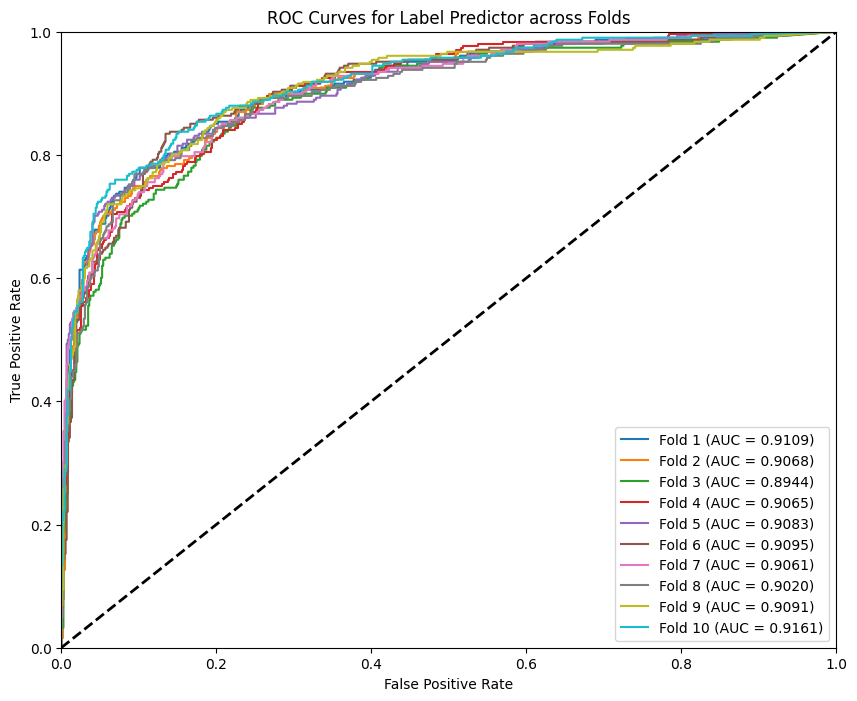

In [ ]:
from sklearn.model_selection import StratifiedKFold
from sklearn.metrics import roc_auc_score, roc_curve
import matplotlib.pyplot as plt


# Preparar los datos
X = df.iloc[:, :-2].values  # Datos de miRNAs
Y = df['vital'].values  # Estado vital
panels = df['panel'].values  # Etiquetas del dominio (paneles)
from sklearn.model_selection import train_test_split


# Convertir el estado vital a valores numéricos
label_encoder_vital = LabelEncoder()
Y = label_encoder_vital.fit_transform(Y)

# Definir el número de pliegues
n_splits = 10  # Número de pliegues para la validación cruzada
skf = StratifiedKFold(n_splits=n_splits)

# Listas para almacenar resultados de AUC
auc_scores = []
fpr_list = []
tpr_list = []

# Validación cruzada estratificada
for fold, (train_index, test_index) in enumerate(skf.split(X, Y)):
    print(f"Fold {fold + 1}/{n_splits}")

    # Dividir los datos en entrenamiento y prueba
    X_train, X_test = X[train_index], X[test_index]
    Y_train, Y_test = Y[train_index], Y[test_index]

    # Convertir a tensores
    X_train_tensor = torch.tensor(X_train, dtype=torch.float32).to(device)
    Y_train_tensor = torch.tensor(Y_train, dtype=torch.float32).unsqueeze(1).to(device)
    X_test_tensor = torch.tensor(X_test, dtype=torch.float32).to(device)
    Y_test_tensor = torch.tensor(Y_test, dtype=torch.float32).unsqueeze(1).to(device)

    # Evaluar el modelo en el conjunto de prueba
    model.eval()
    with torch.no_grad():
        label_preds, _, _ = model(X_test_tensor)
        label_preds = label_preds.cpu().numpy()
        Y_test = Y_test_tensor.cpu().numpy()

    # Calcular el AUC
    auc_score = roc_auc_score(Y_test, label_preds)
    auc_scores.append(auc_score)

    # Calcular la curva ROC
    fpr, tpr, _ = roc_curve(Y_test, label_preds)
    fpr_list.append(fpr)
    tpr_list.append(tpr)

    print(f"AUC for fold {fold + 1}: {auc_score:.4f}")

# Promediar y graficar las curvas ROC
plt.figure(figsize=(10, 8))
for i in range(n_splits):
    plt.plot(fpr_list[i], tpr_list[i], label=f'Fold {i+1} (AUC = {auc_scores[i]:.4f})')

plt.plot([0, 1], [0, 1], 'k--', lw=2)
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.0])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curves for Label Predictor across Folds')
plt.legend(loc="lower right")
plt.show()


In [ ]:
X_tensor.shape

**Analysis of the Model Outputs:**

The result you obtained confirms that the wrapper (`ModelWrapper`) is functioning correctly to return only the first output of the model, which corresponds to the vital status prediction. Below is the analysis of the results:

1. **Outputs of the model without the wrapper:**
   - **First output:** `tensor([[4.6149e-02], ... , [6.9630e-02]], device='cuda:0')` with dimension `[10286, 1]` corresponds to the vital status prediction (`LabelPredictor`).
   - **Second output:** `tensor([[-0.2760,  0.1515, ...]], device='cuda:0')` with dimension `[10286, 33]` corresponds to the domain prediction (`DomainClassifier`).
   - **Third output:** `tensor([[ 2.3175e-01, ...]], device='cuda:0')` with dimension `[10286, 5000]` corresponds to some intermediate representation or features from the feature extractor (`FeatureExtractor`).

2. **Output of the model with the wrapper:**
   - **Output:** `tensor([[4.6149e-02], ... , [6.9630e-02]], device='cuda:0')` with dimension `[10286, 1]` corresponds to the first output of the model, which is the vital status prediction, as expected.

**Conclusion:**

The wrapper `ModelWrapper` is functioning as intended, returning only the first output of the full model, which is the vital status prediction. This is confirmed by comparing the dimensions:

- **Dimensions of all outputs:**
  - **First output:** `[10286, 1]`
  - **Second output:** `[10286, 33]`
  - **Third output:** `[10286, 5000]`

- **Dimension of the wrapped output:**
  - `[10286, 1]`

The dimension `[10286, 1]` of the wrapped output matches the dimension of the vital status prediction, confirming that the wrapper is correctly returning the first output.

This behavior ensures that when you calculate SHAP values using the wrapper, you are calculating SHAP values with respect to the vital status prediction (and not the other outputs of the model). This is exactly what you need to analyze how the input features influence the vital status prediction in your DANN model.




In [ ]:
asdasdasdasdasdasd

In [ ]:
import shap
from sklearn.model_selection import StratifiedKFold
from sklearn.metrics import roc_auc_score, roc_curve
import matplotlib.pyplot as plt
import torch

# Preparar los datos
X = df.iloc[:, :-2].values  # Datos de miRNAs
Y = df['vital'].values  # Estado vital
panels = df['panel'].values  # Etiquetas del dominio (paneles)

# Convertir el estado vital a valores numéricos
label_encoder_vital = LabelEncoder()
Y = label_encoder_vital.fit_transform(Y)

# Convertir los datos a tensores y moverlos al dispositivo (CPU o GPU)
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
X_tensor = torch.tensor(X, dtype=torch.float32).to(device)
Y_tensor = torch.tensor(Y, dtype=torch.float32).unsqueeze(1).to(device)
print(X_tensor.shape)

# Supongamos que la época 10 es la que te interesa (indexada como 9 en Python)
epoch_of_interest = 9  # Indexada desde 0, por lo que la época 10 es epoch 9

# Obtener el modelo guardado al final de la época 9
iteration_info, model_state_dict = model_saver.get_models()[epoch_of_interest]
epoch, iteration = iteration_info

print(f"Modelo guardado al final de la época {epoch + 1}, iteración {iteration + 1}")
model.load_state_dict(model_state_dict)

# Asegúrate de que el modelo completo esté en modo de evaluación
model.eval()

# Obtener la salida del modelo
output = model(X_tensor)

# Si el modelo devuelve una tupla, selecciona la primera salida
if isinstance(output, tuple):
    output = output[0]

# Paso 1: Usar GradientExplainer para calcular los valores SHAP basados en las características originales
explainer = shap.GradientExplainer(model, X_tensor)
shap_values = explainer.shap_values(X_tensor)
print(shap_values.shape)

# Paso 2: Convertir los valores SHAP a numpy para visualización
shap_values_np = np.array(shap_values).squeeze()

# Paso 3: Visualización de SHAP con feature_names tomadas del DataFrame original
shap.summary_plot(shap_values_np, X, feature_names=df.iloc[:, :-2].columns)


In [ ]:
import shap
import torch
from sklearn.preprocessing import LabelEncoder
import numpy as np

# Preparar los datos
X = df.iloc[:, :-2].values  # Datos de miRNAs
Y = df['vital'].values  # Estado vital

# Convertir el estado vital a valores numéricos
label_encoder_vital = LabelEncoder()
Y = label_encoder_vital.fit_transform(Y)

# Convertir los datos a tensores y moverlos al dispositivo (CPU o GPU)
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
X_tensor = torch.tensor(X, dtype=torch.float32).to(device)
Y_tensor = torch.tensor(Y, dtype=torch.float32).unsqueeze(1).to(device)

# Supongamos que la época 5 es la que te interesa (indexada como 4 en Python)
epoch_of_interest = 9  # Indexada desde 0, por lo que la época 10 es epoch 9

# Obtener el modelo guardado al final de la época 9
iteration_info, model_state_dict = model_saver.get_models()[epoch_of_interest]
epoch, iteration = iteration_info

print(f"Modelo guardado al final de la época {epoch + 1}, iteración {iteration + 1}")
model.load_state_dict(model_state_dict)

# Asegúrate de que el modelo completo esté en modo de evaluación
model.eval()

# Paso 1: Crear un objeto DeepExplainer para el modelo
explainer = shap.DeepExplainer(model.label_predictor, X_tensor)

# Paso 2: Calcular los valores SHAP utilizando el tensor de entrada X_tensor
shap_values = explainer.shap_values(X_tensor)

# Paso 3: Convertir los valores SHAP a numpy para visualización
shap_values_np = np.array(shap_values).squeeze()

# Verifica las dimensiones de shap_values para asegurarte de que coincide con lo esperado
print("Dimensión de shap_values:", shap_values_np.shape)

# Paso 4: Visualización de SHAP con feature_names tomadas del DataFrame original
shap.summary_plot(shap_values_np, X, feature_names=df.iloc[:, :-2].columns)


In [ ]:
import shap
import torch
from sklearn.preprocessing import LabelEncoder
import numpy as np

# Preparar los datos
X = df.iloc[:, :-2].values  # Datos de miRNAs
Y = df['vital'].values  # Estado vital
panels = df['panel'].values  # Etiquetas del dominio (paneles)

# Convertir el estado vital a valores numéricos
label_encoder_vital = LabelEncoder()
Y = label_encoder_vital.fit_transform(Y)

# Convertir los datos a tensores y moverlos al dispositivo (CPU o GPU)
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
X_tensor = torch.tensor(X, dtype=torch.float32).to(device)
Y_tensor = torch.tensor(Y, dtype=torch.float32).unsqueeze(1).to(device)

# Supongamos que la época 5 es la que te interesa (indexada como 4 en Python)
epoch_of_interest = 9  # Indexada desde 0, por lo que la época 10 es epoch 9

# Obtener el modelo guardado al final de la época 9
iteration_info, model_state_dict = model_saver.get_models()[epoch_of_interest]
epoch, iteration = iteration_info

print(f"Modelo guardado al final de la época {epoch + 1}, iteración {iteration + 1}")
model.load_state_dict(model_state_dict)

# Asegúrate de que el modelo completo esté en modo de evaluación
model.eval()

# Verificar las salidas del modelo sin el wrapper
with torch.no_grad():
    all_outputs = model(X_tensor)
    print("Salidas del modelo (sin wrapper):", all_outputs)
    print("Dimensiones de todas las salidas:", [output.shape for output in all_outputs])

# Crear una clase wrapper para el modelo
# Esta clase `ModelWrapper` envuelve el modelo completo, pero en la función `forward`
# devuelve solo la primera salida del modelo (que corresponde a la predicción del estado vital).
class ModelWrapper(torch.nn.Module):
    def __init__(self, model):
        super(ModelWrapper, self).__init__()
        self.model = model

    def forward(self, x):
        return self.model(x)[0]  # Retornar solo la primera salida (la predicción de la etiqueta de vitalidad)

# Instanciar la clase wrapper
wrapped_model = ModelWrapper(model)

# Verificar la salida del modelo con el wrapper
with torch.no_grad():
    wrapped_output = wrapped_model(X_tensor)
    print("Salida del modelo (con wrapper):", wrapped_output)
    print("Dimensión de la salida envuelta:", wrapped_output.shape)

# Paso 1: Usar GradientExplainer para calcular los valores SHAP basados en las características originales
explainer = shap.DeepExplainer(wrapped_model, X_tensor)
shap_values = explainer.shap_values(X_tensor)

# Paso 2: Convertir los valores SHAP a numpy para visualización
shap_values_np = np.array(shap_values).squeeze()

# Verifica las dimensiones de shap_values para asegurarte de que coincide con lo esperado
print("Dimensión de shap_values:", shap_values_np.shape)

# Paso 3: Visualización de SHAP con feature_names tomadas del DataFrame original
shap.summary_plot(shap_values_np, X, feature_names=df.iloc[:, :-2].columns)


In [ ]:
shap.summary_plot(shap_values_np, X, feature_names=df.iloc[:, :-2].columns)



In [ ]:
shap.summary_plot(shap_values_np, X, feature_names=df.iloc[:, :-2].columns)

In [ ]:
shap.summary_plot(shap_values_np, X, feature_names=df.iloc[:, :-2].columns)


In [ ]:
import shap
from sklearn.model_selection import StratifiedKFold
from sklearn.metrics import roc_auc_score, roc_curve
import matplotlib.pyplot as plt
import torch

# Preparar los datos
X = df.iloc[:, :-2].values  # Datos de miRNAs
Y = df['vital'].values  # Estado vital
panels = df['panel'].values  # Etiquetas del dominio (paneles)

# Convertir el estado vital a valores numéricos
label_encoder_vital = LabelEncoder()
Y = label_encoder_vital.fit_transform(Y)

# Convertir los datos a tensores y moverlos al dispositivo (CPU o GPU)
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
X_tensor = torch.tensor(X, dtype=torch.float32).to(device)
Y_tensor = torch.tensor(Y, dtype=torch.float32).unsqueeze(1).to(device)

# Supongamos que la época 5 es la que te interesa (indexada como 4 en Python)
epoch_of_interest = 9  # Indexada desde 0, por lo que la época 10 es epoch 9

# Obtener el modelo guardado al final de la época 9
iteration_info, model_state_dict = model_saver.get_models()[epoch_of_interest]
epoch, iteration = iteration_info

print(f"Modelo guardado al final de la época {epoch + 1}, iteración {iteration + 1}")
model.load_state_dict(model_state_dict)

# Asegúrate de que el modelo completo esté en modo de evaluación
model.eval()

# Crear una clase wrapper para el modelo
class ModelWrapper(torch.nn.Module):
    def __init__(self, model):
        super(ModelWrapper, self).__init__()
        self.model = model

    def forward(self, x):
        return self.model(x)[0]  # Retornar solo la primera salida

# Instanciar la clase wrapper
wrapped_model = ModelWrapper(model)

# Paso 1: Usar GradientExplainer para calcular los valores SHAP basados en las características originales
explainer = shap.GradientExplainer(wrapped_model, X_tensor,batch_size = 150)
shap_values = explainer.shap_values(X_tensor)

# Paso 2: Convertir los valores SHAP a numpy para visualización
shap_values_np = np.array(shap_values).squeeze()

# Paso 3: Visualización de SHAP con feature_names tomadas del DataFrame original
shap.summary_plot(shap_values_np, X, feature_names=df.iloc[:, :-2].columns)


In [ ]:
sdasdasdasdasdasdasdasd

In [ ]:
import shap
from sklearn.model_selection import StratifiedKFold
from sklearn.metrics import roc_auc_score, roc_curve
import matplotlib.pyplot as plt
import torch

# Preparar los datos
X = df.iloc[:, :-2].values  # Datos de miRNAs
Y = df['vital'].values  # Estado vital
panels = df['panel'].values  # Etiquetas del dominio (paneles)

# Convertir el estado vital a valores numéricos
label_encoder_vital = LabelEncoder()
Y = label_encoder_vital.fit_transform(Y)

# Convertir los datos a tensores y moverlos al dispositivo (CPU o GPU)
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
X_tensor = torch.tensor(X, dtype=torch.float32).to(device)
Y_tensor = torch.tensor(Y, dtype=torch.float32).unsqueeze(1).to(device)

# Supongamos que la época 5 es la que te interesa (indexada como 4 en Python)
epoch_of_interest = 9  # Indexada desde 0, por lo que la época 10 es epoch 9

# Obtener el modelo guardado al final de la época 9
iteration_info, model_state_dict = model_saver.get_models()[epoch_of_interest]
epoch, iteration = iteration_info

print(f"Modelo guardado al final de la época {epoch + 1}, iteración {iteration + 1}")
model.load_state_dict(model_state_dict)

# Asegúrate de que el modelo completo esté en modo de evaluación
model.eval()

# Crear una clase wrapper para el modelo
class ModelWrapper(torch.nn.Module):
    def __init__(self, model):
        super(ModelWrapper, self).__init__()
        self.model = model

    def forward(self, x):
        return self.model(x)[0]  # Retornar solo la primera salida

# Instanciar la clase wrapper
wrapped_model = ModelWrapper(model)

# Paso 1: Usar GradientExplainer para calcular los valores SHAP basados en las características originales
explainer = shap.GradientExplainer(wrapped_model, X_tensor)
shap_values = explainer.shap_values(X_tensor)

# Paso 2: Convertir los valores SHAP a numpy para visualización
shap_values_np = np.array(shap_values).squeeze()

# Paso 3: Visualización de SHAP con feature_names tomadas del DataFrame original
shap.summary_plot(shap_values_np, X, feature_names=df.iloc[:, :-2].columns)


In [ ]:
import shap
import torch

# Asumiendo que el modelo DANN ya ha sido definido y entrenado

# Instanciar y cargar el modelo como se hace en el código original
input_dim = X.shape[1]
num_domains = len(label_encoder_panel.classes_)
model = DANN(input_dim, num_domains).to(device)

# Cargar el modelo guardado al final de una época en particular
epoch_of_interest = 9  # Ejemplo, puedes ajustar la época de interés
iteration_info, model_state_dict = model_saver.get_models()[epoch_of_interest]
model.load_state_dict(model_state_dict)

# Asegurarse de que el modelo esté en modo de evaluación
model.eval()

# Crear una clase wrapper para obtener solo la salida del LabelPredictor
class LabelPredictorWrapper(torch.nn.Module):
    def __init__(self, model):
        super(LabelPredictorWrapper, self).__init__()
        self.label_predictor = model.label_predictor

    def forward(self, x):
        return self.label_predictor(x)

# Instanciar el wrapper
label_predictor_model = LabelPredictorWrapper(model)

# Usar GradientExplainer para calcular los valores SHAP basados en las características originales
explainer = shap.GradientExplainer(label_predictor_model, X_tensor)
shap_values = explainer.shap_values(X_tensor)

# Convertir los valores SHAP a numpy para visualización
shap_values_np = np.array(shap_values).squeeze()

# Visualización de SHAP
shap.summary_plot(shap_values_np, X, feature_names=df.iloc[:, :-2].columns)


In [ ]:

# Paso 2: Usar GradientExplainer para calcular los valores SHAP
explainer = shap.GradientExplainer(label_predictor_model,X)
shap_values = explainer.shap_values(X)

# Paso 3: Convertir los tensores de entrada y los valores SHAP a numpy para visualización
features_np = X.cpu().numpy()
shap_values_np = np.array(shap_values).squeeze()

# Paso 4: Visualización de SHAP con feature_names tomadas del DataFrame original
shap.summary_plot(shap_values_np, features_np, feature_names=df.iloc[:, :-2].columns)

In [ ]:
features_np.shape

In [ ]:
len(df.iloc[:, :-2].columns)

In [ ]:
shap.summary_plot(shap_values_np, features_np, feature_names=df.iloc[:, :-2].columns,max_display=50 )


In [ ]:
shap_values_np.shape

In [ ]:

pd.DataFrame(shap_values_np, columns=df.iloc[:, :-2].columns,index=df.index)